# Analyze FEM solver acoustic part

## Setup environment

In [3]:
from pathlib import Path
import matplotlib.pyplot as plt
import librosa
import numpy as np
import subprocess
from boomspeaver.tools.data import get_repo_dir, load_numpy_file, load_wave_file, save_wave_file, load_json_file, save_json_file, save_numpy_file, pad_vector, search4paths
from boomspeaver.loudspeaker.schema import Loudspeaker
from boomspeaver.tools.dsp.dsp import fft_analysis, detect_peaks, get_resolution, detect_signal_bounds,calculate_spectrogram, normalize
from boomspeaver.tools.dsp.make_sound import generate_cosine_wave, generate_white_noise, generate_log_sweep
from boomspeaver.tools.plot.configs import Axis, Line, Plotter, Points, Subplot
from boomspeaver.tools.plot.multi_plotter import MultiPlotter
from boomspeaver.tools.multiprocessing_runner import MultiprocessingRunner


In [4]:
repo_dir=get_repo_dir(run_type="python")
%cd {repo_dir}

/home/freetzz/repo/ls_wip/loudspeaker-solver


/home/freetzz/miniconda3/lib/python3.12/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [5]:
!docker compose up -d

[+] Running 0/1
 ⠋ Container fenics  Starting                                              0.1s 
[+] Running 0/1
 ⠙ Container fenics  Starting                                              0.2s 
[+] Running 1/1
 ✔ Container fenics  Started                                               0.3s 


## Generate data

In [6]:
output_dir = repo_dir / "generate_dataset"

In [7]:
input_time_100ms_path = repo_dir / "examples/time_vector_100ms_48kHz.npy"
input_time_100ms_sil_path = repo_dir / "examples/time_vector_100ms_silencjo_48kHz.npy"
input_time_10ms_sil_path = repo_dir / "examples/time_vector_10ms_silencjo_48kHz.npy"
input_time_1s_path = repo_dir / "examples/time_vector_1s_48kHz.npy"
input_time_10ms_path = repo_dir / "examples/time_vector_10ms_48kHz.npy"
input_time_20ms_path = repo_dir / "examples/time_vector_20ms_48kHz.npy"
loudspeaker_params_path = repo_dir / "examples/prv_audio_6MB400_8ohm.json"
sampling_rate = 48000

In [8]:
time_100ms=load_numpy_file(input_time_100ms_path)
time_100ms_sil=load_numpy_file(input_time_100ms_sil_path)
time_10ms_sil=load_numpy_file(input_time_10ms_sil_path)
time_10ms=load_numpy_file(input_time_10ms_path)
time_20ms=load_numpy_file(input_time_20ms_path)
time_1kms=load_numpy_file(input_time_1s_path)
loudspeaker_params = Loudspeaker.from_json(loudspeaker_params_path)

In [9]:
min_freq=loudspeaker_params.frequency_response["min"]
max_freq=loudspeaker_params.frequency_response["max"]

In [10]:
print(len(time_10ms))
print(len(time_100ms))
print(len(time_100ms_sil))
print(len(time_1kms))

480
4800
5200
48000


### Single static frequencies

In [10]:
def semitone_frequencies(f_min, f_max):
    """
    Calculate semitone frequencies between f_min and f_max (inclusive)
    """
    if f_min <= 0 or f_max <= 0:
        raise ValueError("Frequencies must be positive.")
    if f_max < f_min:
        raise ValueError("f_max must be >= f_min")
    ratio = 2 ** (1/12)
    freqs = [f_min]

    while freqs[-1] * ratio <= f_max:
        freqs.append(freqs[-1] * ratio)

    return np.array(freqs)

In [11]:
freqs = semitone_frequencies(min_freq, max_freq)

Create proper signal files.

In [12]:
input_dataset_dir=output_dir/"input_test_files"

In [15]:
for freq in freqs:
    signal=generate_cosine_wave(freq, len(time_10ms) / sampling_rate, sampling_rate, 0.5, True)
    name=str(int(freq))
    output_path=input_dataset_dir / name / f"{name}Hz_cosine.wav"
    save_wave_file(output_path, sampling_rate, np.int16(signal * 32767))

In [13]:
input_single_steady_paths=search4paths(input_path=input_dataset_dir, search_pattern="*cosine.wav", recursive=True)

## White noise

In [16]:
signal=generate_white_noise(len(time_100ms)/sampling_rate,sampling_rate, 0.5, True)
output_path=input_dataset_dir / "white_noise/white_noise.wav"
save_wave_file(output_path, sampling_rate, np.int16(signal * 32767))

In [14]:
input_white_noise_paths = search4paths(input_path=input_dataset_dir, search_pattern="*noise.wav", recursive=True)

### Single time dependent frequencies

In [18]:
def octave_frequencies(f_min, f_max):
    """
    Calculate octave frequencies between f_min and f_max (inclusive),
    starting from f_max and stepping down.
    """
    if f_min <= 0 or f_max <= 0:
        raise ValueError("Frequencies must be positive.")
    if f_max < f_min:
        raise ValueError("f_max must be >= f_min")

    ratio = 2
    freqs = [f_max]

    while freqs[-1] / ratio >= f_min:
        freqs.append(freqs[-1] / ratio)

    shift=freqs
    shift=shift[1:]
    shift.append(float(f_min))
    output = [ (start, end) for end, start in zip(freqs, shift)]

    return np.array(sorted(output))

In [14]:
freqs = octave_frequencies(min_freq, max_freq)
print(freqs)

NameError: name 'octave_frequencies' is not defined

In [20]:
for s, e in freqs:
    signal=generate_log_sweep(f_start=s, f_end=e, duration=len(time_100ms) / sampling_rate, fs=sampling_rate, amplitude=0.5, signal_norm=True)
    name=str(int(s))+"to"+str(int(e))
    output_path=input_dataset_dir / name / f"{name}Hz_sweep.wav"
    save_wave_file(output_path, sampling_rate, np.int16(signal * 32767))

In [15]:
input_time_dependent_paths=search4paths(input_path=input_dataset_dir, search_pattern="*sweep.wav", recursive=True)

In [16]:
input_time_dependent_paths=list(input_time_dependent_paths)
input_single_steady_paths=list(input_single_steady_paths)
input_white_noise_paths=list(input_white_noise_paths)

## Electric Part

In [20]:
from boomspeaver.electromagnetic.calulate_coil_current import frequency_impedance

In [21]:
#input_single_steady_paths
#input_time_dependent_paths
#input_white_noise_paths
input_impedance_path= repo_dir / "examples/electrical_impedance.csv"
n_fft=2048
win_length=2048
hop_length=512

In [26]:
def transfer_function(input: np.ndarray, output: np.ndarray, sampling_rate: int) -> np.ndarray:

    input_frequency_domain = fft_analysis(signal=input, sampling_rate=sampling_rate)
    output_frequency_domain = fft_analysis(signal=output, sampling_rate=sampling_rate)

    assert len(input_frequency_domain[0]) == len(output_frequency_domain[0])
    X=input_frequency_domain[1]
    Y=output_frequency_domain[1]

    eps = 1e-12
    mask = np.abs(input_frequency_domain[1]) > eps

    if len(mask) != len(input_frequency_domain[1]):
        print(len(mask), len(input_frequency_domain[1]))

    H = np.zeros_like(X, dtype=complex)
    H[mask] = Y[mask] / X[mask]

    return input_frequency_domain[0], H

### White noise

In [44]:
output_electric_dir = output_dir / "part_electric"
output_paths_compare=[]
input_white_noise_paths=list(input_white_noise_paths)

In [21]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)

/home/freetzz/repo/ls_wip/loudspeaker-solver/boomspeaver/tools/plot/multi_plotter.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


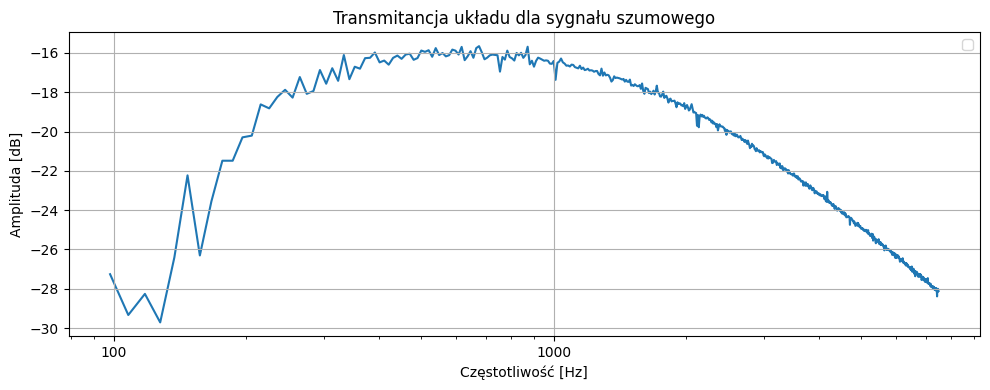

In [ ]:
freq_start, freq_end = 50, 20000
freq_start, freq_end = min_freq, max_freq
for path in input_white_noise_paths:
    output_path = output_electric_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))

    frequency_impedance(input_signal_path=path,impedance_params=input_impedance_path, output_path=output_path,n_fft=n_fft, win_length=win_length, hop_length=hop_length)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path),sampling_rate)

    mask = (freqs >= freq_start) & (freqs <= freq_end)
    freqs_masked = freqs[mask]
    transmitance_masked = transmitance[mask]


plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu dla sygnału szumowego",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_masked, 20*np.log10(np.abs(transmitance_masked)))],
    )
)
plotter.plot()

### Single static frequencies

In [34]:
input_single_steady_paths=list(input_single_steady_paths)
output_paths_compare=[]

In [35]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)

In [36]:
freqs_points=[]
transmitanced=[]
freq_start, freq_end = min_freq, max_freq
for path in input_single_steady_paths:
    freq=int(str(path.name.split("_")[0])[:-2])
    freqs_points.append(freq)
    output_path = output_electric_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))

    frequency_impedance(input_signal_path=path,impedance_params=input_impedance_path, output_path=output_path, n_fft=n_fft, win_length=win_length, hop_length=hop_length)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path),sampling_rate)

    idx = np.argmin(np.abs(freqs - freq))
    transmitanced.append(transmitance[idx])

freqs_points = np.array(freqs_points)
transmitanced = np.array(transmitanced)

sort_idx = np.argsort(freqs_points)

freqs_points_sorted = freqs_points[sort_idx]
transmitanced_sorted = transmitanced[sort_idx]

mask = (freqs_points_sorted >= freq_start) & (freqs_points_sorted <= freq_end)

freqs_points_sorted = freqs_points_sorted[mask]
transmitanced_sorted = transmitanced_sorted[mask]

/home/freetzz/repo/ls_wip/loudspeaker-solver/boomspeaver/tools/plot/multi_plotter.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


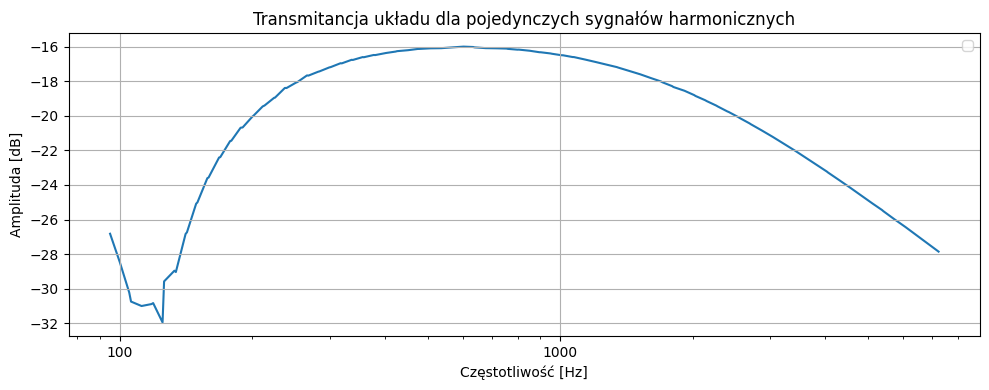

In [37]:
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu dla pojedynczych sygnałów harmonicznych",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_points_sorted,20*np.log10(np.abs(transmitanced_sorted)))],
    )
)
plotter.plot()

### Time dependent frequencies

In [38]:
input_time_dependent_paths=list(input_time_dependent_paths)
output_paths_compare=[]

In [39]:
freqs_points=[]
transmitanced=[]
for path in input_time_dependent_paths:
    freq_start=int(str(path.name.split("_")[0])[:-2].split("to")[0])
    freq_end=int(str(path.name.split("_")[0])[:-2].split("to")[1])
    output_path = output_electric_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))

    frequency_impedance(input_signal_path=path,impedance_params=input_impedance_path, output_path=output_path, n_fft=n_fft, win_length=win_length, hop_length=hop_length)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path),sampling_rate)

    mask = (freqs >= freq_start) & (freqs <= freq_end)

    freqs_points.extend(freqs[mask])
    transmitanced.extend(transmitance[mask])

freqs_points = np.array(freqs_points)
transmitanced = np.array(transmitanced)

sort_idx = np.argsort(freqs_points)
freqs_points_sorted = freqs_points[sort_idx]
transmitanced_sorted = transmitanced[sort_idx]

mask = (freqs_points_sorted >= min_freq) & (freqs_points_sorted <= max_freq)

freqs_points_sorted = freqs_points_sorted[mask]
transmitanced_sorted = transmitanced_sorted[mask]


/home/freetzz/repo/ls_wip/loudspeaker-solver/boomspeaver/tools/plot/multi_plotter.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


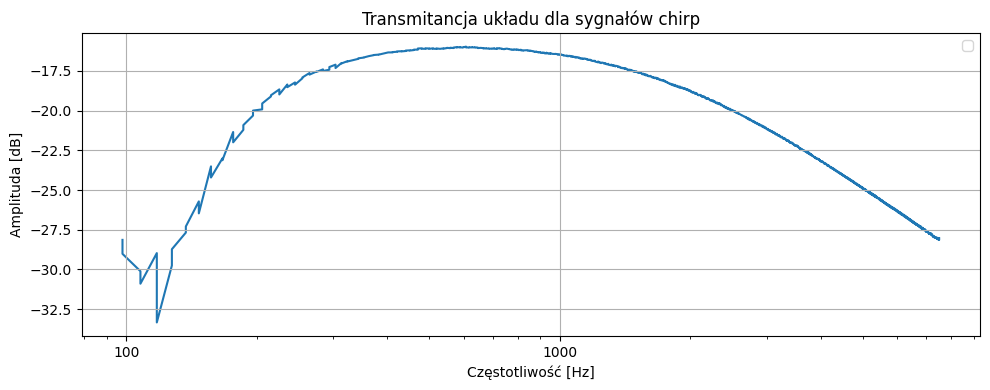

In [40]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu dla sygnałów chirp",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_points_sorted,20*np.log10(np.abs(transmitanced_sorted)))],
    )
)
plotter.plot()

## Electromagnetic Part

In [47]:
from boomspeaver.electromagnetic.magnetic_force import magnetic_force

In [48]:
output_electric_dir = output_dir / "part_electomagnetic"

### Noise Signals

In [ ]:
paths=input_white_noise_paths+input_single_steady_paths+input_time_dependent_paths
for path in paths:
    oss=load_wave_file(path)[0]
    save_numpy_file(path.with_suffix(".npy"), oss)

In [49]:
freq_start, freq_end = min_freq, max_freq
for path in input_white_noise_paths:
    output_path = output_electric_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))

    magnetic_force(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path),sampling_rate)

    mask = (freqs >= freq_start) & (freqs <= freq_end)
    freqs_masked = freqs[mask]
    transmitance_masked = transmitance[mask]

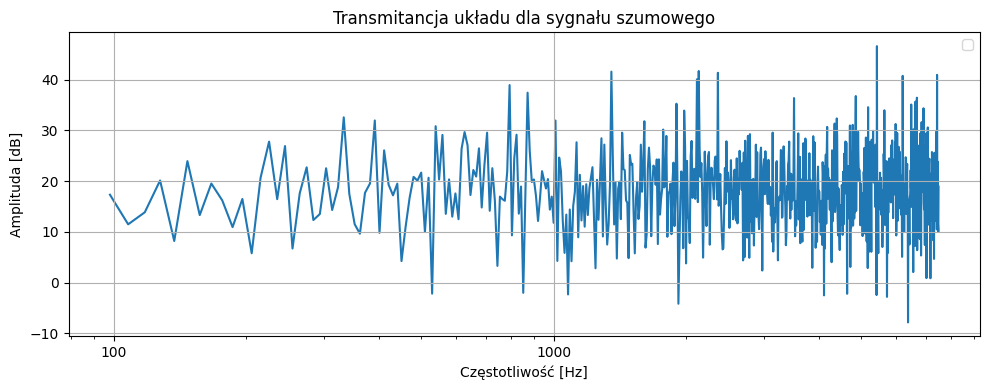

In [50]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu dla sygnału szumowego",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            # ylim=tuple([0,1]),
            logx=True,
        ),
        chart_elements=[Line(freqs_masked, 20*np.log10(np.abs(transmitance_masked)))],
    )
)
plotter.plot()

### Single Frequencies

In [54]:
freqs_points=[]
transmitanced=[]
for path in input_single_steady_paths:
    freq=int(str(path.name.split("_")[0])[:-2])
    freqs_points.append(freq)
    output_path = output_electric_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))


    magnetic_force(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path),sampling_rate)

    idx = np.argmin(np.abs(freqs - freq))
    transmitanced.append(transmitance[idx])

freqs_points = np.array(freqs_points)
transmitanced = np.array(transmitanced)

sort_idx = np.argsort(freqs_points)

freqs_points_sorted = freqs_points[sort_idx]
transmitanced_sorted = transmitanced[sort_idx]

mask = (freqs_points_sorted >= min_freq) & (freqs_points_sorted <= max_freq)

freqs_points_sorted = freqs_points_sorted[mask]
transmitanced_sorted = transmitanced_sorted[mask]

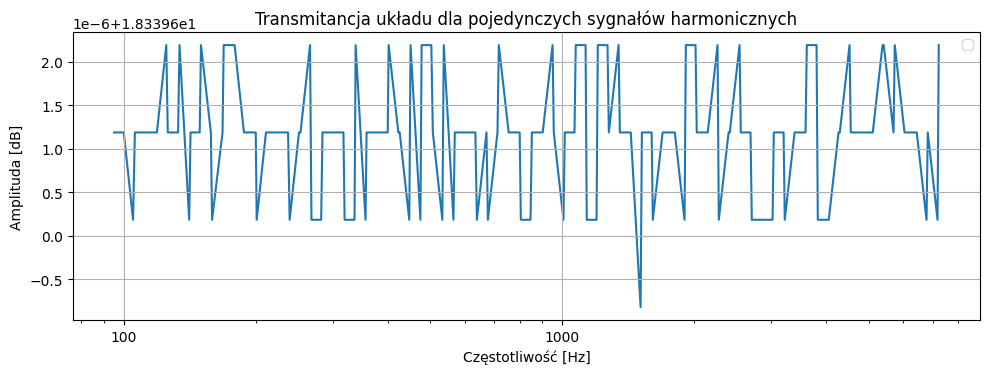

In [55]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu dla pojedynczych sygnałów harmonicznych",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_points_sorted,20*np.log10(np.abs(transmitanced_sorted)))],
    )
)
plotter.plot()

### Time dependent Frequencies

In [58]:
freqs_points=[]
transmitanced=[]
for path in input_time_dependent_paths:
    freq_start=int(str(path.name.split("_")[0])[:-2].split("to")[0])
    freq_end=int(str(path.name.split("_")[0])[:-2].split("to")[1])
    output_path = output_electric_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))


    magnetic_force(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path),sampling_rate)

    mask = (freqs >= freq_start) & (freqs <= freq_end)

    freqs_points.extend(freqs[mask])
    transmitanced.extend(transmitance[mask])

freqs_points = np.array(freqs_points)
transmitanced = np.array(transmitanced)

sort_idx = np.argsort(freqs_points)
freqs_points_sorted = freqs_points[sort_idx]
transmitanced_sorted = transmitanced[sort_idx]

mask = (freqs_points_sorted >= min_freq) & (freqs_points_sorted <= max_freq)

freqs_points_sorted = freqs_points_sorted[mask]
transmitanced_sorted = transmitanced_sorted[mask]

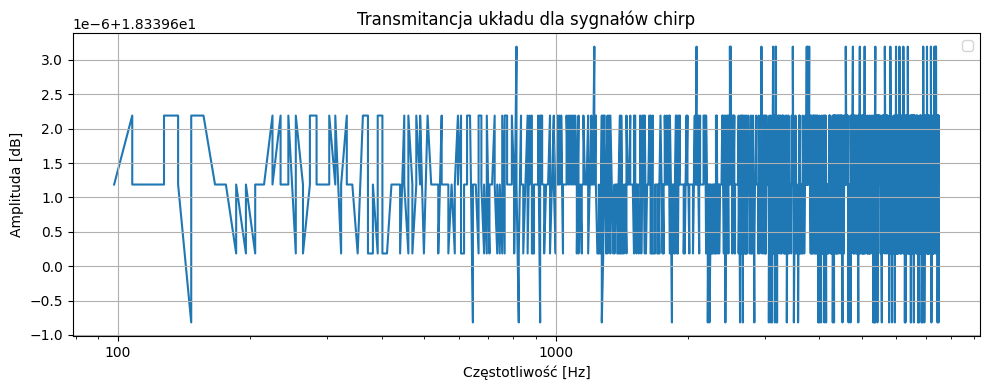

In [59]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu dla sygnałów chirp",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_points_sorted,20*np.log10(np.abs(transmitanced_sorted)))],
    )
)
plotter.plot()

## Mechanical Part

In [62]:
from boomspeaver.mechanical.oscillation_euler import main as euler
from boomspeaver.mechanical.oscillation_radau import main as radau
from boomspeaver.mechanical.oscillation_analytical_fourier import main as analytical

In [63]:
output_electric_dir = output_dir / "part_mechanical"

output_euler_dir = output_electric_dir / "euler"
output_radau_dir = output_electric_dir / "radau"
output_experimental_dir = output_electric_dir / "analytical_experimental"

### Noise Signals

#### Euler

In [64]:
freq_start, freq_end = min_freq, max_freq
for path in input_white_noise_paths:
    output_path = output_euler_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))

    euler(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path, sampling_rate=sampling_rate)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path.with_suffix(".x.npy")),sampling_rate)

    mask = (freqs >= freq_start) & (freqs <= freq_end)
    freqs_masked = freqs[mask]
    transmitance_masked = transmitance[mask]

/home/freetzz/repo/ls_wip/loudspeaker-solver/boomspeaver/tools/plot/multi_plotter.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


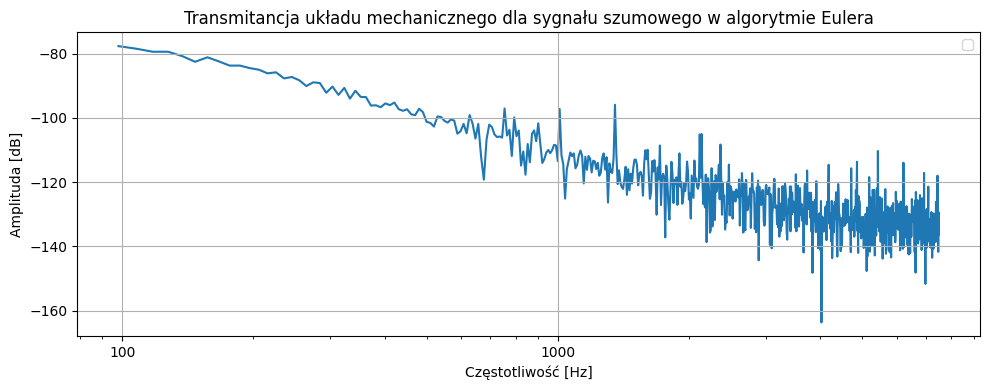

In [65]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu mechanicznego dla sygnału szumowego w algorytmie Eulera",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            # ylim=tuple([0,1]),
            logx=True,
        ),
        chart_elements=[Line(freqs_masked, 20*np.log10(np.abs(transmitance_masked)))],
    )
)
plotter.plot()

#### Radau

In [66]:
freq_start, freq_end = min_freq, max_freq
for path in input_white_noise_paths:
    output_path = output_radau_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))

    radau(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path, sampling_rate=sampling_rate)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path.with_suffix(".x.npy")),sampling_rate)

    mask = (freqs >= freq_start) & (freqs <= freq_end)
    freqs_masked = freqs[mask]
    transmitance_masked = transmitance[mask]

/home/freetzz/repo/ls_wip/loudspeaker-solver/boomspeaver/tools/plot/multi_plotter.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


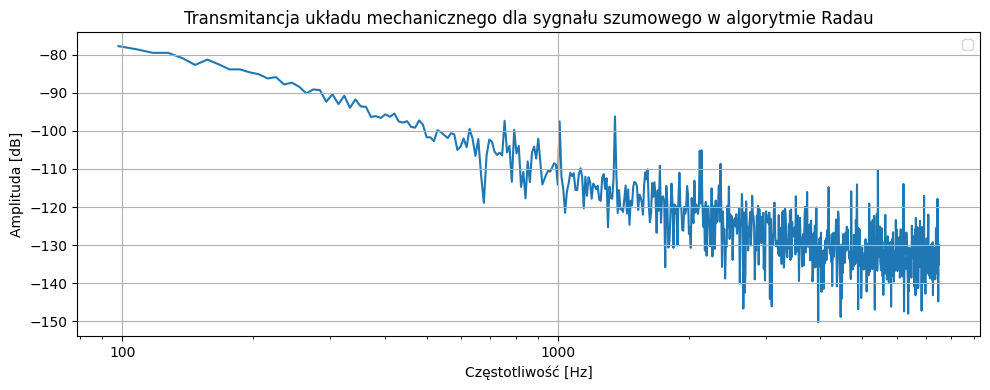

In [67]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu mechanicznego dla sygnału szumowego w algorytmie Radau",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            # ylim=tuple([0,1]),
            logx=True,
        ),
        chart_elements=[Line(freqs_masked, 20*np.log10(np.abs(transmitance_masked)))],
    )
)
plotter.plot()

#### Analytical

In [68]:
freq_start, freq_end = min_freq, max_freq
for path in input_white_noise_paths:
    output_path = output_experimental_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))

    analytical(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path, n_fft=n_fft, win_length=win_length, hop_length=hop_length, sampling_rate=sampling_rate,verbose=False)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path.with_suffix(".x.npy")),sampling_rate)

    mask = (freqs >= freq_start) & (freqs <= freq_end)
    freqs_masked = freqs[mask]
    transmitance_masked = transmitance[mask]

/home/freetzz/repo/ls_wip/loudspeaker-solver/boomspeaver/tools/plot/multi_plotter.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


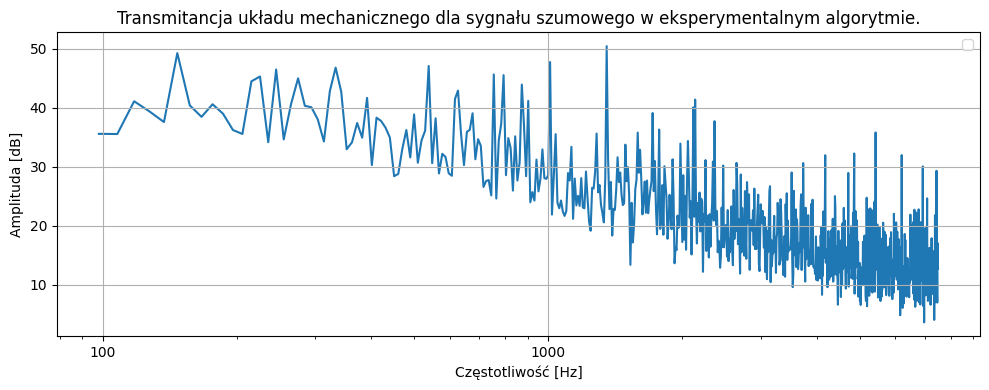

In [69]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu mechanicznego dla sygnału szumowego w eksperymentalnym algorytmie.",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            # ylim=tuple([0,1]),
            logx=True,
        ),
        chart_elements=[Line(freqs_masked, 20*np.log10(np.abs(transmitance_masked)))],
    )
)
plotter.plot()

### Single Frequencies

#### Euler

In [70]:
freqs_points=[]
transmitanced=[]
for path in input_single_steady_paths:
    freq=int(str(path.name.split("_")[0])[:-2])
    freqs_points.append(freq)
    output_path = output_euler_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))

    euler(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path.with_suffix(".x.npy")),sampling_rate)

    idx = np.argmin(np.abs(freqs - freq))
    transmitanced.append(transmitance[idx])

freqs_points = np.array(freqs_points)
transmitanced = np.array(transmitanced)

sort_idx = np.argsort(freqs_points)

freqs_points_sorted = freqs_points[sort_idx]
transmitanced_sorted = transmitanced[sort_idx]

mask = (freqs_points_sorted >= min_freq) & (freqs_points_sorted <= max_freq)

freqs_points_sorted = freqs_points_sorted[mask]
transmitanced_sorted = transmitanced_sorted[mask]

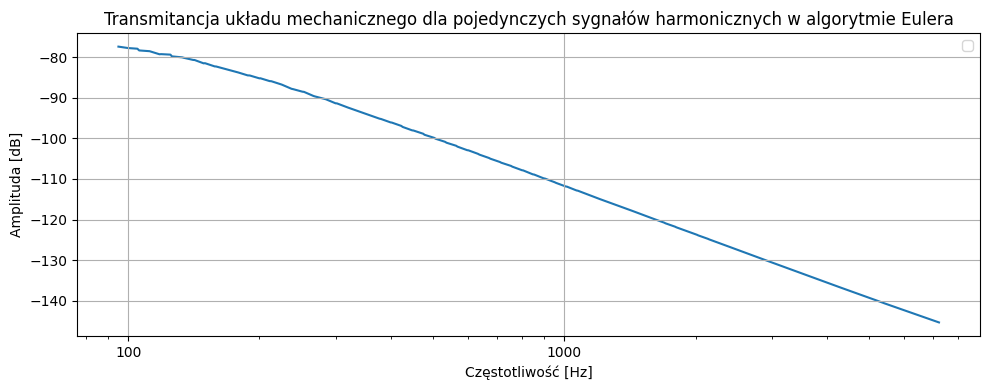

In [71]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu mechanicznego dla pojedynczych sygnałów harmonicznych w algorytmie Eulera",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_points_sorted,20*np.log10(np.abs(transmitanced_sorted)))],
    )
)
plotter.plot()

#### Radau

In [72]:
freqs_points=[]
transmitanced=[]
for path in input_single_steady_paths:
    freq=int(str(path.name.split("_")[0])[:-2])
    freqs_points.append(freq)
    output_path = output_radau_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))


    radau(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path.with_suffix(".x.npy")),sampling_rate)

    idx = np.argmin(np.abs(freqs - freq))
    transmitanced.append(transmitance[idx])

freqs_points = np.array(freqs_points)
transmitanced = np.array(transmitanced)

sort_idx = np.argsort(freqs_points)

freqs_points_sorted = freqs_points[sort_idx]
transmitanced_sorted = transmitanced[sort_idx]

mask = (freqs_points_sorted >= min_freq) & (freqs_points_sorted <= max_freq)

freqs_points_sorted = freqs_points_sorted[mask]
transmitanced_sorted = transmitanced_sorted[mask]

/home/freetzz/repo/ls_wip/loudspeaker-solver/boomspeaver/tools/plot/multi_plotter.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


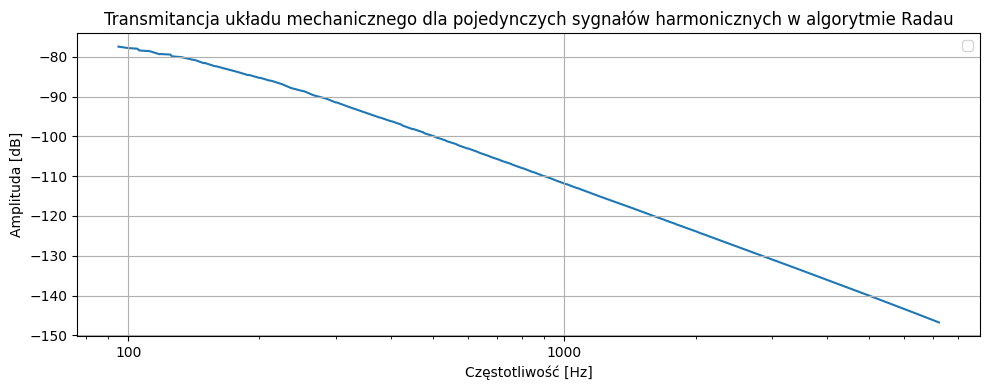

In [73]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu mechanicznego dla pojedynczych sygnałów harmonicznych w algorytmie Radau",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_points_sorted,20*np.log10(np.abs(transmitanced_sorted)))],
    )
)
plotter.plot()

#### Analytical

In [74]:
freqs_points=[]
transmitanced=[]
for path in input_single_steady_paths:
    freq=int(str(path.name.split("_")[0])[:-2])
    freqs_points.append(freq)
    output_path = output_experimental_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))


    analytical(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path, n_fft=n_fft, win_length=win_length, hop_length=hop_length, sampling_rate=sampling_rate,verbose=False)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path.with_suffix(".x.npy")),sampling_rate)

    idx = np.argmin(np.abs(freqs - freq))
    transmitanced.append(transmitance[idx])

freqs_points = np.array(freqs_points)
transmitanced = np.array(transmitanced)

sort_idx = np.argsort(freqs_points)

freqs_points_sorted = freqs_points[sort_idx]
transmitanced_sorted = transmitanced[sort_idx]

mask = (freqs_points_sorted >= min_freq) & (freqs_points_sorted <= max_freq)

freqs_points_sorted = freqs_points_sorted[mask]
transmitanced_sorted = transmitanced_sorted[mask]

/home/freetzz/repo/ls_wip/loudspeaker-solver/boomspeaver/tools/plot/multi_plotter.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


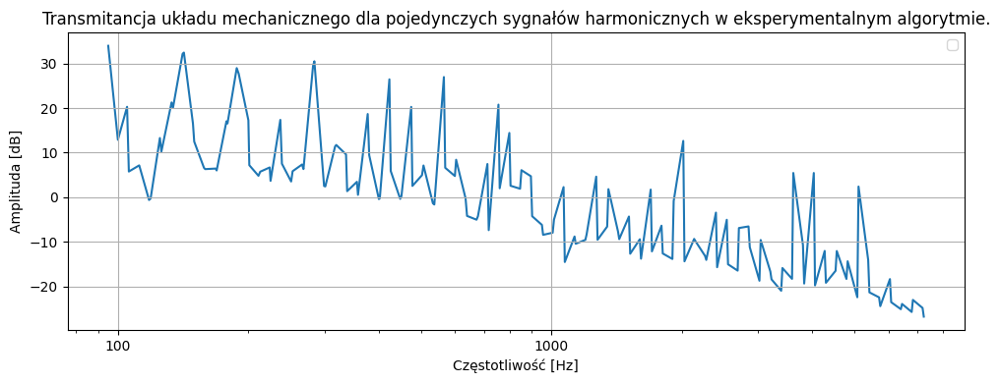

In [75]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu mechanicznego dla pojedynczych sygnałów harmonicznych w eksperymentalnym algorytmie.",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_points_sorted,20*np.log10(np.abs(transmitanced_sorted)))],
    )
)
plotter.plot()

### Time dependent Frequencies

#### Euler

In [76]:
freqs_points=[]
transmitanced=[]
for path in input_time_dependent_paths:
    freq_start=int(str(path.name.split("_")[0])[:-2].split("to")[0])
    freq_end=int(str(path.name.split("_")[0])[:-2].split("to")[1])
    output_path = output_euler_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))


    euler(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path.with_suffix(".x.npy")),sampling_rate)

    mask = (freqs >= freq_start) & (freqs <= freq_end)

    freqs_points.extend(freqs[mask])
    transmitanced.extend(transmitance[mask])

freqs_points = np.array(freqs_points)
transmitanced = np.array(transmitanced)

sort_idx = np.argsort(freqs_points)
freqs_points_sorted = freqs_points[sort_idx]
transmitanced_sorted = transmitanced[sort_idx]

mask = (freqs_points_sorted >= min_freq) & (freqs_points_sorted <= max_freq)

freqs_points_sorted = freqs_points_sorted[mask]
transmitanced_sorted = transmitanced_sorted[mask]

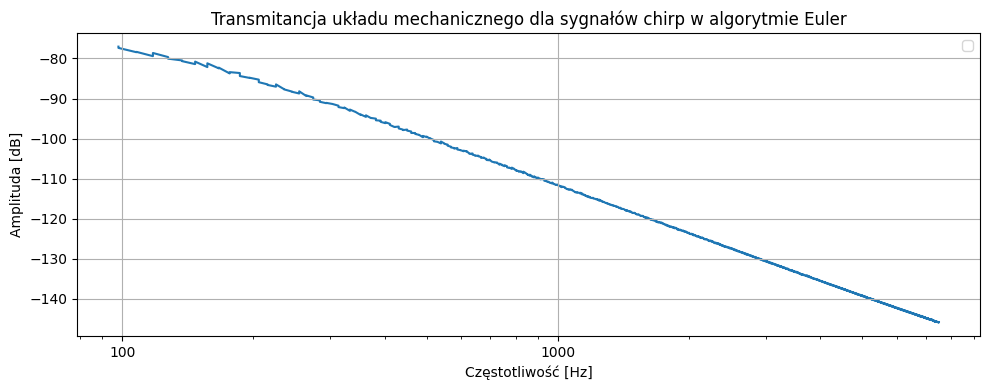

In [77]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu mechanicznego dla sygnałów chirp w algorytmie Euler",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_points_sorted,20*np.log10(np.abs(transmitanced_sorted)))],
    )
)
plotter.plot()

#### Radau

In [78]:
freqs_points=[]
transmitanced=[]
for path in input_time_dependent_paths:
    freq_start=int(str(path.name.split("_")[0])[:-2].split("to")[0])
    freq_end=int(str(path.name.split("_")[0])[:-2].split("to")[1])
    output_path = output_radau_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))


    radau(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path.with_suffix(".x.npy")),sampling_rate)

    mask = (freqs >= freq_start) & (freqs <= freq_end)

    freqs_points.extend(freqs[mask])
    transmitanced.extend(transmitance[mask])

freqs_points = np.array(freqs_points)
transmitanced = np.array(transmitanced)

sort_idx = np.argsort(freqs_points)
freqs_points_sorted = freqs_points[sort_idx]
transmitanced_sorted = transmitanced[sort_idx]

mask = (freqs_points_sorted >= min_freq) & (freqs_points_sorted <= max_freq)

freqs_points_sorted = freqs_points_sorted[mask]
transmitanced_sorted = transmitanced_sorted[mask]

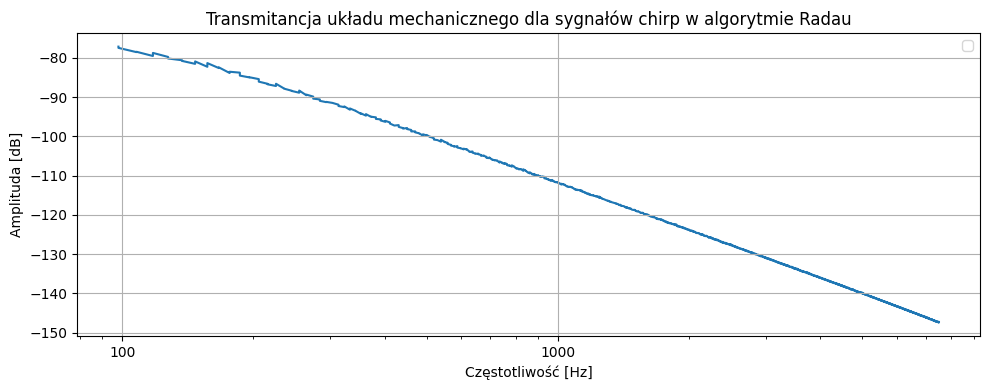

In [79]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu mechanicznego dla sygnałów chirp w algorytmie Radau",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_points_sorted,20*np.log10(np.abs(transmitanced_sorted)))],
    )
)
plotter.plot()

#### Analytical

In [80]:
freqs_points=[]
transmitanced=[]
for path in input_time_dependent_paths:
    freq_start=int(str(path.name.split("_")[0])[:-2].split("to")[0])
    freq_end=int(str(path.name.split("_")[0])[:-2].split("to")[1])
    output_path = output_experimental_dir / path.with_suffix(".npy").name
    output_paths_compare.append((str(path), str(output_path)))


    analytical(input_signal_path=path.with_suffix(".npy"),loudspeaker_params=loudspeaker_params,output_path=output_path, n_fft=n_fft, win_length=win_length, hop_length=hop_length, sampling_rate=sampling_rate,verbose=False)
    freqs, transmitance = transfer_function(load_wave_file(path)[0], load_numpy_file(output_path.with_suffix(".x.npy")),sampling_rate)

    mask = (freqs >= freq_start) & (freqs <= freq_end)

    freqs_points.extend(freqs[mask])
    transmitanced.extend(transmitance[mask])

freqs_points = np.array(freqs_points)
transmitanced = np.array(transmitanced)

sort_idx = np.argsort(freqs_points)
freqs_points_sorted = freqs_points[sort_idx]
transmitanced_sorted = transmitanced[sort_idx]

mask = (freqs_points_sorted >= min_freq) & (freqs_points_sorted <= max_freq)

freqs_points_sorted = freqs_points_sorted[mask]
transmitanced_sorted = transmitanced_sorted[mask]

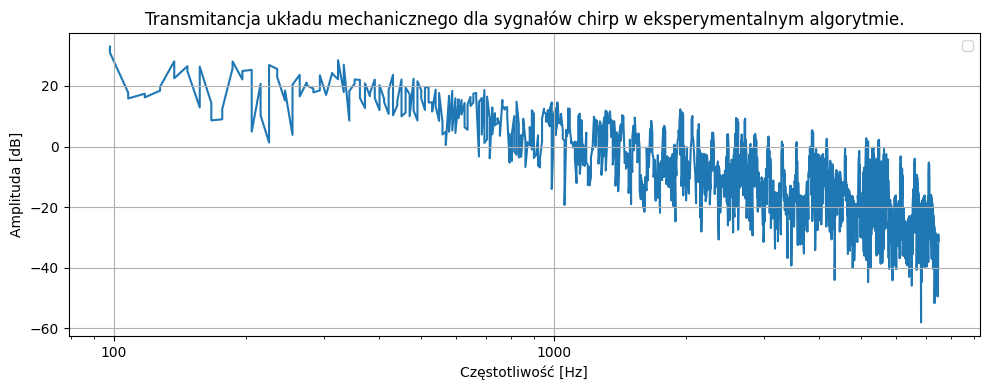

In [81]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Transmitancja układu mechanicznego dla sygnałów chirp w eksperymentalnym algorytmie.",
            xlabel="Częstotliwość [Hz]",
            ylabel="Amplituda [dB]",
            logx=True,
        ),
        chart_elements=[Line(freqs_points_sorted,20*np.log10(np.abs(transmitanced_sorted)))],
    )
)
plotter.plot()

## Structural

In [41]:
output_structural_dir = output_dir / "part_structural"

In [30]:
membrane_short_paths=[path.with_suffix(".npy") for path in input_single_steady_paths if int(path.stem.split("_")[0][:-2]) < max_freq]

In [31]:
print(len(membrane_short_paths))
print(membrane_short_paths[0])

161
/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/760/760Hz_cosine.npy


In [32]:
def run_structural(input_path, remove: bool=True):
    output_path = output_structural_dir / f"{input_path.stem}.xdmf"
    if not output_path.with_suffix(".npy").exists():
        cmd = [
            "./run_fenics.sh",
            "-c", "boomspeaver/structural/fem/the_membrane.py",
            "--time_input_path", str(input_time_10ms_path.relative_to(repo_dir)),
            "--signal_input_path", str(input_path.relative_to(repo_dir)),
            "--output_path", str(output_path.relative_to(repo_dir)),
            "--listen",
        ]
        subprocess.run(cmd, check=True)
        if remove:
            for path in [
                output_path,
                output_path.with_suffix(".h5"),
                output_path.with_suffix(".msh"),
            ]:
                try:
                    if path.exists():
                        subprocess.run(["docker", "exec", "fenics", "rm", "-rf", str(path.relative_to(repo_dir))], check=False)
                except Exception as e:
                    print(f"[WARN] Could not remove {path}: {e}")

In [33]:
runner = MultiprocessingRunner(run_structural, membrane_short_paths, num_workers=12)

In [ ]:
runner.run()

Output()

Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode


## Acoustic

### Piston

In [22]:
output_acoustic_piston_dir = output_dir / "part_acoustic/piston"

In [27]:
def run_acoustic_piston(input_path, remove: bool=True):
    output_path = output_acoustic_piston_dir / f"{input_path.stem}.xdmf"
    if not output_path.with_suffix(".npy").exists():
        cmd = [
            "./run_fenics.sh",
            "-c", "boomspeaver/acoustic/wave_equation_piston_3d.py",
            "--time_input_path", str(input_time_100ms_sil_path.relative_to(repo_dir)),
            "--signal_input_path", str(input_path.relative_to(repo_dir)),
            "--output_path", str(output_path.relative_to(repo_dir)),
            "--force_ids", str(2),
            "--listen",
        ]
        subprocess.run(cmd, check=True)
        if remove:
            for path in [
                output_path,
                output_path.with_suffix(".h5"),
            ]:
                try:
                    if path.exists():
                        subprocess.run(["docker", "exec", "fenics", "rm", "-rf", str(path)], check=False)
                except Exception as e:
                    print(f"[WARN] Could not remove {path}: {e}")

In [ ]:
membrane_paths=[path.with_suffix(".npy") for path in input_time_dependent_paths+input_white_noise_paths]
print(len(membrane_paths))

17


In [32]:
runner = MultiprocessingRunner(run_acoustic_piston, membrane_paths, num_workers=8)

In [ ]:
runner.run()

In [53]:
def run_acoustic_piston(input_path, remove: bool=True):
    output_path = output_acoustic_piston_dir / f"{input_path.stem}.xdmf"
    if not output_path.with_suffix(".npy").exists():
        cmd = [
            "./run_fenics.sh",
            "-c", "boomspeaver/acoustic/wave_equation_piston_3d.py",
            "--time_input_path", str(input_time_20ms_path.relative_to(repo_dir)),
            "--signal_input_path", str(input_path.relative_to(repo_dir)),
            "--output_path", str(output_path.relative_to(repo_dir)),
            # "--force_ids", str(2),
            "--listen",
        ]
        subprocess.run(cmd, check=True)
        if remove:
            for path in [
                output_path,
                output_path.with_suffix(".h5"),
            ]:
                try:
                    if path.exists():
                        subprocess.run(["docker", "exec", "fenics", "rm", "-rf", str(path)], check=False)
                except Exception as e:
                    print(f"[WARN] Could not remove {path}: {e}")

In [ ]:
membrane_short_paths=[path.with_suffix(".npy") for path in input_single_steady_paths if int(path.stem.split("_")[0][:-2]) < max_freq]

In [68]:
print(membrane_short_paths)

[PosixPath('/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/760/760Hz_cosine.npy'), PosixPath('/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/133/133Hz_cosine.npy'), PosixPath('/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/478/478Hz_cosine.npy'), PosixPath('/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/712/712Hz_cosine.npy'), PosixPath('/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/1600/1600Hz_cosine.npy'), PosixPath('/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/1354/1354Hz_cosine.npy'), PosixPath('/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/672/672Hz_cosine.npy'), PosixPath('/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/503/503Hz_cosine.npy'), PosixPath('/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test

In [71]:
print(membrane_short_paths[0])
print(len(membrane_short_paths))


/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/760/760Hz_cosine.npy
161


In [72]:
runner = MultiprocessingRunner(run_acoustic_piston, membrane_short_paths, num_workers=12)

In [73]:
runner.run()

Output()

Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes
Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                       
Info    : 58 entities
Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes
Info    : 258017 nodesng nodes                                                                                
Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                       
Info    : 58 entities
Info    : 258017 nodes
Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                       
Info    : 58 entities
Info    : 258017 nodesng nodes                                                                                
Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                       
Info    : 58 entities
Info    : 258017 node

Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes
Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                       
Info    : 58 entities
Info    : 258017 nodesng nodes                                                                                
Info    : 1541546 elementsodes                                                                                


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                       
Info    : 58 entities
Info    : 258017 nodes                                                          
Info    : 1541546 elementsodes                                                                                
Info    : 1541546 elementsodes                                                                                   
Info    : 1541546 elements                                                                                       
Info    : 1541546 elementsodes                                                                                   
Info    : 1541546 elementsodes                                                                                   


Info    : 1541546 elements
Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities
Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes
Info    : 258017 nodesng nodes                                                                                
Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities
Info    : 258017 nodesng nodes                                                                                
Info    : 1541546 elementsodes                                                                                
Info    : 1541546 elementslements                                                                                


Info    : 1541546 elementslements                                                                                
Info    : 1541546 elementslements                                                                                
Info    : 1541546 elementslements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       
Info    : Done reading 'examples/loudspeaker_in_room.msh'


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       
Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Done reading 'examples/loudspeaker_in_room.msh'


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        
Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.584686279296875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.566558837890625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.548187255859375.
Index: 3, Time: 6.25e-05, Force value: 0.529510498046875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.510589599609375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.491424560546875.
Index: 6, Time: 0.000125, Force value: 0.472015380859375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.452362060546875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.4324951171875.
Index: 9, Time: 0.0001875, Force value: 0.41241455078125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.392120361328125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.37164306640625.
Index: 12, Time: 0.00025, Force value: 0.350982666015625.
Index: 13, Time: 0.0002708333333333333, Force valu

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.939422607421875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.999664306640625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.922332763671875.
Index: 3, Time: 6.25e-05, Force value: -0.717987060546875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.414825439453125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.0545654296875.
Index: 6, Time: 0.000125, Force value: 0.31317138671875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.637847900390625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.874725341796875.
Index: 9, Time: 0.0001875, Force value: 0.99114990234375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.97119140625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.8175048828125.
Index: 12, Time: 0.00025, Force value: 0.551300048828125.
Index: 13, Time: 0.0002708333333333333, Force valu

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.279541015625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.531005859375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.98590087890625.
Index: 3, Time: 6.25e-05, Force value: 0.7803955078125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.0521240234375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.711029052734375.
Index: 6, Time: 0.000125, Force value: -0.997955322265625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.616363525390625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.17803955078125.
Index: 9, Time: 0.0001875, Force value: 0.85321044921875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.956878662109375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.4195556640625.
Index: 12, Time: 0.00025, Force value: -0.398773193359375.
Index: 13, Time: 0.0002708333333333333, Force value: -0.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.97509765625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.85906982421875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.659149169921875.
Index: 3, Time: 6.25e-05, Force value: -0.39483642578125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.09197998046875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.2198486328125.
Index: 6, Time: 0.000125, Force value: 0.510223388671875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.750762939453125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.917999267578125.
Index: 9, Time: 0.0001875, Force value: 0.99554443359375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.975860595703125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.860870361328125.
Index: 12, Time: 0.00025, Force value: 0.66180419921875.
Index: 13, Time: 0.0002708333333333333, Force value:

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.9833984375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.949462890625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.681793212890625.
Index: 3, Time: 6.25e-05, Force value: 0.246337890625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.249755859375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.68438720703125.
Index: 6, Time: 0.000125, Force value: -0.9505615234375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.982757568359375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.773040771484375.
Index: 9, Time: 0.0001875, Force value: -0.373046875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.1187744140625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.58135986328125.
Index: 12, Time: 0.00025, Force value: 0.900848388671875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.99859619140

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.51141357421875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.497955322265625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.484405517578125.
Index: 3, Time: 6.25e-05, Force value: 0.470733642578125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.456939697265625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.44305419921875.
Index: 6, Time: 0.000125, Force value: 0.429046630859375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.4149169921875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.400726318359375.
Index: 9, Time: 0.0001875, Force value: 0.38641357421875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.37200927734375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.357513427734375.
Index: 12, Time: 0.00025, Force value: 0.342926025390625.
Index: 13, Time: 0.0002708333333333333, Force value:

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.870758056640625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.95623779296875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.99993896484375.
Index: 3, Time: 6.25e-05, Force value: -0.99993896484375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.95623779296875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.870758056640625.
Index: 6, Time: 0.000125, Force value: -0.7471923828125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.59100341796875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.408935546875.
Index: 9, Time: 0.0001875, Force value: -0.20904541015625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.0.
Index: 11, Time: 0.00022916666666666666, Force value: 0.20904541015625.
Index: 12, Time: 0.00025, Force value: 0.408935546875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.5910034179

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.47186279296875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.500885009765625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.529327392578125.
Index: 3, Time: 6.25e-05, Force value: 0.55718994140625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.584442138671875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.611053466796875.
Index: 6, Time: 0.000125, Force value: 0.636993408203125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.6622314453125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.686737060546875.
Index: 9, Time: 0.0001875, Force value: 0.710479736328125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.73345947265625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.755615234375.
Index: 12, Time: 0.00025, Force value: 0.77691650390625.
Index: 13, Time: 0.0002708333333333333, Force value: 0.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.3011474609375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.2711181640625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.240814208984375.
Index: 3, Time: 6.25e-05, Force value: -0.210296630859375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.1795654296875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.148651123046875.
Index: 6, Time: 0.000125, Force value: -0.11761474609375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.08642578125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.05517578125.
Index: 9, Time: 0.0001875, Force value: -0.02386474609375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.007415771484375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.03875732421875.
Index: 12, Time: 0.00025, Force value: 0.070037841796875.
Index: 13, Time: 0.0002708333333333333, Force value: 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.865997314453125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.911346435546875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.947723388671875.
Index: 3, Time: 6.25e-05, Force value: 0.9747314453125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.9920654296875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.999603271484375.
Index: 6, Time: 0.000125, Force value: 0.997283935546875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.985076904296875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.963104248046875.
Index: 9, Time: 0.0001875, Force value: 0.931640625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.890960693359375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.841461181640625.
Index: 12, Time: 0.00025, Force value: 0.783660888671875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.7

Index: 119, Time: 0.0024791666666666664, Force value: -0.456512451171875.
Index: 120, Time: 0.0025, Force value: 0.360748291015625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.936370849609375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.884796142578125.
Index: 123, Time: 0.0025625, Force value: 0.240509033203125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.564849853515625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.991851806640625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.754486083984375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.01171875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.7388916015625.
Index: 129, Time: 0.0026875, Force value: 0.99456787109375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.58404541015625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.217681884765625.
Index: 132, Time: 0.00275, Force value: -0.87359619140625.
Index: 133, Time: 0.0027708333333333

Index: 118, Time: 0.002458333333333333, Force value: -0.913360595703125.
Index: 119, Time: 0.0024791666666666664, Force value: -0.90411376953125.
Index: 120, Time: 0.0025, Force value: -0.8944091796875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.884307861328125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.873748779296875.
Index: 123, Time: 0.0025625, Force value: -0.862762451171875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.851348876953125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.839508056640625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.8272705078125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.814605712890625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.80157470703125.
Index: 129, Time: 0.0026875, Force value: -0.788116455078125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.7742919921875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.76007080078125.
Index: 132, T

Index: 119, Time: 0.0024791666666666664, Force value: -0.277679443359375.
Index: 120, Time: 0.0025, Force value: -0.307647705078125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.337310791015625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.36663818359375.
Index: 123, Time: 0.0025625, Force value: -0.395599365234375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.4241943359375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.45233154296875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.480072021484375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.507293701171875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.5340576171875.
Index: 129, Time: 0.0026875, Force value: -0.560272216796875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.585968017578125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.611053466796875.
Index: 132, Time: 0.00275, Force value: -0.63555908203125.
Index: 133, Time: 0.0027

Index: 119, Time: 0.0024791666666666664, Force value: -0.99114990234375.
Index: 120, Time: 0.0025, Force value: -0.983642578125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.88006591796875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.6905517578125.
Index: 123, Time: 0.0025625, Force value: -0.433563232421875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.134246826171875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.17816162109375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.473175048828125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.72198486328125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.900299072265625.
Index: 129, Time: 0.0026875, Force value: 0.99066162109375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.984283447265625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.881744384765625.
Index: 132, Time: 0.00275, Force value: 0.693084716796875.
Index: 133, Time: 0.002770833333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.997039794921875.
Index: 120, Time: 0.0025, Force value: -0.900634765625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.680267333984375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.366241455078125.
Index: 123, Time: 0.0025625, Force value: -0.001800537109375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.36285400390625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.6776123046875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.899078369140625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.99676513671875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.957244873046875.
Index: 129, Time: 0.0026875, Force value: 0.785980224609375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.506500244140625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.15728759765625.
Index: 132, Time: 0.00275, Force value: -0.213531494140625.
Index: 133, Time: 0.0027708333333

Index: 118, Time: 0.002458333333333333, Force value: -0.963531494140625.
Index: 119, Time: 0.0024791666666666664, Force value: -0.967559814453125.
Index: 120, Time: 0.0025, Force value: -0.97137451171875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.974945068359375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.978302001953125.
Index: 123, Time: 0.0025625, Force value: -0.98138427734375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.9842529296875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.98687744140625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.989288330078125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.991424560546875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.99334716796875.
Index: 129, Time: 0.0026875, Force value: -0.9949951171875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.996429443359375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.99761962890625.
Index: 132, T

Index: 119, Time: 0.0024791666666666664, Force value: 0.979278564453125.
Index: 120, Time: 0.0025, Force value: 0.981842041015625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.9842529296875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.98651123046875.
Index: 123, Time: 0.0025625, Force value: 0.988555908203125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.990478515625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.9921875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.993743896484375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.9951171875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.996337890625.
Index: 129, Time: 0.0026875, Force value: 0.99737548828125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.99822998046875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.9989013671875.
Index: 132, Time: 0.00275, Force value: 0.999420166015625.
Index: 133, Time: 0.002770833333333333, Force value: 0.99

Index: 121, Time: 0.0025208333333333333, Force value: -0.95623779296875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.99993896484375.
Index: 123, Time: 0.0025625, Force value: -0.99993896484375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.95623779296875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.870758056640625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.7471923828125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.59100341796875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.408935546875.
Index: 129, Time: 0.0026875, Force value: -0.20904541015625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.0.
Index: 131, Time: 0.0027291666666666666, Force value: 0.20904541015625.
Index: 132, Time: 0.00275, Force value: 0.408935546875.
Index: 133, Time: 0.002770833333333333, Force value: 0.59100341796875.
Index: 134, Time: 0.0027916666666666667, Force value: 0.7471923828125.
Index: 135, Time: 0.0028125, Force value

Index: 119, Time: 0.0024791666666666664, Force value: -0.963653564453125.
Index: 120, Time: 0.0025, Force value: -0.97198486328125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.979248046875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.98541259765625.
Index: 123, Time: 0.0025625, Force value: -0.990509033203125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.9945068359375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.9974365234375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.999237060546875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.99993896484375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.999542236328125.
Index: 129, Time: 0.0026875, Force value: -0.998046875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.995452880859375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.99176025390625.
Index: 132, Time: 0.00275, Force value: -0.986968994140625.
Index: 133, Time: 0.00277083333333

Index: 119, Time: 0.0024791666666666664, Force value: 0.31396484375.
Index: 120, Time: 0.0025, Force value: 0.406707763671875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.49542236328125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.579254150390625.
Index: 123, Time: 0.0025625, Force value: 0.6573486328125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.72894287109375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.793304443359375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.849853515625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.897979736328125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.937225341796875.
Index: 129, Time: 0.0026875, Force value: 0.96722412109375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.987640380859375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.998291015625.
Index: 132, Time: 0.00275, Force value: 0.99908447265625.
Index: 133, Time: 0.002770833333333333, Force v

Index: 238, Time: 0.004958333333333333, Force value: -0.616912841796875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.1773681640625.
Index: 240, Time: 0.005, Force value: 0.852874755859375.
Index: 241, Time: 0.005020833333333333, Force value: 0.957061767578125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.420196533203125.
Index: 243, Time: 0.0050625, Force value: -0.39813232421875.
Index: 244, Time: 0.005083333333333333, Force value: -0.949798583984375.
Index: 245, Time: 0.005104166666666667, Force value: -0.865234375.
Index: 246, Time: 0.005125, Force value: -0.201080322265625.
Index: 247, Time: 0.005145833333333333, Force value: 0.59771728515625.
Index: 248, Time: 0.005166666666666667, Force value: 0.996185302734375.
Index: 249, Time: 0.005187499999999999, Force value: 0.72735595703125.
Index: 250, Time: 0.005208333333333333, Force value: -0.0286865234375.
Index: 251, Time: 0.005229166666666667, Force value: -0.7655029296875.
Index: 252, Time: 0.0052499999999999

Index: 238, Time: 0.004958333333333333, Force value: -0.87646484375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.640625.
Index: 240, Time: 0.005, Force value: -0.316619873046875.
Index: 241, Time: 0.005020833333333333, Force value: 0.050933837890625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.411529541015625.
Index: 243, Time: 0.0050625, Force value: 0.7154541015625.
Index: 244, Time: 0.005083333333333333, Force value: 0.9208984375.
Index: 245, Time: 0.005104166666666667, Force value: 0.99957275390625.
Index: 246, Time: 0.005125, Force value: 0.940673828125.
Index: 247, Time: 0.005145833333333333, Force value: 0.75225830078125.
Index: 248, Time: 0.005166666666666667, Force value: 0.460296630859375.
Index: 249, Time: 0.005187499999999999, Force value: 0.104949951171875.
Index: 250, Time: 0.005208333333333333, Force value: -0.2647705078125.
Index: 251, Time: 0.005229166666666667, Force value: -0.598114013671875.
Index: 252, Time: 0.0052499999999999995, Force val

Index: 237, Time: 0.0049375, Force value: 0.996307373046875.
Index: 238, Time: 0.004958333333333333, Force value: 0.997955322265625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.999114990234375.
Index: 240, Time: 0.005, Force value: 0.999786376953125.
Index: 241, Time: 0.005020833333333333, Force value: 0.99993896484375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.9996337890625.
Index: 243, Time: 0.0050625, Force value: 0.99884033203125.
Index: 244, Time: 0.005083333333333333, Force value: 0.997528076171875.
Index: 245, Time: 0.005104166666666667, Force value: 0.995758056640625.
Index: 246, Time: 0.005125, Force value: 0.993499755859375.
Index: 247, Time: 0.005145833333333333, Force value: 0.99072265625.
Index: 248, Time: 0.005166666666666667, Force value: 0.98748779296875.
Index: 249, Time: 0.005187499999999999, Force value: 0.983734130859375.
Index: 250, Time: 0.005208333333333333, Force value: 0.979522705078125.
Index: 251, Time: 0.005229166666666667, Force va

Index: 238, Time: 0.004958333333333333, Force value: 0.763458251953125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.7833251953125.
Index: 240, Time: 0.005, Force value: 0.80242919921875.
Index: 241, Time: 0.005020833333333333, Force value: 0.820709228515625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.838226318359375.
Index: 243, Time: 0.0050625, Force value: 0.854888916015625.
Index: 244, Time: 0.005083333333333333, Force value: 0.8707275390625.
Index: 245, Time: 0.005104166666666667, Force value: 0.88568115234375.
Index: 246, Time: 0.005125, Force value: 0.899810791015625.
Index: 247, Time: 0.005145833333333333, Force value: 0.91302490234375.
Index: 248, Time: 0.005166666666666667, Force value: 0.92535400390625.
Index: 249, Time: 0.005187499999999999, Force value: 0.936767578125.
Index: 250, Time: 0.005208333333333333, Force value: 0.947265625.
Index: 251, Time: 0.005229166666666667, Force value: 0.95684814453125.
Index: 252, Time: 0.0052499999999999995, Force

Index: 236, Time: 0.004916666666666666, Force value: -0.00469970703125.
Index: 237, Time: 0.0049375, Force value: 0.010833740234375.
Index: 238, Time: 0.004958333333333333, Force value: 0.026397705078125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.041961669921875.
Index: 240, Time: 0.005, Force value: 0.0574951171875.
Index: 241, Time: 0.005020833333333333, Force value: 0.073028564453125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.08856201171875.
Index: 243, Time: 0.0050625, Force value: 0.104034423828125.
Index: 244, Time: 0.005083333333333333, Force value: 0.1195068359375.
Index: 245, Time: 0.005104166666666667, Force value: 0.13494873046875.
Index: 246, Time: 0.005125, Force value: 0.150360107421875.
Index: 247, Time: 0.005145833333333333, Force value: 0.165740966796875.
Index: 248, Time: 0.005166666666666667, Force value: 0.181060791015625.
Index: 249, Time: 0.005187499999999999, Force value: 0.19635009765625.
Index: 250, Time: 0.005208333333333333, Force 

Index: 237, Time: 0.0049375, Force value: -0.99993896484375.
Index: 238, Time: 0.004958333333333333, Force value: -0.99676513671875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.986602783203125.
Index: 240, Time: 0.005, Force value: -0.969573974609375.
Index: 241, Time: 0.005020833333333333, Force value: -0.94573974609375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.915283203125.
Index: 243, Time: 0.0050625, Force value: -0.87841796875.
Index: 244, Time: 0.005083333333333333, Force value: -0.835418701171875.
Index: 245, Time: 0.005104166666666667, Force value: -0.786590576171875.
Index: 246, Time: 0.005125, Force value: -0.73223876953125.
Index: 247, Time: 0.005145833333333333, Force value: -0.67279052734375.
Index: 248, Time: 0.005166666666666667, Force value: -0.608612060546875.
Index: 249, Time: 0.005187499999999999, Force value: -0.540191650390625.
Index: 250, Time: 0.005208333333333333, Force value: -0.467987060546875.
Index: 251, Time: 0.00522916666666666

Index: 238, Time: 0.004958333333333333, Force value: 0.971893310546875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.96533203125.
Index: 240, Time: 0.005, Force value: 0.721160888671875.
Index: 241, Time: 0.005020833333333333, Force value: 0.2994384765625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.1959228515625.
Index: 243, Time: 0.0050625, Force value: -0.643096923828125.
Index: 244, Time: 0.005083333333333333, Force value: -0.931976318359375.
Index: 245, Time: 0.005104166666666667, Force value: -0.991455078125.
Index: 246, Time: 0.005125, Force value: -0.806884765625.
Index: 247, Time: 0.005145833333333333, Force value: -0.423675537109375.
Index: 248, Time: 0.005166666666666667, Force value: 0.06378173828125.
Index: 249, Time: 0.005187499999999999, Force value: 0.535552978515625.
Index: 250, Time: 0.005208333333333333, Force value: 0.875518798828125.
Index: 251, Time: 0.005229166666666667, Force value: 0.99993896484375.
Index: 252, Time: 0.005249999999999999

Index: 239, Time: 0.0049791666666666665, Force value: 0.19232177734375.
Index: 240, Time: 0.005, Force value: 0.17938232421875.
Index: 241, Time: 0.005020833333333333, Force value: 0.166412353515625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.153411865234375.
Index: 243, Time: 0.0050625, Force value: 0.140380859375.
Index: 244, Time: 0.005083333333333333, Force value: 0.1273193359375.
Index: 245, Time: 0.005104166666666667, Force value: 0.1142578125.
Index: 246, Time: 0.005125, Force value: 0.10113525390625.
Index: 247, Time: 0.005145833333333333, Force value: 0.088043212890625.
Index: 248, Time: 0.005166666666666667, Force value: 0.07489013671875.
Index: 249, Time: 0.005187499999999999, Force value: 0.061767578125.
Index: 250, Time: 0.005208333333333333, Force value: 0.048614501953125.
Index: 251, Time: 0.005229166666666667, Force value: 0.035430908203125.
Index: 252, Time: 0.0052499999999999995, Force value: 0.02227783203125.
Index: 253, Time: 0.005270833333333333, Force

Index: 238, Time: 0.004958333333333333, Force value: -0.397125244140625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.30401611328125.
Index: 240, Time: 0.005, Force value: -0.2078857421875.
Index: 241, Time: 0.005020833333333333, Force value: -0.109710693359375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.010467529296875.
Index: 243, Time: 0.0050625, Force value: 0.0888671875.
Index: 244, Time: 0.005083333333333333, Force value: 0.187347412109375.
Index: 245, Time: 0.005104166666666667, Force value: 0.28399658203125.
Index: 246, Time: 0.005125, Force value: 0.3778076171875.
Index: 247, Time: 0.005145833333333333, Force value: 0.4678955078125.
Index: 248, Time: 0.005166666666666667, Force value: 0.5533447265625.
Index: 249, Time: 0.005187499999999999, Force value: 0.633331298828125.
Index: 250, Time: 0.005208333333333333, Force value: 0.707061767578125.
Index: 251, Time: 0.005229166666666667, Force value: 0.7738037109375.
Index: 252, Time: 0.0052499999999999995,

Index: 242, Time: 0.0050416666666666665, Force value: -0.99993896484375.
Index: 243, Time: 0.0050625, Force value: -0.99993896484375.
Index: 244, Time: 0.005083333333333333, Force value: -0.95623779296875.
Index: 245, Time: 0.005104166666666667, Force value: -0.870758056640625.
Index: 246, Time: 0.005125, Force value: -0.7471923828125.
Index: 247, Time: 0.005145833333333333, Force value: -0.59100341796875.
Index: 248, Time: 0.005166666666666667, Force value: -0.408935546875.
Index: 249, Time: 0.005187499999999999, Force value: -0.20904541015625.
Index: 250, Time: 0.005208333333333333, Force value: 0.0.
Index: 251, Time: 0.005229166666666667, Force value: 0.20904541015625.
Index: 252, Time: 0.0052499999999999995, Force value: 0.408935546875.
Index: 253, Time: 0.005270833333333333, Force value: 0.59100341796875.
Index: 254, Time: 0.005291666666666667, Force value: 0.7471923828125.
Index: 255, Time: 0.0053124999999999995, Force value: 0.870758056640625.
Index: 256, Time: 0.005333333333333

Index: 238, Time: 0.004958333333333333, Force value: -0.88262939453125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.984588623046875.
Index: 240, Time: 0.005, Force value: -0.990386962890625.
Index: 241, Time: 0.005020833333333333, Force value: -0.89947509765625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.720672607421875.
Index: 243, Time: 0.0050625, Force value: -0.47149658203125.
Index: 244, Time: 0.005083333333333333, Force value: -0.17626953125.
Index: 245, Time: 0.005104166666666667, Force value: 0.136138916015625.
Index: 246, Time: 0.005125, Force value: 0.435272216796875.
Index: 247, Time: 0.005145833333333333, Force value: 0.691925048828125.
Index: 248, Time: 0.005166666666666667, Force value: 0.8809814453125.
Index: 249, Time: 0.005187499999999999, Force value: 0.983978271484375.
Index: 250, Time: 0.005208333333333333, Force value: 0.990875244140625.
Index: 251, Time: 0.005229166666666667, Force value: 0.9010009765625.
Index: 252, Time: 0.005249999999

Index: 238, Time: 0.004958333333333333, Force value: 0.858306884765625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.840789794921875.
Index: 240, Time: 0.005, Force value: 0.822357177734375.
Index: 241, Time: 0.005020833333333333, Force value: 0.80303955078125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.782806396484375.
Index: 243, Time: 0.0050625, Force value: 0.76171875.
Index: 244, Time: 0.005083333333333333, Force value: 0.73980712890625.
Index: 245, Time: 0.005104166666666667, Force value: 0.717071533203125.
Index: 246, Time: 0.005125, Force value: 0.69354248046875.
Index: 247, Time: 0.005145833333333333, Force value: 0.66925048828125.
Index: 248, Time: 0.005166666666666667, Force value: 0.64422607421875.
Index: 249, Time: 0.005187499999999999, Force value: 0.61846923828125.
Index: 250, Time: 0.005208333333333333, Force value: 0.592071533203125.
Index: 251, Time: 0.005229166666666667, Force value: 0.564971923828125.
Index: 252, Time: 0.0052499999999999995, 

Index: 356, Time: 0.007416666666666666, Force value: -0.99176025390625.
Index: 357, Time: 0.0074375, Force value: -0.75494384765625.
Index: 358, Time: 0.007458333333333333, Force value: -0.012420654296875.
Index: 359, Time: 0.007479166666666666, Force value: 0.7384033203125.
Index: 360, Time: 0.0075, Force value: 0.99462890625.
Index: 361, Time: 0.007520833333333333, Force value: 0.5845947265625.
Index: 362, Time: 0.007541666666666666, Force value: -0.217010498046875.
Index: 363, Time: 0.0075625, Force value: -0.873260498046875.
Index: 364, Time: 0.007583333333333333, Force value: -0.944580078125.
Index: 365, Time: 0.007604166666666666, Force value: -0.383148193359375.
Index: 366, Time: 0.007625, Force value: 0.434906005859375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.961669921875.
Index: 368, Time: 0.007666666666666666, Force value: 0.844268798828125.
Index: 369, Time: 0.0076875, Force value: 0.16131591796875.
Index: 370, Time: 0.007708333333333333, Force value: -0.6296

Index: 356, Time: 0.007416666666666666, Force value: -0.720367431640625.
Index: 357, Time: 0.0074375, Force value: -0.96502685546875.
Index: 358, Time: 0.007458333333333333, Force value: -0.97216796875.
Index: 359, Time: 0.007479166666666666, Force value: -0.739990234375.
Index: 360, Time: 0.0075, Force value: -0.32568359375.
Index: 361, Time: 0.007520833333333333, Force value: 0.168792724609375.
Index: 362, Time: 0.007541666666666666, Force value: 0.6217041015625.
Index: 363, Time: 0.0075625, Force value: 0.921630859375.
Index: 364, Time: 0.007583333333333333, Force value: 0.994659423828125.
Index: 365, Time: 0.007604166666666666, Force value: 0.8228759765625.
Index: 366, Time: 0.007625, Force value: 0.448516845703125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.03619384765625.
Index: 368, Time: 0.007666666666666666, Force value: -0.51202392578125.
Index: 369, Time: 0.0076875, Force value: -0.861846923828125.
Index: 370, Time: 0.007708333333333333, Force value: -0.9994812

Index: 356, Time: 0.007416666666666666, Force value: -0.98931884765625.
Index: 357, Time: 0.0074375, Force value: -0.993377685546875.
Index: 358, Time: 0.007458333333333333, Force value: -0.996490478515625.
Index: 359, Time: 0.007479166666666666, Force value: -0.99859619140625.
Index: 360, Time: 0.0075, Force value: -0.999725341796875.
Index: 361, Time: 0.007520833333333333, Force value: -0.999908447265625.
Index: 362, Time: 0.007541666666666666, Force value: -0.99908447265625.
Index: 363, Time: 0.0075625, Force value: -0.997283935546875.
Index: 364, Time: 0.007583333333333333, Force value: -0.994476318359375.
Index: 365, Time: 0.007604166666666666, Force value: -0.99072265625.
Index: 366, Time: 0.007625, Force value: -0.985992431640625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.98028564453125.
Index: 368, Time: 0.007666666666666666, Force value: -0.9736328125.
Index: 369, Time: 0.0076875, Force value: -0.96600341796875.
Index: 370, Time: 0.007708333333333333, Force valu

Index: 355, Time: 0.007395833333333333, Force value: 0.96185302734375.
Index: 356, Time: 0.007416666666666666, Force value: 0.957489013671875.
Index: 357, Time: 0.0074375, Force value: 0.952880859375.
Index: 358, Time: 0.007458333333333333, Force value: 0.94805908203125.
Index: 359, Time: 0.007479166666666666, Force value: 0.9429931640625.
Index: 360, Time: 0.0075, Force value: 0.93768310546875.
Index: 361, Time: 0.007520833333333333, Force value: 0.932159423828125.
Index: 362, Time: 0.007541666666666666, Force value: 0.926422119140625.
Index: 363, Time: 0.0075625, Force value: 0.920440673828125.
Index: 364, Time: 0.007583333333333333, Force value: 0.91424560546875.
Index: 365, Time: 0.007604166666666666, Force value: 0.9078369140625.
Index: 366, Time: 0.007625, Force value: 0.901214599609375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.89434814453125.
Index: 368, Time: 0.007666666666666666, Force value: 0.88726806640625.
Index: 369, Time: 0.0076875, Force value: 0.88000488

Index: 356, Time: 0.007416666666666666, Force value: -0.830657958984375.
Index: 357, Time: 0.0074375, Force value: -0.8427734375.
Index: 358, Time: 0.007458333333333333, Force value: -0.8544921875.
Index: 359, Time: 0.007479166666666666, Force value: -0.86578369140625.
Index: 360, Time: 0.0075, Force value: -0.876678466796875.
Index: 361, Time: 0.007520833333333333, Force value: -0.887115478515625.
Index: 362, Time: 0.007541666666666666, Force value: -0.897125244140625.
Index: 363, Time: 0.0075625, Force value: -0.90667724609375.
Index: 364, Time: 0.007583333333333333, Force value: -0.915802001953125.
Index: 365, Time: 0.007604166666666666, Force value: -0.924468994140625.
Index: 366, Time: 0.007625, Force value: -0.93267822265625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.940460205078125.
Index: 368, Time: 0.007666666666666666, Force value: -0.94775390625.
Index: 369, Time: 0.0076875, Force value: -0.95458984375.
Index: 370, Time: 0.007708333333333333, Force value: -0.9

Index: 357, Time: 0.0074375, Force value: -0.978057861328125.
Index: 358, Time: 0.007458333333333333, Force value: -0.980712890625.
Index: 359, Time: 0.007479166666666666, Force value: -0.983184814453125.
Index: 360, Time: 0.0075, Force value: -0.985504150390625.
Index: 361, Time: 0.007520833333333333, Force value: -0.987640380859375.
Index: 362, Time: 0.007541666666666666, Force value: -0.9896240234375.
Index: 363, Time: 0.0075625, Force value: -0.991424560546875.
Index: 364, Time: 0.007583333333333333, Force value: -0.993072509765625.
Index: 365, Time: 0.007604166666666666, Force value: -0.9945068359375.
Index: 366, Time: 0.007625, Force value: -0.99578857421875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.996917724609375.
Index: 368, Time: 0.007666666666666666, Force value: -0.99786376953125.
Index: 369, Time: 0.0076875, Force value: -0.998626708984375.
Index: 370, Time: 0.007708333333333333, Force value: -0.99920654296875.
Index: 371, Time: 0.007729166666666666, Force 

Index: 357, Time: 0.0074375, Force value: -0.599212646484375.
Index: 358, Time: 0.007458333333333333, Force value: -0.26611328125.
Index: 359, Time: 0.007479166666666666, Force value: 0.10357666015625.
Index: 360, Time: 0.0075, Force value: 0.45904541015625.
Index: 361, Time: 0.007520833333333333, Force value: 0.7513427734375.
Index: 362, Time: 0.007541666666666666, Force value: 0.940185546875.
Index: 363, Time: 0.0075625, Force value: 0.9996337890625.
Index: 364, Time: 0.007583333333333333, Force value: 0.92144775390625.
Index: 365, Time: 0.007604166666666666, Force value: 0.7164306640625.
Index: 366, Time: 0.007625, Force value: 0.412811279296875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.052337646484375.
Index: 368, Time: 0.007666666666666666, Force value: -0.3153076171875.
Index: 369, Time: 0.0076875, Force value: -0.639556884765625.
Index: 370, Time: 0.007708333333333333, Force value: -0.87579345703125.
Index: 371, Time: 0.007729166666666666, Force value: -0.99145507

Index: 356, Time: 0.007416666666666666, Force value: -0.9443359375.
Index: 357, Time: 0.0074375, Force value: -0.907012939453125.
Index: 358, Time: 0.007458333333333333, Force value: -0.860687255859375.
Index: 359, Time: 0.007479166666666666, Force value: -0.805877685546875.
Index: 360, Time: 0.0075, Force value: -0.74310302734375.
Index: 361, Time: 0.007520833333333333, Force value: -0.6729736328125.
Index: 362, Time: 0.007541666666666666, Force value: -0.59619140625.
Index: 363, Time: 0.0075625, Force value: -0.513519287109375.
Index: 364, Time: 0.007583333333333333, Force value: -0.425750732421875.
Index: 365, Time: 0.007604166666666666, Force value: -0.333770751953125.
Index: 366, Time: 0.007625, Force value: -0.238525390625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.140869140625.
Index: 368, Time: 0.007666666666666666, Force value: -0.0418701171875.
Index: 369, Time: 0.0076875, Force value: 0.05755615234375.
Index: 370, Time: 0.007708333333333333, Force value: 0.156

Index: 363, Time: 0.0075625, Force value: -0.99993896484375.
Index: 364, Time: 0.007583333333333333, Force value: -0.95623779296875.
Index: 365, Time: 0.007604166666666666, Force value: -0.870758056640625.
Index: 366, Time: 0.007625, Force value: -0.7471923828125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.59100341796875.
Index: 368, Time: 0.007666666666666666, Force value: -0.408935546875.
Index: 369, Time: 0.0076875, Force value: -0.20904541015625.
Index: 370, Time: 0.007708333333333333, Force value: 0.0.
Index: 371, Time: 0.007729166666666666, Force value: 0.20904541015625.
Index: 372, Time: 0.00775, Force value: 0.408935546875.
Index: 373, Time: 0.007770833333333333, Force value: 0.59100341796875.
Index: 374, Time: 0.007791666666666666, Force value: 0.7471923828125.
Index: 375, Time: 0.0078125, Force value: 0.870758056640625.
Index: 376, Time: 0.007833333333333333, Force value: 0.95623779296875.
Index: 377, Time: 0.007854166666666666, Force value: 0.99993896484375.
In

Index: 356, Time: 0.007416666666666666, Force value: -0.25335693359375.
Index: 357, Time: 0.0074375, Force value: -0.221099853515625.
Index: 358, Time: 0.007458333333333333, Force value: -0.188629150390625.
Index: 359, Time: 0.007479166666666666, Force value: -0.155914306640625.
Index: 360, Time: 0.0075, Force value: -0.123046875.
Index: 361, Time: 0.007520833333333333, Force value: -0.090057373046875.
Index: 362, Time: 0.007541666666666666, Force value: -0.05694580078125.
Index: 363, Time: 0.0075625, Force value: -0.023773193359375.
Index: 364, Time: 0.007583333333333333, Force value: 0.0093994140625.
Index: 365, Time: 0.007604166666666666, Force value: 0.042572021484375.
Index: 366, Time: 0.007625, Force value: 0.075714111328125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.1087646484375.
Index: 368, Time: 0.007666666666666666, Force value: 0.141693115234375.
Index: 369, Time: 0.0076875, Force value: 0.17449951171875.
Index: 370, Time: 0.007708333333333333, Force value: 0.

Index: 356, Time: 0.007416666666666666, Force value: -0.39984130859375.
Index: 357, Time: 0.0074375, Force value: -0.663238525390625.
Index: 358, Time: 0.007458333333333333, Force value: -0.861846923828125.
Index: 359, Time: 0.007479166666666666, Force value: -0.976287841796875.
Index: 360, Time: 0.0075, Force value: -0.995361328125.
Index: 361, Time: 0.007520833333333333, Force value: -0.917236328125.
Index: 362, Time: 0.007541666666666666, Force value: -0.74951171875.
Index: 363, Time: 0.0075625, Force value: -0.508575439453125.
Index: 364, Time: 0.007583333333333333, Force value: -0.217987060546875.
Index: 365, Time: 0.007604166666666666, Force value: 0.0938720703125.
Index: 366, Time: 0.007625, Force value: 0.3966064453125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.66058349609375.
Index: 368, Time: 0.007666666666666666, Force value: 0.86004638671875.
Index: 369, Time: 0.0076875, Force value: 0.97552490234375.
Index: 370, Time: 0.007708333333333333, Force value: 0.9956

Index: 476, Time: 0.009916666666666666, Force value: -0.865570068359375.
Index: 477, Time: 0.0099375, Force value: -0.201751708984375.
Index: 478, Time: 0.009958333333333333, Force value: 0.59716796875.
Index: 479, Time: 0.009979166666666666, Force value: 0.996124267578125.
Index: 480, Time: 0.01, Force value: 0.727813720703125.
Index: 481, Time: 0.010020833333333333, Force value: -0.027984619140625.
Index: 482, Time: 0.010041666666666666, Force value: -0.76507568359375.
Index: 483, Time: 0.0100625, Force value: -0.989654541015625.
Index: 484, Time: 0.010083333333333333, Force value: -0.55133056640625.
Index: 485, Time: 0.010104166666666666, Force value: 0.25628662109375.
Index: 486, Time: 0.010125, Force value: 0.892242431640625.
Index: 487, Time: 0.010145833333333333, Force value: 0.9305419921875.
Index: 488, Time: 0.010166666666666666, Force value: 0.34552001953125.
Index: 489, Time: 0.0101875, Force value: -0.470947265625.
Index: 490, Time: 0.010208333333333333, Force value: -0.971

Index: 476, Time: 0.009916666666666666, Force value: 0.890350341796875.
Index: 477, Time: 0.0099375, Force value: 0.875640869140625.
Index: 478, Time: 0.009958333333333333, Force value: 0.860107421875.
Index: 479, Time: 0.009979166666666666, Force value: 0.84368896484375.
Index: 480, Time: 0.01, Force value: 0.82647705078125.
Index: 481, Time: 0.010020833333333333, Force value: 0.80841064453125.
Index: 482, Time: 0.010041666666666666, Force value: 0.789581298828125.
Index: 483, Time: 0.0100625, Force value: 0.769989013671875.
Index: 484, Time: 0.010083333333333333, Force value: 0.749603271484375.
Index: 485, Time: 0.010104166666666666, Force value: 0.728515625.
Index: 486, Time: 0.010125, Force value: 0.706695556640625.
Index: 487, Time: 0.010145833333333333, Force value: 0.684173583984375.
Index: 488, Time: 0.010166666666666666, Force value: 0.660980224609375.
Index: 489, Time: 0.0101875, Force value: 0.63714599609375.
Index: 490, Time: 0.010208333333333333, Force value: 0.61270141601

Index: 477, Time: 0.0099375, Force value: 0.155914306640625.
Index: 478, Time: 0.009958333333333333, Force value: 0.50531005859375.
Index: 479, Time: 0.009979166666666666, Force value: 0.785125732421875.
Index: 480, Time: 0.01, Force value: 0.95684814453125.
Index: 481, Time: 0.010020833333333333, Force value: 0.99688720703125.
Index: 482, Time: 0.010041666666666666, Force value: 0.899658203125.
Index: 483, Time: 0.0100625, Force value: 0.678619384765625.
Index: 484, Time: 0.010083333333333333, Force value: 0.364166259765625.
Index: 485, Time: 0.010104166666666666, Force value: -0.000396728515625.
Index: 486, Time: 0.010125, Force value: -0.36492919921875.
Index: 487, Time: 0.010145833333333333, Force value: -0.679229736328125.
Index: 488, Time: 0.010166666666666666, Force value: -0.9000244140625.
Index: 489, Time: 0.0101875, Force value: -0.9969482421875.
Index: 490, Time: 0.010208333333333333, Force value: -0.95660400390625.
Index: 491, Time: 0.010229166666666666, Force value: -0.784

Index: 476, Time: 0.009916666666666666, Force value: 0.957427978515625.
Index: 477, Time: 0.0099375, Force value: 0.978271484375.
Index: 478, Time: 0.009958333333333333, Force value: 0.75830078125.
Index: 479, Time: 0.009979166666666666, Force value: 0.351654052734375.
Index: 480, Time: 0.01, Force value: -0.141510009765625.
Index: 481, Time: 0.010020833333333333, Force value: -0.599853515625.
Index: 482, Time: 0.010041666666666666, Force value: -0.910552978515625.
Index: 483, Time: 0.0100625, Force value: -0.99713134765625.
Index: 484, Time: 0.010083333333333333, Force value: -0.8382568359375.
Index: 485, Time: 0.010104166666666666, Force value: -0.4730224609375.
Index: 486, Time: 0.010125, Force value: 0.008575439453125.
Index: 487, Time: 0.010145833333333333, Force value: 0.488128662109375.
Index: 488, Time: 0.010166666666666666, Force value: 0.847503662109375.
Index: 489, Time: 0.0101875, Force value: 0.998260498046875.
Index: 490, Time: 0.010208333333333333, Force value: 0.9033203

Index: 476, Time: 0.009916666666666666, Force value: -0.211090087890625.
Index: 477, Time: 0.0099375, Force value: -0.19818115234375.
Index: 478, Time: 0.009958333333333333, Force value: -0.18524169921875.
Index: 479, Time: 0.009979166666666666, Force value: -0.17230224609375.
Index: 480, Time: 0.01, Force value: -0.1593017578125.
Index: 481, Time: 0.010020833333333333, Force value: -0.146270751953125.
Index: 482, Time: 0.010041666666666666, Force value: -0.13323974609375.
Index: 483, Time: 0.0100625, Force value: -0.12017822265625.
Index: 484, Time: 0.010083333333333333, Force value: -0.107086181640625.
Index: 485, Time: 0.010104166666666666, Force value: -0.093963623046875.
Index: 486, Time: 0.010125, Force value: -0.080841064453125.
Index: 487, Time: 0.010145833333333333, Force value: -0.067718505859375.
Index: 488, Time: 0.010166666666666666, Force value: -0.0545654296875.
Index: 489, Time: 0.0101875, Force value: -0.0413818359375.
Index: 490, Time: 0.010208333333333333, Force valu

Index: 475, Time: 0.009895833333333333, Force value: 0.457733154296875.
Index: 476, Time: 0.009916666666666666, Force value: 0.477325439453125.
Index: 477, Time: 0.0099375, Force value: 0.496673583984375.
Index: 478, Time: 0.009958333333333333, Force value: 0.515777587890625.
Index: 479, Time: 0.009979166666666666, Force value: 0.534637451171875.
Index: 480, Time: 0.01, Force value: 0.55322265625.
Index: 481, Time: 0.010020833333333333, Force value: 0.571563720703125.
Index: 482, Time: 0.010041666666666666, Force value: 0.589599609375.
Index: 483, Time: 0.0100625, Force value: 0.607330322265625.
Index: 484, Time: 0.010083333333333333, Force value: 0.624786376953125.
Index: 485, Time: 0.010104166666666666, Force value: 0.641937255859375.
Index: 486, Time: 0.010125, Force value: 0.65875244140625.
Index: 487, Time: 0.010145833333333333, Force value: 0.675262451171875.
Index: 488, Time: 0.010166666666666666, Force value: 0.691436767578125.
Index: 489, Time: 0.0101875, Force value: 0.707275

Index: 475, Time: 0.009895833333333333, Force value: -0.491729736328125.
Index: 476, Time: 0.009916666666666666, Force value: -0.417266845703125.
Index: 477, Time: 0.0099375, Force value: -0.339874267578125.
Index: 478, Time: 0.009958333333333333, Force value: -0.260101318359375.
Index: 479, Time: 0.009979166666666666, Force value: -0.178497314453125.
Index: 480, Time: 0.01, Force value: -0.095672607421875.
Index: 481, Time: 0.010020833333333333, Force value: -0.012176513671875.
Index: 482, Time: 0.010041666666666666, Force value: 0.071380615234375.
Index: 483, Time: 0.0100625, Force value: 0.15447998046875.
Index: 484, Time: 0.010083333333333333, Force value: 0.23651123046875.
Index: 485, Time: 0.010104166666666666, Force value: 0.316864013671875.
Index: 486, Time: 0.010125, Force value: 0.394989013671875.
Index: 487, Time: 0.010145833333333333, Force value: 0.470367431640625.
Index: 488, Time: 0.010166666666666666, Force value: 0.54248046875.
Index: 489, Time: 0.0101875, Force value:

Index: 476, Time: 0.009916666666666666, Force value: -0.957275390625.
Index: 477, Time: 0.0099375, Force value: -0.98126220703125.
Index: 478, Time: 0.009958333333333333, Force value: -0.995513916015625.
Index: 479, Time: 0.009979166666666666, Force value: -0.99993896484375.
Index: 480, Time: 0.01, Force value: -0.994476318359375.
Index: 481, Time: 0.010020833333333333, Force value: -0.97918701171875.
Index: 482, Time: 0.010041666666666666, Force value: -0.954193115234375.
Index: 483, Time: 0.0100625, Force value: -0.919769287109375.
Index: 484, Time: 0.010083333333333333, Force value: -0.876251220703125.
Index: 485, Time: 0.010104166666666666, Force value: -0.8240966796875.
Index: 486, Time: 0.010125, Force value: -0.763763427734375.
Index: 487, Time: 0.010145833333333333, Force value: -0.69586181640625.
Index: 488, Time: 0.010166666666666666, Force value: -0.621124267578125.
Index: 489, Time: 0.0101875, Force value: -0.54022216796875.
Index: 490, Time: 0.010208333333333333, Force val

Index: 476, Time: 0.009916666666666666, Force value: -0.55609130859375.
Index: 477, Time: 0.0099375, Force value: -0.568939208984375.
Index: 478, Time: 0.009958333333333333, Force value: -0.5816650390625.
Index: 479, Time: 0.009979166666666666, Force value: -0.594268798828125.
Index: 480, Time: 0.01, Force value: -0.606719970703125.
Index: 481, Time: 0.010020833333333333, Force value: -0.6190185546875.
Index: 482, Time: 0.010041666666666666, Force value: -0.63116455078125.
Index: 483, Time: 0.0100625, Force value: -0.643157958984375.
Index: 484, Time: 0.010083333333333333, Force value: -0.654998779296875.
Index: 485, Time: 0.010104166666666666, Force value: -0.66668701171875.
Index: 486, Time: 0.010125, Force value: -0.678192138671875.
Index: 487, Time: 0.010145833333333333, Force value: -0.6895751953125.
Index: 488, Time: 0.010166666666666666, Force value: -0.70074462890625.
Index: 489, Time: 0.0101875, Force value: -0.711761474609375.
Index: 490, Time: 0.010208333333333333, Force val

Index: 485, Time: 0.010104166666666666, Force value: -0.870758056640625.
Index: 486, Time: 0.010125, Force value: -0.7471923828125.
Index: 487, Time: 0.010145833333333333, Force value: -0.59100341796875.
Index: 488, Time: 0.010166666666666666, Force value: -0.408935546875.
Index: 489, Time: 0.0101875, Force value: -0.20904541015625.
Index: 490, Time: 0.010208333333333333, Force value: 0.0.
Index: 491, Time: 0.010229166666666666, Force value: 0.20904541015625.
Index: 492, Time: 0.01025, Force value: 0.408935546875.
Index: 493, Time: 0.010270833333333333, Force value: 0.59100341796875.
Index: 494, Time: 0.010291666666666666, Force value: 0.7471923828125.
Index: 495, Time: 0.0103125, Force value: 0.870758056640625.
Index: 496, Time: 0.010333333333333333, Force value: 0.95623779296875.
Index: 497, Time: 0.010354166666666666, Force value: 0.99993896484375.
Index: 498, Time: 0.010374999999999999, Force value: 0.99993896484375.
Index: 499, Time: 0.010395833333333333, Force value: 0.9562377929

Index: 476, Time: 0.009916666666666666, Force value: -0.553070068359375.
Index: 477, Time: 0.0099375, Force value: -0.580413818359375.
Index: 478, Time: 0.009958333333333333, Force value: -0.60711669921875.
Index: 479, Time: 0.009979166666666666, Force value: -0.633148193359375.
Index: 480, Time: 0.01, Force value: -0.65850830078125.
Index: 481, Time: 0.010020833333333333, Force value: -0.68310546875.
Index: 482, Time: 0.010041666666666666, Force value: -0.70697021484375.
Index: 483, Time: 0.0100625, Force value: -0.730072021484375.
Index: 484, Time: 0.010083333333333333, Force value: -0.752349853515625.
Index: 485, Time: 0.010104166666666666, Force value: -0.7738037109375.
Index: 486, Time: 0.010125, Force value: -0.79437255859375.
Index: 487, Time: 0.010145833333333333, Force value: -0.814117431640625.
Index: 488, Time: 0.010166666666666666, Force value: -0.83294677734375.
Index: 489, Time: 0.0101875, Force value: -0.850830078125.
Index: 490, Time: 0.010208333333333333, Force value: 

Index: 476, Time: 0.009916666666666666, Force value: -0.360504150390625.
Index: 477, Time: 0.0099375, Force value: -0.63079833984375.
Index: 478, Time: 0.009958333333333333, Force value: -0.839508056640625.
Index: 479, Time: 0.009979166666666666, Force value: -0.966217041015625.
Index: 480, Time: 0.01, Force value: -0.99853515625.
Index: 481, Time: 0.010020833333333333, Force value: -0.933349609375.
Index: 482, Time: 0.010041666666666666, Force value: -0.7769775390625.
Index: 483, Time: 0.0100625, Force value: -0.54473876953125.
Index: 484, Time: 0.010083333333333333, Force value: -0.259307861328125.
Index: 485, Time: 0.010104166666666666, Force value: 0.05145263671875.
Index: 486, Time: 0.010125, Force value: 0.357208251953125.
Index: 487, Time: 0.010145833333333333, Force value: 0.6280517578125.
Index: 488, Time: 0.010166666666666666, Force value: 0.83758544921875.
Index: 489, Time: 0.0101875, Force value: 0.96527099609375.
Index: 490, Time: 0.010208333333333333, Force value: 0.99871

Index: 595, Time: 0.012395833333333333, Force value: -0.944793701171875.
Index: 596, Time: 0.012416666666666666, Force value: -0.3837890625.
Index: 597, Time: 0.012437499999999999, Force value: 0.43426513671875.
Index: 598, Time: 0.012458333333333333, Force value: 0.961456298828125.
Index: 599, Time: 0.012479166666666666, Force value: 0.844635009765625.
Index: 600, Time: 0.012499999999999999, Force value: 0.162017822265625.
Index: 601, Time: 0.012520833333333333, Force value: -0.629119873046875.
Index: 602, Time: 0.012541666666666666, Force value: -0.99884033203125.
Index: 603, Time: 0.012562499999999999, Force value: -0.699493408203125.
Index: 604, Time: 0.012583333333333334, Force value: 0.068359375.
Index: 605, Time: 0.012604166666666666, Force value: 0.79046630859375.
Index: 606, Time: 0.012624999999999999, Force value: 0.983062744140625.
Index: 607, Time: 0.012645833333333334, Force value: 0.51715087890625.
Index: 608, Time: 0.012666666666666666, Force value: -0.295135498046875.
I

Index: 595, Time: 0.012395833333333333, Force value: -0.488922119140625.
Index: 596, Time: 0.012416666666666666, Force value: -0.46136474609375.
Index: 597, Time: 0.012437499999999999, Force value: -0.433349609375.
Index: 598, Time: 0.012458333333333333, Force value: -0.404876708984375.
Index: 599, Time: 0.012479166666666666, Force value: -0.37603759765625.
Index: 600, Time: 0.012499999999999999, Force value: -0.346832275390625.
Index: 601, Time: 0.012520833333333333, Force value: -0.3172607421875.
Index: 602, Time: 0.012541666666666666, Force value: -0.28741455078125.
Index: 603, Time: 0.012562499999999999, Force value: -0.25726318359375.
Index: 604, Time: 0.012583333333333334, Force value: -0.22686767578125.
Index: 605, Time: 0.012604166666666666, Force value: -0.19622802734375.
Index: 606, Time: 0.012624999999999999, Force value: -0.1654052734375.
Index: 607, Time: 0.012645833333333334, Force value: -0.134429931640625.
Index: 608, Time: 0.012666666666666666, Force value: -0.10333251

Index: 595, Time: 0.012395833333333333, Force value: 0.0072021484375.
Index: 596, Time: 0.012416666666666666, Force value: -0.01495361328125.
Index: 597, Time: 0.012437499999999999, Force value: -0.037078857421875.
Index: 598, Time: 0.012458333333333333, Force value: -0.0592041015625.
Index: 599, Time: 0.012479166666666666, Force value: -0.081329345703125.
Index: 600, Time: 0.012499999999999999, Force value: -0.1033935546875.
Index: 601, Time: 0.012520833333333333, Force value: -0.125396728515625.
Index: 602, Time: 0.012541666666666666, Force value: -0.1473388671875.
Index: 603, Time: 0.012562499999999999, Force value: -0.169219970703125.
Index: 604, Time: 0.012583333333333334, Force value: -0.191009521484375.
Index: 605, Time: 0.012604166666666666, Force value: -0.21270751953125.
Index: 606, Time: 0.012624999999999999, Force value: -0.23431396484375.
Index: 607, Time: 0.012645833333333334, Force value: -0.25579833984375.
Index: 608, Time: 0.012666666666666666, Force value: -0.27713012

Index: 596, Time: 0.012416666666666666, Force value: 0.550140380859375.
Index: 597, Time: 0.012437499999999999, Force value: 0.81671142578125.
Index: 598, Time: 0.012458333333333333, Force value: 0.970855712890625.
Index: 599, Time: 0.012479166666666666, Force value: 0.9913330078125.
Index: 600, Time: 0.012499999999999999, Force value: 0.875396728515625.
Index: 601, Time: 0.012520833333333333, Force value: 0.638916015625.
Index: 602, Time: 0.012541666666666666, Force value: 0.31451416015625.
Index: 603, Time: 0.012562499999999999, Force value: -0.053192138671875.
Index: 604, Time: 0.012583333333333334, Force value: -0.41357421875.
Index: 605, Time: 0.012604166666666666, Force value: -0.717010498046875.
Index: 606, Time: 0.012624999999999999, Force value: -0.921783447265625.
Index: 607, Time: 0.012645833333333334, Force value: -0.9996337890625.
Index: 608, Time: 0.012666666666666666, Force value: -0.939910888671875.
Index: 609, Time: 0.012687499999999999, Force value: -0.75079345703125.

Index: 595, Time: 0.012395833333333333, Force value: -0.5224609375.
Index: 596, Time: 0.012416666666666666, Force value: -0.60455322265625.
Index: 597, Time: 0.012437499999999999, Force value: -0.680694580078125.
Index: 598, Time: 0.012458333333333333, Force value: -0.75006103515625.
Index: 599, Time: 0.012479166666666666, Force value: -0.812042236328125.
Index: 600, Time: 0.012499999999999999, Force value: -0.865997314453125.
Index: 601, Time: 0.012520833333333333, Force value: -0.911346435546875.
Index: 602, Time: 0.012541666666666666, Force value: -0.947723388671875.
Index: 603, Time: 0.012562499999999999, Force value: -0.9747314453125.
Index: 604, Time: 0.012583333333333334, Force value: -0.9920654296875.
Index: 605, Time: 0.012604166666666666, Force value: -0.999603271484375.
Index: 606, Time: 0.012624999999999999, Force value: -0.997283935546875.
Index: 607, Time: 0.012645833333333334, Force value: -0.985076904296875.
Index: 608, Time: 0.012666666666666666, Force value: -0.963104

Index: 594, Time: 0.012374999999999999, Force value: -0.01611328125.
Index: 595, Time: 0.012395833333333333, Force value: -0.099578857421875.
Index: 596, Time: 0.012416666666666666, Force value: -0.182373046875.
Index: 597, Time: 0.012437499999999999, Force value: -0.263885498046875.
Index: 598, Time: 0.012458333333333333, Force value: -0.34356689453125.
Index: 599, Time: 0.012479166666666666, Force value: -0.42083740234375.
Index: 600, Time: 0.012499999999999999, Force value: -0.495147705078125.
Index: 601, Time: 0.012520833333333333, Force value: -0.566009521484375.
Index: 602, Time: 0.012541666666666666, Force value: -0.632904052734375.
Index: 603, Time: 0.012562499999999999, Force value: -0.695404052734375.
Index: 604, Time: 0.012583333333333334, Force value: -0.75299072265625.
Index: 605, Time: 0.012604166666666666, Force value: -0.80535888671875.
Index: 606, Time: 0.012624999999999999, Force value: -0.85205078125.
Index: 607, Time: 0.012645833333333334, Force value: -0.8928222656

Index: 595, Time: 0.012395833333333333, Force value: -0.9490966796875.
Index: 596, Time: 0.012416666666666666, Force value: -0.983612060546875.
Index: 597, Time: 0.012437499999999999, Force value: -0.7760009765625.
Index: 598, Time: 0.012458333333333333, Force value: -0.37738037109375.
Index: 599, Time: 0.012479166666666666, Force value: 0.114105224609375.
Index: 600, Time: 0.012499999999999999, Force value: 0.577545166015625.
Index: 601, Time: 0.012520833333333333, Force value: 0.8988037109375.
Index: 602, Time: 0.012541666666666666, Force value: 0.998809814453125.
Index: 603, Time: 0.012562499999999999, Force value: 0.85296630859375.
Index: 604, Time: 0.012583333333333334, Force value: 0.4971923828125.
Index: 605, Time: 0.012604166666666666, Force value: 0.01898193359375.
Index: 606, Time: 0.012624999999999999, Force value: -0.463836669921875.
Index: 607, Time: 0.012645833333333334, Force value: -0.83251953125.
Index: 608, Time: 0.012666666666666666, Force value: -0.99627685546875.
I

Index: 596, Time: 0.012416666666666666, Force value: 0.979522705078125.
Index: 597, Time: 0.012437499999999999, Force value: 0.982086181640625.
Index: 598, Time: 0.012458333333333333, Force value: 0.984466552734375.
Index: 599, Time: 0.012479166666666666, Force value: 0.9866943359375.
Index: 600, Time: 0.012499999999999999, Force value: 0.98876953125.
Index: 601, Time: 0.012520833333333333, Force value: 0.990631103515625.
Index: 602, Time: 0.012541666666666666, Force value: 0.992340087890625.
Index: 603, Time: 0.012562499999999999, Force value: 0.993865966796875.
Index: 604, Time: 0.012583333333333334, Force value: 0.9952392578125.
Index: 605, Time: 0.012604166666666666, Force value: 0.996429443359375.
Index: 606, Time: 0.012624999999999999, Force value: 0.997467041015625.
Index: 607, Time: 0.012645833333333334, Force value: 0.998291015625.
Index: 608, Time: 0.012666666666666666, Force value: 0.99896240234375.
Index: 609, Time: 0.012687499999999999, Force value: 0.999481201171875.
Inde

Index: 594, Time: 0.012374999999999999, Force value: -0.655609130859375.
Index: 595, Time: 0.012395833333333333, Force value: -0.643768310546875.
Index: 596, Time: 0.012416666666666666, Force value: -0.63177490234375.
Index: 597, Time: 0.012437499999999999, Force value: -0.61962890625.
Index: 598, Time: 0.012458333333333333, Force value: -0.60736083984375.
Index: 599, Time: 0.012479166666666666, Force value: -0.59490966796875.
Index: 600, Time: 0.012499999999999999, Force value: -0.58233642578125.
Index: 601, Time: 0.012520833333333333, Force value: -0.569610595703125.
Index: 602, Time: 0.012541666666666666, Force value: -0.556732177734375.
Index: 603, Time: 0.012562499999999999, Force value: -0.543731689453125.
Index: 604, Time: 0.012583333333333334, Force value: -0.530609130859375.
Index: 605, Time: 0.012604166666666666, Force value: -0.517364501953125.
Index: 606, Time: 0.012624999999999999, Force value: -0.50396728515625.
Index: 607, Time: 0.012645833333333334, Force value: -0.4904

Index: 606, Time: 0.012624999999999999, Force value: -0.7471923828125.
Index: 607, Time: 0.012645833333333334, Force value: -0.59100341796875.
Index: 608, Time: 0.012666666666666666, Force value: -0.408935546875.
Index: 609, Time: 0.012687499999999999, Force value: -0.20904541015625.
Index: 610, Time: 0.012708333333333334, Force value: 0.0.
Index: 611, Time: 0.012729166666666666, Force value: 0.20904541015625.
Index: 612, Time: 0.01275, Force value: 0.408935546875.
Index: 613, Time: 0.012770833333333334, Force value: 0.59100341796875.
Index: 614, Time: 0.012791666666666666, Force value: 0.7471923828125.
Index: 615, Time: 0.0128125, Force value: 0.870758056640625.
Index: 616, Time: 0.012833333333333334, Force value: 0.95623779296875.
Index: 617, Time: 0.012854166666666667, Force value: 0.99993896484375.
Index: 618, Time: 0.012875, Force value: 0.99993896484375.
Index: 619, Time: 0.012895833333333332, Force value: 0.95623779296875.
Index: 620, Time: 0.012916666666666667, Force value: 0.8

Index: 595, Time: 0.012395833333333333, Force value: 0.98455810546875.
Index: 596, Time: 0.012416666666666666, Force value: 0.989837646484375.
Index: 597, Time: 0.012437499999999999, Force value: 0.993988037109375.
Index: 598, Time: 0.012458333333333333, Force value: 0.9970703125.
Index: 599, Time: 0.012479166666666666, Force value: 0.9990234375.
Index: 600, Time: 0.012499999999999999, Force value: 0.999908447265625.
Index: 601, Time: 0.012520833333333333, Force value: 0.999664306640625.
Index: 602, Time: 0.012541666666666666, Force value: 0.99835205078125.
Index: 603, Time: 0.012562499999999999, Force value: 0.99591064453125.
Index: 604, Time: 0.012583333333333334, Force value: 0.99237060546875.
Index: 605, Time: 0.012604166666666666, Force value: 0.987762451171875.
Index: 606, Time: 0.012624999999999999, Force value: 0.9820556640625.
Index: 607, Time: 0.012645833333333334, Force value: 0.975250244140625.
Index: 608, Time: 0.012666666666666666, Force value: 0.967376708984375.
Index: 6

Index: 595, Time: 0.012395833333333333, Force value: -0.012481689453125.
Index: 596, Time: 0.012416666666666666, Force value: -0.32049560546875.
Index: 597, Time: 0.012437499999999999, Force value: -0.59722900390625.
Index: 598, Time: 0.012458333333333333, Force value: -0.815643310546875.
Index: 599, Time: 0.012479166666666666, Force value: -0.954376220703125.
Index: 600, Time: 0.012499999999999999, Force value: -0.999908447265625.
Index: 601, Time: 0.012520833333333333, Force value: -0.94775390625.
Index: 602, Time: 0.012541666666666666, Force value: -0.803070068359375.
Index: 603, Time: 0.012562499999999999, Force value: -0.579925537109375.
Index: 604, Time: 0.012583333333333334, Force value: -0.300140380859375.
Index: 605, Time: 0.012604166666666666, Force value: 0.0089111328125.
Index: 606, Time: 0.012624999999999999, Force value: 0.317138671875.
Index: 607, Time: 0.012645833333333334, Force value: 0.594390869140625.
Index: 608, Time: 0.012666666666666666, Force value: 0.8135681152

Index: 713, Time: 0.014854166666666667, Force value: -0.764617919921875.
Index: 714, Time: 0.014875, Force value: -0.98974609375.
Index: 715, Time: 0.014895833333333332, Force value: -0.551910400390625.
Index: 716, Time: 0.014916666666666667, Force value: 0.255615234375.
Index: 717, Time: 0.0149375, Force value: 0.891937255859375.
Index: 718, Time: 0.014958333333333332, Force value: 0.9307861328125.
Index: 719, Time: 0.014979166666666667, Force value: 0.346160888671875.
Index: 720, Time: 0.015, Force value: -0.4703369140625.
Index: 721, Time: 0.015020833333333332, Force value: -0.9718017578125.
Index: 722, Time: 0.015041666666666667, Force value: -0.822296142578125.
Index: 723, Time: 0.0150625, Force value: -0.121978759765625.
Index: 724, Time: 0.015083333333333332, Force value: 0.660003662109375.
Index: 725, Time: 0.015104166666666667, Force value: 0.99993896484375.
Index: 726, Time: 0.015125, Force value: 0.6700439453125.
Index: 727, Time: 0.015145833333333332, Force value: -0.108642

Index: 713, Time: 0.014854166666666667, Force value: -0.045074462890625.
Index: 714, Time: 0.014875, Force value: -0.076324462890625.
Index: 715, Time: 0.014895833333333332, Force value: -0.1075439453125.
Index: 716, Time: 0.014916666666666667, Force value: -0.138641357421875.
Index: 717, Time: 0.0149375, Force value: -0.169586181640625.
Index: 718, Time: 0.014958333333333332, Force value: -0.20037841796875.
Index: 719, Time: 0.014979166666666667, Force value: -0.230987548828125.
Index: 720, Time: 0.015, Force value: -0.2613525390625.
Index: 721, Time: 0.015020833333333332, Force value: -0.291473388671875.
Index: 722, Time: 0.015041666666666667, Force value: -0.3212890625.
Index: 723, Time: 0.0150625, Force value: -0.350799560546875.
Index: 724, Time: 0.015083333333333332, Force value: -0.379974365234375.
Index: 725, Time: 0.015104166666666667, Force value: -0.40875244140625.
Index: 726, Time: 0.015125, Force value: -0.4371337890625.
Index: 727, Time: 0.015145833333333332, Force value:

Index: 713, Time: 0.014854166666666667, Force value: -0.509124755859375.
Index: 714, Time: 0.014875, Force value: -0.48992919921875.
Index: 715, Time: 0.014895833333333332, Force value: -0.47052001953125.
Index: 716, Time: 0.014916666666666667, Force value: -0.450836181640625.
Index: 717, Time: 0.0149375, Force value: -0.43096923828125.
Index: 718, Time: 0.014958333333333332, Force value: -0.410858154296875.
Index: 719, Time: 0.014979166666666667, Force value: -0.39056396484375.
Index: 720, Time: 0.015, Force value: -0.37005615234375.
Index: 721, Time: 0.015020833333333332, Force value: -0.349395751953125.
Index: 722, Time: 0.015041666666666667, Force value: -0.32855224609375.
Index: 723, Time: 0.0150625, Force value: -0.30755615234375.
Index: 724, Time: 0.015083333333333332, Force value: -0.286376953125.
Index: 725, Time: 0.015104166666666667, Force value: -0.26507568359375.
Index: 726, Time: 0.015125, Force value: -0.24365234375.
Index: 727, Time: 0.015145833333333332, Force value: -

Index: 714, Time: 0.014875, Force value: 0.59344482421875.
Index: 715, Time: 0.014895833333333332, Force value: 0.84600830078125.
Index: 716, Time: 0.014916666666666667, Force value: 0.982147216796875.
Index: 717, Time: 0.0149375, Force value: 0.983062744140625.
Index: 718, Time: 0.014958333333333332, Force value: 0.848663330078125.
Index: 719, Time: 0.014979166666666667, Force value: 0.597442626953125.
Index: 720, Time: 0.015, Force value: 0.26397705078125.
Index: 721, Time: 0.015020833333333332, Force value: -0.105804443359375.
Index: 722, Time: 0.015041666666666667, Force value: -0.461029052734375.
Index: 723, Time: 0.0150625, Force value: -0.7528076171875.
Index: 724, Time: 0.015083333333333332, Force value: -0.940948486328125.
Index: 725, Time: 0.015104166666666667, Force value: -0.99957275390625.
Index: 726, Time: 0.015125, Force value: -0.92059326171875.
Index: 727, Time: 0.015145833333333332, Force value: -0.714874267578125.
Index: 728, Time: 0.015166666666666667, Force value: 

Index: 714, Time: 0.014875, Force value: 0.940032958984375.
Index: 715, Time: 0.014895833333333332, Force value: 0.988189697265625.
Index: 716, Time: 0.014916666666666667, Force value: 0.793121337890625.
Index: 717, Time: 0.0149375, Force value: 0.402801513671875.
Index: 718, Time: 0.014958333333333332, Force value: -0.086639404296875.
Index: 719, Time: 0.014979166666666667, Force value: -0.554779052734375.
Index: 720, Time: 0.015, Force value: -0.8863525390625.
Index: 721, Time: 0.015020833333333332, Force value: -0.999755859375.
Index: 722, Time: 0.015041666666666667, Force value: -0.8670654296875.
Index: 723, Time: 0.0150625, Force value: -0.52093505859375.
Index: 724, Time: 0.015083333333333332, Force value: -0.046600341796875.
Index: 725, Time: 0.015104166666666667, Force value: 0.439208984375.
Index: 726, Time: 0.015125, Force value: 0.816925048828125.
Index: 727, Time: 0.015145833333333332, Force value: 0.9935302734375.
Index: 728, Time: 0.015166666666666667, Force value: 0.9255

Index: 712, Time: 0.014833333333333332, Force value: 0.446319580078125.
Index: 713, Time: 0.014854166666666667, Force value: 0.51953125.
Index: 714, Time: 0.014875, Force value: 0.589111328125.
Index: 715, Time: 0.014895833333333332, Force value: 0.654571533203125.
Index: 716, Time: 0.014916666666666667, Force value: 0.7154541015625.
Index: 717, Time: 0.0149375, Force value: 0.771331787109375.
Index: 718, Time: 0.014958333333333332, Force value: 0.821807861328125.
Index: 719, Time: 0.014979166666666667, Force value: 0.86651611328125.
Index: 720, Time: 0.015, Force value: 0.905181884765625.
Index: 721, Time: 0.015020833333333332, Force value: 0.937530517578125.
Index: 722, Time: 0.015041666666666667, Force value: 0.96331787109375.
Index: 723, Time: 0.0150625, Force value: 0.98236083984375.
Index: 724, Time: 0.015083333333333332, Force value: 0.994537353515625.
Index: 725, Time: 0.015104166666666667, Force value: 0.999755859375.
Index: 726, Time: 0.015125, Force value: 0.997955322265625.

Index: 715, Time: 0.014895833333333332, Force value: 0.204010009765625.
Index: 716, Time: 0.014916666666666667, Force value: 0.19110107421875.
Index: 717, Time: 0.0149375, Force value: 0.17816162109375.
Index: 718, Time: 0.014958333333333332, Force value: 0.165191650390625.
Index: 719, Time: 0.014979166666666667, Force value: 0.15216064453125.
Index: 720, Time: 0.015, Force value: 0.139129638671875.
Index: 721, Time: 0.015020833333333332, Force value: 0.126068115234375.
Index: 722, Time: 0.015041666666666667, Force value: 0.113006591796875.
Index: 723, Time: 0.0150625, Force value: 0.09991455078125.
Index: 724, Time: 0.015083333333333332, Force value: 0.0867919921875.
Index: 725, Time: 0.015104166666666667, Force value: 0.073638916015625.
Index: 726, Time: 0.015125, Force value: 0.060516357421875.
Index: 727, Time: 0.015145833333333332, Force value: 0.04736328125.
Index: 728, Time: 0.015166666666666667, Force value: 0.0341796875.
Index: 729, Time: 0.0151875, Force value: 0.021026611328

Index: 713, Time: 0.014854166666666667, Force value: 0.27392578125.
Index: 714, Time: 0.014875, Force value: 0.17706298828125.
Index: 715, Time: 0.014895833333333332, Force value: 0.07843017578125.
Index: 716, Time: 0.014916666666666667, Force value: -0.02093505859375.
Index: 717, Time: 0.0149375, Force value: -0.1201171875.
Index: 718, Time: 0.014958333333333332, Force value: -0.218109130859375.
Index: 719, Time: 0.014979166666666667, Force value: -0.31396484375.
Index: 720, Time: 0.015, Force value: -0.406707763671875.
Index: 721, Time: 0.015020833333333332, Force value: -0.49542236328125.
Index: 722, Time: 0.015041666666666667, Force value: -0.579254150390625.
Index: 723, Time: 0.0150625, Force value: -0.6573486328125.
Index: 724, Time: 0.015083333333333332, Force value: -0.72894287109375.
Index: 725, Time: 0.015104166666666667, Force value: -0.793304443359375.
Index: 726, Time: 0.015125, Force value: -0.849853515625.
Index: 727, Time: 0.015145833333333332, Force value: -0.897979736

Index: 712, Time: 0.014833333333333332, Force value: 0.900848388671875.
Index: 713, Time: 0.014854166666666667, Force value: 0.907501220703125.
Index: 714, Time: 0.014875, Force value: 0.9139404296875.
Index: 715, Time: 0.014895833333333332, Force value: 0.920135498046875.
Index: 716, Time: 0.014916666666666667, Force value: 0.926116943359375.
Index: 717, Time: 0.0149375, Force value: 0.931884765625.
Index: 718, Time: 0.014958333333333332, Force value: 0.937408447265625.
Index: 719, Time: 0.014979166666666667, Force value: 0.942718505859375.
Index: 720, Time: 0.015, Force value: 0.947784423828125.
Index: 721, Time: 0.015020833333333332, Force value: 0.95263671875.
Index: 722, Time: 0.015041666666666667, Force value: 0.957244873046875.
Index: 723, Time: 0.0150625, Force value: 0.961639404296875.
Index: 724, Time: 0.015083333333333332, Force value: 0.965789794921875.
Index: 725, Time: 0.015104166666666667, Force value: 0.969696044921875.
Index: 726, Time: 0.015125, Force value: 0.9733886

Index: 727, Time: 0.015145833333333332, Force value: -0.59100341796875.
Index: 728, Time: 0.015166666666666667, Force value: -0.408935546875.
Index: 729, Time: 0.0151875, Force value: -0.20904541015625.
Index: 730, Time: 0.015208333333333332, Force value: 0.0.
Index: 731, Time: 0.015229166666666667, Force value: 0.20904541015625.
Index: 732, Time: 0.01525, Force value: 0.408935546875.
Index: 733, Time: 0.015270833333333332, Force value: 0.59100341796875.
Index: 734, Time: 0.015291666666666667, Force value: 0.7471923828125.
Index: 735, Time: 0.0153125, Force value: 0.870758056640625.
Index: 736, Time: 0.015333333333333332, Force value: 0.95623779296875.
Index: 737, Time: 0.015354166666666667, Force value: 0.99993896484375.
Index: 738, Time: 0.015375, Force value: 0.99993896484375.
Index: 739, Time: 0.015395833333333333, Force value: 0.95623779296875.
Index: 740, Time: 0.015416666666666665, Force value: 0.870758056640625.
Index: 741, Time: 0.0154375, Force value: 0.7471923828125.
Index: 

Index: 713, Time: 0.014854166666666667, Force value: -0.8251953125.
Index: 714, Time: 0.014875, Force value: -0.805999755859375.
Index: 715, Time: 0.014895833333333332, Force value: -0.785888671875.
Index: 716, Time: 0.014916666666666667, Force value: -0.76495361328125.
Index: 717, Time: 0.0149375, Force value: -0.743133544921875.
Index: 718, Time: 0.014958333333333332, Force value: -0.72052001953125.
Index: 719, Time: 0.014979166666666667, Force value: -0.697113037109375.
Index: 720, Time: 0.015, Force value: -0.672943115234375.
Index: 721, Time: 0.015020833333333332, Force value: -0.64801025390625.
Index: 722, Time: 0.015041666666666667, Force value: -0.62237548828125.
Index: 723, Time: 0.0150625, Force value: -0.596038818359375.
Index: 724, Time: 0.015083333333333332, Force value: -0.569061279296875.
Index: 725, Time: 0.015104166666666667, Force value: -0.541473388671875.
Index: 726, Time: 0.015125, Force value: -0.513275146484375.
Index: 727, Time: 0.015145833333333332, Force value

Index: 713, Time: 0.014854166666666667, Force value: 0.611236572265625.
Index: 714, Time: 0.014875, Force value: 0.33709716796875.
Index: 715, Time: 0.014895833333333332, Force value: 0.030029296875.
Index: 716, Time: 0.014916666666666667, Force value: -0.279937744140625.
Index: 717, Time: 0.0149375, Force value: -0.562591552734375.
Index: 718, Time: 0.014958333333333332, Force value: -0.790283203125.
Index: 719, Time: 0.014979166666666667, Force value: -0.940826416015625.
Index: 720, Time: 0.015, Force value: -0.99945068359375.
Index: 721, Time: 0.015020833333333332, Force value: -0.960479736328125.
Index: 722, Time: 0.015041666666666667, Force value: -0.827667236328125.
Index: 723, Time: 0.0150625, Force value: -0.614044189453125.
Index: 724, Time: 0.015083333333333332, Force value: -0.3404541015625.
Index: 725, Time: 0.015104166666666667, Force value: -0.033599853515625.
Index: 726, Time: 0.015125, Force value: 0.276519775390625.
Index: 727, Time: 0.015145833333333332, Force value: 

Index: 833, Time: 0.017354166666666667, Force value: -0.998809814453125.
Index: 834, Time: 0.017374999999999998, Force value: -0.70001220703125.
Index: 835, Time: 0.017395833333333333, Force value: 0.06768798828125.
Index: 836, Time: 0.017416666666666667, Force value: 0.7900390625.
Index: 837, Time: 0.017437499999999998, Force value: 0.983184814453125.
Index: 838, Time: 0.017458333333333333, Force value: 0.51776123046875.
Index: 839, Time: 0.017479166666666667, Force value: -0.29449462890625.
Index: 840, Time: 0.017499999999999998, Force value: -0.90948486328125.
Index: 841, Time: 0.017520833333333333, Force value: -0.915252685546875.
Index: 842, Time: 0.017541666666666667, Force value: -0.307952880859375.
Index: 843, Time: 0.017562499999999998, Force value: 0.505615234375.
Index: 844, Time: 0.017583333333333333, Force value: 0.98052978515625.
Index: 845, Time: 0.017604166666666667, Force value: 0.798614501953125.
Index: 846, Time: 0.017625, Force value: 0.081787109375.
Index: 847, Tim

Index: 832, Time: 0.017333333333333333, Force value: 0.591064453125.
Index: 833, Time: 0.017354166666666667, Force value: 0.616058349609375.
Index: 834, Time: 0.017374999999999998, Force value: 0.640411376953125.
Index: 835, Time: 0.017395833333333333, Force value: 0.664154052734375.
Index: 836, Time: 0.017416666666666667, Force value: 0.687255859375.
Index: 837, Time: 0.017437499999999998, Force value: 0.709686279296875.
Index: 838, Time: 0.017458333333333333, Force value: 0.731414794921875.
Index: 839, Time: 0.017479166666666667, Force value: 0.752410888671875.
Index: 840, Time: 0.017499999999999998, Force value: 0.772674560546875.
Index: 841, Time: 0.017520833333333333, Force value: 0.79217529296875.
Index: 842, Time: 0.017541666666666667, Force value: 0.8109130859375.
Index: 843, Time: 0.017562499999999998, Force value: 0.828857421875.
Index: 844, Time: 0.017583333333333333, Force value: 0.845947265625.
Index: 845, Time: 0.017604166666666667, Force value: 0.86224365234375.
Index: 8

Index: 833, Time: 0.017354166666666667, Force value: 0.850433349609375.
Index: 834, Time: 0.017374999999999998, Force value: 0.838592529296875.
Index: 835, Time: 0.017395833333333333, Force value: 0.8262939453125.
Index: 836, Time: 0.017416666666666667, Force value: 0.813629150390625.
Index: 837, Time: 0.017437499999999998, Force value: 0.800537109375.
Index: 838, Time: 0.017458333333333333, Force value: 0.787078857421875.
Index: 839, Time: 0.017479166666666667, Force value: 0.773223876953125.
Index: 840, Time: 0.017499999999999998, Force value: 0.75897216796875.
Index: 841, Time: 0.017520833333333333, Force value: 0.744354248046875.
Index: 842, Time: 0.017541666666666667, Force value: 0.729400634765625.
Index: 843, Time: 0.017562499999999998, Force value: 0.71405029296875.
Index: 844, Time: 0.017583333333333333, Force value: 0.6983642578125.
Index: 845, Time: 0.017604166666666667, Force value: 0.682342529296875.
Index: 846, Time: 0.017625, Force value: 0.665985107421875.
Index: 847, T

Index: 834, Time: 0.017374999999999998, Force value: 0.990692138671875.
Index: 835, Time: 0.017395833333333333, Force value: 0.972015380859375.
Index: 836, Time: 0.017416666666666667, Force value: 0.819549560546875.
Index: 837, Time: 0.017437499999999998, Force value: 0.554290771484375.
Index: 838, Time: 0.017458333333333333, Force value: 0.21270751953125.
Index: 839, Time: 0.017479166666666667, Force value: -0.15814208984375.
Index: 840, Time: 0.017499999999999998, Force value: -0.507232666015625.
Index: 841, Time: 0.017520833333333333, Force value: -0.7864990234375.
Index: 842, Time: 0.017541666666666667, Force value: -0.957489013671875.
Index: 843, Time: 0.017562499999999998, Force value: -0.9967041015625.
Index: 844, Time: 0.017583333333333333, Force value: -0.898681640625.
Index: 845, Time: 0.017604166666666667, Force value: -0.676971435546875.
Index: 846, Time: 0.017625, Force value: -0.362060546875.
Index: 847, Time: 0.017645833333333333, Force value: 0.002655029296875.
Index: 8

Index: 834, Time: 0.017374999999999998, Force value: -0.978302001953125.
Index: 835, Time: 0.017395833333333333, Force value: -0.98095703125.
Index: 836, Time: 0.017416666666666667, Force value: -0.983428955078125.
Index: 837, Time: 0.017437499999999998, Force value: -0.9857177734375.
Index: 838, Time: 0.017458333333333333, Force value: -0.98785400390625.
Index: 839, Time: 0.017479166666666667, Force value: -0.98980712890625.
Index: 840, Time: 0.017499999999999998, Force value: -0.9915771484375.
Index: 841, Time: 0.017520833333333333, Force value: -0.993194580078125.
Index: 842, Time: 0.017541666666666667, Force value: -0.994659423828125.
Index: 843, Time: 0.017562499999999998, Force value: -0.99591064453125.
Index: 844, Time: 0.017583333333333333, Force value: -0.99700927734375.
Index: 845, Time: 0.017604166666666667, Force value: -0.9979248046875.
Index: 846, Time: 0.017625, Force value: -0.998687744140625.
Index: 847, Time: 0.017645833333333333, Force value: -0.999267578125.
Index: 

Index: 834, Time: 0.017374999999999998, Force value: -0.992034912109375.
Index: 835, Time: 0.017395833333333333, Force value: -0.80963134765625.
Index: 836, Time: 0.017416666666666667, Force value: -0.42791748046875.
Index: 837, Time: 0.017437499999999998, Force value: 0.059112548828125.
Index: 838, Time: 0.017458333333333333, Force value: 0.531585693359375.
Index: 839, Time: 0.017479166666666667, Force value: 0.87322998046875.
Index: 840, Time: 0.017499999999999998, Force value: 0.99993896484375.
Index: 841, Time: 0.017520833333333333, Force value: 0.8804931640625.
Index: 842, Time: 0.017541666666666667, Force value: 0.5443115234375.
Index: 843, Time: 0.017562499999999998, Force value: 0.07415771484375.
Index: 844, Time: 0.017583333333333333, Force value: -0.414215087890625.
Index: 845, Time: 0.017604166666666667, Force value: -0.800689697265625.
Index: 846, Time: 0.017625, Force value: -0.99005126953125.
Index: 847, Time: 0.017645833333333333, Force value: -0.935699462890625.
Index: 

Index: 833, Time: 0.017354166666666667, Force value: 0.786895751953125.
Index: 834, Time: 0.017374999999999998, Force value: 0.721710205078125.
Index: 835, Time: 0.017395833333333333, Force value: 0.6494140625.
Index: 836, Time: 0.017416666666666667, Force value: 0.5706787109375.
Index: 837, Time: 0.017437499999999998, Force value: 0.486297607421875.
Index: 838, Time: 0.017458333333333333, Force value: 0.397125244140625.
Index: 839, Time: 0.017479166666666667, Force value: 0.30401611328125.
Index: 840, Time: 0.017499999999999998, Force value: 0.2078857421875.
Index: 841, Time: 0.017520833333333333, Force value: 0.109710693359375.
Index: 842, Time: 0.017541666666666667, Force value: 0.010467529296875.
Index: 843, Time: 0.017562499999999998, Force value: -0.0888671875.
Index: 844, Time: 0.017583333333333333, Force value: -0.187347412109375.
Index: 845, Time: 0.017604166666666667, Force value: -0.28399658203125.
Index: 846, Time: 0.017625, Force value: -0.3778076171875.
Index: 847, Time: 

Index: 832, Time: 0.017333333333333333, Force value: -0.88031005859375.
Index: 833, Time: 0.017354166666666667, Force value: -0.916839599609375.
Index: 834, Time: 0.017374999999999998, Force value: -0.946990966796875.
Index: 835, Time: 0.017395833333333333, Force value: -0.97052001953125.
Index: 836, Time: 0.017416666666666667, Force value: -0.98724365234375.
Index: 837, Time: 0.017437499999999998, Force value: -0.9970703125.
Index: 838, Time: 0.017458333333333333, Force value: -0.99993896484375.
Index: 839, Time: 0.017479166666666667, Force value: -0.99578857421875.
Index: 840, Time: 0.017499999999999998, Force value: -0.98468017578125.
Index: 841, Time: 0.017520833333333333, Force value: -0.9666748046875.
Index: 842, Time: 0.017541666666666667, Force value: -0.941925048828125.
Index: 843, Time: 0.017562499999999998, Force value: -0.91058349609375.
Index: 844, Time: 0.017583333333333333, Force value: -0.87286376953125.
Index: 845, Time: 0.017604166666666667, Force value: -0.8290710449

Index: 832, Time: 0.017333333333333333, Force value: 0.151153564453125.
Index: 833, Time: 0.017354166666666667, Force value: 0.1357421875.
Index: 834, Time: 0.017374999999999998, Force value: 0.12030029296875.
Index: 835, Time: 0.017395833333333333, Force value: 0.104827880859375.
Index: 836, Time: 0.017416666666666667, Force value: 0.08935546875.
Index: 837, Time: 0.017437499999999998, Force value: 0.073822021484375.
Index: 838, Time: 0.017458333333333333, Force value: 0.05828857421875.
Index: 839, Time: 0.017479166666666667, Force value: 0.042755126953125.
Index: 840, Time: 0.017499999999999998, Force value: 0.027191162109375.
Index: 841, Time: 0.017520833333333333, Force value: 0.011627197265625.
Index: 842, Time: 0.017541666666666667, Force value: -0.00390625.
Index: 843, Time: 0.017562499999999998, Force value: -0.01947021484375.
Index: 844, Time: 0.017583333333333333, Force value: -0.0350341796875.
Index: 845, Time: 0.017604166666666667, Force value: -0.050567626953125.
Index: 84

Index: 834, Time: 0.017374999999999998, Force value: 0.095001220703125.
Index: 835, Time: 0.017395833333333333, Force value: 0.0618896484375.
Index: 836, Time: 0.017416666666666667, Force value: 0.02874755859375.
Index: 837, Time: 0.017437499999999998, Force value: -0.004425048828125.
Index: 838, Time: 0.017458333333333333, Force value: -0.037628173828125.
Index: 839, Time: 0.017479166666666667, Force value: -0.070770263671875.
Index: 840, Time: 0.017499999999999998, Force value: -0.10382080078125.
Index: 841, Time: 0.017520833333333333, Force value: -0.13677978515625.
Index: 842, Time: 0.017541666666666667, Force value: -0.169586181640625.
Index: 843, Time: 0.017562499999999998, Force value: -0.20220947265625.
Index: 844, Time: 0.017583333333333333, Force value: -0.234619140625.
Index: 845, Time: 0.017604166666666667, Force value: -0.266754150390625.
Index: 846, Time: 0.017625, Force value: -0.298583984375.
Index: 847, Time: 0.017645833333333333, Force value: -0.330108642578125.
Index

Index: 848, Time: 0.017666666666666667, Force value: -0.408935546875.
Index: 849, Time: 0.0176875, Force value: -0.20904541015625.
Index: 850, Time: 0.017708333333333333, Force value: 0.0.
Index: 851, Time: 0.017729166666666667, Force value: 0.20904541015625.
Index: 852, Time: 0.01775, Force value: 0.408935546875.
Index: 853, Time: 0.017770833333333333, Force value: 0.59100341796875.
Index: 854, Time: 0.017791666666666667, Force value: 0.7471923828125.
Index: 855, Time: 0.0178125, Force value: 0.870758056640625.
Index: 856, Time: 0.017833333333333333, Force value: 0.95623779296875.
Index: 857, Time: 0.017854166666666667, Force value: 0.99993896484375.
Index: 858, Time: 0.017875, Force value: 0.99993896484375.
Index: 859, Time: 0.017895833333333333, Force value: 0.95623779296875.
Index: 860, Time: 0.017916666666666668, Force value: 0.870758056640625.
Index: 861, Time: 0.0179375, Force value: 0.7471923828125.
Index: 862, Time: 0.017958333333333333, Force value: 0.59100341796875.
Index: 8

Index: 833, Time: 0.017354166666666667, Force value: 0.64434814453125.
Index: 834, Time: 0.017374999999999998, Force value: 0.3768310546875.
Index: 835, Time: 0.017395833333333333, Force value: 0.072540283203125.
Index: 836, Time: 0.017416666666666667, Force value: -0.23883056640625.
Index: 837, Time: 0.017437499999999998, Force value: -0.52691650390625.
Index: 838, Time: 0.017458333333333333, Force value: -0.763519287109375.
Index: 839, Time: 0.017479166666666667, Force value: -0.925537109375.
Index: 840, Time: 0.017499999999999998, Force value: -0.9971923828125.
Index: 841, Time: 0.017520833333333333, Force value: -0.971435546875.
Index: 842, Time: 0.017541666666666667, Force value: -0.850799560546875.
Index: 843, Time: 0.017562499999999998, Force value: -0.647064208984375.
Index: 844, Time: 0.017583333333333333, Force value: -0.380126953125.
Index: 845, Time: 0.017604166666666667, Force value: -0.076080322265625.
Index: 846, Time: 0.017625, Force value: 0.235382080078125.
Index: 847

Index: 953, Time: 0.019854166666666666, Force value: -0.82269287109375.
Index: 954, Time: 0.019875, Force value: -0.1226806640625.
Index: 955, Time: 0.01989583333333333, Force value: 0.65948486328125.
Index: 956, Time: 0.019916666666666666, Force value: 0.99993896484375.
Index: 957, Time: 0.0199375, Force value: 0.670562744140625.
Index: 958, Time: 0.01995833333333333, Force value: -0.107940673828125.
Index: 959, Time: 0.019979166666666666, Force value: -0.814178466796875.
Index: 960, Time: 0.02, Force value: -0.97503662109375.
Index: 961, Time: 0.02002083333333333, Force value: -0.482757568359375.
Index: 962, Time: 0.020041666666666666, Force value: 0.332855224609375.
Index: 963, Time: 0.0200625, Force value: 0.925537109375.
Index: 964, Time: 0.02008333333333333, Force value: 0.898223876953125.
Index: 965, Time: 0.020104166666666666, Force value: 0.269256591796875.
Index: 966, Time: 0.020125, Force value: -0.540069580078125.
Index: 967, Time: 0.02014583333333333, Force value: -0.98764

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 971, Time: 0.020229166666666666, Force value: 0.20904541015625.
Index: 972, Time: 0.02025, Force value: 0.408935546875.
Index: 973, Time: 0.02027083333333333, Force value: 0.59100341796875.
Index: 974, Time: 0.020291666666666666, Force value: 0.7471923828125.
Index: 975, Time: 0.0203125, Force value: 0.870758056640625.
Index: 976, Time: 0.02033333333333333, Force value: 0.95623779296875.
Index: 977, Time: 0.020354166666666666, Force value: 0.999969482421875.
Index: 978, Time: 0.020375, Force value: 0.99993896484375.
Index: 979, Time: 0.020395833333333332, Force value: 0.95623779296875.
Index: 980, Time: 0.020416666666666666, Force value: 0.870758056640625.
Index: 981, Time: 0.0204375, Force value: 0.7471923828125.
Index: 982, Time: 0.020458333333333332, Force value: 0.59100341796875.
Index: 983, Time: 0.020479166666666666, Force value: 0.408935546875.
Index: 984, Time: 0.0205, Force value: 0.20904541015625.
Index: 985, Time: 0.020520833333333332, Force value: 0.0.
Index: 986, Ti

Real mode


Index: 953, Time: 0.019854166666666666, Force value: -0.958648681640625.
Index: 954, Time: 0.019875, Force value: -0.96710205078125.
Index: 955, Time: 0.01989583333333333, Force value: -0.974578857421875.
Index: 956, Time: 0.019916666666666666, Force value: -0.981109619140625.
Index: 957, Time: 0.0199375, Force value: -0.9866943359375.
Index: 958, Time: 0.01995833333333333, Force value: -0.991302490234375.
Index: 959, Time: 0.019979166666666666, Force value: -0.99493408203125.
Index: 960, Time: 0.02, Force value: -0.99755859375.
Index: 961, Time: 0.02002083333333333, Force value: -0.999237060546875.
Index: 962, Time: 0.020041666666666666, Force value: -0.99993896484375.
Index: 963, Time: 0.0200625, Force value: -0.9996337890625.
Index: 964, Time: 0.02008333333333333, Force value: -0.998382568359375.
Index: 965, Time: 0.020104166666666666, Force value: -0.996124267578125.
Index: 966, Time: 0.020125, Force value: -0.992889404296875.
Index: 967, Time: 0.02014583333333333, Force value: -0.

Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes
Real mode [ 30%] Reading nodes                                                                                


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.997406005859375.
Index: 954, Time: 0.019875, Force value: -0.99560546875.
Index: 955, Time: 0.01989583333333333, Force value: -0.9932861328125.
Index: 956, Time: 0.019916666666666666, Force value: -0.990478515625.
Index: 957, Time: 0.0199375, Force value: -0.987213134765625.
Index: 958, Time: 0.01995833333333333, Force value: -0.983428955078125.
Index: 959, Time: 0.019979166666666666, Force value: -0.97918701171875.
Index: 960, Time: 0.02, Force value: -0.974456787109375.
Index: 961, Time: 0.02002083333333333, Force value: -0.96923828125.
Index: 962, Time: 0.020041666666666666, Force value: -0.96356201171875.
Index: 963, Time: 0.0200625, Force value: -0.9573974609375.
Index: 964, Time: 0.02008333333333333, Force value: -0.950775146484375.
Index: 965, Time: 0.020104166666666666, Force value: -0.94366455078125.
Index: 966, Time: 0.020125, Force value: -0.936126708984375.
Index: 967, Time: 0.02014583333333333, Force value: -0.9281005

Real mode


Index: 953, Time: 0.019854166666666666, Force value: -0.2098388671875.
Index: 954, Time: 0.019875, Force value: -0.19696044921875.
Index: 955, Time: 0.01989583333333333, Force value: -0.18402099609375.
Index: 956, Time: 0.019916666666666666, Force value: -0.171051025390625.
Index: 957, Time: 0.0199375, Force value: -0.158050537109375.
Index: 958, Time: 0.01995833333333333, Force value: -0.145050048828125.
Index: 959, Time: 0.019979166666666666, Force value: -0.131988525390625.
Index: 960, Time: 0.02, Force value: -0.118927001953125.
Index: 961, Time: 0.02002083333333333, Force value: -0.1058349609375.
Index: 962, Time: 0.020041666666666666, Force value: -0.09271240234375.
Index: 963, Time: 0.0200625, Force value: -0.07958984375.
Index: 964, Time: 0.02008333333333333, Force value: -0.06646728515625.
Index: 965, Time: 0.020104166666666666, Force value: -0.053314208984375.
Index: 966, Time: 0.020125, Force value: -0.040130615234375.
Index: 967, Time: 0.02014583333333333, Force value: -0.0

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       
Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Index: 954, Time: 0.019875, Force value: 0.788177490234375.                                                      
Index: 955, Time: 0.01989583333333333, Force value: 0.50958251953125.
Index: 956, Time: 0.019916666666666666, Force value: 0.16082763671875.
Index: 957, Time: 0.0199375, Force value: -0.21002197265625.
Index: 958, Time: 0.01995833333333333, Force value: -0.552001953125.
Index: 959, Time: 0.019979166666666666, Force value: -0.8179931640625.
Index: 960, Time: 0.02, Force value: -0.97137451171875.
Index: 961, Time: 0.02002083333333333, Force value: -0.991058349609375.
Index: 962, Time: 0.020041666666666666, Force value: -0.874298095703125.
Index: 963, Time: 0.0200625, Force value: -0.63720703125.
Index: 964, Time: 0.02008333333333333, Force value: -0.3123779296875.
Index: 965, Time: 0.020104166666666666, Force value: 0.055419921875.
Index: 966, Time: 0.020125, Force value: 0.41558837890625.
Index: 967, Time: 0.02014583333333333, Force value: 0.71856689453125.
Index: 968, Time:

Real mode [ 90%] Reading elements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: 0.825531005859375.
Index: 955, Time: 0.01989583333333333, Force value: 0.45269775390625.
Index: 956, Time: 0.019916666666666666, Force value: -0.031524658203125.
Index: 957, Time: 0.0199375, Force value: -0.50799560546875.
Index: 958, Time: 0.01995833333333333, Force value: -0.85943603515625.
Index: 959, Time: 0.019979166666666666, Force value: -0.99932861328125.
Index: 960, Time: 0.02, Force value: -0.89324951171875.
Index: 961, Time: 0.02002083333333333, Force value: -0.5672607421875.
Index: 962, Time: 0.020041666666666666, Force value: -0.101654052734375.
Index: 963, Time: 0.0200625, Force value: 0.388946533203125.
Index: 964, Time: 0.02008333333333333, Force value: 0.783843994140625.
Index: 965, Time: 0.020104166666666666, Force value: 0.98577880859375.
Index: 966, Time: 0.020125, Force value: 0.945098876953125.
Index: 967, Time: 0.02014583333333333, Force value: 0.6717529296875.
Index: 968, Time: 0.020166666666666666, Force value: 0.2330627

Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.999267578125.
Index: 954, Time: 0.019875, Force value: 0.990692138671875.
Index: 955, Time: 0.01989583333333333, Force value: 0.972320556640625.
Index: 956, Time: 0.019916666666666666, Force value: 0.9443359375.
Index: 957, Time: 0.0199375, Force value: 0.907012939453125.
Index: 958, Time: 0.01995833333333333, Force value: 0.860687255859375.
Index: 959, Time: 0.019979166666666666, Force value: 0.805877685546875.
Index: 960, Time: 0.02, Force value: 0.74310302734375.
Index: 961, Time: 0.02002083333333333, Force value: 0.6729736328125.
Index: 962, Time: 0.020041666666666666, Force value: 0.59619140625.
Index: 963, Time: 0.0200625, Force value: 0.513519287109375.
Index: 964, Time: 0.02008333333333333, Force value: 0.425750732421875.
Index: 965, Time: 0.020104166666666666, Force value: 0.333770751953125.
Index: 966, Time: 0.020125, Force value: 0.238525390625.
Index: 967, Time: 0.02014583333333333, Force value: 0.140869140625.
Index: 9

Real mode


Index: 952, Time: 0.01983333333333333, Force value: 0.9927978515625.
Index: 953, Time: 0.019854166666666666, Force value: 0.9793701171875.
Index: 954, Time: 0.019875, Force value: 0.95904541015625.
Index: 955, Time: 0.01989583333333333, Force value: 0.93206787109375.
Index: 956, Time: 0.019916666666666666, Force value: 0.898529052734375.
Index: 957, Time: 0.0199375, Force value: 0.858734130859375.
Index: 958, Time: 0.01995833333333333, Force value: 0.812896728515625.
Index: 959, Time: 0.019979166666666666, Force value: 0.76141357421875.
Index: 960, Time: 0.02, Force value: 0.70458984375.
Index: 961, Time: 0.02002083333333333, Force value: 0.642822265625.
Index: 962, Time: 0.020041666666666666, Force value: 0.576568603515625.
Index: 963, Time: 0.0200625, Force value: 0.50628662109375.
Index: 964, Time: 0.02008333333333333, Force value: 0.432464599609375.
Index: 965, Time: 0.020104166666666666, Force value: 0.355621337890625.
Index: 966, Time: 0.020125, Force value: 0.276275634765625.
In

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    
Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 951, Time: 0.0198125, Force value: -0.99151611328125.
Index: 952, Time: 0.01983333333333333, Force value: -0.9893798828125.
Index: 953, Time: 0.019854166666666666, Force value: -0.987030029296875.
Index: 954, Time: 0.019875, Force value: -0.984405517578125.
Index: 955, Time: 0.01989583333333333, Force value: -0.981536865234375.
Index: 956, Time: 0.019916666666666666, Force value: -0.97845458984375.
Index: 957, Time: 0.0199375, Force value: -0.975128173828125.
Index: 958, Time: 0.01995833333333333, Force value: -0.9715576171875.
Index: 959, Time: 0.019979166666666666, Force value: -0.9677734375.
Index: 960, Time: 0.02, Force value: -0.963714599609375.
Index: 961, Time: 0.02002083333333333, Force value: -0.95947265625.
Index: 962, Time: 0.020041666666666666, Force value: -0.9549560546875.
Index: 963, Time: 0.0200625, Force value: -0.950225830078125.
Index: 964, Time: 0.02008333333333333, Force value: -0.94525146484375.
Index: 965, Time: 0.020104166666666666, Force value: -0.940063

Real mode


Index: 954, Time: 0.019875, Force value: 0.679473876953125.
Index: 955, Time: 0.01989583333333333, Force value: 0.703460693359375.
Index: 956, Time: 0.019916666666666666, Force value: 0.726654052734375.
Index: 957, Time: 0.0199375, Force value: 0.749053955078125.
Index: 958, Time: 0.01995833333333333, Force value: 0.7706298828125.
Index: 959, Time: 0.019979166666666666, Force value: 0.791351318359375.
Index: 960, Time: 0.02, Force value: 0.81121826171875.
Index: 961, Time: 0.02002083333333333, Force value: 0.830169677734375.
Index: 962, Time: 0.020041666666666666, Force value: 0.84820556640625.
Index: 963, Time: 0.0200625, Force value: 0.865325927734375.
Index: 964, Time: 0.02008333333333333, Force value: 0.881500244140625.
Index: 965, Time: 0.020104166666666666, Force value: 0.89666748046875.
Index: 966, Time: 0.020125, Force value: 0.910858154296875.
Index: 967, Time: 0.02014583333333333, Force value: 0.924072265625.
Index: 968, Time: 0.020166666666666666, Force value: 0.936248779296

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elementslements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.676300048828125.
Index: 954, Time: 0.019875, Force value: 0.4158935546875.
Index: 955, Time: 0.01989583333333333, Force value: 0.114898681640625.
Index: 956, Time: 0.019916666666666666, Force value: -0.19732666015625.
Index: 957, Time: 0.0199375, Force value: -0.49029541015625.
Index: 958, Time: 0.01995833333333333, Force value: -0.7353515625.
Index: 959, Time: 0.019979166666666666, Force value: -0.908599853515625.
Index: 960, Time: 0.02, Force value: -0.993133544921875.
Index: 961, Time: 0.02002083333333333, Force value: -0.98065185546875.
Index: 962, Time: 0.020041666666666666, Force value: -0.87237548828125.
Index: 963, Time: 0.0200625, Force value: -0.67889404296875.
Index: 964, Time: 0.02008333333333333, Force value: -0.41912841796875.
Index: 965, Time: 0.020104166666666666, Force value: -0.118408203125.
Index: 966, Time: 0.020125, Force value: 0.19384765625.
Index: 967, Time: 0.02014583333333333, Force value: 0.4871826171875.

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.306976318359375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.359283447265625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.41046142578125.
Index: 3, Time: 6.25e-05, Force value: -0.46038818359375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.5089111328125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.55584716796875.
Index: 6, Time: 0.000125, Force value: -0.60107421875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.64447021484375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.68585205078125.
Index: 9, Time: 0.0001875, Force value: -0.72515869140625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.76220703125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.79693603515625.
Index: 12, Time: 0.00025, Force value: -0.829193115234375.
Index: 13, Time: 0.0002708333333333333, Force valu

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.649810791015625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.63922119140625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.62847900390625.
Index: 3, Time: 6.25e-05, Force value: 0.617645263671875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.606658935546875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.5955810546875.
Index: 6, Time: 0.000125, Force value: 0.584381103515625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.573089599609375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.561676025390625.
Index: 9, Time: 0.0001875, Force value: 0.550140380859375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.53851318359375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.526763916015625.
Index: 12, Time: 0.00025, Force value: 0.514923095703125.
Index: 13, Time: 0.0002708333333333333, Force value

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.6173095703125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.635498046875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.6533203125.
Index: 3, Time: 6.25e-05, Force value: 0.670806884765625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.68792724609375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.70465087890625.
Index: 6, Time: 0.000125, Force value: 0.72100830078125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.736968994140625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.752532958984375.
Index: 9, Time: 0.0001875, Force value: 0.767669677734375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.78240966796875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.796722412109375.
Index: 12, Time: 0.00025, Force value: 0.81060791015625.
Index: 13, Time: 0.0002708333333333333, Force value: 0.824035

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.535797119140625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.737457275390625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.888092041015625.
Index: 3, Time: 6.25e-05, Force value: -0.977203369140625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.998687744140625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.9510498046875.
Index: 6, Time: 0.000125, Force value: -0.837554931640625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.66607666015625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.448486328125.
Index: 9, Time: 0.0001875, Force value: -0.1998291015625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.062591552734375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.32073974609375.
Index: 12, Time: 0.00025, Force value: 0.556671142578125.
Index: 13, Time: 0.0002708333333333333, Force

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.90960693359375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.38134765625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.3521728515625.
Index: 3, Time: 6.25e-05, Force value: -0.896148681640625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.957763671875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.50384521484375.
Index: 6, Time: 0.000125, Force value: 0.221282958984375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.827301025390625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.988006591796875.
Index: 9, Time: 0.0001875, Force value: 0.616912841796875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.086212158203125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.74298095703125.
Index: 12, Time: 0.00025, Force value: -0.999786376953125.
Index: 13, Time: 0.0002708333333333333, Force value

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.990142822265625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.985595703125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.980224609375.
Index: 3, Time: 6.25e-05, Force value: -0.9739990234375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.9669189453125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.959014892578125.
Index: 6, Time: 0.000125, Force value: -0.950286865234375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.94073486328125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.93035888671875.
Index: 9, Time: 0.0001875, Force value: -0.919189453125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.9072265625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.89447021484375.
Index: 12, Time: 0.00025, Force value: -0.880950927734375.
Index: 13, Time: 0.0002708333333333333, Force value: -

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.959930419921875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.9942626953125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.997467041015625.
Index: 3, Time: 6.25e-05, Force value: 0.969390869140625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.91094970703125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.823944091796875.
Index: 6, Time: 0.000125, Force value: 0.71112060546875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.576019287109375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.422882080078125.
Index: 9, Time: 0.0001875, Force value: 0.2564697265625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.082000732421875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.094970703125.
Index: 12, Time: 0.00025, Force value: -0.269012451171875.
Index: 13, Time: 0.0002708333333333333, Force value: 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.983734130859375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.96124267578125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.929351806640625.
Index: 3, Time: 6.25e-05, Force value: -0.888397216796875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.8387451171875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.78094482421875.
Index: 6, Time: 0.000125, Force value: -0.715484619140625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.64306640625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.564361572265625.
Index: 9, Time: 0.0001875, Force value: -0.480133056640625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.3912353515625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.29852294921875.
Index: 12, Time: 0.00025, Force value: -0.202880859375.
Index: 13, Time: 0.0002708333333333333, Force v

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.411376953125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.42724609375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.442962646484375.
Index: 3, Time: 6.25e-05, Force value: -0.458587646484375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.474029541015625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.489349365234375.
Index: 6, Time: 0.000125, Force value: -0.5045166015625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.519500732421875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.53436279296875.
Index: 9, Time: 0.0001875, Force value: -0.549041748046875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.563568115234375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.577911376953125.
Index: 12, Time: 0.00025, Force value: -0.592071533203125.
Index: 13, Time: 0.0002708333333333333, For

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.52789306640625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.64178466796875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.742950439453125.
Index: 3, Time: 6.25e-05, Force value: 0.8294677734375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.89959716796875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.951934814453125.
Index: 6, Time: 0.000125, Force value: 0.985443115234375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.99951171875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.993804931640625.
Index: 9, Time: 0.0001875, Force value: 0.968475341796875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.92401123046875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.86126708984375.
Index: 12, Time: 0.00025, Force value: 0.781494140625.
Index: 13, Time: 0.0002708333333333333, Force value: 0.68630

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.76727294921875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.968994140625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.9805908203125.
Index: 3, Time: 6.25e-05, Force value: 0.799774169921875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.4620361328125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.03363037109375.
Index: 6, Time: 0.000125, Force value: -0.4013671875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.757598876953125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.9652099609375.
Index: 9, Time: 0.0001875, Force value: -0.9833984375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.808624267578125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.4752197265625.
Index: 12, Time: 0.00025, Force value: -0.04852294921875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.38763427

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.64373779296875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.046905517578125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.712646484375.
Index: 3, Time: 6.25e-05, Force value: -0.999481201171875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.754913330078125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.108978271484375.
Index: 6, Time: 0.000125, Force value: 0.5948486328125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.982452392578125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.84771728515625.
Index: 9, Time: 0.0001875, Force value: 0.26226806640625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.462615966796875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.941558837890625.
Index: 12, Time: 0.00025, Force value: -0.919891357421875.
Index: 13, Time: 0.0002708333333333333, Force 

Index: 119, Time: 0.0024791666666666664, Force value: -0.589263916015625.
Index: 120, Time: 0.0025, Force value: -0.633148193359375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.67510986328125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.7149658203125.
Index: 123, Time: 0.0025625, Force value: -0.75262451171875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.7879638671875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.820892333984375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.851287841796875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.879058837890625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.904144287109375.
Index: 129, Time: 0.0026875, Force value: -0.926422119140625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.94586181640625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.96240234375.
Index: 132, Time: 0.00275, Force value: -0.975982666015625.
Index: 133, Time: 0.00277083

Index: 120, Time: 0.0025, Force value: -0.3170166015625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.33905029296875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.36090087890625.
Index: 123, Time: 0.0025625, Force value: -0.382537841796875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.40399169921875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.42523193359375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.446197509765625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.466949462890625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.487457275390625.
Index: 129, Time: 0.0026875, Force value: -0.5076904296875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.52764892578125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.54730224609375.
Index: 132, Time: 0.00275, Force value: -0.566680908203125.
Index: 133, Time: 0.002770833333333333, Force value: -0.585723876953125.
Index: 134, Time: 0.00279166

Index: 119, Time: 0.0024791666666666664, Force value: -0.80926513671875.
Index: 120, Time: 0.0025, Force value: -0.81732177734375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.825225830078125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.832977294921875.
Index: 123, Time: 0.0025625, Force value: -0.840576171875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.847991943359375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.85528564453125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.86236572265625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.86932373046875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.876068115234375.
Index: 129, Time: 0.0026875, Force value: -0.8826904296875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.889129638671875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.8953857421875.
Index: 132, Time: 0.00275, Force value: -0.901458740234375.
Index: 133, Time: 0.002770833

Index: 119, Time: 0.0024791666666666664, Force value: -0.281982421875.
Index: 120, Time: 0.0025, Force value: -0.86090087890625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.976409912109375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.56634521484375.
Index: 123, Time: 0.0025625, Force value: 0.148529052734375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.783477783203125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.9967041015625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.673431396484375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.012298583984375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.691436767578125.
Index: 129, Time: 0.0026875, Force value: -0.998382568359375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.7679443359375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.124114990234375.
Index: 132, Time: 0.00275, Force value: 0.586456298828125.
Index: 133, Time: 0.00277083333

Index: 119, Time: 0.0024791666666666664, Force value: -0.523468017578125.
Index: 120, Time: 0.0025, Force value: -0.727569580078125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.881317138671875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.974029541015625.
Index: 123, Time: 0.0025625, Force value: -0.99932861328125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.955413818359375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.84539794921875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.67681884765625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.46142578125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.21405029296875.
Index: 129, Time: 0.0026875, Force value: 0.048095703125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.30694580078125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.5445556640625.
Index: 132, Time: 0.00275, Force value: 0.74444580078125.
Index: 133, Time: 0.0027708333333333

Index: 119, Time: 0.0024791666666666664, Force value: 0.879669189453125.
Index: 120, Time: 0.0025, Force value: 0.865325927734375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.8502197265625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.834381103515625.
Index: 123, Time: 0.0025625, Force value: 0.817840576171875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.800567626953125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.782623291015625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.764007568359375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.744720458984375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.72479248046875.
Index: 129, Time: 0.0026875, Force value: 0.7042236328125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.683074951171875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.66131591796875.
Index: 132, Time: 0.00275, Force value: 0.63897705078125.
Index: 133, Time: 0.002770833333333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.379852294921875.
Index: 120, Time: 0.0025, Force value: -0.5369873046875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.677337646484375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.796417236328125.
Index: 123, Time: 0.0025625, Force value: -0.89056396484375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.956817626953125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.9930419921875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.9981689453125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.972015380859375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.9154052734375.
Index: 129, Time: 0.0026875, Force value: -0.830078125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.71875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.584930419921875.
Index: 132, Time: 0.00275, Force value: -0.4327392578125.
Index: 133, Time: 0.002770833333333333, Forc

Index: 118, Time: 0.002458333333333333, Force value: -0.750030517578125.
Index: 119, Time: 0.0024791666666666664, Force value: -0.8116455078125.
Index: 120, Time: 0.0025, Force value: -0.865325927734375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.910552978515625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.9468994140625.
Index: 123, Time: 0.0025625, Force value: -0.9739990234375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.9915771484375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.999481201171875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.99761962890625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.986053466796875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.96484375.
Index: 129, Time: 0.0026875, Force value: -0.9342041015625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.894439697265625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.845977783203125.
Index: 132, Time: 0.00

Index: 118, Time: 0.002458333333333333, Force value: -0.6097412109375.
Index: 119, Time: 0.0024791666666666664, Force value: -0.595794677734375.
Index: 120, Time: 0.0025, Force value: -0.5816650390625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.5673828125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.55291748046875.
Index: 123, Time: 0.0025625, Force value: -0.53826904296875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.523468017578125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.50848388671875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.493377685546875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.47808837890625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.462677001953125.
Index: 129, Time: 0.0026875, Force value: -0.447113037109375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.431427001953125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.41558837890625.
Index: 132, Time: 

Index: 119, Time: 0.0024791666666666664, Force value: -0.999755859375.
Index: 120, Time: 0.0025, Force value: -0.98712158203125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.954986572265625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.903961181640625.
Index: 123, Time: 0.0025625, Force value: -0.8350830078125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.74969482421875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.649505615234375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.536468505859375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.412841796875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.281036376953125.
Index: 129, Time: 0.0026875, Force value: -0.143707275390625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.003509521484375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.13671875.
Index: 132, Time: 0.00275, Force value: 0.274261474609375.
Index: 133, Time: 0.0027708333333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.581756591796875.
Index: 120, Time: 0.0025, Force value: -0.876007080078125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.99835205078125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.9248046875.
Index: 123, Time: 0.0025625, Force value: -0.669830322265625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.28338623046875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.15863037109375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.569549560546875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.86871337890625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.997406005859375.
Index: 129, Time: 0.0026875, Force value: 0.930389404296875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.680816650390625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.29766845703125.
Index: 132, Time: 0.00275, Force value: -0.143890380859375.
Index: 133, Time: 0.00277083333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.15191650390625.
Index: 120, Time: 0.0025, Force value: -0.7825927734375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.9971923828125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.68157958984375.
Index: 123, Time: 0.0025625, Force value: -0.00360107421875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.67626953125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.996612548828125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.787078857421875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.159088134765625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.553466796875.
Index: 129, Time: 0.0026875, Force value: -0.9718017578125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.873443603515625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.310699462890625.
Index: 132, Time: 0.00275, Force value: 0.417205810546875.
Index: 133, Time: 0.002770833333333333

Index: 237, Time: 0.0049375, Force value: -0.778839111328125.
Index: 238, Time: 0.004958333333333333, Force value: -0.812408447265625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.843475341796875.
Index: 240, Time: 0.005, Force value: -0.871978759765625.
Index: 241, Time: 0.005020833333333333, Force value: -0.89776611328125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.920806884765625.
Index: 243, Time: 0.0050625, Force value: -0.941009521484375.
Index: 244, Time: 0.005083333333333333, Force value: -0.95831298828125.
Index: 245, Time: 0.005104166666666667, Force value: -0.97265625.
Index: 246, Time: 0.005125, Force value: -0.984039306640625.
Index: 247, Time: 0.005145833333333333, Force value: -0.99237060546875.
Index: 248, Time: 0.005166666666666667, Force value: -0.997650146484375.
Index: 249, Time: 0.005187499999999999, Force value: -0.9998779296875.
Index: 250, Time: 0.005208333333333333, Force value: -0.9990234375.
Index: 251, Time: 0.005229166666666667, Fo

Index: 237, Time: 0.0049375, Force value: -0.532989501953125.
Index: 238, Time: 0.004958333333333333, Force value: -0.521209716796875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.50933837890625.
Index: 240, Time: 0.005, Force value: -0.497344970703125.
Index: 241, Time: 0.005020833333333333, Force value: -0.485260009765625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.473114013671875.
Index: 243, Time: 0.0050625, Force value: -0.460845947265625.
Index: 244, Time: 0.005083333333333333, Force value: -0.448486328125.
Index: 245, Time: 0.005104166666666667, Force value: -0.43603515625.
Index: 246, Time: 0.005125, Force value: -0.42352294921875.
Index: 247, Time: 0.005145833333333333, Force value: -0.410919189453125.
Index: 248, Time: 0.005166666666666667, Force value: -0.39825439453125.
Index: 249, Time: 0.005187499999999999, Force value: -0.385498046875.
Index: 250, Time: 0.005208333333333333, Force value: -0.372650146484375.
Index: 251, Time: 0.005229166666666667

Index: 238, Time: 0.004958333333333333, Force value: -0.06671142578125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.043426513671875.
Index: 240, Time: 0.005, Force value: -0.020111083984375.
Index: 241, Time: 0.005020833333333333, Force value: 0.003173828125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.0264892578125.
Index: 243, Time: 0.0050625, Force value: 0.0498046875.
Index: 244, Time: 0.005083333333333333, Force value: 0.073089599609375.
Index: 245, Time: 0.005104166666666667, Force value: 0.0963134765625.
Index: 246, Time: 0.005125, Force value: 0.1195068359375.
Index: 247, Time: 0.005145833333333333, Force value: 0.142608642578125.
Index: 248, Time: 0.005166666666666667, Force value: 0.1656494140625.
Index: 249, Time: 0.005187499999999999, Force value: 0.188629150390625.
Index: 250, Time: 0.005208333333333333, Force value: 0.211456298828125.
Index: 251, Time: 0.005229166666666667, Force value: 0.23419189453125.
Index: 252, Time: 0.0052499999999999995, Fo

Index: 237, Time: 0.0049375, Force value: -0.820892333984375.
Index: 238, Time: 0.004958333333333333, Force value: -0.98968505859375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.625732421875.
Index: 240, Time: 0.005, Force value: 0.074981689453125.
Index: 241, Time: 0.005020833333333333, Force value: 0.735382080078125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.99993896484375.
Index: 243, Time: 0.0050625, Force value: 0.72625732421875.
Index: 244, Time: 0.005083333333333333, Force value: 0.0616455078125.
Index: 245, Time: 0.005104166666666667, Force value: -0.6361083984375.
Index: 246, Time: 0.005125, Force value: -0.99151611328125.
Index: 247, Time: 0.005145833333333333, Force value: -0.813201904296875.
Index: 248, Time: 0.005166666666666667, Force value: -0.197174072265625.
Index: 249, Time: 0.005187499999999999, Force value: 0.52496337890625.
Index: 250, Time: 0.005208333333333333, Force value: 0.96453857421875.
Index: 251, Time: 0.005229166666666667, Force

Index: 238, Time: 0.004958333333333333, Force value: -0.511016845703125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.717529296875.
Index: 240, Time: 0.005, Force value: -0.874359130859375.
Index: 241, Time: 0.005020833333333333, Force value: -0.97064208984375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.999725341796875.
Index: 243, Time: 0.0050625, Force value: -0.959625244140625.
Index: 244, Time: 0.005083333333333333, Force value: -0.853057861328125.
Index: 245, Time: 0.005104166666666667, Force value: -0.687469482421875.
Index: 246, Time: 0.005125, Force value: -0.474273681640625.
Index: 247, Time: 0.005145833333333333, Force value: -0.228240966796875.
Index: 248, Time: 0.005166666666666667, Force value: 0.0335693359375.
Index: 249, Time: 0.005187499999999999, Force value: 0.2930908203125.
Index: 250, Time: 0.005208333333333333, Force value: 0.53228759765625.
Index: 251, Time: 0.005229166666666667, Force value: 0.734649658203125.
Index: 252, Time: 0.0052499

Index: 237, Time: 0.0049375, Force value: -0.04400634765625.
Index: 238, Time: 0.004958333333333333, Force value: -0.14239501953125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.239349365234375.
Index: 240, Time: 0.005, Force value: -0.334014892578125.
Index: 241, Time: 0.005020833333333333, Force value: -0.425384521484375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.512603759765625.
Index: 243, Time: 0.0050625, Force value: -0.594818115234375.
Index: 244, Time: 0.005083333333333333, Force value: -0.671234130859375.
Index: 245, Time: 0.005104166666666667, Force value: -0.741119384765625.
Index: 246, Time: 0.005125, Force value: -0.803741455078125.
Index: 247, Time: 0.005145833333333333, Force value: -0.8585205078125.
Index: 248, Time: 0.005166666666666667, Force value: -0.904937744140625.
Index: 249, Time: 0.005187499999999999, Force value: -0.9425048828125.
Index: 250, Time: 0.005208333333333333, Force value: -0.970855712890625.
Index: 251, Time: 0.00522916666

Index: 238, Time: 0.004958333333333333, Force value: -0.48602294921875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.324310302734375.
Index: 240, Time: 0.005, Force value: -0.152435302734375.
Index: 241, Time: 0.005020833333333333, Force value: 0.024200439453125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.200103759765625.
Index: 243, Time: 0.0050625, Force value: 0.369720458984375.
Index: 244, Time: 0.005083333333333333, Force value: 0.52777099609375.
Index: 245, Time: 0.005104166666666667, Force value: 0.66925048828125.
Index: 246, Time: 0.005125, Force value: 0.789794921875.
Index: 247, Time: 0.005145833333333333, Force value: 0.88555908203125.
Index: 248, Time: 0.005166666666666667, Force value: 0.953582763671875.
Index: 249, Time: 0.005187499999999999, Force value: 0.99169921875.
Index: 250, Time: 0.005208333333333333, Force value: 0.998779296875.
Index: 251, Time: 0.005229166666666667, Force value: 0.974517822265625.
Index: 252, Time: 0.0052499999999999995

Index: 237, Time: 0.0049375, Force value: -0.68109130859375.
Index: 238, Time: 0.004958333333333333, Force value: -0.659271240234375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.63690185546875.
Index: 240, Time: 0.005, Force value: -0.613983154296875.
Index: 241, Time: 0.005020833333333333, Force value: -0.59051513671875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.566558837890625.
Index: 243, Time: 0.0050625, Force value: -0.5421142578125.
Index: 244, Time: 0.005083333333333333, Force value: -0.517181396484375.
Index: 245, Time: 0.005104166666666667, Force value: -0.4918212890625.
Index: 246, Time: 0.005125, Force value: -0.46600341796875.
Index: 247, Time: 0.005145833333333333, Force value: -0.4398193359375.
Index: 248, Time: 0.005166666666666667, Force value: -0.413238525390625.
Index: 249, Time: 0.005187499999999999, Force value: -0.386322021484375.
Index: 250, Time: 0.005208333333333333, Force value: -0.359039306640625.
Index: 251, Time: 0.005229166666666

Index: 237, Time: 0.0049375, Force value: 0.9891357421875.
Index: 238, Time: 0.004958333333333333, Force value: 0.991546630859375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.99365234375.
Index: 240, Time: 0.005, Force value: 0.995452880859375.
Index: 241, Time: 0.005020833333333333, Force value: 0.9969482421875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.9981689453125.
Index: 243, Time: 0.0050625, Force value: 0.999053955078125.
Index: 244, Time: 0.005083333333333333, Force value: 0.9996337890625.
Index: 245, Time: 0.005104166666666667, Force value: 0.99993896484375.
Index: 246, Time: 0.005125, Force value: 0.999908447265625.
Index: 247, Time: 0.005145833333333333, Force value: 0.99957275390625.
Index: 248, Time: 0.005166666666666667, Force value: 0.998931884765625.
Index: 249, Time: 0.005187499999999999, Force value: 0.998016357421875.
Index: 250, Time: 0.005208333333333333, Force value: 0.99676513671875.
Index: 251, Time: 0.005229166666666667, Force value: 0

Index: 238, Time: 0.004958333333333333, Force value: 0.494110107421875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.3673095703125.
Index: 240, Time: 0.005, Force value: 0.233245849609375.
Index: 241, Time: 0.005020833333333333, Force value: 0.0946044921875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.0458984375.
Index: 243, Time: 0.0050625, Force value: -0.185516357421875.
Index: 244, Time: 0.005083333333333333, Force value: -0.32147216796875.
Index: 245, Time: 0.005104166666666667, Force value: -0.451080322265625.
Index: 246, Time: 0.005125, Force value: -0.57177734375.
Index: 247, Time: 0.005145833333333333, Force value: -0.68115234375.
Index: 248, Time: 0.005166666666666667, Force value: -0.777099609375.
Index: 249, Time: 0.005187499999999999, Force value: -0.857666015625.
Index: 250, Time: 0.005208333333333333, Force value: -0.9212646484375.
Index: 251, Time: 0.005229166666666667, Force value: -0.966705322265625.
Index: 252, Time: 0.0052499999999999995, For

Index: 238, Time: 0.004958333333333333, Force value: -0.843841552734375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.983795166015625.
Index: 240, Time: 0.005, Force value: -0.600677490234375.
Index: 241, Time: 0.005020833333333333, Force value: 0.101776123046875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.750152587890625.
Index: 243, Time: 0.0050625, Force value: 0.999664306640625.
Index: 244, Time: 0.005083333333333333, Force value: 0.71771240234375.
Index: 245, Time: 0.005104166666666667, Force value: 0.05413818359375.
Index: 246, Time: 0.005125, Force value: -0.63818359375.
Index: 247, Time: 0.005145833333333333, Force value: -0.9912109375.
Index: 248, Time: 0.005166666666666667, Force value: -0.8172607421875.
Index: 249, Time: 0.005187499999999999, Force value: -0.208770751953125.
Index: 250, Time: 0.005208333333333333, Force value: 0.51068115234375.
Index: 251, Time: 0.005229166666666667, Force value: 0.958648681640625.
Index: 252, Time: 0.005249999999999

Index: 238, Time: 0.004958333333333333, Force value: 0.358978271484375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.7269287109375.
Index: 240, Time: 0.005, Force value: 0.95220947265625.
Index: 241, Time: 0.005020833333333333, Force value: 0.99066162109375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.834716796875.
Index: 243, Time: 0.0050625, Force value: 0.514984130859375.
Index: 244, Time: 0.005083333333333333, Force value: 0.094207763671875.
Index: 245, Time: 0.005104166666666667, Force value: -0.34503173828125.
Index: 246, Time: 0.005125, Force value: -0.716583251953125.
Index: 247, Time: 0.005145833333333333, Force value: -0.947540283203125.
Index: 248, Time: 0.005166666666666667, Force value: -0.992584228515625.
Index: 249, Time: 0.005187499999999999, Force value: -0.84283447265625.
Index: 250, Time: 0.005208333333333333, Force value: -0.527740478515625.
Index: 251, Time: 0.005229166666666667, Force value: -0.10906982421875.
Index: 252, Time: 0.00524999999

Index: 358, Time: 0.007458333333333333, Force value: 0.398162841796875.
Index: 359, Time: 0.007479166666666666, Force value: 0.37664794921875.
Index: 360, Time: 0.0075, Force value: 0.354949951171875.
Index: 361, Time: 0.007520833333333333, Force value: 0.333038330078125.
Index: 362, Time: 0.007541666666666666, Force value: 0.31097412109375.
Index: 363, Time: 0.0075625, Force value: 0.288726806640625.
Index: 364, Time: 0.007583333333333333, Force value: 0.266326904296875.
Index: 365, Time: 0.007604166666666666, Force value: 0.2437744140625.
Index: 366, Time: 0.007625, Force value: 0.2210693359375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.198272705078125.
Index: 368, Time: 0.007666666666666666, Force value: 0.17535400390625.
Index: 369, Time: 0.0076875, Force value: 0.152374267578125.
Index: 370, Time: 0.007708333333333333, Force value: 0.1292724609375.
Index: 371, Time: 0.007729166666666666, Force value: 0.106109619140625.
Index: 372, Time: 0.00775, Force value: 0.082885

Index: 356, Time: 0.007416666666666666, Force value: -0.935943603515625.
Index: 357, Time: 0.0074375, Force value: -0.954010009765625.
Index: 358, Time: 0.007458333333333333, Force value: -0.969146728515625.
Index: 359, Time: 0.007479166666666666, Force value: -0.9813232421875.
Index: 360, Time: 0.0075, Force value: -0.990447998046875.
Index: 361, Time: 0.007520833333333333, Force value: -0.996551513671875.
Index: 362, Time: 0.007541666666666666, Force value: -0.999603271484375.
Index: 363, Time: 0.0075625, Force value: -0.999542236328125.
Index: 364, Time: 0.007583333333333333, Force value: -0.996429443359375.
Index: 365, Time: 0.007604166666666666, Force value: -0.990234375.
Index: 366, Time: 0.007625, Force value: -0.98101806640625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.96875.
Index: 368, Time: 0.007666666666666666, Force value: -0.953521728515625.
Index: 369, Time: 0.0076875, Force value: -0.93536376953125.
Index: 370, Time: 0.007708333333333333, Force value: -0.

Index: 356, Time: 0.007416666666666666, Force value: 0.8857421875.
Index: 357, Time: 0.0074375, Force value: 0.89208984375.
Index: 358, Time: 0.007458333333333333, Force value: 0.89825439453125.
Index: 359, Time: 0.007479166666666666, Force value: 0.904266357421875.
Index: 360, Time: 0.0075, Force value: 0.91009521484375.
Index: 361, Time: 0.007520833333333333, Force value: 0.915740966796875.
Index: 362, Time: 0.007541666666666666, Force value: 0.921234130859375.
Index: 363, Time: 0.0075625, Force value: 0.926544189453125.
Index: 364, Time: 0.007583333333333333, Force value: 0.931671142578125.
Index: 365, Time: 0.007604166666666666, Force value: 0.936614990234375.
Index: 366, Time: 0.007625, Force value: 0.941375732421875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.945953369140625.
Index: 368, Time: 0.007666666666666666, Force value: 0.95037841796875.
Index: 369, Time: 0.0076875, Force value: 0.95458984375.
Index: 370, Time: 0.007708333333333333, Force value: 0.95861816406


Index: 356, Time: 0.007416666666666666, Force value: -0.681732177734375.
Index: 357, Time: 0.0074375, Force value: 0.00103759765625.
Index: 358, Time: 0.007458333333333333, Force value: 0.6832275390625.
Index: 359, Time: 0.007479166666666666, Force value: 0.9976806640625.
Index: 360, Time: 0.0075, Force value: 0.775115966796875.
Index: 361, Time: 0.007520833333333333, Force value: 0.13531494140625.
Index: 362, Time: 0.007541666666666666, Force value: -0.577301025390625.
Index: 363, Time: 0.0075625, Force value: -0.97918701171875.
Index: 364, Time: 0.007583333333333333, Force value: -0.85400390625.
Index: 365, Time: 0.007604166666666666, Force value: -0.269134521484375.
Index: 366, Time: 0.007625, Force value: 0.4605712890625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.942413330078125.
Index: 368, Time: 0.007666666666666666, Force value: 0.916961669921875.
Index: 369, Time: 0.0076875, Force value: 0.39794921875.
Index: 370, Time: 0.007708333333333333, Force value: -0.33523

Index: 357, Time: 0.0074375, Force value: 0.9862060546875.
Index: 358, Time: 0.007458333333333333, Force value: 0.941619873046875.
Index: 359, Time: 0.007479166666666666, Force value: 0.867523193359375.
Index: 360, Time: 0.0075, Force value: 0.7662353515625.
Index: 361, Time: 0.007520833333333333, Force value: 0.64093017578125.
Index: 362, Time: 0.007541666666666666, Force value: 0.49554443359375.
Index: 363, Time: 0.0075625, Force value: 0.334625244140625.
Index: 364, Time: 0.007583333333333333, Force value: 0.1632080078125.
Index: 365, Time: 0.007604166666666666, Force value: -0.013275146484375.
Index: 366, Time: 0.007625, Force value: -0.18939208984375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.35955810546875.
Index: 368, Time: 0.007666666666666666, Force value: -0.518463134765625.
Index: 369, Time: 0.0076875, Force value: -0.661102294921875.
Index: 370, Time: 0.007708333333333333, Force value: -0.783050537109375.
Index: 371, Time: 0.007729166666666666, Force value: -

Index: 357, Time: 0.0074375, Force value: -0.49847412109375.
Index: 358, Time: 0.007458333333333333, Force value: -0.70733642578125.
Index: 359, Time: 0.007479166666666666, Force value: -0.8671875.
Index: 360, Time: 0.0075, Force value: -0.967041015625.
Index: 361, Time: 0.007520833333333333, Force value: -0.99993896484375.
Index: 362, Time: 0.007541666666666666, Force value: -0.963592529296875.
Index: 363, Time: 0.0075625, Force value: -0.860565185546875.
Index: 364, Time: 0.007583333333333333, Force value: -0.69793701171875.
Index: 365, Time: 0.007604166666666666, Force value: -0.48699951171875.
Index: 366, Time: 0.007625, Force value: -0.242340087890625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.01904296875.
Index: 368, Time: 0.007666666666666666, Force value: 0.279144287109375.
Index: 369, Time: 0.0076875, Force value: 0.519927978515625.
Index: 370, Time: 0.007708333333333333, Force value: 0.7247314453125.
Index: 371, Time: 0.007729166666666666, Force value: 0.8793334

Index: 356, Time: 0.007416666666666666, Force value: 0.383819580078125.
Index: 357, Time: 0.0074375, Force value: 0.35650634765625.
Index: 358, Time: 0.007458333333333333, Force value: 0.32891845703125.
Index: 359, Time: 0.007479166666666666, Force value: 0.301025390625.
Index: 360, Time: 0.0075, Force value: 0.27288818359375.
Index: 361, Time: 0.007520833333333333, Force value: 0.244476318359375.
Index: 362, Time: 0.007541666666666666, Force value: 0.215911865234375.
Index: 363, Time: 0.0075625, Force value: 0.187103271484375.
Index: 364, Time: 0.007583333333333333, Force value: 0.158172607421875.
Index: 365, Time: 0.007604166666666666, Force value: 0.12908935546875.
Index: 366, Time: 0.007625, Force value: 0.09991455078125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.07061767578125.
Index: 368, Time: 0.007666666666666666, Force value: 0.041290283203125.
Index: 369, Time: 0.0076875, Force value: 0.01190185546875.
Index: 370, Time: 0.007708333333333333, Force value: -0.0174

Index: 356, Time: 0.007416666666666666, Force value: 0.68896484375.
Index: 357, Time: 0.0074375, Force value: 0.61407470703125.
Index: 358, Time: 0.007458333333333333, Force value: 0.533203125.
Index: 359, Time: 0.007479166666666666, Force value: 0.447113037109375.
Index: 360, Time: 0.0075, Force value: 0.356658935546875.
Index: 361, Time: 0.007520833333333333, Force value: 0.262725830078125.
Index: 362, Time: 0.007541666666666666, Force value: 0.166229248046875.
Index: 363, Time: 0.0075625, Force value: 0.068115234375.
Index: 364, Time: 0.007583333333333333, Force value: -0.030609130859375.
Index: 365, Time: 0.007604166666666666, Force value: -0.129119873046875.
Index: 366, Time: 0.007625, Force value: -0.226318359375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.32135009765625.
Index: 368, Time: 0.007666666666666666, Force value: -0.4132080078125.
Index: 369, Time: 0.0076875, Force value: -0.501068115234375.
Index: 370, Time: 0.007708333333333333, Force value: -0.58401489

Index: 356, Time: 0.007416666666666666, Force value: -0.3533935546875.
Index: 357, Time: 0.0074375, Force value: -0.369659423828125.
Index: 358, Time: 0.007458333333333333, Force value: -0.385833740234375.
Index: 359, Time: 0.007479166666666666, Force value: -0.40191650390625.
Index: 360, Time: 0.0075, Force value: -0.4178466796875.
Index: 361, Time: 0.007520833333333333, Force value: -0.43365478515625.
Index: 362, Time: 0.007541666666666666, Force value: -0.4493408203125.
Index: 363, Time: 0.0075625, Force value: -0.464874267578125.
Index: 364, Time: 0.007583333333333333, Force value: -0.480255126953125.
Index: 365, Time: 0.007604166666666666, Force value: -0.495513916015625.
Index: 366, Time: 0.007625, Force value: -0.5106201171875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.52557373046875.
Index: 368, Time: 0.007666666666666666, Force value: -0.54034423828125.
Index: 369, Time: 0.0076875, Force value: -0.554962158203125.
Index: 370, Time: 0.007708333333333333, Force va

Index: 356, Time: 0.007416666666666666, Force value: 0.367889404296875.
Index: 357, Time: 0.0074375, Force value: 0.494659423828125.
Index: 358, Time: 0.007458333333333333, Force value: 0.61163330078125.
Index: 359, Time: 0.007479166666666666, Force value: 0.716522216796875.
Index: 360, Time: 0.0075, Force value: 0.8072509765625.
Index: 361, Time: 0.007520833333333333, Force value: 0.88201904296875.
Index: 362, Time: 0.007541666666666666, Force value: 0.939361572265625.
Index: 363, Time: 0.0075625, Force value: 0.9781494140625.
Index: 364, Time: 0.007583333333333333, Force value: 0.99761962890625.
Index: 365, Time: 0.007604166666666666, Force value: 0.997344970703125.
Index: 366, Time: 0.007625, Force value: 0.977386474609375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.938079833984375.
Index: 368, Time: 0.007666666666666666, Force value: 0.880279541015625.
Index: 369, Time: 0.0076875, Force value: 0.8050537109375.
Index: 370, Time: 0.007708333333333333, Force value: 0.7139

Index: 357, Time: 0.0074375, Force value: -0.113250732421875.
Index: 358, Time: 0.007458333333333333, Force value: -0.53131103515625.
Index: 359, Time: 0.007479166666666666, Force value: -0.845123291015625.
Index: 360, Time: 0.0075, Force value: -0.993072509765625.
Index: 361, Time: 0.007520833333333333, Force value: -0.946197509765625.
Index: 362, Time: 0.007541666666666666, Force value: -0.713653564453125.
Index: 363, Time: 0.0075625, Force value: -0.341064453125.
Index: 364, Time: 0.007583333333333333, Force value: 0.098419189453125.
Index: 365, Time: 0.007604166666666666, Force value: 0.51861572265625.
Index: 366, Time: 0.007625, Force value: 0.8370361328125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.991241455078125.
Index: 368, Time: 0.007666666666666666, Force value: 0.950927734375.
Index: 369, Time: 0.0076875, Force value: 0.724029541015625.
Index: 370, Time: 0.007708333333333333, Force value: 0.35504150390625.
Index: 371, Time: 0.007729166666666666, Force value: -

Index: 356, Time: 0.007416666666666666, Force value: -0.89569091796875.
Index: 357, Time: 0.0074375, Force value: -0.959442138671875.
Index: 358, Time: 0.007458333333333333, Force value: -0.5130615234375.
Index: 359, Time: 0.007479166666666666, Force value: 0.2060546875.
Index: 360, Time: 0.0075, Force value: 0.815643310546875.
Index: 361, Time: 0.007520833333333333, Force value: 0.9915771484375.
Index: 362, Time: 0.007541666666666666, Force value: 0.64031982421875.
Index: 363, Time: 0.0075625, Force value: -0.051361083984375.
Index: 364, Time: 0.007583333333333333, Force value: -0.71575927734375.
Index: 365, Time: 0.007604166666666666, Force value: -0.999603271484375.
Index: 366, Time: 0.007625, Force value: -0.751983642578125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.10455322265625.
Index: 368, Time: 0.007666666666666666, Force value: 0.59844970703125.
Index: 369, Time: 0.0076875, Force value: 0.9832763671875.
Index: 370, Time: 0.007708333333333333, Force value: 0.845

Index: 476, Time: 0.009916666666666666, Force value: 0.37945556640625.
Index: 477, Time: 0.0099375, Force value: 0.366607666015625.
Index: 478, Time: 0.009958333333333333, Force value: 0.353668212890625.
Index: 479, Time: 0.009979166666666666, Force value: 0.34063720703125.
Index: 480, Time: 0.01, Force value: 0.32757568359375.
Index: 481, Time: 0.010020833333333333, Force value: 0.314453125.
Index: 482, Time: 0.010041666666666666, Force value: 0.301239013671875.
Index: 483, Time: 0.0100625, Force value: 0.287994384765625.
Index: 484, Time: 0.010083333333333333, Force value: 0.274688720703125.
Index: 485, Time: 0.010104166666666666, Force value: 0.261322021484375.
Index: 486, Time: 0.010125, Force value: 0.2479248046875.
Index: 487, Time: 0.010145833333333333, Force value: 0.234466552734375.
Index: 488, Time: 0.010166666666666666, Force value: 0.220947265625.
Index: 489, Time: 0.0101875, Force value: 0.207427978515625.
Index: 490, Time: 0.010208333333333333, Force value: 0.193817138671

Index: 477, Time: 0.0099375, Force value: -0.700103759765625.
Index: 478, Time: 0.009958333333333333, Force value: -0.68328857421875.
Index: 479, Time: 0.009979166666666666, Force value: -0.66607666015625.
Index: 480, Time: 0.01, Force value: -0.64849853515625.
Index: 481, Time: 0.010020833333333333, Force value: -0.63055419921875.
Index: 482, Time: 0.010041666666666666, Force value: -0.612274169921875.
Index: 483, Time: 0.0100625, Force value: -0.59368896484375.
Index: 484, Time: 0.010083333333333333, Force value: -0.57476806640625.
Index: 485, Time: 0.010104166666666666, Force value: -0.555511474609375.
Index: 486, Time: 0.010125, Force value: -0.535980224609375.
Index: 487, Time: 0.010145833333333333, Force value: -0.516143798828125.
Index: 488, Time: 0.010166666666666666, Force value: -0.49603271484375.
Index: 489, Time: 0.0101875, Force value: -0.47564697265625.
Index: 490, Time: 0.010208333333333333, Force value: -0.454986572265625.
Index: 491, Time: 0.010229166666666666, Force v

Index: 476, Time: 0.009916666666666666, Force value: 0.989990234375.
Index: 477, Time: 0.0099375, Force value: 0.8197021484375.
Index: 478, Time: 0.009958333333333333, Force value: 0.208221435546875.
Index: 479, Time: 0.009979166666666666, Force value: -0.51531982421875.
Index: 480, Time: 0.01, Force value: -0.961517333984375.
Index: 481, Time: 0.010020833333333333, Force value: -0.89013671875.
Index: 482, Time: 0.010041666666666666, Force value: -0.339630126953125.
Index: 483, Time: 0.0100625, Force value: 0.393646240234375.
Index: 484, Time: 0.010083333333333333, Force value: 0.91510009765625.
Index: 485, Time: 0.010104166666666666, Force value: 0.9439697265625.
Index: 486, Time: 0.010125, Force value: 0.4647216796875.
Index: 487, Time: 0.010145833333333333, Force value: -0.264617919921875.
Index: 488, Time: 0.010166666666666666, Force value: -0.8515625.
Index: 489, Time: 0.0101875, Force value: -0.980133056640625.
Index: 490, Time: 0.010208333333333333, Force value: -0.5811157226562

Index: 476, Time: 0.009916666666666666, Force value: -0.999847412109375.
Index: 477, Time: 0.0099375, Force value: -0.99755859375.
Index: 478, Time: 0.009958333333333333, Force value: -0.9921875.
Index: 479, Time: 0.009979166666666666, Force value: -0.9837646484375.
Index: 480, Time: 0.01, Force value: -0.9722900390625.
Index: 481, Time: 0.010020833333333333, Force value: -0.957855224609375.
Index: 482, Time: 0.010041666666666666, Force value: -0.940460205078125.
Index: 483, Time: 0.0100625, Force value: -0.920166015625.
Index: 484, Time: 0.010083333333333333, Force value: -0.897064208984375.
Index: 485, Time: 0.010104166666666666, Force value: -0.871185302734375.
Index: 486, Time: 0.010125, Force value: -0.842620849609375.
Index: 487, Time: 0.010145833333333333, Force value: -0.811492919921875.
Index: 488, Time: 0.010166666666666666, Force value: -0.77783203125.
Index: 489, Time: 0.0101875, Force value: -0.741790771484375.
Index: 490, Time: 0.010208333333333333, Force value: -0.703491

Index: 477, Time: 0.0099375, Force value: -0.85040283203125.
Index: 478, Time: 0.009958333333333333, Force value: -0.929840087890625.
Index: 479, Time: 0.009979166666666666, Force value: -0.980133056640625.
Index: 480, Time: 0.01, Force value: -0.99969482421875.
Index: 481, Time: 0.010020833333333333, Force value: -0.987945556640625.
Index: 482, Time: 0.010041666666666666, Force value: -0.945220947265625.
Index: 483, Time: 0.0100625, Force value: -0.872894287109375.
Index: 484, Time: 0.010083333333333333, Force value: -0.773193359375.
Index: 485, Time: 0.010104166666666666, Force value: -0.649261474609375.
Index: 486, Time: 0.010125, Force value: -0.504974365234375.
Index: 487, Time: 0.010145833333333333, Force value: -0.344879150390625.
Index: 488, Time: 0.010166666666666666, Force value: -0.173980712890625.
Index: 489, Time: 0.0101875, Force value: 0.00238037109375.
Index: 490, Time: 0.010208333333333333, Force value: 0.17864990234375.
Index: 491, Time: 0.010229166666666666, Force va

Index: 477, Time: 0.0099375, Force value: -0.696990966796875.
Index: 478, Time: 0.009958333333333333, Force value: -0.85986328125.
Index: 479, Time: 0.009979166666666666, Force value: -0.963226318359375.
Index: 480, Time: 0.01, Force value: -0.999908447265625.
Index: 481, Time: 0.010020833333333333, Force value: -0.967376708984375.
Index: 482, Time: 0.010041666666666666, Force value: -0.86785888671875.
Index: 483, Time: 0.0100625, Force value: -0.708282470703125.
Index: 484, Time: 0.010083333333333333, Force value: -0.4996337890625.
Index: 485, Time: 0.010104166666666666, Force value: -0.256439208984375.
Index: 486, Time: 0.010125, Force value: 0.0045166015625.
Index: 487, Time: 0.010145833333333333, Force value: 0.265167236328125.
Index: 488, Time: 0.010166666666666666, Force value: 0.507476806640625.
Index: 489, Time: 0.0101875, Force value: 0.714630126953125.
Index: 490, Time: 0.010208333333333333, Force value: 0.872344970703125.
Index: 491, Time: 0.010229166666666666, Force value: 

Index: 475, Time: 0.009895833333333333, Force value: -0.03857421875.
Index: 476, Time: 0.009916666666666666, Force value: -0.00921630859375.
Index: 477, Time: 0.0099375, Force value: 0.0201416015625.
Index: 478, Time: 0.009958333333333333, Force value: 0.04949951171875.
Index: 479, Time: 0.009979166666666666, Force value: 0.078826904296875.
Index: 480, Time: 0.01, Force value: 0.10809326171875.
Index: 481, Time: 0.010020833333333333, Force value: 0.13726806640625.
Index: 482, Time: 0.010041666666666666, Force value: 0.166290283203125.
Index: 483, Time: 0.0100625, Force value: 0.1951904296875.
Index: 484, Time: 0.010083333333333333, Force value: 0.22393798828125.
Index: 485, Time: 0.010104166666666666, Force value: 0.252471923828125.
Index: 486, Time: 0.010125, Force value: 0.280792236328125.
Index: 487, Time: 0.010145833333333333, Force value: 0.308868408203125.
Index: 488, Time: 0.010166666666666666, Force value: 0.336669921875.
Index: 489, Time: 0.0101875, Force value: 0.364196777343

Index: 475, Time: 0.009895833333333333, Force value: 0.99993896484375.
Index: 476, Time: 0.009916666666666666, Force value: 0.994415283203125.
Index: 477, Time: 0.0099375, Force value: 0.979156494140625.
Index: 478, Time: 0.009958333333333333, Force value: 0.954376220703125.
Index: 479, Time: 0.009979166666666666, Force value: 0.920257568359375.
Index: 480, Time: 0.01, Force value: 0.877166748046875.
Index: 481, Time: 0.010020833333333333, Force value: 0.82550048828125.
Index: 482, Time: 0.010041666666666666, Force value: 0.76580810546875.
Index: 483, Time: 0.0100625, Force value: 0.6986083984375.
Index: 484, Time: 0.010083333333333333, Force value: 0.624603271484375.
Index: 485, Time: 0.010104166666666666, Force value: 0.54449462890625.
Index: 486, Time: 0.010125, Force value: 0.45904541015625.
Index: 487, Time: 0.010145833333333333, Force value: 0.369140625.
Index: 488, Time: 0.010166666666666666, Force value: 0.275634765625.
Index: 489, Time: 0.0101875, Force value: 0.179443359375.


Index: 476, Time: 0.009916666666666666, Force value: -0.999786376953125.
Index: 477, Time: 0.0099375, Force value: -0.9925537109375.
Index: 478, Time: 0.009958333333333333, Force value: -0.965728759765625.
Index: 479, Time: 0.009979166666666666, Force value: -0.919830322265625.
Index: 480, Time: 0.01, Force value: -0.855743408203125.
Index: 481, Time: 0.010020833333333333, Force value: -0.774749755859375.
Index: 482, Time: 0.010041666666666666, Force value: -0.678436279296875.
Index: 483, Time: 0.0100625, Force value: -0.5687255859375.
Index: 484, Time: 0.010083333333333333, Force value: -0.44775390625.
Index: 485, Time: 0.010104166666666666, Force value: -0.317962646484375.
Index: 486, Time: 0.010125, Force value: -0.181854248046875.
Index: 487, Time: 0.010145833333333333, Force value: -0.04217529296875.
Index: 488, Time: 0.010166666666666666, Force value: 0.098297119140625.
Index: 489, Time: 0.0101875, Force value: 0.23687744140625.
Index: 490, Time: 0.010208333333333333, Force value

Index: 475, Time: 0.009895833333333333, Force value: -0.64501953125.
Index: 476, Time: 0.009916666666666666, Force value: -0.631561279296875.
Index: 477, Time: 0.0099375, Force value: -0.617919921875.
Index: 478, Time: 0.009958333333333333, Force value: -0.604095458984375.
Index: 479, Time: 0.009979166666666666, Force value: -0.590087890625.
Index: 480, Time: 0.01, Force value: -0.575897216796875.
Index: 481, Time: 0.010020833333333333, Force value: -0.5615234375.
Index: 482, Time: 0.010041666666666666, Force value: -0.546966552734375.
Index: 483, Time: 0.0100625, Force value: -0.532257080078125.
Index: 484, Time: 0.010083333333333333, Force value: -0.51739501953125.
Index: 485, Time: 0.010104166666666666, Force value: -0.502349853515625.
Index: 486, Time: 0.010125, Force value: -0.4871826171875.
Index: 487, Time: 0.010145833333333333, Force value: -0.471832275390625.
Index: 488, Time: 0.010166666666666666, Force value: -0.45635986328125.
Index: 489, Time: 0.0101875, Force value: -0.44

Index: 477, Time: 0.0099375, Force value: 0.30169677734375.
Index: 478, Time: 0.009958333333333333, Force value: 0.68389892578125.
Index: 479, Time: 0.009979166666666666, Force value: 0.931915283203125.
Index: 480, Time: 0.01, Force value: 0.997100830078125.
Index: 481, Time: 0.010020833333333333, Force value: 0.866607666015625.
Index: 482, Time: 0.010041666666666666, Force value: 0.566070556640625.
Index: 483, Time: 0.0100625, Force value: 0.15447998046875.
Index: 484, Time: 0.010083333333333333, Force value: -0.28741455078125.
Index: 485, Time: 0.010104166666666666, Force value: -0.672943115234375.
Index: 486, Time: 0.010125, Force value: -0.926422119140625.
Index: 487, Time: 0.010145833333333333, Force value: -0.99810791015625.
Index: 488, Time: 0.010166666666666666, Force value: -0.87396240234375.
Index: 489, Time: 0.0101875, Force value: -0.57830810546875.
Index: 490, Time: 0.010208333333333333, Force value: -0.169189453125.
Index: 491, Time: 0.010229166666666666, Force value: 0.2

Index: 594, Time: 0.012374999999999999, Force value: -0.94805908203125.
Index: 595, Time: 0.012395833333333333, Force value: -0.952392578125.
Index: 596, Time: 0.012416666666666666, Force value: -0.956512451171875.
Index: 597, Time: 0.012437499999999999, Force value: -0.960479736328125.
Index: 598, Time: 0.012458333333333333, Force value: -0.9642333984375.
Index: 599, Time: 0.012479166666666666, Force value: -0.967803955078125.
Index: 600, Time: 0.012499999999999999, Force value: -0.971221923828125.
Index: 601, Time: 0.012520833333333333, Force value: -0.97442626953125.
Index: 602, Time: 0.012541666666666666, Force value: -0.977447509765625.
Index: 603, Time: 0.012562499999999999, Force value: -0.980255126953125.
Index: 604, Time: 0.012583333333333334, Force value: -0.98291015625.
Index: 605, Time: 0.012604166666666666, Force value: -0.9853515625.
Index: 606, Time: 0.012624999999999999, Force value: -0.987640380859375.
Index: 607, Time: 0.012645833333333334, Force value: -0.98971557617

Index: 597, Time: 0.012437499999999999, Force value: 0.89935302734375.
Index: 598, Time: 0.012458333333333333, Force value: 0.888916015625.
Index: 599, Time: 0.012479166666666666, Force value: 0.87799072265625.
Index: 600, Time: 0.012499999999999999, Force value: 0.8665771484375.
Index: 601, Time: 0.012520833333333333, Force value: 0.854705810546875.
Index: 602, Time: 0.012541666666666666, Force value: 0.842376708984375.
Index: 603, Time: 0.012562499999999999, Force value: 0.82958984375.
Index: 604, Time: 0.012583333333333334, Force value: 0.81634521484375.
Index: 605, Time: 0.012604166666666666, Force value: 0.802642822265625.
Index: 606, Time: 0.012624999999999999, Force value: 0.78851318359375.
Index: 607, Time: 0.012645833333333334, Force value: 0.773956298828125.
Index: 608, Time: 0.012666666666666666, Force value: 0.75897216796875.
Index: 609, Time: 0.012687499999999999, Force value: 0.74359130859375.
Index: 610, Time: 0.012708333333333334, Force value: 0.727783203125.
Index: 611

Index: 595, Time: 0.012395833333333333, Force value: 0.279998779296875.
Index: 596, Time: 0.012416666666666666, Force value: -0.450531005859375.
Index: 597, Time: 0.012437499999999999, Force value: -0.938568115234375.
Index: 598, Time: 0.012458333333333333, Force value: -0.921417236328125.
Index: 599, Time: 0.012479166666666666, Force value: -0.408294677734375.
Index: 600, Time: 0.012499999999999999, Force value: 0.3245849609375.
Index: 601, Time: 0.012520833333333333, Force value: 0.88275146484375.
Index: 602, Time: 0.012541666666666666, Force value: 0.965789794921875.
Index: 603, Time: 0.012562499999999999, Force value: 0.5289306640625.
Index: 604, Time: 0.012583333333333334, Force value: -0.192596435546875.
Index: 605, Time: 0.012604166666666666, Force value: -0.810455322265625.
Index: 606, Time: 0.012624999999999999, Force value: -0.992095947265625.
Index: 607, Time: 0.012645833333333334, Force value: -0.63970947265625.
Index: 608, Time: 0.012666666666666666, Force value: 0.0569763

Index: 595, Time: 0.012395833333333333, Force value: -0.945343017578125.
Index: 596, Time: 0.012416666666666666, Force value: -0.92584228515625.
Index: 597, Time: 0.012437499999999999, Force value: -0.903472900390625.
Index: 598, Time: 0.012458333333333333, Force value: -0.8782958984375.
Index: 599, Time: 0.012479166666666666, Force value: -0.8504638671875.
Index: 600, Time: 0.012499999999999999, Force value: -0.819976806640625.
Index: 601, Time: 0.012520833333333333, Force value: -0.7869873046875.
Index: 602, Time: 0.012541666666666666, Force value: -0.7515869140625.
Index: 603, Time: 0.012562499999999999, Force value: -0.713836669921875.
Index: 604, Time: 0.012583333333333334, Force value: -0.673919677734375.
Index: 605, Time: 0.012604166666666666, Force value: -0.631927490234375.
Index: 606, Time: 0.012624999999999999, Force value: -0.587982177734375.
Index: 607, Time: 0.012645833333333334, Force value: -0.542236328125.
Index: 608, Time: 0.012666666666666666, Force value: -0.4948120

Index: 596, Time: 0.012416666666666666, Force value: 0.11932373046875.
Index: 597, Time: 0.012437499999999999, Force value: 0.29254150390625.
Index: 598, Time: 0.012458333333333333, Force value: 0.456573486328125.
Index: 599, Time: 0.012479166666666666, Force value: 0.606292724609375.
Index: 600, Time: 0.012499999999999999, Force value: 0.73699951171875.
Index: 601, Time: 0.012520833333333333, Force value: 0.844635009765625.
Index: 602, Time: 0.012541666666666666, Force value: 0.92578125.
Index: 603, Time: 0.012562499999999999, Force value: 0.9779052734375.
Index: 604, Time: 0.012583333333333334, Force value: 0.999420166015625.
Index: 605, Time: 0.012604166666666666, Force value: 0.989593505859375.
Index: 606, Time: 0.012624999999999999, Force value: 0.94873046875.
Index: 607, Time: 0.012645833333333334, Force value: 0.878173828125.
Index: 608, Time: 0.012666666666666666, Force value: 0.780059814453125.
Index: 609, Time: 0.012687499999999999, Force value: 0.65753173828125.
Index: 610, 

Index: 595, Time: 0.012395833333333333, Force value: -0.3392333984375.
Index: 596, Time: 0.012416666666666666, Force value: -0.36669921875.
Index: 597, Time: 0.012437499999999999, Force value: -0.393890380859375.
Index: 598, Time: 0.012458333333333333, Force value: -0.42071533203125.
Index: 599, Time: 0.012479166666666666, Force value: -0.44720458984375.
Index: 600, Time: 0.012499999999999999, Force value: -0.473297119140625.
Index: 601, Time: 0.012520833333333333, Force value: -0.49896240234375.
Index: 602, Time: 0.012541666666666666, Force value: -0.524200439453125.
Index: 603, Time: 0.012562499999999999, Force value: -0.54901123046875.
Index: 604, Time: 0.012583333333333334, Force value: -0.573333740234375.
Index: 605, Time: 0.012604166666666666, Force value: -0.597137451171875.
Index: 606, Time: 0.012624999999999999, Force value: -0.620452880859375.
Index: 607, Time: 0.012645833333333334, Force value: -0.643218994140625.
Index: 608, Time: 0.012666666666666666, Force value: -0.66543

Index: 596, Time: 0.012416666666666666, Force value: -0.686492919921875.
Index: 597, Time: 0.012437499999999999, Force value: -0.85235595703125.
Index: 598, Time: 0.012458333333333333, Force value: -0.959228515625.
Index: 599, Time: 0.012479166666666666, Force value: -0.99969482421875.
Index: 600, Time: 0.012499999999999999, Force value: -0.970947265625.
Index: 601, Time: 0.012520833333333333, Force value: -0.875.
Index: 602, Time: 0.012541666666666666, Force value: -0.71844482421875.
Index: 603, Time: 0.012562499999999999, Force value: -0.512176513671875.
Index: 604, Time: 0.012583333333333334, Force value: -0.27044677734375.
Index: 605, Time: 0.012604166666666666, Force value: -0.009979248046875.
Index: 606, Time: 0.012624999999999999, Force value: 0.251129150390625.
Index: 607, Time: 0.012645833333333334, Force value: 0.494903564453125.
Index: 608, Time: 0.012666666666666666, Force value: 0.70440673828125.
Index: 609, Time: 0.012687499999999999, Force value: 0.865142822265625.
Index

Index: 594, Time: 0.012374999999999999, Force value: 0.698394775390625.
Index: 595, Time: 0.012395833333333333, Force value: 0.765625.
Index: 596, Time: 0.012416666666666666, Force value: 0.825347900390625.
Index: 597, Time: 0.012437499999999999, Force value: 0.877044677734375.
Index: 598, Time: 0.012458333333333333, Force value: 0.920166015625.
Index: 599, Time: 0.012479166666666666, Force value: 0.95428466796875.
Index: 600, Time: 0.012499999999999999, Force value: 0.9791259765625.
Index: 601, Time: 0.012520833333333333, Force value: 0.994384765625.
Index: 602, Time: 0.012541666666666666, Force value: 0.99993896484375.
Index: 603, Time: 0.012562499999999999, Force value: 0.9957275390625.
Index: 604, Time: 0.012583333333333334, Force value: 0.9818115234375.
Index: 605, Time: 0.012604166666666666, Force value: 0.958282470703125.
Index: 606, Time: 0.012624999999999999, Force value: 0.9254150390625.
Index: 607, Time: 0.012645833333333334, Force value: 0.883514404296875.
Index: 608, Time:

Index: 595, Time: 0.012395833333333333, Force value: 0.52734375.
Index: 596, Time: 0.012416666666666666, Force value: 0.40301513671875.
Index: 597, Time: 0.012437499999999999, Force value: 0.27069091796875.
Index: 598, Time: 0.012458333333333333, Force value: 0.133026123046875.
Index: 599, Time: 0.012479166666666666, Force value: -0.007232666015625.
Index: 600, Time: 0.012499999999999999, Force value: -0.147369384765625.
Index: 601, Time: 0.012520833333333333, Force value: -0.28460693359375.
Index: 602, Time: 0.012541666666666666, Force value: -0.416229248046875.
Index: 603, Time: 0.012562499999999999, Force value: -0.53961181640625.
Index: 604, Time: 0.012583333333333334, Force value: -0.65234375.
Index: 605, Time: 0.012604166666666666, Force value: -0.752166748046875.
Index: 606, Time: 0.012624999999999999, Force value: -0.837127685546875.
Index: 607, Time: 0.012645833333333334, Force value: -0.905548095703125.
Index: 608, Time: 0.012666666666666666, Force value: -0.956085205078125.


Index: 595, Time: 0.012395833333333333, Force value: 0.984649658203125.
Index: 596, Time: 0.012416666666666666, Force value: 0.987548828125.
Index: 597, Time: 0.012437499999999999, Force value: 0.990142822265625.
Index: 598, Time: 0.012458333333333333, Force value: 0.992431640625.
Index: 599, Time: 0.012479166666666666, Force value: 0.994415283203125.
Index: 600, Time: 0.012499999999999999, Force value: 0.99609375.
Index: 601, Time: 0.012520833333333333, Force value: 0.99749755859375.
Index: 602, Time: 0.012541666666666666, Force value: 0.998565673828125.
Index: 603, Time: 0.012562499999999999, Force value: 0.99932861328125.
Index: 604, Time: 0.012583333333333334, Force value: 0.999786376953125.
Index: 605, Time: 0.012604166666666666, Force value: 0.999969482421875.
Index: 606, Time: 0.012624999999999999, Force value: 0.99981689453125.
Index: 607, Time: 0.012645833333333334, Force value: 0.999359130859375.
Index: 608, Time: 0.012666666666666666, Force value: 0.99859619140625.
Index: 60


Index: 597, Time: 0.012437499999999999, Force value: -0.478912353515625.
Index: 598, Time: 0.012458333333333333, Force value: -0.81109619140625.
Index: 599, Time: 0.012479166666666666, Force value: -0.984161376953125.
Index: 600, Time: 0.012499999999999999, Force value: -0.964080810546875.
Index: 601, Time: 0.012520833333333333, Force value: -0.754852294921875.
Index: 602, Time: 0.012541666666666666, Force value: -0.397491455078125.
Index: 603, Time: 0.012562499999999999, Force value: 0.037841796875.
Index: 604, Time: 0.012583333333333334, Force value: 0.46575927734375.
Index: 605, Time: 0.012604166666666666, Force value: 0.80230712890625.
Index: 606, Time: 0.012624999999999999, Force value: 0.981414794921875.
Index: 607, Time: 0.012645833333333334, Force value: 0.967926025390625.
Index: 608, Time: 0.012666666666666666, Force value: 0.764556884765625.
Index: 609, Time: 0.012687499999999999, Force value: 0.4111328125.
Index: 610, Time: 0.012708333333333334, Force value: -0.022918701171

Index: 595, Time: 0.012395833333333333, Force value: 0.4066162109375.
Index: 596, Time: 0.012416666666666666, Force value: 0.918792724609375.
Index: 597, Time: 0.012437499999999999, Force value: 0.942474365234375.
Index: 598, Time: 0.012458333333333333, Force value: 0.465087890625.
Index: 599, Time: 0.012479166666666666, Force value: -0.25958251953125.
Index: 600, Time: 0.012499999999999999, Force value: -0.84625244140625.
Index: 601, Time: 0.012520833333333333, Force value: -0.98297119140625.
Index: 602, Time: 0.012541666666666666, Force value: -0.59710693359375.
Index: 603, Time: 0.012562499999999999, Force value: 0.106231689453125.
Index: 604, Time: 0.012583333333333334, Force value: 0.753082275390625.
Index: 605, Time: 0.012604166666666666, Force value: 0.999542236328125.
Index: 606, Time: 0.012624999999999999, Force value: 0.714569091796875.
Index: 607, Time: 0.012645833333333334, Force value: 0.0496826171875.
Index: 608, Time: 0.012666666666666666, Force value: -0.6416015625.
Ind

Index: 712, Time: 0.014833333333333332, Force value: -0.255035400390625.
Index: 713, Time: 0.014854166666666667, Force value: -0.241607666015625.
Index: 714, Time: 0.014875, Force value: -0.228118896484375.
Index: 715, Time: 0.014895833333333332, Force value: -0.214599609375.
Index: 716, Time: 0.014916666666666667, Force value: -0.201019287109375.
Index: 717, Time: 0.0149375, Force value: -0.18743896484375.
Index: 718, Time: 0.014958333333333332, Force value: -0.173797607421875.
Index: 719, Time: 0.014979166666666667, Force value: -0.160125732421875.
Index: 720, Time: 0.015, Force value: -0.14642333984375.
Index: 721, Time: 0.015020833333333332, Force value: -0.1326904296875.
Index: 722, Time: 0.015041666666666667, Force value: -0.118927001953125.
Index: 723, Time: 0.0150625, Force value: -0.105133056640625.
Index: 724, Time: 0.015083333333333332, Force value: -0.091339111328125.
Index: 725, Time: 0.015104166666666667, Force value: -0.0775146484375.
Index: 726, Time: 0.015125, Force va

Index: 715, Time: 0.014895833333333332, Force value: -0.997955322265625.
Index: 716, Time: 0.014916666666666667, Force value: -0.9962158203125.
Index: 717, Time: 0.0149375, Force value: -0.99395751953125.
Index: 718, Time: 0.014958333333333332, Force value: -0.991119384765625.
Index: 719, Time: 0.014979166666666667, Force value: -0.987762451171875.
Index: 720, Time: 0.015, Force value: -0.983856201171875.
Index: 721, Time: 0.015020833333333332, Force value: -0.97943115234375.
Index: 722, Time: 0.015041666666666667, Force value: -0.974456787109375.
Index: 723, Time: 0.0150625, Force value: -0.968963623046875.
Index: 724, Time: 0.015083333333333332, Force value: -0.962921142578125.
Index: 725, Time: 0.015104166666666667, Force value: -0.956390380859375.
Index: 726, Time: 0.015125, Force value: -0.949310302734375.
Index: 727, Time: 0.015145833333333332, Force value: -0.941741943359375.
Index: 728, Time: 0.015166666666666667, Force value: -0.933624267578125.
Index: 729, Time: 0.0151875, Fo

Index: 715, Time: 0.014895833333333332, Force value: -0.67584228515625.
Index: 716, Time: 0.014916666666666667, Force value: -0.84466552734375.
Index: 717, Time: 0.0149375, Force value: -0.95501708984375.
Index: 718, Time: 0.014958333333333332, Force value: -0.999267578125.
Index: 719, Time: 0.014979166666666667, Force value: -0.974334716796875.
Index: 720, Time: 0.015, Force value: -0.881927490234375.
Index: 721, Time: 0.015020833333333332, Force value: -0.728485107421875.
Index: 722, Time: 0.015041666666666667, Force value: -0.52459716796875.
Index: 723, Time: 0.0150625, Force value: -0.284423828125.
Index: 724, Time: 0.015083333333333332, Force value: -0.0245361328125.
Index: 725, Time: 0.015104166666666667, Force value: 0.237030029296875.
Index: 726, Time: 0.015125, Force value: 0.482208251953125.
Index: 727, Time: 0.015145833333333332, Force value: 0.694000244140625.
Index: 728, Time: 0.015166666666666667, Force value: 0.857757568359375.
Index: 729, Time: 0.0151875, Force value: 0

Index: 713, Time: 0.014854166666666667, Force value: -0.82830810546875.
Index: 714, Time: 0.014875, Force value: -0.79595947265625.
Index: 715, Time: 0.014895833333333332, Force value: -0.761199951171875.
Index: 716, Time: 0.014916666666666667, Force value: -0.72406005859375.
Index: 717, Time: 0.0149375, Force value: -0.684722900390625.
Index: 718, Time: 0.014958333333333332, Force value: -0.64324951171875.
Index: 719, Time: 0.014979166666666667, Force value: -0.599822998046875.
Index: 720, Time: 0.015, Force value: -0.554534912109375.
Index: 721, Time: 0.015020833333333332, Force value: -0.507537841796875.
Index: 722, Time: 0.015041666666666667, Force value: -0.458984375.
Index: 723, Time: 0.0150625, Force value: -0.409027099609375.
Index: 724, Time: 0.015083333333333332, Force value: -0.3577880859375.
Index: 725, Time: 0.015104166666666667, Force value: -0.30548095703125.
Index: 726, Time: 0.015125, Force value: -0.252227783203125.
Index: 727, Time: 0.015145833333333332, Force value:

Index: 714, Time: 0.014875, Force value: 0.816192626953125.
Index: 715, Time: 0.014895833333333332, Force value: 0.701507568359375.
Index: 716, Time: 0.014916666666666667, Force value: 0.56488037109375.
Index: 717, Time: 0.0149375, Force value: 0.4105224609375.
Index: 718, Time: 0.014958333333333332, Force value: 0.243316650390625.
Index: 719, Time: 0.014979166666666667, Force value: 0.0684814453125.
Index: 720, Time: 0.015, Force value: -0.108489990234375.
Index: 721, Time: 0.015020833333333332, Force value: -0.282073974609375.
Index: 722, Time: 0.015041666666666667, Force value: -0.446807861328125.
Index: 723, Time: 0.0150625, Force value: -0.597564697265625.
Index: 724, Time: 0.015083333333333332, Force value: -0.729583740234375.
Index: 725, Time: 0.015104166666666667, Force value: -0.838714599609375.
Index: 726, Time: 0.015125, Force value: -0.921600341796875.
Index: 727, Time: 0.015145833333333332, Force value: -0.9755859375.
Index: 728, Time: 0.015166666666666667, Force value: -0

Index: 713, Time: 0.014854166666666667, Force value: 0.62255859375.
Index: 714, Time: 0.014875, Force value: 0.645294189453125.
Index: 715, Time: 0.014895833333333332, Force value: 0.667449951171875.
Index: 716, Time: 0.014916666666666667, Force value: 0.689056396484375.
Index: 717, Time: 0.0149375, Force value: 0.710052490234375.
Index: 718, Time: 0.014958333333333332, Force value: 0.730438232421875.
Index: 719, Time: 0.014979166666666667, Force value: 0.75018310546875.
Index: 720, Time: 0.015, Force value: 0.769287109375.
Index: 721, Time: 0.015020833333333332, Force value: 0.7877197265625.
Index: 722, Time: 0.015041666666666667, Force value: 0.80548095703125.
Index: 723, Time: 0.0150625, Force value: 0.822540283203125.
Index: 724, Time: 0.015083333333333332, Force value: 0.838897705078125.
Index: 725, Time: 0.015104166666666667, Force value: 0.854522705078125.
Index: 726, Time: 0.015125, Force value: 0.869415283203125.
Index: 727, Time: 0.015145833333333332, Force value: 0.883544921

Index: 713, Time: 0.014854166666666667, Force value: -0.383270263671875.
Index: 714, Time: 0.014875, Force value: -0.910491943359375.
Index: 715, Time: 0.014895833333333332, Force value: -0.9476318359375.
Index: 716, Time: 0.014916666666666667, Force value: -0.47467041015625.
Index: 717, Time: 0.0149375, Force value: 0.253753662109375.
Index: 718, Time: 0.014958333333333332, Force value: 0.845611572265625.
Index: 719, Time: 0.014979166666666667, Force value: 0.9822998046875.
Index: 720, Time: 0.015, Force value: 0.59027099609375.
Index: 721, Time: 0.015020833333333332, Force value: -0.119476318359375.
Index: 722, Time: 0.015041666666666667, Force value: -0.764923095703125.
Index: 723, Time: 0.0150625, Force value: -0.998626708984375.
Index: 724, Time: 0.015083333333333332, Force value: -0.69482421875.
Index: 725, Time: 0.015104166666666667, Force value: -0.016998291015625.
Index: 726, Time: 0.015125, Force value: 0.669952392578125.
Index: 727, Time: 0.015145833333333332, Force value: 0


Index: 713, Time: 0.014854166666666667, Force value: -0.0308837890625.
Index: 714, Time: 0.014875, Force value: 0.06787109375.
Index: 715, Time: 0.014895833333333332, Force value: 0.165985107421875.
Index: 716, Time: 0.014916666666666667, Force value: 0.262481689453125.
Index: 717, Time: 0.0149375, Force value: 0.356414794921875.
Index: 718, Time: 0.014958333333333332, Force value: 0.446868896484375.
Index: 719, Time: 0.014979166666666667, Force value: 0.532958984375.
Index: 720, Time: 0.015, Force value: 0.613861083984375.
Index: 721, Time: 0.015020833333333332, Force value: 0.688751220703125.
Index: 722, Time: 0.015041666666666667, Force value: 0.756927490234375.
Index: 723, Time: 0.0150625, Force value: 0.817718505859375.
Index: 724, Time: 0.015083333333333332, Force value: 0.870513916015625.
Index: 725, Time: 0.015104166666666667, Force value: 0.914825439453125.
Index: 726, Time: 0.015125, Force value: 0.9501953125.
Index: 727, Time: 0.015145833333333332, Force value: 0.9763183593

Index: 713, Time: 0.014854166666666667, Force value: -0.310638427734375.
Index: 714, Time: 0.014875, Force value: -0.32720947265625.
Index: 715, Time: 0.014895833333333332, Force value: -0.343658447265625.
Index: 716, Time: 0.014916666666666667, Force value: -0.360015869140625.
Index: 717, Time: 0.0149375, Force value: -0.376251220703125.
Index: 718, Time: 0.014958333333333332, Force value: -0.39239501953125.
Index: 719, Time: 0.014979166666666667, Force value: -0.40838623046875.
Index: 720, Time: 0.015, Force value: -0.424285888671875.
Index: 721, Time: 0.015020833333333332, Force value: -0.440032958984375.
Index: 722, Time: 0.015041666666666667, Force value: -0.455657958984375.
Index: 723, Time: 0.0150625, Force value: -0.47113037109375.
Index: 724, Time: 0.015083333333333332, Force value: -0.486480712890625.
Index: 725, Time: 0.015104166666666667, Force value: -0.501678466796875.
Index: 726, Time: 0.015125, Force value: -0.5167236328125.
Index: 727, Time: 0.015145833333333332, Force

Index: 713, Time: 0.014854166666666667, Force value: 0.3316650390625.
Index: 714, Time: 0.014875, Force value: 0.460662841796875.
Index: 715, Time: 0.014895833333333332, Force value: 0.58056640625.
Index: 716, Time: 0.014916666666666667, Force value: 0.688995361328125.
Index: 717, Time: 0.0149375, Force value: 0.7838134765625.
Index: 718, Time: 0.014958333333333332, Force value: 0.8631591796875.
Index: 719, Time: 0.014979166666666667, Force value: 0.9254150390625.
Index: 720, Time: 0.015, Force value: 0.969390869140625.
Index: 721, Time: 0.015020833333333332, Force value: 0.99420166015625.
Index: 722, Time: 0.015041666666666667, Force value: 0.9993896484375.
Index: 723, Time: 0.0150625, Force value: 0.984832763671875.
Index: 724, Time: 0.015083333333333332, Force value: 0.950775146484375.
Index: 725, Time: 0.015104166666666667, Force value: 0.89794921875.
Index: 726, Time: 0.015125, Force value: 0.827392578125.
Index: 727, Time: 0.015145833333333332, Force value: 0.740478515625.
Index:

Index: 715, Time: 0.014895833333333332, Force value: -0.199554443359375.
Index: 716, Time: 0.014916666666666667, Force value: 0.243255615234375.
Index: 717, Time: 0.0149375, Force value: 0.63836669921875.
Index: 718, Time: 0.014958333333333332, Force value: 0.908203125.
Index: 719, Time: 0.014979166666666667, Force value: 0.999847412109375.
Index: 720, Time: 0.015, Force value: 0.895294189453125.
Index: 721, Time: 0.015020833333333332, Force value: 0.61505126953125.
Index: 722, Time: 0.015041666666666667, Force value: 0.214141845703125.
Index: 723, Time: 0.0150625, Force value: -0.228759765625.
Index: 724, Time: 0.015083333333333332, Force value: -0.626800537109375.
Index: 725, Time: 0.015104166666666667, Force value: -0.90185546875.
Index: 726, Time: 0.015125, Force value: -0.999969482421875.
Index: 727, Time: 0.015145833333333332, Force value: -0.901824951171875.
Index: 728, Time: 0.015166666666666667, Force value: -0.62677001953125.
Index: 729, Time: 0.0151875, Force value: -0.22869

Index: 713, Time: 0.014854166666666667, Force value: 0.500640869140625.
Index: 714, Time: 0.014875, Force value: 0.95526123046875.
Index: 715, Time: 0.014895833333333332, Force value: 0.902008056640625.
Index: 716, Time: 0.014916666666666667, Force value: 0.369171142578125.
Index: 717, Time: 0.0149375, Force value: -0.35992431640625.
Index: 718, Time: 0.014958333333333332, Force value: -0.897674560546875.
Index: 719, Time: 0.014979166666666667, Force value: -0.958160400390625.
Index: 720, Time: 0.015, Force value: -0.50921630859375.
Index: 721, Time: 0.015020833333333332, Force value: 0.210418701171875.
Index: 722, Time: 0.015041666666666667, Force value: 0.8182373046875.
Index: 723, Time: 0.0150625, Force value: 0.990997314453125.
Index: 724, Time: 0.015083333333333332, Force value: 0.636871337890625.
Index: 725, Time: 0.015104166666666667, Force value: -0.05584716796875.
Index: 726, Time: 0.015125, Force value: -0.7188720703125.
Index: 727, Time: 0.015145833333333332, Force value: -0

Index: 832, Time: 0.017333333333333333, Force value: 0.9864501953125.
Index: 833, Time: 0.017354166666666667, Force value: 0.988616943359375.
Index: 834, Time: 0.017374999999999998, Force value: 0.990631103515625.
Index: 835, Time: 0.017395833333333333, Force value: 0.992401123046875.
Index: 836, Time: 0.017416666666666667, Force value: 0.9940185546875.
Index: 837, Time: 0.017437499999999998, Force value: 0.99542236328125.
Index: 838, Time: 0.017458333333333333, Force value: 0.99664306640625.
Index: 839, Time: 0.017479166666666667, Force value: 0.9976806640625.
Index: 840, Time: 0.017499999999999998, Force value: 0.99853515625.
Index: 841, Time: 0.017520833333333333, Force value: 0.999176025390625.
Index: 842, Time: 0.017541666666666667, Force value: 0.9996337890625.
Index: 843, Time: 0.017562499999999998, Force value: 0.9998779296875.
Index: 844, Time: 0.017583333333333333, Force value: 0.99993896484375.
Index: 845, Time: 0.017604166666666667, Force value: 0.99981689453125.
Index: 846

Index: 833, Time: 0.017354166666666667, Force value: -0.56671142578125.
Index: 834, Time: 0.017374999999999998, Force value: -0.5201416015625.
Index: 835, Time: 0.017395833333333333, Force value: -0.47198486328125.
Index: 836, Time: 0.017416666666666667, Force value: -0.422393798828125.
Index: 837, Time: 0.017437499999999998, Force value: -0.371490478515625.
Index: 838, Time: 0.017458333333333333, Force value: -0.319427490234375.
Index: 839, Time: 0.017479166666666667, Force value: -0.26641845703125.
Index: 840, Time: 0.017499999999999998, Force value: -0.212554931640625.
Index: 841, Time: 0.017520833333333333, Force value: -0.158050537109375.
Index: 842, Time: 0.017541666666666667, Force value: -0.103057861328125.
Index: 843, Time: 0.017562499999999998, Force value: -0.047760009765625.
Index: 844, Time: 0.017583333333333333, Force value: 0.007659912109375.
Index: 845, Time: 0.017604166666666667, Force value: 0.063079833984375.
Index: 846, Time: 0.017625, Force value: 0.118316650390625

Index: 835, Time: 0.017395833333333333, Force value: -0.836822509765625.
Index: 836, Time: 0.017416666666666667, Force value: -0.95062255859375.
Index: 837, Time: 0.017437499999999998, Force value: -0.998626708984375.
Index: 838, Time: 0.017458333333333333, Force value: -0.977508544921875.
Index: 839, Time: 0.017479166666666667, Force value: -0.888702392578125.
Index: 840, Time: 0.017499999999999998, Force value: -0.738372802734375.
Index: 841, Time: 0.017520833333333333, Force value: -0.53692626953125.
Index: 842, Time: 0.017541666666666667, Force value: -0.298309326171875.
Index: 843, Time: 0.017562499999999998, Force value: -0.0390625.
Index: 844, Time: 0.017583333333333333, Force value: 0.222900390625.
Index: 845, Time: 0.017604166666666667, Force value: 0.46942138671875.
Index: 846, Time: 0.017625, Force value: 0.6834716796875.
Index: 847, Time: 0.017645833333333333, Force value: 0.850189208984375.
Index: 848, Time: 0.017666666666666667, Force value: 0.95806884765625.
Index: 849, 

Index: 835, Time: 0.017395833333333333, Force value: 0.961090087890625.
Index: 836, Time: 0.017416666666666667, Force value: 0.967254638671875.
Index: 837, Time: 0.017437499999999998, Force value: 0.972930908203125.
Index: 838, Time: 0.017458333333333333, Force value: 0.97802734375.
Index: 839, Time: 0.017479166666666667, Force value: 0.982635498046875.
Index: 840, Time: 0.017499999999999998, Force value: 0.9866943359375.
Index: 841, Time: 0.017520833333333333, Force value: 0.990203857421875.
Index: 842, Time: 0.017541666666666667, Force value: 0.993194580078125.
Index: 843, Time: 0.017562499999999998, Force value: 0.995635986328125.
Index: 844, Time: 0.017583333333333333, Force value: 0.997528076171875.
Index: 845, Time: 0.017604166666666667, Force value: 0.998870849609375.
Index: 846, Time: 0.017625, Force value: 0.99969482421875.
Index: 847, Time: 0.017645833333333333, Force value: 0.99993896484375.
Index: 848, Time: 0.017666666666666667, Force value: 0.999664306640625.
Index: 849, 

Index: 834, Time: 0.017374999999999998, Force value: -0.994537353515625.
Index: 835, Time: 0.017395833333333333, Force value: -0.997283935546875.
Index: 836, Time: 0.017416666666666667, Force value: -0.96875.
Index: 837, Time: 0.017437499999999998, Force value: -0.90985107421875.
Index: 838, Time: 0.017458333333333333, Force value: -0.82244873046875.
Index: 839, Time: 0.017479166666666667, Force value: -0.709259033203125.
Index: 840, Time: 0.017499999999999998, Force value: -0.5738525390625.
Index: 841, Time: 0.017520833333333333, Force value: -0.42047119140625.
Index: 842, Time: 0.017541666666666667, Force value: -0.253875732421875.
Index: 843, Time: 0.017562499999999998, Force value: -0.079345703125.
Index: 844, Time: 0.017583333333333333, Force value: 0.097625732421875.
Index: 845, Time: 0.017604166666666667, Force value: 0.271575927734375.
Index: 846, Time: 0.017625, Force value: 0.43701171875.
Index: 847, Time: 0.017645833333333333, Force value: 0.588775634765625.
Index: 848, Time

Index: 833, Time: 0.017354166666666667, Force value: -0.538482666015625.
Index: 834, Time: 0.017374999999999998, Force value: 0.1815185546875.
Index: 835, Time: 0.017395833333333333, Force value: 0.803802490234375.
Index: 836, Time: 0.017416666666666667, Force value: 0.993438720703125.
Index: 837, Time: 0.017437499999999998, Force value: 0.648345947265625.
Index: 838, Time: 0.017458333333333333, Force value: -0.04571533203125.
Index: 839, Time: 0.017479166666666667, Force value: -0.715179443359375.
Index: 840, Time: 0.017499999999999998, Force value: -0.99969482421875.
Index: 841, Time: 0.017520833333333333, Force value: -0.74609375.
Index: 842, Time: 0.017541666666666667, Force value: -0.09088134765625.
Index: 843, Time: 0.017562499999999998, Force value: 0.61322021484375.
Index: 844, Time: 0.017583333333333333, Force value: 0.987274169921875.
Index: 845, Time: 0.017604166666666667, Force value: 0.829925537109375.
Index: 846, Time: 0.017625, Force value: 0.225830078125.
Index: 847, Ti

Index: 834, Time: 0.017374999999999998, Force value: -0.88482666015625.
Index: 835, Time: 0.017395833333333333, Force value: -0.89813232421875.
Index: 836, Time: 0.017416666666666667, Force value: -0.91064453125.
Index: 837, Time: 0.017437499999999998, Force value: -0.922393798828125.
Index: 838, Time: 0.017458333333333333, Force value: -0.933349609375.
Index: 839, Time: 0.017479166666666667, Force value: -0.9434814453125.
Index: 840, Time: 0.017499999999999998, Force value: -0.95281982421875.
Index: 841, Time: 0.017520833333333333, Force value: -0.9613037109375.
Index: 842, Time: 0.017541666666666667, Force value: -0.968994140625.
Index: 843, Time: 0.017562499999999998, Force value: -0.975830078125.
Index: 844, Time: 0.017583333333333333, Force value: -0.9818115234375.
Index: 845, Time: 0.017604166666666667, Force value: -0.986968994140625.
Index: 846, Time: 0.017625, Force value: -0.99127197265625.
Index: 847, Time: 0.017645833333333333, Force value: -0.99468994140625.
Index: 848, Ti

Index: 833, Time: 0.017354166666666667, Force value: -0.67144775390625.
Index: 834, Time: 0.017374999999999998, Force value: -0.595062255859375.
Index: 835, Time: 0.017395833333333333, Force value: -0.512847900390625.
Index: 836, Time: 0.017416666666666667, Force value: -0.425628662109375.
Index: 837, Time: 0.017437499999999998, Force value: -0.334259033203125.
Index: 838, Time: 0.017458333333333333, Force value: -0.2396240234375.
Index: 839, Time: 0.017479166666666667, Force value: -0.14263916015625.
Index: 840, Time: 0.017499999999999998, Force value: -0.044281005859375.
Index: 841, Time: 0.017520833333333333, Force value: 0.054473876953125.
Index: 842, Time: 0.017541666666666667, Force value: 0.152740478515625.
Index: 843, Time: 0.017562499999999998, Force value: 0.24951171875.
Index: 844, Time: 0.017583333333333333, Force value: 0.3438720703125.
Index: 845, Time: 0.017604166666666667, Force value: 0.434844970703125.
Index: 846, Time: 0.017625, Force value: 0.521575927734375.
Index:

Index: 833, Time: 0.017354166666666667, Force value: -0.998291015625.
Index: 834, Time: 0.017374999999999998, Force value: -0.99652099609375.
Index: 835, Time: 0.017395833333333333, Force value: -0.97503662109375.
Index: 836, Time: 0.017416666666666667, Force value: -0.934295654296875.
Index: 837, Time: 0.017437499999999998, Force value: -0.8751220703125.
Index: 838, Time: 0.017458333333333333, Force value: -0.798614501953125.
Index: 839, Time: 0.017479166666666667, Force value: -0.706329345703125.
Index: 840, Time: 0.017499999999999998, Force value: -0.60009765625.
Index: 841, Time: 0.017520833333333333, Force value: -0.48199462890625.
Index: 842, Time: 0.017541666666666667, Force value: -0.354400634765625.
Index: 843, Time: 0.017562499999999998, Force value: -0.219757080078125.
Index: 844, Time: 0.017583333333333333, Force value: -0.080810546875.
Index: 845, Time: 0.017604166666666667, Force value: 0.059722900390625.
Index: 846, Time: 0.017625, Force value: 0.199127197265625.
Index: 

Index: 832, Time: 0.017333333333333333, Force value: -0.678985595703125.
Index: 833, Time: 0.017354166666666667, Force value: -0.666046142578125.
Index: 834, Time: 0.017374999999999998, Force value: -0.652923583984375.
Index: 835, Time: 0.017395833333333333, Force value: -0.63958740234375.
Index: 836, Time: 0.017416666666666667, Force value: -0.62603759765625.
Index: 837, Time: 0.017437499999999998, Force value: -0.612335205078125.
Index: 838, Time: 0.017458333333333333, Force value: -0.598419189453125.
Index: 839, Time: 0.017479166666666667, Force value: -0.5843505859375.
Index: 840, Time: 0.017499999999999998, Force value: -0.570068359375.
Index: 841, Time: 0.017520833333333333, Force value: -0.555633544921875.
Index: 842, Time: 0.017541666666666667, Force value: -0.541015625.
Index: 843, Time: 0.017562499999999998, Force value: -0.5262451171875.
Index: 844, Time: 0.017583333333333333, Force value: -0.51129150390625.
Index: 845, Time: 0.017604166666666667, Force value: -0.49621582031

Index: 835, Time: 0.017395833333333333, Force value: 0.0079345703125.
Index: 836, Time: 0.017416666666666667, Force value: -0.42474365234375.
Index: 837, Time: 0.017437499999999998, Force value: -0.77410888671875.
Index: 838, Time: 0.017458333333333333, Force value: -0.971588134765625.
Index: 839, Time: 0.017479166666666667, Force value: -0.978424072265625.
Index: 840, Time: 0.017499999999999998, Force value: -0.79327392578125.
Index: 841, Time: 0.017520833333333333, Force value: -0.45245361328125.
Index: 842, Time: 0.017541666666666667, Force value: -0.022857666015625.
Index: 843, Time: 0.017562499999999998, Force value: 0.41119384765625.
Index: 844, Time: 0.017583333333333333, Force value: 0.76458740234375.
Index: 845, Time: 0.017604166666666667, Force value: 0.96795654296875.
Index: 846, Time: 0.017625, Force value: 0.98138427734375.
Index: 847, Time: 0.017645833333333333, Force value: 0.80224609375.
Index: 848, Time: 0.017666666666666667, Force value: 0.4656982421875.
Index: 849, T

Index: 833, Time: 0.017354166666666667, Force value: 0.85150146484375.
Index: 834, Time: 0.017374999999999998, Force value: 0.2691650390625.
Index: 835, Time: 0.017395833333333333, Force value: -0.45623779296875.
Index: 836, Time: 0.017416666666666667, Force value: -0.939117431640625.
Index: 837, Time: 0.017437499999999998, Force value: -0.92266845703125.
Index: 838, Time: 0.017458333333333333, Force value: -0.415679931640625.
Index: 839, Time: 0.017479166666666667, Force value: 0.312286376953125.
Index: 840, Time: 0.017499999999999998, Force value: 0.874267578125.
Index: 841, Time: 0.017520833333333333, Force value: 0.971405029296875.
Index: 842, Time: 0.017541666666666667, Force value: 0.55206298828125.
Index: 843, Time: 0.017562499999999998, Force value: -0.1607666015625.
Index: 844, Time: 0.017583333333333333, Force value: -0.78814697265625.
Index: 845, Time: 0.017604166666666667, Force value: -0.996490478515625.
Index: 846, Time: 0.017625, Force value: -0.675018310546875.
Index: 8

Index: 953, Time: 0.019854166666666666, Force value: 0.05718994140625.
Index: 954, Time: 0.019875, Force value: 0.0433349609375.
Index: 955, Time: 0.01989583333333333, Force value: 0.02947998046875.
Index: 956, Time: 0.019916666666666666, Force value: 0.015594482421875.
Index: 957, Time: 0.0199375, Force value: 0.001739501953125.
Index: 958, Time: 0.01995833333333333, Force value: -0.0120849609375.
Index: 959, Time: 0.019979166666666666, Force value: -0.025970458984375.
Index: 960, Time: 0.02, Force value: -0.039825439453125.
Index: 961, Time: 0.02002083333333333, Force value: -0.053680419921875.
Index: 962, Time: 0.020041666666666666, Force value: -0.0675048828125.
Index: 963, Time: 0.0200625, Force value: -0.08135986328125.
Index: 964, Time: 0.02008333333333333, Force value: -0.09515380859375.
Index: 965, Time: 0.020104166666666666, Force value: -0.10894775390625.
Index: 966, Time: 0.020125, Force value: -0.12274169921875.
Index: 967, Time: 0.02014583333333333, Force value: -0.136474

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: -0.946014404296875.
Index: 956, Time: 0.019916666666666666, Force value: -0.997772216796875.
Index: 957, Time: 0.0199375, Force value: -0.98046875.
Index: 958, Time: 0.01995833333333333, Force value: -0.895263671875.
Index: 959, Time: 0.019979166666666666, Force value: -0.748077392578125.
Index: 960, Time: 0.02, Force value: -0.54913330078125.
Index: 961, Time: 0.02002083333333333, Force value: -0.312164306640625.
Index: 962, Time: 0.020041666666666666, Force value: -0.053558349609375.
Index: 963, Time: 0.0200625, Force value: 0.208709716796875.
Index: 964, Time: 0.02008333333333333, Force value: 0.45654296875.
Index: 965, Time: 0.020104166666666666, Force value: 0.67279052734375.
Index: 966, Time: 0.020125, Force value: 0.84246826171875.
Index: 967, Time: 0.02014583333333333, Force value: 0.95379638671875.
Index: 968, Time: 0.020166666666666666, Force value: 0.999114990234375.
Index: 969, Time: 0.0201875, Force value: 0.9752502441406

Real mode
Real mode


Index: 953, Time: 0.019854166666666666, Force value: -0.226898193359375.
Index: 954, Time: 0.019875, Force value: -0.17254638671875.
Index: 955, Time: 0.01989583333333333, Force value: -0.11767578125.
Index: 956, Time: 0.019916666666666666, Force value: -0.06243896484375.
Index: 957, Time: 0.0199375, Force value: -0.00701904296875.
Index: 958, Time: 0.01995833333333333, Force value: 0.048431396484375.
Index: 959, Time: 0.019979166666666666, Force value: 0.103729248046875.
Index: 960, Time: 0.02, Force value: 0.15869140625.
Index: 961, Time: 0.02002083333333333, Force value: 0.21319580078125.
Index: 962, Time: 0.020041666666666666, Force value: 0.26702880859375.
Index: 963, Time: 0.0200625, Force value: 0.320068359375.
Index: 964, Time: 0.02008333333333333, Force value: 0.372100830078125.
Index: 965, Time: 0.020104166666666666, Force value: 0.4229736328125.
Index: 966, Time: 0.020125, Force value: 0.472564697265625.
Index: 967, Time: 0.02014583333333333, Force value: 0.52069091796875.
I

Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Index: 953, Time: 0.019854166666666666, Force value: 0.9991455078125.
Index: 954, Time: 0.019875, Force value: 0.702880859375.
Index: 955, Time: 0.01989583333333333, Force value: 0.02825927734375.
Index: 956, Time: 0.019916666666666666, Force value: -0.661529541015625.
Index: 957, Time: 0.0199375, Force value: -0.995269775390625.
Index: 958, Time: 0.01995833333333333, Force value: -0.793304443359375.
Index: 959, Time: 0.019979166666666666, Force value: -0.164306640625.
Index: 960, Time: 0.02, Force value: 0.5531005859375.
Index: 961, Time: 0.02002083333333333, Force value: 0.97283935546875.
Index: 962, Time: 0.020041666666666666, Force value: 0.868896484375.
Index: 963, Time: 0.0200625, Force value: 0.297271728515625.
Index: 964, Time: 0.02008333333333333, Force value: -0.434356689453125.
Index: 965, Time: 0.020104166666666666, Force value: -0.93218994140625.
Index: 966, Time: 0.020125, Force value: -0.928253173828125.
Index: 967, Time: 0.02014583333333333, Force value: -0.424682617187

Info    : 1541546 elements                                                                                    
Real mode [ 30%] Reading elements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       
Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Index: 954, Time: 0.019875, Force value: -0.97406005859375.
Index: 955, Time: 0.01989583333333333, Force value: -0.94696044921875.
Index: 956, Time: 0.019916666666666666, Force value: -0.91064453125.
Index: 957, Time: 0.0199375, Force value: -0.865447998046875.
Index: 958, Time: 0.01995833333333333, Force value: -0.811798095703125.
Index: 959, Time: 0.019979166666666666, Force value: -0.750213623046875.
Index: 960, Time: 0.02, Force value: -0.681304931640625.
Index: 961, Time: 0.02002083333333333, Force value: -0.60577392578125.
Index: 962, Time: 0.020041666666666666, Force value: -0.5242919921875.
Index: 963, Time: 0.0200625, Force value: -0.437713623046875.
Index: 964, Time: 0.02008333333333333, Force value: -0.34686279296875.
Index: 965, Time: 0.020104166666666666, Force value: -0.25262451171875.
Index: 966, Time: 0.020125, Force value: -0.155914306640625.
Index: 967, Time: 0.02014583333333333, Force value: -0.05767822265625.
Index: 968, Time: 0.020166666666666666, Force value: 0.04

Real mode [ 90%] Reading elements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: 0.679290771484375.                                                      
Index: 955, Time: 0.01989583333333333, Force value: 0.79803466796875.
Index: 956, Time: 0.019916666666666666, Force value: 0.89178466796875.
Index: 957, Time: 0.0199375, Force value: 0.95758056640625.
Index: 958, Time: 0.01995833333333333, Force value: 0.99334716796875.
Index: 959, Time: 0.019979166666666666, Force value: 0.998016357421875.
Index: 960, Time: 0.02, Force value: 0.97137451171875.
Index: 961, Time: 0.02002083333333333, Force value: 0.914306640625.
Index: 962, Time: 0.020041666666666666, Force value: 0.82861328125.
Index: 963, Time: 0.0200625, Force value: 0.7169189453125.
Index: 964, Time: 0.02008333333333333, Force value: 0.582763671875.
Index: 965, Time: 0.020104166666666666, Force value: 0.430328369140625.
Index: 966, Time: 0.020125, Force value: 0.264434814453125.
Index: 967, Time: 0.02014583333333333, Force value: 0.090240478515625.
Index: 968, Time: 0.02

Real mode [ 80%] Reading elements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Index: 954, Time: 0.019875, Force value: 0.994964599609375.                                                   
Index: 955, Time: 0.01989583333333333, Force value: 0.997467041015625.
Index: 956, Time: 0.019916666666666666, Force value: 0.999114990234375.
Index: 957, Time: 0.0199375, Force value: 0.9998779296875.
Index: 958, Time: 0.01995833333333333, Force value: 0.999786376953125.
Index: 959, Time: 0.019979166666666666, Force value: 0.99884033203125.
Index: 960, Time: 0.02, Force value: 0.997039794921875.
Index: 961, Time: 0.02002083333333333, Force value: 0.994354248046875.
Index: 962, Time: 0.020041666666666666, Force value: 0.990814208984375.
Index: 963, Time: 0.0200625, Force value: 0.9864501953125.
Index: 964, Time: 0.02008333333333333, Force value: 0.981201171875.
Index: 965, Time: 0.020104166666666666, Force value: 0.975128173828125.
Index: 966, Time: 0.020125, Force value: 0.968170166015625.
Index: 967, Time: 0.02014583333333333, Force value: 0.960418701171875.
Index: 968, Time

Info    : 1541546 elements                                                      


Real mode [ 20%] Reading elements                                                                                


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elementslements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                     


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.4381103515625.
Index: 954, Time: 0.019875, Force value: 0.3077392578125.
Index: 955, Time: 0.01989583333333333, Force value: 0.1712646484375.
Index: 956, Time: 0.019916666666666666, Force value: 0.03143310546875.
Index: 957, Time: 0.0199375, Force value: -0.1090087890625.
Index: 958, Time: 0.01995833333333333, Force value: -0.247314453125.
Index: 959, Time: 0.019979166666666666, Force value: -0.3807373046875.
Index: 960, Time: 0.02, Force value: -0.50665283203125.
Index: 961, Time: 0.02002083333333333, Force value: -0.622528076171875.
Index: 962, Time: 0.020041666666666666, Force value: -0.726104736328125.
Index: 963, Time: 0.0200625, Force value: -0.815338134765625.
Index: 964, Time: 0.02008333333333333, Force value: -0.888458251953125.
Index: 965, Time: 0.020104166666666666, Force value: -0.94403076171875.
Index: 966, Time: 0.020125, Force value: -0.980926513671875.
Index: 967, Time: 0.02014583333333333, Force value: -0.998474121

Real mode


Index: 952, Time: 0.01983333333333333, Force value: 0.97576904296875.
Index: 953, Time: 0.019854166666666666, Force value: 0.97943115234375.
Index: 954, Time: 0.019875, Force value: 0.9827880859375.
Index: 955, Time: 0.01989583333333333, Force value: 0.985870361328125.
Index: 956, Time: 0.019916666666666666, Force value: 0.9886474609375.
Index: 957, Time: 0.0199375, Force value: 0.991119384765625.
Index: 958, Time: 0.01995833333333333, Force value: 0.9932861328125.
Index: 959, Time: 0.019979166666666666, Force value: 0.995147705078125.
Index: 960, Time: 0.02, Force value: 0.9967041015625.
Index: 961, Time: 0.02002083333333333, Force value: 0.997955322265625.
Index: 962, Time: 0.020041666666666666, Force value: 0.9989013671875.
Index: 963, Time: 0.0200625, Force value: 0.999542236328125.
Index: 964, Time: 0.02008333333333333, Force value: 0.999908447265625.
Index: 965, Time: 0.020104166666666666, Force value: 0.99993896484375.
Index: 966, Time: 0.020125, Force value: 0.999664306640625.


Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: 0.183929443359375.
Index: 956, Time: 0.019916666666666666, Force value: 0.5904541015625.
Index: 957, Time: 0.0199375, Force value: 0.881134033203125.
Index: 958, Time: 0.01995833333333333, Force value: 0.9989013671875.
Index: 959, Time: 0.019979166666666666, Force value: 0.920684814453125.
Index: 960, Time: 0.02, Force value: 0.661773681640625.
Index: 961, Time: 0.02002083333333333, Force value: 0.273040771484375.
Index: 962, Time: 0.020041666666666666, Force value: -0.16925048828125.
Index: 963, Time: 0.0200625, Force value: -0.578369140625.
Index: 964, Time: 0.02008333333333333, Force value: -0.873992919921875.
Index: 965, Time: 0.020104166666666666, Force value: -0.99810791015625.
Index: 966, Time: 0.020125, Force value: -0.9263916015625.
Index: 967, Time: 0.02014583333333333, Force value: -0.67291259765625.
Index: 968, Time: 0.020166666666666666, Force value: -0.287353515625.
Index: 969, Time: 0.0201875, Force value: 0.15451049804

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.5474853515625.
Index: 954, Time: 0.019875, Force value: -0.9700927734375.
Index: 955, Time: 0.01989583333333333, Force value: -0.876922607421875.
Index: 956, Time: 0.019916666666666666, Force value: -0.3175048828125.
Index: 957, Time: 0.0199375, Force value: 0.410675048828125.
Index: 958, Time: 0.01995833333333333, Force value: 0.920562744140625.
Index: 959, Time: 0.019979166666666666, Force value: 0.94097900390625.
Index: 960, Time: 0.02, Force value: 0.46112060546875.
Index: 961, Time: 0.02002083333333333, Force value: -0.263885498046875.
Index: 962, Time: 0.020041666666666666, Force value: -0.848602294921875.
Index: 963, Time: 0.0200625, Force value: -0.982147216796875.
Index: 964, Time: 0.02008333333333333, Force value: -0.593505859375.
Index: 965, Time: 0.020104166666666666, Force value: 0.11065673828125.
Index: 966, Time: 0.020125, Force value: 0.756011962890625.
Index: 967, Time: 0.02014583333333333, Force value: 0.99942016

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.964141845703125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.9661865234375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.968170166015625.
Index: 3, Time: 6.25e-05, Force value: -0.970062255859375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.971923828125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.973724365234375.
Index: 6, Time: 0.000125, Force value: -0.9754638671875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.977142333984375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.978790283203125.
Index: 9, Time: 0.0001875, Force value: -0.9803466796875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.981842041015625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.9832763671875.
Index: 12, Time: 0.00025, Force value: -0.98468017578125.
Index: 13, Time: 0.0002708333333333333, Force

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.896697998046875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.98431396484375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.9945068359375.
Index: 3, Time: 6.25e-05, Force value: 0.926513671875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.785614013671875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.582916259765625.
Index: 6, Time: 0.000125, Force value: 0.334381103515625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.059539794921875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.219970703125.
Index: 9, Time: 0.0001875, Force value: -0.482177734375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.70648193359375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.875213623046875.
Index: 12, Time: 0.00025, Force value: -0.97509765625.
Index: 13, Time: 0.0002708333333333333, Force value: -0.99

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.842376708984375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.999908447265625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.8529052734375.
Index: 3, Time: 6.25e-05, Force value: 0.44610595703125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.09649658203125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.609771728515625.
Index: 6, Time: 0.000125, Force value: -0.93731689453125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.9793701171875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.723114013671875.
Index: 9, Time: 0.0001875, Force value: -0.24664306640625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.304931640625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.763671875.
Index: 12, Time: 0.00025, Force value: 0.98980712890625.
Index: 13, Time: 0.0002708333333333333, Force value: 0.914

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.48016357421875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.70355224609375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.872314453125.
Index: 3, Time: 6.25e-05, Force value: 0.97332763671875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.998779296875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.946685791015625.
Index: 6, Time: 0.000125, Force value: 0.821044921875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.631683349609375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.39324951171875.
Index: 9, Time: 0.0001875, Force value: 0.124267578125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.154327392578125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.42095947265625.
Index: 12, Time: 0.00025, Force value: -0.6549072265625.
Index: 13, Time: 0.0002708333333333333, Force value: -0.837982

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.924713134765625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.975189208984375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.9984130859375.
Index: 3, Time: 6.25e-05, Force value: 0.993743896484375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.961334228515625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.902069091796875.
Index: 6, Time: 0.000125, Force value: 0.817596435546875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.7103271484375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.58319091796875.
Index: 9, Time: 0.0001875, Force value: 0.439788818359375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.284088134765625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.120452880859375.
Index: 12, Time: 0.00025, Force value: -0.0465087890625.
Index: 13, Time: 0.0002708333333333333, Force value:

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.74993896484375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.7725830078125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.794281005859375.
Index: 3, Time: 6.25e-05, Force value: 0.815032958984375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.83477783203125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.853485107421875.
Index: 6, Time: 0.000125, Force value: 0.871185302734375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.887786865234375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.9033203125.
Index: 9, Time: 0.0001875, Force value: 0.917755126953125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.931060791015625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.9432373046875.
Index: 12, Time: 0.00025, Force value: 0.95428466796875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.964

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.999053955078125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.991424560546875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.97613525390625.
Index: 3, Time: 6.25e-05, Force value: 0.953277587890625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.92303466796875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.8856201171875.
Index: 6, Time: 0.000125, Force value: 0.84136962890625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.79058837890625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.733673095703125.
Index: 9, Time: 0.0001875, Force value: 0.67108154296875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.603271484375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.53082275390625.
Index: 12, Time: 0.00025, Force value: 0.4542236328125.
Index: 13, Time: 0.0002708333333333333, Force value: 0.3741

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.408203125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.42706298828125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.445770263671875.
Index: 3, Time: 6.25e-05, Force value: -0.464263916015625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.482574462890625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.50067138671875.
Index: 6, Time: 0.000125, Force value: -0.518524169921875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.53619384765625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.553619384765625.
Index: 9, Time: 0.0001875, Force value: -0.57080078125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.587738037109375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.604400634765625.
Index: 12, Time: 0.00025, Force value: -0.620849609375.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.5743408203125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.521942138671875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.467498779296875.
Index: 3, Time: 6.25e-05, Force value: -0.411224365234375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.353302001953125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.294036865234375.
Index: 6, Time: 0.000125, Force value: -0.233612060546875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.1722412109375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.1102294921875.
Index: 9, Time: 0.0001875, Force value: -0.047760009765625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.014862060546875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.07745361328125.
Index: 12, Time: 0.00025, Force value: 0.139739990234375.
Index: 13, Time: 0.0002708333333333333, For

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.80206298828125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.881866455078125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.94207763671875.
Index: 3, Time: 6.25e-05, Force value: 0.981414794921875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.998992919921875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.994415283203125.
Index: 6, Time: 0.000125, Force value: 0.9677734375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.919677734375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.8511962890625.
Index: 9, Time: 0.0001875, Force value: 0.763824462890625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.659515380859375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.54058837890625.
Index: 12, Time: 0.00025, Force value: 0.409637451171875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.2696

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.352935791015625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.529815673828125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.686065673828125.
Index: 3, Time: 6.25e-05, Force value: -0.815582275390625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.913330078125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.975494384765625.
Index: 6, Time: 0.000125, Force value: -0.999664306640625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.984893798828125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.9317626953125.
Index: 9, Time: 0.0001875, Force value: -0.84234619140625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.7200927734375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.56982421875.
Index: 12, Time: 0.00025, Force value: -0.3973388671875.
Index: 13, Time: 0.0002708333333333333, Force v

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.4234619140625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.61358642578125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.773223876953125.
Index: 3, Time: 6.25e-05, Force value: 0.89447021484375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.97125244140625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.99981689453125.
Index: 6, Time: 0.000125, Force value: 0.97869873046875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.90899658203125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.79412841796875.
Index: 9, Time: 0.0001875, Force value: 0.639801025390625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.453704833984375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.24505615234375.
Index: 12, Time: 0.00025, Force value: 0.024261474609375.
Index: 13, Time: 0.0002708333333333333, Force value: -0.

Index: 118, Time: 0.002458333333333333, Force value: -0.796051025390625.
Index: 119, Time: 0.0024791666666666664, Force value: -0.79132080078125.
Index: 120, Time: 0.0025, Force value: -0.786529541015625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.781707763671875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.776824951171875.
Index: 123, Time: 0.0025625, Force value: -0.771881103515625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.76690673828125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.76190185546875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.7568359375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.751739501953125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.74658203125.
Index: 129, Time: 0.0026875, Force value: -0.741363525390625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.73614501953125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.7308349609375.
Index: 132, Time: 0

Index: 119, Time: 0.0024791666666666664, Force value: -0.99993896484375.
Index: 120, Time: 0.0025, Force value: -0.8504638671875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.44195556640625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.10113525390625.
Index: 123, Time: 0.0025625, Force value: 0.61346435546875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.93890380859375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.978424072265625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.71990966796875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.24212646484375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.309356689453125.
Index: 129, Time: 0.0026875, Force value: -0.76666259765625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.990447998046875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.912567138671875.
Index: 132, Time: 0.00275, Force value: -0.556732177734375.
Index: 133, Time: 0.0027708333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.039306640625.
Index: 120, Time: 0.0025, Force value: -0.315216064453125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.56634521484375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.772918701171875.
Index: 123, Time: 0.0025625, Force value: -0.918701171875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.992218017578125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.9876708984375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.90545654296875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.752044677734375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.539459228515625.
Index: 129, Time: 0.0026875, Force value: -0.284423828125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.007049560546875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.2708740234375.
Index: 132, Time: 0.00275, Force value: 0.52752685546875.
Index: 133, Time: 0.002770833333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.45648193359375.
Index: 120, Time: 0.0025, Force value: -0.37646484375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.29351806640625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.20831298828125.
Index: 123, Time: 0.0025625, Force value: -0.12152099609375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.03375244140625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.05426025390625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.141845703125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.228363037109375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.313079833984375.
Index: 129, Time: 0.0026875, Force value: 0.3953857421875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.474639892578125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.550201416015625.
Index: 132, Time: 0.00275, Force value: 0.621490478515625.
Index: 133, Time: 0.002770833333333333, 

Index: 119, Time: 0.0024791666666666664, Force value: 0.70892333984375.
Index: 120, Time: 0.0025, Force value: 0.48681640625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.226898193359375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.050628662109375.
Index: 123, Time: 0.0025625, Force value: -0.324249267578125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.572662353515625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.776641845703125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.9202880859375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.99249267578125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.98760986328125.
Index: 129, Time: 0.0026875, Force value: -0.906036376953125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.754119873046875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.54364013671875.
Index: 132, Time: 0.00275, Force value: -0.29095458984375.
Index: 133, Time: 0.00277083333

Index: 118, Time: 0.002458333333333333, Force value: -0.265899658203125.
Index: 119, Time: 0.0024791666666666664, Force value: -0.245819091796875.
Index: 120, Time: 0.0025, Force value: -0.225616455078125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.205322265625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.184967041015625.
Index: 123, Time: 0.0025625, Force value: -0.16448974609375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.14398193359375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.123382568359375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.10272216796875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.08203125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.061309814453125.
Index: 129, Time: 0.0026875, Force value: -0.040557861328125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.019805908203125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.000946044921875.
Index: 132, Time: 

Index: 119, Time: 0.0024791666666666664, Force value: -0.957000732421875.
Index: 120, Time: 0.0025, Force value: -0.9462890625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.934417724609375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.92138671875.
Index: 123, Time: 0.0025625, Force value: -0.907257080078125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.891998291015625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.87567138671875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.8582763671875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.839813232421875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.820343017578125.
Index: 129, Time: 0.0026875, Force value: -0.79986572265625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.778411865234375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.756011962890625.
Index: 132, Time: 0.00275, Force value: -0.732666015625.
Index: 133, Time: 0.0027708333333

Index: 119, Time: 0.0024791666666666664, Force value: 0.783721923828125.
Index: 120, Time: 0.0025, Force value: 0.66937255859375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.53631591796875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.388275146484375.
Index: 123, Time: 0.0025625, Force value: 0.229400634765625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.0640869140625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.102935791015625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.26715087890625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.42388916015625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.56878662109375.
Index: 129, Time: 0.0026875, Force value: -0.69781494140625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.807342529296875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.894317626953125.
Index: 132, Time: 0.00275, Force value: -0.956329345703125.
Index: 133, Time: 0.00277083333

Index: 119, Time: 0.0024791666666666664, Force value: 0.533538818359375.
Index: 120, Time: 0.0025, Force value: 0.58544921875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.63507080078125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.682220458984375.
Index: 123, Time: 0.0025625, Force value: 0.726654052734375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.76824951171875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.80682373046875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.842254638671875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.874359130859375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.90301513671875.
Index: 129, Time: 0.0026875, Force value: 0.92816162109375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.94964599609375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.967376708984375.
Index: 132, Time: 0.00275, Force value: 0.981353759765625.
Index: 133, Time: 0.002770833333333333, F

Index: 119, Time: 0.0024791666666666664, Force value: -0.179931640625.
Index: 120, Time: 0.0025, Force value: -0.0318603515625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.11688232421875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.2630615234375.
Index: 123, Time: 0.0025625, Force value: 0.4034423828125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.534820556640625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.654388427734375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.7593994140625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.84759521484375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.9169921875.
Index: 129, Time: 0.0026875, Force value: 0.966033935546875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.993682861328125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.999267578125.
Index: 132, Time: 0.00275, Force value: 0.982696533203125.
Index: 133, Time: 0.002770833333333333, Force valu

Index: 119, Time: 0.0024791666666666664, Force value: 0.948150634765625.
Index: 120, Time: 0.0025, Force value: 0.8673095703125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.752685546875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.60870361328125.
Index: 123, Time: 0.0025625, Force value: 0.4410400390625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.256195068359375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.061370849609375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.13580322265625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.327728271484375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.50689697265625.
Index: 129, Time: 0.0026875, Force value: -0.66632080078125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.799774169921875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.902069091796875.
Index: 132, Time: 0.00275, Force value: -0.96923828125.
Index: 133, Time: 0.002770833333333333,

Index: 119, Time: 0.0024791666666666664, Force value: 0.9521484375.
Index: 120, Time: 0.0025, Force value: 0.86083984375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.726776123046875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.556610107421875.
Index: 123, Time: 0.0025625, Force value: 0.358795166015625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.143157958984375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.079559326171875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.298370361328125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.5023193359375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.681365966796875.
Index: 129, Time: 0.0026875, Force value: -0.8265380859375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.9306640625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.988555908203125.
Index: 132, Time: 0.00275, Force value: -0.997344970703125.
Index: 133, Time: 0.002770833333333333, F

Index: 238, Time: 0.004958333333333333, Force value: 0.8480224609375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.437774658203125.
Index: 240, Time: 0.005, Force value: -0.10577392578125.
Index: 241, Time: 0.005020833333333333, Force value: -0.61712646484375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.940521240234375.
Index: 243, Time: 0.0050625, Force value: -0.977447509765625.
Index: 244, Time: 0.005083333333333333, Force value: -0.7166748046875.
Index: 245, Time: 0.005104166666666667, Force value: -0.23760986328125.
Index: 246, Time: 0.005125, Force value: 0.31378173828125.
Index: 247, Time: 0.005145833333333333, Force value: 0.7696533203125.
Index: 248, Time: 0.005166666666666667, Force value: 0.9910888671875.
Index: 249, Time: 0.005187499999999999, Force value: 0.91064453125.
Index: 250, Time: 0.005208333333333333, Force value: 0.5528564453125.
Index: 251, Time: 0.005229166666666667, Force value: 0.02667236328125.
Index: 252, Time: 0.0052499999999999995, 

Index: 236, Time: 0.004916666666666666, Force value: -0.002349853515625.
Index: 237, Time: 0.0049375, Force value: 0.005401611328125.
Index: 238, Time: 0.004958333333333333, Force value: 0.01318359375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.020965576171875.
Index: 240, Time: 0.005, Force value: 0.02874755859375.
Index: 241, Time: 0.005020833333333333, Force value: 0.036529541015625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.0443115234375.
Index: 243, Time: 0.0050625, Force value: 0.052093505859375.
Index: 244, Time: 0.005083333333333333, Force value: 0.059844970703125.
Index: 245, Time: 0.005104166666666667, Force value: 0.067626953125.
Index: 246, Time: 0.005125, Force value: 0.07537841796875.
Index: 247, Time: 0.005145833333333333, Force value: 0.083160400390625.
Index: 248, Time: 0.005166666666666667, Force value: 0.090911865234375.
Index: 249, Time: 0.005187499999999999, Force value: 0.0986328125.
Index: 250, Time: 0.005208333333333333, Force value: 0

Index: 238, Time: 0.004958333333333333, Force value: -0.859130859375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.683258056640625.
Index: 240, Time: 0.005, Force value: -0.453643798828125.
Index: 241, Time: 0.005020833333333333, Force value: -0.1883544921875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.09173583984375.
Index: 243, Time: 0.0050625, Force value: 0.3646240234375.
Index: 244, Time: 0.005083333333333333, Force value: 0.60882568359375.
Index: 245, Time: 0.005104166666666667, Force value: 0.80517578125.
Index: 246, Time: 0.005125, Force value: 0.93817138671875.
Index: 247, Time: 0.005145833333333333, Force value: 0.99737548828125.
Index: 248, Time: 0.005166666666666667, Force value: 0.978118896484375.
Index: 249, Time: 0.005187499999999999, Force value: 0.881927490234375.
Index: 250, Time: 0.005208333333333333, Force value: 0.71636962890625.
Index: 251, Time: 0.005229166666666667, Force value: 0.494476318359375.
Index: 252, Time: 0.0052499999999999995,

Index: 238, Time: 0.004958333333333333, Force value: -0.87457275390625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.974395751953125.
Index: 240, Time: 0.005, Force value: -0.998565673828125.
Index: 241, Time: 0.005020833333333333, Force value: -0.945159912109375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.818389892578125.
Index: 243, Time: 0.0050625, Force value: -0.6280517578125.
Index: 244, Time: 0.005083333333333333, Force value: -0.388946533203125.
Index: 245, Time: 0.005104166666666667, Force value: -0.119659423828125.
Index: 246, Time: 0.005125, Force value: 0.158905029296875.
Index: 247, Time: 0.005145833333333333, Force value: 0.4251708984375.
Index: 248, Time: 0.005166666666666667, Force value: 0.65838623046875.
Index: 249, Time: 0.005187499999999999, Force value: 0.84051513671875.
Index: 250, Time: 0.005208333333333333, Force value: 0.957366943359375.
Index: 251, Time: 0.005229166666666667, Force value: 0.9998779296875.
Index: 252, Time: 0.005249999

Index: 238, Time: 0.004958333333333333, Force value: 0.793914794921875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.781097412109375.
Index: 240, Time: 0.005, Force value: 0.767974853515625.
Index: 241, Time: 0.005020833333333333, Force value: 0.754486083984375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.740692138671875.
Index: 243, Time: 0.0050625, Force value: 0.7265625.
Index: 244, Time: 0.005083333333333333, Force value: 0.712158203125.
Index: 245, Time: 0.005104166666666667, Force value: 0.697418212890625.
Index: 246, Time: 0.005125, Force value: 0.682373046875.
Index: 247, Time: 0.005145833333333333, Force value: 0.667022705078125.
Index: 248, Time: 0.005166666666666667, Force value: 0.651397705078125.
Index: 249, Time: 0.005187499999999999, Force value: 0.635498046875.
Index: 250, Time: 0.005208333333333333, Force value: 0.61932373046875.
Index: 251, Time: 0.005229166666666667, Force value: 0.602874755859375.
Index: 252, Time: 0.0052499999999999995, Force

Index: 238, Time: 0.004958333333333333, Force value: 0.256683349609375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.2227783203125.
Index: 240, Time: 0.005, Force value: 0.188568115234375.
Index: 241, Time: 0.005020833333333333, Force value: 0.154144287109375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.119537353515625.
Index: 243, Time: 0.0050625, Force value: 0.08477783203125.
Index: 244, Time: 0.005083333333333333, Force value: 0.049896240234375.
Index: 245, Time: 0.005104166666666667, Force value: 0.014984130859375.
Index: 246, Time: 0.005125, Force value: -0.019927978515625.
Index: 247, Time: 0.005145833333333333, Force value: -0.054840087890625.
Index: 248, Time: 0.005166666666666667, Force value: -0.089691162109375.
Index: 249, Time: 0.005187499999999999, Force value: -0.12445068359375.
Index: 250, Time: 0.005208333333333333, Force value: -0.159027099609375.
Index: 251, Time: 0.005229166666666667, Force value: -0.19342041015625.
Index: 252, Time: 0.0052499

Index: 238, Time: 0.004958333333333333, Force value: -0.548095703125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.6195068359375.
Index: 240, Time: 0.005, Force value: -0.6861572265625.
Index: 241, Time: 0.005020833333333333, Force value: -0.747467041015625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.802978515625.
Index: 243, Time: 0.0050625, Force value: -0.852294921875.
Index: 244, Time: 0.005083333333333333, Force value: -0.894989013671875.
Index: 245, Time: 0.005104166666666667, Force value: -0.93072509765625.
Index: 246, Time: 0.005125, Force value: -0.95928955078125.
Index: 247, Time: 0.005145833333333333, Force value: -0.980377197265625.
Index: 248, Time: 0.005166666666666667, Force value: -0.993896484375.
Index: 249, Time: 0.005187499999999999, Force value: -0.999725341796875.
Index: 250, Time: 0.005208333333333333, Force value: -0.997772216796875.
Index: 251, Time: 0.005229166666666667, Force value: -0.98809814453125.
Index: 252, Time: 0.0052499999999

Index: 238, Time: 0.004958333333333333, Force value: -0.1590576171875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.32122802734375.
Index: 240, Time: 0.005, Force value: -0.474456787109375.
Index: 241, Time: 0.005020833333333333, Force value: -0.614410400390625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.737213134765625.
Index: 243, Time: 0.0050625, Force value: -0.83941650390625.
Index: 244, Time: 0.005083333333333333, Force value: -0.918182373046875.
Index: 245, Time: 0.005104166666666667, Force value: -0.9713134765625.
Index: 246, Time: 0.005125, Force value: -0.997314453125.
Index: 247, Time: 0.005145833333333333, Force value: -0.9954833984375.
Index: 248, Time: 0.005166666666666667, Force value: -0.9658203125.
Index: 249, Time: 0.005187499999999999, Force value: -0.9091796875.
Index: 250, Time: 0.005208333333333333, Force value: -0.8271484375.
Index: 251, Time: 0.005229166666666667, Force value: -0.7220458984375.
Index: 252, Time: 0.0052499999999999995, F

Index: 238, Time: 0.004958333333333333, Force value: 0.281890869140625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.464813232421875.
Index: 240, Time: 0.005, Force value: 0.629638671875.
Index: 241, Time: 0.005020833333333333, Force value: 0.76995849609375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.880279541015625.
Index: 243, Time: 0.0050625, Force value: 0.956298828125.
Index: 244, Time: 0.005083333333333333, Force value: 0.99505615234375.
Index: 245, Time: 0.005104166666666667, Force value: 0.995086669921875.
Index: 246, Time: 0.005125, Force value: 0.956329345703125.
Index: 247, Time: 0.005145833333333333, Force value: 0.880340576171875.
Index: 248, Time: 0.005166666666666667, Force value: 0.770050048828125.
Index: 249, Time: 0.005187499999999999, Force value: 0.6297607421875.
Index: 250, Time: 0.005208333333333333, Force value: 0.464935302734375.
Index: 251, Time: 0.005229166666666667, Force value: 0.282012939453125.
Index: 252, Time: 0.005249999999999999

Index: 238, Time: 0.004958333333333333, Force value: 0.986083984375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.973785400390625.
Index: 240, Time: 0.005, Force value: 0.957611083984375.
Index: 241, Time: 0.005020833333333333, Force value: 0.937713623046875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.91412353515625.
Index: 243, Time: 0.0050625, Force value: 0.886932373046875.
Index: 244, Time: 0.005083333333333333, Force value: 0.856292724609375.
Index: 245, Time: 0.005104166666666667, Force value: 0.822265625.
Index: 246, Time: 0.005125, Force value: 0.785003662109375.
Index: 247, Time: 0.005145833333333333, Force value: 0.744659423828125.
Index: 248, Time: 0.005166666666666667, Force value: 0.701416015625.
Index: 249, Time: 0.005187499999999999, Force value: 0.6553955078125.
Index: 250, Time: 0.005208333333333333, Force value: 0.6068115234375.
Index: 251, Time: 0.005229166666666667, Force value: 0.55584716796875.
Index: 252, Time: 0.0052499999999999995, Force

Index: 238, Time: 0.004958333333333333, Force value: -0.961517333984375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.91009521484375.
Index: 240, Time: 0.005, Force value: -0.838470458984375.
Index: 241, Time: 0.005020833333333333, Force value: -0.748260498046875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.6414794921875.
Index: 243, Time: 0.0050625, Force value: -0.52044677734375.
Index: 244, Time: 0.005083333333333333, Force value: -0.387847900390625.
Index: 245, Time: 0.005104166666666667, Force value: -0.246673583984375.
Index: 246, Time: 0.005125, Force value: -0.10003662109375.
Index: 247, Time: 0.005145833333333333, Force value: 0.048797607421875.
Index: 248, Time: 0.005166666666666667, Force value: 0.196563720703125.
Index: 249, Time: 0.005187499999999999, Force value: 0.339996337890625.
Index: 250, Time: 0.005208333333333333, Force value: 0.47589111328125.
Index: 251, Time: 0.005229166666666667, Force value: 0.601226806640625.
Index: 252, Time: 0.00524

Index: 238, Time: 0.004958333333333333, Force value: -0.18255615234375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.395782470703125.
Index: 240, Time: 0.005, Force value: -0.589324951171875.
Index: 241, Time: 0.005020833333333333, Force value: -0.753631591796875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.880462646484375.
Index: 243, Time: 0.0050625, Force value: -0.963592529296875.
Index: 244, Time: 0.005083333333333333, Force value: -0.99884033203125.
Index: 245, Time: 0.005104166666666667, Force value: -0.984466552734375.
Index: 246, Time: 0.005125, Force value: -0.921234130859375.
Index: 247, Time: 0.005145833333333333, Force value: -0.81219482421875.
Index: 248, Time: 0.005166666666666667, Force value: -0.662841796875.
Index: 249, Time: 0.005187499999999999, Force value: -0.480560302734375.
Index: 250, Time: 0.005208333333333333, Force value: -0.274383544921875.
Index: 251, Time: 0.005229166666666667, Force value: -0.054595947265625.
Index: 252, Time: 0.

Index: 356, Time: 0.007416666666666666, Force value: -0.84552001953125.
Index: 357, Time: 0.0074375, Force value: -0.43359375.
Index: 358, Time: 0.007458333333333333, Force value: 0.110382080078125.
Index: 359, Time: 0.007479166666666666, Force value: 0.620758056640625.
Index: 360, Time: 0.0075, Force value: 0.94207763671875.
Index: 361, Time: 0.007520833333333333, Force value: 0.9764404296875.
Index: 362, Time: 0.007541666666666666, Force value: 0.713409423828125.
Index: 363, Time: 0.0075625, Force value: 0.23309326171875.
Index: 364, Time: 0.007583333333333333, Force value: -0.318206787109375.
Index: 365, Time: 0.007604166666666666, Force value: -0.772613525390625.
Index: 366, Time: 0.007625, Force value: -0.99169921875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.908721923828125.
Index: 368, Time: 0.007666666666666666, Force value: -0.548980712890625.
Index: 369, Time: 0.0076875, Force value: -0.02203369140625.
Index: 370, Time: 0.007708333333333333, Force value: 0.5115

Index: 357, Time: 0.0074375, Force value: -0.999847412109375.
Index: 358, Time: 0.007458333333333333, Force value: -0.99993896484375.
Index: 359, Time: 0.007479166666666666, Force value: -0.999603271484375.
Index: 360, Time: 0.0075, Force value: -0.99884033203125.
Index: 361, Time: 0.007520833333333333, Force value: -0.997650146484375.
Index: 362, Time: 0.007541666666666666, Force value: -0.99603271484375.
Index: 363, Time: 0.0075625, Force value: -0.993988037109375.
Index: 364, Time: 0.007583333333333333, Force value: -0.99151611328125.
Index: 365, Time: 0.007604166666666666, Force value: -0.98858642578125.
Index: 366, Time: 0.007625, Force value: -0.985260009765625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.98150634765625.
Index: 368, Time: 0.007666666666666666, Force value: -0.977325439453125.
Index: 369, Time: 0.0076875, Force value: -0.97271728515625.
Index: 370, Time: 0.007708333333333333, Force value: -0.967681884765625.
Index: 371, Time: 0.007729166666666666, For

Index: 355, Time: 0.007395833333333333, Force value: 0.797882080078125.
Index: 356, Time: 0.007416666666666666, Force value: 0.80255126953125.
Index: 357, Time: 0.0074375, Force value: 0.80718994140625.
Index: 358, Time: 0.007458333333333333, Force value: 0.811737060546875.
Index: 359, Time: 0.007479166666666666, Force value: 0.8162841796875.
Index: 360, Time: 0.0075, Force value: 0.82073974609375.
Index: 361, Time: 0.007520833333333333, Force value: 0.825164794921875.
Index: 362, Time: 0.007541666666666666, Force value: 0.82952880859375.
Index: 363, Time: 0.0075625, Force value: 0.8338623046875.
Index: 364, Time: 0.007583333333333333, Force value: 0.838134765625.
Index: 365, Time: 0.007604166666666666, Force value: 0.84234619140625.
Index: 366, Time: 0.007625, Force value: 0.846527099609375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.850616455078125.
Index: 368, Time: 0.007666666666666666, Force value: 0.854705810546875.
Index: 369, Time: 0.0076875, Force value: 0.8587036

Index: 356, Time: 0.007416666666666666, Force value: -0.482757568359375.
Index: 357, Time: 0.0074375, Force value: -0.22235107421875.
Index: 358, Time: 0.007458333333333333, Force value: 0.055267333984375.
Index: 359, Time: 0.007479166666666666, Force value: 0.328643798828125.
Index: 360, Time: 0.0075, Force value: 0.57647705078125.
Index: 361, Time: 0.007520833333333333, Force value: 0.779571533203125.
Index: 362, Time: 0.007541666666666666, Force value: 0.922088623046875.
Index: 363, Time: 0.0075625, Force value: 0.9930419921875.
Index: 364, Time: 0.007583333333333333, Force value: 0.98687744140625.
Index: 365, Time: 0.007604166666666666, Force value: 0.904083251953125.
Index: 366, Time: 0.007625, Force value: 0.751068115234375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.53973388671875.
Index: 368, Time: 0.007666666666666666, Force value: 0.2864990234375.
Index: 369, Time: 0.0076875, Force value: 0.011016845703125.
Index: 370, Time: 0.007708333333333333, Force value: -0.

Index: 357, Time: 0.0074375, Force value: 0.85980224609375.
Index: 358, Time: 0.007458333333333333, Force value: 0.967742919921875.
Index: 359, Time: 0.007479166666666666, Force value: 0.999603271484375.
Index: 360, Time: 0.0075, Force value: 0.95281982421875.
Index: 361, Time: 0.007520833333333333, Force value: 0.831085205078125.
Index: 362, Time: 0.007541666666666666, Force value: 0.64398193359375.
Index: 363, Time: 0.0075625, Force value: 0.406219482421875.
Index: 364, Time: 0.007583333333333333, Force value: 0.13653564453125.
Index: 365, Time: 0.007604166666666666, Force value: -0.143890380859375.
Index: 366, Time: 0.007625, Force value: -0.41302490234375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.649658203125.
Index: 368, Time: 0.007666666666666666, Force value: -0.835205078125.
Index: 369, Time: 0.0076875, Force value: -0.955047607421875.
Index: 370, Time: 0.007708333333333333, Force value: -0.999755859375.
Index: 371, Time: 0.007729166666666666, Force value: -0.96

Index: 356, Time: 0.007416666666666666, Force value: 0.999664306640625.
Index: 357, Time: 0.0074375, Force value: 0.9979248046875.
Index: 358, Time: 0.007458333333333333, Force value: 0.988494873046875.
Index: 359, Time: 0.007479166666666666, Force value: 0.97137451171875.
Index: 360, Time: 0.0075, Force value: 0.946746826171875.
Index: 361, Time: 0.007520833333333333, Force value: 0.914764404296875.
Index: 362, Time: 0.007541666666666666, Force value: 0.875701904296875.
Index: 363, Time: 0.0075625, Force value: 0.829864501953125.
Index: 364, Time: 0.007583333333333333, Force value: 0.777587890625.
Index: 365, Time: 0.007604166666666666, Force value: 0.71929931640625.
Index: 366, Time: 0.007625, Force value: 0.6553955078125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.586456298828125.
Index: 368, Time: 0.007666666666666666, Force value: 0.512939453125.
Index: 369, Time: 0.0076875, Force value: 0.43548583984375.
Index: 370, Time: 0.007708333333333333, Force value: 0.35461425

Index: 356, Time: 0.007416666666666666, Force value: 0.661163330078125.
Index: 357, Time: 0.0074375, Force value: 0.686981201171875.
Index: 358, Time: 0.007458333333333333, Force value: 0.711944580078125.
Index: 359, Time: 0.007479166666666666, Force value: 0.736053466796875.
Index: 360, Time: 0.0075, Force value: 0.759246826171875.
Index: 361, Time: 0.007520833333333333, Force value: 0.781524658203125.
Index: 362, Time: 0.007541666666666666, Force value: 0.802825927734375.
Index: 363, Time: 0.0075625, Force value: 0.82318115234375.
Index: 364, Time: 0.007583333333333333, Force value: 0.842498779296875.
Index: 365, Time: 0.007604166666666666, Force value: 0.860809326171875.
Index: 366, Time: 0.007625, Force value: 0.8780517578125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.89422607421875.
Index: 368, Time: 0.007666666666666666, Force value: 0.909332275390625.
Index: 369, Time: 0.0076875, Force value: 0.923309326171875.
Index: 370, Time: 0.007708333333333333, Force value: 0

Index: 356, Time: 0.007416666666666666, Force value: -0.86883544921875.
Index: 357, Time: 0.0074375, Force value: -0.939117431640625.
Index: 358, Time: 0.007458333333333333, Force value: -0.98321533203125.
Index: 359, Time: 0.007479166666666666, Force value: -0.99981689453125.
Index: 360, Time: 0.0075, Force value: -0.988525390625.
Index: 361, Time: 0.007520833333333333, Force value: -0.949615478515625.
Index: 362, Time: 0.007541666666666666, Force value: -0.884185791015625.
Index: 363, Time: 0.0075625, Force value: -0.7940673828125.
Index: 364, Time: 0.007583333333333333, Force value: -0.6817626953125.
Index: 365, Time: 0.007604166666666666, Force value: -0.5504150390625.
Index: 366, Time: 0.007625, Force value: -0.4036865234375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.245697021484375.
Index: 368, Time: 0.007666666666666666, Force value: -0.080841064453125.
Index: 369, Time: 0.0076875, Force value: 0.086212158203125.
Index: 370, Time: 0.007708333333333333, Force value

Index: 357, Time: 0.0074375, Force value: 0.227447509765625.
Index: 358, Time: 0.007458333333333333, Force value: 0.166015625.
Index: 359, Time: 0.007479166666666666, Force value: 0.10394287109375.
Index: 360, Time: 0.0075, Force value: 0.04144287109375.
Index: 361, Time: 0.007520833333333333, Force value: -0.02117919921875.
Index: 362, Time: 0.007541666666666666, Force value: -0.083770751953125.
Index: 363, Time: 0.0075625, Force value: -0.14599609375.
Index: 364, Time: 0.007583333333333333, Force value: -0.207672119140625.
Index: 365, Time: 0.007604166666666666, Force value: -0.268524169921875.
Index: 366, Time: 0.007625, Force value: -0.328338623046875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.3868408203125.
Index: 368, Time: 0.007666666666666666, Force value: -0.443817138671875.
Index: 369, Time: 0.0076875, Force value: -0.49908447265625.
Index: 370, Time: 0.007708333333333333, Force value: -0.5523681640625.
Index: 371, Time: 0.007729166666666666, Force value: -0.60

Index: 357, Time: 0.0074375, Force value: -0.672149658203125.
Index: 358, Time: 0.007458333333333333, Force value: -0.774658203125.
Index: 359, Time: 0.007479166666666666, Force value: -0.859954833984375.
Index: 360, Time: 0.0075, Force value: -0.92620849609375.
Index: 361, Time: 0.007520833333333333, Force value: -0.971893310546875.
Index: 362, Time: 0.007541666666666666, Force value: -0.996063232421875.
Index: 363, Time: 0.0075625, Force value: -0.99810791015625.
Index: 364, Time: 0.007583333333333333, Force value: -0.97802734375.
Index: 365, Time: 0.007604166666666666, Force value: -0.936279296875.
Index: 366, Time: 0.007625, Force value: -0.873748779296875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.791839599609375.
Index: 368, Time: 0.007666666666666666, Force value: -0.692352294921875.
Index: 369, Time: 0.0076875, Force value: -0.577545166015625.
Index: 370, Time: 0.007708333333333333, Force value: -0.44989013671875.
Index: 371, Time: 0.007729166666666666, Force val

Index: 356, Time: 0.007416666666666666, Force value: -0.998687744140625.
Index: 357, Time: 0.0074375, Force value: -0.96929931640625.
Index: 358, Time: 0.007458333333333333, Force value: -0.90216064453125.
Index: 359, Time: 0.007479166666666666, Force value: -0.79986572265625.
Index: 360, Time: 0.0075, Force value: -0.666412353515625.
Index: 361, Time: 0.007520833333333333, Force value: -0.50701904296875.
Index: 362, Time: 0.007541666666666666, Force value: -0.327880859375.
Index: 363, Time: 0.0075625, Force value: -0.135955810546875.
Index: 364, Time: 0.007583333333333333, Force value: 0.061248779296875.
Index: 365, Time: 0.007604166666666666, Force value: 0.256072998046875.
Index: 366, Time: 0.007625, Force value: 0.44091796875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.608612060546875.
Index: 368, Time: 0.007666666666666666, Force value: 0.752593994140625.
Index: 369, Time: 0.0076875, Force value: 0.86724853515625.
Index: 370, Time: 0.007708333333333333, Force value: 0

Index: 356, Time: 0.007416666666666666, Force value: -0.986114501953125.
Index: 357, Time: 0.0074375, Force value: -0.99835205078125.
Index: 358, Time: 0.007458333333333333, Force value: -0.96099853515625.
Index: 359, Time: 0.007479166666666666, Force value: -0.875885009765625.
Index: 360, Time: 0.0075, Force value: -0.747283935546875.
Index: 361, Time: 0.007520833333333333, Force value: -0.581573486328125.
Index: 362, Time: 0.007541666666666666, Force value: -0.386962890625.
Index: 363, Time: 0.0075625, Force value: -0.173126220703125.
Index: 364, Time: 0.007583333333333333, Force value: 0.04925537109375.
Index: 365, Time: 0.007604166666666666, Force value: 0.26922607421875.
Index: 366, Time: 0.007625, Force value: 0.475860595703125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.6588134765625.
Index: 368, Time: 0.007666666666666666, Force value: 0.809051513671875.
Index: 369, Time: 0.0076875, Force value: 0.91912841796875.
Index: 370, Time: 0.007708333333333333, Force value:

Index: 476, Time: 0.009916666666666666, Force value: -0.115020751953125.
Index: 477, Time: 0.0099375, Force value: -0.624420166015625.
Index: 478, Time: 0.009958333333333333, Force value: -0.943634033203125.
Index: 479, Time: 0.009979166666666666, Force value: -0.975433349609375.
Index: 480, Time: 0.01, Force value: -0.71014404296875.
Index: 481, Time: 0.010020833333333333, Force value: -0.22857666015625.
Index: 482, Time: 0.010041666666666666, Force value: 0.322601318359375.
Index: 483, Time: 0.0100625, Force value: 0.775543212890625.
Index: 484, Time: 0.010083333333333333, Force value: 0.992279052734375.
Index: 485, Time: 0.010104166666666666, Force value: 0.906768798828125.
Index: 486, Time: 0.010125, Force value: 0.54510498046875.
Index: 487, Time: 0.010145833333333333, Force value: 0.01739501953125.
Index: 488, Time: 0.010166666666666666, Force value: -0.515594482421875.
Index: 489, Time: 0.0101875, Force value: -0.891571044921875.
Index: 490, Time: 0.010208333333333333, Force val

Index: 476, Time: 0.009916666666666666, Force value: 0.998291015625.
Index: 477, Time: 0.0099375, Force value: 0.943634033203125.
Index: 478, Time: 0.009958333333333333, Force value: 0.815704345703125.
Index: 479, Time: 0.009979166666666666, Force value: 0.624420166015625.
Index: 480, Time: 0.01, Force value: 0.384674072265625.
Index: 481, Time: 0.010020833333333333, Force value: 0.11505126953125.
Index: 482, Time: 0.010041666666666666, Force value: -0.163482666015625.
Index: 483, Time: 0.0100625, Force value: -0.429351806640625.
Index: 484, Time: 0.010083333333333333, Force value: -0.661895751953125.
Index: 485, Time: 0.010104166666666666, Force value: -0.843017578125.
Index: 486, Time: 0.010125, Force value: -0.95867919921875.
Index: 487, Time: 0.010145833333333333, Force value: -0.999908447265625.
Index: 488, Time: 0.010166666666666666, Force value: -0.9635009765625.
Index: 489, Time: 0.0101875, Force value: -0.852264404296875.
Index: 490, Time: 0.010208333333333333, Force value: -0


Index: 477, Time: 0.0099375, Force value: 0.787811279296875.
Index: 478, Time: 0.009958333333333333, Force value: 0.800445556640625.
Index: 479, Time: 0.009979166666666666, Force value: 0.812713623046875.
Index: 480, Time: 0.01, Force value: 0.82464599609375.
Index: 481, Time: 0.010020833333333333, Force value: 0.836212158203125.
Index: 482, Time: 0.010041666666666666, Force value: 0.847442626953125.
Index: 483, Time: 0.0100625, Force value: 0.8582763671875.
Index: 484, Time: 0.010083333333333333, Force value: 0.868743896484375.
Index: 485, Time: 0.010104166666666666, Force value: 0.87884521484375.
Index: 486, Time: 0.010125, Force value: 0.888580322265625.
Index: 487, Time: 0.010145833333333333, Force value: 0.897918701171875.
Index: 488, Time: 0.010166666666666666, Force value: 0.9068603515625.
Index: 489, Time: 0.0101875, Force value: 0.915435791015625.
Index: 490, Time: 0.010208333333333333, Force value: 0.923583984375.
Index: 491, Time: 0.010229166666666666, Force value: 0.931365

Index: 476, Time: 0.009916666666666666, Force value: -0.97930908203125.
Index: 477, Time: 0.0099375, Force value: -0.971649169921875.
Index: 478, Time: 0.009958333333333333, Force value: -0.962799072265625.
Index: 479, Time: 0.009979166666666666, Force value: -0.952789306640625.
Index: 480, Time: 0.01, Force value: -0.94158935546875.
Index: 481, Time: 0.010020833333333333, Force value: -0.92926025390625.
Index: 482, Time: 0.010041666666666666, Force value: -0.915771484375.
Index: 483, Time: 0.0100625, Force value: -0.90118408203125.
Index: 484, Time: 0.010083333333333333, Force value: -0.885498046875.
Index: 485, Time: 0.010104166666666666, Force value: -0.868743896484375.
Index: 486, Time: 0.010125, Force value: -0.85089111328125.
Index: 487, Time: 0.010145833333333333, Force value: -0.83203125.
Index: 488, Time: 0.010166666666666666, Force value: -0.8121337890625.
Index: 489, Time: 0.0101875, Force value: -0.791259765625.
Index: 490, Time: 0.010208333333333333, Force value: -0.769409

Index: 477, Time: 0.0099375, Force value: -0.24090576171875.
Index: 478, Time: 0.009958333333333333, Force value: -0.500946044921875.
Index: 479, Time: 0.009979166666666666, Force value: -0.7215576171875.
Index: 480, Time: 0.01, Force value: -0.885406494140625.
Index: 481, Time: 0.010020833333333333, Force value: -0.979644775390625.
Index: 482, Time: 0.010041666666666666, Force value: -0.996795654296875.
Index: 483, Time: 0.0100625, Force value: -0.935546875.
Index: 484, Time: 0.010083333333333333, Force value: -0.80072021484375.
Index: 485, Time: 0.010104166666666666, Force value: -0.6029052734375.
Index: 486, Time: 0.010125, Force value: -0.357696533203125.
Index: 487, Time: 0.010145833333333333, Force value: -0.084320068359375.
Index: 488, Time: 0.010166666666666666, Force value: 0.195648193359375.
Index: 489, Time: 0.0101875, Force value: 0.46026611328125.
Index: 490, Time: 0.010208333333333333, Force value: 0.688690185546875.
Index: 491, Time: 0.010229166666666666, Force value: 0.

Index: 476, Time: 0.009916666666666666, Force value: 0.956787109375.
Index: 477, Time: 0.0099375, Force value: 0.954498291015625.
Index: 478, Time: 0.009958333333333333, Force value: 0.9521484375.
Index: 479, Time: 0.009979166666666666, Force value: 0.94976806640625.
Index: 480, Time: 0.01, Force value: 0.947296142578125.
Index: 481, Time: 0.010020833333333333, Force value: 0.94476318359375.
Index: 482, Time: 0.010041666666666666, Force value: 0.94219970703125.
Index: 483, Time: 0.0100625, Force value: 0.939544677734375.
Index: 484, Time: 0.010083333333333333, Force value: 0.936859130859375.
Index: 485, Time: 0.010104166666666666, Force value: 0.934112548828125.
Index: 486, Time: 0.010125, Force value: 0.931304931640625.
Index: 487, Time: 0.010145833333333333, Force value: 0.928436279296875.
Index: 488, Time: 0.010166666666666666, Force value: 0.925537109375.
Index: 489, Time: 0.0101875, Force value: 0.92254638671875.
Index: 490, Time: 0.010208333333333333, Force value: 0.9195251464843

Index: 476, Time: 0.009916666666666666, Force value: -0.758392333984375.
Index: 477, Time: 0.0099375, Force value: -0.6392822265625.
Index: 478, Time: 0.009958333333333333, Force value: -0.502288818359375.
Index: 479, Time: 0.009979166666666666, Force value: -0.351287841796875.
Index: 480, Time: 0.01, Force value: -0.19049072265625.
Index: 481, Time: 0.010020833333333333, Force value: -0.02435302734375.
Index: 482, Time: 0.010041666666666666, Force value: 0.1424560546875.
Index: 483, Time: 0.0100625, Force value: 0.305267333984375.
Index: 484, Time: 0.010083333333333333, Force value: 0.4595947265625.
Index: 485, Time: 0.010104166666666666, Force value: 0.60107421875.
Index: 486, Time: 0.010125, Force value: 0.72576904296875.
Index: 487, Time: 0.010145833333333333, Force value: 0.830169677734375.
Index: 488, Time: 0.010166666666666666, Force value: 0.911407470703125.
Index: 489, Time: 0.0101875, Force value: 0.967193603515625.
Index: 490, Time: 0.010208333333333333, Force value: 0.99597

Index: 476, Time: 0.009916666666666666, Force value: -0.437744140625.
Index: 477, Time: 0.0099375, Force value: -0.356964111328125.
Index: 478, Time: 0.009958333333333333, Force value: -0.2734375.
Index: 479, Time: 0.009979166666666666, Force value: -0.18780517578125.
Index: 480, Time: 0.01, Force value: -0.100677490234375.
Index: 481, Time: 0.010020833333333333, Force value: -0.0128173828125.
Index: 482, Time: 0.010041666666666666, Force value: 0.07513427734375.
Index: 483, Time: 0.0100625, Force value: 0.16253662109375.
Index: 484, Time: 0.010083333333333333, Force value: 0.248687744140625.
Index: 485, Time: 0.010104166666666666, Force value: 0.332916259765625.
Index: 486, Time: 0.010125, Force value: 0.41455078125.
Index: 487, Time: 0.010145833333333333, Force value: 0.492950439453125.
Index: 488, Time: 0.010166666666666666, Force value: 0.56756591796875.
Index: 489, Time: 0.0101875, Force value: 0.63775634765625.
Index: 490, Time: 0.010208333333333333, Force value: 0.70303344726562

Index: 477, Time: 0.0099375, Force value: -0.84564208984375.
Index: 478, Time: 0.009958333333333333, Force value: -0.877410888671875.
Index: 479, Time: 0.009979166666666666, Force value: -0.905731201171875.
Index: 480, Time: 0.01, Force value: -0.93048095703125.
Index: 481, Time: 0.010020833333333333, Force value: -0.95159912109375.
Index: 482, Time: 0.010041666666666666, Force value: -0.968963623046875.
Index: 483, Time: 0.0100625, Force value: -0.9825439453125.
Index: 484, Time: 0.010083333333333333, Force value: -0.99224853515625.
Index: 485, Time: 0.010104166666666666, Force value: -0.998046875.
Index: 486, Time: 0.010125, Force value: -0.99993896484375.
Index: 487, Time: 0.010145833333333333, Force value: -0.9979248046875.
Index: 488, Time: 0.010166666666666666, Force value: -0.991973876953125.
Index: 489, Time: 0.0101875, Force value: -0.98211669921875.
Index: 490, Time: 0.010208333333333333, Force value: -0.96844482421875.
Index: 491, Time: 0.010229166666666666, Force value: -0.

Index: 476, Time: 0.009916666666666666, Force value: -0.209228515625.
Index: 477, Time: 0.0099375, Force value: -0.397216796875.
Index: 478, Time: 0.009958333333333333, Force value: -0.5697021484375.
Index: 479, Time: 0.009979166666666666, Force value: -0.720001220703125.
Index: 480, Time: 0.01, Force value: -0.842254638671875.
Index: 481, Time: 0.010020833333333333, Force value: -0.931732177734375.
Index: 482, Time: 0.010041666666666666, Force value: -0.98486328125.
Index: 483, Time: 0.0100625, Force value: -0.999664306640625.
Index: 484, Time: 0.010083333333333333, Force value: -0.97552490234375.
Index: 485, Time: 0.010104166666666666, Force value: -0.91339111328125.
Index: 486, Time: 0.010125, Force value: -0.815643310546875.
Index: 487, Time: 0.010145833333333333, Force value: -0.6861572265625.
Index: 488, Time: 0.010166666666666666, Force value: -0.529937744140625.
Index: 489, Time: 0.0101875, Force value: -0.353057861328125.
Index: 490, Time: 0.010208333333333333, Force value: -0

Index: 477, Time: 0.0099375, Force value: 0.223602294921875.
Index: 478, Time: 0.009958333333333333, Force value: 0.076385498046875.
Index: 479, Time: 0.009979166666666666, Force value: -0.072509765625.
Index: 480, Time: 0.01, Force value: -0.219818115234375.
Index: 481, Time: 0.010020833333333333, Force value: -0.36224365234375.
Index: 482, Time: 0.010041666666666666, Force value: -0.49664306640625.
Index: 483, Time: 0.0100625, Force value: -0.620025634765625.
Index: 484, Time: 0.010083333333333333, Force value: -0.729644775390625.
Index: 485, Time: 0.010104166666666666, Force value: -0.8231201171875.
Index: 486, Time: 0.010125, Force value: -0.8983154296875.
Index: 487, Time: 0.010145833333333333, Force value: -0.953582763671875.
Index: 488, Time: 0.010166666666666666, Force value: -0.987701416015625.
Index: 489, Time: 0.0101875, Force value: -0.99993896484375.
Index: 490, Time: 0.010208333333333333, Force value: -0.989959716796875.
Index: 491, Time: 0.010229166666666666, Force value

Index: 476, Time: 0.009916666666666666, Force value: -0.07000732421875.
Index: 477, Time: 0.0099375, Force value: 0.152618408203125.
Index: 478, Time: 0.009958333333333333, Force value: 0.367706298828125.
Index: 479, Time: 0.009979166666666666, Force value: 0.564544677734375.
Index: 480, Time: 0.01, Force value: 0.733306884765625.
Index: 481, Time: 0.010020833333333333, Force value: 0.86566162109375.
Index: 482, Time: 0.010041666666666666, Force value: 0.95501708984375.
Index: 483, Time: 0.0100625, Force value: 0.9969482421875.
Index: 484, Time: 0.010083333333333333, Force value: 0.989349365234375.
Index: 485, Time: 0.010104166666666666, Force value: 0.9326171875.
Index: 486, Time: 0.010125, Force value: 0.82952880859375.
Index: 487, Time: 0.010145833333333333, Force value: 0.685272216796875.
Index: 488, Time: 0.010166666666666666, Force value: 0.5069580078125.
Index: 489, Time: 0.0101875, Force value: 0.303466796875.
Index: 490, Time: 0.010208333333333333, Force value: 0.0848999023437

Index: 595, Time: 0.012395833333333333, Force value: 0.628021240234375.
Index: 596, Time: 0.012416666666666666, Force value: 0.945159912109375.
Index: 597, Time: 0.012437499999999999, Force value: 0.974395751953125.
Index: 598, Time: 0.012458333333333333, Force value: 0.706878662109375.
Index: 599, Time: 0.012479166666666666, Force value: 0.224029541015625.
Index: 600, Time: 0.012499999999999999, Force value: -0.326995849609375.
Index: 601, Time: 0.012520833333333333, Force value: -0.778472900390625.
Index: 602, Time: 0.012541666666666666, Force value: -0.992828369140625.
Index: 603, Time: 0.012562499999999999, Force value: -0.904815673828125.
Index: 604, Time: 0.012583333333333334, Force value: -0.54119873046875.
Index: 605, Time: 0.012604166666666666, Force value: -0.012725830078125.
Index: 606, Time: 0.012624999999999999, Force value: 0.519561767578125.
Index: 607, Time: 0.012645833333333334, Force value: 0.893646240234375.
Index: 608, Time: 0.012666666666666666, Force value: 0.9955

Index: 597, Time: 0.012437499999999999, Force value: -0.25628662109375.
Index: 598, Time: 0.012458333333333333, Force value: -0.276336669921875.
Index: 599, Time: 0.012479166666666666, Force value: -0.296234130859375.
Index: 600, Time: 0.012499999999999999, Force value: -0.316009521484375.
Index: 601, Time: 0.012520833333333333, Force value: -0.335662841796875.
Index: 602, Time: 0.012541666666666666, Force value: -0.35516357421875.
Index: 603, Time: 0.012562499999999999, Force value: -0.37451171875.
Index: 604, Time: 0.012583333333333334, Force value: -0.3936767578125.
Index: 605, Time: 0.012604166666666666, Force value: -0.412689208984375.
Index: 606, Time: 0.012624999999999999, Force value: -0.431549072265625.
Index: 607, Time: 0.012645833333333334, Force value: -0.4501953125.
Index: 608, Time: 0.012666666666666666, Force value: -0.4686279296875.
Index: 609, Time: 0.012687499999999999, Force value: -0.48687744140625.
Index: 610, Time: 0.012708333333333334, Force value: -0.50494384765

Index: 595, Time: 0.012395833333333333, Force value: 0.343109130859375.
Index: 596, Time: 0.012416666666666666, Force value: 0.310089111328125.
Index: 597, Time: 0.012437499999999999, Force value: 0.27667236328125.
Index: 598, Time: 0.012458333333333333, Force value: 0.242950439453125.
Index: 599, Time: 0.012479166666666666, Force value: 0.208892822265625.
Index: 600, Time: 0.012499999999999999, Force value: 0.17462158203125.
Index: 601, Time: 0.012520833333333333, Force value: 0.140106201171875.
Index: 602, Time: 0.012541666666666666, Force value: 0.10540771484375.
Index: 603, Time: 0.012562499999999999, Force value: 0.07061767578125.
Index: 604, Time: 0.012583333333333334, Force value: 0.03570556640625.
Index: 605, Time: 0.012604166666666666, Force value: 0.00079345703125.
Index: 606, Time: 0.012624999999999999, Force value: -0.03411865234375.
Index: 607, Time: 0.012645833333333334, Force value: -0.06903076171875.
Index: 608, Time: 0.012666666666666666, Force value: -0.10382080078125

Index: 595, Time: 0.012395833333333333, Force value: -0.333038330078125.
Index: 596, Time: 0.012416666666666666, Force value: -0.58026123046875.
Index: 597, Time: 0.012437499999999999, Force value: -0.782470703125.
Index: 598, Time: 0.012458333333333333, Force value: -0.92388916015625.
Index: 599, Time: 0.012479166666666666, Force value: -0.99359130859375.
Index: 600, Time: 0.012499999999999999, Force value: -0.986114501953125.
Index: 601, Time: 0.012520833333333333, Force value: -0.902069091796875.
Index: 602, Time: 0.012541666666666666, Force value: -0.74798583984375.
Index: 603, Time: 0.012562499999999999, Force value: -0.53582763671875.
Index: 604, Time: 0.012583333333333334, Force value: -0.28204345703125.
Index: 605, Time: 0.012604166666666666, Force value: -0.00634765625.
Index: 606, Time: 0.012624999999999999, Force value: 0.269775390625.
Index: 607, Time: 0.012645833333333334, Force value: 0.524993896484375.
Index: 608, Time: 0.012666666666666666, Force value: 0.73947143554687

Index: 596, Time: 0.012416666666666666, Force value: 0.335296630859375.
Index: 597, Time: 0.012437499999999999, Force value: 0.32794189453125.
Index: 598, Time: 0.012458333333333333, Force value: 0.320587158203125.
Index: 599, Time: 0.012479166666666666, Force value: 0.313201904296875.
Index: 600, Time: 0.012499999999999999, Force value: 0.305816650390625.
Index: 601, Time: 0.012520833333333333, Force value: 0.29840087890625.
Index: 602, Time: 0.012541666666666666, Force value: 0.29095458984375.
Index: 603, Time: 0.012562499999999999, Force value: 0.28350830078125.
Index: 604, Time: 0.012583333333333334, Force value: 0.276031494140625.
Index: 605, Time: 0.012604166666666666, Force value: 0.268524169921875.
Index: 606, Time: 0.012624999999999999, Force value: 0.261016845703125.
Index: 607, Time: 0.012645833333333334, Force value: 0.253509521484375.
Index: 608, Time: 0.012666666666666666, Force value: 0.2459716796875.
Index: 609, Time: 0.012687499999999999, Force value: 0.238433837890625

Index: 596, Time: 0.012416666666666666, Force value: -0.635833740234375.
Index: 597, Time: 0.012437499999999999, Force value: -0.70123291015625.
Index: 598, Time: 0.012458333333333333, Force value: -0.761199951171875.
Index: 599, Time: 0.012479166666666666, Force value: -0.815277099609375.
Index: 600, Time: 0.012499999999999999, Force value: -0.863037109375.
Index: 601, Time: 0.012520833333333333, Force value: -0.90411376953125.
Index: 602, Time: 0.012541666666666666, Force value: -0.93817138671875.
Index: 603, Time: 0.012562499999999999, Force value: -0.9649658203125.
Index: 604, Time: 0.012583333333333334, Force value: -0.984283447265625.
Index: 605, Time: 0.012604166666666666, Force value: -0.9959716796875.
Index: 606, Time: 0.012624999999999999, Force value: -0.99993896484375.
Index: 607, Time: 0.012645833333333334, Force value: -0.996185302734375.
Index: 608, Time: 0.012666666666666666, Force value: -0.98468017578125.
Index: 609, Time: 0.012687499999999999, Force value: -0.9655456

Index: 595, Time: 0.012395833333333333, Force value: 0.198211669921875.
Index: 596, Time: 0.012416666666666666, Force value: 0.358642578125.
Index: 597, Time: 0.012437499999999999, Force value: 0.50909423828125.
Index: 598, Time: 0.012458333333333333, Force value: 0.64532470703125.
Index: 599, Time: 0.012479166666666666, Force value: 0.763519287109375.
Index: 600, Time: 0.012499999999999999, Force value: 0.860382080078125.
Index: 601, Time: 0.012520833333333333, Force value: 0.9332275390625.
Index: 602, Time: 0.012541666666666666, Force value: 0.980010986328125.
Index: 603, Time: 0.012562499999999999, Force value: 0.999420166015625.
Index: 604, Time: 0.012583333333333334, Force value: 0.99090576171875.
Index: 605, Time: 0.012604166666666666, Force value: 0.954742431640625.
Index: 606, Time: 0.012624999999999999, Force value: 0.89190673828125.
Index: 607, Time: 0.012645833333333334, Force value: 0.80413818359375.
Index: 608, Time: 0.012666666666666666, Force value: 0.693939208984375.
In

Index: 596, Time: 0.012416666666666666, Force value: -0.818634033203125.
Index: 597, Time: 0.012437499999999999, Force value: -0.78106689453125.
Index: 598, Time: 0.012458333333333333, Force value: -0.740447998046875.
Index: 599, Time: 0.012479166666666666, Force value: -0.6968994140625.
Index: 600, Time: 0.012499999999999999, Force value: -0.650604248046875.
Index: 601, Time: 0.012520833333333333, Force value: -0.601776123046875.
Index: 602, Time: 0.012541666666666666, Force value: -0.550567626953125.
Index: 603, Time: 0.012562499999999999, Force value: -0.497222900390625.
Index: 604, Time: 0.012583333333333334, Force value: -0.44189453125.
Index: 605, Time: 0.012604166666666666, Force value: -0.384857177734375.
Index: 606, Time: 0.012624999999999999, Force value: -0.3262939453125.
Index: 607, Time: 0.012645833333333334, Force value: -0.266448974609375.
Index: 608, Time: 0.012666666666666666, Force value: -0.20556640625.
Index: 609, Time: 0.012687499999999999, Force value: -0.14385986

Index: 595, Time: 0.012395833333333333, Force value: 0.9849853515625.
Index: 596, Time: 0.012416666666666666, Force value: 0.931915283203125.
Index: 597, Time: 0.012437499999999999, Force value: 0.842559814453125.
Index: 598, Time: 0.012458333333333333, Force value: 0.72039794921875.
Index: 599, Time: 0.012479166666666666, Force value: 0.570159912109375.
Index: 600, Time: 0.012499999999999999, Force value: 0.397705078125.
Index: 601, Time: 0.012520833333333333, Force value: 0.20977783203125.
Index: 602, Time: 0.012541666666666666, Force value: 0.013641357421875.
Index: 603, Time: 0.012562499999999999, Force value: -0.182952880859375.
Index: 604, Time: 0.012583333333333334, Force value: -0.372467041015625.
Index: 605, Time: 0.012604166666666666, Force value: -0.5474853515625.
Index: 606, Time: 0.012624999999999999, Force value: -0.701141357421875.
Index: 607, Time: 0.012645833333333334, Force value: -0.8275146484375.
Index: 608, Time: 0.012666666666666666, Force value: -0.92166137695312

Index: 596, Time: 0.012416666666666666, Force value: 0.972808837890625.
Index: 597, Time: 0.012437499999999999, Force value: 0.92767333984375.
Index: 598, Time: 0.012458333333333333, Force value: 0.8619384765625.
Index: 599, Time: 0.012479166666666666, Force value: 0.777099609375.
Index: 600, Time: 0.012499999999999999, Force value: 0.675018310546875.
Index: 601, Time: 0.012520833333333333, Force value: 0.5579833984375.
Index: 602, Time: 0.012541666666666666, Force value: 0.428558349609375.
Index: 603, Time: 0.012562499999999999, Force value: 0.289642333984375.
Index: 604, Time: 0.012583333333333334, Force value: 0.144287109375.
Index: 605, Time: 0.012604166666666666, Force value: -0.004241943359375.
Index: 606, Time: 0.012624999999999999, Force value: -0.152679443359375.
Index: 607, Time: 0.012645833333333334, Force value: -0.297760009765625.
Index: 608, Time: 0.012666666666666666, Force value: -0.43621826171875.
Index: 609, Time: 0.012687499999999999, Force value: -0.56500244140625.


Index: 595, Time: 0.012395833333333333, Force value: 0.980621337890625.
Index: 596, Time: 0.012416666666666666, Force value: 0.999603271484375.
Index: 597, Time: 0.012437499999999999, Force value: 0.96893310546875.
Index: 598, Time: 0.012458333333333333, Force value: 0.89013671875.
Index: 599, Time: 0.012479166666666666, Force value: 0.767120361328125.
Index: 600, Time: 0.012499999999999999, Force value: 0.60601806640625.
Index: 601, Time: 0.012520833333333333, Force value: 0.414794921875.
Index: 602, Time: 0.012541666666666666, Force value: 0.202972412109375.
Index: 603, Time: 0.012562499999999999, Force value: -0.0189208984375.
Index: 604, Time: 0.012583333333333334, Force value: -0.2398681640625.
Index: 605, Time: 0.012604166666666666, Force value: -0.44891357421875.
Index: 606, Time: 0.012624999999999999, Force value: -0.63568115234375.
Index: 607, Time: 0.012645833333333334, Force value: -0.790863037109375.
Index: 608, Time: 0.012666666666666666, Force value: -0.90673828125.
Index

Index: 713, Time: 0.014854166666666667, Force value: -0.63165283203125.
Index: 714, Time: 0.014875, Force value: -0.9466552734375.
Index: 715, Time: 0.014895833333333332, Force value: -0.973358154296875.
Index: 716, Time: 0.014916666666666667, Force value: -0.703582763671875.
Index: 717, Time: 0.0149375, Force value: -0.219512939453125.
Index: 718, Time: 0.014958333333333332, Force value: 0.331390380859375.
Index: 719, Time: 0.014979166666666667, Force value: 0.7813720703125.
Index: 720, Time: 0.015, Force value: 0.993377685546875.
Index: 721, Time: 0.015020833333333332, Force value: 0.902801513671875.
Index: 722, Time: 0.015041666666666667, Force value: 0.537261962890625.
Index: 723, Time: 0.0150625, Force value: 0.008087158203125.
Index: 724, Time: 0.015083333333333332, Force value: -0.523529052734375.
Index: 725, Time: 0.015104166666666667, Force value: -0.895721435546875.
Index: 726, Time: 0.015125, Force value: -0.9951171875.
Index: 727, Time: 0.015145833333333332, Force value: -0

Index: 715, Time: 0.014895833333333332, Force value: 0.945404052734375.
Index: 716, Time: 0.014916666666666667, Force value: 0.998687744140625.
Index: 717, Time: 0.0149375, Force value: 0.973419189453125.
Index: 718, Time: 0.014958333333333332, Force value: 0.87158203125.
Index: 719, Time: 0.014979166666666667, Force value: 0.701202392578125.
Index: 720, Time: 0.015, Force value: 0.47564697265625.
Index: 721, Time: 0.015020833333333332, Force value: 0.21270751953125.
Index: 722, Time: 0.015041666666666667, Force value: -0.06695556640625.
Index: 723, Time: 0.0150625, Force value: -0.34136962890625.
Index: 724, Time: 0.015083333333333332, Force value: -0.588958740234375.
Index: 725, Time: 0.015104166666666667, Force value: -0.790191650390625.
Index: 726, Time: 0.015125, Force value: -0.92926025390625.
Index: 727, Time: 0.015145833333333332, Force value: -0.995269775390625.
Index: 728, Time: 0.015166666666666667, Force value: -0.98297119140625.
Index: 729, Time: 0.0151875, Force value: -0

Index: 715, Time: 0.014895833333333332, Force value: -0.417266845703125.
Index: 716, Time: 0.014916666666666667, Force value: -0.398284912109375.
Index: 717, Time: 0.0149375, Force value: -0.379150390625.
Index: 718, Time: 0.014958333333333332, Force value: -0.359832763671875.
Index: 719, Time: 0.014979166666666667, Force value: -0.340362548828125.
Index: 720, Time: 0.015, Force value: -0.320770263671875.
Index: 721, Time: 0.015020833333333332, Force value: -0.301025390625.
Index: 722, Time: 0.015041666666666667, Force value: -0.2811279296875.
Index: 723, Time: 0.0150625, Force value: -0.261138916015625.
Index: 724, Time: 0.015083333333333332, Force value: -0.24102783203125.
Index: 725, Time: 0.015104166666666667, Force value: -0.220794677734375.
Index: 726, Time: 0.015125, Force value: -0.20050048828125.
Index: 727, Time: 0.015145833333333332, Force value: -0.180084228515625.
Index: 728, Time: 0.015166666666666667, Force value: -0.15960693359375.
Index: 729, Time: 0.0151875, Force val

Index: 713, Time: 0.014854166666666667, Force value: -0.94207763671875.
Index: 714, Time: 0.014875, Force value: -0.813018798828125.
Index: 715, Time: 0.014895833333333332, Force value: -0.62078857421875.
Index: 716, Time: 0.014916666666666667, Force value: -0.38037109375.
Index: 717, Time: 0.0149375, Force value: -0.11041259765625.
Index: 718, Time: 0.014958333333333332, Force value: 0.1680908203125.
Index: 719, Time: 0.014979166666666667, Force value: 0.433563232421875.
Index: 720, Time: 0.015, Force value: 0.665374755859375.
Index: 721, Time: 0.015020833333333332, Force value: 0.84552001953125.
Index: 722, Time: 0.015041666666666667, Force value: 0.959991455078125.
Index: 723, Time: 0.0150625, Force value: 0.99993896484375.
Index: 724, Time: 0.015083333333333332, Force value: 0.962249755859375.
Index: 725, Time: 0.015104166666666667, Force value: 0.849822998046875.
Index: 726, Time: 0.015125, Force value: 0.67138671875.
Index: 727, Time: 0.015145833333333332, Force value: 0.44085693

Index: 713, Time: 0.014854166666666667, Force value: 0.590545654296875.
Index: 714, Time: 0.014875, Force value: 0.618377685546875.
Index: 715, Time: 0.014895833333333332, Force value: 0.64544677734375.
Index: 716, Time: 0.014916666666666667, Force value: 0.6717529296875.
Index: 717, Time: 0.0149375, Force value: 0.697235107421875.
Index: 718, Time: 0.014958333333333332, Force value: 0.721832275390625.
Index: 719, Time: 0.014979166666666667, Force value: 0.745574951171875.
Index: 720, Time: 0.015, Force value: 0.768402099609375.
Index: 721, Time: 0.015020833333333332, Force value: 0.790283203125.
Index: 722, Time: 0.015041666666666667, Force value: 0.81121826171875.
Index: 723, Time: 0.0150625, Force value: 0.831146240234375.
Index: 724, Time: 0.015083333333333332, Force value: 0.850067138671875.
Index: 725, Time: 0.015104166666666667, Force value: 0.867950439453125.
Index: 726, Time: 0.015125, Force value: 0.884765625.
Index: 727, Time: 0.015145833333333332, Force value: 0.90051269531

Index: 714, Time: 0.014875, Force value: 0.99639892578125.
Index: 715, Time: 0.014895833333333332, Force value: 0.985107421875.
Index: 716, Time: 0.014916666666666667, Force value: 0.9661865234375.
Index: 717, Time: 0.0149375, Force value: 0.939788818359375.
Index: 718, Time: 0.014958333333333332, Force value: 0.9061279296875.
Index: 719, Time: 0.014979166666666667, Force value: 0.86541748046875.
Index: 720, Time: 0.015, Force value: 0.8179931640625.
Index: 721, Time: 0.015020833333333332, Force value: 0.764251708984375.
Index: 722, Time: 0.015041666666666667, Force value: 0.70458984375.
Index: 723, Time: 0.0150625, Force value: 0.639434814453125.
Index: 724, Time: 0.015083333333333332, Force value: 0.569366455078125.
Index: 725, Time: 0.015104166666666667, Force value: 0.494842529296875.
Index: 726, Time: 0.015125, Force value: 0.416534423828125.
Index: 727, Time: 0.015145833333333332, Force value: 0.3349609375.
Index: 728, Time: 0.015166666666666667, Force value: 0.25079345703125.
In

Index: 713, Time: 0.014854166666666667, Force value: -0.061767578125.
Index: 714, Time: 0.014875, Force value: 0.135406494140625.
Index: 715, Time: 0.014895833333333332, Force value: 0.327362060546875.
Index: 716, Time: 0.014916666666666667, Force value: 0.506561279296875.
Index: 717, Time: 0.0149375, Force value: 0.666015625.
Index: 718, Time: 0.014958333333333332, Force value: 0.799530029296875.
Index: 719, Time: 0.014979166666666667, Force value: 0.90191650390625.
Index: 720, Time: 0.015, Force value: 0.969146728515625.
Index: 721, Time: 0.015020833333333332, Force value: 0.9986572265625.
Index: 722, Time: 0.015041666666666667, Force value: 0.989227294921875.
Index: 723, Time: 0.0150625, Force value: 0.9412841796875.
Index: 724, Time: 0.015083333333333332, Force value: 0.856689453125.
Index: 725, Time: 0.015104166666666667, Force value: 0.73870849609375.
Index: 726, Time: 0.015125, Force value: 0.591949462890625.
Index: 727, Time: 0.015145833333333332, Force value: 0.422149658203125

Index: 714, Time: 0.014875, Force value: 0.952056884765625.
Index: 715, Time: 0.014895833333333332, Force value: 0.98968505859375.
Index: 716, Time: 0.014916666666666667, Force value: 0.999664306640625.
Index: 717, Time: 0.0149375, Force value: 0.98175048828125.
Index: 718, Time: 0.014958333333333332, Force value: 0.9364013671875.
Index: 719, Time: 0.014979166666666667, Force value: 0.864898681640625.
Index: 720, Time: 0.015, Force value: 0.769256591796875.
Index: 721, Time: 0.015020833333333332, Force value: 0.652099609375.
Index: 722, Time: 0.015041666666666667, Force value: 0.516754150390625.
Index: 723, Time: 0.0150625, Force value: 0.366973876953125.
Index: 724, Time: 0.015083333333333332, Force value: 0.206939697265625.
Index: 725, Time: 0.015104166666666667, Force value: 0.0411376953125.
Index: 726, Time: 0.015125, Force value: -0.12579345703125.
Index: 727, Time: 0.015145833333333332, Force value: -0.28924560546875.
Index: 728, Time: 0.015166666666666667, Force value: -0.444610

Index: 714, Time: 0.014875, Force value: 0.152252197265625.
Index: 715, Time: 0.014895833333333332, Force value: 0.213836669921875.
Index: 716, Time: 0.014916666666666667, Force value: 0.27459716796875.
Index: 717, Time: 0.0149375, Force value: 0.33428955078125.
Index: 718, Time: 0.014958333333333332, Force value: 0.39263916015625.
Index: 719, Time: 0.014979166666666667, Force value: 0.449493408203125.
Index: 720, Time: 0.015, Force value: 0.504547119140625.
Index: 721, Time: 0.015020833333333332, Force value: 0.5576171875.
Index: 722, Time: 0.015041666666666667, Force value: 0.6085205078125.
Index: 723, Time: 0.0150625, Force value: 0.657012939453125.
Index: 724, Time: 0.015083333333333332, Force value: 0.70294189453125.
Index: 725, Time: 0.015104166666666667, Force value: 0.74609375.
Index: 726, Time: 0.015125, Force value: 0.786346435546875.
Index: 727, Time: 0.015145833333333332, Force value: 0.823486328125.
Index: 728, Time: 0.015166666666666667, Force value: 0.857391357421875.
In

Index: 714, Time: 0.014875, Force value: 0.517120361328125.
Index: 715, Time: 0.014895833333333332, Force value: 0.63848876953125.
Index: 716, Time: 0.014916666666666667, Force value: 0.745697021484375.
Index: 717, Time: 0.0149375, Force value: 0.83636474609375.
Index: 718, Time: 0.014958333333333332, Force value: 0.908477783203125.
Index: 719, Time: 0.014979166666666667, Force value: 0.96044921875.
Index: 720, Time: 0.015, Force value: 0.991119384765625.
Index: 721, Time: 0.015020833333333332, Force value: 0.99981689453125.
Index: 722, Time: 0.015041666666666667, Force value: 0.986328125.
Index: 723, Time: 0.0150625, Force value: 0.95098876953125.
Index: 724, Time: 0.015083333333333332, Force value: 0.89453125.
Index: 725, Time: 0.015104166666666667, Force value: 0.818267822265625.
Index: 726, Time: 0.015125, Force value: 0.72381591796875.
Index: 727, Time: 0.015145833333333332, Force value: 0.61334228515625.
Index: 728, Time: 0.015166666666666667, Force value: 0.4892578125.
Index: 72

Index: 713, Time: 0.014854166666666667, Force value: 0.52020263671875.
Index: 714, Time: 0.014875, Force value: 0.318145751953125.
Index: 715, Time: 0.014895833333333332, Force value: 0.10028076171875.
Index: 716, Time: 0.014916666666666667, Force value: -0.12255859375.
Index: 717, Time: 0.0149375, Force value: -0.33929443359375.
Index: 718, Time: 0.014958333333333332, Force value: -0.539215087890625.
Index: 719, Time: 0.014979166666666667, Force value: -0.71234130859375.
Index: 720, Time: 0.015, Force value: -0.850067138671875.
Index: 721, Time: 0.015020833333333332, Force value: -0.945587158203125.
Index: 722, Time: 0.015041666666666667, Force value: -0.994140625.
Index: 723, Time: 0.0150625, Force value: -0.993316650390625.
Index: 724, Time: 0.015083333333333332, Force value: -0.943115234375.
Index: 725, Time: 0.015104166666666667, Force value: -0.846099853515625.
Index: 726, Time: 0.015125, Force value: -0.707061767578125.
Index: 727, Time: 0.015145833333333332, Force value: -0.532

Index: 833, Time: 0.017354166666666667, Force value: 0.972259521484375.
Index: 834, Time: 0.017374999999999998, Force value: 0.70025634765625.
Index: 835, Time: 0.017395833333333333, Force value: 0.2149658203125.
Index: 836, Time: 0.017416666666666667, Force value: -0.335784912109375.
Index: 837, Time: 0.017437499999999998, Force value: -0.784271240234375.
Index: 838, Time: 0.017458333333333333, Force value: -0.993896484375.
Index: 839, Time: 0.017479166666666667, Force value: -0.90081787109375.
Index: 840, Time: 0.017499999999999998, Force value: -0.533355712890625.
Index: 841, Time: 0.017520833333333333, Force value: -0.003448486328125.
Index: 842, Time: 0.017541666666666667, Force value: 0.527496337890625.
Index: 843, Time: 0.017562499999999998, Force value: 0.897796630859375.
Index: 844, Time: 0.017583333333333333, Force value: 0.99462890625.
Index: 845, Time: 0.017604166666666667, Force value: 0.788543701171875.
Index: 846, Time: 0.017625, Force value: 0.34228515625.
Index: 847, T

Index: 835, Time: 0.017395833333333333, Force value: -0.432525634765625.
Index: 836, Time: 0.017416666666666667, Force value: -0.665863037109375.
Index: 837, Time: 0.017437499999999998, Force value: -0.846832275390625.
Index: 838, Time: 0.017458333333333333, Force value: -0.961212158203125.
Index: 839, Time: 0.017479166666666667, Force value: -0.99993896484375.
Index: 840, Time: 0.017499999999999998, Force value: -0.960052490234375.
Index: 841, Time: 0.017520833333333333, Force value: -0.844635009765625.
Index: 842, Time: 0.017541666666666667, Force value: -0.66278076171875.
Index: 843, Time: 0.017562499999999998, Force value: -0.428802490234375.
Index: 844, Time: 0.017583333333333333, Force value: -0.161102294921875.
Index: 845, Time: 0.017604166666666667, Force value: 0.1192626953125.
Index: 846, Time: 0.017625, Force value: 0.3902587890625.
Index: 847, Time: 0.017645833333333333, Force value: 0.630584716796875.
Index: 848, Time: 0.017666666666666667, Force value: 0.8212890625.
Index

Index: 833, Time: 0.017354166666666667, Force value: 0.78533935546875.
Index: 834, Time: 0.017374999999999998, Force value: 0.9256591796875.
Index: 835, Time: 0.017395833333333333, Force value: 0.99407958984375.
Index: 836, Time: 0.017416666666666667, Force value: 0.985321044921875.
Index: 837, Time: 0.017437499999999998, Force value: 0.900054931640625.
Index: 838, Time: 0.017458333333333333, Force value: 0.744903564453125.
Index: 839, Time: 0.017479166666666667, Force value: 0.531890869140625.
Index: 840, Time: 0.017499999999999998, Force value: 0.277587890625.
Index: 841, Time: 0.017520833333333333, Force value: 0.001708984375.
Index: 842, Time: 0.017541666666666667, Force value: -0.274261474609375.
Index: 843, Time: 0.017562499999999998, Force value: -0.528961181640625.
Index: 844, Time: 0.017583333333333333, Force value: -0.742584228515625.
Index: 845, Time: 0.017604166666666667, Force value: -0.8985595703125.
Index: 846, Time: 0.017625, Force value: -0.9847412109375.
Index: 847, T

Index: 835, Time: 0.017395833333333333, Force value: 0.8812255859375.
Index: 836, Time: 0.017416666666666667, Force value: 0.8712158203125.
Index: 837, Time: 0.017437499999999998, Force value: 0.86083984375.
Index: 838, Time: 0.017458333333333333, Force value: 0.85009765625.
Index: 839, Time: 0.017479166666666667, Force value: 0.838958740234375.
Index: 840, Time: 0.017499999999999998, Force value: 0.827484130859375.
Index: 841, Time: 0.017520833333333333, Force value: 0.815643310546875.
Index: 842, Time: 0.017541666666666667, Force value: 0.803436279296875.
Index: 843, Time: 0.017562499999999998, Force value: 0.7908935546875.
Index: 844, Time: 0.017583333333333333, Force value: 0.77801513671875.
Index: 845, Time: 0.017604166666666667, Force value: 0.764801025390625.
Index: 846, Time: 0.017625, Force value: 0.751251220703125.
Index: 847, Time: 0.017645833333333333, Force value: 0.73736572265625.
Index: 848, Time: 0.017666666666666667, Force value: 0.723175048828125.
Index: 849, Time: 0.

Index: 833, Time: 0.017354166666666667, Force value: -0.99359130859375.
Index: 834, Time: 0.017374999999999998, Force value: -0.989044189453125.
Index: 835, Time: 0.017395833333333333, Force value: -0.983306884765625.
Index: 836, Time: 0.017416666666666667, Force value: -0.976348876953125.
Index: 837, Time: 0.017437499999999998, Force value: -0.96820068359375.
Index: 838, Time: 0.017458333333333333, Force value: -0.9588623046875.
Index: 839, Time: 0.017479166666666667, Force value: -0.9483642578125.
Index: 840, Time: 0.017499999999999998, Force value: -0.93670654296875.
Index: 841, Time: 0.017520833333333333, Force value: -0.923919677734375.
Index: 842, Time: 0.017541666666666667, Force value: -0.910003662109375.
Index: 843, Time: 0.017562499999999998, Force value: -0.89495849609375.
Index: 844, Time: 0.017583333333333333, Force value: -0.878814697265625.
Index: 845, Time: 0.017604166666666667, Force value: -0.861602783203125.
Index: 846, Time: 0.017625, Force value: -0.843353271484375

Index: 834, Time: 0.017374999999999998, Force value: -0.33734130859375.
Index: 835, Time: 0.017395833333333333, Force value: -0.25323486328125.
Index: 836, Time: 0.017416666666666667, Force value: -0.16717529296875.
Index: 837, Time: 0.017437499999999998, Force value: -0.079833984375.
Index: 838, Time: 0.017458333333333333, Force value: 0.00811767578125.
Index: 839, Time: 0.017479166666666667, Force value: 0.09600830078125.
Index: 840, Time: 0.017499999999999998, Force value: 0.18316650390625.
Index: 841, Time: 0.017520833333333333, Force value: 0.2689208984375.
Index: 842, Time: 0.017541666666666667, Force value: 0.352569580078125.
Index: 843, Time: 0.017562499999999998, Force value: 0.433502197265625.
Index: 844, Time: 0.017583333333333333, Force value: 0.511077880859375.
Index: 845, Time: 0.017604166666666667, Force value: 0.584686279296875.
Index: 846, Time: 0.017625, Force value: 0.65374755859375.
Index: 847, Time: 0.017645833333333333, Force value: 0.7177734375.
Index: 848, Time:

Index: 834, Time: 0.017374999999999998, Force value: -0.998138427734375.
Index: 835, Time: 0.017395833333333333, Force value: -0.998565673828125.
Index: 836, Time: 0.017416666666666667, Force value: -0.99896240234375.
Index: 837, Time: 0.017437499999999998, Force value: -0.999267578125.
Index: 838, Time: 0.017458333333333333, Force value: -0.999542236328125.
Index: 839, Time: 0.017479166666666667, Force value: -0.999725341796875.
Index: 840, Time: 0.017499999999999998, Force value: -0.999847412109375.
Index: 841, Time: 0.017520833333333333, Force value: -0.99993896484375.
Index: 842, Time: 0.017541666666666667, Force value: -0.99993896484375.
Index: 843, Time: 0.017562499999999998, Force value: -0.999908447265625.
Index: 844, Time: 0.017583333333333333, Force value: -0.999786376953125.
Index: 845, Time: 0.017604166666666667, Force value: -0.9996337890625.
Index: 846, Time: 0.017625, Force value: -0.999420166015625.
Index: 847, Time: 0.017645833333333333, Force value: -0.999114990234375

Index: 833, Time: 0.017354166666666667, Force value: -0.9951171875.
Index: 834, Time: 0.017374999999999998, Force value: -0.956451416015625.
Index: 835, Time: 0.017395833333333333, Force value: -0.880523681640625.
Index: 836, Time: 0.017416666666666667, Force value: -0.770294189453125.
Index: 837, Time: 0.017437499999999998, Force value: -0.63006591796875.
Index: 838, Time: 0.017458333333333333, Force value: -0.465301513671875.
Index: 839, Time: 0.017479166666666667, Force value: -0.28240966796875.
Index: 840, Time: 0.017499999999999998, Force value: -0.0885009765625.
Index: 841, Time: 0.017520833333333333, Force value: 0.10882568359375.
Index: 842, Time: 0.017541666666666667, Force value: 0.301910400390625.
Index: 843, Time: 0.017562499999999998, Force value: 0.4832763671875.
Index: 844, Time: 0.017583333333333333, Force value: 0.645782470703125.
Index: 845, Time: 0.017604166666666667, Force value: 0.783172607421875.
Index: 846, Time: 0.017625, Force value: 0.8900146484375.
Index: 847

Index: 834, Time: 0.017374999999999998, Force value: 0.608184814453125.
Index: 835, Time: 0.017395833333333333, Force value: 0.467498779296875.
Index: 836, Time: 0.017416666666666667, Force value: 0.31378173828125.
Index: 837, Time: 0.017437499999999998, Force value: 0.151275634765625.
Index: 838, Time: 0.017458333333333333, Force value: -0.015411376953125.
Index: 839, Time: 0.017479166666666667, Force value: -0.18170166015625.
Index: 840, Time: 0.017499999999999998, Force value: -0.342926025390625.
Index: 841, Time: 0.017520833333333333, Force value: -0.49456787109375.
Index: 842, Time: 0.017541666666666667, Force value: -0.63238525390625.
Index: 843, Time: 0.017562499999999998, Force value: -0.7525634765625.
Index: 844, Time: 0.017583333333333333, Force value: -0.851715087890625.
Index: 845, Time: 0.017604166666666667, Force value: -0.92706298828125.
Index: 846, Time: 0.017625, Force value: -0.976531982421875.
Index: 847, Time: 0.017645833333333333, Force value: -0.99871826171875.
In

Index: 834, Time: 0.017374999999999998, Force value: 0.983673095703125.
Index: 835, Time: 0.017395833333333333, Force value: 0.993011474609375.
Index: 836, Time: 0.017416666666666667, Force value: 0.9984130859375.
Index: 837, Time: 0.017437499999999998, Force value: 0.99993896484375.
Index: 838, Time: 0.017458333333333333, Force value: 0.99749755859375.
Index: 839, Time: 0.017479166666666667, Force value: 0.99114990234375.
Index: 840, Time: 0.017499999999999998, Force value: 0.980926513671875.
Index: 841, Time: 0.017520833333333333, Force value: 0.966827392578125.
Index: 842, Time: 0.017541666666666667, Force value: 0.948944091796875.
Index: 843, Time: 0.017562499999999998, Force value: 0.927337646484375.
Index: 844, Time: 0.017583333333333333, Force value: 0.902099609375.
Index: 845, Time: 0.017604166666666667, Force value: 0.873321533203125.
Index: 846, Time: 0.017625, Force value: 0.841094970703125.
Index: 847, Time: 0.017645833333333333, Force value: 0.805572509765625.
Index: 848, 

Index: 834, Time: 0.017374999999999998, Force value: -0.406982421875.
Index: 835, Time: 0.017395833333333333, Force value: -0.266815185546875.
Index: 836, Time: 0.017416666666666667, Force value: -0.1207275390625.
Index: 837, Time: 0.017437499999999998, Force value: 0.027984619140625.
Index: 838, Time: 0.017458333333333333, Force value: 0.176116943359375.
Index: 839, Time: 0.017479166666666667, Force value: 0.320343017578125.
Index: 840, Time: 0.017499999999999998, Force value: 0.45745849609375.
Index: 841, Time: 0.017520833333333333, Force value: 0.584442138671875.
Index: 842, Time: 0.017541666666666667, Force value: 0.698455810546875.
Index: 843, Time: 0.017562499999999998, Force value: 0.7969970703125.
Index: 844, Time: 0.017583333333333333, Force value: 0.877838134765625.
Index: 845, Time: 0.017604166666666667, Force value: 0.939208984375.
Index: 846, Time: 0.017625, Force value: 0.979766845703125.
Index: 847, Time: 0.017645833333333333, Force value: 0.99859619140625.
Index: 848, T

Index: 833, Time: 0.017354166666666667, Force value: -0.900115966796875.
Index: 834, Time: 0.017374999999999998, Force value: -0.9742431640625.
Index: 835, Time: 0.017395833333333333, Force value: -0.99993896484375.
Index: 836, Time: 0.017416666666666667, Force value: -0.975982666015625.
Index: 837, Time: 0.017437499999999998, Force value: -0.903564453125.
Index: 838, Time: 0.017458333333333333, Force value: -0.7862548828125.
Index: 839, Time: 0.017479166666666667, Force value: -0.6298828125.
Index: 840, Time: 0.017499999999999998, Force value: -0.442230224609375.
Index: 841, Time: 0.017520833333333333, Force value: -0.23260498046875.
Index: 842, Time: 0.017541666666666667, Force value: -0.01141357421875.
Index: 843, Time: 0.017562499999999998, Force value: 0.210296630859375.
Index: 844, Time: 0.017583333333333333, Force value: 0.421600341796875.
Index: 845, Time: 0.017604166666666667, Force value: 0.6119384765625.
Index: 846, Time: 0.017625, Force value: 0.77191162109375.
Index: 847, 

Index: 953, Time: 0.019854166666666666, Force value: -0.210418701171875.
Index: 954, Time: 0.019875, Force value: 0.34014892578125.
Index: 955, Time: 0.01989583333333333, Force value: 0.78717041015625.
Index: 956, Time: 0.019916666666666666, Force value: 0.994415283203125.
Index: 957, Time: 0.0199375, Force value: 0.898773193359375.
Index: 958, Time: 0.01995833333333333, Force value: 0.5294189453125.
Index: 959, Time: 0.019979166666666666, Force value: -0.001190185546875.
Index: 960, Time: 0.02, Force value: -0.53143310546875.
Index: 961, Time: 0.02002083333333333, Force value: -0.89984130859375.
Index: 962, Time: 0.020041666666666666, Force value: -0.994140625.
Index: 963, Time: 0.0200625, Force value: -0.785675048828125.
Index: 964, Time: 0.02008333333333333, Force value: -0.337890625.
Index: 965, Time: 0.020104166666666666, Force value: 0.2127685546875.
Index: 966, Time: 0.020125, Force value: 0.698638916015625.
Index: 967, Time: 0.02014583333333333, Force value: 0.97174072265625.
I

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: -0.337493896484375.
Index: 956, Time: 0.019916666666666666, Force value: -0.062835693359375.
Index: 957, Time: 0.0199375, Force value: 0.21673583984375.
Index: 958, Time: 0.01995833333333333, Force value: 0.479278564453125.
Index: 959, Time: 0.019979166666666666, Force value: 0.704132080078125.
Index: 960, Time: 0.02, Force value: 0.87359619140625.
Index: 961, Time: 0.02002083333333333, Force value: 0.974365234375.
Index: 962, Time: 0.020041666666666666, Force value: 0.99847412109375.
Index: 963, Time: 0.0200625, Force value: 0.94403076171875.
Index: 964, Time: 0.02008333333333333, Force value: 0.81536865234375.
Index: 965, Time: 0.020104166666666666, Force value: 0.62255859375.
Index: 966, Time: 0.020125, Force value: 0.380767822265625.
Index: 967, Time: 0.02014583333333333, Force value: 0.109039306640625.
Index: 968, Time: 0.020166666666666666, Force value: -0.171234130859375.
Index: 969, Time: 0.0201875, Force value: -0.43807983398

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: -0.987823486328125.
Index: 956, Time: 0.019916666666666666, Force value: -0.9908447265625.
Index: 957, Time: 0.0199375, Force value: -0.993438720703125.
Index: 958, Time: 0.01995833333333333, Force value: -0.995574951171875.
Index: 959, Time: 0.019979166666666666, Force value: -0.997314453125.
Index: 960, Time: 0.02, Force value: -0.99859619140625.
Index: 961, Time: 0.02002083333333333, Force value: -0.999481201171875.
Index: 962, Time: 0.020041666666666666, Force value: -0.999908447265625.
Index: 963, Time: 0.0200625, Force value: -0.999908447265625.
Index: 964, Time: 0.02008333333333333, Force value: -0.999481201171875.
Index: 965, Time: 0.020104166666666666, Force value: -0.99859619140625.
Index: 966, Time: 0.020125, Force value: -0.997314453125.
Index: 967, Time: 0.02014583333333333, Force value: -0.995574951171875.
Index: 968, Time: 0.020166666666666666, Force value: -0.993438720703125.
Index: 969, Time: 0.0201875, Force value: -

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Index: 955, Time: 0.01989583333333333, Force value: -0.774627685546875.                                       
Index: 956, Time: 0.019916666666666666, Force value: -0.827239990234375.
Index: 957, Time: 0.0199375, Force value: -0.873443603515625.
Index: 958, Time: 0.01995833333333333, Force value: -0.912872314453125.
Index: 959, Time: 0.019979166666666666, Force value: -0.945220947265625.
Index: 960, Time: 0.02, Force value: -0.970245361328125.
Index: 961, Time: 0.02002083333333333, Force value: -0.987762451171875.
Index: 962, Time: 0.020041666666666666, Force value: -0.99761962890625.
Index: 963, Time: 0.0200625, Force value: -0.999755859375.
Index: 964, Time: 0.02008333333333333, Force value: -0.994140625.
Index: 965, Time: 0.020104166666666666, Force value: -0.980804443359375.
Index: 966, Time: 0.020125, Force value: -0.95989990234375.
Index: 967, Time: 0.02014583333333333, Force value: -0.9315185546875.
Index: 968, Time: 0.020166666666666666, Force value: -0.89593505859375.
Index: 9

Info    : 1541546 elements


Index: 953, Time: 0.019854166666666666, Force value: 0.105804443359375.                                          
Index: 954, Time: 0.019875, Force value: -0.17266845703125.
Index: 955, Time: 0.01989583333333333, Force value: -0.437744140625.
Index: 956, Time: 0.019916666666666666, Force value: -0.6688232421875.
Index: 957, Time: 0.0199375, Force value: -0.847991943359375.
Index: 958, Time: 0.01995833333333333, Force value: -0.9613037109375.
Index: 959, Time: 0.019979166666666666, Force value: -0.999969482421875.
Index: 960, Time: 0.02, Force value: -0.960968017578125.
Index: 961, Time: 0.02002083333333333, Force value: -0.84735107421875.
Index: 962, Time: 0.020041666666666666, Force value: -0.667938232421875.
Index: 963, Time: 0.0200625, Force value: -0.436676025390625.
Index: 964, Time: 0.02008333333333333, Force value: -0.171478271484375.
Index: 965, Time: 0.020104166666666666, Force value: 0.10699462890625.
Index: 966, Time: 0.020125, Force value: 0.377197265625.
Index: 967, Time: 

Real mode [ 30%] Reading elements                                                                                


Real mode [ 60%] Reading elements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Index: 953, Time: 0.019854166666666666, Force value: 0.394866943359375.                                          
Index: 954, Time: 0.019875, Force value: 0.362518310546875.
Index: 955, Time: 0.01989583333333333, Force value: 0.329742431640625.
Index: 956, Time: 0.019916666666666666, Force value: 0.29656982421875.
Index: 957, Time: 0.0199375, Force value: 0.26300048828125.
Index: 958, Time: 0.01995833333333333, Force value: 0.229156494140625.
Index: 959, Time: 0.019979166666666666, Force value: 0.19500732421875.
Index: 960, Time: 0.02, Force value: 0.160614013671875.
Index: 961, Time: 0.02002083333333333, Force value: 0.12603759765625.
Index: 962, Time: 0.020041666666666666, Force value: 0.091278076171875.
Index: 963, Time: 0.0200625, Force value: 0.05645751953125.
Index: 964, Time: 0.02008333333333333, Force value: 0.021514892578125.
Index: 965, Time: 0.020104166666666666, Force value: -0.013397216796875.
Index: 966, Time: 0.020125, Force value: -0.048309326171875.
Index: 967, Time: 0

Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      
Real mode [  0%] Reading elements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.647918701171875.
Index: 954, Time: 0.019875, Force value: -0.6419677734375.
Index: 955, Time: 0.01989583333333333, Force value: -0.635986328125.
Index: 956, Time: 0.019916666666666666, Force value: -0.62994384765625.
Index: 957, Time: 0.0199375, Force value: -0.6239013671875.
Index: 958, Time: 0.01995833333333333, Force value: -0.6177978515625.
Index: 959, Time: 0.019979166666666666, Force value: -0.61163330078125.
Index: 960, Time: 0.02, Force value: -0.60546875.
Index: 961, Time: 0.02002083333333333, Force value: -0.599273681640625.
Index: 962, Time: 0.020041666666666666, Force value: -0.593017578125.
Index: 963, Time: 0.0200625, Force value: -0.58673095703125.
Index: 964, Time: 0.02008333333333333, Force value: -0.580413818359375.
Index: 965, Time: 0.020104166666666666, Force value: -0.574066162109375.
Index: 966, Time: 0.020125, Force value: -0.567657470703125.
Index: 967, Time: 0.02014583333333333, Force value: -0.56124877929

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.542938232421875.
Index: 955, Time: 0.01989583333333333, Force value: -0.675201416015625.
Index: 956, Time: 0.019916666666666666, Force value: -0.788604736328125.
Index: 957, Time: 0.0199375, Force value: -0.879974365234375.
Index: 958, Time: 0.01995833333333333, Force value: -0.94677734375.
Index: 959, Time: 0.019979166666666666, Force value: -0.987152099609375.
Index: 960, Time: 0.02, Force value: -0.99993896484375.
Index: 961, Time: 0.02002083333333333, Force value: -0.98480224609375.
Index: 962, Time: 0.020041666666666666, Force value: -0.942169189453125.
Index: 963, Time: 0.0200625, Force value: -0.873199462890625.
Index: 964, Time: 0.02008333333333333, Force value: -0.779876708984375.
Index: 965, Time: 0.020104166666666666, Force value: -0.664764404296875.
Index: 966, Time: 0.020125, Force value: -0.53106689453125.
Index: 967, Time: 0.02014583333333333, Force value: -0.382537841796875.
Index: 968, Time: 0.020166666666666666, Force value:

Real mode


Index: 954, Time: 0.019875, Force value: 0.491729736328125.
Index: 955, Time: 0.01989583333333333, Force value: 0.43621826171875.
Index: 956, Time: 0.019916666666666666, Force value: 0.378997802734375.
Index: 957, Time: 0.0199375, Force value: 0.3203125.
Index: 958, Time: 0.01995833333333333, Force value: 0.260345458984375.
Index: 959, Time: 0.019979166666666666, Force value: 0.199371337890625.
Index: 960, Time: 0.02, Force value: 0.137603759765625.
Index: 961, Time: 0.02002083333333333, Force value: 0.0753173828125.
Index: 962, Time: 0.020041666666666666, Force value: 0.012725830078125.
Index: 963, Time: 0.0200625, Force value: -0.049896240234375.
Index: 964, Time: 0.02008333333333333, Force value: -0.11236572265625.
Index: 965, Time: 0.020104166666666666, Force value: -0.17437744140625.
Index: 966, Time: 0.020125, Force value: -0.235687255859375.
Index: 967, Time: 0.02014583333333333, Force value: -0.29608154296875.
Index: 968, Time: 0.020166666666666666, Force value: -0.355316162109

Real mode


Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities


Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: -0.943389892578125.
Index: 956, Time: 0.019916666666666666, Force value: -0.8836669921875.
Index: 957, Time: 0.0199375, Force value: -0.80438232421875.
Index: 958, Time: 0.01995833333333333, Force value: -0.707244873046875.
Index: 959, Time: 0.019979166666666666, Force value: -0.59442138671875.
Index: 960, Time: 0.02, Force value: -0.468414306640625.
Index: 961, Time: 0.02002083333333333, Force value: -0.332000732421875.
Index: 962, Time: 0.020041666666666666, Force value: -0.188232421875.
Index: 963, Time: 0.0200625, Force value: -0.040313720703125.
Index: 964, Time: 0.02008333333333333, Force value: 0.108489990234375.
Index: 965, Time: 0.020104166666666666, Force value: 0.254913330078125.
Index: 966, Time: 0.020125, Force value: 0.395660400390625.
Index: 967, Time: 0.02014583333333333, Force value: 0.527679443359375.
Index: 968, Time: 0.020166666666666666, Force value: 0.64794921875.
Index: 969, Time: 0.0201875, Force value: 0.75387

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.346771240234375.
Index: 954, Time: 0.019875, Force value: -0.13043212890625.
Index: 955, Time: 0.01989583333333333, Force value: 0.09234619140625.
Index: 956, Time: 0.019916666666666666, Force value: 0.310577392578125.
Index: 957, Time: 0.0199375, Force value: 0.513397216796875.
Index: 958, Time: 0.01995833333333333, Force value: 0.690704345703125.
Index: 959, Time: 0.019979166666666666, Force value: 0.833709716796875.
Index: 960, Time: 0.02, Force value: 0.935272216796875.
Index: 961, Time: 0.02002083333333333, Force value: 0.99041748046875.
Index: 962, Time: 0.020041666666666666, Force value: 0.996337890625.
Index: 963, Time: 0.0200625, Force value: 0.952789306640625.
Index: 964, Time: 0.02008333333333333, Force value: 0.861907958984375.
Index: 965, Time: 0.020104166666666666, Force value: 0.72821044921875.
Index: 966, Time: 0.020125, Force value: 0.558349609375.
Index: 967, Time: 0.02014583333333333, Force value: 0.360748291015

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.710296630859375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.870147705078125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.968963623046875.
Index: 3, Time: 6.25e-05, Force value: -0.99981689453125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.9605712890625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.853973388671875.
Index: 6, Time: 0.000125, Force value: -0.6875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.4727783203125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.224945068359375.
Index: 9, Time: 0.0001875, Force value: 0.038665771484375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.299591064453125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.53948974609375.
Index: 12, Time: 0.00025, Force value: 0.7415771484375.
Index: 13, Time: 0.0002708333333333333, Force value: 0.8

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.66046142578125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.898681640625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.99822998046875.
Index: 3, Time: 6.25e-05, Force value: 0.94378662109375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.74371337890625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.428863525390625.
Index: 6, Time: 0.000125, Force value: 0.047882080078125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.340484619140625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.67633056640625.
Index: 9, Time: 0.0001875, Force value: -0.9078369140625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.999267578125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.936492919921875.
Index: 12, Time: 0.00025, Force value: -0.729248046875.
Index: 13, Time: 0.0002708333333333333, Force value: -0.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.866180419921875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.24871826171875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.518096923828125.
Index: 3, Time: 6.25e-05, Force value: -0.9737548828125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.844482421875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.20794677734375.
Index: 6, Time: 0.000125, Force value: 0.553466796875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.982452392578125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.8212890625.
Index: 9, Time: 0.0001875, Force value: 0.166778564453125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.587890625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.98944091796875.
Index: 12, Time: 0.00025, Force value: -0.796661376953125.
Index: 13, Time: 0.0002708333333333333, Force value: -0.12533

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.247802734375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.38037109375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.5054931640625.
Index: 3, Time: 6.25e-05, Force value: -0.62078857421875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.72393798828125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.81298828125.
Index: 6, Time: 0.000125, Force value: -0.886199951171875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.94207763671875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.9796142578125.
Index: 9, Time: 0.0001875, Force value: -0.998016357421875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.9969482421875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.9764404296875.
Index: 12, Time: 0.00025, Force value: -0.9368896484375.
Index: 13, Time: 0.0002708333333333333, Force value: -0.8

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.600372314453125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.546356201171875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.489959716796875.
Index: 3, Time: 6.25e-05, Force value: -0.431427001953125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.37103271484375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.30902099609375.
Index: 6, Time: 0.000125, Force value: -0.245635986328125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.18121337890625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.115997314453125.
Index: 9, Time: 0.0001875, Force value: -0.050262451171875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.015655517578125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.081512451171875.
Index: 12, Time: 0.00025, Force value: 0.147064208984375.
Index: 13, Time: 0.0002708333333333333,

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.99395751953125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.7635498046875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.27294921875.
Index: 3, Time: 6.25e-05, Force value: -0.3106689453125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.788421630859375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.99749755859375.
Index: 6, Time: 0.000125, Force value: -0.86663818359375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.440460205078125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.13580322265625.
Index: 9, Time: 0.0001875, Force value: 0.665802001953125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.96893310546875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.94183349609375.
Index: 12, Time: 0.00025, Force value: 0.59381103515625.
Index: 13, Time: 0.0002708333333333333, Force value: 0.0

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.995025634765625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.826751708984375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.45751953125.
Index: 3, Time: 6.25e-05, Force value: -0.02288818359375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.49774169921875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.85162353515625.
Index: 6, Time: 0.000125, Force value: -0.99853515625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.902740478515625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.5875244140625.
Index: 9, Time: 0.0001875, Force value: -0.1295166015625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.359954833984375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.761932373046875.
Index: 12, Time: 0.00025, Force value: 0.978759765625.
Index: 13, Time: 0.0002708333333333333, Force value: 0.95

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.46185302734375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.377227783203125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.289306640625.
Index: 3, Time: 6.25e-05, Force value: 0.198883056640625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.106719970703125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.013641357421875.
Index: 6, Time: 0.000125, Force value: -0.07952880859375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.17205810546875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.2630615234375.
Index: 9, Time: 0.0001875, Force value: -0.351806640625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.437469482421875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.51934814453125.
Index: 12, Time: 0.00025, Force value: -0.5966796875.
Index: 13, Time: 0.0002708333333333333, Force value: -0.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.870758056640625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.95623779296875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.408935546875.
Index: 3, Time: 6.25e-05, Force value: 0.408935546875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.95623779296875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.870758056640625.
Index: 6, Time: 0.000125, Force value: 0.20904541015625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.59100341796875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.99993896484375.
Index: 9, Time: 0.0001875, Force value: -0.7471923828125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.0.
Index: 11, Time: 0.00022916666666666666, Force value: 0.7471923828125.
Index: 12, Time: 0.00025, Force value: 0.99993896484375.
Index: 13, Time: 0.0002708333333333333, Force value: 0.59100341796875.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.974639892578125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.75518798828125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.084259033203125.
Index: 3, Time: 6.25e-05, Force value: 0.854522705078125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.9232177734375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.23394775390625.
Index: 6, Time: 0.000125, Force value: -0.647369384765625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.997222900390625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.528350830078125.
Index: 9, Time: 0.0001875, Force value: 0.374267578125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.96966552734375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.768951416015625.
Index: 12, Time: 0.00025, Force value: -0.06304931640625.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.499969482421875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.54241943359375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.58349609375.
Index: 3, Time: 6.25e-05, Force value: 0.6231689453125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.661285400390625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.69775390625.
Index: 6, Time: 0.000125, Force value: 0.732513427734375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.76544189453125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.796478271484375.
Index: 9, Time: 0.0001875, Force value: 0.8255615234375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.85260009765625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.877532958984375.
Index: 12, Time: 0.00025, Force value: 0.9002685546875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.92080688

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.99932861328125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.99749755859375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.984619140625.
Index: 3, Time: 6.25e-05, Force value: -0.960784912109375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.926300048828125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.881561279296875.
Index: 6, Time: 0.000125, Force value: -0.826995849609375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.763275146484375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.691070556640625.
Index: 9, Time: 0.0001875, Force value: -0.6112060546875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.5245361328125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.43206787109375.
Index: 12, Time: 0.00025, Force value: -0.334808349609375.
Index: 13, Time: 0.0002708333333333333, For

Index: 119, Time: 0.0024791666666666664, Force value: -0.830047607421875.
Index: 120, Time: 0.0025, Force value: -0.947296142578125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.998138427734375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.978973388671875.
Index: 123, Time: 0.0025625, Force value: -0.89117431640625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.7408447265625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.538604736328125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.298583984375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.03759765625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.2259521484375.
Index: 129, Time: 0.0026875, Force value: 0.473724365234375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.688262939453125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.854522705078125.
Index: 132, Time: 0.00275, Force value: 0.96087646484375.
Index: 133, Time: 0.002770833333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.602386474609375.
Index: 120, Time: 0.0025, Force value: -0.863311767578125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.991058349609375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.96588134765625.
Index: 123, Time: 0.0025625, Force value: -0.79168701171875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.495330810546875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.122528076171875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.26910400390625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.619293212890625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.8739013671875.
Index: 129, Time: 0.0026875, Force value: 0.993682861328125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.960113525390625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.7784423828125.
Index: 132, Time: 0.00275, Force value: 0.476654052734375.
Index: 133, Time: 0.00277083333

Index: 120, Time: 0.0025, Force value: -0.20794677734375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.844482421875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.9737548828125.
Index: 123, Time: 0.0025625, Force value: -0.518096923828125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.24871826171875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.866180419921875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.96331787109375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.481842041015625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.2890625.
Index: 129, Time: 0.0026875, Force value: -0.8863525390625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.95123291015625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.4447021484375.
Index: 132, Time: 0.00275, Force value: 0.32891845703125.
Index: 133, Time: 0.002770833333333333, Force value: 0.90496826171875.
Index: 134, Time: 0.0027916666666666667, Force 

Index: 119, Time: 0.0024791666666666664, Force value: 0.92333984375.
Index: 120, Time: 0.0025, Force value: 0.967803955078125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.993408203125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.9996337890625.
Index: 123, Time: 0.0025625, Force value: 0.986358642578125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.953826904296875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.9027099609375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.833953857421875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.74896240234375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.649322509765625.
Index: 129, Time: 0.0026875, Force value: 0.53704833984375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.414276123046875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.283447265625.
Index: 132, Time: 0.00275, Force value: 0.147064208984375.
Index: 133, Time: 0.002770833333333333, Force v

Index: 119, Time: 0.0024791666666666664, Force value: 0.797454833984375.
Index: 120, Time: 0.0025, Force value: 0.835479736328125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.869903564453125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.9005126953125.
Index: 123, Time: 0.0025625, Force value: 0.927215576171875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.94989013671875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.968414306640625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.98272705078125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.992767333984375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.998504638671875.
Index: 129, Time: 0.0026875, Force value: 0.9998779296875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.996917724609375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.989593505859375.
Index: 132, Time: 0.00275, Force value: 0.977996826171875.
Index: 133, Time: 0.00277083333333333

Index: 118, Time: 0.002458333333333333, Force value: 0.892913818359375.
Index: 119, Time: 0.0024791666666666664, Force value: 0.93096923828125.
Index: 120, Time: 0.0025, Force value: 0.960906982421875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.982513427734375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.995574951171875.
Index: 123, Time: 0.0025625, Force value: 0.999969482421875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.995635986328125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.982696533203125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.961181640625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.931304931640625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.893310546875.
Index: 129, Time: 0.0026875, Force value: 0.847564697265625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.794464111328125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.73443603515625.
Index: 132, Time: 0.00275,

Index: 118, Time: 0.002458333333333333, Force value: -0.688629150390625.
Index: 119, Time: 0.0024791666666666664, Force value: -0.95135498046875.
Index: 120, Time: 0.0025, Force value: -0.982879638671875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.775482177734375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.379638671875.
Index: 123, Time: 0.0025625, Force value: 0.10845947265625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.57025146484375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.893402099609375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.999420166015625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.862548828125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.516021728515625.
Index: 129, Time: 0.0026875, Force value: 0.0440673828125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.438568115234375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.81463623046875.
Index: 132, Time: 0.002

Index: 119, Time: 0.0024791666666666664, Force value: -0.149169921875.
Index: 120, Time: 0.0025, Force value: -0.886627197265625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.896148681640625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.169921875.
Index: 123, Time: 0.0025625, Force value: 0.69580078125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.99029541015625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.47174072265625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.43408203125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.983551025390625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.72552490234375.
Index: 129, Time: 0.0026875, Force value: 0.128143310546875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.876617431640625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.9053955078125.
Index: 132, Time: 0.00275, Force value: 0.190826416015625.
Index: 133, Time: 0.002770833333333333, Force 

Index: 119, Time: 0.0024791666666666664, Force value: 0.082427978515625.
Index: 120, Time: 0.0025, Force value: -0.488006591796875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.892181396484375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.9923095703125.
Index: 123, Time: 0.0025625, Force value: -0.7542724609375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.259185791015625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.324188232421875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.797119140625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.998382568359375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.85943603515625.
Index: 129, Time: 0.0026875, Force value: 0.4276123046875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.14990234375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.6763916015625.
Index: 132, Time: 0.00275, Force value: -0.97235107421875.
Index: 133, Time: 0.002770833333333333, 

Index: 121, Time: 0.0025208333333333333, Force value: -0.95623779296875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.408935546875.
Index: 123, Time: 0.0025625, Force value: 0.408935546875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.95623779296875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.870758056640625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.20904541015625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.59100341796875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.99993896484375.
Index: 129, Time: 0.0026875, Force value: -0.7471923828125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.0.
Index: 131, Time: 0.0027291666666666666, Force value: 0.7471923828125.
Index: 132, Time: 0.00275, Force value: 0.99993896484375.
Index: 133, Time: 0.002770833333333333, Force value: 0.59100341796875.
Index: 134, Time: 0.0027916666666666667, Force value: -0.20904541015625.
Index: 135, Time: 0.0028125, Force value: -

Index: 119, Time: 0.0024791666666666664, Force value: 0.15899658203125.
Index: 120, Time: 0.0025, Force value: 0.2078857421875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.256256103515625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.30401611328125.
Index: 123, Time: 0.0025625, Force value: 0.35101318359375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.397125244140625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.4422607421875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.486297607421875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.529144287109375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.5706787109375.
Index: 129, Time: 0.0026875, Force value: 0.610809326171875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.6494140625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.686431884765625.
Index: 132, Time: 0.00275, Force value: 0.721710205078125.
Index: 133, Time: 0.002770833333333333, Force

Index: 119, Time: 0.0024791666666666664, Force value: -0.998199462890625.
Index: 120, Time: 0.0025, Force value: -0.9989013671875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.988494873046875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.967132568359375.
Index: 123, Time: 0.0025625, Force value: -0.935028076171875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.892547607421875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.840179443359375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.7784423828125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.708099365234375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.6298828125.
Index: 129, Time: 0.0026875, Force value: -0.544708251953125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.453460693359375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.357177734375.
Index: 132, Time: 0.00275, Force value: -0.256927490234375.
Index: 133, Time: 0.002770833

Index: 238, Time: 0.004958333333333333, Force value: -0.92010498046875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.990631103515625.
Index: 240, Time: 0.005, Force value: -0.991668701171875.
Index: 241, Time: 0.005020833333333333, Force value: -0.92315673828125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.7899169921875.
Index: 243, Time: 0.0050625, Force value: -0.601287841796875.
Index: 244, Time: 0.005083333333333333, Force value: -0.3704833984375.
Index: 245, Time: 0.005104166666666667, Force value: -0.11370849609375.
Index: 246, Time: 0.005125, Force value: 0.151031494140625.
Index: 247, Time: 0.005145833333333333, Force value: 0.405181884765625.
Index: 248, Time: 0.005166666666666667, Force value: 0.63092041015625.
Index: 249, Time: 0.005187499999999999, Force value: 0.81243896484375.
Index: 250, Time: 0.005208333333333333, Force value: 0.936981201171875.
Index: 251, Time: 0.005229166666666667, Force value: 0.99578857421875.
Index: 252, Time: 0.0052499999


Index: 238, Time: 0.004958333333333333, Force value: 0.5408935546875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.823089599609375.
Index: 240, Time: 0.005, Force value: 0.978302001953125.
Index: 241, Time: 0.005020833333333333, Force value: 0.9825439453125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.835205078125.
Index: 243, Time: 0.0050625, Force value: 0.558990478515625.
Index: 244, Time: 0.005083333333333333, Force value: 0.196533203125.
Index: 245, Time: 0.005104166666666667, Force value: -0.19622802734375.
Index: 246, Time: 0.005125, Force value: -0.558746337890625.
Index: 247, Time: 0.005145833333333333, Force value: -0.835052490234375.
Index: 248, Time: 0.005166666666666667, Force value: -0.98248291015625.
Index: 249, Time: 0.005187499999999999, Force value: -0.978363037109375.
Index: 250, Time: 0.005208333333333333, Force value: -0.823272705078125.
Index: 251, Time: 0.005229166666666667, Force value: -0.5411376953125.
Index: 252, Time: 0.00524999999999

Index: 238, Time: 0.004958333333333333, Force value: 0.606170654296875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.55242919921875.
Index: 240, Time: 0.005, Force value: 0.49627685546875.
Index: 241, Time: 0.005020833333333333, Force value: 0.43798828125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.377777099609375.
Index: 243, Time: 0.0050625, Force value: 0.31591796875.
Index: 244, Time: 0.005083333333333333, Force value: 0.252685546875.
Index: 245, Time: 0.005104166666666667, Force value: 0.1883544921875.
Index: 246, Time: 0.005125, Force value: 0.123199462890625.
Index: 247, Time: 0.005145833333333333, Force value: 0.057525634765625.
Index: 248, Time: 0.005166666666666667, Force value: -0.008392333984375.
Index: 249, Time: 0.005187499999999999, Force value: -0.07427978515625.
Index: 250, Time: 0.005208333333333333, Force value: -0.139862060546875.
Index: 251, Time: 0.005229166666666667, Force value: -0.204833984375.
Index: 252, Time: 0.0052499999999999995, Fo

Index: 238, Time: 0.004958333333333333, Force value: -0.861602783203125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.782470703125.
Index: 240, Time: 0.005, Force value: -0.688079833984375.
Index: 241, Time: 0.005020833333333333, Force value: -0.580291748046875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.461151123046875.
Index: 243, Time: 0.0050625, Force value: -0.333038330078125.
Index: 244, Time: 0.005083333333333333, Force value: -0.19842529296875.
Index: 245, Time: 0.005104166666666667, Force value: -0.0599365234375.
Index: 246, Time: 0.005125, Force value: 0.0797119140625.
Index: 247, Time: 0.005145833333333333, Force value: 0.217803955078125.
Index: 248, Time: 0.005166666666666667, Force value: 0.351654052734375.
Index: 249, Time: 0.005187499999999999, Force value: 0.478668212890625.
Index: 250, Time: 0.005208333333333333, Force value: 0.5963134765625.
Index: 251, Time: 0.005229166666666667, Force value: 0.70233154296875.
Index: 252, Time: 0.00524999999

Index: 236, Time: 0.004916666666666666, Force value: -0.150238037109375.
Index: 237, Time: 0.0049375, Force value: 0.34033203125.
Index: 238, Time: 0.004958333333333333, Force value: 0.74822998046875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.9742431640625.
Index: 240, Time: 0.005, Force value: 0.963470458984375.
Index: 241, Time: 0.005020833333333333, Force value: 0.718536376953125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.2989501953125.
Index: 243, Time: 0.0050625, Force value: -0.193267822265625.
Index: 244, Time: 0.005083333333333333, Force value: -0.6385498046875.
Index: 245, Time: 0.005104166666666667, Force value: -0.928619384765625.
Index: 246, Time: 0.005125, Force value: -0.99298095703125.
Index: 247, Time: 0.005145833333333333, Force value: -0.816009521484375.
Index: 248, Time: 0.005166666666666667, Force value: -0.440704345703125.
Index: 249, Time: 0.005187499999999999, Force value: 0.04168701171875.
Index: 250, Time: 0.005208333333333333, Force

Index: 240, Time: 0.005, Force value: -0.99468994140625.
Index: 241, Time: 0.005020833333333333, Force value: -0.7706298828125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.08367919921875.
Index: 243, Time: 0.0050625, Force value: 0.653533935546875.
Index: 244, Time: 0.005083333333333333, Force value: 0.998199462890625.
Index: 245, Time: 0.005104166666666667, Force value: 0.743255615234375.
Index: 246, Time: 0.005125, Force value: 0.0418701171875.
Index: 247, Time: 0.005145833333333333, Force value: -0.684661865234375.
Index: 248, Time: 0.005166666666666667, Force value: -0.99993896484375.
Index: 249, Time: 0.005187499999999999, Force value: -0.714599609375.
Index: 250, Time: 0.005208333333333333, Force value: 0.0.
Index: 251, Time: 0.005229166666666667, Force value: 0.714599609375.
Index: 252, Time: 0.0052499999999999995, Force value: 0.99993896484375.
Index: 253, Time: 0.005270833333333333, Force value: 0.684661865234375.
Index: 254, Time: 0.005291666666666667, Force valu

Index: 238, Time: 0.004958333333333333, Force value: -0.962493896484375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.94989013671875.
Index: 240, Time: 0.005, Force value: -0.613616943359375.
Index: 241, Time: 0.005020833333333333, Force value: -0.068206787109375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.500396728515625.
Index: 243, Time: 0.0050625, Force value: 0.898529052734375.
Index: 244, Time: 0.005083333333333333, Force value: 0.990447998046875.
Index: 245, Time: 0.005104166666666667, Force value: 0.74481201171875.
Index: 246, Time: 0.005125, Force value: 0.245391845703125.
Index: 247, Time: 0.005145833333333333, Force value: -0.337646484375.
Index: 248, Time: 0.005166666666666667, Force value: -0.805633544921875.
Index: 249, Time: 0.005187499999999999, Force value: -0.99908447265625.
Index: 250, Time: 0.005208333333333333, Force value: -0.852081298828125.
Index: 251, Time: 0.005229166666666667, Force value: -0.4146728515625.
Index: 252, Time: 0.0052499

Index: 238, Time: 0.004958333333333333, Force value: 0.865234375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.10516357421875.
Index: 240, Time: 0.005, Force value: -0.741241455078125.
Index: 241, Time: 0.005020833333333333, Force value: -0.9791259765625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.413116455078125.
Index: 243, Time: 0.0050625, Force value: 0.49200439453125.
Index: 244, Time: 0.005083333333333333, Force value: 0.99322509765625.
Index: 245, Time: 0.005104166666666667, Force value: 0.67901611328125.
Index: 246, Time: 0.005125, Force value: -0.192657470703125.
Index: 247, Time: 0.005145833333333333, Force value: -0.90618896484375.
Index: 248, Time: 0.005166666666666667, Force value: -0.875701904296875.
Index: 249, Time: 0.005187499999999999, Force value: -0.12628173828125.
Index: 250, Time: 0.005208333333333333, Force value: 0.726806640625.
Index: 251, Time: 0.005229166666666667, Force value: 0.98321533203125.
Index: 252, Time: 0.0052499999999999995

Index: 236, Time: 0.004916666666666666, Force value: -0.43829345703125.
Index: 237, Time: 0.0049375, Force value: -0.3526611328125.
Index: 238, Time: 0.004958333333333333, Force value: -0.263946533203125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.172943115234375.
Index: 240, Time: 0.005, Force value: -0.0804443359375.
Index: 241, Time: 0.005020833333333333, Force value: 0.012725830078125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.1058349609375.
Index: 243, Time: 0.0050625, Force value: 0.197998046875.
Index: 244, Time: 0.005083333333333333, Force value: 0.2884521484375.
Index: 245, Time: 0.005104166666666667, Force value: 0.37640380859375.
Index: 246, Time: 0.005125, Force value: 0.4610595703125.
Index: 247, Time: 0.005145833333333333, Force value: 0.541717529296875.
Index: 248, Time: 0.005166666666666667, Force value: 0.61767578125.
Index: 249, Time: 0.005187499999999999, Force value: 0.688232421875.
Index: 250, Time: 0.005208333333333333, Force value: 0.7

Index: 238, Time: 0.004958333333333333, Force value: -0.2027587890625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.153839111328125.
Index: 240, Time: 0.005, Force value: -0.104522705078125.
Index: 241, Time: 0.005020833333333333, Force value: -0.054931640625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.005218505859375.
Index: 243, Time: 0.0050625, Force value: 0.044464111328125.
Index: 244, Time: 0.005083333333333333, Force value: 0.094085693359375.
Index: 245, Time: 0.005104166666666667, Force value: 0.143463134765625.
Index: 246, Time: 0.005125, Force value: 0.1925048828125.
Index: 247, Time: 0.005145833333333333, Force value: 0.241058349609375.
Index: 248, Time: 0.005166666666666667, Force value: 0.28900146484375.
Index: 249, Time: 0.005187499999999999, Force value: 0.33624267578125.
Index: 250, Time: 0.005208333333333333, Force value: 0.382659912109375.
Index: 251, Time: 0.005229166666666667, Force value: 0.428131103515625.
Index: 252, Time: 0.005249999999

Index: 242, Time: 0.0050416666666666665, Force value: -0.408935546875.
Index: 243, Time: 0.0050625, Force value: 0.408935546875.
Index: 244, Time: 0.005083333333333333, Force value: 0.95623779296875.
Index: 245, Time: 0.005104166666666667, Force value: 0.870758056640625.
Index: 246, Time: 0.005125, Force value: 0.20904541015625.
Index: 247, Time: 0.005145833333333333, Force value: -0.59100341796875.
Index: 248, Time: 0.005166666666666667, Force value: -0.99993896484375.
Index: 249, Time: 0.005187499999999999, Force value: -0.7471923828125.
Index: 250, Time: 0.005208333333333333, Force value: 0.0.
Index: 251, Time: 0.005229166666666667, Force value: 0.7471923828125.
Index: 252, Time: 0.0052499999999999995, Force value: 0.99993896484375.
Index: 253, Time: 0.005270833333333333, Force value: 0.59100341796875.
Index: 254, Time: 0.005291666666666667, Force value: -0.20904541015625.
Index: 255, Time: 0.0053124999999999995, Force value: -0.870758056640625.
Index: 256, Time: 0.00533333333333333

Index: 238, Time: 0.004958333333333333, Force value: -0.996490478515625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.99969482421875.
Index: 240, Time: 0.005, Force value: -0.9918212890625.
Index: 241, Time: 0.005020833333333333, Force value: -0.972900390625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.943206787109375.
Index: 243, Time: 0.0050625, Force value: -0.903045654296875.
Index: 244, Time: 0.005083333333333333, Force value: -0.85284423828125.
Index: 245, Time: 0.005104166666666667, Force value: -0.793212890625.
Index: 246, Time: 0.005125, Force value: -0.7247314453125.
Index: 247, Time: 0.005145833333333333, Force value: -0.648223876953125.
Index: 248, Time: 0.005166666666666667, Force value: -0.564544677734375.
Index: 249, Time: 0.005187499999999999, Force value: -0.474578857421875.
Index: 250, Time: 0.005208333333333333, Force value: -0.37933349609375.
Index: 251, Time: 0.005229166666666667, Force value: -0.2799072265625.
Index: 252, Time: 0.005249999

Index: 357, Time: 0.0074375, Force value: -0.97735595703125.
Index: 358, Time: 0.007458333333333333, Force value: -0.998565673828125.
Index: 359, Time: 0.007479166666666666, Force value: -0.94976806640625.
Index: 360, Time: 0.0075, Force value: -0.834381103515625.
Index: 361, Time: 0.007520833333333333, Force value: -0.66046142578125.
Index: 362, Time: 0.007541666666666666, Force value: -0.440216064453125.
Index: 363, Time: 0.0075625, Force value: -0.189117431640625.
Index: 364, Time: 0.007583333333333333, Force value: 0.0751953125.
Index: 365, Time: 0.007604166666666666, Force value: 0.33428955078125.
Index: 366, Time: 0.007625, Force value: 0.5699462890625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.765625.
Index: 368, Time: 0.007666666666666666, Force value: 0.9075927734375.
Index: 369, Time: 0.0076875, Force value: 0.9859619140625.
Index: 370, Time: 0.007708333333333333, Force value: 0.995147705078125.
Index: 371, Time: 0.007729166666666666, Force value: 0.9345703125.


Index: 356, Time: 0.007416666666666666, Force value: -0.10101318359375.
Index: 357, Time: 0.0074375, Force value: -0.476409912109375.
Index: 358, Time: 0.007458333333333333, Force value: -0.77825927734375.
Index: 359, Time: 0.007479166666666666, Force value: -0.960052490234375.
Index: 360, Time: 0.0075, Force value: -0.99371337890625.
Index: 361, Time: 0.007520833333333333, Force value: -0.8740234375.
Index: 362, Time: 0.007541666666666666, Force value: -0.6195068359375.
Index: 363, Time: 0.0075625, Force value: -0.2694091796875.
Index: 364, Time: 0.007583333333333333, Force value: 0.12225341796875.
Index: 365, Time: 0.007604166666666666, Force value: 0.49505615234375.
Index: 366, Time: 0.007625, Force value: 0.79150390625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.965789794921875.
Index: 368, Time: 0.007666666666666666, Force value: 0.9910888671875.
Index: 369, Time: 0.0076875, Force value: 0.86346435546875.
Index: 370, Time: 0.007708333333333333, Force value: 0.60260009

Index: 357, Time: 0.0074375, Force value: -0.793060302734375.
Index: 358, Time: 0.007458333333333333, Force value: -0.83148193359375.
Index: 359, Time: 0.007479166666666666, Force value: -0.866302490234375.
Index: 360, Time: 0.0075, Force value: -0.8973388671875.
Index: 361, Time: 0.007520833333333333, Force value: -0.924468994140625.
Index: 362, Time: 0.007541666666666666, Force value: -0.94757080078125.
Index: 363, Time: 0.0075625, Force value: -0.966583251953125.
Index: 364, Time: 0.007583333333333333, Force value: -0.981353759765625.
Index: 365, Time: 0.007604166666666666, Force value: -0.99188232421875.
Index: 366, Time: 0.007625, Force value: -0.998077392578125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.99993896484375.
Index: 368, Time: 0.007666666666666666, Force value: -0.997467041015625.
Index: 369, Time: 0.0076875, Force value: -0.990631103515625.
Index: 370, Time: 0.007708333333333333, Force value: -0.9794921875.
Index: 371, Time: 0.007729166666666666, Force v

Index: 356, Time: 0.007416666666666666, Force value: 0.249237060546875.
Index: 357, Time: 0.0074375, Force value: 0.11187744140625.
Index: 358, Time: 0.007458333333333333, Force value: -0.02764892578125.
Index: 359, Time: 0.007479166666666666, Force value: -0.1666259765625.
Index: 360, Time: 0.0075, Force value: -0.302398681640625.
Index: 361, Time: 0.007520833333333333, Force value: -0.4322509765625.
Index: 362, Time: 0.007541666666666666, Force value: -0.55364990234375.
Index: 363, Time: 0.0075625, Force value: -0.664276123046875.
Index: 364, Time: 0.007583333333333333, Force value: -0.761932373046875.
Index: 365, Time: 0.007604166666666666, Force value: -0.8447265625.
Index: 366, Time: 0.007625, Force value: -0.911041259765625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.9595947265625.
Index: 368, Time: 0.007666666666666666, Force value: -0.989410400390625.
Index: 369, Time: 0.0076875, Force value: -0.99993896484375.
Index: 370, Time: 0.007708333333333333, Force value: 

Index: 355, Time: 0.007395833333333333, Force value: 0.5338134765625.
Index: 356, Time: 0.007416666666666666, Force value: 0.064971923828125.
Index: 357, Time: 0.0074375, Force value: -0.419677734375.
Index: 358, Time: 0.007458333333333333, Force value: -0.802337646484375.
Index: 359, Time: 0.007479166666666666, Force value: -0.989959716796875.
Index: 360, Time: 0.0075, Force value: -0.93701171875.
Index: 361, Time: 0.007520833333333333, Force value: -0.65631103515625.
Index: 362, Time: 0.007541666666666666, Force value: -0.216064453125.
Index: 363, Time: 0.0075625, Force value: 0.276641845703125.
Index: 364, Time: 0.007583333333333333, Force value: 0.7021484375.
Index: 365, Time: 0.007604166666666666, Force value: 0.957000732421875.
Index: 366, Time: 0.007625, Force value: 0.979248046875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.76348876953125.
Index: 368, Time: 0.007666666666666666, Force value: 0.362152099609375.
Index: 369, Time: 0.0076875, Force value: -0.1271667480

Index: 357, Time: 0.0074375, Force value: -0.449920654296875.
Index: 358, Time: 0.007458333333333333, Force value: 0.12530517578125.
Index: 359, Time: 0.007479166666666666, Force value: 0.657867431640625.
Index: 360, Time: 0.0075, Force value: 0.96624755859375.
Index: 361, Time: 0.007520833333333333, Force value: 0.945343017578125.
Index: 362, Time: 0.007541666666666666, Force value: 0.602264404296875.
Index: 363, Time: 0.0075625, Force value: 0.053955078125.
Index: 364, Time: 0.007583333333333333, Force value: -0.5126953125.
Index: 365, Time: 0.007604166666666666, Force value: -0.904693603515625.
Index: 366, Time: 0.007625, Force value: -0.988372802734375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.7352294921875.
Index: 368, Time: 0.007666666666666666, Force value: -0.231536865234375.
Index: 369, Time: 0.0076875, Force value: 0.351043701171875.
Index: 370, Time: 0.007708333333333333, Force value: 0.813995361328125.
Index: 371, Time: 0.007729166666666666, Force value: 0.9

Index: 357, Time: 0.0074375, Force value: 0.78350830078125.
Index: 358, Time: 0.007458333333333333, Force value: 0.9637451171875.
Index: 359, Time: 0.007479166666666666, Force value: 0.35272216796875.
Index: 360, Time: 0.0075, Force value: -0.5478515625.
Index: 361, Time: 0.007520833333333333, Force value: -0.998687744140625.
Index: 362, Time: 0.007541666666666666, Force value: -0.62957763671875.
Index: 363, Time: 0.0075625, Force value: 0.256378173828125.
Index: 364, Time: 0.007583333333333333, Force value: 0.931854248046875.
Index: 365, Time: 0.007604166666666666, Force value: 0.84228515625.
Index: 366, Time: 0.007625, Force value: 0.061187744140625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.7701416015625.
Index: 368, Time: 0.007666666666666666, Force value: -0.969207763671875.
Index: 369, Time: 0.0076875, Force value: -0.37255859375.
Index: 370, Time: 0.007708333333333333, Force value: 0.529937744140625.
Index: 371, Time: 0.007729166666666666, Force value: 0.997375488

Index: 360, Time: 0.0075, Force value: -0.40679931640625.
Index: 361, Time: 0.007520833333333333, Force value: 0.3681640625.
Index: 362, Time: 0.007541666666666666, Force value: 0.922027587890625.
Index: 363, Time: 0.0075625, Force value: 0.922027587890625.
Index: 364, Time: 0.007583333333333333, Force value: 0.3681640625.
Index: 365, Time: 0.007604166666666666, Force value: -0.40679931640625.
Index: 366, Time: 0.007625, Force value: -0.93743896484375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.90496826171875.
Index: 368, Time: 0.007666666666666666, Force value: -0.32891845703125.
Index: 369, Time: 0.0076875, Force value: 0.4447021484375.
Index: 370, Time: 0.007708333333333333, Force value: 0.95123291015625.
Index: 371, Time: 0.007729166666666666, Force value: 0.8863525390625.
Index: 372, Time: 0.00775, Force value: 0.2890625.
Index: 373, Time: 0.007770833333333333, Force value: -0.481842041015625.
Index: 374, Time: 0.007791666666666666, Force value: -0.96331787109375.
In

Index: 355, Time: 0.007395833333333333, Force value: -0.940277099609375.
Index: 356, Time: 0.007416666666666666, Force value: -0.9678955078125.
Index: 357, Time: 0.0074375, Force value: -0.987091064453125.
Index: 358, Time: 0.007458333333333333, Force value: -0.9976806640625.
Index: 359, Time: 0.007479166666666666, Force value: -0.999603271484375.
Index: 360, Time: 0.0075, Force value: -0.99285888671875.
Index: 361, Time: 0.007520833333333333, Force value: -0.977447509765625.
Index: 362, Time: 0.007541666666666666, Force value: -0.95355224609375.
Index: 363, Time: 0.0075625, Force value: -0.921356201171875.
Index: 364, Time: 0.007583333333333333, Force value: -0.88116455078125.
Index: 365, Time: 0.007604166666666666, Force value: -0.833282470703125.
Index: 366, Time: 0.007625, Force value: -0.778167724609375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.716278076171875.
Index: 368, Time: 0.007666666666666666, Force value: -0.648162841796875.
Index: 369, Time: 0.0076875, For

Index: 356, Time: 0.007416666666666666, Force value: -0.579254150390625.
Index: 357, Time: 0.0074375, Force value: -0.537994384765625.
Index: 358, Time: 0.007458333333333333, Force value: -0.49542236328125.
Index: 359, Time: 0.007479166666666666, Force value: -0.451629638671875.
Index: 360, Time: 0.0075, Force value: -0.406707763671875.
Index: 361, Time: 0.007520833333333333, Force value: -0.36077880859375.
Index: 362, Time: 0.007541666666666666, Force value: -0.31396484375.
Index: 363, Time: 0.0075625, Force value: -0.266387939453125.
Index: 364, Time: 0.007583333333333333, Force value: -0.218109130859375.
Index: 365, Time: 0.007604166666666666, Force value: -0.169342041015625.
Index: 366, Time: 0.007625, Force value: -0.1201171875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.07061767578125.
Index: 368, Time: 0.007666666666666666, Force value: -0.02093505859375.
Index: 369, Time: 0.0076875, Force value: 0.028778076171875.
Index: 370, Time: 0.007708333333333333, Force valu

Index: 363, Time: 0.0075625, Force value: 0.408935546875.
Index: 364, Time: 0.007583333333333333, Force value: 0.95623779296875.
Index: 365, Time: 0.007604166666666666, Force value: 0.870758056640625.
Index: 366, Time: 0.007625, Force value: 0.20904541015625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.59100341796875.
Index: 368, Time: 0.007666666666666666, Force value: -0.99993896484375.
Index: 369, Time: 0.0076875, Force value: -0.7471923828125.
Index: 370, Time: 0.007708333333333333, Force value: 0.0.
Index: 371, Time: 0.007729166666666666, Force value: 0.7471923828125.
Index: 372, Time: 0.00775, Force value: 0.99993896484375.
Index: 373, Time: 0.007770833333333333, Force value: 0.59100341796875.
Index: 374, Time: 0.007791666666666666, Force value: -0.20904541015625.
Index: 375, Time: 0.0078125, Force value: -0.870758056640625.
Index: 376, Time: 0.007833333333333333, Force value: -0.95623779296875.
Index: 377, Time: 0.007854166666666666, Force value: -0.408935546875.
In

Index: 357, Time: 0.0074375, Force value: -0.994232177734375.
Index: 358, Time: 0.007458333333333333, Force value: -0.99993896484375.
Index: 359, Time: 0.007479166666666666, Force value: -0.99456787109375.
Index: 360, Time: 0.0075, Force value: -0.9781494140625.
Index: 361, Time: 0.007520833333333333, Force value: -0.95086669921875.
Index: 362, Time: 0.007541666666666666, Force value: -0.91302490234375.
Index: 363, Time: 0.0075625, Force value: -0.86505126953125.
Index: 364, Time: 0.007583333333333333, Force value: -0.8074951171875.
Index: 365, Time: 0.007604166666666666, Force value: -0.740966796875.
Index: 366, Time: 0.007625, Force value: -0.66619873046875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.58404541015625.
Index: 368, Time: 0.007666666666666666, Force value: -0.49542236328125.
Index: 369, Time: 0.0076875, Force value: -0.40130615234375.
Index: 370, Time: 0.007708333333333333, Force value: -0.302703857421875.
Index: 371, Time: 0.007729166666666666, Force value:

Index: 477, Time: 0.0099375, Force value: -0.970855712890625.
Index: 478, Time: 0.009958333333333333, Force value: -0.87396240234375.
Index: 479, Time: 0.009979166666666666, Force value: -0.715789794921875.
Index: 480, Time: 0.01, Force value: -0.507415771484375.
Index: 481, Time: 0.010020833333333333, Force value: -0.263458251953125.
Index: 482, Time: 0.010041666666666666, Force value: -0.00103759765625.
Index: 483, Time: 0.0100625, Force value: 0.261444091796875.
Index: 484, Time: 0.010083333333333333, Force value: 0.505615234375.
Index: 485, Time: 0.010104166666666666, Force value: 0.714324951171875.
Index: 486, Time: 0.010125, Force value: 0.872955322265625.
Index: 487, Time: 0.010145833333333333, Force value: 0.970367431640625.
Index: 488, Time: 0.010166666666666666, Force value: 0.999725341796875.
Index: 489, Time: 0.0101875, Force value: 0.958984375.
Index: 490, Time: 0.010208333333333333, Force value: 0.850982666015625.
Index: 491, Time: 0.010229166666666666, Force value: 0.683

Index: 476, Time: 0.009916666666666666, Force value: 0.409210205078125.
Index: 477, Time: 0.0099375, Force value: 0.72906494140625.
Index: 478, Time: 0.009958333333333333, Force value: 0.9364013671875.
Index: 479, Time: 0.009979166666666666, Force value: 0.999267578125.
Index: 480, Time: 0.01, Force value: 0.907958984375.
Index: 481, Time: 0.010020833333333333, Force value: 0.676544189453125.
Index: 482, Time: 0.010041666666666666, Force value: 0.34075927734375.
Index: 483, Time: 0.0100625, Force value: -0.047576904296875.
Index: 484, Time: 0.010083333333333333, Force value: -0.428619384765625.
Index: 485, Time: 0.010104166666666666, Force value: -0.743499755859375.
Index: 486, Time: 0.010125, Force value: -0.943695068359375.
Index: 487, Time: 0.010145833333333333, Force value: -0.998260498046875.
Index: 488, Time: 0.010166666666666666, Force value: -0.8988037109375.
Index: 489, Time: 0.0101875, Force value: -0.660675048828125.
Index: 490, Time: 0.010208333333333333, Force value: -0.32

Index: 477, Time: 0.0099375, Force value: -0.5584716796875.
Index: 478, Time: 0.009958333333333333, Force value: -0.502593994140625.
Index: 479, Time: 0.009979166666666666, Force value: -0.44451904296875.
Index: 480, Time: 0.01, Force value: -0.384490966796875.
Index: 481, Time: 0.010020833333333333, Force value: -0.32281494140625.
Index: 482, Time: 0.010041666666666666, Force value: -0.25970458984375.
Index: 483, Time: 0.0100625, Force value: -0.19549560546875.
Index: 484, Time: 0.010083333333333333, Force value: -0.130401611328125.
Index: 485, Time: 0.010104166666666666, Force value: -0.064788818359375.
Index: 486, Time: 0.010125, Force value: 0.001129150390625.
Index: 487, Time: 0.010145833333333333, Force value: 0.067047119140625.
Index: 488, Time: 0.010166666666666666, Force value: 0.132659912109375.
Index: 489, Time: 0.0101875, Force value: 0.19769287109375.
Index: 490, Time: 0.010208333333333333, Force value: 0.26190185546875.
Index: 491, Time: 0.010229166666666666, Force value:

Index: 476, Time: 0.009916666666666666, Force value: 0.727142333984375.
Index: 477, Time: 0.0099375, Force value: 0.815704345703125.
Index: 478, Time: 0.009958333333333333, Force value: 0.888336181640625.
Index: 479, Time: 0.009979166666666666, Force value: 0.943634033203125.
Index: 480, Time: 0.01, Force value: 0.98052978515625.
Index: 481, Time: 0.010020833333333333, Force value: 0.998291015625.
Index: 482, Time: 0.010041666666666666, Force value: 0.99658203125.
Index: 483, Time: 0.0100625, Force value: 0.975433349609375.
Index: 484, Time: 0.010083333333333333, Force value: 0.93524169921875.
Index: 485, Time: 0.010104166666666666, Force value: 0.8768310546875.
Index: 486, Time: 0.010125, Force value: 0.801300048828125.
Index: 487, Time: 0.010145833333333333, Force value: 0.71014404296875.
Index: 488, Time: 0.010166666666666666, Force value: 0.605133056640625.
Index: 489, Time: 0.0101875, Force value: 0.488311767578125.
Index: 490, Time: 0.010208333333333333, Force value: 0.3619689941

Index: 477, Time: 0.0099375, Force value: 0.99774169921875.
Index: 478, Time: 0.009958333333333333, Force value: 0.86480712890625.
Index: 479, Time: 0.009979166666666666, Force value: 0.437164306640625.
Index: 480, Time: 0.01, Force value: -0.139434814453125.
Index: 481, Time: 0.010020833333333333, Force value: -0.668548583984375.
Index: 482, Time: 0.010041666666666666, Force value: -0.969818115234375.
Index: 483, Time: 0.0100625, Force value: -0.940582275390625.
Index: 484, Time: 0.010083333333333333, Force value: -0.5908203125.
Index: 485, Time: 0.010104166666666666, Force value: -0.039703369140625.
Index: 486, Time: 0.010125, Force value: 0.52490234375.
Index: 487, Time: 0.010145833333333333, Force value: 0.910675048828125.
Index: 488, Time: 0.010166666666666666, Force value: 0.986114501953125.
Index: 489, Time: 0.0101875, Force value: 0.725494384765625.
Index: 490, Time: 0.010208333333333333, Force value: 0.2176513671875.
Index: 491, Time: 0.010229166666666666, Force value: -0.3643

Index: 475, Time: 0.009895833333333333, Force value: -0.459381103515625.
Index: 476, Time: 0.009916666666666666, Force value: 0.020782470703125.
Index: 477, Time: 0.0099375, Force value: 0.49591064453125.
Index: 478, Time: 0.009958333333333333, Force value: 0.85052490234375.
Index: 479, Time: 0.009979166666666666, Force value: 0.9984130859375.
Index: 480, Time: 0.01, Force value: 0.90362548828125.
Index: 481, Time: 0.010020833333333333, Force value: 0.5892333984375.
Index: 482, Time: 0.010041666666666666, Force value: 0.131591796875.
Index: 483, Time: 0.0100625, Force value: -0.35797119140625.
Index: 484, Time: 0.010083333333333333, Force value: -0.760589599609375.
Index: 485, Time: 0.010104166666666666, Force value: -0.97833251953125.
Index: 486, Time: 0.010125, Force value: -0.958282470703125.
Index: 487, Time: 0.010145833333333333, Force value: -0.705322265625.
Index: 488, Time: 0.010166666666666666, Force value: -0.28094482421875.
Index: 489, Time: 0.0101875, Force value: 0.2117004

Index: 477, Time: 0.0099375, Force value: 0.601348876953125.
Index: 478, Time: 0.009958333333333333, Force value: 0.999847412109375.
Index: 479, Time: 0.009979166666666666, Force value: 0.57745361328125.
Index: 480, Time: 0.01, Force value: -0.319000244140625.
Index: 481, Time: 0.010020833333333333, Force value: -0.953582763671875.
Index: 482, Time: 0.010041666666666666, Force value: -0.805267333984375.
Index: 483, Time: 0.0100625, Force value: 0.004119873046875.
Index: 484, Time: 0.010083333333333333, Force value: 0.810150146484375.
Index: 485, Time: 0.010104166666666666, Force value: 0.9510498046875.
Index: 486, Time: 0.010125, Force value: 0.311126708984375.
Index: 487, Time: 0.010145833333333333, Force value: -0.584228515625.
Index: 488, Time: 0.010166666666666666, Force value: -0.99993896484375.
Index: 489, Time: 0.0101875, Force value: -0.594696044921875.
Index: 490, Time: 0.010208333333333333, Force value: 0.29876708984375.
Index: 491, Time: 0.010229166666666666, Force value: 0.

Index: 481, Time: 0.010020833333333333, Force value: 0.998199462890625.
Index: 482, Time: 0.010041666666666666, Force value: 0.653533935546875.
Index: 483, Time: 0.0100625, Force value: -0.08367919921875.
Index: 484, Time: 0.010083333333333333, Force value: -0.7706298828125.
Index: 485, Time: 0.010104166666666666, Force value: -0.99468994140625.
Index: 486, Time: 0.010125, Force value: -0.621246337890625.
Index: 487, Time: 0.010145833333333333, Force value: 0.125335693359375.
Index: 488, Time: 0.010166666666666666, Force value: 0.796661376953125.
Index: 489, Time: 0.0101875, Force value: 0.98944091796875.
Index: 490, Time: 0.010208333333333333, Force value: 0.587890625.
Index: 491, Time: 0.010229166666666666, Force value: -0.166778564453125.
Index: 492, Time: 0.01025, Force value: -0.8212890625.
Index: 493, Time: 0.010270833333333333, Force value: -0.982452392578125.
Index: 494, Time: 0.010291666666666666, Force value: -0.553466796875.
Index: 495, Time: 0.0103125, Force value: 0.207946

Index: 475, Time: 0.009895833333333333, Force value: 0.146881103515625.
Index: 476, Time: 0.009916666666666666, Force value: 0.054107666015625.
Index: 477, Time: 0.0099375, Force value: -0.03912353515625.
Index: 478, Time: 0.009958333333333333, Force value: -0.132049560546875.
Index: 479, Time: 0.009979166666666666, Force value: -0.22381591796875.
Index: 480, Time: 0.01, Force value: -0.313629150390625.
Index: 481, Time: 0.010020833333333333, Force value: -0.400726318359375.
Index: 482, Time: 0.010041666666666666, Force value: -0.48431396484375.
Index: 483, Time: 0.0100625, Force value: -0.563720703125.
Index: 484, Time: 0.010083333333333333, Force value: -0.638214111328125.
Index: 485, Time: 0.010104166666666666, Force value: -0.7071533203125.
Index: 486, Time: 0.010125, Force value: -0.769927978515625.
Index: 487, Time: 0.010145833333333333, Force value: -0.826019287109375.
Index: 488, Time: 0.010166666666666666, Force value: -0.87493896484375.
Index: 489, Time: 0.0101875, Force valu

Index: 476, Time: 0.009916666666666666, Force value: -0.802764892578125.
Index: 477, Time: 0.0099375, Force value: -0.77215576171875.
Index: 478, Time: 0.009958333333333333, Force value: -0.739593505859375.
Index: 479, Time: 0.009979166666666666, Force value: -0.705230712890625.
Index: 480, Time: 0.01, Force value: -0.669097900390625.
Index: 481, Time: 0.010020833333333333, Force value: -0.631317138671875.
Index: 482, Time: 0.010041666666666666, Force value: -0.59197998046875.
Index: 483, Time: 0.0100625, Force value: -0.551177978515625.
Index: 484, Time: 0.010083333333333333, Force value: -0.509002685546875.
Index: 485, Time: 0.010104166666666666, Force value: -0.465576171875.
Index: 486, Time: 0.010125, Force value: -0.4210205078125.
Index: 487, Time: 0.010145833333333333, Force value: -0.375396728515625.
Index: 488, Time: 0.010166666666666666, Force value: -0.328826904296875.
Index: 489, Time: 0.0101875, Force value: -0.281494140625.
Index: 490, Time: 0.010208333333333333, Force val

Index: 485, Time: 0.010104166666666666, Force value: 0.870758056640625.
Index: 486, Time: 0.010125, Force value: 0.20904541015625.
Index: 487, Time: 0.010145833333333333, Force value: -0.59100341796875.
Index: 488, Time: 0.010166666666666666, Force value: -0.99993896484375.
Index: 489, Time: 0.0101875, Force value: -0.7471923828125.
Index: 490, Time: 0.010208333333333333, Force value: 0.0.
Index: 491, Time: 0.010229166666666666, Force value: 0.7471923828125.
Index: 492, Time: 0.01025, Force value: 0.99993896484375.
Index: 493, Time: 0.010270833333333333, Force value: 0.59100341796875.
Index: 494, Time: 0.010291666666666666, Force value: -0.20904541015625.
Index: 495, Time: 0.0103125, Force value: -0.870758056640625.
Index: 496, Time: 0.010333333333333333, Force value: -0.95623779296875.
Index: 497, Time: 0.010354166666666666, Force value: -0.408935546875.
Index: 498, Time: 0.010374999999999999, Force value: 0.408935546875.
Index: 499, Time: 0.010395833333333333, Force value: 0.95623779

Index: 477, Time: 0.0099375, Force value: -0.9996337890625.
Index: 478, Time: 0.009958333333333333, Force value: -0.99676513671875.
Index: 479, Time: 0.009979166666666666, Force value: -0.982818603515625.
Index: 480, Time: 0.01, Force value: -0.957977294921875.
Index: 481, Time: 0.010020833333333333, Force value: -0.9224853515625.
Index: 482, Time: 0.010041666666666666, Force value: -0.87677001953125.
Index: 483, Time: 0.0100625, Force value: -0.821319580078125.
Index: 484, Time: 0.010083333333333333, Force value: -0.756744384765625.
Index: 485, Time: 0.010104166666666666, Force value: -0.683807373046875.
Index: 486, Time: 0.010125, Force value: -0.603240966796875.
Index: 487, Time: 0.010145833333333333, Force value: -0.5159912109375.
Index: 488, Time: 0.010166666666666666, Force value: -0.423004150390625.
Index: 489, Time: 0.0101875, Force value: -0.325347900390625.
Index: 490, Time: 0.010208333333333333, Force value: -0.22406005859375.
Index: 491, Time: 0.010229166666666666, Force va

Index: 596, Time: 0.012416666666666666, Force value: -0.908477783203125.
Index: 597, Time: 0.012437499999999999, Force value: -0.766937255859375.
Index: 598, Time: 0.012458333333333333, Force value: -0.5716552734375.
Index: 599, Time: 0.012479166666666666, Force value: -0.33624267578125.
Index: 600, Time: 0.012499999999999999, Force value: -0.0772705078125.
Index: 601, Time: 0.012520833333333333, Force value: 0.187103271484375.
Index: 602, Time: 0.012541666666666666, Force value: 0.4383544921875.
Index: 603, Time: 0.012562499999999999, Force value: 0.658905029296875.
Index: 604, Time: 0.012583333333333334, Force value: 0.833221435546875.
Index: 605, Time: 0.012604166666666666, Force value: 0.949127197265625.
Index: 606, Time: 0.012624999999999999, Force value: 0.99847412109375.
Index: 607, Time: 0.012645833333333334, Force value: 0.977783203125.
Index: 608, Time: 0.012666666666666666, Force value: 0.8885498046875.
Index: 609, Time: 0.012687499999999999, Force value: 0.736968994140625.


Index: 595, Time: 0.012395833333333333, Force value: -0.339752197265625.
Index: 596, Time: 0.012416666666666666, Force value: -0.675750732421875.
Index: 597, Time: 0.012437499999999999, Force value: -0.907501220703125.
Index: 598, Time: 0.012458333333333333, Force value: -0.999237060546875.
Index: 599, Time: 0.012479166666666666, Force value: -0.936798095703125.
Index: 600, Time: 0.012499999999999999, Force value: -0.72979736328125.
Index: 601, Time: 0.012520833333333333, Force value: -0.41021728515625.
Index: 602, Time: 0.012541666666666666, Force value: -0.027313232421875.
Index: 603, Time: 0.012562499999999999, Force value: 0.3597412109375.
Index: 604, Time: 0.012583333333333334, Force value: 0.69134521484375.
Index: 605, Time: 0.012604166666666666, Force value: 0.916259765625.
Index: 606, Time: 0.012624999999999999, Force value: 0.99981689453125.
Index: 607, Time: 0.012645833333333334, Force value: 0.929107666015625.
Index: 608, Time: 0.012666666666666666, Force value: 0.7150268554

Index: 596, Time: 0.012416666666666666, Force value: 0.827423095703125.
Index: 597, Time: 0.012437499999999999, Force value: 0.862640380859375.
Index: 598, Time: 0.012458333333333333, Force value: 0.89410400390625.
Index: 599, Time: 0.012479166666666666, Force value: 0.921661376953125.
Index: 600, Time: 0.012499999999999999, Force value: 0.945220947265625.
Index: 601, Time: 0.012520833333333333, Force value: 0.964691162109375.
Index: 602, Time: 0.012541666666666666, Force value: 0.979949951171875.
Index: 603, Time: 0.012562499999999999, Force value: 0.990936279296875.
Index: 604, Time: 0.012583333333333334, Force value: 0.99761962890625.
Index: 605, Time: 0.012604166666666666, Force value: 0.99993896484375.
Index: 606, Time: 0.012624999999999999, Force value: 0.997955322265625.
Index: 607, Time: 0.012645833333333334, Force value: 0.9915771484375.
Index: 608, Time: 0.012666666666666666, Force value: 0.980926513671875.
Index: 609, Time: 0.012687499999999999, Force value: 0.96600341796875

Index: 595, Time: 0.012395833333333333, Force value: -0.985565185546875.
Index: 596, Time: 0.012416666666666666, Force value: -0.952423095703125.
Index: 597, Time: 0.012437499999999999, Force value: -0.90069580078125.
Index: 598, Time: 0.012458333333333333, Force value: -0.831390380859375.
Index: 599, Time: 0.012479166666666666, Force value: -0.745880126953125.
Index: 600, Time: 0.012499999999999999, Force value: -0.645782470703125.
Index: 601, Time: 0.012520833333333333, Force value: -0.533111572265625.
Index: 602, Time: 0.012541666666666666, Force value: -0.410064697265625.
Index: 603, Time: 0.012562499999999999, Force value: -0.27899169921875.
Index: 604, Time: 0.012583333333333334, Force value: -0.1424560546875.
Index: 605, Time: 0.012604166666666666, Force value: -0.003173828125.
Index: 606, Time: 0.012624999999999999, Force value: 0.136138916015625.
Index: 607, Time: 0.012645833333333334, Force value: 0.272857666015625.
Index: 608, Time: 0.012666666666666666, Force value: 0.40423

Index: 596, Time: 0.012416666666666666, Force value: -0.52288818359375.
Index: 597, Time: 0.012437499999999999, Force value: 0.3802490234375.
Index: 598, Time: 0.012458333333333333, Force value: 0.971221923828125.
Index: 599, Time: 0.012479166666666666, Force value: 0.764801025390625.
Index: 600, Time: 0.012499999999999999, Force value: -0.0694580078125.
Index: 601, Time: 0.012520833333333333, Force value: -0.84674072265625.
Index: 602, Time: 0.012541666666666666, Force value: -0.9288330078125.
Index: 603, Time: 0.012562499999999999, Force value: -0.24835205078125.
Index: 604, Time: 0.012583333333333334, Force value: 0.636016845703125.
Index: 605, Time: 0.012604166666666666, Force value: 0.99822998046875.
Index: 606, Time: 0.012624999999999999, Force value: 0.5408935546875.
Index: 607, Time: 0.012645833333333334, Force value: -0.360504150390625.
Index: 608, Time: 0.012666666666666666, Force value: -0.965911865234375.
Index: 609, Time: 0.012687499999999999, Force value: -0.7783203125.
I

Index: 601, Time: 0.012520833333333333, Force value: 0.24871826171875.
Index: 602, Time: 0.012541666666666666, Force value: -0.518096923828125.
Index: 603, Time: 0.012562499999999999, Force value: -0.9737548828125.
Index: 604, Time: 0.012583333333333334, Force value: -0.844482421875.
Index: 605, Time: 0.012604166666666666, Force value: -0.20794677734375.
Index: 606, Time: 0.012624999999999999, Force value: 0.553466796875.
Index: 607, Time: 0.012645833333333334, Force value: 0.982452392578125.
Index: 608, Time: 0.012666666666666666, Force value: 0.8212890625.
Index: 609, Time: 0.012687499999999999, Force value: 0.166778564453125.
Index: 610, Time: 0.012708333333333334, Force value: -0.587890625.
Index: 611, Time: 0.012729166666666666, Force value: -0.98944091796875.
Index: 612, Time: 0.01275, Force value: -0.796661376953125.
Index: 613, Time: 0.012770833333333334, Force value: -0.125335693359375.
Index: 614, Time: 0.012791666666666666, Force value: 0.621246337890625.
Index: 615, Time: 0

Index: 596, Time: 0.012416666666666666, Force value: 0.255645751953125.
Index: 597, Time: 0.012437499999999999, Force value: -0.327667236328125.
Index: 598, Time: 0.012458333333333333, Force value: -0.79931640625.
Index: 599, Time: 0.012479166666666666, Force value: -0.99859619140625.
Index: 600, Time: 0.012499999999999999, Force value: -0.8575439453125.
Index: 601, Time: 0.012520833333333333, Force value: -0.424285888671875.
Index: 602, Time: 0.012541666666666666, Force value: 0.153564453125.
Index: 603, Time: 0.012562499999999999, Force value: 0.6790771484375.
Index: 604, Time: 0.012583333333333334, Force value: 0.97320556640625.
Index: 605, Time: 0.012604166666666666, Force value: 0.9356689453125.
Index: 606, Time: 0.012624999999999999, Force value: 0.579254150390625.
Index: 607, Time: 0.012645833333333334, Force value: 0.02545166015625.
Index: 608, Time: 0.012666666666666666, Force value: -0.5369873046875.
Index: 609, Time: 0.012687499999999999, Force value: -0.916473388671875.
Ind

Index: 594, Time: 0.012374999999999999, Force value: 0.776824951171875.
Index: 595, Time: 0.012395833333333333, Force value: 0.381591796875.
Index: 596, Time: 0.012416666666666666, Force value: -0.10638427734375.
Index: 597, Time: 0.012437499999999999, Force value: -0.568511962890625.
Index: 598, Time: 0.012458333333333333, Force value: -0.8924560546875.
Index: 599, Time: 0.012479166666666666, Force value: -0.99951171875.
Index: 600, Time: 0.012499999999999999, Force value: -0.863616943359375.
Index: 601, Time: 0.012520833333333333, Force value: -0.517822265625.
Index: 602, Time: 0.012541666666666666, Force value: -0.046173095703125.
Index: 603, Time: 0.012562499999999999, Force value: 0.436676025390625.
Index: 604, Time: 0.012583333333333334, Force value: 0.81341552734375.
Index: 605, Time: 0.012604166666666666, Force value: 0.992462158203125.
Index: 606, Time: 0.012624999999999999, Force value: 0.930267333984375.
Index: 607, Time: 0.012645833333333334, Force value: 0.6419677734375.
I

Index: 594, Time: 0.012374999999999999, Force value: 0.999114990234375.
Index: 595, Time: 0.012395833333333333, Force value: 0.99859619140625.
Index: 596, Time: 0.012416666666666666, Force value: 0.9893798828125.
Index: 597, Time: 0.012437499999999999, Force value: 0.9715576171875.
Index: 598, Time: 0.012458333333333333, Force value: 0.945281982421875.
Index: 599, Time: 0.012479166666666666, Force value: 0.9107666015625.
Index: 600, Time: 0.012499999999999999, Force value: 0.868377685546875.
Index: 601, Time: 0.012520833333333333, Force value: 0.818389892578125.
Index: 602, Time: 0.012541666666666666, Force value: 0.761322021484375.
Index: 603, Time: 0.012562499999999999, Force value: 0.697601318359375.
Index: 604, Time: 0.012583333333333334, Force value: 0.627838134765625.
Index: 605, Time: 0.012604166666666666, Force value: 0.552581787109375.
Index: 606, Time: 0.012624999999999999, Force value: 0.4725341796875.
Index: 607, Time: 0.012645833333333334, Force value: 0.388397216796875.
I

Index: 606, Time: 0.012624999999999999, Force value: 0.20904541015625.
Index: 607, Time: 0.012645833333333334, Force value: -0.59100341796875.
Index: 608, Time: 0.012666666666666666, Force value: -0.99993896484375.
Index: 609, Time: 0.012687499999999999, Force value: -0.7471923828125.
Index: 610, Time: 0.012708333333333334, Force value: 0.0.
Index: 611, Time: 0.012729166666666666, Force value: 0.7471923828125.
Index: 612, Time: 0.01275, Force value: 0.99993896484375.
Index: 613, Time: 0.012770833333333334, Force value: 0.59100341796875.
Index: 614, Time: 0.012791666666666666, Force value: -0.20904541015625.
Index: 615, Time: 0.0128125, Force value: -0.870758056640625.
Index: 616, Time: 0.012833333333333334, Force value: -0.95623779296875.
Index: 617, Time: 0.012854166666666667, Force value: -0.408935546875.
Index: 618, Time: 0.012875, Force value: 0.408935546875.
Index: 619, Time: 0.012895833333333332, Force value: 0.95623779296875.
Index: 620, Time: 0.012916666666666667, Force value: 

Index: 596, Time: 0.012416666666666666, Force value: -0.998748779296875.
Index: 597, Time: 0.012437499999999999, Force value: -0.998382568359375.
Index: 598, Time: 0.012458333333333333, Force value: -0.9869384765625.
Index: 599, Time: 0.012479166666666666, Force value: -0.96453857421875.
Index: 600, Time: 0.012499999999999999, Force value: -0.931427001953125.
Index: 601, Time: 0.012520833333333333, Force value: -0.88800048828125.
Index: 602, Time: 0.012541666666666666, Force value: -0.834686279296875.
Index: 603, Time: 0.012562499999999999, Force value: -0.772125244140625.
Index: 604, Time: 0.012583333333333334, Force value: -0.70098876953125.
Index: 605, Time: 0.012604166666666666, Force value: -0.6220703125.
Index: 606, Time: 0.012624999999999999, Force value: -0.5362548828125.
Index: 607, Time: 0.012645833333333334, Force value: -0.444488525390625.
Index: 608, Time: 0.012666666666666666, Force value: -0.347808837890625.
Index: 609, Time: 0.012687499999999999, Force value: -0.2472229

Index: 714, Time: 0.014875, Force value: -0.93768310546875.
Index: 715, Time: 0.014895833333333332, Force value: -0.81365966796875.
Index: 716, Time: 0.014916666666666667, Force value: -0.632537841796875.
Index: 717, Time: 0.0149375, Force value: -0.407073974609375.
Index: 718, Time: 0.014958333333333332, Force value: -0.153076171875.
Index: 719, Time: 0.014979166666666667, Force value: 0.11163330078125.
Index: 720, Time: 0.015, Force value: 0.368560791015625.
Index: 721, Time: 0.015020833333333332, Force value: 0.599609375.
Index: 722, Time: 0.015041666666666667, Force value: 0.78863525390625.
Index: 723, Time: 0.0150625, Force value: 0.92236328125.
Index: 724, Time: 0.015083333333333332, Force value: 0.99139404296875.
Index: 725, Time: 0.015104166666666667, Force value: 0.99090576171875.
Index: 726, Time: 0.015125, Force value: 0.920928955078125.
Index: 727, Time: 0.015145833333333332, Force value: 0.786376953125.
Index: 728, Time: 0.015166666666666667, Force value: 0.5966796875.
Ind

Index: 713, Time: 0.014854166666666667, Force value: -0.123321533203125.
Index: 714, Time: 0.014875, Force value: 0.268341064453125.
Index: 715, Time: 0.014895833333333332, Force value: 0.61865234375.
Index: 716, Time: 0.014916666666666667, Force value: 0.873504638671875.
Index: 717, Time: 0.0149375, Force value: 0.99359130859375.
Index: 718, Time: 0.014958333333333332, Force value: 0.960357666015625.
Index: 719, Time: 0.014979166666666667, Force value: 0.7789306640625.
Index: 720, Time: 0.015, Force value: 0.47735595703125.
Index: 721, Time: 0.015020833333333332, Force value: 0.10211181640625.
Index: 722, Time: 0.015041666666666667, Force value: -0.28887939453125.
Index: 723, Time: 0.0150625, Force value: -0.635284423828125.
Index: 724, Time: 0.015083333333333332, Force value: -0.883697509765625.
Index: 725, Time: 0.015104166666666667, Force value: -0.995758056640625.
Index: 726, Time: 0.015125, Force value: -0.954193115234375.
Index: 727, Time: 0.015145833333333332, Force value: -0.7

Index: 713, Time: 0.014854166666666667, Force value: 0.57647705078125.
Index: 714, Time: 0.014875, Force value: 0.45703125.
Index: 715, Time: 0.014895833333333332, Force value: 0.328643798828125.
Index: 716, Time: 0.014916666666666667, Force value: 0.19384765625.
Index: 717, Time: 0.0149375, Force value: 0.0552978515625.
Index: 718, Time: 0.014958333333333332, Force value: -0.084320068359375.
Index: 719, Time: 0.014979166666666667, Force value: -0.22235107421875.
Index: 720, Time: 0.015, Force value: -0.35601806640625.
Index: 721, Time: 0.015020833333333332, Force value: -0.48272705078125.
Index: 722, Time: 0.015041666666666667, Force value: -0.60003662109375.
Index: 723, Time: 0.0150625, Force value: -0.70562744140625.
Index: 724, Time: 0.015083333333333332, Force value: -0.7974853515625.
Index: 725, Time: 0.015104166666666667, Force value: -0.873748779296875.
Index: 726, Time: 0.015125, Force value: -0.9329833984375.
Index: 727, Time: 0.015145833333333332, Force value: -0.97399902343

Index: 715, Time: 0.014895833333333332, Force value: -0.98468017578125.
Index: 716, Time: 0.014916666666666667, Force value: -0.7210693359375.
Index: 717, Time: 0.0149375, Force value: 0.134521484375.
Index: 718, Time: 0.014958333333333332, Force value: 0.87969970703125.
Index: 719, Time: 0.014979166666666667, Force value: 0.90264892578125.
Index: 720, Time: 0.015, Force value: 0.18450927734375.
Index: 721, Time: 0.015020833333333332, Force value: -0.68505859375.
Index: 722, Time: 0.015041666666666667, Force value: -0.99224853515625.
Index: 723, Time: 0.0150625, Force value: -0.484771728515625.
Index: 724, Time: 0.015083333333333332, Force value: 0.420684814453125.
Index: 725, Time: 0.015104166666666667, Force value: 0.98077392578125.
Index: 726, Time: 0.015125, Force value: 0.73565673828125.
Index: 727, Time: 0.015145833333333332, Force value: -0.1134033203125.
Index: 728, Time: 0.015166666666666667, Force value: -0.869384765625.
Index: 729, Time: 0.0151875, Force value: -0.9115905761

Index: 712, Time: 0.014833333333333332, Force value: -0.973785400390625.
Index: 713, Time: 0.014854166666666667, Force value: -0.96405029296875.
Index: 714, Time: 0.014875, Force value: -0.720001220703125.
Index: 715, Time: 0.014895833333333332, Force value: -0.30096435546875.
Index: 716, Time: 0.014916666666666667, Force value: 0.191192626953125.
Index: 717, Time: 0.0149375, Force value: 0.636932373046875.
Index: 718, Time: 0.014958333333333332, Force value: 0.927825927734375.
Index: 719, Time: 0.014979166666666667, Force value: 0.99322509765625.
Index: 720, Time: 0.015, Force value: 0.817230224609375.
Index: 721, Time: 0.015020833333333332, Force value: 0.442596435546875.
Index: 722, Time: 0.015041666666666667, Force value: -0.039581298828125.
Index: 723, Time: 0.0150625, Force value: -0.512176513671875.
Index: 724, Time: 0.015083333333333332, Force value: -0.860260009765625.
Index: 725, Time: 0.015104166666666667, Force value: -0.999267578125.
Index: 726, Time: 0.015125, Force value

Index: 721, Time: 0.015020833333333332, Force value: -0.844482421875.
Index: 722, Time: 0.015041666666666667, Force value: -0.9737548828125.
Index: 723, Time: 0.0150625, Force value: -0.518096923828125.
Index: 724, Time: 0.015083333333333332, Force value: 0.24871826171875.
Index: 725, Time: 0.015104166666666667, Force value: 0.866180419921875.
Index: 726, Time: 0.015125, Force value: 0.96331787109375.
Index: 727, Time: 0.015145833333333332, Force value: 0.481842041015625.
Index: 728, Time: 0.015166666666666667, Force value: -0.2890625.
Index: 729, Time: 0.0151875, Force value: -0.8863525390625.
Index: 730, Time: 0.015208333333333332, Force value: -0.95123291015625.
Index: 731, Time: 0.015229166666666667, Force value: -0.4447021484375.
Index: 732, Time: 0.01525, Force value: 0.32891845703125.
Index: 733, Time: 0.015270833333333332, Force value: 0.90496826171875.
Index: 734, Time: 0.015291666666666667, Force value: 0.93743896484375.
Index: 735, Time: 0.0153125, Force value: 0.40679931640

Index: 714, Time: 0.014875, Force value: -0.996002197265625.
Index: 715, Time: 0.014895833333333332, Force value: -0.999176025390625.
Index: 716, Time: 0.014916666666666667, Force value: -0.999908447265625.
Index: 717, Time: 0.0149375, Force value: -0.998138427734375.
Index: 718, Time: 0.014958333333333332, Force value: -0.993927001953125.
Index: 719, Time: 0.014979166666666667, Force value: -0.98724365234375.
Index: 720, Time: 0.015, Force value: -0.97808837890625.
Index: 721, Time: 0.015020833333333332, Force value: -0.966552734375.
Index: 722, Time: 0.015041666666666667, Force value: -0.952606201171875.
Index: 723, Time: 0.0150625, Force value: -0.936309814453125.
Index: 724, Time: 0.015083333333333332, Force value: -0.917724609375.
Index: 725, Time: 0.015104166666666667, Force value: -0.896820068359375.
Index: 726, Time: 0.015125, Force value: -0.87371826171875.
Index: 727, Time: 0.015145833333333332, Force value: -0.848480224609375.
Index: 728, Time: 0.015166666666666667, Force va

Index: 712, Time: 0.014833333333333332, Force value: -0.027740478515625.
Index: 713, Time: 0.014854166666666667, Force value: 0.06549072265625.
Index: 714, Time: 0.014875, Force value: 0.15814208984375.
Index: 715, Time: 0.014895833333333332, Force value: 0.24945068359375.
Index: 716, Time: 0.014916666666666667, Force value: 0.33856201171875.
Index: 717, Time: 0.0149375, Force value: 0.42474365234375.
Index: 718, Time: 0.014958333333333332, Force value: 0.507232666015625.
Index: 719, Time: 0.014979166666666667, Force value: 0.5853271484375.
Index: 720, Time: 0.015, Force value: 0.658294677734375.
Index: 721, Time: 0.015020833333333332, Force value: 0.725555419921875.
Index: 722, Time: 0.015041666666666667, Force value: 0.7864990234375.
Index: 723, Time: 0.0150625, Force value: 0.840606689453125.
Index: 724, Time: 0.015083333333333332, Force value: 0.887420654296875.
Index: 725, Time: 0.015104166666666667, Force value: 0.926483154296875.
Index: 726, Time: 0.015125, Force value: 0.957519

Index: 727, Time: 0.015145833333333332, Force value: -0.59100341796875.
Index: 728, Time: 0.015166666666666667, Force value: -0.99993896484375.
Index: 729, Time: 0.0151875, Force value: -0.7471923828125.
Index: 730, Time: 0.015208333333333332, Force value: 0.0.
Index: 731, Time: 0.015229166666666667, Force value: 0.7471923828125.
Index: 732, Time: 0.01525, Force value: 0.99993896484375.
Index: 733, Time: 0.015270833333333332, Force value: 0.59100341796875.
Index: 734, Time: 0.015291666666666667, Force value: -0.20904541015625.
Index: 735, Time: 0.0153125, Force value: -0.870758056640625.
Index: 736, Time: 0.015333333333333332, Force value: -0.95623779296875.
Index: 737, Time: 0.015354166666666667, Force value: -0.408935546875.
Index: 738, Time: 0.015375, Force value: 0.408935546875.
Index: 739, Time: 0.015395833333333333, Force value: 0.95623779296875.
Index: 740, Time: 0.015416666666666665, Force value: 0.870758056640625.
Index: 741, Time: 0.0154375, Force value: 0.20904541015625.
Ind

Index: 714, Time: 0.014875, Force value: -0.98406982421875.
Index: 715, Time: 0.014895833333333332, Force value: -0.997283935546875.
Index: 716, Time: 0.014916666666666667, Force value: -0.999420166015625.
Index: 717, Time: 0.0149375, Force value: -0.990478515625.
Index: 718, Time: 0.014958333333333332, Force value: -0.970550537109375.
Index: 719, Time: 0.014979166666666667, Force value: -0.939849853515625.
Index: 720, Time: 0.015, Force value: -0.898681640625.
Index: 721, Time: 0.015020833333333332, Force value: -0.84759521484375.
Index: 722, Time: 0.015041666666666667, Force value: -0.78704833984375.
Index: 723, Time: 0.0150625, Force value: -0.717803955078125.
Index: 724, Time: 0.015083333333333332, Force value: -0.64056396484375.
Index: 725, Time: 0.015104166666666667, Force value: -0.556243896484375.
Index: 726, Time: 0.015125, Force value: -0.465728759765625.
Index: 727, Time: 0.015145833333333332, Force value: -0.37005615234375.
Index: 728, Time: 0.015166666666666667, Force valu

Index: 834, Time: 0.017374999999999998, Force value: -0.68975830078125.
Index: 835, Time: 0.017395833333333333, Force value: -0.475555419921875.
Index: 836, Time: 0.017416666666666667, Force value: -0.227996826171875.
Index: 837, Time: 0.017437499999999998, Force value: 0.0355224609375.
Index: 838, Time: 0.017458333333333333, Force value: 0.296600341796875.
Index: 839, Time: 0.017479166666666667, Force value: 0.536865234375.
Index: 840, Time: 0.017499999999999998, Force value: 0.739471435546875.
Index: 841, Time: 0.017520833333333333, Force value: 0.890228271484375.
Index: 842, Time: 0.017541666666666667, Force value: 0.978546142578125.
Index: 843, Time: 0.017562499999999998, Force value: 0.998260498046875.
Index: 844, Time: 0.017583333333333333, Force value: 0.947967529296875.
Index: 845, Time: 0.017604166666666667, Force value: 0.8311767578125.
Index: 846, Time: 0.017625, Force value: 0.6561279296875.
Index: 847, Time: 0.017645833333333333, Force value: 0.43505859375.
Index: 848, Tim

Index: 833, Time: 0.017354166666666667, Force value: -0.195465087890625.
Index: 834, Time: 0.017374999999999998, Force value: -0.558074951171875.
Index: 835, Time: 0.017395833333333333, Force value: -0.8345947265625.
Index: 836, Time: 0.017416666666666667, Force value: -0.982330322265625.
Index: 837, Time: 0.017437499999999998, Force value: -0.978515625.
Index: 838, Time: 0.017458333333333333, Force value: -0.823699951171875.
Index: 839, Time: 0.017479166666666667, Force value: -0.54180908203125.
Index: 840, Time: 0.017499999999999998, Force value: -0.17633056640625.
Index: 841, Time: 0.017520833333333333, Force value: 0.21636962890625.
Index: 842, Time: 0.017541666666666667, Force value: 0.57568359375.
Index: 843, Time: 0.017562499999999998, Force value: 0.846160888671875.
Index: 844, Time: 0.017583333333333333, Force value: 0.986114501953125.
Index: 845, Time: 0.017604166666666667, Force value: 0.973907470703125.
Index: 846, Time: 0.017625, Force value: 0.811431884765625.
Index: 847,

Index: 833, Time: 0.017354166666666667, Force value: 0.436431884765625.
Index: 834, Time: 0.017374999999999998, Force value: 0.557525634765625.
Index: 835, Time: 0.017395833333333333, Force value: 0.667755126953125.
Index: 836, Time: 0.017416666666666667, Force value: 0.76495361328125.
Index: 837, Time: 0.017437499999999998, Force value: 0.84722900390625.
Index: 838, Time: 0.017458333333333333, Force value: 0.9129638671875.
Index: 839, Time: 0.017479166666666667, Force value: 0.960906982421875.
Index: 840, Time: 0.017499999999999998, Force value: 0.990081787109375.
Index: 841, Time: 0.017520833333333333, Force value: 0.99993896484375.
Index: 842, Time: 0.017541666666666667, Force value: 0.990325927734375.
Index: 843, Time: 0.017562499999999998, Force value: 0.96136474609375.
Index: 844, Time: 0.017583333333333333, Force value: 0.913665771484375.
Index: 845, Time: 0.017604166666666667, Force value: 0.84814453125.
Index: 846, Time: 0.017625, Force value: 0.76605224609375.
Index: 847, Tim

Index: 834, Time: 0.017374999999999998, Force value: -0.82330322265625.
Index: 835, Time: 0.017395833333333333, Force value: -0.85894775390625.
Index: 836, Time: 0.017416666666666667, Force value: -0.89080810546875.
Index: 837, Time: 0.017437499999999998, Force value: -0.9188232421875.
Index: 838, Time: 0.017458333333333333, Force value: -0.942840576171875.
Index: 839, Time: 0.017479166666666667, Force value: -0.962738037109375.
Index: 840, Time: 0.017499999999999998, Force value: -0.97845458984375.
Index: 841, Time: 0.017520833333333333, Force value: -0.98992919921875.
Index: 842, Time: 0.017541666666666667, Force value: -0.997100830078125.
Index: 843, Time: 0.017562499999999998, Force value: -0.999908447265625.
Index: 844, Time: 0.017583333333333333, Force value: -0.998382568359375.
Index: 845, Time: 0.017604166666666667, Force value: -0.99249267578125.
Index: 846, Time: 0.017625, Force value: -0.9822998046875.
Index: 847, Time: 0.017645833333333333, Force value: -0.96783447265625.
I

Index: 835, Time: 0.017395833333333333, Force value: -0.90887451171875.
Index: 836, Time: 0.017416666666666667, Force value: -0.872589111328125.
Index: 837, Time: 0.017437499999999998, Force value: -0.119903564453125.
Index: 838, Time: 0.017458333333333333, Force value: 0.731201171875.
Index: 839, Time: 0.017479166666666667, Force value: 0.982025146484375.
Index: 840, Time: 0.017499999999999998, Force value: 0.42657470703125.
Index: 841, Time: 0.017520833333333333, Force value: -0.47906494140625.
Index: 842, Time: 0.017541666666666667, Force value: -0.99139404296875.
Index: 843, Time: 0.017562499999999998, Force value: -0.6898193359375.
Index: 844, Time: 0.017583333333333333, Force value: 0.1781005859375.
Index: 845, Time: 0.017604166666666667, Force value: 0.899810791015625.
Index: 846, Time: 0.017625, Force value: 0.882781982421875.
Index: 847, Time: 0.017645833333333333, Force value: 0.140960693359375.
Index: 848, Time: 0.017666666666666667, Force value: -0.716552734375.
Index: 849,

Index: 835, Time: 0.017395833333333333, Force value: -0.05029296875.
Index: 836, Time: 0.017416666666666667, Force value: 0.515869140625.
Index: 837, Time: 0.017437499999999998, Force value: 0.90625.
Index: 838, Time: 0.017458333333333333, Force value: 0.98779296875.
Index: 839, Time: 0.017479166666666667, Force value: 0.73272705078125.
Index: 840, Time: 0.017499999999999998, Force value: 0.227935791015625.
Index: 841, Time: 0.017520833333333333, Force value: -0.3544921875.
Index: 842, Time: 0.017541666666666667, Force value: -0.816131591796875.
Index: 843, Time: 0.017562499999999998, Force value: -0.999664306640625.
Index: 844, Time: 0.017583333333333333, Force value: -0.842529296875.
Index: 845, Time: 0.017604166666666667, Force value: -0.398284912109375.
Index: 846, Time: 0.017625, Force value: 0.181671142578125.
Index: 847, Time: 0.017645833333333333, Force value: 0.69976806640625.
Index: 848, Time: 0.017666666666666667, Force value: 0.9793701171875.
Index: 849, Time: 0.0176875, Fo

Index: 834, Time: 0.017374999999999998, Force value: -0.919769287109375.
Index: 835, Time: 0.017395833333333333, Force value: -0.938140869140625.
Index: 836, Time: 0.017416666666666667, Force value: -0.954193115234375.
Index: 837, Time: 0.017437499999999998, Force value: -0.9678955078125.
Index: 838, Time: 0.017458333333333333, Force value: -0.97918701171875.
Index: 839, Time: 0.017479166666666667, Force value: -0.988037109375.
Index: 840, Time: 0.017499999999999998, Force value: -0.994476318359375.
Index: 841, Time: 0.017520833333333333, Force value: -0.998443603515625.
Index: 842, Time: 0.017541666666666667, Force value: -0.99993896484375.
Index: 843, Time: 0.017562499999999998, Force value: -0.99896240234375.
Index: 844, Time: 0.017583333333333333, Force value: -0.995513916015625.
Index: 845, Time: 0.017604166666666667, Force value: -0.989593505859375.
Index: 846, Time: 0.017625, Force value: -0.98126220703125.
Index: 847, Time: 0.017645833333333333, Force value: -0.970458984375.
In


Index: 842, Time: 0.017541666666666667, Force value: -0.08367919921875.
Index: 843, Time: 0.017562499999999998, Force value: 0.653533935546875.
Index: 844, Time: 0.017583333333333333, Force value: 0.998199462890625.
Index: 845, Time: 0.017604166666666667, Force value: 0.743255615234375.
Index: 846, Time: 0.017625, Force value: 0.0418701171875.
Index: 847, Time: 0.017645833333333333, Force value: -0.684661865234375.
Index: 848, Time: 0.017666666666666667, Force value: -0.99993896484375.
Index: 849, Time: 0.0176875, Force value: -0.714599609375.
Index: 850, Time: 0.017708333333333333, Force value: 0.0.
Index: 851, Time: 0.017729166666666667, Force value: 0.714599609375.
Index: 852, Time: 0.01775, Force value: 0.99993896484375.
Index: 853, Time: 0.017770833333333333, Force value: 0.684661865234375.
Index: 854, Time: 0.017791666666666667, Force value: -0.0418701171875.
Index: 855, Time: 0.0178125, Force value: -0.743255615234375.
Index: 856, Time: 0.017833333333333333, Force value: -0.998

Index: 832, Time: 0.017333333333333333, Force value: 0.98968505859375.
Index: 833, Time: 0.017354166666666667, Force value: 0.937744140625.
Index: 834, Time: 0.017374999999999998, Force value: 0.65789794921875.
Index: 835, Time: 0.017395833333333333, Force value: 0.2181396484375.
Index: 836, Time: 0.017416666666666667, Force value: -0.274627685546875.
Index: 837, Time: 0.017437499999999998, Force value: -0.700653076171875.
Index: 838, Time: 0.017458333333333333, Force value: -0.95635986328125.
Index: 839, Time: 0.017479166666666667, Force value: -0.979644775390625.
Index: 840, Time: 0.017499999999999998, Force value: -0.76483154296875.
Index: 841, Time: 0.017520833333333333, Force value: -0.364105224609375.
Index: 842, Time: 0.017541666666666667, Force value: 0.125091552734375.
Index: 843, Time: 0.017562499999999998, Force value: 0.583892822265625.
Index: 844, Time: 0.017583333333333333, Force value: 0.900787353515625.
Index: 845, Time: 0.017604166666666667, Force value: 0.998748779296


Index: 833, Time: 0.017354166666666667, Force value: -0.9649658203125.
Index: 834, Time: 0.017374999999999998, Force value: -0.93634033203125.
Index: 835, Time: 0.017395833333333333, Force value: -0.899566650390625.
Index: 836, Time: 0.017416666666666667, Force value: -0.85498046875.
Index: 837, Time: 0.017437499999999998, Force value: -0.802947998046875.
Index: 838, Time: 0.017458333333333333, Force value: -0.743927001953125.
Index: 839, Time: 0.017479166666666667, Force value: -0.678436279296875.
Index: 840, Time: 0.017499999999999998, Force value: -0.6070556640625.
Index: 841, Time: 0.017520833333333333, Force value: -0.5303955078125.
Index: 842, Time: 0.017541666666666667, Force value: -0.449127197265625.
Index: 843, Time: 0.017562499999999998, Force value: -0.363922119140625.
Index: 844, Time: 0.017583333333333333, Force value: -0.27557373046875.
Index: 845, Time: 0.017604166666666667, Force value: -0.184844970703125.
Index: 846, Time: 0.017625, Force value: -0.09246826171875.
In

Index: 954, Time: 0.019875, Force value: -0.30157470703125.
Index: 955, Time: 0.01989583333333333, Force value: -0.040740966796875.
Index: 956, Time: 0.019916666666666666, Force value: 0.222900390625.
Index: 957, Time: 0.0199375, Force value: 0.470947265625.
Index: 958, Time: 0.01995833333333333, Force value: 0.68597412109375.
Index: 959, Time: 0.019979166666666666, Force value: 0.8529052734375.
Index: 960, Time: 0.02, Force value: 0.959991455078125.
Index: 961, Time: 0.02002083333333333, Force value: 0.999786376953125.
Index: 962, Time: 0.020041666666666666, Force value: 0.969482421875.
Index: 963, Time: 0.0200625, Force value: 0.87115478515625.
Index: 964, Time: 0.02008333333333333, Force value: 0.711761474609375.
Index: 965, Time: 0.020104166666666666, Force value: 0.50244140625.
Index: 966, Time: 0.020125, Force value: 0.257904052734375.
Index: 967, Time: 0.02014583333333333, Force value: -0.00469970703125.
Index: 968, Time: 0.020166666666666666, Force value: -0.266998291015625.
In

Real mode


Index: 848, Time: 0.017666666666666667, Force value: -0.99993896484375.
Index: 849, Time: 0.0176875, Force value: -0.7471923828125.
Index: 850, Time: 0.017708333333333333, Force value: 0.0.
Index: 851, Time: 0.017729166666666667, Force value: 0.7471923828125.
Index: 852, Time: 0.01775, Force value: 0.99993896484375.
Index: 853, Time: 0.017770833333333333, Force value: 0.59100341796875.
Index: 854, Time: 0.017791666666666667, Force value: -0.20904541015625.
Index: 855, Time: 0.0178125, Force value: -0.870758056640625.
Index: 856, Time: 0.017833333333333333, Force value: -0.95623779296875.
Index: 857, Time: 0.017854166666666667, Force value: -0.408935546875.
Index: 858, Time: 0.017875, Force value: 0.408935546875.
Index: 859, Time: 0.017895833333333333, Force value: 0.95623779296875.
Index: 860, Time: 0.017916666666666668, Force value: 0.870758056640625.
Index: 861, Time: 0.0179375, Force value: 0.20904541015625.
Index: 862, Time: 0.017958333333333333, Force value: -0.59100341796875.
Ind

Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Index: 834, Time: 0.017374999999999998, Force value: -0.995269775390625.                                         
Index: 835, Time: 0.017395833333333333, Force value: -0.999908447265625.
Index: 836, Time: 0.017416666666666667, Force value: -0.99346923828125.
Index: 837, Time: 0.017437499999999998, Force value: -0.97601318359375.
Index: 838, Time: 0.017458333333333333, Force value: -0.947723388671875.
Index: 839, Time: 0.017479166666666667, Force value: -0.908905029296875.
Index: 840, Time: 0.017499999999999998, Force value: -0.8599853515625.
Index: 841, Time: 0.017520833333333333, Force value: -0.801544189453125.
Index: 842, Time: 0.017541666666666667, Force value: -0.73419189453125.
Index: 843, Time: 0.017562499999999998, Force value: -0.65869140625.
Index: 844, Time: 0.017583333333333333, Force value: -0.575897216796875.
Index: 845, Time: 0.017604166666666667, Force value: -0.4866943359375.
Index: 846, Time: 0.017625, Force value: -0.39208984375.
Index: 847, Time: 0.01764583333333333

Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.494384765625.
Index: 954, Time: 0.019875, Force value: 0.791015625.
Index: 955, Time: 0.01989583333333333, Force value: 0.965606689453125.
Index: 956, Time: 0.019916666666666666, Force value: 0.991180419921875.
Index: 957, Time: 0.0199375, Force value: 0.863861083984375.
Index: 958, Time: 0.01995833333333333, Force value: 0.603240966796875.
Index: 959, Time: 0.019979166666666666, Force value: 0.249542236328125.
Index: 960, Time: 0.02, Force value: -0.14263916015625.
Index: 961, Time: 0.02002083333333333, Force value: -0.5128173828125.
Index: 962, Time: 0.020041666666666666, Force value: -0.80389404296875.
Index: 963, Time: 0.0200625, Force value: -0.970916748046875.
Index: 964, Time: 0.02008333333333333, Force value: -0.9881591796875.
Index: 965, Time: 0.020104166666666666, Force value: -0.8529052734375.
Index: 966, Time: 0.020125, Force value: -0.5860595703125.
Index: 967, Time: 0.02014583333333333, Force value: -0.228790283203125

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.515106201171875.
Index: 955, Time: 0.01989583333333333, Force value: -0.457489013671875.
Index: 956, Time: 0.019916666666666666, Force value: -0.397857666015625.
Index: 957, Time: 0.0199375, Force value: -0.336517333984375.
Index: 958, Time: 0.01995833333333333, Force value: -0.273712158203125.
Index: 959, Time: 0.019979166666666666, Force value: -0.209716796875.
Index: 960, Time: 0.02, Force value: -0.144805908203125.
Index: 961, Time: 0.02002083333333333, Force value: -0.07928466796875.
Index: 962, Time: 0.020041666666666666, Force value: -0.013397216796875.
Index: 963, Time: 0.0200625, Force value: 0.052520751953125.
Index: 964, Time: 0.02008333333333333, Force value: 0.11822509765625.
Index: 965, Time: 0.020104166666666666, Force value: 0.183441162109375.
Index: 966, Time: 0.020125, Force value: 0.247833251953125.
Index: 967, Time: 0.02014583333333333, Force value: 0.3111572265625.
Index: 968, Time: 0.020166666666666666, Force value: 0.37

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: -0.77423095703125.
Index: 956, Time: 0.019916666666666666, Force value: -0.96759033203125.
Index: 957, Time: 0.0199375, Force value: -0.3665771484375.
Index: 958, Time: 0.01995833333333333, Force value: 0.535400390625.
Index: 959, Time: 0.019979166666666666, Force value: 0.997802734375.
Index: 960, Time: 0.02, Force value: 0.641021728515625.
Index: 961, Time: 0.02002083333333333, Force value: -0.24200439453125.
Index: 962, Time: 0.020041666666666666, Force value: -0.9263916015625.
Index: 963, Time: 0.0200625, Force value: -0.850189208984375.
Index: 964, Time: 0.02008333333333333, Force value: -0.07598876953125.
Index: 965, Time: 0.020104166666666666, Force value: 0.760589599609375.
Index: 966, Time: 0.020125, Force value: 0.972747802734375.
Index: 967, Time: 0.02014583333333333, Force value: 0.386260986328125.
Index: 968, Time: 0.020166666666666666, Force value: -0.517303466796875.
Index: 969, Time: 0.0201875, Force value: -0.99618530

Real mode


Index: 953, Time: 0.019854166666666666, Force value: -0.99853515625.
Index: 954, Time: 0.019875, Force value: -0.996185302734375.
Index: 955, Time: 0.01989583333333333, Force value: -0.974395751953125.
Index: 956, Time: 0.019916666666666666, Force value: -0.93359375.
Index: 957, Time: 0.0199375, Force value: -0.87457275390625.
Index: 958, Time: 0.01995833333333333, Force value: -0.79852294921875.
Index: 959, Time: 0.019979166666666666, Force value: -0.70684814453125.
Index: 960, Time: 0.02, Force value: -0.601409912109375.
Index: 961, Time: 0.02002083333333333, Force value: -0.4842529296875.
Index: 962, Time: 0.020041666666666666, Force value: -0.35760498046875.
Index: 963, Time: 0.0200625, Force value: -0.224029541015625.
Index: 964, Time: 0.02008333333333333, Force value: -0.0860595703125.
Index: 965, Time: 0.020104166666666666, Force value: 0.053558349609375.
Index: 966, Time: 0.020125, Force value: 0.192169189453125.
Index: 967, Time: 0.02014583333333333, Force value: 0.32702636718

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 964, Time: 0.02008333333333333, Force value: 0.3681640625.
Index: 965, Time: 0.020104166666666666, Force value: -0.40679931640625.
Index: 966, Time: 0.020125, Force value: -0.93743896484375.
Index: 967, Time: 0.02014583333333333, Force value: -0.90496826171875.
Index: 968, Time: 0.020166666666666666, Force value: -0.32891845703125.
Index: 969, Time: 0.0201875, Force value: 0.4447021484375.
Index: 970, Time: 0.02020833333333333, Force value: 0.95123291015625.
Index: 971, Time: 0.020229166666666666, Force value: 0.8863525390625.
Index: 972, Time: 0.02025, Force value: 0.2890625.
Index: 973, Time: 0.02027083333333333, Force value: -0.481842041015625.
Index: 974, Time: 0.020291666666666666, Force value: -0.96331787109375.
Index: 975, Time: 0.0203125, Force value: -0.866180419921875.
Index: 976, Time: 0.02033333333333333, Force value: -0.24871826171875.
Index: 977, Time: 0.020354166666666666, Force value: 0.518096923828125.
Index: 978, Time: 0.020375, Force value: 0.9737548828125.
In

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 971, Time: 0.020229166666666666, Force value: 0.7471923828125.
Index: 972, Time: 0.02025, Force value: 0.99993896484375.
Index: 973, Time: 0.02027083333333333, Force value: 0.59100341796875.
Index: 974, Time: 0.020291666666666666, Force value: -0.20904541015625.
Index: 975, Time: 0.0203125, Force value: -0.870758056640625.
Index: 976, Time: 0.02033333333333333, Force value: -0.95623779296875.
Index: 977, Time: 0.020354166666666666, Force value: -0.408935546875.
Index: 978, Time: 0.020375, Force value: 0.408935546875.
Index: 979, Time: 0.020395833333333332, Force value: 0.95623779296875.
Index: 980, Time: 0.020416666666666666, Force value: 0.870758056640625.
Index: 981, Time: 0.0204375, Force value: 0.20904541015625.
Index: 982, Time: 0.020458333333333332, Force value: -0.59100341796875.
Index: 983, Time: 0.020479166666666666, Force value: -0.99993896484375.
Index: 984, Time: 0.0205, Force value: -0.7471923828125.
Index: 985, Time: 0.020520833333333332, Force value: 0.0.
Index: 9

Real mode
Index: 956, Time: 0.019916666666666666, Force value: 0.587860107421875.
Index: 957, Time: 0.0199375, Force value: 0.036041259765625.
Index: 958, Time: 0.01995833333333333, Force value: -0.528045654296875.
Index: 959, Time: 0.019979166666666666, Force value: -0.912200927734375.
Index: 960, Time: 0.02, Force value: -0.985504150390625.
Index: 961, Time: 0.02002083333333333, Force value: -0.72296142578125.
Index: 962, Time: 0.020041666666666666, Force value: -0.21405029296875.
Index: 963, Time: 0.0200625, Force value: 0.3677978515625.
Index: 964, Time: 0.02008333333333333, Force value: 0.824310302734375.
Index: 965, Time: 0.020104166666666666, Force value: 0.999908447265625.
Index: 966, Time: 0.020125, Force value: 0.83477783203125.
Index: 967, Time: 0.02014583333333333, Force value: 0.385162353515625.
Index: 968, Time: 0.020166666666666666, Force value: -0.1956787109375.
Index: 969, Time: 0.0201875, Force value: -0.709869384765625.
Index: 970, Time: 0.02020833333333333, Force va

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elementslements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'


Index: 954, Time: 0.019875, Force value: -0.7535400390625.
Index: 955, Time: 0.01989583333333333, Force value: -0.7852783203125.
Index: 956, Time: 0.019916666666666666, Force value: -0.815093994140625.
Index: 957, Time: 0.0199375, Force value: -0.8428955078125.
Index: 958, Time: 0.01995833333333333, Force value: -0.86859130859375.
Index: 959, Time: 0.019979166666666666, Force value: -0.89215087890625.
Index: 960, Time: 0.02, Force value: -0.91351318359375.
Index: 961, Time: 0.02002083333333333, Force value: -0.932586669921875.
Index: 962, Time: 0.020041666666666666, Force value: -0.949371337890625.
Index: 963, Time: 0.0200625, Force value: -0.96380615234375.
Index: 964, Time: 0.02008333333333333, Force value: -0.975860595703125.
Index: 965, Time: 0.020104166666666666, Force value: -0.985504150390625.
Index: 966, Time: 0.020125, Force value: -0.992706298828125.
Index: 967, Time: 0.02014583333333333, Force value: -0.997467041015625.
Index: 968, Time: 0.020166666666666666, Force value: -0

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.904541015625.
Index: 954, Time: 0.019875, Force value: -0.590911865234375.
Index: 955, Time: 0.01989583333333333, Force value: -0.133697509765625.
Index: 956, Time: 0.019916666666666666, Force value: 0.35601806640625.
Index: 957, Time: 0.0199375, Force value: 0.75921630859375.
Index: 958, Time: 0.01995833333333333, Force value: 0.977874755859375.
Index: 959, Time: 0.019979166666666666, Force value: 0.9588623046875.
Index: 960, Time: 0.02, Force value: 0.706817626953125.
Index: 961, Time: 0.02002083333333333, Force value: 0.282958984375.
Index: 962, Time: 0.020041666666666666, Force value: -0.20965576171875.
Index: 963, Time: 0.0200625, Force value: -0.65130615234375.
Index: 964, Time: 0.02008333333333333, Force value: -0.9346923828125.
Index: 965, Time: 0.020104166666666666, Force value: -0.990875244140625.
Index: 966, Time: 0.020125, Force value: -0.806243896484375.
Index: 967, Time: 0.02014583333333333, Force value: -0.425628662

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.529815673828125.
Index: 955, Time: 0.01989583333333333, Force value: -0.60650634765625.
Index: 956, Time: 0.019916666666666666, Force value: -0.677947998046875.
Index: 957, Time: 0.0199375, Force value: -0.74346923828125.
Index: 958, Time: 0.01995833333333333, Force value: -0.802520751953125.
Index: 959, Time: 0.019979166666666666, Force value: -0.8546142578125.
Index: 960, Time: 0.02, Force value: -0.899261474609375.
Index: 961, Time: 0.02002083333333333, Force value: -0.93609619140625.
Index: 962, Time: 0.020041666666666666, Force value: -0.96478271484375.
Index: 963, Time: 0.0200625, Force value: -0.985076904296875.
Index: 964, Time: 0.02008333333333333, Force value: -0.996795654296875.
Index: 965, Time: 0.020104166666666666, Force value: -0.999847412109375.
Index: 966, Time: 0.020125, Force value: -0.994232177734375.
Index: 967, Time: 0.02014583333333333, Force value: -0.97991943359375.
Index: 968, Time: 0.020166666666666666, Force value:

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.999847412109375.
Index: 955, Time: 0.01989583333333333, Force value: -0.99591064453125.
Index: 956, Time: 0.019916666666666666, Force value: -0.980926513671875.
Index: 957, Time: 0.0199375, Force value: -0.955047607421875.
Index: 958, Time: 0.01995833333333333, Force value: -0.9185791015625.
Index: 959, Time: 0.019979166666666666, Force value: -0.871917724609375.
Index: 960, Time: 0.02, Force value: -0.8155517578125.
Index: 961, Time: 0.02002083333333333, Force value: -0.75018310546875.
Index: 962, Time: 0.020041666666666666, Force value: -0.67645263671875.
Index: 963, Time: 0.0200625, Force value: -0.59521484375.
Index: 964, Time: 0.02008333333333333, Force value: -0.50738525390625.
Index: 965, Time: 0.020104166666666666, Force value: -0.413909912109375.
Index: 966, Time: 0.020125, Force value: -0.31585693359375.
Index: 967, Time: 0.02014583333333333, Force value: -0.21429443359375.
Index: 968, Time: 0.020166666666666666, Force value: -0.110

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.900787353515625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.977142333984375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.999725341796875.
Index: 3, Time: 6.25e-05, Force value: 0.967315673828125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.881683349609375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.74755859375.
Index: 6, Time: 0.000125, Force value: 0.572296142578125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.365570068359375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.138702392578125.
Index: 9, Time: 0.0001875, Force value: -0.095733642578125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.324951171875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.53631591796875.
Index: 12, Time: 0.00025, Force value: -0.7181396484375.
Index: 13, Time: 0.0002708333333333333, Force value:

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.10821533203125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.411651611328125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.674346923828125.
Index: 3, Time: 6.25e-05, Force value: 0.870330810546875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.980224609375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.993133544921875.
Index: 6, Time: 0.000125, Force value: 0.907806396484375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.732635498046875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.485015869140625.
Index: 9, Time: 0.0001875, Force value: 0.18939208984375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.124908447265625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.426910400390625.
Index: 12, Time: 0.00025, Force value: -0.686676025390625.
Index: 13, Time: 0.0002708333333333333, Force va

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.629058837890625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.599853515625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.56982421875.
Index: 3, Time: 6.25e-05, Force value: 0.53900146484375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.507476806640625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.4752197265625.
Index: 6, Time: 0.000125, Force value: 0.44232177734375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.408843994140625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.374786376953125.
Index: 9, Time: 0.0001875, Force value: 0.3402099609375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.30517578125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.26971435546875.
Index: 12, Time: 0.00025, Force value: 0.23388671875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.1977233886718

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.2205810546875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.37890625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.526824951171875.
Index: 3, Time: 6.25e-05, Force value: -0.660186767578125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.775360107421875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.869171142578125.
Index: 6, Time: 0.000125, Force value: -0.938995361328125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.982940673828125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.999786376953125.
Index: 9, Time: 0.0001875, Force value: -0.98907470703125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.951080322265625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.886871337890625.
Index: 12, Time: 0.00025, Force value: -0.7982177734375.
Index: 13, Time: 0.0002708333333333333, Force

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.977935791015625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.9757080078125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.973388671875.
Index: 3, Time: 6.25e-05, Force value: 0.970947265625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.968414306640625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.965789794921875.
Index: 6, Time: 0.000125, Force value: 0.963043212890625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.960174560546875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.957244873046875.
Index: 9, Time: 0.0001875, Force value: 0.95416259765625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.951019287109375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.94775390625.
Index: 12, Time: 0.00025, Force value: 0.94439697265625.
Index: 13, Time: 0.0002708333333333333, Force value: 0.94091

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.985809326171875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.991607666015625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.99591064453125.
Index: 3, Time: 6.25e-05, Force value: -0.9986572265625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.9998779296875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.99957275390625.
Index: 6, Time: 0.000125, Force value: -0.997711181640625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.99432373046875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.989410400390625.
Index: 9, Time: 0.0001875, Force value: -0.98297119140625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.975006103515625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.965545654296875.
Index: 12, Time: 0.00025, Force value: -0.954620361328125.
Index: 13, Time: 0.0002708333333333333, F

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.62384033203125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.494049072265625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.35211181640625.
Index: 3, Time: 6.25e-05, Force value: -0.201568603515625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.0460205078125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.110595703125.
Index: 6, Time: 0.000125, Force value: 0.2645263671875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.411956787109375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.549285888671875.
Index: 9, Time: 0.0001875, Force value: 0.673095703125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.7803955078125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.868499755859375.
Index: 12, Time: 0.00025, Force value: 0.935272216796875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.7640380859375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.751251220703125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.7381591796875.
Index: 3, Time: 6.25e-05, Force value: -0.72479248046875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.71112060546875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.69720458984375.
Index: 6, Time: 0.000125, Force value: -0.683013916015625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.668548583984375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.653839111328125.
Index: 9, Time: 0.0001875, Force value: -0.638885498046875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.623687744140625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.60821533203125.
Index: 12, Time: 0.00025, Force value: -0.592529296875.
Index: 13, Time: 0.0002708333333333333, Forc

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.865997314453125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.85260009765625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.838623046875.
Index: 3, Time: 6.25e-05, Force value: -0.8240966796875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.808990478515625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.793304443359375.
Index: 6, Time: 0.000125, Force value: -0.777099609375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.7603759765625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.74310302734375.
Index: 9, Time: 0.0001875, Force value: -0.725341796875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.707061767578125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.688323974609375.
Index: 12, Time: 0.00025, Force value: -0.669097900390625.
Index: 13, Time: 0.0002708333333333333, Force va

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.90478515625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.99609375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.81634521484375.
Index: 3, Time: 6.25e-05, Force value: 0.4144287109375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.1002197265625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.587615966796875.
Index: 6, Time: 0.000125, Force value: -0.915130615234375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.99359130859375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.80169677734375.
Index: 9, Time: 0.0001875, Force value: -0.391632080078125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.124969482421875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.60760498046875.
Index: 12, Time: 0.00025, Force value: 0.924896240234375.
Index: 13, Time: 0.0002708333333333333, Force value: 0.9904

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.99212646484375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.980987548828125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.965057373046875.
Index: 3, Time: 6.25e-05, Force value: 0.94439697265625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.919158935546875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.889404296875.
Index: 6, Time: 0.000125, Force value: 0.855316162109375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.817047119140625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.7747802734375.
Index: 9, Time: 0.0001875, Force value: 0.728759765625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.679168701171875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.626251220703125.
Index: 12, Time: 0.00025, Force value: 0.570281982421875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.5

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.648651123046875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.625885009765625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.6025390625.
Index: 3, Time: 6.25e-05, Force value: -0.57867431640625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.554290771484375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.529449462890625.
Index: 6, Time: 0.000125, Force value: -0.504119873046875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.478363037109375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.45220947265625.
Index: 9, Time: 0.0001875, Force value: -0.425628662109375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.398681640625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.37139892578125.
Index: 12, Time: 0.00025, Force value: -0.343780517578125.
Index: 13, Time: 0.0002708333333333333, Forc

Index: 119, Time: 0.0024791666666666664, Force value: -0.7330322265625.
Index: 120, Time: 0.0025, Force value: -0.871307373046875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.96160888671875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.999053955078125.
Index: 123, Time: 0.0025625, Force value: -0.98150634765625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.90997314453125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.788360595703125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.6234130859375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.42413330078125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.2015380859375.
Index: 129, Time: 0.0026875, Force value: 0.0321044921875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.264007568359375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.481414794921875.
Index: 132, Time: 0.00275, Force value: 0.672332763671875.
Index: 133, Time: 0.0027708333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.005523681640625.
Index: 120, Time: 0.0025, Force value: 0.3052978515625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.585968017578125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.808685302734375.
Index: 123, Time: 0.0025625, Force value: 0.951385498046875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.99993896484375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.9495849609375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.8052978515625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.581329345703125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.29986572265625.
Index: 129, Time: 0.0026875, Force value: -0.011260986328125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.3212890625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.599517822265625.
Index: 132, Time: 0.00275, Force value: -0.818450927734375.
Index: 133, Time: 0.002770833333333333,


Index: 119, Time: 0.0024791666666666664, Force value: 0.551239013671875.
Index: 120, Time: 0.0025, Force value: 0.581756591796875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.6114501953125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.64031982421875.
Index: 123, Time: 0.0025625, Force value: 0.668304443359375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.69537353515625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.72149658203125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.74664306640625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.770751953125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.793792724609375.
Index: 129, Time: 0.0026875, Force value: 0.815765380859375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.83660888671875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.8563232421875.
Index: 132, Time: 0.00275, Force value: 0.874847412109375.
Index: 133, Time: 0.002770833333333333, Fo

Index: 120, Time: 0.0025, Force value: 0.113525390625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.10321044921875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.092864990234375.
Index: 123, Time: 0.0025625, Force value: 0.08251953125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.072174072265625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.061798095703125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.051422119140625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.041046142578125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.030670166015625.
Index: 129, Time: 0.0026875, Force value: 0.020294189453125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.0098876953125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.000457763671875.
Index: 132, Time: 0.00275, Force value: -0.0108642578125.
Index: 133, Time: 0.002770833333333333, Force value: -0.021240234375.
Index: 134, Time: 0.0027916666666666667, For

Index: 119, Time: 0.0024791666666666664, Force value: -0.91455078125.
Index: 120, Time: 0.0025, Force value: -0.968841552734375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.996429443359375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.996551513671875.
Index: 123, Time: 0.0025625, Force value: -0.969207763671875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.915130615234375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.8358154296875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.73345947265625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.61090087890625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.471466064453125.
Index: 129, Time: 0.0026875, Force value: -0.319061279296875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.1578369140625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.0076904296875.
Index: 132, Time: 0.00275, Force value: 0.17303466796875.
Index: 133, Time: 0.002770833333

Index: 119, Time: 0.0024791666666666664, Force value: 0.211334228515625.
Index: 120, Time: 0.0025, Force value: 0.1728515625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.13409423828125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.095123291015625.
Index: 123, Time: 0.0025625, Force value: 0.055999755859375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.016815185546875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.022369384765625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.061553955078125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.10064697265625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.13958740234375.
Index: 129, Time: 0.0026875, Force value: -0.178314208984375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.216766357421875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.2548828125.
Index: 132, Time: 0.00275, Force value: -0.2926025390625.
Index: 133, Time: 0.002770833333333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.752471923828125.
Index: 120, Time: 0.0025, Force value: -0.64031982421875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.512420654296875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.3719482421875.
Index: 123, Time: 0.0025625, Force value: -0.22235107421875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.0672607421875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.08941650390625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.24395751953125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.392486572265625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.5313720703125.
Index: 129, Time: 0.0026875, Force value: 0.6572265625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.76690673828125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.857757568359375.
Index: 132, Time: 0.00275, Force value: 0.927520751953125.
Index: 133, Time: 0.002770833333333333, F

Index: 119, Time: 0.0024791666666666664, Force value: 0.8787841796875.
Index: 120, Time: 0.0025, Force value: 0.865997314453125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.85260009765625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.838623046875.
Index: 123, Time: 0.0025625, Force value: 0.8240966796875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.808990478515625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.793304443359375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.777099609375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.7603759765625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.74310302734375.
Index: 129, Time: 0.0026875, Force value: 0.725341796875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.707061767578125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.688323974609375.
Index: 132, Time: 0.00275, Force value: 0.669097900390625.
Index: 133, Time: 0.002770833333333333, Force va

Index: 119, Time: 0.0024791666666666664, Force value: 0.994293212890625.
Index: 120, Time: 0.0025, Force value: 0.996185302734375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.9976806640625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.998809814453125.
Index: 123, Time: 0.0025625, Force value: 0.99957275390625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.999908447265625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.9998779296875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.999481201171875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.998687744140625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.99749755859375.
Index: 129, Time: 0.0026875, Force value: 0.995941162109375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.993988037109375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.991668701171875.
Index: 132, Time: 0.00275, Force value: 0.98895263671875.
Index: 133, Time: 0.002770833333333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.55499267578125.
Index: 120, Time: 0.0025, Force value: -0.611724853515625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.66546630859375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.715972900390625.
Index: 123, Time: 0.0025625, Force value: -0.762969970703125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.806243896484375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.8455810546875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.88079833984375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.911712646484375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.93817138671875.
Index: 129, Time: 0.0026875, Force value: -0.960052490234375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.97723388671875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.989654541015625.
Index: 132, Time: 0.00275, Force value: -0.997222900390625.
Index: 133, Time: 0.0027

Index: 119, Time: 0.0024791666666666664, Force value: 0.89202880859375.
Index: 120, Time: 0.0025, Force value: 0.99822998046875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.832794189453125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.440704345703125.
Index: 123, Time: 0.0025625, Force value: -0.071258544921875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.5638427734375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.90301513671875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.9964599609375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.8187255859375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.418212890625.
Index: 129, Time: 0.0026875, Force value: 0.096099853515625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.584259033203125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.9134521484375.
Index: 132, Time: 0.00275, Force value: 0.994049072265625.
Index: 133, Time: 0.002770833333333333,

Index: 120, Time: 0.0025, Force value: 0.2938232421875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.26544189453125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.23681640625.
Index: 123, Time: 0.0025625, Force value: 0.207977294921875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.178955078125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.1497802734375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.1204833984375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.091064453125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.06158447265625.
Index: 129, Time: 0.0026875, Force value: 0.03204345703125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.002471923828125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.027069091796875.
Index: 132, Time: 0.00275, Force value: -0.056610107421875.
Index: 133, Time: 0.002770833333333333, Force value: -0.08612060546875.
Index: 134, Time: 0.0027916666666666667, Force va

Index: 238, Time: 0.004958333333333333, Force value: 0.500274658203125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.688201904296875.
Index: 240, Time: 0.005, Force value: 0.8382568359375.
Index: 241, Time: 0.005020833333333333, Force value: 0.94219970703125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.994293212890625.
Index: 243, Time: 0.0050625, Force value: 0.99169921875.
Index: 244, Time: 0.005083333333333333, Force value: 0.934539794921875.
Index: 245, Time: 0.005104166666666667, Force value: 0.82598876953125.
Index: 246, Time: 0.005125, Force value: 0.671966552734375.
Index: 247, Time: 0.005145833333333333, Force value: 0.48101806640625.
Index: 248, Time: 0.005166666666666667, Force value: 0.263580322265625.
Index: 249, Time: 0.005187499999999999, Force value: 0.031646728515625.
Index: 250, Time: 0.005208333333333333, Force value: -0.201995849609375.
Index: 251, Time: 0.005229166666666667, Force value: -0.424560546875.
Index: 252, Time: 0.005249999999999999

Index: 238, Time: 0.004958333333333333, Force value: -0.1192626953125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.19500732421875.
Index: 240, Time: 0.005, Force value: 0.489990234375.
Index: 241, Time: 0.005020833333333333, Force value: 0.73651123046875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.910186767578125.
Index: 243, Time: 0.0050625, Force value: 0.9937744140625.
Index: 244, Time: 0.005083333333333333, Force value: 0.97906494140625.
Index: 245, Time: 0.005104166666666667, Force value: 0.867523193359375.
Index: 246, Time: 0.005125, Force value: 0.67010498046875.
Index: 247, Time: 0.005145833333333333, Force value: 0.40643310546875.
Index: 248, Time: 0.005166666666666667, Force value: 0.1025390625.
Index: 249, Time: 0.005187499999999999, Force value: -0.21148681640625.
Index: 250, Time: 0.005208333333333333, Force value: -0.504608154296875.
Index: 251, Time: 0.005229166666666667, Force value: -0.747802734375.
Index: 252, Time: 0.0052499999999999995, Forc

Index: 238, Time: 0.004958333333333333, Force value: -0.96173095703125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.950927734375.
Index: 240, Time: 0.005, Force value: -0.9388427734375.
Index: 241, Time: 0.005020833333333333, Force value: -0.925445556640625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.910797119140625.
Index: 243, Time: 0.0050625, Force value: -0.8948974609375.
Index: 244, Time: 0.005083333333333333, Force value: -0.877777099609375.
Index: 245, Time: 0.005104166666666667, Force value: -0.85943603515625.
Index: 246, Time: 0.005125, Force value: -0.839935302734375.
Index: 247, Time: 0.005145833333333333, Force value: -0.81927490234375.
Index: 248, Time: 0.005166666666666667, Force value: -0.7974853515625.
Index: 249, Time: 0.005187499999999999, Force value: -0.774627685546875.
Index: 250, Time: 0.005208333333333333, Force value: -0.75067138671875.
Index: 251, Time: 0.005229166666666667, Force value: -0.7257080078125.
Index: 252, Time: 0.005249999

Index: 238, Time: 0.004958333333333333, Force value: -0.8966064453125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.901153564453125.
Index: 240, Time: 0.005, Force value: -0.905609130859375.
Index: 241, Time: 0.005020833333333333, Force value: -0.90997314453125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.91424560546875.
Index: 243, Time: 0.0050625, Force value: -0.91839599609375.
Index: 244, Time: 0.005083333333333333, Force value: -0.922454833984375.
Index: 245, Time: 0.005104166666666667, Force value: -0.926422119140625.
Index: 246, Time: 0.005125, Force value: -0.930267333984375.
Index: 247, Time: 0.005145833333333333, Force value: -0.93402099609375.
Index: 248, Time: 0.005166666666666667, Force value: -0.93768310546875.
Index: 249, Time: 0.005187499999999999, Force value: -0.941253662109375.
Index: 250, Time: 0.005208333333333333, Force value: -0.9447021484375.
Index: 251, Time: 0.005229166666666667, Force value: -0.94805908203125.
Index: 252, Time: 0.0052

Index: 238, Time: 0.004958333333333333, Force value: -0.869873046875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.7762451171875.
Index: 240, Time: 0.005, Force value: -0.6612548828125.
Index: 241, Time: 0.005020833333333333, Force value: -0.52801513671875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.380218505859375.
Index: 243, Time: 0.0050625, Force value: -0.221954345703125.
Index: 244, Time: 0.005083333333333333, Force value: -0.05755615234375.
Index: 245, Time: 0.005104166666666667, Force value: 0.1083984375.
Index: 246, Time: 0.005125, Force value: 0.271392822265625.
Index: 247, Time: 0.005145833333333333, Force value: 0.4268798828125.
Index: 248, Time: 0.005166666666666667, Force value: 0.570648193359375.
Index: 249, Time: 0.005187499999999999, Force value: 0.698638916015625.
Index: 250, Time: 0.005208333333333333, Force value: 0.807403564453125.
Index: 251, Time: 0.005229166666666667, Force value: 0.893890380859375.
Index: 252, Time: 0.00524999999999999

Index: 237, Time: 0.0049375, Force value: 0.95623779296875.
Index: 238, Time: 0.004958333333333333, Force value: 0.96697998046875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.976226806640625.
Index: 240, Time: 0.005, Force value: 0.983978271484375.
Index: 241, Time: 0.005020833333333333, Force value: 0.990203857421875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.994903564453125.
Index: 243, Time: 0.0050625, Force value: 0.998077392578125.
Index: 244, Time: 0.005083333333333333, Force value: 0.99969482421875.
Index: 245, Time: 0.005104166666666667, Force value: 0.99981689453125.
Index: 246, Time: 0.005125, Force value: 0.998382568359375.
Index: 247, Time: 0.005145833333333333, Force value: 0.995391845703125.
Index: 248, Time: 0.005166666666666667, Force value: 0.990875244140625.
Index: 249, Time: 0.005187499999999999, Force value: 0.98486328125.
Index: 250, Time: 0.005208333333333333, Force value: 0.977325439453125.
Index: 251, Time: 0.005229166666666667, Force v

Index: 238, Time: 0.004958333333333333, Force value: -0.610443115234375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.6258544921875.
Index: 240, Time: 0.005, Force value: -0.641021728515625.
Index: 241, Time: 0.005020833333333333, Force value: -0.65594482421875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.670623779296875.
Index: 243, Time: 0.0050625, Force value: -0.685028076171875.
Index: 244, Time: 0.005083333333333333, Force value: -0.699188232421875.
Index: 245, Time: 0.005104166666666667, Force value: -0.71307373046875.
Index: 246, Time: 0.005125, Force value: -0.7266845703125.
Index: 247, Time: 0.005145833333333333, Force value: -0.740020751953125.
Index: 248, Time: 0.005166666666666667, Force value: -0.753082275390625.
Index: 249, Time: 0.005187499999999999, Force value: -0.765838623046875.
Index: 250, Time: 0.005208333333333333, Force value: -0.778289794921875.
Index: 251, Time: 0.005229166666666667, Force value: -0.79046630859375.
Index: 252, Time: 0.0

Index: 238, Time: 0.004958333333333333, Force value: -0.890960693359375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.8787841796875.
Index: 240, Time: 0.005, Force value: -0.865997314453125.
Index: 241, Time: 0.005020833333333333, Force value: -0.85260009765625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.838623046875.
Index: 243, Time: 0.0050625, Force value: -0.8240966796875.
Index: 244, Time: 0.005083333333333333, Force value: -0.808990478515625.
Index: 245, Time: 0.005104166666666667, Force value: -0.793304443359375.
Index: 246, Time: 0.005125, Force value: -0.777099609375.
Index: 247, Time: 0.005145833333333333, Force value: -0.7603759765625.
Index: 248, Time: 0.005166666666666667, Force value: -0.74310302734375.
Index: 249, Time: 0.005187499999999999, Force value: -0.725341796875.
Index: 250, Time: 0.005208333333333333, Force value: -0.707061767578125.
Index: 251, Time: 0.005229166666666667, Force value: -0.688323974609375.
Index: 252, Time: 0.00524999999

Index: 238, Time: 0.004958333333333333, Force value: -0.857269287109375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.76629638671875.
Index: 240, Time: 0.005, Force value: -0.656494140625.
Index: 241, Time: 0.005020833333333333, Force value: -0.53057861328125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.3916015625.
Index: 243, Time: 0.0050625, Force value: -0.2430419921875.
Index: 244, Time: 0.005083333333333333, Force value: -0.088470458984375.
Index: 245, Time: 0.005104166666666667, Force value: 0.068206787109375.
Index: 246, Time: 0.005125, Force value: 0.2232666015625.
Index: 247, Time: 0.005145833333333333, Force value: 0.372833251953125.
Index: 248, Time: 0.005166666666666667, Force value: 0.51324462890625.
Index: 249, Time: 0.005187499999999999, Force value: 0.64105224609375.
Index: 250, Time: 0.005208333333333333, Force value: 0.753082275390625.
Index: 251, Time: 0.005229166666666667, Force value: 0.84661865234375.
Index: 252, Time: 0.005249999999999999

Index: 238, Time: 0.004958333333333333, Force value: 0.878509521484375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.99951171875.
Index: 240, Time: 0.005, Force value: 0.8485107421875.
Index: 241, Time: 0.005020833333333333, Force value: 0.46661376953125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.042236328125.
Index: 243, Time: 0.0050625, Force value: -0.53961181640625.
Index: 244, Time: 0.005083333333333333, Force value: -0.89013671875.
Index: 245, Time: 0.005104166666666667, Force value: -0.998443603515625.
Index: 246, Time: 0.005125, Force value: -0.835052490234375.
Index: 247, Time: 0.005145833333333333, Force value: -0.444427490234375.
Index: 248, Time: 0.005166666666666667, Force value: 0.067138671875.
Index: 249, Time: 0.005187499999999999, Force value: 0.5604248046875.
Index: 250, Time: 0.005208333333333333, Force value: 0.9012451171875.
Index: 251, Time: 0.005229166666666667, Force value: 0.996795654296875.
Index: 252, Time: 0.0052499999999999995, For

Index: 237, Time: 0.0049375, Force value: -0.55560302734375.
Index: 238, Time: 0.004958333333333333, Force value: -0.496185302734375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.434356689453125.
Index: 240, Time: 0.005, Force value: -0.370391845703125.
Index: 241, Time: 0.005020833333333333, Force value: -0.30462646484375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.23736572265625.
Index: 243, Time: 0.0050625, Force value: -0.1689453125.
Index: 244, Time: 0.005083333333333333, Force value: -0.099700927734375.
Index: 245, Time: 0.005104166666666667, Force value: -0.02996826171875.
Index: 246, Time: 0.005125, Force value: 0.039886474609375.
Index: 247, Time: 0.005145833333333333, Force value: 0.10955810546875.
Index: 248, Time: 0.005166666666666667, Force value: 0.1787109375.
Index: 249, Time: 0.005187499999999999, Force value: 0.246978759765625.
Index: 250, Time: 0.005208333333333333, Force value: 0.31402587890625.
Index: 251, Time: 0.005229166666666667, Force 

Index: 238, Time: 0.004958333333333333, Force value: 0.0501708984375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.079681396484375.
Index: 240, Time: 0.005, Force value: 0.109100341796875.
Index: 241, Time: 0.005020833333333333, Force value: 0.138458251953125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.167694091796875.
Index: 243, Time: 0.0050625, Force value: 0.19677734375.
Index: 244, Time: 0.005083333333333333, Force value: 0.225677490234375.
Index: 245, Time: 0.005104166666666667, Force value: 0.25439453125.
Index: 246, Time: 0.005125, Force value: 0.282867431640625.
Index: 247, Time: 0.005145833333333333, Force value: 0.31109619140625.
Index: 248, Time: 0.005166666666666667, Force value: 0.339080810546875.
Index: 249, Time: 0.005187499999999999, Force value: 0.36676025390625.
Index: 250, Time: 0.005208333333333333, Force value: 0.39410400390625.
Index: 251, Time: 0.005229166666666667, Force value: 0.421112060546875.
Index: 252, Time: 0.0052499999999999995, 

Index: 357, Time: 0.0074375, Force value: -0.223175048828125.
Index: 358, Time: 0.007458333333333333, Force value: -0.444091796875.
Index: 359, Time: 0.007479166666666666, Force value: -0.64056396484375.
Index: 360, Time: 0.0075, Force value: -0.801788330078125.
Index: 361, Time: 0.007520833333333333, Force value: -0.918914794921875.
Index: 362, Time: 0.007541666666666666, Force value: -0.985504150390625.
Index: 363, Time: 0.0075625, Force value: -0.99786376953125.
Index: 364, Time: 0.007583333333333333, Force value: -0.955322265625.
Index: 365, Time: 0.007604166666666666, Force value: -0.8602294921875.
Index: 366, Time: 0.007625, Force value: -0.717803955078125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.535919189453125.
Index: 368, Time: 0.007666666666666666, Force value: -0.32452392578125.
Index: 369, Time: 0.0076875, Force value: -0.09527587890625.
Index: 370, Time: 0.007708333333333333, Force value: 0.13916015625.
Index: 371, Time: 0.007729166666666666, Force value: 

Index: 357, Time: 0.0074375, Force value: -0.231414794921875.
Index: 358, Time: 0.007458333333333333, Force value: 0.082183837890625.
Index: 359, Time: 0.007479166666666666, Force value: 0.387664794921875.
Index: 360, Time: 0.0075, Force value: 0.654815673828125.
Index: 361, Time: 0.007520833333333333, Force value: 0.857147216796875.
Index: 362, Time: 0.007541666666666666, Force value: 0.9747314453125.
Index: 363, Time: 0.0075625, Force value: 0.995849609375.
Index: 364, Time: 0.007583333333333333, Force value: 0.91845703125.
Index: 365, Time: 0.007604166666666666, Force value: 0.75018310546875.
Index: 366, Time: 0.007625, Force value: 0.507720947265625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.21502685546875.
Index: 368, Time: 0.007666666666666666, Force value: -0.09893798828125.
Index: 369, Time: 0.0076875, Force value: -0.403106689453125.
Index: 370, Time: 0.007708333333333333, Force value: -0.66741943359375.
Index: 371, Time: 0.007729166666666666, Force value: -0.865

Index: 357, Time: 0.0074375, Force value: 0.029144287109375.
Index: 358, Time: 0.007458333333333333, Force value: -0.007843017578125.
Index: 359, Time: 0.007479166666666666, Force value: -0.04486083984375.
Index: 360, Time: 0.0075, Force value: -0.081787109375.
Index: 361, Time: 0.007520833333333333, Force value: -0.118621826171875.
Index: 362, Time: 0.007541666666666666, Force value: -0.155303955078125.
Index: 363, Time: 0.0075625, Force value: -0.1917724609375.
Index: 364, Time: 0.007583333333333333, Force value: -0.22796630859375.
Index: 365, Time: 0.007604166666666666, Force value: -0.263824462890625.
Index: 366, Time: 0.007625, Force value: -0.299346923828125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.33447265625.
Index: 368, Time: 0.007666666666666666, Force value: -0.369110107421875.
Index: 369, Time: 0.0076875, Force value: -0.40325927734375.
Index: 370, Time: 0.007708333333333333, Force value: -0.436859130859375.
Index: 371, Time: 0.007729166666666666, Force val

Index: 356, Time: 0.007416666666666666, Force value: -0.7197265625.
Index: 357, Time: 0.0074375, Force value: -0.712493896484375.
Index: 358, Time: 0.007458333333333333, Force value: -0.70513916015625.
Index: 359, Time: 0.007479166666666666, Force value: -0.69775390625.
Index: 360, Time: 0.0075, Force value: -0.690277099609375.
Index: 361, Time: 0.007520833333333333, Force value: -0.682708740234375.
Index: 362, Time: 0.007541666666666666, Force value: -0.675079345703125.
Index: 363, Time: 0.0075625, Force value: -0.667388916015625.
Index: 364, Time: 0.007583333333333333, Force value: -0.65960693359375.
Index: 365, Time: 0.007604166666666666, Force value: -0.651763916015625.
Index: 366, Time: 0.007625, Force value: -0.64385986328125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.6358642578125.
Index: 368, Time: 0.007666666666666666, Force value: -0.6278076171875.
Index: 369, Time: 0.0076875, Force value: -0.61968994140625.
Index: 370, Time: 0.007708333333333333, Force value: 

Index: 355, Time: 0.007395833333333333, Force value: -0.371368408203125.
Index: 356, Time: 0.007416666666666666, Force value: -0.33465576171875.
Index: 357, Time: 0.0074375, Force value: -0.297454833984375.
Index: 358, Time: 0.007458333333333333, Force value: -0.259796142578125.
Index: 359, Time: 0.007479166666666666, Force value: -0.221710205078125.
Index: 360, Time: 0.0075, Force value: -0.183319091796875.
Index: 361, Time: 0.007520833333333333, Force value: -0.144622802734375.
Index: 362, Time: 0.007541666666666666, Force value: -0.105712890625.
Index: 363, Time: 0.0075625, Force value: -0.066619873046875.
Index: 364, Time: 0.007583333333333333, Force value: -0.0274658203125.
Index: 365, Time: 0.007604166666666666, Force value: 0.011749267578125.
Index: 366, Time: 0.007625, Force value: 0.050933837890625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.090057373046875.
Index: 368, Time: 0.007666666666666666, Force value: 0.129058837890625.
Index: 369, Time: 0.0076875, Force 

Index: 357, Time: 0.0074375, Force value: -0.122589111328125.
Index: 358, Time: 0.007458333333333333, Force value: 0.04327392578125.
Index: 359, Time: 0.007479166666666666, Force value: 0.207977294921875.
Index: 360, Time: 0.0075, Force value: 0.366973876953125.
Index: 361, Time: 0.007520833333333333, Force value: 0.515838623046875.
Index: 362, Time: 0.007541666666666666, Force value: 0.65045166015625.
Index: 363, Time: 0.0075625, Force value: 0.76715087890625.
Index: 364, Time: 0.007583333333333333, Force value: 0.86273193359375.
Index: 365, Time: 0.007604166666666666, Force value: 0.934478759765625.
Index: 366, Time: 0.007625, Force value: 0.980499267578125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.99945068359375.
Index: 368, Time: 0.007666666666666666, Force value: 0.990875244140625.
Index: 369, Time: 0.0076875, Force value: 0.954986572265625.
Index: 370, Time: 0.007708333333333333, Force value: 0.892730712890625.
Index: 371, Time: 0.007729166666666666, Force value: 0

Index: 357, Time: 0.0074375, Force value: -0.9349365234375.
Index: 358, Time: 0.007458333333333333, Force value: -0.8680419921875.
Index: 359, Time: 0.007479166666666666, Force value: -0.77978515625.
Index: 360, Time: 0.0075, Force value: -0.672393798828125.
Index: 361, Time: 0.007520833333333333, Force value: -0.548492431640625.
Index: 362, Time: 0.007541666666666666, Force value: -0.411102294921875.
Index: 363, Time: 0.0075625, Force value: -0.26361083984375.
Index: 364, Time: 0.007583333333333333, Force value: -0.109649658203125.
Index: 365, Time: 0.007604166666666666, Force value: 0.0469970703125.
Index: 366, Time: 0.007625, Force value: 0.202484130859375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.35302734375.
Index: 368, Time: 0.007666666666666666, Force value: 0.494873046875.
Index: 369, Time: 0.0076875, Force value: 0.62457275390625.
Index: 370, Time: 0.007708333333333333, Force value: 0.738922119140625.
Index: 371, Time: 0.007729166666666666, Force value: 0.835113

Index: 356, Time: 0.007416666666666666, Force value: -0.1697998046875.
Index: 357, Time: 0.0074375, Force value: -0.150421142578125.
Index: 358, Time: 0.007458333333333333, Force value: -0.131011962890625.
Index: 359, Time: 0.007479166666666666, Force value: -0.111541748046875.
Index: 360, Time: 0.0075, Force value: -0.092041015625.
Index: 361, Time: 0.007520833333333333, Force value: -0.072479248046875.
Index: 362, Time: 0.007541666666666666, Force value: -0.05291748046875.
Index: 363, Time: 0.0075625, Force value: -0.0333251953125.
Index: 364, Time: 0.007583333333333333, Force value: -0.01373291015625.
Index: 365, Time: 0.007604166666666666, Force value: 0.005859375.
Index: 366, Time: 0.007625, Force value: 0.025482177734375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.045074462890625.
Index: 368, Time: 0.007666666666666666, Force value: 0.064666748046875.
Index: 369, Time: 0.0076875, Force value: 0.084197998046875.
Index: 370, Time: 0.007708333333333333, Force value: 0.1

Index: 357, Time: 0.0074375, Force value: 0.902557373046875.
Index: 358, Time: 0.007458333333333333, Force value: 0.890960693359375.
Index: 359, Time: 0.007479166666666666, Force value: 0.8787841796875.
Index: 360, Time: 0.0075, Force value: 0.865997314453125.
Index: 361, Time: 0.007520833333333333, Force value: 0.85260009765625.
Index: 362, Time: 0.007541666666666666, Force value: 0.838623046875.
Index: 363, Time: 0.0075625, Force value: 0.8240966796875.
Index: 364, Time: 0.007583333333333333, Force value: 0.808990478515625.
Index: 365, Time: 0.007604166666666666, Force value: 0.793304443359375.
Index: 366, Time: 0.007625, Force value: 0.777099609375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.7603759765625.
Index: 368, Time: 0.007666666666666666, Force value: 0.74310302734375.
Index: 369, Time: 0.0076875, Force value: 0.725341796875.
Index: 370, Time: 0.007708333333333333, Force value: 0.707061767578125.
Index: 371, Time: 0.007729166666666666, Force value: 0.688323974609

Index: 357, Time: 0.0074375, Force value: 0.8642578125.
Index: 358, Time: 0.007458333333333333, Force value: 0.99993896484375.
Index: 359, Time: 0.007479166666666666, Force value: 0.863525390625.
Index: 360, Time: 0.0075, Force value: 0.49212646484375.
Index: 361, Time: 0.007520833333333333, Force value: -0.01318359375.
Index: 362, Time: 0.007541666666666666, Force value: -0.514923095703125.
Index: 363, Time: 0.0075625, Force value: -0.87652587890625.
Index: 364, Time: 0.007583333333333333, Force value: -0.9996337890625.
Index: 365, Time: 0.007604166666666666, Force value: -0.8507080078125.
Index: 366, Time: 0.007625, Force value: -0.47027587890625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.0380859375.
Index: 368, Time: 0.007666666666666666, Force value: 0.5361328125.
Index: 369, Time: 0.0076875, Force value: 0.88824462890625.
Index: 370, Time: 0.007708333333333333, Force value: 0.998687744140625.
Index: 371, Time: 0.007729166666666666, Force value: 0.83734130859375.
Inde

Index: 356, Time: 0.007416666666666666, Force value: 0.992034912109375.
Index: 357, Time: 0.0074375, Force value: 0.998382568359375.
Index: 358, Time: 0.007458333333333333, Force value: 0.999847412109375.
Index: 359, Time: 0.007479166666666666, Force value: 0.9964599609375.
Index: 360, Time: 0.0075, Force value: 0.988189697265625.
Index: 361, Time: 0.007520833333333333, Force value: 0.975067138671875.
Index: 362, Time: 0.007541666666666666, Force value: 0.95721435546875.
Index: 363, Time: 0.0075625, Force value: 0.9346923828125.
Index: 364, Time: 0.007583333333333333, Force value: 0.9075927734375.
Index: 365, Time: 0.007604166666666666, Force value: 0.876068115234375.
Index: 366, Time: 0.007625, Force value: 0.84027099609375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.80035400390625.
Index: 368, Time: 0.007666666666666666, Force value: 0.75653076171875.
Index: 369, Time: 0.0076875, Force value: 0.709014892578125.
Index: 370, Time: 0.007708333333333333, Force value: 0.65805

Index: 357, Time: 0.0074375, Force value: -0.41522216796875.
Index: 358, Time: 0.007458333333333333, Force value: -0.44195556640625.
Index: 359, Time: 0.007479166666666666, Force value: -0.468292236328125.
Index: 360, Time: 0.0075, Force value: -0.49420166015625.
Index: 361, Time: 0.007520833333333333, Force value: -0.51971435546875.
Index: 362, Time: 0.007541666666666666, Force value: -0.54473876953125.
Index: 363, Time: 0.0075625, Force value: -0.569305419921875.
Index: 364, Time: 0.007583333333333333, Force value: -0.593353271484375.
Index: 365, Time: 0.007604166666666666, Force value: -0.616912841796875.
Index: 366, Time: 0.007625, Force value: -0.639892578125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.662353515625.
Index: 368, Time: 0.007666666666666666, Force value: -0.6842041015625.
Index: 369, Time: 0.0076875, Force value: -0.705474853515625.
Index: 370, Time: 0.007708333333333333, Force value: -0.72613525390625.
Index: 371, Time: 0.007729166666666666, Force valu

Index: 477, Time: 0.0099375, Force value: 0.16058349609375.
Index: 478, Time: 0.009958333333333333, Force value: 0.386077880859375.
Index: 479, Time: 0.009979166666666666, Force value: 0.590301513671875.
Index: 480, Time: 0.01, Force value: 0.7620849609375.
Index: 481, Time: 0.010020833333333333, Force value: 0.89190673828125.
Index: 482, Time: 0.010041666666666666, Force value: 0.972686767578125.
Index: 483, Time: 0.0100625, Force value: 0.99993896484375.
Index: 484, Time: 0.010083333333333333, Force value: 0.972198486328125.
Index: 485, Time: 0.010104166666666666, Force value: 0.890960693359375.
Index: 486, Time: 0.010125, Force value: 0.7607421875.
Index: 487, Time: 0.010145833333333333, Force value: 0.588623046875.
Index: 488, Time: 0.010166666666666666, Force value: 0.3841552734375.
Index: 489, Time: 0.0101875, Force value: 0.158538818359375.
Index: 490, Time: 0.010208333333333333, Force value: -0.075775146484375.
Index: 491, Time: 0.010229166666666666, Force value: -0.30593872070

Index: 477, Time: 0.0099375, Force value: -0.03167724609375.
Index: 478, Time: 0.009958333333333333, Force value: 0.280303955078125.
Index: 479, Time: 0.009979166666666666, Force value: 0.5645751953125.
Index: 480, Time: 0.01, Force value: 0.79302978515625.
Index: 481, Time: 0.010020833333333333, Force value: 0.9429931640625.
Index: 482, Time: 0.010041666666666666, Force value: 0.99969482421875.
Index: 483, Time: 0.0100625, Force value: 0.95745849609375.
Index: 484, Time: 0.010083333333333333, Force value: 0.820526123046875.
Index: 485, Time: 0.010104166666666666, Force value: 0.6024169921875.
Index: 486, Time: 0.010125, Force value: 0.32470703125.
Index: 487, Time: 0.010145833333333333, Force value: 0.014862060546875.
Index: 488, Time: 0.010166666666666666, Force value: -0.296417236328125.
Index: 489, Time: 0.0101875, Force value: -0.578399658203125.
Index: 490, Time: 0.010208333333333333, Force value: -0.80316162109375.
Index: 491, Time: 0.010229166666666666, Force value: -0.94845581

Index: 477, Time: 0.0099375, Force value: 0.9556884765625.
Index: 478, Time: 0.009958333333333333, Force value: 0.965911865234375.
Index: 479, Time: 0.009979166666666666, Force value: 0.974822998046875.
Index: 480, Time: 0.01, Force value: 0.982421875.
Index: 481, Time: 0.010020833333333333, Force value: 0.9886474609375.
Index: 482, Time: 0.010041666666666666, Force value: 0.993499755859375.
Index: 483, Time: 0.0100625, Force value: 0.997039794921875.
Index: 484, Time: 0.010083333333333333, Force value: 0.999176025390625.
Index: 485, Time: 0.010104166666666666, Force value: 0.99993896484375.
Index: 486, Time: 0.010125, Force value: 0.999359130859375.
Index: 487, Time: 0.010145833333333333, Force value: 0.997406005859375.
Index: 488, Time: 0.010166666666666666, Force value: 0.99407958984375.
Index: 489, Time: 0.0101875, Force value: 0.9893798828125.
Index: 490, Time: 0.010208333333333333, Force value: 0.98333740234375.
Index: 491, Time: 0.010229166666666666, Force value: 0.9759216308593

Index: 475, Time: 0.009895833333333333, Force value: 0.419464111328125.
Index: 476, Time: 0.009916666666666666, Force value: 0.428863525390625.
Index: 477, Time: 0.0099375, Force value: 0.438232421875.
Index: 478, Time: 0.009958333333333333, Force value: 0.447540283203125.
Index: 479, Time: 0.009979166666666666, Force value: 0.456817626953125.
Index: 480, Time: 0.01, Force value: 0.466033935546875.
Index: 481, Time: 0.010020833333333333, Force value: 0.475189208984375.
Index: 482, Time: 0.010041666666666666, Force value: 0.48431396484375.
Index: 483, Time: 0.0100625, Force value: 0.493377685546875.
Index: 484, Time: 0.010083333333333333, Force value: 0.50238037109375.
Index: 485, Time: 0.010104166666666666, Force value: 0.5113525390625.
Index: 486, Time: 0.010125, Force value: 0.520233154296875.
Index: 487, Time: 0.010145833333333333, Force value: 0.529083251953125.
Index: 488, Time: 0.010166666666666666, Force value: 0.537872314453125.
Index: 489, Time: 0.0101875, Force value: 0.54660

Index: 477, Time: 0.0099375, Force value: 0.827880859375.
Index: 478, Time: 0.009958333333333333, Force value: 0.909271240234375.
Index: 479, Time: 0.009979166666666666, Force value: 0.965576171875.
Index: 480, Time: 0.01, Force value: 0.995269775390625.
Index: 481, Time: 0.010020833333333333, Force value: 0.997528076171875.
Index: 482, Time: 0.010041666666666666, Force value: 0.9722900390625.
Index: 483, Time: 0.0100625, Force value: 0.92022705078125.
Index: 484, Time: 0.010083333333333333, Force value: 0.842803955078125.
Index: 485, Time: 0.010104166666666666, Force value: 0.742156982421875.
Index: 486, Time: 0.010125, Force value: 0.62103271484375.
Index: 487, Time: 0.010145833333333333, Force value: 0.4827880859375.
Index: 488, Time: 0.010166666666666666, Force value: 0.33123779296875.
Index: 489, Time: 0.0101875, Force value: 0.170562744140625.
Index: 490, Time: 0.010208333333333333, Force value: 0.005157470703125.
Index: 491, Time: 0.010229166666666666, Force value: -0.1603393554

Index: 475, Time: 0.009895833333333333, Force value: -0.92645263671875.
Index: 476, Time: 0.009916666666666666, Force value: -0.94049072265625.
Index: 477, Time: 0.0099375, Force value: -0.953094482421875.
Index: 478, Time: 0.009958333333333333, Force value: -0.9642333984375.
Index: 479, Time: 0.009979166666666666, Force value: -0.973876953125.
Index: 480, Time: 0.01, Force value: -0.982025146484375.
Index: 481, Time: 0.010020833333333333, Force value: -0.9886474609375.
Index: 482, Time: 0.010041666666666666, Force value: -0.9937744140625.
Index: 483, Time: 0.0100625, Force value: -0.99737548828125.
Index: 484, Time: 0.010083333333333333, Force value: -0.999420166015625.
Index: 485, Time: 0.010104166666666666, Force value: -0.99993896484375.
Index: 486, Time: 0.010125, Force value: -0.9989013671875.
Index: 487, Time: 0.010145833333333333, Force value: -0.996368408203125.
Index: 488, Time: 0.010166666666666666, Force value: -0.99224853515625.
Index: 489, Time: 0.0101875, Force value: -0

Index: 476, Time: 0.009916666666666666, Force value: -0.983001708984375.
Index: 477, Time: 0.0099375, Force value: -0.9422607421875.
Index: 478, Time: 0.009958333333333333, Force value: -0.878387451171875.
Index: 479, Time: 0.009979166666666666, Force value: -0.792938232421875.
Index: 480, Time: 0.01, Force value: -0.68798828125.
Index: 481, Time: 0.010020833333333333, Force value: -0.566162109375.
Index: 482, Time: 0.010041666666666666, Force value: -0.430389404296875.
Index: 483, Time: 0.0100625, Force value: -0.2840576171875.
Index: 484, Time: 0.010083333333333333, Force value: -0.130767822265625.
Index: 485, Time: 0.010104166666666666, Force value: 0.025726318359375.
Index: 486, Time: 0.010125, Force value: 0.181610107421875.
Index: 487, Time: 0.010145833333333333, Force value: 0.333038330078125.
Index: 488, Time: 0.010166666666666666, Force value: 0.476287841796875.
Index: 489, Time: 0.0101875, Force value: 0.607818603515625.
Index: 490, Time: 0.010208333333333333, Force value: 0.

Index: 476, Time: 0.009916666666666666, Force value: 0.818389892578125.
Index: 477, Time: 0.0099375, Force value: 0.806976318359375.
Index: 478, Time: 0.009958333333333333, Force value: 0.79522705078125.
Index: 479, Time: 0.009979166666666666, Force value: 0.783203125.
Index: 480, Time: 0.01, Force value: 0.770843505859375.
Index: 481, Time: 0.010020833333333333, Force value: 0.758209228515625.
Index: 482, Time: 0.010041666666666666, Force value: 0.745269775390625.
Index: 483, Time: 0.0100625, Force value: 0.7320556640625.
Index: 484, Time: 0.010083333333333333, Force value: 0.71856689453125.
Index: 485, Time: 0.010104166666666666, Force value: 0.704803466796875.
Index: 486, Time: 0.010125, Force value: 0.69073486328125.
Index: 487, Time: 0.010145833333333333, Force value: 0.676422119140625.
Index: 488, Time: 0.010166666666666666, Force value: 0.661865234375.
Index: 489, Time: 0.0101875, Force value: 0.64703369140625.
Index: 490, Time: 0.010208333333333333, Force value: 0.6319580078125

Index: 477, Time: 0.0099375, Force value: -0.902557373046875.
Index: 478, Time: 0.009958333333333333, Force value: -0.890960693359375.
Index: 479, Time: 0.009979166666666666, Force value: -0.8787841796875.
Index: 480, Time: 0.01, Force value: -0.865997314453125.
Index: 481, Time: 0.010020833333333333, Force value: -0.85260009765625.
Index: 482, Time: 0.010041666666666666, Force value: -0.838623046875.
Index: 483, Time: 0.0100625, Force value: -0.8240966796875.
Index: 484, Time: 0.010083333333333333, Force value: -0.808990478515625.
Index: 485, Time: 0.010104166666666666, Force value: -0.793304443359375.
Index: 486, Time: 0.010125, Force value: -0.777099609375.
Index: 487, Time: 0.010145833333333333, Force value: -0.7603759765625.
Index: 488, Time: 0.010166666666666666, Force value: -0.74310302734375.
Index: 489, Time: 0.0101875, Force value: -0.725341796875.
Index: 490, Time: 0.010208333333333333, Force value: -0.707061767578125.
Index: 491, Time: 0.010229166666666666, Force value: -0.

Index: 478, Time: 0.009958333333333333, Force value: 0.877838134765625.
Index: 479, Time: 0.009979166666666666, Force value: 0.5172119140625.
Index: 480, Time: 0.01, Force value: 0.015869140625.
Index: 481, Time: 0.010020833333333333, Force value: -0.489776611328125.
Index: 482, Time: 0.010041666666666666, Force value: -0.8621826171875.
Index: 483, Time: 0.0100625, Force value: -0.99993896484375.
Index: 484, Time: 0.010083333333333333, Force value: -0.8656005859375.
Index: 485, Time: 0.010104166666666666, Force value: -0.4957275390625.
Index: 486, Time: 0.010125, Force value: 0.009033203125.
Index: 487, Time: 0.010145833333333333, Force value: 0.5113525390625.
Index: 488, Time: 0.010166666666666666, Force value: 0.874542236328125.
Index: 489, Time: 0.0101875, Force value: 0.999725341796875.
Index: 490, Time: 0.010208333333333333, Force value: 0.852874755859375.
Index: 491, Time: 0.010229166666666666, Force value: 0.473907470703125.
Index: 492, Time: 0.01025, Force value: -0.03396606445

Index: 476, Time: 0.009916666666666666, Force value: -0.39593505859375.
Index: 477, Time: 0.0099375, Force value: -0.459075927734375.
Index: 478, Time: 0.009958333333333333, Force value: -0.52001953125.
Index: 479, Time: 0.009979166666666666, Force value: -0.578369140625.
Index: 480, Time: 0.01, Force value: -0.633941650390625.
Index: 481, Time: 0.010020833333333333, Force value: -0.6864013671875.
Index: 482, Time: 0.010041666666666666, Force value: -0.735504150390625.
Index: 483, Time: 0.0100625, Force value: -0.781005859375.
Index: 484, Time: 0.010083333333333333, Force value: -0.822723388671875.
Index: 485, Time: 0.010104166666666666, Force value: -0.86041259765625.
Index: 486, Time: 0.010125, Force value: -0.893890380859375.
Index: 487, Time: 0.010145833333333333, Force value: -0.923004150390625.
Index: 488, Time: 0.010166666666666666, Force value: -0.947601318359375.
Index: 489, Time: 0.0101875, Force value: -0.96759033203125.
Index: 490, Time: 0.010208333333333333, Force value: -

Index: 477, Time: 0.0099375, Force value: 0.7418212890625.
Index: 478, Time: 0.009958333333333333, Force value: 0.761322021484375.
Index: 479, Time: 0.009979166666666666, Force value: 0.780181884765625.
Index: 480, Time: 0.01, Force value: 0.79833984375.
Index: 481, Time: 0.010020833333333333, Force value: 0.8157958984375.
Index: 482, Time: 0.010041666666666666, Force value: 0.83251953125.
Index: 483, Time: 0.0100625, Force value: 0.848541259765625.
Index: 484, Time: 0.010083333333333333, Force value: 0.86383056640625.
Index: 485, Time: 0.010104166666666666, Force value: 0.878326416015625.
Index: 486, Time: 0.010125, Force value: 0.89208984375.
Index: 487, Time: 0.010145833333333333, Force value: 0.905059814453125.
Index: 488, Time: 0.010166666666666666, Force value: 0.917236328125.
Index: 489, Time: 0.0101875, Force value: 0.928619384765625.
Index: 490, Time: 0.010208333333333333, Force value: 0.939178466796875.
Index: 491, Time: 0.010229166666666666, Force value: 0.94891357421875.
In

Index: 596, Time: 0.012416666666666666, Force value: 0.137115478515625.
Index: 597, Time: 0.012437499999999999, Force value: -0.09735107421875.
Index: 598, Time: 0.012458333333333333, Force value: -0.32647705078125.
Index: 599, Time: 0.012479166666666666, Force value: -0.53765869140625.
Index: 600, Time: 0.012499999999999999, Force value: -0.719268798828125.
Index: 601, Time: 0.012520833333333333, Force value: -0.861297607421875.
Index: 602, Time: 0.012541666666666666, Force value: -0.9559326171875.
Index: 603, Time: 0.012562499999999999, Force value: -0.99798583984375.
Index: 604, Time: 0.012583333333333334, Force value: -0.985137939453125.
Index: 605, Time: 0.012604166666666666, Force value: -0.9180908203125.
Index: 606, Time: 0.012624999999999999, Force value: -0.800537109375.
Index: 607, Time: 0.012645833333333334, Force value: -0.63897705078125.
Index: 608, Time: 0.012666666666666666, Force value: -0.442230224609375.
Index: 609, Time: 0.012687499999999999, Force value: -0.22116088

Index: 596, Time: 0.012416666666666666, Force value: -0.145172119140625.
Index: 597, Time: 0.012437499999999999, Force value: 0.169281005859375.
Index: 598, Time: 0.012458333333333333, Force value: 0.467041015625.
Index: 599, Time: 0.012479166666666666, Force value: 0.71856689453125.
Index: 600, Time: 0.012499999999999999, Force value: 0.8990478515625.
Index: 601, Time: 0.012520833333333333, Force value: 0.99053955078125.
Index: 602, Time: 0.012541666666666666, Force value: 0.98406982421875.
Index: 603, Time: 0.012562499999999999, Force value: 0.880218505859375.
Index: 604, Time: 0.012583333333333334, Force value: 0.689300537109375.
Index: 605, Time: 0.012604166666666666, Force value: 0.43017578125.
Index: 606, Time: 0.012624999999999999, Force value: 0.128509521484375.
Index: 607, Time: 0.012645833333333334, Force value: -0.18585205078125.
Index: 608, Time: 0.012666666666666666, Force value: -0.481842041015625.
Index: 609, Time: 0.012687499999999999, Force value: -0.73016357421875.
In

Index: 596, Time: 0.012416666666666666, Force value: -0.56890869140625.
Index: 597, Time: 0.012437499999999999, Force value: -0.538055419921875.
Index: 598, Time: 0.012458333333333333, Force value: -0.506500244140625.
Index: 599, Time: 0.012479166666666666, Force value: -0.4742431640625.
Index: 600, Time: 0.012499999999999999, Force value: -0.441314697265625.
Index: 601, Time: 0.012520833333333333, Force value: -0.407806396484375.
Index: 602, Time: 0.012541666666666666, Force value: -0.373748779296875.
Index: 603, Time: 0.012562499999999999, Force value: -0.339141845703125.
Index: 604, Time: 0.012583333333333334, Force value: -0.304107666015625.
Index: 605, Time: 0.012604166666666666, Force value: -0.26861572265625.
Index: 606, Time: 0.012624999999999999, Force value: -0.2327880859375.
Index: 607, Time: 0.012645833333333334, Force value: -0.196624755859375.
Index: 608, Time: 0.012666666666666666, Force value: -0.16021728515625.
Index: 609, Time: 0.012687499999999999, Force value: -0.12

Index: 595, Time: 0.012395833333333333, Force value: 0.994049072265625.
Index: 596, Time: 0.012416666666666666, Force value: 0.99285888671875.
Index: 597, Time: 0.012437499999999999, Force value: 0.9915771484375.
Index: 598, Time: 0.012458333333333333, Force value: 0.99017333984375.
Index: 599, Time: 0.012479166666666666, Force value: 0.988677978515625.
Index: 600, Time: 0.012499999999999999, Force value: 0.987060546875.
Index: 601, Time: 0.012520833333333333, Force value: 0.9853515625.
Index: 602, Time: 0.012541666666666666, Force value: 0.9835205078125.
Index: 603, Time: 0.012562499999999999, Force value: 0.981597900390625.
Index: 604, Time: 0.012583333333333334, Force value: 0.97955322265625.
Index: 605, Time: 0.012604166666666666, Force value: 0.9774169921875.
Index: 606, Time: 0.012624999999999999, Force value: 0.97515869140625.
Index: 607, Time: 0.012645833333333334, Force value: 0.972808837890625.
Index: 608, Time: 0.012666666666666666, Force value: 0.970367431640625.
Index: 609

Index: 596, Time: 0.012416666666666666, Force value: 0.943817138671875.
Index: 597, Time: 0.012437499999999999, Force value: 0.876129150390625.
Index: 598, Time: 0.012458333333333333, Force value: 0.7843017578125.
Index: 599, Time: 0.012479166666666666, Force value: 0.670867919921875.
Index: 600, Time: 0.012499999999999999, Force value: 0.538909912109375.
Index: 601, Time: 0.012520833333333333, Force value: 0.392120361328125.
Index: 602, Time: 0.012541666666666666, Force value: 0.2344970703125.
Index: 603, Time: 0.012562499999999999, Force value: 0.070404052734375.
Index: 604, Time: 0.012583333333333334, Force value: -0.0955810546875.
Index: 605, Time: 0.012604166666666666, Force value: -0.25897216796875.
Index: 606, Time: 0.012624999999999999, Force value: -0.41522216796875.
Index: 607, Time: 0.012645833333333334, Force value: -0.55999755859375.
Index: 608, Time: 0.012666666666666666, Force value: -0.689361572265625.
Index: 609, Time: 0.012687499999999999, Force value: -0.799713134765

Index: 595, Time: 0.012395833333333333, Force value: -0.99993896484375.
Index: 596, Time: 0.012416666666666666, Force value: -0.986663818359375.
Index: 597, Time: 0.012437499999999999, Force value: -0.949188232421875.
Index: 598, Time: 0.012458333333333333, Force value: -0.88836669921875.
Index: 599, Time: 0.012479166666666666, Force value: -0.80572509765625.
Index: 600, Time: 0.012499999999999999, Force value: -0.703277587890625.
Index: 601, Time: 0.012520833333333333, Force value: -0.58355712890625.
Index: 602, Time: 0.012541666666666666, Force value: -0.449493408203125.
Index: 603, Time: 0.012562499999999999, Force value: -0.304412841796875.
Index: 604, Time: 0.012583333333333334, Force value: -0.151824951171875.
Index: 605, Time: 0.012604166666666666, Force value: 0.00445556640625.
Index: 606, Time: 0.012624999999999999, Force value: 0.16064453125.
Index: 607, Time: 0.012645833333333334, Force value: 0.312896728515625.
Index: 608, Time: 0.012666666666666666, Force value: 0.45745849

Index: 595, Time: 0.012395833333333333, Force value: -0.98089599609375.
Index: 596, Time: 0.012416666666666666, Force value: -0.984527587890625.
Index: 597, Time: 0.012437499999999999, Force value: -0.987762451171875.
Index: 598, Time: 0.012458333333333333, Force value: -0.990631103515625.
Index: 599, Time: 0.012479166666666666, Force value: -0.99310302734375.
Index: 600, Time: 0.012499999999999999, Force value: -0.995208740234375.
Index: 601, Time: 0.012520833333333333, Force value: -0.996917724609375.
Index: 602, Time: 0.012541666666666666, Force value: -0.998260498046875.
Index: 603, Time: 0.012562499999999999, Force value: -0.99920654296875.
Index: 604, Time: 0.012583333333333334, Force value: -0.999786376953125.
Index: 605, Time: 0.012604166666666666, Force value: -0.99993896484375.
Index: 606, Time: 0.012624999999999999, Force value: -0.999755859375.
Index: 607, Time: 0.012645833333333334, Force value: -0.999176025390625.
Index: 608, Time: 0.012666666666666666, Force value: -0.99

Index: 595, Time: 0.012395833333333333, Force value: 0.3812255859375.
Index: 596, Time: 0.012416666666666666, Force value: 0.34466552734375.
Index: 597, Time: 0.012437499999999999, Force value: 0.307586669921875.
Index: 598, Time: 0.012458333333333333, Force value: 0.270050048828125.
Index: 599, Time: 0.012479166666666666, Force value: 0.232086181640625.
Index: 600, Time: 0.012499999999999999, Force value: 0.193756103515625.
Index: 601, Time: 0.012520833333333333, Force value: 0.155120849609375.
Index: 602, Time: 0.012541666666666666, Force value: 0.11627197265625.
Index: 603, Time: 0.012562499999999999, Force value: 0.077239990234375.
Index: 604, Time: 0.012583333333333334, Force value: 0.0380859375.
Index: 605, Time: 0.012604166666666666, Force value: -0.0010986328125.
Index: 606, Time: 0.012624999999999999, Force value: -0.040313720703125.
Index: 607, Time: 0.012645833333333334, Force value: -0.0794677734375.
Index: 608, Time: 0.012666666666666666, Force value: -0.118499755859375.
I

Index: 597, Time: 0.012437499999999999, Force value: 0.902557373046875.
Index: 598, Time: 0.012458333333333333, Force value: 0.890960693359375.
Index: 599, Time: 0.012479166666666666, Force value: 0.8787841796875.
Index: 600, Time: 0.012499999999999999, Force value: 0.865997314453125.
Index: 601, Time: 0.012520833333333333, Force value: 0.85260009765625.
Index: 602, Time: 0.012541666666666666, Force value: 0.838623046875.
Index: 603, Time: 0.012562499999999999, Force value: 0.8240966796875.
Index: 604, Time: 0.012583333333333334, Force value: 0.808990478515625.
Index: 605, Time: 0.012604166666666666, Force value: 0.793304443359375.
Index: 606, Time: 0.012624999999999999, Force value: 0.777099609375.
Index: 607, Time: 0.012645833333333334, Force value: 0.7603759765625.
Index: 608, Time: 0.012666666666666666, Force value: 0.74310302734375.
Index: 609, Time: 0.012687499999999999, Force value: 0.725341796875.
Index: 610, Time: 0.012708333333333334, Force value: 0.707061767578125.
Index: 61

Index: 597, Time: 0.012437499999999999, Force value: 0.891357421875.
Index: 598, Time: 0.012458333333333333, Force value: 0.5418701171875.
Index: 599, Time: 0.012479166666666666, Force value: 0.044921875.
Index: 600, Time: 0.012499999999999999, Force value: -0.4642333984375.
Index: 601, Time: 0.012520833333333333, Force value: -0.847076416015625.
Index: 602, Time: 0.012541666666666666, Force value: -0.999420166015625.
Index: 603, Time: 0.012562499999999999, Force value: -0.879791259765625.
Index: 604, Time: 0.012583333333333334, Force value: -0.520751953125.
Index: 605, Time: 0.012604166666666666, Force value: -0.019989013671875.
Index: 606, Time: 0.012624999999999999, Force value: 0.486175537109375.
Index: 607, Time: 0.012645833333333334, Force value: 0.860076904296875.
Index: 608, Time: 0.012666666666666666, Force value: 0.99993896484375.
Index: 609, Time: 0.012687499999999999, Force value: 0.86767578125.
Index: 610, Time: 0.012708333333333334, Force value: 0.499298095703125.
Index: 

Index: 597, Time: 0.012437499999999999, Force value: -0.946868896484375.
Index: 598, Time: 0.012458333333333333, Force value: -0.955963134765625.
Index: 599, Time: 0.012479166666666666, Force value: -0.964202880859375.
Index: 600, Time: 0.012499999999999999, Force value: -0.97161865234375.
Index: 601, Time: 0.012520833333333333, Force value: -0.978179931640625.
Index: 602, Time: 0.012541666666666666, Force value: -0.98388671875.
Index: 603, Time: 0.012562499999999999, Force value: -0.988739013671875.
Index: 604, Time: 0.012583333333333334, Force value: -0.99273681640625.
Index: 605, Time: 0.012604166666666666, Force value: -0.995849609375.
Index: 606, Time: 0.012624999999999999, Force value: -0.998077392578125.
Index: 607, Time: 0.012645833333333334, Force value: -0.99945068359375.
Index: 608, Time: 0.012666666666666666, Force value: -0.99993896484375.
Index: 609, Time: 0.012687499999999999, Force value: -0.99957275390625.
Index: 610, Time: 0.012708333333333334, Force value: -0.9983215

Index: 595, Time: 0.012395833333333333, Force value: -0.644561767578125.
Index: 596, Time: 0.012416666666666666, Force value: -0.589599609375.
Index: 597, Time: 0.012437499999999999, Force value: -0.531768798828125.
Index: 598, Time: 0.012458333333333333, Force value: -0.471343994140625.
Index: 599, Time: 0.012479166666666666, Force value: -0.408599853515625.
Index: 600, Time: 0.012499999999999999, Force value: -0.3438720703125.
Index: 601, Time: 0.012520833333333333, Force value: -0.277435302734375.
Index: 602, Time: 0.012541666666666666, Force value: -0.209686279296875.
Index: 603, Time: 0.012562499999999999, Force value: -0.140899658203125.
Index: 604, Time: 0.012583333333333334, Force value: -0.0714111328125.
Index: 605, Time: 0.012604166666666666, Force value: -0.0015869140625.
Index: 606, Time: 0.012624999999999999, Force value: 0.0682373046875.
Index: 607, Time: 0.012645833333333334, Force value: 0.137725830078125.
Index: 608, Time: 0.012666666666666666, Force value: 0.206573486

Index: 714, Time: 0.014875, Force value: -0.622161865234375.
Index: 715, Time: 0.014895833333333332, Force value: -0.422698974609375.
Index: 716, Time: 0.014916666666666667, Force value: -0.199981689453125.
Index: 717, Time: 0.0149375, Force value: 0.033721923828125.
Index: 718, Time: 0.014958333333333332, Force value: 0.26556396484375.
Index: 719, Time: 0.014979166666666667, Force value: 0.482818603515625.
Index: 720, Time: 0.015, Force value: 0.67352294921875.
Index: 721, Time: 0.015020833333333332, Force value: 0.8271484375.
Index: 722, Time: 0.015041666666666667, Force value: 0.935272216796875.
Index: 723, Time: 0.0150625, Force value: 0.991973876953125.
Index: 724, Time: 0.015083333333333332, Force value: 0.99407958984375.
Index: 725, Time: 0.015104166666666667, Force value: 0.941497802734375.
Index: 726, Time: 0.015125, Force value: 0.837127685546875.
Index: 727, Time: 0.015145833333333332, Force value: 0.68670654296875.
Index: 728, Time: 0.015166666666666667, Force value: 0.4985

Index: 714, Time: 0.014875, Force value: -0.544281005859375.
Index: 715, Time: 0.014895833333333332, Force value: -0.25677490234375.
Index: 716, Time: 0.014916666666666667, Force value: 0.05609130859375.
Index: 717, Time: 0.0149375, Force value: 0.363433837890625.
Index: 718, Time: 0.014958333333333332, Force value: 0.63482666015625.
Index: 719, Time: 0.014979166666666667, Force value: 0.8433837890625.
Index: 720, Time: 0.015, Force value: 0.968536376953125.
Index: 721, Time: 0.015020833333333332, Force value: 0.99786376953125.
Index: 722, Time: 0.015041666666666667, Force value: 0.928466796875.
Index: 723, Time: 0.0150625, Force value: 0.767242431640625.
Index: 724, Time: 0.015083333333333332, Force value: 0.53009033203125.
Index: 725, Time: 0.015104166666666667, Force value: 0.240478515625.
Index: 726, Time: 0.015125, Force value: -0.0728759765625.
Index: 727, Time: 0.015145833333333332, Force value: -0.3790283203125.
Index: 728, Time: 0.015166666666666667, Force value: -0.6477050781

Index: 715, Time: 0.014895833333333332, Force value: -0.612335205078125.
Index: 716, Time: 0.014916666666666667, Force value: -0.64117431640625.
Index: 717, Time: 0.0149375, Force value: -0.669158935546875.
Index: 718, Time: 0.014958333333333332, Force value: -0.696197509765625.
Index: 719, Time: 0.014979166666666667, Force value: -0.7222900390625.
Index: 720, Time: 0.015, Force value: -0.74737548828125.
Index: 721, Time: 0.015020833333333332, Force value: -0.771453857421875.
Index: 722, Time: 0.015041666666666667, Force value: -0.79449462890625.
Index: 723, Time: 0.0150625, Force value: -0.81640625.
Index: 724, Time: 0.015083333333333332, Force value: -0.83721923828125.
Index: 725, Time: 0.015104166666666667, Force value: -0.856903076171875.
Index: 726, Time: 0.015125, Force value: -0.875396728515625.
Index: 727, Time: 0.015145833333333332, Force value: -0.892669677734375.
Index: 728, Time: 0.015166666666666667, Force value: -0.90875244140625.
Index: 729, Time: 0.0151875, Force value:

Index: 714, Time: 0.014875, Force value: 0.22369384765625.
Index: 715, Time: 0.014895833333333332, Force value: 0.21356201171875.
Index: 716, Time: 0.014916666666666667, Force value: 0.203399658203125.
Index: 717, Time: 0.0149375, Force value: 0.193206787109375.
Index: 718, Time: 0.014958333333333332, Force value: 0.183013916015625.
Index: 719, Time: 0.014979166666666667, Force value: 0.17279052734375.
Index: 720, Time: 0.015, Force value: 0.16253662109375.
Index: 721, Time: 0.015020833333333332, Force value: 0.15228271484375.
Index: 722, Time: 0.015041666666666667, Force value: 0.141998291015625.
Index: 723, Time: 0.0150625, Force value: 0.1317138671875.
Index: 724, Time: 0.015083333333333332, Force value: 0.12139892578125.
Index: 725, Time: 0.015104166666666667, Force value: 0.111083984375.
Index: 726, Time: 0.015125, Force value: 0.100738525390625.
Index: 727, Time: 0.015145833333333332, Force value: 0.090423583984375.
Index: 728, Time: 0.015166666666666667, Force value: 0.080047607

Index: 714, Time: 0.014875, Force value: 0.451324462890625.
Index: 715, Time: 0.014895833333333332, Force value: 0.297454833984375.
Index: 716, Time: 0.014916666666666667, Force value: 0.1353759765625.
Index: 717, Time: 0.0149375, Force value: -0.0303955078125.
Index: 718, Time: 0.014958333333333332, Force value: -0.19537353515625.
Index: 719, Time: 0.014979166666666667, Force value: -0.354949951171875.
Index: 720, Time: 0.015, Force value: -0.5047607421875.
Index: 721, Time: 0.015020833333333332, Force value: -0.640625.
Index: 722, Time: 0.015041666666666667, Force value: -0.75885009765625.
Index: 723, Time: 0.0150625, Force value: -0.85614013671875.
Index: 724, Time: 0.015083333333333332, Force value: -0.9298095703125.
Index: 725, Time: 0.015104166666666667, Force value: -0.977874755859375.
Index: 726, Time: 0.015125, Force value: -0.99896240234375.
Index: 727, Time: 0.015145833333333332, Force value: -0.992523193359375.
Index: 728, Time: 0.015166666666666667, Force value: -0.9587097

Index: 715, Time: 0.014895833333333332, Force value: -0.923828125.
Index: 716, Time: 0.014916666666666667, Force value: -0.91351318359375.
Index: 717, Time: 0.0149375, Force value: -0.902557373046875.
Index: 718, Time: 0.014958333333333332, Force value: -0.890960693359375.
Index: 719, Time: 0.014979166666666667, Force value: -0.8787841796875.
Index: 720, Time: 0.015, Force value: -0.865997314453125.
Index: 721, Time: 0.015020833333333332, Force value: -0.85260009765625.
Index: 722, Time: 0.015041666666666667, Force value: -0.838623046875.
Index: 723, Time: 0.0150625, Force value: -0.8240966796875.
Index: 724, Time: 0.015083333333333332, Force value: -0.808990478515625.
Index: 725, Time: 0.015104166666666667, Force value: -0.793304443359375.
Index: 726, Time: 0.015125, Force value: -0.777099609375.
Index: 727, Time: 0.015145833333333332, Force value: -0.7603759765625.
Index: 728, Time: 0.015166666666666667, Force value: -0.74310302734375.
Index: 729, Time: 0.0151875, Force value: -0.725

Index: 713, Time: 0.014854166666666667, Force value: -0.946380615234375.
Index: 714, Time: 0.014875, Force value: -0.985198974609375.
Index: 715, Time: 0.014895833333333332, Force value: -0.999847412109375.
Index: 716, Time: 0.014916666666666667, Force value: -0.989898681640625.
Index: 717, Time: 0.0149375, Force value: -0.955657958984375.
Index: 718, Time: 0.014958333333333332, Force value: -0.897918701171875.
Index: 719, Time: 0.014979166666666667, Force value: -0.818115234375.
Index: 720, Time: 0.015, Force value: -0.718231201171875.
Index: 721, Time: 0.015020833333333332, Force value: -0.6007080078125.
Index: 722, Time: 0.015041666666666667, Force value: -0.468414306640625.
Index: 723, Time: 0.0150625, Force value: -0.3245849609375.
Index: 724, Time: 0.015083333333333332, Force value: -0.172821044921875.
Index: 725, Time: 0.015104166666666667, Force value: -0.01678466796875.
Index: 726, Time: 0.015125, Force value: 0.139617919921875.
Index: 727, Time: 0.015145833333333332, Force va

Index: 712, Time: 0.014833333333333332, Force value: 0.504058837890625.
Index: 713, Time: 0.014854166666666667, Force value: 0.520904541015625.
Index: 714, Time: 0.014875, Force value: 0.53753662109375.
Index: 715, Time: 0.014895833333333332, Force value: 0.553985595703125.
Index: 716, Time: 0.014916666666666667, Force value: 0.5701904296875.
Index: 717, Time: 0.0149375, Force value: 0.586181640625.
Index: 718, Time: 0.014958333333333332, Force value: 0.601959228515625.
Index: 719, Time: 0.014979166666666667, Force value: 0.617523193359375.
Index: 720, Time: 0.015, Force value: 0.6328125.
Index: 721, Time: 0.015020833333333332, Force value: 0.64788818359375.
Index: 722, Time: 0.015041666666666667, Force value: 0.662689208984375.
Index: 723, Time: 0.0150625, Force value: 0.67724609375.
Index: 724, Time: 0.015083333333333332, Force value: 0.691558837890625.
Index: 725, Time: 0.015104166666666667, Force value: 0.705596923828125.
Index: 726, Time: 0.015125, Force value: 0.719329833984375.


Index: 713, Time: 0.014854166666666667, Force value: 0.8892822265625.
Index: 714, Time: 0.014875, Force value: 0.906524658203125.
Index: 715, Time: 0.014895833333333332, Force value: 0.922393798828125.
Index: 716, Time: 0.014916666666666667, Force value: 0.93682861328125.
Index: 717, Time: 0.0149375, Force value: 0.9498291015625.
Index: 718, Time: 0.014958333333333332, Force value: 0.961334228515625.
Index: 719, Time: 0.014979166666666667, Force value: 0.971405029296875.
Index: 720, Time: 0.015, Force value: 0.979949951171875.
Index: 721, Time: 0.015020833333333332, Force value: 0.98699951171875.
Index: 722, Time: 0.015041666666666667, Force value: 0.992523193359375.
Index: 723, Time: 0.0150625, Force value: 0.996551513671875.
Index: 724, Time: 0.015083333333333332, Force value: 0.9990234375.
Index: 725, Time: 0.015104166666666667, Force value: 0.99993896484375.
Index: 726, Time: 0.015125, Force value: 0.99932861328125.
Index: 727, Time: 0.015145833333333332, Force value: 0.99719238281

Index: 716, Time: 0.014916666666666667, Force value: 0.9041748046875.
Index: 717, Time: 0.0149375, Force value: 0.566070556640625.
Index: 718, Time: 0.014958333333333332, Force value: 0.073944091796875.
Index: 719, Time: 0.014979166666666667, Force value: -0.43829345703125.
Index: 720, Time: 0.015, Force value: -0.831298828125.
Index: 721, Time: 0.015020833333333332, Force value: -0.998046875.
Index: 722, Time: 0.015041666666666667, Force value: -0.89324951171875.
Index: 723, Time: 0.0150625, Force value: -0.54534912109375.
Index: 724, Time: 0.015083333333333332, Force value: -0.049041748046875.
Index: 725, Time: 0.015104166666666667, Force value: 0.4605712890625.
Index: 726, Time: 0.015125, Force value: 0.844879150390625.
Index: 727, Time: 0.015145833333333332, Force value: 0.999298095703125.
Index: 728, Time: 0.015166666666666667, Force value: 0.881744384765625.
Index: 729, Time: 0.0151875, Force value: 0.524261474609375.
Index: 730, Time: 0.015208333333333332, Force value: 0.0241394

Index: 715, Time: 0.014895833333333332, Force value: 0.999725341796875.
Index: 716, Time: 0.014916666666666667, Force value: 0.9986572265625.
Index: 717, Time: 0.0149375, Force value: 0.996734619140625.
Index: 718, Time: 0.014958333333333332, Force value: 0.993927001953125.
Index: 719, Time: 0.014979166666666667, Force value: 0.990264892578125.
Index: 720, Time: 0.015, Force value: 0.9857177734375.
Index: 721, Time: 0.015020833333333332, Force value: 0.980316162109375.
Index: 722, Time: 0.015041666666666667, Force value: 0.974029541015625.
Index: 723, Time: 0.0150625, Force value: 0.9669189453125.
Index: 724, Time: 0.015083333333333332, Force value: 0.958953857421875.
Index: 725, Time: 0.015104166666666667, Force value: 0.950164794921875.
Index: 726, Time: 0.015125, Force value: 0.940521240234375.
Index: 727, Time: 0.015145833333333332, Force value: 0.930084228515625.
Index: 728, Time: 0.015166666666666667, Force value: 0.9188232421875.
Index: 729, Time: 0.0151875, Force value: 0.90673

Index: 714, Time: 0.014875, Force value: 0.971923828125.
Index: 715, Time: 0.014895833333333332, Force value: 0.9859619140625.
Index: 716, Time: 0.014916666666666667, Force value: 0.995208740234375.
Index: 717, Time: 0.0149375, Force value: 0.99957275390625.
Index: 718, Time: 0.014958333333333332, Force value: 0.999053955078125.
Index: 719, Time: 0.014979166666666667, Force value: 0.993682861328125.
Index: 720, Time: 0.015, Force value: 0.983428955078125.
Index: 721, Time: 0.015020833333333332, Force value: 0.9683837890625.
Index: 722, Time: 0.015041666666666667, Force value: 0.948638916015625.
Index: 723, Time: 0.0150625, Force value: 0.924224853515625.
Index: 724, Time: 0.015083333333333332, Force value: 0.895294189453125.
Index: 725, Time: 0.015104166666666667, Force value: 0.862030029296875.
Index: 726, Time: 0.015125, Force value: 0.82452392578125.
Index: 727, Time: 0.015145833333333332, Force value: 0.782989501953125.
Index: 728, Time: 0.015166666666666667, Force value: 0.7376708

Index: 834, Time: 0.017374999999999998, Force value: 0.6707763671875.
Index: 835, Time: 0.017395833333333333, Force value: 0.479583740234375.
Index: 836, Time: 0.017416666666666667, Force value: 0.26202392578125.
Index: 837, Time: 0.017437499999999998, Force value: 0.030029296875.
Index: 838, Time: 0.017458333333333333, Force value: -0.203582763671875.
Index: 839, Time: 0.017479166666666667, Force value: -0.426025390625.
Index: 840, Time: 0.017499999999999998, Force value: -0.625030517578125.
Index: 841, Time: 0.017520833333333333, Force value: -0.789642333984375.
Index: 842, Time: 0.017541666666666667, Force value: -0.91082763671875.
Index: 843, Time: 0.017562499999999998, Force value: -0.981903076171875.
Index: 844, Time: 0.017583333333333333, Force value: -0.99896240234375.
Index: 845, Time: 0.017604166666666667, Force value: -0.9610595703125.
Index: 846, Time: 0.017625, Force value: -0.870269775390625.
Index: 847, Time: 0.017645833333333333, Force value: -0.73162841796875.
Index: 8

Index: 834, Time: 0.017374999999999998, Force value: -0.36505126953125.
Index: 835, Time: 0.017395833333333333, Force value: -0.057830810546875.
Index: 836, Time: 0.017416666666666667, Force value: 0.255096435546875.
Index: 837, Time: 0.017437499999999998, Force value: 0.542816162109375.
Index: 838, Time: 0.017458333333333333, Force value: 0.776824951171875.
Index: 839, Time: 0.017479166666666667, Force value: 0.9339599609375.
Index: 840, Time: 0.017499999999999998, Force value: 0.99871826171875.
Index: 841, Time: 0.017520833333333333, Force value: 0.964691162109375.
Index: 842, Time: 0.017541666666666667, Force value: 0.835205078125.
Index: 843, Time: 0.017562499999999998, Force value: 0.62310791015625.
Index: 844, Time: 0.017583333333333333, Force value: 0.349334716796875.
Index: 845, Time: 0.017604166666666667, Force value: 0.041015625.
Index: 846, Time: 0.017625, Force value: -0.271331787109375.
Index: 847, Time: 0.017645833333333333, Force value: -0.556854248046875.
Index: 848, Ti

Index: 835, Time: 0.017395833333333333, Force value: 0.925048828125.
Index: 836, Time: 0.017416666666666667, Force value: 0.91033935546875.
Index: 837, Time: 0.017437499999999998, Force value: 0.8944091796875.
Index: 838, Time: 0.017458333333333333, Force value: 0.877227783203125.
Index: 839, Time: 0.017479166666666667, Force value: 0.85888671875.
Index: 840, Time: 0.017499999999999998, Force value: 0.839324951171875.
Index: 841, Time: 0.017520833333333333, Force value: 0.818634033203125.
Index: 842, Time: 0.017541666666666667, Force value: 0.79681396484375.
Index: 843, Time: 0.017562499999999998, Force value: 0.773895263671875.
Index: 844, Time: 0.017583333333333333, Force value: 0.74993896484375.
Index: 845, Time: 0.017604166666666667, Force value: 0.724945068359375.
Index: 846, Time: 0.017625, Force value: 0.698944091796875.
Index: 847, Time: 0.017645833333333333, Force value: 0.6719970703125.
Index: 848, Time: 0.017666666666666667, Force value: 0.644134521484375.
Index: 849, Time: 

Index: 834, Time: 0.017374999999999998, Force value: -0.8526611328125.
Index: 835, Time: 0.017395833333333333, Force value: -0.8580322265625.
Index: 836, Time: 0.017416666666666667, Force value: -0.863311767578125.
Index: 837, Time: 0.017437499999999998, Force value: -0.8685302734375.
Index: 838, Time: 0.017458333333333333, Force value: -0.873626708984375.
Index: 839, Time: 0.017479166666666667, Force value: -0.878631591796875.
Index: 840, Time: 0.017499999999999998, Force value: -0.883544921875.
Index: 841, Time: 0.017520833333333333, Force value: -0.88836669921875.
Index: 842, Time: 0.017541666666666667, Force value: -0.89306640625.
Index: 843, Time: 0.017562499999999998, Force value: -0.897705078125.
Index: 844, Time: 0.017583333333333333, Force value: -0.9022216796875.
Index: 845, Time: 0.017604166666666667, Force value: -0.90667724609375.
Index: 846, Time: 0.017625, Force value: -0.9110107421875.
Index: 847, Time: 0.017645833333333333, Force value: -0.91522216796875.
Index: 848, T

Index: 834, Time: 0.017374999999999998, Force value: -0.589141845703125.
Index: 835, Time: 0.017395833333333333, Force value: -0.7147216796875.
Index: 836, Time: 0.017416666666666667, Force value: -0.820587158203125.
Index: 837, Time: 0.017437499999999998, Force value: -0.903839111328125.
Index: 838, Time: 0.017458333333333333, Force value: -0.962158203125.
Index: 839, Time: 0.017479166666666667, Force value: -0.99395751953125.
Index: 840, Time: 0.017499999999999998, Force value: -0.99835205078125.
Index: 841, Time: 0.017520833333333333, Force value: -0.9752197265625.
Index: 842, Time: 0.017541666666666667, Force value: -0.925201416015625.
Index: 843, Time: 0.017562499999999998, Force value: -0.84967041015625.
Index: 844, Time: 0.017583333333333333, Force value: -0.750732421875.
Index: 845, Time: 0.017604166666666667, Force value: -0.631072998046875.
Index: 846, Time: 0.017625, Force value: -0.494049072265625.
Index: 847, Time: 0.017645833333333333, Force value: -0.3433837890625.
Index

Index: 835, Time: 0.017395833333333333, Force value: 0.923828125.
Index: 836, Time: 0.017416666666666667, Force value: 0.91351318359375.
Index: 837, Time: 0.017437499999999998, Force value: 0.902557373046875.
Index: 838, Time: 0.017458333333333333, Force value: 0.890960693359375.
Index: 839, Time: 0.017479166666666667, Force value: 0.8787841796875.
Index: 840, Time: 0.017499999999999998, Force value: 0.865997314453125.
Index: 841, Time: 0.017520833333333333, Force value: 0.85260009765625.
Index: 842, Time: 0.017541666666666667, Force value: 0.838623046875.
Index: 843, Time: 0.017562499999999998, Force value: 0.8240966796875.
Index: 844, Time: 0.017583333333333333, Force value: 0.808990478515625.
Index: 845, Time: 0.017604166666666667, Force value: 0.793304443359375.
Index: 846, Time: 0.017625, Force value: 0.777099609375.
Index: 847, Time: 0.017645833333333333, Force value: 0.7603759765625.
Index: 848, Time: 0.017666666666666667, Force value: 0.74310302734375.
Index: 849, Time: 0.01768

Index: 833, Time: 0.017354166666666667, Force value: -0.461944580078125.
Index: 834, Time: 0.017374999999999998, Force value: -0.42681884765625.
Index: 835, Time: 0.017395833333333333, Force value: -0.391021728515625.
Index: 836, Time: 0.017416666666666667, Force value: -0.354644775390625.
Index: 837, Time: 0.017437499999999998, Force value: -0.31768798828125.
Index: 838, Time: 0.017458333333333333, Force value: -0.2802734375.
Index: 839, Time: 0.017479166666666667, Force value: -0.242401123046875.
Index: 840, Time: 0.017499999999999998, Force value: -0.204193115234375.
Index: 841, Time: 0.017520833333333333, Force value: -0.1656494140625.
Index: 842, Time: 0.017541666666666667, Force value: -0.1268310546875.
Index: 843, Time: 0.017562499999999998, Force value: -0.08782958984375.
Index: 844, Time: 0.017583333333333333, Force value: -0.0487060546875.
Index: 845, Time: 0.017604166666666667, Force value: -0.009490966796875.
Index: 846, Time: 0.017625, Force value: 0.029693603515625.
Index

Index: 833, Time: 0.017354166666666667, Force value: 0.23779296875.
Index: 834, Time: 0.017374999999999998, Force value: 0.21868896484375.
Index: 835, Time: 0.017395833333333333, Force value: 0.19952392578125.
Index: 836, Time: 0.017416666666666667, Force value: 0.180267333984375.
Index: 837, Time: 0.017437499999999998, Force value: 0.16094970703125.
Index: 838, Time: 0.017458333333333333, Force value: 0.14154052734375.
Index: 839, Time: 0.017479166666666667, Force value: 0.122100830078125.
Index: 840, Time: 0.017499999999999998, Force value: 0.102630615234375.
Index: 841, Time: 0.017520833333333333, Force value: 0.083099365234375.
Index: 842, Time: 0.017541666666666667, Force value: 0.06353759765625.
Index: 843, Time: 0.017562499999999998, Force value: 0.0439453125.
Index: 844, Time: 0.017583333333333333, Force value: 0.02435302734375.
Index: 845, Time: 0.017604166666666667, Force value: 0.004730224609375.
Index: 846, Time: 0.017625, Force value: -0.01483154296875.
Index: 847, Time: 0

Index: 833, Time: 0.017354166666666667, Force value: -0.939300537109375.
Index: 834, Time: 0.017374999999999998, Force value: -0.981353759765625.
Index: 835, Time: 0.017395833333333333, Force value: -0.999298095703125.
Index: 836, Time: 0.017416666666666667, Force value: -0.992706298828125.
Index: 837, Time: 0.017437499999999998, Force value: -0.961700439453125.
Index: 838, Time: 0.017458333333333333, Force value: -0.907073974609375.
Index: 839, Time: 0.017479166666666667, Force value: -0.830169677734375.
Index: 840, Time: 0.017499999999999998, Force value: -0.732879638671875.
Index: 841, Time: 0.017520833333333333, Force value: -0.6175537109375.
Index: 842, Time: 0.017541666666666667, Force value: -0.487091064453125.
Index: 843, Time: 0.017562499999999998, Force value: -0.344635009765625.
Index: 844, Time: 0.017583333333333333, Force value: -0.1937255859375.
Index: 845, Time: 0.017604166666666667, Force value: -0.038055419921875.
Index: 846, Time: 0.017625, Force value: 0.118530273437

Index: 836, Time: 0.017416666666666667, Force value: 0.58978271484375.
Index: 837, Time: 0.017437499999999998, Force value: 0.102874755859375.
Index: 838, Time: 0.017458333333333333, Force value: -0.4119873046875.
Index: 839, Time: 0.017479166666666667, Force value: -0.814788818359375.
Index: 840, Time: 0.017499999999999998, Force value: -0.995849609375.
Index: 841, Time: 0.017520833333333333, Force value: -0.905914306640625.
Index: 842, Time: 0.017541666666666667, Force value: -0.5694580078125.
Index: 843, Time: 0.017562499999999998, Force value: -0.07806396484375.
Index: 844, Time: 0.017583333333333333, Force value: 0.4345703125.
Index: 845, Time: 0.017604166666666667, Force value: 0.8289794921875.
Index: 846, Time: 0.017625, Force value: 0.997802734375.
Index: 847, Time: 0.017645833333333333, Force value: 0.89508056640625.
Index: 848, Time: 0.017666666666666667, Force value: 0.548797607421875.
Index: 849, Time: 0.0176875, Force value: 0.05316162109375.
Index: 850, Time: 0.0177083333

Index: 954, Time: 0.019875, Force value: -0.716705322265625.
Index: 955, Time: 0.01989583333333333, Force value: -0.5345458984375.
Index: 956, Time: 0.019916666666666666, Force value: -0.322998046875.
Index: 957, Time: 0.0199375, Force value: -0.09368896484375.
Index: 958, Time: 0.01995833333333333, Force value: 0.140777587890625.
Index: 959, Time: 0.019979166666666666, Force value: 0.36749267578125.
Index: 960, Time: 0.02, Force value: 0.574005126953125.
Index: 961, Time: 0.02002083333333333, Force value: 0.748931884765625.
Index: 962, Time: 0.020041666666666666, Force value: 0.882659912109375.
Index: 963, Time: 0.0200625, Force value: 0.96783447265625.
Index: 964, Time: 0.02008333333333333, Force value: 0.999786376953125.
Index: 965, Time: 0.020104166666666666, Force value: 0.976715087890625.
Index: 966, Time: 0.020125, Force value: 0.89990234375.
Index: 967, Time: 0.02014583333333333, Force value: 0.773590087890625.
Index: 968, Time: 0.020166666666666666, Force value: 0.604736328125

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 835, Time: 0.017395833333333333, Force value: -0.909454345703125.
Index: 836, Time: 0.017416666666666667, Force value: -0.896759033203125.
Index: 837, Time: 0.017437499999999998, Force value: -0.883270263671875.
Index: 838, Time: 0.017458333333333333, Force value: -0.869049072265625.
Index: 839, Time: 0.017479166666666667, Force value: -0.854034423828125.
Index: 840, Time: 0.017499999999999998, Force value: -0.838287353515625.
Index: 841, Time: 0.017520833333333333, Force value: -0.82177734375.
Index: 842, Time: 0.017541666666666667, Force value: -0.8045654296875.
Index: 843, Time: 0.017562499999999998, Force value: -0.786651611328125.
Index: 844, Time: 0.017583333333333333, Force value: -0.76806640625.
Index: 845, Time: 0.017604166666666667, Force value: -0.748809814453125.
Index: 846, Time: 0.017625, Force value: -0.7288818359375.
Index: 847, Time: 0.017645833333333333, Force value: -0.70831298828125.
Index: 848, Time: 0.017666666666666667, Force value: -0.6871337890625.
Index

Index: 834, Time: 0.017374999999999998, Force value: -0.291412353515625.
Index: 835, Time: 0.017395833333333333, Force value: -0.35748291015625.
Index: 836, Time: 0.017416666666666667, Force value: -0.421844482421875.
Index: 837, Time: 0.017437499999999998, Force value: -0.484130859375.
Index: 838, Time: 0.017458333333333333, Force value: -0.544036865234375.
Index: 839, Time: 0.017479166666666667, Force value: -0.601318359375.
Index: 840, Time: 0.017499999999999998, Force value: -0.6556396484375.
Index: 841, Time: 0.017520833333333333, Force value: -0.706756591796875.
Index: 842, Time: 0.017541666666666667, Force value: -0.754425048828125.
Index: 843, Time: 0.017562499999999998, Force value: -0.798431396484375.
Index: 844, Time: 0.017583333333333333, Force value: -0.838531494140625.
Index: 845, Time: 0.017604166666666667, Force value: -0.87451171875.
Index: 846, Time: 0.017625, Force value: -0.90625.
Index: 847, Time: 0.017645833333333333, Force value: -0.933563232421875.
Index: 848, T

Index: 955, Time: 0.01989583333333333, Force value: 0.143463134765625.
Index: 956, Time: 0.019916666666666666, Force value: 0.443756103515625.
Index: 957, Time: 0.0199375, Force value: 0.70013427734375.
Index: 958, Time: 0.01995833333333333, Force value: 0.88726806640625.
Index: 959, Time: 0.019979166666666666, Force value: 0.98663330078125.
Index: 960, Time: 0.02, Force value: 0.988372802734375.
Index: 961, Time: 0.02002083333333333, Force value: 0.892333984375.
Index: 962, Time: 0.020041666666666666, Force value: 0.7080078125.
Index: 963, Time: 0.0200625, Force value: 0.453643798828125.
Index: 964, Time: 0.02008333333333333, Force value: 0.1544189453125.
Index: 965, Time: 0.020104166666666666, Force value: -0.160064697265625.
Index: 966, Time: 0.020125, Force value: -0.458770751953125.
Index: 967, Time: 0.02014583333333333, Force value: -0.712066650390625.
Index: 968, Time: 0.020166666666666666, Force value: -0.8948974609375.
Index: 969, Time: 0.0201875, Force value: -0.9892272949218

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: 0.1197509765625.
Index: 956, Time: 0.019916666666666666, Force value: 0.156402587890625.
Index: 957, Time: 0.0199375, Force value: 0.19287109375.
Index: 958, Time: 0.01995833333333333, Force value: 0.229034423828125.
Index: 959, Time: 0.019979166666666666, Force value: 0.264923095703125.
Index: 960, Time: 0.02, Force value: 0.3004150390625.
Index: 961, Time: 0.02002083333333333, Force value: 0.335540771484375.
Index: 962, Time: 0.020041666666666666, Force value: 0.37017822265625.
Index: 963, Time: 0.0200625, Force value: 0.404296875.
Index: 964, Time: 0.02008333333333333, Force value: 0.4378662109375.
Index: 965, Time: 0.020104166666666666, Force value: 0.470855712890625.
Index: 966, Time: 0.020125, Force value: 0.503173828125.
Index: 967, Time: 0.02014583333333333, Force value: 0.534820556640625.
Index: 968, Time: 0.020166666666666666, Force value: 0.56573486328125.
Index: 969, Time: 0.0201875, Force value: 0.595855712890625.
Index: 

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.987579345703125.
Index: 955, Time: 0.01989583333333333, Force value: -0.947998046875.
Index: 956, Time: 0.019916666666666666, Force value: -0.882293701171875.
Index: 957, Time: 0.0199375, Force value: -0.792236328125.
Index: 958, Time: 0.01995833333333333, Force value: -0.68035888671875.
Index: 959, Time: 0.019979166666666666, Force value: -0.549713134765625.
Index: 960, Time: 0.02, Force value: -0.4039306640625.
Index: 961, Time: 0.02002083333333333, Force value: -0.24700927734375.
Index: 962, Time: 0.020041666666666666, Force value: -0.083251953125.
Index: 963, Time: 0.0200625, Force value: 0.082733154296875.
Index: 964, Time: 0.02008333333333333, Force value: 0.246490478515625.
Index: 965, Time: 0.020104166666666666, Force value: 0.4034423828125.
Index: 966, Time: 0.020125, Force value: 0.549285888671875.
Index: 967, Time: 0.02014583333333333, Force value: 0.67999267578125.
Index: 968, Time: 0.020166666666666666, Force value: 0.79193115234

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: -0.923828125.
Index: 956, Time: 0.019916666666666666, Force value: -0.91351318359375.
Index: 957, Time: 0.0199375, Force value: -0.902557373046875.
Index: 958, Time: 0.01995833333333333, Force value: -0.890960693359375.
Index: 959, Time: 0.019979166666666666, Force value: -0.8787841796875.
Index: 960, Time: 0.02, Force value: -0.865997314453125.
Index: 961, Time: 0.02002083333333333, Force value: -0.85260009765625.
Index: 962, Time: 0.020041666666666666, Force value: -0.838623046875.
Index: 963, Time: 0.0200625, Force value: -0.8240966796875.
Index: 964, Time: 0.02008333333333333, Force value: -0.808990478515625.
Index: 965, Time: 0.020104166666666666, Force value: -0.793304443359375.
Index: 966, Time: 0.020125, Force value: -0.777099609375.
Index: 967, Time: 0.02014583333333333, Force value: -0.7603759765625.
Index: 968, Time: 0.020166666666666666, Force value: -0.74310302734375.
Index: 969, Time: 0.0201875, Force value: -0.725341796

Real mode


Index: 954, Time: 0.019875, Force value: -0.766693115234375.
Index: 955, Time: 0.01989583333333333, Force value: -0.759979248046875.
Index: 956, Time: 0.019916666666666666, Force value: -0.753173828125.
Index: 957, Time: 0.0199375, Force value: -0.746307373046875.
Index: 958, Time: 0.01995833333333333, Force value: -0.739349365234375.
Index: 959, Time: 0.019979166666666666, Force value: -0.732330322265625.
Index: 960, Time: 0.02, Force value: -0.7252197265625.
Index: 961, Time: 0.02002083333333333, Force value: -0.718017578125.
Index: 962, Time: 0.020041666666666666, Force value: -0.71075439453125.
Index: 963, Time: 0.0200625, Force value: -0.703399658203125.
Index: 964, Time: 0.02008333333333333, Force value: -0.69598388671875.
Index: 965, Time: 0.020104166666666666, Force value: -0.6884765625.
Index: 966, Time: 0.020125, Force value: -0.680908203125.
Index: 967, Time: 0.02014583333333333, Force value: -0.673248291015625.
Index: 968, Time: 0.020166666666666666, Force value: -0.6655578

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       
Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 956, Time: 0.019916666666666666, Force value: 0.131744384765625.
Index: 957, Time: 0.0199375, Force value: -0.385345458984375.
Index: 958, Time: 0.01995833333333333, Force value: -0.797576904296875.
Index: 959, Time: 0.019979166666666666, Force value: -0.9927978515625.
Index: 960, Time: 0.02, Force value: -0.9178466796875.
Index: 961, Time: 0.02002083333333333, Force value: -0.593109130859375.
Index: 962, Time: 0.020041666666666666, Force value: -0.10699462890625.
Index: 963, Time: 0.0200625, Force value: 0.408233642578125.
Index: 964, Time: 0.02008333333333333, Force value: 0.8123779296875.
Index: 965, Time: 0.020104166666666666, Force value: 0.9954833984375.
Index: 966, Time: 0.020125, Force value: 0.90765380859375.
Index: 967, Time: 0.02014583333333333, Force value: 0.5728759765625.
Index: 968, Time: 0.020166666666666666, Force value: 0.082183837890625.
Index: 969, Time: 0.0201875, Force value: -0.43084716796875.
Index: 970, Time: 0.02020833333333333, Force value: -0.82666015

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Index: 953, Time: 0.019854166666666666, Force value: -0.8563232421875.
Index: 954, Time: 0.019875, Force value: -0.84600830078125.
Index: 955, Time: 0.01989583333333333, Force value: -0.835418701171875.
Index: 956, Time: 0.019916666666666666, Force value: -0.824462890625.
Index: 957, Time: 0.0199375, Force value: -0.813201904296875.
Index: 958, Time: 0.01995833333333333, Force value: -0.8016357421875.
Index: 959, Time: 0.019979166666666666, Force value: -0.789764404296875.
Index: 960, Time: 0.02, Force value: -0.777587890625.
Index: 961, Time: 0.02002083333333333, Force value: -0.765106201171875.
Index: 962, Time: 0.020041666666666666, Force value: -0.7523193359375.
Index: 963, Time: 0.0200625, Force value: -0.7392578125.
Index: 964, Time: 0.02008333333333333, Force value: -0.725921630859375.
Index: 965, Time: 0.020104166666666666, Force value: -0.712310791015625.
Index: 966, Time: 0.020125, Force value: -0.698394775390625.
Index: 967, Time: 0.02014583333333333, Force value: -0.6842346

Info    : Done reading 'examples/loudspeaker_in_room.msh'                       

Index: 954, Time: 0.019875, Force value: -0.902008056640625.
Index: 955, Time: 0.01989583333333333, Force value: -0.918243408203125.
Index: 956, Time: 0.019916666666666666, Force value: -0.93304443359375.
Index: 957, Time: 0.0199375, Force value: -0.946441650390625.
Index: 958, Time: 0.01995833333333333, Force value: -0.9583740234375.
Index: 959, Time: 0.019979166666666666, Force value: -0.96881103515625.
Index: 960, Time: 0.02, Force value: -0.977783203125.
Index: 961, Time: 0.02002083333333333, Force value: -0.9852294921875.
Index: 962, Time: 0.020041666666666666, Force value: -0.991180419921875.
Index: 963, Time: 0.0200625, Force value: -0.99560546875.
Index: 964, Time: 0.02008333333333333, Force value: -0.998504638671875.
Index: 965, Time: 0.020104166666666666, Force value: -0.999847412109375.
Index: 966, Time: 0.020125, Force value: -0.999664306640625.
Index: 967, Time: 0.02014583333333333, Force val

Real mode


Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       



Index: 954, Time: 0.019875, Force value: -0.97705078125.
Index: 955, Time: 0.01989583333333333, Force value: -0.998291015625.
Index: 956, Time: 0.019916666666666666, Force value: -0.995025634765625.
Index: 957, Time: 0.0199375, Force value: -0.967315673828125.
Index: 958, Time: 0.01995833333333333, Force value: -0.91583251953125.
Index: 959, Time: 0.019979166666666666, Force value: -0.84185791015625.
Index: 960, Time: 0.02, Force value: -0.7471923828125.
Index: 961, Time: 0.02002083333333333, Force value: -0.6341552734375.
Index: 962, Time: 0.020041666666666666, Force value: -0.50555419921875.
Index: 963, Time: 0.0200625, Force value: -0.364532470703125.
Index: 964, Time: 0.02008333333333333, Force value: -0.21453857421875.
Index: 965, Time: 0.020104166666666666, Force value: -0.059295654296875.
Index: 966, Time: 0.020125, Force value: 0.097381591796875.
Index: 967, Time: 0.02014583333333333, Force value: 0.251678466796875.
Index: 968, Time: 0.020166666666666666, Force value: 0.399810

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 956, Time: 0.019916666666666666, Force value: 0.647918701171875.
Index: 957, Time: 0.0199375, Force value: 0.625091552734375.
Index: 958, Time: 0.01995833333333333, Force value: 0.60174560546875.
Index: 959, Time: 0.019979166666666666, Force value: 0.577850341796875.
Index: 960, Time: 0.02, Force value: 0.553466796875.
Index: 961, Time: 0.02002083333333333, Force value: 0.528594970703125.
Index: 962, Time: 0.020041666666666666, Force value: 0.503265380859375.
Index: 963, Time: 0.0200625, Force value: 0.477508544921875.
Index: 964, Time: 0.02008333333333333, Force value: 0.451324462890625.
Index: 965, Time: 0.020104166666666666, Force value: 0.424713134765625.
Index: 966, Time: 0.020125, Force value: 0.39776611328125.
Index: 967, Time: 0.02014583333333333, Force value: 0.370452880859375.
Index: 968, Time: 0.020166666666666666, Force value: 0.34283447265625.
Index: 969, Time: 0.0201875, Force value: 0.314910888671875.
Index: 970, Time: 0.02020833333333333, Force value: 0.286712646

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.67572021484375.
Index: 955, Time: 0.01989583333333333, Force value: -0.62261962890625.
Index: 956, Time: 0.019916666666666666, Force value: -0.566436767578125.
Index: 957, Time: 0.0199375, Force value: -0.50750732421875.
Index: 958, Time: 0.01995833333333333, Force value: -0.44610595703125.
Index: 959, Time: 0.019979166666666666, Force value: -0.38250732421875.
Index: 960, Time: 0.02, Force value: -0.31707763671875.
Index: 961, Time: 0.02002083333333333, Force value: -0.25006103515625.
Index: 962, Time: 0.020041666666666666, Force value: -0.18182373046875.
Index: 963, Time: 0.0200625, Force value: -0.11273193359375.
Index: 964, Time: 0.02008333333333333, Force value: -0.043060302734375.
Index: 965, Time: 0.020104166666666666, Force value: 0.02679443359375.
Index: 966, Time: 0.020125, Force value: 0.096527099609375.
Index: 967, Time: 0.02014583333333333, Force value: 0.165802001953125.
Index: 968, Time: 0.020166666666666666, Force value: 0.234

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.5941162109375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.76611328125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.895416259765625.
Index: 3, Time: 6.25e-05, Force value: 0.97479248046875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.9998779296875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.96923828125.
Index: 6, Time: 0.000125, Force value: 0.88458251953125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.750640869140625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.574859619140625.
Index: 9, Time: 0.0001875, Force value: 0.367034912109375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.138763427734375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.097198486328125.
Index: 12, Time: 0.00025, Force value: -0.327789306640625.
Index: 13, Time: 0.0002708333333333333, Force value: -0.54

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.8411865234375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.980865478515625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.983795166015625.
Index: 3, Time: 6.25e-05, Force value: 0.84954833984375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.59686279296875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.260955810546875.
Index: 6, Time: 0.000125, Force value: -0.111328125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.468109130859375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.759613037109375.
Index: 9, Time: 0.0001875, Force value: -0.945220947265625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.9990234375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.913543701171875.
Index: 12, Time: 0.00025, Force value: -0.70068359375.
Index: 13, Time: 0.0002708333333333333, Force value: -0.39

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.084991455078125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.25823974609375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.42352294921875.
Index: 3, Time: 6.25e-05, Force value: -0.57568359375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.71002197265625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.822418212890625.
Index: 6, Time: 0.000125, Force value: -0.909332275390625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.9681396484375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.99700927734375.
Index: 9, Time: 0.0001875, Force value: -0.995025634765625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.962249755859375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.89971923828125.
Index: 12, Time: 0.00025, Force value: -0.809326171875.
Index: 13, Time: 0.0002708333333333333, Force v

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.601318359375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.20001220703125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.240020751953125.
Index: 3, Time: 6.25e-05, Force value: -0.633544921875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.90435791015625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.99993896484375.
Index: 6, Time: 0.000125, Force value: -0.901824951171875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.62896728515625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.2342529296875.
Index: 9, Time: 0.0001875, Force value: 0.205810546875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.60601806640625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.888824462890625.
Index: 12, Time: 0.00025, Force value: 0.99945068359375.
Index: 13, Time: 0.0002708333333333333, Force value: 0.9

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.16937255859375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.498992919921875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.767303466796875.
Index: 3, Time: 6.25e-05, Force value: 0.94140625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.999908447265625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.935638427734375.
Index: 6, Time: 0.000125, Force value: 0.7564697265625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.484405517578125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.152862548828125.
Index: 9, Time: 0.0001875, Force value: -0.197418212890625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.523468017578125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.7852783203125.
Index: 12, Time: 0.00025, Force value: -0.950653076171875.
Index: 13, Time: 0.0002708333333333333, Force value: -

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.59991455078125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.668365478515625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.731597900390625.
Index: 3, Time: 6.25e-05, Force value: -0.7890625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.84033203125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.885009765625.
Index: 6, Time: 0.000125, Force value: -0.9227294921875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.953216552734375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.976226806640625.
Index: 9, Time: 0.0001875, Force value: -0.991546630859375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.999114990234375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.998809814453125.
Index: 12, Time: 0.00025, Force value: -0.990692138671875.
Index: 13, Time: 0.0002708333333333333, Force value

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.834381103515625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.84039306640625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.8463134765625.
Index: 3, Time: 6.25e-05, Force value: -0.85211181640625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.857818603515625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.863433837890625.
Index: 6, Time: 0.000125, Force value: -0.868927001953125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.87432861328125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.879608154296875.
Index: 9, Time: 0.0001875, Force value: -0.884796142578125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.889862060546875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.89483642578125.
Index: 12, Time: 0.00025, Force value: -0.899688720703125.
Index: 13, Time: 0.0002708333333333333,

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.070770263671875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.139495849609375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.343597412109375.
Index: 3, Time: 6.25e-05, Force value: -0.532470703125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.697784423828125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.83221435546875.
Index: 6, Time: 0.000125, Force value: -0.929779052734375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.9862060546875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.99896240234375.
Index: 9, Time: 0.0001875, Force value: -0.96746826171875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.893157958984375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.779327392578125.
Index: 12, Time: 0.00025, Force value: -0.6309814453125.
Index: 13, Time: 0.0002708333333333333, Forc

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.98779296875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.983123779296875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.9776611328125.
Index: 3, Time: 6.25e-05, Force value: -0.971466064453125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.96453857421875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.95684814453125.
Index: 6, Time: 0.000125, Force value: -0.94842529296875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.93927001953125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.92938232421875.
Index: 9, Time: 0.0001875, Force value: -0.918792724609375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.907501220703125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.8955078125.
Index: 12, Time: 0.00025, Force value: -0.8828125.
Index: 13, Time: 0.0002708333333333333, Force value: -0.8

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.667388916015625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.646331787109375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.624786376953125.
Index: 3, Time: 6.25e-05, Force value: -0.602752685546875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.580230712890625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.557281494140625.
Index: 6, Time: 0.000125, Force value: -0.533905029296875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.51007080078125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.485870361328125.
Index: 9, Time: 0.0001875, Force value: -0.4613037109375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.43634033203125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.41107177734375.
Index: 12, Time: 0.00025, Force value: -0.385467529296875.
Index: 13, Time: 0.0002708333333333333

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.960235595703125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.915191650390625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.854248046875.
Index: 3, Time: 6.25e-05, Force value: -0.7784423828125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.689117431640625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.587799072265625.
Index: 6, Time: 0.000125, Force value: -0.47625732421875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.3564453125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.230438232421875.
Index: 9, Time: 0.0001875, Force value: -0.100433349609375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.03131103515625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.16253662109375.
Index: 12, Time: 0.00025, Force value: 0.290924072265625.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.754486083984375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.765899658203125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.777099609375.
Index: 3, Time: 6.25e-05, Force value: -0.78802490234375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.798736572265625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.8092041015625.
Index: 6, Time: 0.000125, Force value: -0.81939697265625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.829345703125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.83905029296875.
Index: 9, Time: 0.0001875, Force value: -0.848480224609375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.857666015625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.8665771484375.
Index: 12, Time: 0.00025, Force value: -0.875213623046875.
Index: 13, Time: 0.0002708333333333333, Force val

Index: 119, Time: 0.0024791666666666664, Force value: -0.495880126953125.
Index: 120, Time: 0.0025, Force value: -0.685638427734375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.837158203125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.9420166015625.
Index: 123, Time: 0.0025625, Force value: -0.994415283203125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.991363525390625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.933074951171875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.82281494140625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.66668701171875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.473388671875.
Index: 129, Time: 0.0026875, Force value: -0.25372314453125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.019927978515625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.2149658203125.
Index: 132, Time: 0.00275, Force value: 0.437896728515625.
Index: 133, Time: 0.002770833333

Index: 119, Time: 0.0024791666666666664, Force value: -0.812286376953125.
Index: 120, Time: 0.0025, Force value: -0.697540283203125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.56121826171875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.40753173828125.
Index: 123, Time: 0.0025625, Force value: -0.241241455078125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.067474365234375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.10833740234375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.280853271484375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.44464111328125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.594696044921875.
Index: 129, Time: 0.0026875, Force value: 0.726348876953125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.835540771484375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.918853759765625.
Index: 132, Time: 0.00275, Force value: 0.9737548828125.
Index: 133, Time: 0.00277083333

Index: 119, Time: 0.0024791666666666664, Force value: -0.946258544921875.
Index: 120, Time: 0.0025, Force value: -0.715789794921875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.346649169921875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.089599609375.
Index: 123, Time: 0.0025625, Force value: 0.508544921875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.828948974609375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.98876953125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.95703125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.7398681640625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.379364013671875.
Index: 129, Time: 0.0026875, Force value: -0.05462646484375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.47802734375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.808837890625.
Index: 132, Time: 0.00275, Force value: -0.982940673828125.
Index: 133, Time: 0.002770833333333333, Force value

Index: 119, Time: 0.0024791666666666664, Force value: 0.98974609375.
Index: 120, Time: 0.0025, Force value: 0.868499755859375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.62615966796875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.2965087890625.
Index: 123, Time: 0.0025625, Force value: -0.074462890625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.435089111328125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.735015869140625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.9324951171875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.99993896484375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.927978515625.
Index: 129, Time: 0.0026875, Force value: -0.72662353515625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.4239501953125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.062164306640625.
Index: 132, Time: 0.00275, Force value: 0.3082275390625.
Index: 133, Time: 0.002770833333333333, For

Index: 119, Time: 0.0024791666666666664, Force value: 0.981048583984375.
Index: 120, Time: 0.0025, Force value: 0.960052490234375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.9315185546875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.89569091796875.
Index: 123, Time: 0.0025625, Force value: 0.852813720703125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.803253173828125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.747406005859375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.6856689453125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.6185302734375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.54656982421875.
Index: 129, Time: 0.0026875, Force value: 0.470306396484375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.390350341796875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.30731201171875.
Index: 132, Time: 0.00275, Force value: 0.221893310546875.
Index: 133, Time: 0.002770833333333333, 

Index: 119, Time: 0.0024791666666666664, Force value: -0.94744873046875.
Index: 120, Time: 0.0025, Force value: -0.999603271484375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.928985595703125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.744293212890625.
Index: 123, Time: 0.0025625, Force value: -0.468231201171875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.1346435546875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.215423583984375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.539093017578125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.796539306640625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.956207275390625.
Index: 129, Time: 0.0026875, Force value: 0.9984130859375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.918060302734375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.724945068359375.
Index: 132, Time: 0.00275, Force value: 0.442840576171875.
Index: 133, Time: 0.0027708333

Index: 118, Time: 0.002458333333333333, Force value: -0.754974365234375.
Index: 119, Time: 0.0024791666666666664, Force value: -0.747711181640625.
Index: 120, Time: 0.0025, Force value: -0.7403564453125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.73291015625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.725372314453125.
Index: 123, Time: 0.0025625, Force value: -0.717742919921875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.710052490234375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.7022705078125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.694366455078125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.6864013671875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.678375244140625.
Index: 129, Time: 0.0026875, Force value: -0.67022705078125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.662017822265625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.65374755859375.
Index: 132, Time

Index: 119, Time: 0.0024791666666666664, Force value: 0.950714111328125.
Index: 120, Time: 0.0025, Force value: 0.9417724609375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.93206787109375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.921661376953125.
Index: 123, Time: 0.0025625, Force value: 0.910552978515625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.89874267578125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.886260986328125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.873077392578125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.859222412109375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.844696044921875.
Index: 129, Time: 0.0026875, Force value: 0.82952880859375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.813720703125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.79730224609375.
Index: 132, Time: 0.00275, Force value: 0.780242919921875.
Index: 133, Time: 0.002770833333333333, 

Index: 119, Time: 0.0024791666666666664, Force value: 0.11822509765625.
Index: 120, Time: 0.0025, Force value: -0.092132568359375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.298431396484375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.49151611328125.
Index: 123, Time: 0.0025625, Force value: -0.662841796875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.804840087890625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.91119384765625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.977203369140625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.99993896484375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.978424072265625.
Index: 129, Time: 0.0026875, Force value: -0.913604736328125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.808319091796875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.667236328125.
Index: 132, Time: 0.00275, Force value: -0.496612548828125.
Index: 133, Time: 0.00277083

Index: 119, Time: 0.0024791666666666664, Force value: 0.522857666015625.
Index: 120, Time: 0.0025, Force value: 0.498870849609375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.4744873046875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.449737548828125.
Index: 123, Time: 0.0025625, Force value: 0.42462158203125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.399200439453125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.373443603515625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.347412109375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.32110595703125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.294525146484375.
Index: 129, Time: 0.0026875, Force value: 0.267730712890625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.240753173828125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.21356201171875.
Index: 132, Time: 0.00275, Force value: 0.18621826171875.
Index: 133, Time: 0.002770833333333333, 

Index: 119, Time: 0.0024791666666666664, Force value: 0.962249755859375.
Index: 120, Time: 0.0025, Force value: 0.9180908203125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.858001708984375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.782989501953125.
Index: 123, Time: 0.0025625, Force value: 0.6943359375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.593658447265625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.482635498046875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.36322021484375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.23748779296875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.107635498046875.
Index: 129, Time: 0.0026875, Force value: -0.0240478515625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.155364990234375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.283966064453125.
Index: 132, Time: 0.00275, Force value: -0.407623291015625.
Index: 133, Time: 0.002770833333333333

Index: 118, Time: 0.002458333333333333, Force value: -0.209869384765625.
Index: 119, Time: 0.0024791666666666664, Force value: -0.192657470703125.
Index: 120, Time: 0.0025, Force value: -0.175384521484375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.15802001953125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.140655517578125.
Index: 123, Time: 0.0025625, Force value: -0.123199462890625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.105743408203125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.088226318359375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.070709228515625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.05316162109375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.03558349609375.
Index: 129, Time: 0.0026875, Force value: -0.01800537109375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.00042724609375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.017120361328125.
Index: 132

Index: 238, Time: 0.004958333333333333, Force value: 0.390838623046875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.595703125.
Index: 240, Time: 0.005, Force value: 0.76739501953125.
Index: 241, Time: 0.005020833333333333, Force value: 0.89630126953125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.975250244140625.
Index: 243, Time: 0.0050625, Force value: 0.999847412109375.
Index: 244, Time: 0.005083333333333333, Force value: 0.96875.
Index: 245, Time: 0.005104166666666667, Force value: 0.8836669921875.
Index: 246, Time: 0.005125, Force value: 0.74932861328125.
Index: 247, Time: 0.005145833333333333, Force value: 0.5732421875.
Index: 248, Time: 0.005166666666666667, Force value: 0.365203857421875.
Index: 249, Time: 0.005187499999999999, Force value: 0.136810302734375.
Index: 250, Time: 0.005208333333333333, Force value: -0.09918212890625.
Index: 251, Time: 0.005229166666666667, Force value: -0.32965087890625.
Index: 252, Time: 0.0052499999999999995, Force value: 

Index: 238, Time: 0.004958333333333333, Force value: 0.916839599609375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.97259521484375.
Index: 240, Time: 0.005, Force value: 0.998260498046875.
Index: 241, Time: 0.005020833333333333, Force value: 0.993011474609375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.957061767578125.
Index: 243, Time: 0.0050625, Force value: 0.891510009765625.
Index: 244, Time: 0.005083333333333333, Force value: 0.798370361328125.
Index: 245, Time: 0.005104166666666667, Force value: 0.6805419921875.
Index: 246, Time: 0.005125, Force value: 0.5416259765625.
Index: 247, Time: 0.005145833333333333, Force value: 0.385986328125.
Index: 248, Time: 0.005166666666666667, Force value: 0.2183837890625.
Index: 249, Time: 0.005187499999999999, Force value: 0.044036865234375.
Index: 250, Time: 0.005208333333333333, Force value: -0.13165283203125.
Index: 251, Time: 0.005229166666666667, Force value: -0.30328369140625.
Index: 252, Time: 0.005249999999999999

Index: 238, Time: 0.004958333333333333, Force value: 0.964447021484375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.984405517578125.
Index: 240, Time: 0.005, Force value: 0.81365966796875.
Index: 241, Time: 0.005020833333333333, Force value: 0.485260009765625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.062835693359375.
Index: 243, Time: 0.0050625, Force value: -0.3717041015625.
Index: 244, Time: 0.005083333333333333, Force value: -0.734283447265625.
Index: 245, Time: 0.005104166666666667, Force value: -0.95458984375.
Index: 246, Time: 0.005125, Force value: -0.989959716796875.
Index: 247, Time: 0.005145833333333333, Force value: -0.83355712890625.
Index: 248, Time: 0.005166666666666667, Force value: -0.515625.
Index: 249, Time: 0.005187499999999999, Force value: -0.097808837890625.
Index: 250, Time: 0.005208333333333333, Force value: 0.33892822265625.
Index: 251, Time: 0.005229166666666667, Force value: 0.71002197265625.
Index: 252, Time: 0.0052499999999999995,

Index: 238, Time: 0.004958333333333333, Force value: 0.654571533203125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.331634521484375.
Index: 240, Time: 0.005, Force value: -0.037506103515625.
Index: 241, Time: 0.005020833333333333, Force value: -0.401458740234375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.709442138671875.
Index: 243, Time: 0.0050625, Force value: -0.918487548828125.
Index: 244, Time: 0.005083333333333333, Force value: -0.999481201171875.
Index: 245, Time: 0.005104166666666667, Force value: -0.941131591796875.
Index: 246, Time: 0.005125, Force value: -0.75152587890625.
Index: 247, Time: 0.005145833333333333, Force value: -0.457183837890625.
Index: 248, Time: 0.005166666666666667, Force value: -0.09906005859375.
Index: 249, Time: 0.005187499999999999, Force value: 0.2728271484375.
Index: 250, Time: 0.005208333333333333, Force value: 0.606689453125.
Index: 251, Time: 0.005229166666666667, Force value: 0.855987548828125.
Index: 252, Time: 0.005249

Index: 238, Time: 0.004958333333333333, Force value: 0.73187255859375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.451873779296875.
Index: 240, Time: 0.005, Force value: 0.116363525390625.
Index: 241, Time: 0.005020833333333333, Force value: -0.2333984375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.55450439453125.
Index: 243, Time: 0.0050625, Force value: -0.80755615234375.
Index: 244, Time: 0.005083333333333333, Force value: -0.96142578125.
Index: 245, Time: 0.005104166666666667, Force value: -0.997222900390625.
Index: 246, Time: 0.005125, Force value: -0.910614013671875.
Index: 247, Time: 0.005145833333333333, Force value: -0.712158203125.
Index: 248, Time: 0.005166666666666667, Force value: -0.426239013671875.
Index: 249, Time: 0.005187499999999999, Force value: -0.0880126953125.
Index: 250, Time: 0.005208333333333333, Force value: 0.261016845703125.
Index: 251, Time: 0.005229166666666667, Force value: 0.5780029296875.
Index: 252, Time: 0.005249999999999999

Index: 238, Time: 0.004958333333333333, Force value: 0.165435791015625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.0445556640625.
Index: 240, Time: 0.005, Force value: -0.252593994140625.
Index: 241, Time: 0.005020833333333333, Force value: -0.449462890625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.62640380859375.
Index: 243, Time: 0.0050625, Force value: -0.775634765625.
Index: 244, Time: 0.005083333333333333, Force value: -0.890533447265625.
Index: 245, Time: 0.005104166666666667, Force value: -0.965972900390625.
Index: 246, Time: 0.005125, Force value: -0.998687744140625.
Index: 247, Time: 0.005145833333333333, Force value: -0.987152099609375.
Index: 248, Time: 0.005166666666666667, Force value: -0.93194580078125.
Index: 249, Time: 0.005187499999999999, Force value: -0.83544921875.
Index: 250, Time: 0.005208333333333333, Force value: -0.70196533203125.
Index: 251, Time: 0.005229166666666667, Force value: -0.537445068359375.
Index: 252, Time: 0.0052499999

Index: 238, Time: 0.004958333333333333, Force value: -0.889617919921875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.876617431640625.
Index: 240, Time: 0.005, Force value: -0.862945556640625.
Index: 241, Time: 0.005020833333333333, Force value: -0.848602294921875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.8336181640625.
Index: 243, Time: 0.0050625, Force value: -0.817962646484375.
Index: 244, Time: 0.005083333333333333, Force value: -0.80169677734375.
Index: 245, Time: 0.005104166666666667, Force value: -0.784820556640625.
Index: 246, Time: 0.005125, Force value: -0.767333984375.
Index: 247, Time: 0.005145833333333333, Force value: -0.749267578125.
Index: 248, Time: 0.005166666666666667, Force value: -0.7305908203125.
Index: 249, Time: 0.005187499999999999, Force value: -0.711395263671875.
Index: 250, Time: 0.005208333333333333, Force value: -0.691619873046875.
Index: 251, Time: 0.005229166666666667, Force value: -0.67132568359375.
Index: 252, Time: 0.005249

Index: 236, Time: 0.004916666666666666, Force value: 0.428802490234375.
Index: 237, Time: 0.0049375, Force value: 0.438720703125.
Index: 238, Time: 0.004958333333333333, Force value: 0.448577880859375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.458404541015625.
Index: 240, Time: 0.005, Force value: 0.4681396484375.
Index: 241, Time: 0.005020833333333333, Force value: 0.47784423828125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.48748779296875.
Index: 243, Time: 0.0050625, Force value: 0.4970703125.
Index: 244, Time: 0.005083333333333333, Force value: 0.506591796875.
Index: 245, Time: 0.005104166666666667, Force value: 0.51605224609375.
Index: 246, Time: 0.005125, Force value: 0.52545166015625.
Index: 247, Time: 0.005145833333333333, Force value: 0.5347900390625.
Index: 248, Time: 0.005166666666666667, Force value: 0.544036865234375.
Index: 249, Time: 0.005187499999999999, Force value: 0.553253173828125.
Index: 250, Time: 0.005208333333333333, Force value: 0.562

Index: 237, Time: 0.0049375, Force value: -0.335723876953125.
Index: 238, Time: 0.004958333333333333, Force value: -0.25103759765625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.16436767578125.
Index: 240, Time: 0.005, Force value: -0.076416015625.
Index: 241, Time: 0.005020833333333333, Force value: 0.0120849609375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.100555419921875.
Index: 243, Time: 0.0050625, Force value: 0.188232421875.
Index: 244, Time: 0.005083333333333333, Force value: 0.2744140625.
Index: 245, Time: 0.005104166666666667, Force value: 0.35845947265625.
Index: 246, Time: 0.005125, Force value: 0.439666748046875.
Index: 247, Time: 0.005145833333333333, Force value: 0.517425537109375.
Index: 248, Time: 0.005166666666666667, Force value: 0.591156005859375.
Index: 249, Time: 0.005187499999999999, Force value: 0.66021728515625.
Index: 250, Time: 0.005208333333333333, Force value: 0.724090576171875.
Index: 251, Time: 0.005229166666666667, Force value:

Index: 237, Time: 0.0049375, Force value: -0.387237548828125.
Index: 238, Time: 0.004958333333333333, Force value: -0.361358642578125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.335174560546875.
Index: 240, Time: 0.005, Force value: -0.308746337890625.
Index: 241, Time: 0.005020833333333333, Force value: -0.2821044921875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.25518798828125.
Index: 243, Time: 0.0050625, Force value: -0.228118896484375.
Index: 244, Time: 0.005083333333333333, Force value: -0.200836181640625.
Index: 245, Time: 0.005104166666666667, Force value: -0.173431396484375.
Index: 246, Time: 0.005125, Force value: -0.1458740234375.
Index: 247, Time: 0.005145833333333333, Force value: -0.118194580078125.
Index: 248, Time: 0.005166666666666667, Force value: -0.0904541015625.
Index: 249, Time: 0.005187499999999999, Force value: -0.062591552734375.
Index: 250, Time: 0.005208333333333333, Force value: -0.03472900390625.
Index: 251, Time: 0.0052291666666

Index: 238, Time: 0.004958333333333333, Force value: -0.964202880859375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.92095947265625.
Index: 240, Time: 0.005, Force value: -0.8616943359375.
Index: 241, Time: 0.005020833333333333, Force value: -0.7874755859375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.699554443359375.
Index: 243, Time: 0.0050625, Force value: -0.5994873046875.
Index: 244, Time: 0.005083333333333333, Force value: -0.488983154296875.
Index: 245, Time: 0.005104166666666667, Force value: -0.3699951171875.
Index: 246, Time: 0.005125, Force value: -0.244537353515625.
Index: 247, Time: 0.005145833333333333, Force value: -0.1148681640625.
Index: 248, Time: 0.005166666666666667, Force value: 0.01678466796875.
Index: 249, Time: 0.005187499999999999, Force value: 0.148162841796875.
Index: 250, Time: 0.005208333333333333, Force value: 0.2769775390625.
Index: 251, Time: 0.005229166666666667, Force value: 0.400970458984375.
Index: 252, Time: 0.005249999999

Index: 237, Time: 0.0049375, Force value: 0.9521484375.
Index: 238, Time: 0.004958333333333333, Force value: 0.946624755859375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.9407958984375.
Index: 240, Time: 0.005, Force value: 0.9346923828125.
Index: 241, Time: 0.005020833333333333, Force value: 0.928314208984375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.921630859375.
Index: 243, Time: 0.0050625, Force value: 0.9146728515625.
Index: 244, Time: 0.005083333333333333, Force value: 0.90740966796875.
Index: 245, Time: 0.005104166666666667, Force value: 0.899871826171875.
Index: 246, Time: 0.005125, Force value: 0.89208984375.
Index: 247, Time: 0.005145833333333333, Force value: 0.884002685546875.
Index: 248, Time: 0.005166666666666667, Force value: 0.875640869140625.
Index: 249, Time: 0.005187499999999999, Force value: 0.86700439453125.
Index: 250, Time: 0.005208333333333333, Force value: 0.858123779296875.
Index: 251, Time: 0.005229166666666667, Force value: 0.8489

Index: 357, Time: 0.0074375, Force value: -0.280426025390625.
Index: 358, Time: 0.007458333333333333, Force value: -0.49761962890625.
Index: 359, Time: 0.007479166666666666, Force value: -0.68707275390625.
Index: 360, Time: 0.0075, Force value: -0.838226318359375.
Index: 361, Time: 0.007520833333333333, Force value: -0.94268798828125.
Index: 362, Time: 0.007541666666666666, Force value: -0.994598388671875.
Index: 363, Time: 0.0075625, Force value: -0.9910888671875.
Index: 364, Time: 0.007583333333333333, Force value: -0.932373046875.
Index: 365, Time: 0.007604166666666666, Force value: -0.821685791015625.
Index: 366, Time: 0.007625, Force value: -0.665191650390625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.471649169921875.
Index: 368, Time: 0.007666666666666666, Force value: -0.251800537109375.
Index: 369, Time: 0.0076875, Force value: -0.0179443359375.
Index: 370, Time: 0.007708333333333333, Force value: 0.216888427734375.
Index: 371, Time: 0.007729166666666666, Force v

Index: 356, Time: 0.007416666666666666, Force value: -0.26025390625.
Index: 357, Time: 0.0074375, Force value: -0.64959716796875.
Index: 358, Time: 0.007458333333333333, Force value: -0.9130859375.
Index: 359, Time: 0.007479166666666666, Force value: -0.999664306640625.
Index: 360, Time: 0.0075, Force value: -0.892578125.
Index: 361, Time: 0.007520833333333333, Force value: -0.612548828125.
Index: 362, Time: 0.007541666666666666, Force value: -0.2138671875.
Index: 363, Time: 0.0075625, Force value: 0.226226806640625.
Index: 364, Time: 0.007583333333333333, Force value: 0.622528076171875.
Index: 365, Time: 0.007604166666666666, Force value: 0.898223876953125.
Index: 366, Time: 0.007625, Force value: 0.9998779296875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.9078369140625.
Index: 368, Time: 0.007666666666666666, Force value: 0.639923095703125.
Index: 369, Time: 0.0076875, Force value: 0.248016357421875.
Index: 370, Time: 0.007708333333333333, Force value: -0.191925048828125

Index: 356, Time: 0.007416666666666666, Force value: 0.049072265625.
Index: 357, Time: 0.0074375, Force value: -0.12664794921875.
Index: 358, Time: 0.007458333333333333, Force value: -0.2984619140625.
Index: 359, Time: 0.007479166666666666, Force value: -0.4610595703125.
Index: 360, Time: 0.0075, Force value: -0.609405517578125.
Index: 361, Time: 0.007520833333333333, Force value: -0.7388916015625.
Index: 362, Time: 0.007541666666666666, Force value: -0.84552001953125.
Index: 363, Time: 0.0075625, Force value: -0.92596435546875.
Index: 364, Time: 0.007583333333333333, Force value: -0.977783203125.
Index: 365, Time: 0.007604166666666666, Force value: -0.999359130859375.
Index: 366, Time: 0.007625, Force value: -0.989990234375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.95001220703125.
Index: 368, Time: 0.007666666666666666, Force value: -0.880645751953125.
Index: 369, Time: 0.0076875, Force value: -0.784027099609375.
Index: 370, Time: 0.007708333333333333, Force value: -0.

Index: 356, Time: 0.007416666666666666, Force value: 0.3663330078125.
Index: 357, Time: 0.0074375, Force value: -0.000518798828125.
Index: 358, Time: 0.007458333333333333, Force value: -0.367279052734375.
Index: 359, Time: 0.007479166666666666, Force value: -0.682861328125.
Index: 360, Time: 0.0075, Force value: -0.903228759765625.
Index: 361, Time: 0.007520833333333333, Force value: -0.997650146484375.
Index: 362, Time: 0.007541666666666666, Force value: -0.952972412109375.
Index: 363, Time: 0.0075625, Force value: -0.77545166015625.
Index: 364, Time: 0.007583333333333333, Force value: -0.489776611328125.
Index: 365, Time: 0.007604166666666666, Force value: -0.135833740234375.
Index: 366, Time: 0.007625, Force value: 0.237030029296875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.576873779296875.
Index: 368, Time: 0.007666666666666666, Force value: 0.836273193359375.
Index: 369, Time: 0.0076875, Force value: 0.979095458984375.
Index: 370, Time: 0.007708333333333333, Force v

Index: 357, Time: 0.0074375, Force value: 0.251251220703125.
Index: 358, Time: 0.007458333333333333, Force value: 0.56976318359375.
Index: 359, Time: 0.007479166666666666, Force value: 0.818267822265625.
Index: 360, Time: 0.0075, Force value: 0.96630859375.
Index: 361, Time: 0.007520833333333333, Force value: 0.995697021484375.
Index: 362, Time: 0.007541666666666666, Force value: 0.90283203125.
Index: 363, Time: 0.0075625, Force value: 0.6990966796875.
Index: 364, Time: 0.007583333333333333, Force value: 0.409515380859375.
Index: 365, Time: 0.007604166666666666, Force value: 0.06964111328125.
Index: 366, Time: 0.007625, Force value: -0.27874755859375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.59295654296875.
Index: 368, Time: 0.007666666666666666, Force value: -0.834320068359375.
Index: 369, Time: 0.0076875, Force value: -0.9732666015625.
Index: 370, Time: 0.007708333333333333, Force value: -0.99267578125.
Index: 371, Time: 0.007729166666666666, Force value: -0.890197753

Index: 357, Time: 0.0074375, Force value: 0.806060791015625.
Index: 358, Time: 0.007458333333333333, Force value: 0.789337158203125.
Index: 359, Time: 0.007479166666666666, Force value: 0.77203369140625.
Index: 360, Time: 0.0075, Force value: 0.75408935546875.
Index: 361, Time: 0.007520833333333333, Force value: 0.735595703125.
Index: 362, Time: 0.007541666666666666, Force value: 0.716522216796875.
Index: 363, Time: 0.0075625, Force value: 0.6968994140625.
Index: 364, Time: 0.007583333333333333, Force value: 0.6767578125.
Index: 365, Time: 0.007604166666666666, Force value: 0.65606689453125.
Index: 366, Time: 0.007625, Force value: 0.6348876953125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.61322021484375.
Index: 368, Time: 0.007666666666666666, Force value: 0.591094970703125.
Index: 369, Time: 0.0076875, Force value: 0.5684814453125.
Index: 370, Time: 0.007708333333333333, Force value: 0.54547119140625.
Index: 371, Time: 0.007729166666666666, Force value: 0.52200317382812

Index: 356, Time: 0.007416666666666666, Force value: -0.703094482421875.
Index: 357, Time: 0.0074375, Force value: -0.763275146484375.
Index: 358, Time: 0.007458333333333333, Force value: -0.81744384765625.
Index: 359, Time: 0.007479166666666666, Force value: -0.865203857421875.
Index: 360, Time: 0.0075, Force value: -0.90618896484375.
Index: 361, Time: 0.007520833333333333, Force value: -0.9400634765625.
Index: 362, Time: 0.007541666666666666, Force value: -0.966552734375.
Index: 363, Time: 0.0075625, Force value: -0.985443115234375.
Index: 364, Time: 0.007583333333333333, Force value: -0.99658203125.
Index: 365, Time: 0.007604166666666666, Force value: -0.99993896484375.
Index: 366, Time: 0.007625, Force value: -0.99542236328125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.98309326171875.
Index: 368, Time: 0.007666666666666666, Force value: -0.963043212890625.
Index: 369, Time: 0.0076875, Force value: -0.935455322265625.
Index: 370, Time: 0.007708333333333333, Force valu

Index: 356, Time: 0.007416666666666666, Force value: 0.412017822265625.
Index: 357, Time: 0.0074375, Force value: 0.212249755859375.
Index: 358, Time: 0.007458333333333333, Force value: 0.003082275390625.
Index: 359, Time: 0.007479166666666666, Force value: -0.2061767578125.
Index: 360, Time: 0.0075, Force value: -0.406341552734375.
Index: 361, Time: 0.007520833333333333, Force value: -0.588531494140625.
Index: 362, Time: 0.007541666666666666, Force value: -0.744659423828125.
Index: 363, Time: 0.0075625, Force value: -0.867828369140625.
Index: 364, Time: 0.007583333333333333, Force value: -0.952545166015625.
Index: 365, Time: 0.007604166666666666, Force value: -0.9951171875.
Index: 366, Time: 0.007625, Force value: -0.993621826171875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.948150634765625.
Index: 368, Time: 0.007666666666666666, Force value: -0.860687255859375.
Index: 369, Time: 0.0076875, Force value: -0.735137939453125.
Index: 370, Time: 0.007708333333333333, Force 

Index: 355, Time: 0.007395833333333333, Force value: 0.9833984375.
Index: 356, Time: 0.007416666666666666, Force value: 0.9813232421875.
Index: 357, Time: 0.0074375, Force value: 0.979156494140625.
Index: 358, Time: 0.007458333333333333, Force value: 0.97686767578125.
Index: 359, Time: 0.007479166666666666, Force value: 0.974456787109375.
Index: 360, Time: 0.0075, Force value: 0.971923828125.
Index: 361, Time: 0.007520833333333333, Force value: 0.969268798828125.
Index: 362, Time: 0.007541666666666666, Force value: 0.966522216796875.
Index: 363, Time: 0.0075625, Force value: 0.963623046875.
Index: 364, Time: 0.007583333333333333, Force value: 0.96063232421875.
Index: 365, Time: 0.007604166666666666, Force value: 0.95751953125.
Index: 366, Time: 0.007625, Force value: 0.95428466796875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.950958251953125.
Index: 368, Time: 0.007666666666666666, Force value: 0.947479248046875.
Index: 369, Time: 0.0076875, Force value: 0.94390869140625.

Index: 356, Time: 0.007416666666666666, Force value: 0.2154541015625.
Index: 357, Time: 0.0074375, Force value: 0.1881103515625.
Index: 358, Time: 0.007458333333333333, Force value: 0.160614013671875.
Index: 359, Time: 0.007479166666666666, Force value: 0.13299560546875.
Index: 360, Time: 0.0075, Force value: 0.10528564453125.
Index: 361, Time: 0.007520833333333333, Force value: 0.077484130859375.
Index: 362, Time: 0.007541666666666666, Force value: 0.04962158203125.
Index: 363, Time: 0.0075625, Force value: 0.021728515625.
Index: 364, Time: 0.007583333333333333, Force value: -0.006134033203125.
Index: 365, Time: 0.007604166666666666, Force value: -0.0340576171875.
Index: 366, Time: 0.007625, Force value: -0.06195068359375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.08978271484375.
Index: 368, Time: 0.007666666666666666, Force value: -0.117523193359375.
Index: 369, Time: 0.0076875, Force value: -0.14520263671875.
Index: 370, Time: 0.007708333333333333, Force value: -0.172

Index: 356, Time: 0.007416666666666666, Force value: 0.99163818359375.
Index: 357, Time: 0.0074375, Force value: 0.966094970703125.
Index: 358, Time: 0.007458333333333333, Force value: 0.92376708984375.
Index: 359, Time: 0.007479166666666666, Force value: 0.865386962890625.
Index: 360, Time: 0.0075, Force value: 0.79193115234375.
Index: 361, Time: 0.007520833333333333, Force value: 0.704742431640625.
Index: 362, Time: 0.007541666666666666, Force value: 0.60528564453125.
Index: 363, Time: 0.0075625, Force value: 0.49530029296875.
Index: 364, Time: 0.007583333333333333, Force value: 0.376708984375.
Index: 365, Time: 0.007604166666666666, Force value: 0.2515869140625.
Index: 366, Time: 0.007625, Force value: 0.1220703125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.009521484375.
Index: 368, Time: 0.007666666666666666, Force value: -0.1409912109375.
Index: 369, Time: 0.0076875, Force value: -0.269989013671875.
Index: 370, Time: 0.007708333333333333, Force value: -0.39431762695

Index: 356, Time: 0.007416666666666666, Force value: -0.73956298828125.
Index: 357, Time: 0.0074375, Force value: -0.75128173828125.
Index: 358, Time: 0.007458333333333333, Force value: -0.762786865234375.
Index: 359, Time: 0.007479166666666666, Force value: -0.7740478515625.
Index: 360, Time: 0.0075, Force value: -0.785064697265625.
Index: 361, Time: 0.007520833333333333, Force value: -0.795806884765625.
Index: 362, Time: 0.007541666666666666, Force value: -0.80633544921875.
Index: 363, Time: 0.0075625, Force value: -0.816619873046875.
Index: 364, Time: 0.007583333333333333, Force value: -0.826629638671875.
Index: 365, Time: 0.007604166666666666, Force value: -0.836395263671875.
Index: 366, Time: 0.007625, Force value: -0.845916748046875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.85516357421875.
Index: 368, Time: 0.007666666666666666, Force value: -0.8641357421875.
Index: 369, Time: 0.0076875, Force value: -0.87286376953125.
Index: 370, Time: 0.007708333333333333, Force

Index: 477, Time: 0.0099375, Force value: 0.392669677734375.
Index: 478, Time: 0.009958333333333333, Force value: 0.597320556640625.
Index: 479, Time: 0.009979166666666666, Force value: 0.768646240234375.
Index: 480, Time: 0.01, Force value: 0.89715576171875.
Index: 481, Time: 0.010020833333333333, Force value: 0.975677490234375.
Index: 482, Time: 0.010041666666666666, Force value: 0.99981689453125.
Index: 483, Time: 0.0100625, Force value: 0.96826171875.
Index: 484, Time: 0.010083333333333333, Force value: 0.882720947265625.
Index: 485, Time: 0.010104166666666666, Force value: 0.748016357421875.
Index: 486, Time: 0.010125, Force value: 0.57159423828125.
Index: 487, Time: 0.010145833333333333, Force value: 0.36334228515625.
Index: 488, Time: 0.010166666666666666, Force value: 0.134857177734375.
Index: 489, Time: 0.0101875, Force value: -0.10113525390625.
Index: 490, Time: 0.010208333333333333, Force value: -0.33154296875.
Index: 491, Time: 0.010229166666666666, Force value: -0.54342651

Index: 476, Time: 0.009916666666666666, Force value: 0.11041259765625.
Index: 477, Time: 0.0099375, Force value: 0.526458740234375.
Index: 478, Time: 0.009958333333333333, Force value: 0.840484619140625.
Index: 479, Time: 0.009979166666666666, Force value: 0.991668701171875.
Index: 480, Time: 0.01, Force value: 0.95074462890625.
Index: 481, Time: 0.010020833333333333, Force value: 0.725616455078125.
Index: 482, Time: 0.010041666666666666, Force value: 0.35992431640625.
Index: 483, Time: 0.0100625, Force value: -0.07550048828125.
Index: 484, Time: 0.010083333333333333, Force value: -0.496307373046875.
Index: 485, Time: 0.010104166666666666, Force value: -0.820953369140625.
Index: 486, Time: 0.010125, Force value: -0.986572265625.
Index: 487, Time: 0.010145833333333333, Force value: -0.961029052734375.
Index: 488, Time: 0.010166666666666666, Force value: -0.749298095703125.
Index: 489, Time: 0.0101875, Force value: -0.392425537109375.
Index: 490, Time: 0.010208333333333333, Force value: 

Index: 476, Time: 0.009916666666666666, Force value: -0.655364990234375.
Index: 477, Time: 0.0099375, Force value: -0.88671875.
Index: 478, Time: 0.009958333333333333, Force value: -0.99444580078125.
Index: 479, Time: 0.009979166666666666, Force value: -0.963531494140625.
Index: 480, Time: 0.01, Force value: -0.79827880859375.
Index: 481, Time: 0.010020833333333333, Force value: -0.521697998046875.
Index: 482, Time: 0.010041666666666666, Force value: -0.172393798828125.
Index: 483, Time: 0.0100625, Force value: 0.200927734375.
Index: 484, Time: 0.010083333333333333, Force value: 0.546234130859375.
Index: 485, Time: 0.010104166666666666, Force value: 0.8154296875.
Index: 486, Time: 0.010125, Force value: 0.97088623046875.
Index: 487, Time: 0.010145833333333333, Force value: 0.990997314453125.
Index: 488, Time: 0.010166666666666666, Force value: 0.8729248046875.
Index: 489, Time: 0.0101875, Force value: 0.633148193359375.
Index: 490, Time: 0.010208333333333333, Force value: 0.30511474609

Index: 476, Time: 0.009916666666666666, Force value: -0.787139892578125.
Index: 477, Time: 0.0099375, Force value: -0.66693115234375.
Index: 478, Time: 0.009958333333333333, Force value: -0.52606201171875.
Index: 479, Time: 0.009979166666666666, Force value: -0.368927001953125.
Index: 480, Time: 0.01, Force value: -0.20037841796875.
Index: 481, Time: 0.010020833333333333, Force value: -0.025634765625.
Index: 482, Time: 0.010041666666666666, Force value: 0.149871826171875.
Index: 483, Time: 0.0100625, Force value: 0.32080078125.
Index: 484, Time: 0.010083333333333333, Force value: 0.481781005859375.
Index: 485, Time: 0.010104166666666666, Force value: 0.627838134765625.
Index: 486, Time: 0.010125, Force value: 0.754486083984375.
Index: 487, Time: 0.010145833333333333, Force value: 0.8577880859375.
Index: 488, Time: 0.010166666666666666, Force value: 0.9345703125.
Index: 489, Time: 0.0101875, Force value: 0.982421875.
Index: 490, Time: 0.010208333333333333, Force value: 0.9998779296875.


Index: 477, Time: 0.0099375, Force value: -0.99383544921875.
Index: 478, Time: 0.009958333333333333, Force value: -0.894775390625.
Index: 479, Time: 0.009979166666666666, Force value: -0.685791015625.
Index: 480, Time: 0.01, Force value: -0.39263916015625.
Index: 481, Time: 0.010020833333333333, Force value: -0.051239013671875.
Index: 482, Time: 0.010041666666666666, Force value: 0.29638671875.
Index: 483, Time: 0.0100625, Force value: 0.607666015625.
Index: 484, Time: 0.010083333333333333, Force value: 0.844329833984375.
Index: 485, Time: 0.010104166666666666, Force value: 0.977325439453125.
Index: 486, Time: 0.010125, Force value: 0.99029541015625.
Index: 487, Time: 0.010145833333333333, Force value: 0.881683349609375.
Index: 488, Time: 0.010166666666666666, Force value: 0.664764404296875.
Index: 489, Time: 0.0101875, Force value: 0.36627197265625.
Index: 490, Time: 0.010208333333333333, Force value: 0.02276611328125.
Index: 491, Time: 0.010229166666666666, Force value: -0.3235168457

Index: 477, Time: 0.0099375, Force value: -0.682159423828125.
Index: 478, Time: 0.009958333333333333, Force value: -0.66162109375.
Index: 479, Time: 0.009979166666666666, Force value: -0.64056396484375.
Index: 480, Time: 0.01, Force value: -0.6190185546875.
Index: 481, Time: 0.010020833333333333, Force value: -0.597015380859375.
Index: 482, Time: 0.010041666666666666, Force value: -0.57452392578125.
Index: 483, Time: 0.0100625, Force value: -0.551605224609375.
Index: 484, Time: 0.010083333333333333, Force value: -0.52825927734375.
Index: 485, Time: 0.010104166666666666, Force value: -0.5045166015625.
Index: 486, Time: 0.010125, Force value: -0.480377197265625.
Index: 487, Time: 0.010145833333333333, Force value: -0.45587158203125.
Index: 488, Time: 0.010166666666666666, Force value: -0.430999755859375.
Index: 489, Time: 0.0101875, Force value: -0.40582275390625.
Index: 490, Time: 0.010208333333333333, Force value: -0.38031005859375.
Index: 491, Time: 0.010229166666666666, Force value: 

Index: 476, Time: 0.009916666666666666, Force value: 0.05657958984375.
Index: 477, Time: 0.0099375, Force value: 0.04559326171875.
Index: 478, Time: 0.009958333333333333, Force value: 0.03460693359375.
Index: 479, Time: 0.009979166666666666, Force value: 0.023590087890625.
Index: 480, Time: 0.01, Force value: 0.012603759765625.
Index: 481, Time: 0.010020833333333333, Force value: 0.0015869140625.
Index: 482, Time: 0.010041666666666666, Force value: -0.0093994140625.
Index: 483, Time: 0.0100625, Force value: -0.0203857421875.
Index: 484, Time: 0.010083333333333333, Force value: -0.031402587890625.
Index: 485, Time: 0.010104166666666666, Force value: -0.042388916015625.
Index: 486, Time: 0.010125, Force value: -0.05340576171875.
Index: 487, Time: 0.010145833333333333, Force value: -0.06439208984375.
Index: 488, Time: 0.010166666666666666, Force value: -0.075347900390625.
Index: 489, Time: 0.0101875, Force value: -0.086334228515625.
Index: 490, Time: 0.010208333333333333, Force value: -0.

Index: 476, Time: 0.009916666666666666, Force value: 0.25860595703125.
Index: 477, Time: 0.0099375, Force value: 0.050750732421875.
Index: 478, Time: 0.009958333333333333, Force value: -0.1593017578125.
Index: 479, Time: 0.009979166666666666, Force value: -0.362335205078125.
Index: 480, Time: 0.01, Force value: -0.54931640625.
Index: 481, Time: 0.010020833333333333, Force value: -0.712005615234375.
Index: 482, Time: 0.010041666666666666, Force value: -0.8431396484375.
Index: 483, Time: 0.0100625, Force value: -0.936981201171875.
Index: 484, Time: 0.010083333333333333, Force value: -0.98931884765625.
Index: 485, Time: 0.010104166666666666, Force value: -0.99786376953125.
Index: 486, Time: 0.010125, Force value: -0.96221923828125.
Index: 487, Time: 0.010145833333333333, Force value: -0.88397216796875.
Index: 488, Time: 0.010166666666666666, Force value: -0.7666015625.
Index: 489, Time: 0.0101875, Force value: -0.61529541015625.
Index: 490, Time: 0.010208333333333333, Force value: -0.4367

Index: 476, Time: 0.009916666666666666, Force value: 0.913116455078125.
Index: 477, Time: 0.0099375, Force value: 0.87347412109375.
Index: 478, Time: 0.009958333333333333, Force value: 0.82696533203125.
Index: 479, Time: 0.009979166666666666, Force value: 0.773956298828125.
Index: 480, Time: 0.01, Force value: 0.714874267578125.
Index: 481, Time: 0.010020833333333333, Force value: 0.650177001953125.
Index: 482, Time: 0.010041666666666666, Force value: 0.580352783203125.
Index: 483, Time: 0.0100625, Force value: 0.506011962890625.
Index: 484, Time: 0.010083333333333333, Force value: 0.42767333984375.
Index: 485, Time: 0.010104166666666666, Force value: 0.34600830078125.
Index: 486, Time: 0.010125, Force value: 0.2615966796875.
Index: 487, Time: 0.010145833333333333, Force value: 0.175140380859375.
Index: 488, Time: 0.010166666666666666, Force value: 0.087310791015625.
Index: 489, Time: 0.0101875, Force value: -0.001190185546875.
Index: 490, Time: 0.010208333333333333, Force value: -0.08

Index: 475, Time: 0.009895833333333333, Force value: -0.036651611328125.
Index: 476, Time: 0.009916666666666666, Force value: -0.008758544921875.
Index: 477, Time: 0.0099375, Force value: 0.019134521484375.
Index: 478, Time: 0.009958333333333333, Force value: 0.047027587890625.
Index: 479, Time: 0.009979166666666666, Force value: 0.07489013671875.
Index: 480, Time: 0.01, Force value: 0.102691650390625.
Index: 481, Time: 0.010020833333333333, Force value: 0.13043212890625.
Index: 482, Time: 0.010041666666666666, Force value: 0.158050537109375.
Index: 483, Time: 0.0100625, Force value: 0.185546875.
Index: 484, Time: 0.010083333333333333, Force value: 0.212921142578125.
Index: 485, Time: 0.010104166666666666, Force value: 0.240081787109375.
Index: 486, Time: 0.010125, Force value: 0.26708984375.
Index: 487, Time: 0.010145833333333333, Force value: 0.29388427734375.
Index: 488, Time: 0.010166666666666666, Force value: 0.320465087890625.
Index: 489, Time: 0.0101875, Force value: 0.346771240

Index: 476, Time: 0.009916666666666666, Force value: -0.96795654296875.
Index: 477, Time: 0.0099375, Force value: -0.926513671875.
Index: 478, Time: 0.009958333333333333, Force value: -0.868988037109375.
Index: 479, Time: 0.009979166666666666, Force value: -0.796356201171875.
Index: 480, Time: 0.01, Force value: -0.709869384765625.
Index: 481, Time: 0.010020833333333333, Force value: -0.611053466796875.
Index: 482, Time: 0.010041666666666666, Force value: -0.501617431640625.
Index: 483, Time: 0.0100625, Force value: -0.383453369140625.
Index: 484, Time: 0.010083333333333333, Force value: -0.25860595703125.
Index: 485, Time: 0.010104166666666666, Force value: -0.129302978515625.
Index: 486, Time: 0.010125, Force value: 0.00225830078125.
Index: 487, Time: 0.010145833333333333, Force value: 0.1337890625.
Index: 488, Time: 0.010166666666666666, Force value: 0.26300048828125.
Index: 489, Time: 0.0101875, Force value: 0.38763427734375.
Index: 490, Time: 0.010208333333333333, Force value: 0.5

Index: 475, Time: 0.009895833333333333, Force value: -0.214599609375.
Index: 476, Time: 0.009916666666666666, Force value: -0.1973876953125.
Index: 477, Time: 0.0099375, Force value: -0.180145263671875.
Index: 478, Time: 0.009958333333333333, Force value: -0.162811279296875.
Index: 479, Time: 0.009979166666666666, Force value: -0.145416259765625.
Index: 480, Time: 0.01, Force value: -0.128021240234375.
Index: 481, Time: 0.010020833333333333, Force value: -0.110565185546875.
Index: 482, Time: 0.010041666666666666, Force value: -0.093048095703125.
Index: 483, Time: 0.0100625, Force value: -0.075531005859375.
Index: 484, Time: 0.010083333333333333, Force value: -0.0579833984375.
Index: 485, Time: 0.010104166666666666, Force value: -0.040435791015625.
Index: 486, Time: 0.010125, Force value: -0.022857666015625.
Index: 487, Time: 0.010145833333333333, Force value: -0.0052490234375.
Index: 488, Time: 0.010166666666666666, Force value: 0.012298583984375.
Index: 489, Time: 0.0101875, Force val

Index: 596, Time: 0.012416666666666666, Force value: -0.2823486328125.
Index: 597, Time: 0.012437499999999999, Force value: -0.49932861328125.
Index: 598, Time: 0.012458333333333333, Force value: -0.688507080078125.
Index: 599, Time: 0.012479166666666666, Force value: -0.839324951171875.
Index: 600, Time: 0.012499999999999999, Force value: -0.943359375.
Index: 601, Time: 0.012520833333333333, Force value: -0.99481201171875.
Index: 602, Time: 0.012541666666666666, Force value: -0.9908447265625.
Index: 603, Time: 0.012562499999999999, Force value: -0.931640625.
Index: 604, Time: 0.012583333333333334, Force value: -0.820556640625.
Index: 605, Time: 0.012604166666666666, Force value: -0.663726806640625.
Index: 606, Time: 0.012624999999999999, Force value: -0.469879150390625.
Index: 607, Time: 0.012645833333333334, Force value: -0.2498779296875.
Index: 608, Time: 0.012666666666666666, Force value: -0.015960693359375.
Index: 609, Time: 0.012687499999999999, Force value: 0.218841552734375.
In

Index: 595, Time: 0.012395833333333333, Force value: 0.46685791015625.
Index: 596, Time: 0.012416666666666666, Force value: 0.041961669921875.
Index: 597, Time: 0.012437499999999999, Force value: -0.39105224609375.
Index: 598, Time: 0.012458333333333333, Force value: -0.748321533203125.
Index: 599, Time: 0.012479166666666666, Force value: -0.960601806640625.
Index: 600, Time: 0.012499999999999999, Force value: -0.98681640625.
Index: 601, Time: 0.012520833333333333, Force value: -0.821807861328125.
Index: 602, Time: 0.012541666666666666, Force value: -0.497589111328125.
Index: 603, Time: 0.012562499999999999, Force value: -0.07696533203125.
Index: 604, Time: 0.012583333333333334, Force value: 0.3585205078125.
Index: 605, Time: 0.012604166666666666, Force value: 0.724609375.
Index: 606, Time: 0.012624999999999999, Force value: 0.950286865234375.
Index: 607, Time: 0.012645833333333334, Force value: 0.991851806640625.
Index: 608, Time: 0.012666666666666666, Force value: 0.841278076171875.


Index: 596, Time: 0.012416666666666666, Force value: -0.9727783203125.
Index: 597, Time: 0.012437499999999999, Force value: -0.82000732421875.
Index: 598, Time: 0.012458333333333333, Force value: -0.55291748046875.
Index: 599, Time: 0.012479166666666666, Force value: -0.208740234375.
Index: 600, Time: 0.012499999999999999, Force value: 0.164520263671875.
Index: 601, Time: 0.012520833333333333, Force value: 0.514892578125.
Index: 602, Time: 0.012541666666666666, Force value: 0.793426513671875.
Index: 603, Time: 0.012562499999999999, Force value: 0.96136474609375.
Index: 604, Time: 0.012583333333333334, Force value: 0.995269775390625.
Index: 605, Time: 0.012604166666666666, Force value: 0.890380859375.
Index: 606, Time: 0.012624999999999999, Force value: 0.661376953125.
Index: 607, Time: 0.012645833333333334, Force value: 0.34014892578125.
Index: 608, Time: 0.012666666666666666, Force value: -0.02850341796875.
Index: 609, Time: 0.012687499999999999, Force value: -0.3931884765625.
Index: 

Index: 596, Time: 0.012416666666666666, Force value: 0.3756103515625.
Index: 597, Time: 0.012437499999999999, Force value: 0.0328369140625.
Index: 598, Time: 0.012458333333333333, Force value: -0.313934326171875.
Index: 599, Time: 0.012479166666666666, Force value: -0.6221923828125.
Index: 600, Time: 0.012499999999999999, Force value: -0.85406494140625.
Index: 601, Time: 0.012520833333333333, Force value: -0.981048583984375.
Index: 602, Time: 0.012541666666666666, Force value: -0.987579345703125.
Index: 603, Time: 0.012562499999999999, Force value: -0.872833251953125.
Index: 604, Time: 0.012583333333333334, Force value: -0.650909423828125.
Index: 605, Time: 0.012604166666666666, Force value: -0.34906005859375.
Index: 606, Time: 0.012624999999999999, Force value: -0.00433349609375.
Index: 607, Time: 0.012645833333333334, Force value: 0.34088134765625.
Index: 608, Time: 0.012666666666666666, Force value: 0.644256591796875.
Index: 609, Time: 0.012687499999999999, Force value: 0.8685607910

Index: 596, Time: 0.012416666666666666, Force value: 0.981475830078125.
Index: 597, Time: 0.012437499999999999, Force value: 0.99981689453125.
Index: 598, Time: 0.012458333333333333, Force value: 0.98724365234375.
Index: 599, Time: 0.012479166666666666, Force value: 0.944091796875.
Index: 600, Time: 0.012499999999999999, Force value: 0.87176513671875.
Index: 601, Time: 0.012520833333333333, Force value: 0.7724609375.
Index: 602, Time: 0.012541666666666666, Force value: 0.649261474609375.
Index: 603, Time: 0.012562499999999999, Force value: 0.505950927734375.
Index: 604, Time: 0.012583333333333334, Force value: 0.347015380859375.
Index: 605, Time: 0.012604166666666666, Force value: 0.177337646484375.
Index: 606, Time: 0.012624999999999999, Force value: 0.002166748046875.
Index: 607, Time: 0.012645833333333334, Force value: -0.17303466796875.
Index: 608, Time: 0.012666666666666666, Force value: -0.342926025390625.
Index: 609, Time: 0.012687499999999999, Force value: -0.502197265625.
Inde

Index: 597, Time: 0.012437499999999999, Force value: 0.53448486328125.
Index: 598, Time: 0.012458333333333333, Force value: 0.510833740234375.
Index: 599, Time: 0.012479166666666666, Force value: 0.48681640625.
Index: 600, Time: 0.012499999999999999, Force value: 0.46240234375.
Index: 601, Time: 0.012520833333333333, Force value: 0.4376220703125.
Index: 602, Time: 0.012541666666666666, Force value: 0.41253662109375.
Index: 603, Time: 0.012562499999999999, Force value: 0.387115478515625.
Index: 604, Time: 0.012583333333333334, Force value: 0.36138916015625.
Index: 605, Time: 0.012604166666666666, Force value: 0.33538818359375.
Index: 606, Time: 0.012624999999999999, Force value: 0.30914306640625.
Index: 607, Time: 0.012645833333333334, Force value: 0.28265380859375.
Index: 608, Time: 0.012666666666666666, Force value: 0.25592041015625.
Index: 609, Time: 0.012687499999999999, Force value: 0.229034423828125.
Index: 610, Time: 0.012708333333333334, Force value: 0.201934814453125.
Index: 61

Index: 594, Time: 0.012374999999999999, Force value: -0.94647216796875.
Index: 595, Time: 0.012395833333333333, Force value: -0.949951171875.
Index: 596, Time: 0.012416666666666666, Force value: -0.953338623046875.
Index: 597, Time: 0.012437499999999999, Force value: -0.95660400390625.
Index: 598, Time: 0.012458333333333333, Force value: -0.959747314453125.
Index: 599, Time: 0.012479166666666666, Force value: -0.9627685546875.
Index: 600, Time: 0.012499999999999999, Force value: -0.9656982421875.
Index: 601, Time: 0.012520833333333333, Force value: -0.968475341796875.
Index: 602, Time: 0.012541666666666666, Force value: -0.971160888671875.
Index: 603, Time: 0.012562499999999999, Force value: -0.973724365234375.
Index: 604, Time: 0.012583333333333334, Force value: -0.976165771484375.
Index: 605, Time: 0.012604166666666666, Force value: -0.978515625.
Index: 606, Time: 0.012624999999999999, Force value: -0.980712890625.
Index: 607, Time: 0.012645833333333334, Force value: -0.9827880859375

Index: 595, Time: 0.012395833333333333, Force value: 0.304351806640625.
Index: 596, Time: 0.012416666666666666, Force value: 0.098297119140625.
Index: 597, Time: 0.012437499999999999, Force value: -0.112060546875.
Index: 598, Time: 0.012458333333333333, Force value: -0.3175048828125.
Index: 599, Time: 0.012479166666666666, Force value: -0.508880615234375.
Index: 600, Time: 0.012499999999999999, Force value: -0.677734375.
Index: 601, Time: 0.012520833333333333, Force value: -0.816558837890625.
Index: 602, Time: 0.012541666666666666, Force value: -0.91925048828125.
Index: 603, Time: 0.012562499999999999, Force value: -0.98126220703125.
Index: 604, Time: 0.012583333333333334, Force value: -0.99981689453125.
Index: 605, Time: 0.012604166666666666, Force value: -0.974090576171875.
Index: 606, Time: 0.012624999999999999, Force value: -0.9052734375.
Index: 607, Time: 0.012645833333333334, Force value: -0.796356201171875.
Index: 608, Time: 0.012666666666666666, Force value: -0.65216064453125.


Index: 595, Time: 0.012395833333333333, Force value: -0.028778076171875.
Index: 596, Time: 0.012416666666666666, Force value: 0.05975341796875.
Index: 597, Time: 0.012437499999999999, Force value: 0.14788818359375.
Index: 598, Time: 0.012458333333333333, Force value: 0.234832763671875.
Index: 599, Time: 0.012479166666666666, Force value: 0.3199462890625.
Index: 600, Time: 0.012499999999999999, Force value: 0.402557373046875.
Index: 601, Time: 0.012520833333333333, Force value: 0.48199462890625.
Index: 602, Time: 0.012541666666666666, Force value: 0.557647705078125.
Index: 603, Time: 0.012562499999999999, Force value: 0.628936767578125.
Index: 604, Time: 0.012583333333333334, Force value: 0.695281982421875.
Index: 605, Time: 0.012604166666666666, Force value: 0.75616455078125.
Index: 606, Time: 0.012624999999999999, Force value: 0.811126708984375.
Index: 607, Time: 0.012645833333333334, Force value: 0.85968017578125.
Index: 608, Time: 0.012666666666666666, Force value: 0.901519775390625

Index: 595, Time: 0.012395833333333333, Force value: -0.170867919921875.
Index: 596, Time: 0.012416666666666666, Force value: -0.19830322265625.
Index: 597, Time: 0.012437499999999999, Force value: -0.2255859375.
Index: 598, Time: 0.012458333333333333, Force value: -0.252685546875.
Index: 599, Time: 0.012479166666666666, Force value: -0.27960205078125.
Index: 600, Time: 0.012499999999999999, Force value: -0.3062744140625.
Index: 601, Time: 0.012520833333333333, Force value: -0.332733154296875.
Index: 602, Time: 0.012541666666666666, Force value: -0.358917236328125.
Index: 603, Time: 0.012562499999999999, Force value: -0.38482666015625.
Index: 604, Time: 0.012583333333333334, Force value: -0.41046142578125.
Index: 605, Time: 0.012604166666666666, Force value: -0.435760498046875.
Index: 606, Time: 0.012624999999999999, Force value: -0.460693359375.
Index: 607, Time: 0.012645833333333334, Force value: -0.48529052734375.
Index: 608, Time: 0.012666666666666666, Force value: -0.509521484375.

Index: 595, Time: 0.012395833333333333, Force value: 0.969757080078125.
Index: 596, Time: 0.012416666666666666, Force value: 0.929229736328125.
Index: 597, Time: 0.012437499999999999, Force value: 0.87255859375.
Index: 598, Time: 0.012458333333333333, Force value: 0.80072021484375.
Index: 599, Time: 0.012479166666666666, Force value: 0.7149658203125.
Index: 600, Time: 0.012499999999999999, Force value: 0.616790771484375.
Index: 601, Time: 0.012520833333333333, Force value: 0.50787353515625.
Index: 602, Time: 0.012541666666666666, Force value: 0.39013671875.
Index: 603, Time: 0.012562499999999999, Force value: 0.265625.
Index: 604, Time: 0.012583333333333334, Force value: 0.136505126953125.
Index: 605, Time: 0.012604166666666666, Force value: 0.004974365234375.
Index: 606, Time: 0.012624999999999999, Force value: -0.1265869140625.
Index: 607, Time: 0.012645833333333334, Force value: -0.2559814453125.
Index: 608, Time: 0.012666666666666666, Force value: -0.38092041015625.
Index: 609, Tim

Index: 594, Time: 0.012374999999999999, Force value: 0.95361328125.
Index: 595, Time: 0.012395833333333333, Force value: 0.948150634765625.
Index: 596, Time: 0.012416666666666666, Force value: 0.942413330078125.
Index: 597, Time: 0.012437499999999999, Force value: 0.9364013671875.
Index: 598, Time: 0.012458333333333333, Force value: 0.930084228515625.
Index: 599, Time: 0.012479166666666666, Force value: 0.923492431640625.
Index: 600, Time: 0.012499999999999999, Force value: 0.916595458984375.
Index: 601, Time: 0.012520833333333333, Force value: 0.909423828125.
Index: 602, Time: 0.012541666666666666, Force value: 0.9019775390625.
Index: 603, Time: 0.012562499999999999, Force value: 0.894256591796875.
Index: 604, Time: 0.012583333333333334, Force value: 0.88623046875.
Index: 605, Time: 0.012604166666666666, Force value: 0.877960205078125.
Index: 606, Time: 0.012624999999999999, Force value: 0.869415283203125.
Index: 607, Time: 0.012645833333333334, Force value: 0.860595703125.
Index: 608

Index: 714, Time: 0.014875, Force value: -0.067596435546875.
Index: 715, Time: 0.014895833333333332, Force value: 0.168121337890625.
Index: 716, Time: 0.014916666666666667, Force value: 0.394500732421875.
Index: 717, Time: 0.0149375, Force value: 0.598907470703125.
Index: 718, Time: 0.014958333333333332, Force value: 0.769927978515625.
Index: 719, Time: 0.014979166666666667, Force value: 0.898040771484375.
Index: 720, Time: 0.015, Force value: 0.976104736328125.
Index: 721, Time: 0.015020833333333332, Force value: 0.999786376953125.
Index: 722, Time: 0.015041666666666667, Force value: 0.9677734375.
Index: 723, Time: 0.0150625, Force value: 0.881805419921875.
Index: 724, Time: 0.015083333333333332, Force value: 0.7467041015625.
Index: 725, Time: 0.015104166666666667, Force value: 0.569976806640625.
Index: 726, Time: 0.015125, Force value: 0.36151123046875.
Index: 727, Time: 0.015145833333333332, Force value: 0.13287353515625.
Index: 728, Time: 0.015166666666666667, Force value: -0.10311

Index: 715, Time: 0.014895833333333332, Force value: -0.5833740234375.
Index: 716, Time: 0.014916666666666667, Force value: -0.244781494140625.
Index: 717, Time: 0.0149375, Force value: 0.127899169921875.
Index: 718, Time: 0.014958333333333332, Force value: 0.4827880859375.
Index: 719, Time: 0.014979166666666667, Force value: 0.7703857421875.
Index: 720, Time: 0.015, Force value: 0.950531005859375.
Index: 721, Time: 0.015020833333333332, Force value: 0.9981689453125.
Index: 722, Time: 0.015041666666666667, Force value: 0.9066162109375.
Index: 723, Time: 0.0150625, Force value: 0.68865966796875.
Index: 724, Time: 0.015083333333333332, Force value: 0.37469482421875.
Index: 725, Time: 0.015104166666666667, Force value: 0.00848388671875.
Index: 726, Time: 0.015125, Force value: -0.35888671875.
Index: 727, Time: 0.015145833333333332, Force value: -0.676239013671875.
Index: 728, Time: 0.015166666666666667, Force value: -0.899322509765625.
Index: 729, Time: 0.0151875, Force value: -0.99700927

Index: 713, Time: 0.014854166666666667, Force value: -0.99896240234375.
Index: 714, Time: 0.014875, Force value: -0.882965087890625.
Index: 715, Time: 0.014895833333333332, Force value: -0.59588623046875.
Index: 716, Time: 0.014916666666666667, Force value: -0.193389892578125.
Index: 717, Time: 0.0149375, Force value: 0.246551513671875.
Index: 718, Time: 0.014958333333333332, Force value: 0.638763427734375.
Index: 719, Time: 0.014979166666666667, Force value: 0.9072265625.
Index: 720, Time: 0.015, Force value: 0.999908447265625.
Index: 721, Time: 0.015020833333333332, Force value: 0.89886474609375.
Index: 722, Time: 0.015041666666666667, Force value: 0.623687744140625.
Index: 723, Time: 0.0150625, Force value: 0.227691650390625.
Index: 724, Time: 0.015083333333333332, Force value: -0.21240234375.
Index: 725, Time: 0.015104166666666667, Force value: -0.61138916015625.
Index: 726, Time: 0.015125, Force value: -0.89190673828125.
Index: 727, Time: 0.015145833333333332, Force value: -0.9996

Index: 714, Time: 0.014875, Force value: 0.331390380859375.
Index: 715, Time: 0.014895833333333332, Force value: 0.63653564453125.
Index: 716, Time: 0.014916666666666667, Force value: 0.863494873046875.
Index: 717, Time: 0.0149375, Force value: 0.984466552734375.
Index: 718, Time: 0.014958333333333332, Force value: 0.984527587890625.
Index: 719, Time: 0.014979166666666667, Force value: 0.863677978515625.
Index: 720, Time: 0.015, Force value: 0.636810302734375.
Index: 721, Time: 0.015020833333333332, Force value: 0.33172607421875.
Index: 722, Time: 0.015041666666666667, Force value: -0.014068603515625.
Index: 723, Time: 0.0150625, Force value: -0.358154296875.
Index: 724, Time: 0.015083333333333332, Force value: -0.65826416015625.
Index: 725, Time: 0.015104166666666667, Force value: -0.877532958984375.
Index: 726, Time: 0.015125, Force value: -0.989044189453125.
Index: 727, Time: 0.015145833333333332, Force value: -0.9791259765625.
Index: 728, Time: 0.015166666666666667, Force value: -0

Index: 715, Time: 0.014895833333333332, Force value: -0.33819580078125.
Index: 716, Time: 0.014916666666666667, Force value: -0.497833251953125.
Index: 717, Time: 0.0149375, Force value: -0.64208984375.
Index: 718, Time: 0.014958333333333332, Force value: -0.766448974609375.
Index: 719, Time: 0.014979166666666667, Force value: -0.86712646484375.
Index: 720, Time: 0.015, Force value: -0.94097900390625.
Index: 721, Time: 0.015020833333333332, Force value: -0.985687255859375.
Index: 722, Time: 0.015041666666666667, Force value: -0.99993896484375.
Index: 723, Time: 0.0150625, Force value: -0.98321533203125.
Index: 724, Time: 0.015083333333333332, Force value: -0.93609619140625.
Index: 725, Time: 0.015104166666666667, Force value: -0.860015869140625.
Index: 726, Time: 0.015125, Force value: -0.757354736328125.
Index: 727, Time: 0.015145833333333332, Force value: -0.6312255859375.
Index: 728, Time: 0.015166666666666667, Force value: -0.485565185546875.
Index: 729, Time: 0.0151875, Force valu

Index: 713, Time: 0.014854166666666667, Force value: 0.5377197265625.
Index: 714, Time: 0.014875, Force value: 0.34942626953125.
Index: 715, Time: 0.014895833333333332, Force value: 0.1456298828125.
Index: 716, Time: 0.014916666666666667, Force value: -0.0645751953125.
Index: 717, Time: 0.0149375, Force value: -0.271942138671875.
Index: 718, Time: 0.014958333333333332, Force value: -0.467254638671875.
Index: 719, Time: 0.014979166666666667, Force value: -0.64190673828125.
Index: 720, Time: 0.015, Force value: -0.788116455078125.
Index: 721, Time: 0.015020833333333332, Force value: -0.899444580078125.
Index: 722, Time: 0.015041666666666667, Force value: -0.970977783203125.
Index: 723, Time: 0.0150625, Force value: -0.999481201171875.
Index: 724, Time: 0.015083333333333332, Force value: -0.9837646484375.
Index: 725, Time: 0.015104166666666667, Force value: -0.924468994140625.
Index: 726, Time: 0.015125, Force value: -0.82427978515625.
Index: 727, Time: 0.015145833333333332, Force value: 

Index: 713, Time: 0.014854166666666667, Force value: -0.843994140625.
Index: 714, Time: 0.014875, Force value: -0.888153076171875.
Index: 715, Time: 0.014895833333333332, Force value: -0.925323486328125.
Index: 716, Time: 0.014916666666666667, Force value: -0.955230712890625.
Index: 717, Time: 0.0149375, Force value: -0.9776611328125.
Index: 718, Time: 0.014958333333333332, Force value: -0.992401123046875.
Index: 719, Time: 0.014979166666666667, Force value: -0.999359130859375.
Index: 720, Time: 0.015, Force value: -0.99847412109375.
Index: 721, Time: 0.015020833333333332, Force value: -0.98974609375.
Index: 722, Time: 0.015041666666666667, Force value: -0.973236083984375.
Index: 723, Time: 0.0150625, Force value: -0.949127197265625.
Index: 724, Time: 0.015083333333333332, Force value: -0.917510986328125.
Index: 725, Time: 0.015104166666666667, Force value: -0.87872314453125.
Index: 726, Time: 0.015125, Force value: -0.833038330078125.
Index: 727, Time: 0.015145833333333332, Force valu

Index: 715, Time: 0.014895833333333332, Force value: -0.419219970703125.
Index: 716, Time: 0.014916666666666667, Force value: -0.39385986328125.
Index: 717, Time: 0.0149375, Force value: -0.36822509765625.
Index: 718, Time: 0.014958333333333332, Force value: -0.34228515625.
Index: 719, Time: 0.014979166666666667, Force value: -0.31610107421875.
Index: 720, Time: 0.015, Force value: -0.2896728515625.
Index: 721, Time: 0.015020833333333332, Force value: -0.263031005859375.
Index: 722, Time: 0.015041666666666667, Force value: -0.236175537109375.
Index: 723, Time: 0.0150625, Force value: -0.209136962890625.
Index: 724, Time: 0.015083333333333332, Force value: -0.18194580078125.
Index: 725, Time: 0.015104166666666667, Force value: -0.15460205078125.
Index: 726, Time: 0.015125, Force value: -0.12713623046875.
Index: 727, Time: 0.015145833333333332, Force value: -0.099578857421875.
Index: 728, Time: 0.015166666666666667, Force value: -0.071929931640625.
Index: 729, Time: 0.0151875, Force valu

Index: 712, Time: 0.014833333333333332, Force value: -0.565032958984375.
Index: 713, Time: 0.014854166666666667, Force value: -0.555908203125.
Index: 714, Time: 0.014875, Force value: -0.546722412109375.
Index: 715, Time: 0.014895833333333332, Force value: -0.5374755859375.
Index: 716, Time: 0.014916666666666667, Force value: -0.528167724609375.
Index: 717, Time: 0.0149375, Force value: -0.518798828125.
Index: 718, Time: 0.014958333333333332, Force value: -0.50933837890625.
Index: 719, Time: 0.014979166666666667, Force value: -0.499847412109375.
Index: 720, Time: 0.015, Force value: -0.49029541015625.
Index: 721, Time: 0.015020833333333332, Force value: -0.48065185546875.
Index: 722, Time: 0.015041666666666667, Force value: -0.470977783203125.
Index: 723, Time: 0.0150625, Force value: -0.46124267578125.
Index: 724, Time: 0.015083333333333332, Force value: -0.451446533203125.
Index: 725, Time: 0.015104166666666667, Force value: -0.44158935546875.
Index: 726, Time: 0.015125, Force value:

Index: 712, Time: 0.014833333333333332, Force value: 0.29205322265625.
Index: 713, Time: 0.014854166666666667, Force value: 0.318634033203125.
Index: 714, Time: 0.014875, Force value: 0.344970703125.
Index: 715, Time: 0.014895833333333332, Force value: 0.37103271484375.
Index: 716, Time: 0.014916666666666667, Force value: 0.39678955078125.
Index: 717, Time: 0.0149375, Force value: 0.422271728515625.
Index: 718, Time: 0.014958333333333332, Force value: 0.447418212890625.
Index: 719, Time: 0.014979166666666667, Force value: 0.472198486328125.
Index: 720, Time: 0.015, Force value: 0.496612548828125.
Index: 721, Time: 0.015020833333333332, Force value: 0.5206298828125.
Index: 722, Time: 0.015041666666666667, Force value: 0.544281005859375.
Index: 723, Time: 0.0150625, Force value: 0.567474365234375.
Index: 724, Time: 0.015083333333333332, Force value: 0.590240478515625.
Index: 725, Time: 0.015104166666666667, Force value: 0.612548828125.
Index: 726, Time: 0.015125, Force value: 0.634368896

Index: 713, Time: 0.014854166666666667, Force value: -0.99420166015625.
Index: 714, Time: 0.014875, Force value: -0.97149658203125.
Index: 715, Time: 0.014895833333333332, Force value: -0.931884765625.
Index: 716, Time: 0.014916666666666667, Force value: -0.8760986328125.
Index: 717, Time: 0.0149375, Force value: -0.8050537109375.
Index: 718, Time: 0.014958333333333332, Force value: -0.72003173828125.
Index: 719, Time: 0.014979166666666667, Force value: -0.62249755859375.
Index: 720, Time: 0.015, Force value: -0.514129638671875.
Index: 721, Time: 0.015020833333333332, Force value: -0.396820068359375.
Index: 722, Time: 0.015041666666666667, Force value: -0.272613525390625.
Index: 723, Time: 0.0150625, Force value: -0.1436767578125.
Index: 724, Time: 0.015083333333333332, Force value: -0.01226806640625.
Index: 725, Time: 0.015104166666666667, Force value: 0.119354248046875.
Index: 726, Time: 0.015125, Force value: 0.248931884765625.
Index: 727, Time: 0.015145833333333332, Force value: 0.

Index: 712, Time: 0.014833333333333332, Force value: -0.72430419921875.
Index: 713, Time: 0.014854166666666667, Force value: -0.736297607421875.
Index: 714, Time: 0.014875, Force value: -0.74810791015625.
Index: 715, Time: 0.014895833333333332, Force value: -0.7596435546875.
Index: 716, Time: 0.014916666666666667, Force value: -0.770965576171875.
Index: 717, Time: 0.0149375, Force value: -0.78204345703125.
Index: 718, Time: 0.014958333333333332, Force value: -0.792877197265625.
Index: 719, Time: 0.014979166666666667, Force value: -0.803466796875.
Index: 720, Time: 0.015, Force value: -0.813812255859375.
Index: 721, Time: 0.015020833333333332, Force value: -0.82391357421875.
Index: 722, Time: 0.015041666666666667, Force value: -0.833740234375.
Index: 723, Time: 0.0150625, Force value: -0.84332275390625.
Index: 724, Time: 0.015083333333333332, Force value: -0.8526611328125.
Index: 725, Time: 0.015104166666666667, Force value: -0.8616943359375.
Index: 726, Time: 0.015125, Force value: -0.

Index: 834, Time: 0.017374999999999998, Force value: -0.05157470703125.
Index: 835, Time: 0.017395833333333333, Force value: -0.28424072265625.
Index: 836, Time: 0.017416666666666667, Force value: -0.501068115234375.
Index: 837, Time: 0.017437499999999998, Force value: -0.68994140625.
Index: 838, Time: 0.017458333333333333, Force value: -0.84039306640625.
Index: 839, Time: 0.017479166666666667, Force value: -0.944000244140625.
Index: 840, Time: 0.017499999999999998, Force value: -0.9949951171875.
Index: 841, Time: 0.017520833333333333, Force value: -0.990570068359375.
Index: 842, Time: 0.017541666666666667, Force value: -0.930938720703125.
Index: 843, Time: 0.017562499999999998, Force value: -0.81939697265625.
Index: 844, Time: 0.017583333333333333, Force value: -0.6622314453125.
Index: 845, Time: 0.017604166666666667, Force value: -0.4681396484375.
Index: 846, Time: 0.017625, Force value: -0.247955322265625.
Index: 847, Time: 0.017645833333333333, Force value: -0.01397705078125.
Index

Index: 833, Time: 0.017354166666666667, Force value: 0.994140625.
Index: 834, Time: 0.017374999999999998, Force value: 0.944061279296875.
Index: 835, Time: 0.017395833333333333, Force value: 0.7110595703125.
Index: 836, Time: 0.017416666666666667, Force value: 0.34033203125.
Index: 837, Time: 0.017437499999999998, Force value: -0.0963134765625.
Index: 838, Time: 0.017458333333333333, Force value: -0.51434326171875.
Index: 839, Time: 0.017479166666666667, Force value: -0.83270263671875.
Index: 840, Time: 0.017499999999999998, Force value: -0.98974609375.
Index: 841, Time: 0.017520833333333333, Force value: -0.955047607421875.
Index: 842, Time: 0.017541666666666667, Force value: -0.73529052734375.
Index: 843, Time: 0.017562499999999998, Force value: -0.37310791015625.
Index: 844, Time: 0.017583333333333333, Force value: 0.061370849609375.
Index: 845, Time: 0.017604166666666667, Force value: 0.48394775390625.
Index: 846, Time: 0.017625, Force value: 0.812774658203125.
Index: 847, Time: 0.

Index: 835, Time: 0.017395833333333333, Force value: 0.4500732421875.
Index: 836, Time: 0.017416666666666667, Force value: 0.746246337890625.
Index: 837, Time: 0.017437499999999998, Force value: 0.938385009765625.
Index: 838, Time: 0.017458333333333333, Force value: 0.99969482421875.
Index: 839, Time: 0.017479166666666667, Force value: 0.921600341796875.
Index: 840, Time: 0.017499999999999998, Force value: 0.71502685546875.
Index: 841, Time: 0.017520833333333333, Force value: 0.40875244140625.
Index: 842, Time: 0.017541666666666667, Force value: 0.045501708984375.
Index: 843, Time: 0.017562499999999998, Force value: -0.3240966796875.
Index: 844, Time: 0.017583333333333333, Force value: -0.648529052734375.
Index: 845, Time: 0.017604166666666667, Force value: -0.88250732421875.
Index: 846, Time: 0.017625, Force value: -0.99346923828125.
Index: 847, Time: 0.017645833333333333, Force value: -0.965911865234375.
Index: 848, Time: 0.017666666666666667, Force value: -0.803680419921875.
Index: 

Index: 834, Time: 0.017374999999999998, Force value: -0.98114013671875.
Index: 835, Time: 0.017395833333333333, Force value: -0.854248046875.
Index: 836, Time: 0.017416666666666667, Force value: -0.62249755859375.
Index: 837, Time: 0.017437499999999998, Force value: -0.314300537109375.
Index: 838, Time: 0.017458333333333333, Force value: 0.032470703125.
Index: 839, Time: 0.017479166666666667, Force value: 0.375274658203125.
Index: 840, Time: 0.017499999999999998, Force value: 0.6719970703125.
Index: 841, Time: 0.017520833333333333, Force value: 0.886199951171875.
Index: 842, Time: 0.017541666666666667, Force value: 0.991607666015625.
Index: 843, Time: 0.017562499999999998, Force value: 0.9752197265625.
Index: 844, Time: 0.017583333333333333, Force value: 0.839111328125.
Index: 845, Time: 0.017604166666666667, Force value: 0.599945068359375.
Index: 846, Time: 0.017625, Force value: 0.287109375.
Index: 847, Time: 0.017645833333333333, Force value: -0.060943603515625.
Index: 848, Time: 0.

Index: 835, Time: 0.017395833333333333, Force value: -0.489990234375.
Index: 836, Time: 0.017416666666666667, Force value: -0.329681396484375.
Index: 837, Time: 0.017437499999999998, Force value: -0.1591796875.
Index: 838, Time: 0.017458333333333333, Force value: 0.0162353515625.
Index: 839, Time: 0.017479166666666667, Force value: 0.191162109375.
Index: 840, Time: 0.017499999999999998, Force value: 0.36016845703125.
Index: 841, Time: 0.017520833333333333, Force value: 0.518035888671875.
Index: 842, Time: 0.017541666666666667, Force value: 0.659881591796875.
Index: 843, Time: 0.017562499999999998, Force value: 0.78131103515625.
Index: 844, Time: 0.017583333333333333, Force value: 0.878570556640625.
Index: 845, Time: 0.017604166666666667, Force value: 0.948638916015625.
Index: 846, Time: 0.017625, Force value: 0.9893798828125.
Index: 847, Time: 0.017645833333333333, Force value: 0.999481201171875.
Index: 848, Time: 0.017666666666666667, Force value: 0.97869873046875.
Index: 849, Time: 0

Index: 833, Time: 0.017354166666666667, Force value: 0.7991943359375.
Index: 834, Time: 0.017374999999999998, Force value: 0.74285888671875.
Index: 835, Time: 0.017395833333333333, Force value: 0.680694580078125.
Index: 836, Time: 0.017416666666666667, Force value: 0.613189697265625.
Index: 837, Time: 0.017437499999999998, Force value: 0.540863037109375.
Index: 838, Time: 0.017458333333333333, Force value: 0.46429443359375.
Index: 839, Time: 0.017479166666666667, Force value: 0.38409423828125.
Index: 840, Time: 0.017499999999999998, Force value: 0.300872802734375.
Index: 841, Time: 0.017520833333333333, Force value: 0.21527099609375.
Index: 842, Time: 0.017541666666666667, Force value: 0.12799072265625.
Index: 843, Time: 0.017562499999999998, Force value: 0.039703369140625.
Index: 844, Time: 0.017583333333333333, Force value: -0.048858642578125.
Index: 845, Time: 0.017604166666666667, Force value: -0.1370849609375.
Index: 846, Time: 0.017625, Force value: -0.224212646484375.
Index: 847

Index: 835, Time: 0.017395833333333333, Force value: 0.243316650390625.
Index: 836, Time: 0.017416666666666667, Force value: 0.21630859375.
Index: 837, Time: 0.017437499999999998, Force value: 0.18914794921875.
Index: 838, Time: 0.017458333333333333, Force value: 0.161834716796875.
Index: 839, Time: 0.017479166666666667, Force value: 0.134429931640625.
Index: 840, Time: 0.017499999999999998, Force value: 0.10687255859375.
Index: 841, Time: 0.017520833333333333, Force value: 0.07928466796875.
Index: 842, Time: 0.017541666666666667, Force value: 0.051605224609375.
Index: 843, Time: 0.017562499999999998, Force value: 0.023895263671875.
Index: 844, Time: 0.017583333333333333, Force value: -0.003814697265625.
Index: 845, Time: 0.017604166666666667, Force value: -0.03155517578125.
Index: 846, Time: 0.017625, Force value: -0.05926513671875.
Index: 847, Time: 0.017645833333333333, Force value: -0.0869140625.
Index: 848, Time: 0.017666666666666667, Force value: -0.114501953125.
Index: 849, Time

Index: 833, Time: 0.017354166666666667, Force value: -0.507843017578125.
Index: 834, Time: 0.017374999999999998, Force value: -0.531707763671875.
Index: 835, Time: 0.017395833333333333, Force value: -0.55511474609375.
Index: 836, Time: 0.017416666666666667, Force value: -0.578125.
Index: 837, Time: 0.017437499999999998, Force value: -0.600677490234375.
Index: 838, Time: 0.017458333333333333, Force value: -0.62274169921875.
Index: 839, Time: 0.017479166666666667, Force value: -0.64434814453125.
Index: 840, Time: 0.017499999999999998, Force value: -0.665435791015625.
Index: 841, Time: 0.017520833333333333, Force value: -0.686004638671875.
Index: 842, Time: 0.017541666666666667, Force value: -0.7060546875.
Index: 843, Time: 0.017562499999999998, Force value: -0.725555419921875.
Index: 844, Time: 0.017583333333333333, Force value: -0.744476318359375.
Index: 845, Time: 0.017604166666666667, Force value: -0.7628173828125.
Index: 846, Time: 0.017625, Force value: -0.78057861328125.
Index: 847

Index: 833, Time: 0.017354166666666667, Force value: 0.3936767578125.
Index: 834, Time: 0.017374999999999998, Force value: 0.192626953125.
Index: 835, Time: 0.017395833333333333, Force value: -0.01690673828125.
Index: 836, Time: 0.017416666666666667, Force value: -0.225738525390625.
Index: 837, Time: 0.017437499999999998, Force value: -0.424591064453125.
Index: 838, Time: 0.017458333333333333, Force value: -0.6046142578125.
Index: 839, Time: 0.017479166666666667, Force value: -0.757904052734375.
Index: 840, Time: 0.017499999999999998, Force value: -0.877593994140625.
Index: 841, Time: 0.017520833333333333, Force value: -0.958465576171875.
Index: 842, Time: 0.017541666666666667, Force value: -0.99688720703125.
Index: 843, Time: 0.017562499999999998, Force value: -0.991180419921875.
Index: 844, Time: 0.017583333333333333, Force value: -0.94158935546875.
Index: 845, Time: 0.017604166666666667, Force value: -0.850311279296875.
Index: 846, Time: 0.017625, Force value: -0.721405029296875.
In

Index: 954, Time: 0.019875, Force value: 0.170074462890625.
Index: 955, Time: 0.01989583333333333, Force value: 0.396331787109375.
Index: 956, Time: 0.019916666666666666, Force value: 0.600494384765625.
Index: 957, Time: 0.0199375, Force value: 0.77117919921875.
Index: 958, Time: 0.01995833333333333, Force value: 0.89892578125.
Index: 959, Time: 0.019979166666666666, Force value: 0.976531982421875.
Index: 960, Time: 0.02, Force value: 0.999755859375.
Index: 961, Time: 0.02002083333333333, Force value: 0.967254638671875.
Index: 962, Time: 0.020041666666666666, Force value: 0.880859375.
Index: 963, Time: 0.0200625, Force value: 0.745361328125.
Index: 964, Time: 0.02008333333333333, Force value: 0.568359375.
Index: 965, Time: 0.020104166666666666, Force value: 0.359649658203125.
Index: 966, Time: 0.020125, Force value: 0.13092041015625.
Index: 967, Time: 0.02014583333333333, Force value: -0.1051025390625.
Index: 968, Time: 0.020166666666666666, Force value: -0.33526611328125.
Index: 969, 

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 833, Time: 0.017354166666666667, Force value: 0.97320556640625.
Index: 834, Time: 0.017374999999999998, Force value: 0.93450927734375.
Index: 835, Time: 0.017395833333333333, Force value: 0.87957763671875.
Index: 836, Time: 0.017416666666666667, Force value: 0.809356689453125.
Index: 837, Time: 0.017437499999999998, Force value: 0.725067138671875.
Index: 838, Time: 0.017458333333333333, Force value: 0.628173828125.
Index: 839, Time: 0.017479166666666667, Force value: 0.520355224609375.
Index: 840, Time: 0.017499999999999998, Force value: 0.403472900390625.
Index: 841, Time: 0.017520833333333333, Force value: 0.27960205078125.
Index: 842, Time: 0.017541666666666667, Force value: 0.15087890625.
Index: 843, Time: 0.017562499999999998, Force value: 0.01953125.
Index: 844, Time: 0.017583333333333333, Force value: -0.112152099609375.
Index: 845, Time: 0.017604166666666667, Force value: -0.24188232421875.
Index: 846, Time: 0.017625, Force value: -0.367431640625.
Index: 847, Time: 0.017

Index: 831, Time: 0.017312499999999998, Force value: -0.2364501953125.
Index: 832, Time: 0.017333333333333333, Force value: -0.219329833984375.
Index: 833, Time: 0.017354166666666667, Force value: -0.2021484375.
Index: 834, Time: 0.017374999999999998, Force value: -0.18487548828125.
Index: 835, Time: 0.017395833333333333, Force value: -0.167572021484375.
Index: 836, Time: 0.017416666666666667, Force value: -0.15020751953125.
Index: 837, Time: 0.017437499999999998, Force value: -0.1328125.
Index: 838, Time: 0.017458333333333333, Force value: -0.1153564453125.
Index: 839, Time: 0.017479166666666667, Force value: -0.097869873046875.
Index: 840, Time: 0.017499999999999998, Force value: -0.080352783203125.
Index: 841, Time: 0.017520833333333333, Force value: -0.06280517578125.
Index: 842, Time: 0.017541666666666667, Force value: -0.045257568359375.
Index: 843, Time: 0.017562499999999998, Force value: -0.027679443359375.
Index: 844, Time: 0.017583333333333333, Force value: -0.010101318359375

Index: 955, Time: 0.01989583333333333, Force value: 0.999847412109375.
Index: 956, Time: 0.019916666666666666, Force value: 0.935333251953125.
Index: 957, Time: 0.0199375, Force value: 0.74041748046875.
Index: 958, Time: 0.01995833333333333, Force value: 0.4422607421875.
Index: 959, Time: 0.019979166666666666, Force value: 0.082427978515625.
Index: 960, Time: 0.02, Force value: -0.28887939453125.
Index: 961, Time: 0.02002083333333333, Force value: -0.619903564453125.
Index: 962, Time: 0.020041666666666666, Force value: -0.864501953125.
Index: 963, Time: 0.0200625, Force value: -0.98858642578125.
Index: 964, Time: 0.02008333333333333, Force value: -0.974822998046875.
Index: 965, Time: 0.020104166666666666, Force value: -0.82513427734375.
Index: 966, Time: 0.020125, Force value: -0.5604248046875.
Index: 967, Time: 0.02014583333333333, Force value: -0.217559814453125.
Index: 968, Time: 0.020166666666666666, Force value: 0.155609130859375.
Index: 969, Time: 0.0201875, Force value: 0.507110

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Index: 953, Time: 0.019854166666666666, Force value: -0.966217041015625.                                         
Index: 954, Time: 0.019875, Force value: -0.98321533203125.
Index: 955, Time: 0.01989583333333333, Force value: -0.809722900390625.
Index: 956, Time: 0.019916666666666666, Force value: -0.479339599609375.
Index: 957, Time: 0.0199375, Force value: -0.056121826171875.
Index: 958, Time: 0.01995833333333333, Force value: 0.377960205078125.
Index: 959, Time: 0.019979166666666666, Force value: 0.738861083984375.
Index: 960, Time: 0.02, Force value: 0.956573486328125.
Index: 961, Time: 0.02002083333333333, Force value: 0.988983154296875.
Index: 962, Time: 0.020041666666666666, Force value: 0.829803466796875.
Index: 963, Time: 0.0200625, Force value: 0.50982666015625.
Index: 964, Time: 0.02008333333333333, Force value: 0.091094970703125.
Index: 965, Time: 0.020104166666666666, Force value: -0.34527587890625.
Index: 966, Time: 0.020125, Force value: -0.714752197265625.
Index: 967, T

Real mode


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: -0.392303466796875.
Index: 956, Time: 0.019916666666666666, Force value: -0.685546875.
Index: 957, Time: 0.0199375, Force value: -0.89459228515625.
Index: 958, Time: 0.01995833333333333, Force value: -0.993804931640625.
Index: 959, Time: 0.019979166666666666, Force value: -0.970977783203125.
Index: 960, Time: 0.02, Force value: -0.828948974609375.
Index: 961, Time: 0.02002083333333333, Force value: -0.5850830078125.
Index: 962, Time: 0.020041666666666666, Force value: -0.2694091796875.
Index: 963, Time: 0.0200625, Force value: 0.079315185546875.
Index: 964, Time: 0.02008333333333333, Force value: 0.418365478515625.
Index: 965, Time: 0.020104166666666666, Force value: 0.70599365234375.
Index: 966, Time: 0.020125, Force value: 0.906982421875.
Index: 967, Time: 0.02014583333333333, Force value: 0.996551513671875.
Index: 968, Time: 0.020166666666666666, Force value: 0.963775634765625.
Index: 969, Time: 0.0201875, Force value: 0.8126525878

Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: 0.979705810546875.
Index: 956, Time: 0.019916666666666666, Force value: 0.929473876953125.
Index: 957, Time: 0.0199375, Force value: 0.850494384765625.
Index: 958, Time: 0.01995833333333333, Force value: 0.74517822265625.
Index: 959, Time: 0.019979166666666666, Force value: 0.6168212890625.
Index: 960, Time: 0.02, Force value: 0.469390869140625.
Index: 961, Time: 0.02002083333333333, Force value: 0.30743408203125.
Index: 962, Time: 0.020041666666666666, Force value: 0.135955810546875.
Index: 963, Time: 0.0200625, Force value: -0.039703369140625.
Index: 964, Time: 0.02008333333333333, Force value: -0.214141845703125.
Index: 965, Time: 0.020104166666666666, Force value: -0.3819580078125.
Index: 966, Time: 0.020125, Force value: -0.5379638671875.
Index: 967, Time: 0.02014583333333333, Force value: -0.677337646484375.
Index: 968, Time: 0.020166666666666666, Force value: -0.795745849609375.
Index: 969, Time: 0.0201875, Force value: -0.8895

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.28094482421875.
Index: 954, Time: 0.019875, Force value: 0.364776611328125.
Index: 955, Time: 0.01989583333333333, Force value: 0.44573974609375.
Index: 956, Time: 0.019916666666666666, Force value: 0.523223876953125.
Index: 957, Time: 0.0199375, Force value: 0.59661865234375.
Index: 958, Time: 0.01995833333333333, Force value: 0.665283203125.
Index: 959, Time: 0.019979166666666666, Force value: 0.728759765625.
Index: 960, Time: 0.02, Force value: 0.7864990234375.
Index: 961, Time: 0.02002083333333333, Force value: 0.83807373046875.
Index: 962, Time: 0.020041666666666666, Force value: 0.883056640625.
Index: 963, Time: 0.0200625, Force value: 0.921142578125.
Index: 964, Time: 0.02008333333333333, Force value: 0.95196533203125.
Index: 965, Time: 0.020104166666666666, Force value: 0.975311279296875.
Index: 966, Time: 0.020125, Force value: 0.99102783203125.
Index: 967, Time: 0.02014583333333333, Force value: 0.998931884765625.
Index: 

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Index: 955, Time: 0.01989583333333333, Force value: -0.058929443359375.                                          
Index: 956, Time: 0.019916666666666666, Force value: -0.031219482421875.
Index: 957, Time: 0.0199375, Force value: -0.003509521484375.
Index: 958, Time: 0.01995833333333333, Force value: 0.024200439453125.
Index: 959, Time: 0.019979166666666666, Force value: 0.051910400390625.
Index: 960, Time: 0.02, Force value: 0.07958984375.
Index: 961, Time: 0.02002083333333333, Force value: 0.107208251953125.
Index: 962, Time: 0.020041666666666666, Force value: 0.134735107421875.
Index: 963, Time: 0.0200625, Force value: 0.16217041015625.
Index: 964, Time: 0.02008333333333333, Force value: 0.189483642578125.
Index: 965, Time: 0.020104166666666666, Force value: 0.216644287109375.
Index: 966, Time: 0.020125, Force value: 0.243621826171875.
Index: 967, Time: 0.02014583333333333, Force value: 0.270416259765625.
Index: 968, Time: 0.020166666666666666, Force value: 0.297027587890625.
Index: 

Real mode


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.675079345703125.
Index: 954, Time: 0.019875, Force value: 0.695404052734375.
Index: 955, Time: 0.01989583333333333, Force value: 0.7152099609375.
Index: 956, Time: 0.019916666666666666, Force value: 0.73443603515625.
Index: 957, Time: 0.0199375, Force value: 0.753082275390625.
Index: 958, Time: 0.01995833333333333, Force value: 0.771148681640625.
Index: 959, Time: 0.019979166666666666, Force value: 0.78863525390625.
Index: 960, Time: 0.02, Force value: 0.80548095703125.
Index: 961, Time: 0.02002083333333333, Force value: 0.82171630859375.
Index: 962, Time: 0.020041666666666666, Force value: 0.8372802734375.
Index: 963, Time: 0.0200625, Force value: 0.85223388671875.
Index: 964, Time: 0.02008333333333333, Force value: 0.866485595703125.
Index: 965, Time: 0.020104166666666666, Force value: 0.880096435546875.
Index: 966, Time: 0.020125, Force value: 0.89300537109375.
Index: 967, Time: 0.02014583333333333, Force value: 0.90521240234375

Real mode


Index: 953, Time: 0.019854166666666666, Force value: 0.23919677734375.
Index: 954, Time: 0.019875, Force value: 0.030731201171875.
Index: 955, Time: 0.01989583333333333, Force value: -0.179046630859375.
Index: 956, Time: 0.019916666666666666, Force value: -0.380950927734375.
Index: 957, Time: 0.0199375, Force value: -0.56597900390625.
Index: 958, Time: 0.01995833333333333, Force value: -0.725921630859375.
Index: 959, Time: 0.019979166666666666, Force value: -0.853759765625.
Index: 960, Time: 0.02, Force value: -0.94378662109375.
Index: 961, Time: 0.02002083333333333, Force value: -0.992034912109375.
Index: 962, Time: 0.020041666666666666, Force value: -0.996368408203125.
Index: 963, Time: 0.0200625, Force value: -0.956573486328125.
Index: 964, Time: 0.02008333333333333, Force value: -0.874420166015625.
Index: 965, Time: 0.020104166666666666, Force value: -0.753570556640625.
Index: 966, Time: 0.020125, Force value: -0.599365234375.
Index: 967, Time: 0.02014583333333333, Force value: -0.

Info    : 1541546 elements
Real mode [  0%] Reading elements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.88629150390625.
Index: 954, Time: 0.019875, Force value: 0.881134033203125.
Index: 955, Time: 0.01989583333333333, Force value: 0.875885009765625.
Index: 956, Time: 0.019916666666666666, Force value: 0.870513916015625.
Index: 957, Time: 0.0199375, Force value: 0.86505126953125.
Index: 958, Time: 0.01995833333333333, Force value: 0.859466552734375.
Index: 959, Time: 0.019979166666666666, Force value: 0.853790283203125.
Index: 960, Time: 0.02, Force value: 0.847991943359375.
Index: 961, Time: 0.02002083333333333, Force value: 0.842132568359375.
Index: 962, Time: 0.020041666666666666, Force value: 0.83612060546875.
Index: 963, Time: 0.0200625, Force value: 0.830047607421875.
Index: 964, Time: 0.02008333333333333, Force value: 0.8238525390625.
Index: 965, Time: 0.020104166666666666, Force value: 0.81756591796875.
Index: 966, Time: 0.020125, Force value: 0.811187744140625.
Index: 967, Time: 0.02014583333333333, Force value: 0.8046875.
I

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.93707275390625.
Index: 954, Time: 0.019875, Force value: -0.88299560546875.
Index: 955, Time: 0.01989583333333333, Force value: -0.8135986328125.
Index: 956, Time: 0.019916666666666666, Force value: -0.73004150390625.
Index: 957, Time: 0.0199375, Force value: -0.6337890625.
Index: 958, Time: 0.01995833333333333, Force value: -0.52655029296875.
Index: 959, Time: 0.019979166666666666, Force value: -0.410125732421875.
Index: 960, Time: 0.02, Force value: -0.286590576171875.
Index: 961, Time: 0.02002083333333333, Force value: -0.158050537109375.
Index: 962, Time: 0.020041666666666666, Force value: -0.02679443359375.
Index: 963, Time: 0.0200625, Force value: 0.10491943359375.
Index: 964, Time: 0.02008333333333333, Force value: 0.234832763671875.
Index: 965, Time: 0.020104166666666666, Force value: 0.36065673828125.
Index: 966, Time: 0.020125, Force value: 0.480224609375.
Index: 967, Time: 0.02014583333333333, Force value: 0.59143066406

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 952, Time: 0.01983333333333333, Force value: 0.949676513671875.
Index: 953, Time: 0.019854166666666666, Force value: 0.94403076171875.
Index: 954, Time: 0.019875, Force value: 0.938079833984375.
Index: 955, Time: 0.01989583333333333, Force value: 0.931854248046875.
Index: 956, Time: 0.019916666666666666, Force value: 0.925323486328125.
Index: 957, Time: 0.0199375, Force value: 0.91851806640625.
Index: 958, Time: 0.01995833333333333, Force value: 0.91143798828125.
Index: 959, Time: 0.019979166666666666, Force value: 0.904052734375.
Index: 960, Time: 0.02, Force value: 0.896392822265625.
Index: 961, Time: 0.02002083333333333, Force value: 0.888458251953125.
Index: 962, Time: 0.020041666666666666, Force value: 0.880279541015625.
Index: 963, Time: 0.0200625, Force value: 0.871795654296875.
Index: 964, Time: 0.02008333333333333, Force value: 0.863037109375.
Index: 965, Time: 0.020104166666666666, Force value: 0.854034423828125.
Index: 966, Time: 0.020125, Force value: 0.8447570800781

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.054168701171875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.210540771484375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.361663818359375.
Index: 3, Time: 6.25e-05, Force value: -0.503753662109375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.633331298828125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.747161865234375.
Index: 6, Time: 0.000125, Force value: -0.842376708984375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.9166259765625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.96807861328125.
Index: 9, Time: 0.0001875, Force value: -0.99542236328125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.99798583984375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.975738525390625.
Index: 12, Time: 0.00025, Force value: -0.92919921875.
Index: 13, Time: 0.0002708333333333333, Fo

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.333892822265625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.864837646484375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.984039306640625.
Index: 3, Time: 6.25e-05, Force value: 0.634765625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.016693115234375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.660247802734375.
Index: 6, Time: 0.000125, Force value: -0.98944091796875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.847564697265625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.30218505859375.
Index: 9, Time: 0.0001875, Force value: 0.387054443359375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.89202880859375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.972320556640625.
Index: 12, Time: 0.00025, Force value: 0.589691162109375.
Index: 13, Time: 0.0002708333333333333, Force valu

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.34063720703125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.317291259765625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.29376220703125.
Index: 3, Time: 6.25e-05, Force value: -0.270050048828125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.246185302734375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.22216796875.
Index: 6, Time: 0.000125, Force value: -0.197998046875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.173736572265625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.14935302734375.
Index: 9, Time: 0.0001875, Force value: -0.1248779296875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.100311279296875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.075714111328125.
Index: 12, Time: 0.00025, Force value: -0.051055908203125.
Index: 13, Time: 0.0002708333333333333, Force

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.9459228515625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.953277587890625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.960113525390625.
Index: 3, Time: 6.25e-05, Force value: 0.966400146484375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.97216796875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.977386474609375.
Index: 6, Time: 0.000125, Force value: 0.982086181640625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.986236572265625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.989837646484375.
Index: 9, Time: 0.0001875, Force value: 0.992889404296875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.995391845703125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.99737548828125.
Index: 12, Time: 0.00025, Force value: 0.998779296875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.9

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.999908447265625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.778472900390625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.221160888671875.
Index: 3, Time: 6.25e-05, Force value: 0.4315185546875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.8980712890625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.9771728515625.
Index: 6, Time: 0.000125, Force value: 0.63470458984375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.018402099609375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.605804443359375.
Index: 9, Time: 0.0001875, Force value: -0.96868896484375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.91363525390625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.464447021484375.
Index: 12, Time: 0.00025, Force value: 0.18511962890625.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.2587890625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.282745361328125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.306488037109375.
Index: 3, Time: 6.25e-05, Force value: 0.330078125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.35345458984375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.3765869140625.
Index: 6, Time: 0.000125, Force value: 0.3995361328125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.42218017578125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.444610595703125.
Index: 9, Time: 0.0001875, Force value: 0.46673583984375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.48858642578125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.5101318359375.
Index: 12, Time: 0.00025, Force value: 0.5313720703125.
Index: 13, Time: 0.0002708333333333333, Force value: 0.55227661132812

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.2305908203125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.26666259765625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.302398681640625.
Index: 3, Time: 6.25e-05, Force value: -0.33770751953125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.372528076171875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.406829833984375.
Index: 6, Time: 0.000125, Force value: -0.440582275390625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.473724365234375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.506195068359375.
Index: 9, Time: 0.0001875, Force value: -0.537994384765625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.569000244140625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.5992431640625.
Index: 12, Time: 0.00025, Force value: -0.628662109375.
Index: 13, Time: 0.0002708333333333333, Fo

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.4302978515625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.701324462890625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.89556884765625.
Index: 3, Time: 6.25e-05, Force value: 0.99169921875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.979248046875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.859527587890625.
Index: 6, Time: 0.000125, Force value: 0.64569091796875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.361114501953125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.037017822265625.
Index: 9, Time: 0.0001875, Force value: -0.2911376953125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.58740234375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.819366455078125.
Index: 12, Time: 0.00025, Force value: -0.961578369140625.
Index: 13, Time: 0.0002708333333333333, Force value: -0.998

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.1304931640625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.142822265625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.155120849609375.
Index: 3, Time: 6.25e-05, Force value: -0.167388916015625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.17962646484375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.191864013671875.
Index: 6, Time: 0.000125, Force value: -0.20404052734375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.216217041015625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.22833251953125.
Index: 9, Time: 0.0001875, Force value: -0.24041748046875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.252471923828125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.264495849609375.
Index: 12, Time: 0.00025, Force value: -0.276458740234375.
Index: 13, Time: 0.0002708333333333333, Fo

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.53778076171875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.211700439453125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.140716552734375.
Index: 3, Time: 6.25e-05, Force value: -0.475616455078125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.75140380859375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.9337158203125.
Index: 6, Time: 0.000125, Force value: -0.9998779296875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.94171142578125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.766387939453125.
Index: 9, Time: 0.0001875, Force value: -0.495758056640625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.163482666015625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.189117431640625.
Index: 12, Time: 0.00025, Force value: 0.518218994140625.
Index: 13, Time: 0.0002708333333333333, Forc

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.639801025390625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.810455322265625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.930419921875.
Index: 3, Time: 6.25e-05, Force value: -0.992218017578125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.99200439453125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.92974853515625.
Index: 6, Time: 0.000125, Force value: -0.809417724609375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.638458251953125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.427581787109375.
Index: 9, Time: 0.0001875, Force value: -0.189971923828125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.059478759765625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.30523681640625.
Index: 12, Time: 0.00025, Force value: 0.53192138671875.
Index: 13, Time: 0.0002708333333333333, For

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.70379638671875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.43145751953125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.11126708984375.
Index: 3, Time: 6.25e-05, Force value: -0.221221923828125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.52923583984375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.77850341796875.
Index: 6, Time: 0.000125, Force value: -0.941436767578125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.999908447265625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.947479248046875.
Index: 9, Time: 0.0001875, Force value: -0.7899169921875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.544769287109375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.2391357421875.
Index: 12, Time: 0.00025, Force value: 0.09295654296875.
Index: 13, Time: 0.0002708333333333333, Force v

Index: 119, Time: 0.0024791666666666664, Force value: 0.00274658203125.
Index: 120, Time: 0.0025, Force value: -0.154510498046875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.307952880859375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.4537353515625.
Index: 123, Time: 0.0025625, Force value: -0.588226318359375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.70806884765625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.810302734375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.892364501953125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.952239990234375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.988372802734375.
Index: 129, Time: 0.0026875, Force value: -0.99993896484375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.986602783203125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.94873046875.
Index: 132, Time: 0.00275, Force value: -0.887237548828125.
Index: 133, Time: 0.0027708333

Index: 120, Time: 0.0025, Force value: 0.500244140625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.47869873046875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.456878662109375.
Index: 123, Time: 0.0025625, Force value: 0.43475341796875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.412384033203125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.389739990234375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.36688232421875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.343780517578125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.320465087890625.
Index: 129, Time: 0.0026875, Force value: 0.296966552734375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.273284912109375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.249420166015625.
Index: 132, Time: 0.00275, Force value: 0.225433349609375.
Index: 133, Time: 0.002770833333333333, Force value: 0.2012939453125.
Index: 134, Time: 0.0027916666666666667,

Index: 119, Time: 0.0024791666666666664, Force value: 0.605865478515625.
Index: 120, Time: 0.0025, Force value: -0.05352783203125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.687469482421875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.994110107421875.
Index: 123, Time: 0.0025625, Force value: -0.82745361328125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.266845703125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.4207763671875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.9080810546875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.96307373046875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.559539794921875.
Index: 129, Time: 0.0026875, Force value: -0.1103515625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.72772216796875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.998626708984375.
Index: 132, Time: 0.00275, Force value: -0.794097900390625.
Index: 133, Time: 0.002770833333333333

Index: 119, Time: 0.0024791666666666664, Force value: 0.445068359375.
Index: 120, Time: 0.0025, Force value: -0.206451416015625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.7689208984375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.999664306640625.
Index: 123, Time: 0.0025625, Force value: -0.799102783203125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.253814697265625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.400970458984375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.882781982421875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.983734130859375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.660308837890625.
Index: 129, Time: 0.0026875, Force value: 0.051971435546875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.5787353515625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.959808349609375.
Index: 132, Time: 0.00275, Force value: -0.926788330078125.
Index: 133, Time: 0.0027708333

Index: 119, Time: 0.0024791666666666664, Force value: -0.778594970703125.
Index: 120, Time: 0.0025, Force value: -0.793121337890625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.80718994140625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.820831298828125.
Index: 123, Time: 0.0025625, Force value: -0.834014892578125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.84674072265625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.858978271484375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.870758056640625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.882049560546875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.89288330078125.
Index: 129, Time: 0.0026875, Force value: -0.9031982421875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.91302490234375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.922332763671875.
Index: 132, Time: 0.00275, Force value: -0.93115234375.
Index: 133, Time: 0.0027708

Index: 119, Time: 0.0024791666666666664, Force value: -0.079742431640625.
Index: 120, Time: 0.0025, Force value: -0.104522705078125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.12921142578125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.153839111328125.
Index: 123, Time: 0.0025625, Force value: -0.1783447265625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.2027587890625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.22705078125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.251190185546875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.27520751953125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.29901123046875.
Index: 129, Time: 0.0026875, Force value: -0.322662353515625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.346099853515625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.36932373046875.
Index: 132, Time: 0.00275, Force value: -0.392303466796875.
Index: 133, Time: 0.002770833

Index: 119, Time: 0.0024791666666666664, Force value: 0.998931884765625.
Index: 120, Time: 0.0025, Force value: 0.999908447265625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.99951171875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.99774169921875.
Index: 123, Time: 0.0025625, Force value: 0.99456787109375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.990020751953125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.984100341796875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.976806640625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.9681396484375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.958160400390625.
Index: 129, Time: 0.0026875, Force value: 0.94683837890625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.9342041015625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.920257568359375.
Index: 132, Time: 0.00275, Force value: 0.905059814453125.
Index: 133, Time: 0.002770833333333333, Force

Index: 119, Time: 0.0024791666666666664, Force value: 0.7396240234375.
Index: 120, Time: 0.0025, Force value: 0.4794921875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.166839599609375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.1640625.
Index: 123, Time: 0.0025625, Force value: -0.477020263671875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.73773193359375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.917633056640625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.9970703125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.96728515625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.831573486328125.
Index: 129, Time: 0.0026875, Force value: -0.604766845703125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.311767578125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.015380859375.
Index: 132, Time: 0.00275, Force value: 0.34088134765625.
Index: 133, Time: 0.002770833333333333, Force value: 0

Index: 119, Time: 0.0024791666666666664, Force value: 0.7027587890625.
Index: 120, Time: 0.0025, Force value: 0.906005859375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.996551513671875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.963165283203125.
Index: 123, Time: 0.0025625, Force value: 0.80999755859375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.556060791015625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.23297119140625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.119049072265625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.456298828125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.73681640625.
Index: 129, Time: 0.0026875, Force value: -0.9256591796875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.9993896484375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.948822021484375.
Index: 132, Time: 0.00275, Force value: -0.780242919921875.
Index: 133, Time: 0.002770833333333333, Fo

Index: 118, Time: 0.002458333333333333, Force value: -0.99957275390625.
Index: 119, Time: 0.0024791666666666664, Force value: -0.9991455078125.
Index: 120, Time: 0.0025, Force value: -0.99859619140625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.99786376953125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.996978759765625.
Index: 123, Time: 0.0025625, Force value: -0.995941162109375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.9947509765625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.993408203125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.991912841796875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.990264892578125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.988433837890625.
Index: 129, Time: 0.0026875, Force value: -0.986480712890625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.984375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.98211669921875.
Index: 132, Time: 0.0027

Index: 119, Time: 0.0024791666666666664, Force value: 0.7772216796875.
Index: 120, Time: 0.0025, Force value: 0.59686279296875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.379180908203125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.1378173828125.
Index: 123, Time: 0.0025625, Force value: -0.112152099609375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.35516357421875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.575927734375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.760711669921875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.89794921875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.979034423828125.
Index: 129, Time: 0.0026875, Force value: -0.9989013671875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.95635986328125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.85400390625.
Index: 132, Time: 0.00275, Force value: -0.698272705078125.
Index: 133, Time: 0.002770833333333333, F

Index: 119, Time: 0.0024791666666666664, Force value: -0.973480224609375.
Index: 120, Time: 0.0025, Force value: -0.99456787109375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.905303955078125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.715606689453125.
Index: 123, Time: 0.0025625, Force value: -0.446563720703125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.127960205078125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.204833984375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.514892578125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.767852783203125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.935638427734375.
Index: 129, Time: 0.0026875, Force value: 0.999603271484375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.95269775390625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.80010986328125.
Index: 132, Time: 0.00275, Force value: 0.55877685546875.
Index: 133, Time: 0.002770833333333

Index: 238, Time: 0.004958333333333333, Force value: 0.059722900390625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.09796142578125.
Index: 240, Time: 0.005, Force value: -0.253265380859375.
Index: 241, Time: 0.005020833333333333, Force value: -0.4022216796875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.54119873046875.
Index: 243, Time: 0.0050625, Force value: -0.666717529296875.
Index: 244, Time: 0.005083333333333333, Force value: -0.775604248046875.
Index: 245, Time: 0.005104166666666667, Force value: -0.865203857421875.
Index: 246, Time: 0.005125, Force value: -0.93328857421875.
Index: 247, Time: 0.005145833333333333, Force value: -0.978118896484375.
Index: 248, Time: 0.005166666666666667, Force value: -0.998626708984375.
Index: 249, Time: 0.005187499999999999, Force value: -0.994293212890625.
Index: 250, Time: 0.005208333333333333, Force value: -0.965179443359375.
Index: 251, Time: 0.005229166666666667, Force value: -0.912078857421875.
Index: 252, Time: 0.

Index: 238, Time: 0.004958333333333333, Force value: -0.681365966796875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.6630859375.
Index: 240, Time: 0.005, Force value: -0.644378662109375.
Index: 241, Time: 0.005020833333333333, Force value: -0.625274658203125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.605804443359375.
Index: 243, Time: 0.0050625, Force value: -0.585968017578125.
Index: 244, Time: 0.005083333333333333, Force value: -0.565765380859375.
Index: 245, Time: 0.005104166666666667, Force value: -0.54522705078125.
Index: 246, Time: 0.005125, Force value: -0.52435302734375.
Index: 247, Time: 0.005145833333333333, Force value: -0.503143310546875.
Index: 248, Time: 0.005166666666666667, Force value: -0.481658935546875.
Index: 249, Time: 0.005187499999999999, Force value: -0.4598388671875.
Index: 250, Time: 0.005208333333333333, Force value: -0.437774658203125.
Index: 251, Time: 0.005229166666666667, Force value: -0.415435791015625.
Index: 252, Time: 0.005

Index: 238, Time: 0.004958333333333333, Force value: -0.997406005859375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.80621337890625.
Index: 240, Time: 0.005, Force value: -0.231170654296875.
Index: 241, Time: 0.005020833333333333, Force value: 0.453887939453125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.922882080078125.
Index: 243, Time: 0.0050625, Force value: 0.9525146484375.
Index: 244, Time: 0.005083333333333333, Force value: 0.52862548828125.
Index: 245, Time: 0.005104166666666667, Force value: -0.146881103515625.
Index: 246, Time: 0.005125, Force value: -0.75250244140625.
Index: 247, Time: 0.005145833333333333, Force value: -0.999847412109375.
Index: 248, Time: 0.005166666666666667, Force value: -0.77117919921875.
Index: 249, Time: 0.005187499999999999, Force value: -0.17535400390625.
Index: 250, Time: 0.005208333333333333, Force value: 0.503936767578125.
Index: 251, Time: 0.005229166666666667, Force value: 0.943328857421875.
Index: 252, Time: 0.0052499

Index: 237, Time: 0.0049375, Force value: 0.4976806640625.
Index: 238, Time: 0.004958333333333333, Force value: 0.517913818359375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.537841796875.
Index: 240, Time: 0.005, Force value: 0.5574951171875.
Index: 241, Time: 0.005020833333333333, Force value: 0.576812744140625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.5958251953125.
Index: 243, Time: 0.0050625, Force value: 0.614532470703125.
Index: 244, Time: 0.005083333333333333, Force value: 0.63287353515625.
Index: 245, Time: 0.005104166666666667, Force value: 0.65087890625.
Index: 246, Time: 0.005125, Force value: 0.66851806640625.
Index: 247, Time: 0.005145833333333333, Force value: 0.685791015625.
Index: 248, Time: 0.005166666666666667, Force value: 0.702667236328125.
Index: 249, Time: 0.005187499999999999, Force value: 0.71917724609375.
Index: 250, Time: 0.005208333333333333, Force value: 0.73529052734375.
Index: 251, Time: 0.005229166666666667, Force value: 0.7509

Index: 237, Time: 0.0049375, Force value: -0.030242919921875.
Index: 238, Time: 0.004958333333333333, Force value: 0.596343994140625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.9656982421875.
Index: 240, Time: 0.005, Force value: 0.91839599609375.
Index: 241, Time: 0.005020833333333333, Force value: 0.474884033203125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.1734619140625.
Index: 243, Time: 0.0050625, Force value: -0.74700927734375.
Index: 244, Time: 0.005083333333333333, Force value: -0.998291015625.
Index: 245, Time: 0.005104166666666667, Force value: -0.81884765625.
Index: 246, Time: 0.005125, Force value: -0.286163330078125.
Index: 247, Time: 0.005145833333333333, Force value: 0.369964599609375.
Index: 248, Time: 0.005166666666666667, Force value: 0.86651611328125.
Index: 249, Time: 0.005187499999999999, Force value: 0.989227294921875.
Index: 250, Time: 0.005208333333333333, Force value: 0.685150146484375.
Index: 251, Time: 0.005229166666666667, Force v

Index: 237, Time: 0.0049375, Force value: -0.126617431640625.
Index: 238, Time: 0.004958333333333333, Force value: -0.101898193359375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.0771484375.
Index: 240, Time: 0.005, Force value: -0.05230712890625.
Index: 241, Time: 0.005020833333333333, Force value: -0.0274658203125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.002593994140625.
Index: 243, Time: 0.0050625, Force value: 0.022247314453125.
Index: 244, Time: 0.005083333333333333, Force value: 0.047088623046875.
Index: 245, Time: 0.005104166666666667, Force value: 0.071929931640625.
Index: 246, Time: 0.005125, Force value: 0.096710205078125.
Index: 247, Time: 0.005145833333333333, Force value: 0.121429443359375.
Index: 248, Time: 0.005166666666666667, Force value: 0.14605712890625.
Index: 249, Time: 0.005187499999999999, Force value: 0.170623779296875.
Index: 250, Time: 0.005208333333333333, Force value: 0.195068359375.
Index: 251, Time: 0.005229166666666667, Force

Index: 238, Time: 0.004958333333333333, Force value: -0.858062744140625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.978668212890625.
Index: 240, Time: 0.005, Force value: -0.9920654296875.
Index: 241, Time: 0.005020833333333333, Force value: -0.896820068359375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.703338623046875.
Index: 243, Time: 0.0050625, Force value: -0.432861328125.
Index: 244, Time: 0.005083333333333333, Force value: -0.114959716796875.
Index: 245, Time: 0.005104166666666667, Force value: 0.21551513671875.
Index: 246, Time: 0.005125, Force value: 0.52239990234375.
Index: 247, Time: 0.005145833333333333, Force value: 0.7720947265625.
Index: 248, Time: 0.005166666666666667, Force value: 0.93719482421875.
Index: 249, Time: 0.005187499999999999, Force value: 0.999664306640625.
Index: 250, Time: 0.005208333333333333, Force value: 0.952667236328125.
Index: 251, Time: 0.005229166666666667, Force value: 0.80133056640625.
Index: 252, Time: 0.005249999999

Index: 238, Time: 0.004958333333333333, Force value: -0.849517822265625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.613555908203125.
Index: 240, Time: 0.005, Force value: -0.301300048828125.
Index: 241, Time: 0.005020833333333333, Force value: 0.04840087890625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.392120361328125.
Index: 243, Time: 0.0050625, Force value: 0.687042236328125.
Index: 244, Time: 0.005083333333333333, Force value: 0.89654541015625.
Index: 245, Time: 0.005104166666666667, Force value: 0.994537353515625.
Index: 246, Time: 0.005125, Force value: 0.96881103515625.
Index: 247, Time: 0.005145833333333333, Force value: 0.822601318359375.
Index: 248, Time: 0.005166666666666667, Force value: 0.574066162109375.
Index: 249, Time: 0.005187499999999999, Force value: 0.254150390625.
Index: 250, Time: 0.005208333333333333, Force value: -0.09735107421875.
Index: 251, Time: 0.005229166666666667, Force value: -0.436767578125.
Index: 252, Time: 0.0052499999999

Index: 238, Time: 0.004958333333333333, Force value: -0.317535400390625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.282012939453125.
Index: 240, Time: 0.005, Force value: -0.246063232421875.
Index: 241, Time: 0.005020833333333333, Force value: -0.20977783203125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.1732177734375.
Index: 243, Time: 0.0050625, Force value: -0.13641357421875.
Index: 244, Time: 0.005083333333333333, Force value: -0.099395751953125.
Index: 245, Time: 0.005104166666666667, Force value: -0.062255859375.
Index: 246, Time: 0.005125, Force value: -0.0250244140625.
Index: 247, Time: 0.005145833333333333, Force value: 0.01220703125.
Index: 248, Time: 0.005166666666666667, Force value: 0.0494384765625.
Index: 249, Time: 0.005187499999999999, Force value: 0.08660888671875.
Index: 250, Time: 0.005208333333333333, Force value: 0.1236572265625.
Index: 251, Time: 0.005229166666666667, Force value: 0.160552978515625.
Index: 252, Time: 0.00524999999999999

Index: 236, Time: 0.004916666666666666, Force value: -0.075836181640625.
Index: 237, Time: 0.0049375, Force value: -0.06341552734375.
Index: 238, Time: 0.004958333333333333, Force value: -0.051025390625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.03857421875.
Index: 240, Time: 0.005, Force value: -0.026153564453125.
Index: 241, Time: 0.005020833333333333, Force value: -0.01373291015625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.00128173828125.
Index: 243, Time: 0.0050625, Force value: 0.0111083984375.
Index: 244, Time: 0.005083333333333333, Force value: 0.023529052734375.
Index: 245, Time: 0.005104166666666667, Force value: 0.035980224609375.
Index: 246, Time: 0.005125, Force value: 0.04840087890625.
Index: 247, Time: 0.005145833333333333, Force value: 0.060821533203125.
Index: 248, Time: 0.005166666666666667, Force value: 0.073211669921875.
Index: 249, Time: 0.005187499999999999, Force value: 0.085601806640625.
Index: 250, Time: 0.005208333333333333, Force

Index: 238, Time: 0.004958333333333333, Force value: 0.314056396484375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.608428955078125.
Index: 240, Time: 0.005, Force value: 0.835296630859375.
Index: 241, Time: 0.005020833333333333, Force value: 0.969512939453125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.99615478515625.
Index: 243, Time: 0.0050625, Force value: 0.91229248046875.
Index: 244, Time: 0.005083333333333333, Force value: 0.727264404296875.
Index: 245, Time: 0.005104166666666667, Force value: 0.461517333984375.
Index: 246, Time: 0.005125, Force value: 0.14459228515625.
Index: 247, Time: 0.005145833333333333, Force value: -0.1883544921875.
Index: 248, Time: 0.005166666666666667, Force value: -0.50042724609375.
Index: 249, Time: 0.005187499999999999, Force value: -0.756988525390625.
Index: 250, Time: 0.005208333333333333, Force value: -0.9295654296875.
Index: 251, Time: 0.005229166666666667, Force value: -0.9990234375.
Index: 252, Time: 0.0052499999999999


Index: 238, Time: 0.004958333333333333, Force value: 0.61834716796875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.7939453125.
Index: 240, Time: 0.005, Force value: 0.919952392578125.
Index: 241, Time: 0.005020833333333333, Force value: 0.9884033203125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.995086669921875.
Index: 243, Time: 0.0050625, Force value: 0.9395751953125.
Index: 244, Time: 0.005083333333333333, Force value: 0.8253173828125.
Index: 245, Time: 0.005104166666666667, Force value: 0.659454345703125.
Index: 246, Time: 0.005125, Force value: 0.452362060546875.
Index: 247, Time: 0.005145833333333333, Force value: 0.217010498046875.
Index: 248, Time: 0.005166666666666667, Force value: -0.031890869140625.
Index: 249, Time: 0.005187499999999999, Force value: -0.278839111328125.
Index: 250, Time: 0.005208333333333333, Force value: -0.508331298828125.
Index: 251, Time: 0.005229166666666667, Force value: -0.7060546875.
Index: 252, Time: 0.0052499999999999995,

Index: 356, Time: 0.007416666666666666, Force value: 0.271240234375.
Index: 357, Time: 0.0074375, Force value: 0.116485595703125.
Index: 358, Time: 0.007458333333333333, Force value: -0.041107177734375.
Index: 359, Time: 0.007479166666666666, Force value: -0.197723388671875.
Index: 360, Time: 0.0075, Force value: -0.34942626953125.
Index: 361, Time: 0.007520833333333333, Force value: -0.492431640625.
Index: 362, Time: 0.007541666666666666, Force value: -0.6231689453125.
Index: 363, Time: 0.0075625, Force value: -0.7384033203125.
Index: 364, Time: 0.007583333333333333, Force value: -0.83526611328125.
Index: 365, Time: 0.007604166666666666, Force value: -0.91131591796875.
Index: 366, Time: 0.007625, Force value: -0.9647216796875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.99407958984375.
Index: 368, Time: 0.007666666666666666, Force value: -0.99871826171875.
Index: 369, Time: 0.0076875, Force value: -0.978515625.
Index: 370, Time: 0.007708333333333333, Force value: -0.93392

Index: 357, Time: 0.0074375, Force value: 0.81378173828125.
Index: 358, Time: 0.007458333333333333, Force value: 0.7991943359375.
Index: 359, Time: 0.007479166666666666, Force value: 0.784088134765625.
Index: 360, Time: 0.0075, Force value: 0.768524169921875.
Index: 361, Time: 0.007520833333333333, Force value: 0.752471923828125.
Index: 362, Time: 0.007541666666666666, Force value: 0.7359619140625.
Index: 363, Time: 0.0075625, Force value: 0.719024658203125.
Index: 364, Time: 0.007583333333333333, Force value: 0.701629638671875.
Index: 365, Time: 0.007604166666666666, Force value: 0.683807373046875.
Index: 366, Time: 0.007625, Force value: 0.66558837890625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.646942138671875.
Index: 368, Time: 0.007666666666666666, Force value: 0.627899169921875.
Index: 369, Time: 0.0076875, Force value: 0.608489990234375.
Index: 370, Time: 0.007708333333333333, Force value: 0.58868408203125.
Index: 371, Time: 0.007729166666666666, Force value: 0.56

Index: 356, Time: 0.007416666666666666, Force value: -0.195159912109375.
Index: 357, Time: 0.0074375, Force value: 0.486419677734375.
Index: 358, Time: 0.007458333333333333, Force value: 0.936431884765625.
Index: 359, Time: 0.007479166666666666, Force value: 0.940643310546875.
Index: 360, Time: 0.0075, Force value: 0.49700927734375.
Index: 361, Time: 0.007520833333333333, Force value: -0.1832275390625.
Index: 362, Time: 0.007541666666666666, Force value: -0.7762451171875.
Index: 363, Time: 0.0075625, Force value: -0.99969482421875.
Index: 364, Time: 0.007583333333333333, Force value: -0.7471923828125.
Index: 365, Time: 0.007604166666666666, Force value: -0.138946533203125.
Index: 366, Time: 0.007625, Force value: 0.535430908203125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.954925537109375.
Index: 368, Time: 0.007666666666666666, Force value: 0.919769287109375.
Index: 369, Time: 0.0076875, Force value: 0.446746826171875.
Index: 370, Time: 0.007708333333333333, Force value:

Index: 356, Time: 0.007416666666666666, Force value: -0.877166748046875.
Index: 357, Time: 0.0074375, Force value: -0.985809326171875.
Index: 358, Time: 0.007458333333333333, Force value: -0.66912841796875.
Index: 359, Time: 0.007479166666666666, Force value: -0.06378173828125.
Index: 360, Time: 0.0075, Force value: 0.569061279296875.
Index: 361, Time: 0.007520833333333333, Force value: 0.9564208984375.
Index: 362, Time: 0.007541666666666666, Force value: 0.93115234375.
Index: 363, Time: 0.0075625, Force value: 0.504180908203125.
Index: 364, Time: 0.007583333333333333, Force value: -0.140289306640625.
Index: 365, Time: 0.007604166666666666, Force value: -0.724273681640625.
Index: 366, Time: 0.007625, Force value: -0.995758056640625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.837677001953125.
Index: 368, Time: 0.007666666666666666, Force value: -0.31817626953125.
Index: 369, Time: 0.0076875, Force value: 0.33856201171875.
Index: 370, Time: 0.007708333333333333, Force value

Index: 357, Time: 0.0074375, Force value: -0.195098876953125.
Index: 358, Time: 0.007458333333333333, Force value: -0.21807861328125.
Index: 359, Time: 0.007479166666666666, Force value: -0.24090576171875.
Index: 360, Time: 0.0075, Force value: -0.263641357421875.
Index: 361, Time: 0.007520833333333333, Force value: -0.28619384765625.
Index: 362, Time: 0.007541666666666666, Force value: -0.308624267578125.
Index: 363, Time: 0.0075625, Force value: -0.330841064453125.
Index: 364, Time: 0.007583333333333333, Force value: -0.3529052734375.
Index: 365, Time: 0.007604166666666666, Force value: -0.374786376953125.
Index: 366, Time: 0.007625, Force value: -0.39642333984375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.417877197265625.
Index: 368, Time: 0.007666666666666666, Force value: -0.4390869140625.
Index: 369, Time: 0.0076875, Force value: -0.460052490234375.
Index: 370, Time: 0.007708333333333333, Force value: -0.48077392578125.
Index: 371, Time: 0.007729166666666666, Force

Index: 357, Time: 0.0074375, Force value: -0.824676513671875.
Index: 358, Time: 0.007458333333333333, Force value: -0.84515380859375.
Index: 359, Time: 0.007479166666666666, Force value: -0.864501953125.
Index: 360, Time: 0.0075, Force value: -0.882598876953125.
Index: 361, Time: 0.007520833333333333, Force value: -0.899505615234375.
Index: 362, Time: 0.007541666666666666, Force value: -0.9151611328125.
Index: 363, Time: 0.0075625, Force value: -0.929534912109375.
Index: 364, Time: 0.007583333333333333, Force value: -0.942626953125.
Index: 365, Time: 0.007604166666666666, Force value: -0.95440673828125.
Index: 366, Time: 0.007625, Force value: -0.96484375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.973968505859375.
Index: 368, Time: 0.007666666666666666, Force value: -0.981719970703125.
Index: 369, Time: 0.0076875, Force value: -0.988128662109375.
Index: 370, Time: 0.007708333333333333, Force value: -0.9931640625.
Index: 371, Time: 0.007729166666666666, Force value: -0.99

Index: 356, Time: 0.007416666666666666, Force value: 0.0224609375.
Index: 357, Time: 0.0074375, Force value: -0.325927734375.
Index: 358, Time: 0.007458333333333333, Force value: -0.63385009765625.
Index: 359, Time: 0.007479166666666666, Force value: -0.8629150390625.
Index: 360, Time: 0.0075, Force value: -0.984649658203125.
Index: 361, Time: 0.007520833333333333, Force value: -0.983917236328125.
Index: 362, Time: 0.007541666666666666, Force value: -0.860809326171875.
Index: 363, Time: 0.0075625, Force value: -0.630645751953125.
Index: 364, Time: 0.007583333333333333, Force value: -0.322052001953125.
Index: 365, Time: 0.007604166666666666, Force value: 0.026580810546875.
Index: 366, Time: 0.007625, Force value: 0.3719482421875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.6710205078125.
Index: 368, Time: 0.007666666666666666, Force value: 0.88665771484375.
Index: 369, Time: 0.0076875, Force value: 0.99200439453125.
Index: 370, Time: 0.007708333333333333, Force value: 0.9739

Index: 356, Time: 0.007416666666666666, Force value: 0.30401611328125.
Index: 357, Time: 0.0074375, Force value: 0.28021240234375.
Index: 358, Time: 0.007458333333333333, Force value: 0.256256103515625.
Index: 359, Time: 0.007479166666666666, Force value: 0.232147216796875.
Index: 360, Time: 0.0075, Force value: 0.2078857421875.
Index: 361, Time: 0.007520833333333333, Force value: 0.183502197265625.
Index: 362, Time: 0.007541666666666666, Force value: 0.15899658203125.
Index: 363, Time: 0.0075625, Force value: 0.1343994140625.
Index: 364, Time: 0.007583333333333333, Force value: 0.109710693359375.
Index: 365, Time: 0.007604166666666666, Force value: 0.0849609375.
Index: 366, Time: 0.007625, Force value: 0.060150146484375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.035308837890625.
Index: 368, Time: 0.007666666666666666, Force value: 0.010467529296875.
Index: 369, Time: 0.0076875, Force value: -0.014373779296875.
Index: 370, Time: 0.007708333333333333, Force value: -0.03924

Index: 356, Time: 0.007416666666666666, Force value: -0.54656982421875.
Index: 357, Time: 0.0074375, Force value: -0.24334716796875.
Index: 358, Time: 0.007458333333333333, Force value: 0.08648681640625.
Index: 359, Time: 0.007479166666666666, Force value: 0.406890869140625.
Index: 360, Time: 0.0075, Force value: 0.6827392578125.
Index: 361, Time: 0.007520833333333333, Force value: 0.8837890625.
Index: 362, Time: 0.007541666666666666, Force value: 0.988067626953125.
Index: 363, Time: 0.0075625, Force value: 0.984130859375.
Index: 364, Time: 0.007583333333333333, Force value: 0.872406005859375.
Index: 365, Time: 0.007604166666666666, Force value: 0.665130615234375.
Index: 366, Time: 0.007625, Force value: 0.385009765625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.062744140625.
Index: 368, Time: 0.007666666666666666, Force value: -0.266387939453125.
Index: 369, Time: 0.0076875, Force value: -0.566375732421875.
Index: 370, Time: 0.007708333333333333, Force value: -0.804321289

Index: 355, Time: 0.007395833333333333, Force value: 0.986053466796875.
Index: 356, Time: 0.007416666666666666, Force value: 0.988037109375.
Index: 357, Time: 0.0074375, Force value: 0.989898681640625.
Index: 358, Time: 0.007458333333333333, Force value: 0.9915771484375.
Index: 359, Time: 0.007479166666666666, Force value: 0.99310302734375.
Index: 360, Time: 0.0075, Force value: 0.994476318359375.
Index: 361, Time: 0.007520833333333333, Force value: 0.995697021484375.
Index: 362, Time: 0.007541666666666666, Force value: 0.99676513671875.
Index: 363, Time: 0.0075625, Force value: 0.9976806640625.
Index: 364, Time: 0.007583333333333333, Force value: 0.998443603515625.
Index: 365, Time: 0.007604166666666666, Force value: 0.999053955078125.
Index: 366, Time: 0.007625, Force value: 0.99951171875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.999786376953125.
Index: 368, Time: 0.007666666666666666, Force value: 0.99993896484375.
Index: 369, Time: 0.0076875, Force value: 0.999938964

Index: 356, Time: 0.007416666666666666, Force value: 0.8602294921875.
Index: 357, Time: 0.0074375, Force value: 0.64508056640625.
Index: 358, Time: 0.007458333333333333, Force value: 0.358367919921875.
Index: 359, Time: 0.007479166666666666, Force value: 0.031890869140625.
Index: 360, Time: 0.0075, Force value: -0.298065185546875.
Index: 361, Time: 0.007520833333333333, Force value: -0.595001220703125.
Index: 362, Time: 0.007541666666666666, Force value: -0.825927734375.
Index: 363, Time: 0.0075625, Force value: -0.965240478515625.
Index: 364, Time: 0.007583333333333333, Force value: -0.997467041015625.
Index: 365, Time: 0.007604166666666666, Force value: -0.9190673828125.
Index: 366, Time: 0.007625, Force value: -0.738677978515625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.476348876953125.
Index: 368, Time: 0.007666666666666666, Force value: -0.16119384765625.
Index: 369, Time: 0.0076875, Force value: 0.17181396484375.
Index: 370, Time: 0.007708333333333333, Force value

Index: 356, Time: 0.007416666666666666, Force value: -0.920166015625.
Index: 357, Time: 0.0074375, Force value: -0.7943115234375.
Index: 358, Time: 0.007458333333333333, Force value: -0.618804931640625.
Index: 359, Time: 0.007479166666666666, Force value: -0.40460205078125.
Index: 360, Time: 0.0075, Force value: -0.16510009765625.
Index: 361, Time: 0.007520833333333333, Force value: 0.084686279296875.
Index: 362, Time: 0.007541666666666666, Force value: 0.329193115234375.
Index: 363, Time: 0.0075625, Force value: 0.553131103515625.
Index: 364, Time: 0.007583333333333333, Force value: 0.74249267578125.
Index: 365, Time: 0.007604166666666666, Force value: 0.88543701171875.
Index: 366, Time: 0.007625, Force value: 0.9730224609375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.999786376953125.
Index: 368, Time: 0.007666666666666666, Force value: 0.96405029296875.
Index: 369, Time: 0.0076875, Force value: 0.8680419921875.
Index: 370, Time: 0.007708333333333333, Force value: 0.7177

Index: 476, Time: 0.009916666666666666, Force value: 0.172882080078125.
Index: 477, Time: 0.0099375, Force value: 0.015838623046875.
Index: 478, Time: 0.009958333333333333, Force value: -0.141571044921875.
Index: 479, Time: 0.009979166666666666, Force value: -0.29547119140625.
Index: 480, Time: 0.01, Force value: -0.442047119140625.
Index: 481, Time: 0.010020833333333333, Force value: -0.577606201171875.
Index: 482, Time: 0.010041666666666666, Force value: -0.69879150390625.
Index: 483, Time: 0.0100625, Force value: -0.802581787109375.
Index: 484, Time: 0.010083333333333333, Force value: -0.886383056640625.
Index: 485, Time: 0.010104166666666666, Force value: -0.948150634765625.
Index: 486, Time: 0.010125, Force value: -0.986297607421875.
Index: 487, Time: 0.010145833333333333, Force value: -0.99993896484375.
Index: 488, Time: 0.010166666666666666, Force value: -0.9886474609375.
Index: 489, Time: 0.0101875, Force value: -0.952789306640625.
Index: 490, Time: 0.010208333333333333, Force 

Index: 476, Time: 0.009916666666666666, Force value: -0.913421630859375.
Index: 477, Time: 0.0099375, Force value: -0.903106689453125.
Index: 478, Time: 0.009958333333333333, Force value: -0.8922119140625.
Index: 479, Time: 0.009979166666666666, Force value: -0.88079833984375.
Index: 480, Time: 0.01, Force value: -0.86883544921875.
Index: 481, Time: 0.010020833333333333, Force value: -0.8563232421875.
Index: 482, Time: 0.010041666666666666, Force value: -0.843292236328125.
Index: 483, Time: 0.0100625, Force value: -0.82977294921875.
Index: 484, Time: 0.010083333333333333, Force value: -0.81573486328125.
Index: 485, Time: 0.010104166666666666, Force value: -0.801177978515625.
Index: 486, Time: 0.010125, Force value: -0.786163330078125.
Index: 487, Time: 0.010145833333333333, Force value: -0.770660400390625.
Index: 488, Time: 0.010166666666666666, Force value: -0.754669189453125.
Index: 489, Time: 0.0101875, Force value: -0.738250732421875.
Index: 490, Time: 0.010208333333333333, Force v

Index: 476, Time: 0.009916666666666666, Force value: 0.464691162109375.
Index: 477, Time: 0.0099375, Force value: -0.219329833984375.
Index: 478, Time: 0.009958333333333333, Force value: -0.7989501953125.
Index: 479, Time: 0.009979166666666666, Force value: -0.998199462890625.
Index: 480, Time: 0.01, Force value: -0.722198486328125.
Index: 481, Time: 0.010020833333333333, Force value: -0.102386474609375.
Index: 482, Time: 0.010041666666666666, Force value: 0.566162109375.
Index: 483, Time: 0.0100625, Force value: 0.965179443359375.
Index: 484, Time: 0.010083333333333333, Force value: 0.904693603515625.
Index: 485, Time: 0.010104166666666666, Force value: 0.413482666015625.
Index: 486, Time: 0.010125, Force value: -0.274566650390625.
Index: 487, Time: 0.010145833333333333, Force value: -0.8319091796875.
Index: 488, Time: 0.010166666666666666, Force value: -0.993194580078125.
Index: 489, Time: 0.0101875, Force value: -0.681610107421875.
Index: 490, Time: 0.010208333333333333, Force value

Index: 476, Time: 0.009916666666666666, Force value: 0.2974853515625.
Index: 477, Time: 0.0099375, Force value: -0.35894775390625.
Index: 478, Time: 0.009958333333333333, Force value: -0.86053466796875.
Index: 479, Time: 0.009979166666666666, Force value: -0.990875244140625.
Index: 480, Time: 0.01, Force value: -0.6937255859375.
Index: 481, Time: 0.010020833333333333, Force value: -0.0972900390625.
Index: 482, Time: 0.010041666666666666, Force value: 0.541107177734375.
Index: 483, Time: 0.0100625, Force value: 0.946075439453125.
Index: 484, Time: 0.010083333333333333, Force value: 0.94287109375.
Index: 485, Time: 0.010104166666666666, Force value: 0.53289794921875.
Index: 486, Time: 0.010125, Force value: -0.106964111328125.
Index: 487, Time: 0.010145833333333333, Force value: -0.70068359375.
Index: 488, Time: 0.010166666666666666, Force value: -0.99212646484375.
Index: 489, Time: 0.0101875, Force value: -0.85552978515625.
Index: 490, Time: 0.010208333333333333, Force value: -0.3498535

Index: 477, Time: 0.0099375, Force value: 0.74578857421875.
Index: 478, Time: 0.009958333333333333, Force value: 0.720458984375.
Index: 479, Time: 0.009979166666666666, Force value: 0.694122314453125.
Index: 480, Time: 0.01, Force value: 0.66680908203125.
Index: 481, Time: 0.010020833333333333, Force value: 0.63861083984375.
Index: 482, Time: 0.010041666666666666, Force value: 0.6094970703125.
Index: 483, Time: 0.0100625, Force value: 0.57952880859375.
Index: 484, Time: 0.010083333333333333, Force value: 0.54876708984375.
Index: 485, Time: 0.010104166666666666, Force value: 0.517242431640625.
Index: 486, Time: 0.010125, Force value: 0.485015869140625.
Index: 487, Time: 0.010145833333333333, Force value: 0.45208740234375.
Index: 488, Time: 0.010166666666666666, Force value: 0.418548583984375.
Index: 489, Time: 0.0101875, Force value: 0.384429931640625.
Index: 490, Time: 0.010208333333333333, Force value: 0.349761962890625.
Index: 491, Time: 0.010229166666666666, Force value: 0.314605712

Index: 476, Time: 0.009916666666666666, Force value: -0.151092529296875.
Index: 477, Time: 0.0099375, Force value: -0.127838134765625.
Index: 478, Time: 0.009958333333333333, Force value: -0.104522705078125.
Index: 479, Time: 0.009979166666666666, Force value: -0.081146240234375.
Index: 480, Time: 0.01, Force value: -0.0577392578125.
Index: 481, Time: 0.010020833333333333, Force value: -0.034271240234375.
Index: 482, Time: 0.010041666666666666, Force value: -0.01080322265625.
Index: 483, Time: 0.0100625, Force value: 0.01263427734375.
Index: 484, Time: 0.010083333333333333, Force value: 0.036102294921875.
Index: 485, Time: 0.010104166666666666, Force value: 0.059539794921875.
Index: 486, Time: 0.010125, Force value: 0.08294677734375.
Index: 487, Time: 0.010145833333333333, Force value: 0.1063232421875.
Index: 488, Time: 0.010166666666666666, Force value: 0.129638671875.
Index: 489, Time: 0.0101875, Force value: 0.152862548828125.
Index: 490, Time: 0.010208333333333333, Force value: 0.1

Index: 476, Time: 0.009916666666666666, Force value: 0.99407958984375.
Index: 477, Time: 0.0099375, Force value: 0.89471435546875.
Index: 478, Time: 0.009958333333333333, Force value: 0.684051513671875.
Index: 479, Time: 0.009979166666666666, Force value: 0.388336181640625.
Index: 480, Time: 0.01, Force value: 0.044281005859375.
Index: 481, Time: 0.010020833333333333, Force value: -0.30523681640625.
Index: 482, Time: 0.010041666666666666, Force value: -0.616790771484375.
Index: 483, Time: 0.0100625, Force value: -0.851654052734375.
Index: 484, Time: 0.010083333333333333, Force value: -0.9805908203125.
Index: 485, Time: 0.010104166666666666, Force value: -0.987579345703125.
Index: 486, Time: 0.010125, Force value: -0.871734619140625.
Index: 487, Time: 0.010145833333333333, Force value: -0.6474609375.
Index: 488, Time: 0.010166666666666666, Force value: -0.3426513671875.
Index: 489, Time: 0.0101875, Force value: 0.0047607421875.
Index: 490, Time: 0.010208333333333333, Force value: 0.3515

Index: 476, Time: 0.009916666666666666, Force value: -0.44927978515625.
Index: 477, Time: 0.0099375, Force value: -0.42694091796875.
Index: 478, Time: 0.009958333333333333, Force value: -0.404327392578125.
Index: 479, Time: 0.009979166666666666, Force value: -0.381439208984375.
Index: 480, Time: 0.01, Force value: -0.35833740234375.
Index: 481, Time: 0.010020833333333333, Force value: -0.33502197265625.
Index: 482, Time: 0.010041666666666666, Force value: -0.311492919921875.
Index: 483, Time: 0.0100625, Force value: -0.287750244140625.
Index: 484, Time: 0.010083333333333333, Force value: -0.26385498046875.
Index: 485, Time: 0.010104166666666666, Force value: -0.239776611328125.
Index: 486, Time: 0.010125, Force value: -0.215576171875.
Index: 487, Time: 0.010145833333333333, Force value: -0.19122314453125.
Index: 488, Time: 0.010166666666666666, Force value: -0.166748046875.
Index: 489, Time: 0.0101875, Force value: -0.142181396484375.
Index: 490, Time: 0.010208333333333333, Force value

Index: 476, Time: 0.009916666666666666, Force value: 0.99884033203125.
Index: 477, Time: 0.0099375, Force value: 0.928619384765625.
Index: 478, Time: 0.009958333333333333, Force value: 0.7567138671875.
Index: 479, Time: 0.009979166666666666, Force value: 0.501953125.
Index: 480, Time: 0.01, Force value: 0.19219970703125.
Index: 481, Time: 0.010020833333333333, Force value: -0.138580322265625.
Index: 482, Time: 0.010041666666666666, Force value: -0.454193115234375.
Index: 483, Time: 0.0100625, Force value: -0.7200927734375.
Index: 484, Time: 0.010083333333333333, Force value: -0.9071044921875.
Index: 485, Time: 0.010104166666666666, Force value: -0.994781494140625.
Index: 486, Time: 0.010125, Force value: -0.973480224609375.
Index: 487, Time: 0.010145833333333333, Force value: -0.8455810546875.
Index: 488, Time: 0.010166666666666666, Force value: -0.625091552734375.
Index: 489, Time: 0.0101875, Force value: -0.33612060546875.
Index: 490, Time: 0.010208333333333333, Force value: -0.01034

Index: 476, Time: 0.009916666666666666, Force value: 0.230865478515625.
Index: 477, Time: 0.0099375, Force value: 0.21875.
Index: 478, Time: 0.009958333333333333, Force value: 0.20660400390625.
Index: 479, Time: 0.009979166666666666, Force value: 0.194427490234375.
Index: 480, Time: 0.01, Force value: 0.182220458984375.
Index: 481, Time: 0.010020833333333333, Force value: 0.16998291015625.
Index: 482, Time: 0.010041666666666666, Force value: 0.15771484375.
Index: 483, Time: 0.0100625, Force value: 0.145416259765625.
Index: 484, Time: 0.010083333333333333, Force value: 0.133087158203125.
Index: 485, Time: 0.010104166666666666, Force value: 0.120758056640625.
Index: 486, Time: 0.010125, Force value: 0.108428955078125.
Index: 487, Time: 0.010145833333333333, Force value: 0.096038818359375.
Index: 488, Time: 0.010166666666666666, Force value: 0.083648681640625.
Index: 489, Time: 0.0101875, Force value: 0.071258544921875.
Index: 490, Time: 0.010208333333333333, Force value: 0.05886840820312

Index: 476, Time: 0.009916666666666666, Force value: -0.988555908203125.
Index: 477, Time: 0.0099375, Force value: -0.983154296875.
Index: 478, Time: 0.009958333333333333, Force value: -0.868682861328125.
Index: 479, Time: 0.009979166666666666, Force value: -0.6578369140625.
Index: 480, Time: 0.01, Force value: -0.373992919921875.
Index: 481, Time: 0.010020833333333333, Force value: -0.048675537109375.
Index: 482, Time: 0.010041666666666666, Force value: 0.281982421875.
Index: 483, Time: 0.0100625, Force value: 0.5814208984375.
Index: 484, Time: 0.010083333333333333, Force value: 0.81634521484375.
Index: 485, Time: 0.010104166666666666, Force value: 0.960723876953125.
Index: 486, Time: 0.010125, Force value: 0.998504638671875.
Index: 487, Time: 0.010145833333333333, Force value: 0.925537109375.
Index: 488, Time: 0.010166666666666666, Force value: 0.749908447265625.
Index: 489, Time: 0.0101875, Force value: 0.491058349609375.
Index: 490, Time: 0.010208333333333333, Force value: 0.177734

Index: 476, Time: 0.009916666666666666, Force value: -0.596405029296875.
Index: 477, Time: 0.0099375, Force value: -0.776885986328125.
Index: 478, Time: 0.009958333333333333, Force value: -0.908782958984375.
Index: 479, Time: 0.009979166666666666, Force value: -0.983856201171875.
Index: 480, Time: 0.01, Force value: -0.9974365234375.
Index: 481, Time: 0.010020833333333333, Force value: -0.94866943359375.
Index: 482, Time: 0.010041666666666666, Force value: -0.840576171875.
Index: 483, Time: 0.0100625, Force value: -0.679962158203125.
Index: 484, Time: 0.010083333333333333, Force value: -0.476806640625.
Index: 485, Time: 0.010104166666666666, Force value: -0.243865966796875.
Index: 486, Time: 0.010125, Force value: 0.0042724609375.
Index: 487, Time: 0.010145833333333333, Force value: 0.252197265625.
Index: 488, Time: 0.010166666666666666, Force value: 0.484375.
Index: 489, Time: 0.0101875, Force value: 0.686248779296875.
Index: 490, Time: 0.010208333333333333, Force value: 0.84521484375

Index: 595, Time: 0.012395833333333333, Force value: 0.22869873046875.
Index: 596, Time: 0.012416666666666666, Force value: 0.072784423828125.
Index: 597, Time: 0.012437499999999999, Force value: -0.084930419921875.
Index: 598, Time: 0.012458333333333333, Force value: -0.240570068359375.
Index: 599, Time: 0.012479166666666666, Force value: -0.390228271484375.
Index: 600, Time: 0.012499999999999999, Force value: -0.5301513671875.
Index: 601, Time: 0.012520833333333333, Force value: -0.656890869140625.
Index: 602, Time: 0.012541666666666666, Force value: -0.767303466796875.
Index: 603, Time: 0.012562499999999999, Force value: -0.85858154296875.
Index: 604, Time: 0.012583333333333334, Force value: -0.92852783203125.
Index: 605, Time: 0.012604166666666666, Force value: -0.975341796875.
Index: 606, Time: 0.012624999999999999, Force value: -0.99786376953125.
Index: 607, Time: 0.012645833333333334, Force value: -0.995574951171875.
Index: 608, Time: 0.012666666666666666, Force value: -0.968536

Index: 595, Time: 0.012395833333333333, Force value: 0.976287841796875.
Index: 596, Time: 0.012416666666666666, Force value: 0.97064208984375.
Index: 597, Time: 0.012437499999999999, Force value: 0.96441650390625.
Index: 598, Time: 0.012458333333333333, Force value: 0.95758056640625.
Index: 599, Time: 0.012479166666666666, Force value: 0.950164794921875.
Index: 600, Time: 0.012499999999999999, Force value: 0.94219970703125.
Index: 601, Time: 0.012520833333333333, Force value: 0.933624267578125.
Index: 602, Time: 0.012541666666666666, Force value: 0.92449951171875.
Index: 603, Time: 0.012562499999999999, Force value: 0.914794921875.
Index: 604, Time: 0.012583333333333334, Force value: 0.904541015625.
Index: 605, Time: 0.012604166666666666, Force value: 0.89373779296875.
Index: 606, Time: 0.012624999999999999, Force value: 0.882354736328125.
Index: 607, Time: 0.012645833333333334, Force value: 0.8704833984375.
Index: 608, Time: 0.012666666666666666, Force value: 0.858062744140625.
Index:

Index: 595, Time: 0.012395833333333333, Force value: -0.995330810546875.
Index: 596, Time: 0.012416666666666666, Force value: -0.69622802734375.
Index: 597, Time: 0.012437499999999999, Force value: -0.065673828125.
Index: 598, Time: 0.012458333333333333, Force value: 0.596160888671875.
Index: 599, Time: 0.012479166666666666, Force value: 0.97418212890625.
Index: 600, Time: 0.012499999999999999, Force value: 0.888397216796875.
Index: 601, Time: 0.012520833333333333, Force value: 0.379669189453125.
Index: 602, Time: 0.012541666666666666, Force value: -0.309814453125.
Index: 603, Time: 0.012562499999999999, Force value: -0.851806640625.
Index: 604, Time: 0.012583333333333334, Force value: -0.988250732421875.
Index: 605, Time: 0.012604166666666666, Force value: -0.654205322265625.
Index: 606, Time: 0.012624999999999999, Force value: -0.008697509765625.
Index: 607, Time: 0.012645833333333334, Force value: 0.64093017578125.
Index: 608, Time: 0.012666666666666666, Force value: 0.9854431152343

Index: 596, Time: 0.012416666666666666, Force value: 0.236968994140625.
Index: 597, Time: 0.012437499999999999, Force value: 0.559478759765625.
Index: 598, Time: 0.012458333333333333, Force value: 0.812408447265625.
Index: 599, Time: 0.012479166666666666, Force value: 0.964263916015625.
Index: 600, Time: 0.012499999999999999, Force value: 0.9962158203125.
Index: 601, Time: 0.012520833333333333, Force value: 0.90423583984375.
Index: 602, Time: 0.012541666666666666, Force value: 0.6998291015625.
Index: 603, Time: 0.012562499999999999, Force value: 0.408355712890625.
Index: 604, Time: 0.012583333333333334, Force value: 0.06610107421875.
Index: 605, Time: 0.012604166666666666, Force value: -0.28436279296875.
Index: 606, Time: 0.012624999999999999, Force value: -0.599456787109375.
Index: 607, Time: 0.012645833333333334, Force value: -0.84002685546875.
Index: 608, Time: 0.012666666666666666, Force value: -0.976104736328125.
Index: 609, Time: 0.012687499999999999, Force value: -0.990783691406

Index: 595, Time: 0.012395833333333333, Force value: 0.716064453125.
Index: 596, Time: 0.012416666666666666, Force value: 0.99462890625.
Index: 597, Time: 0.012437499999999999, Force value: 0.844085693359375.
Index: 598, Time: 0.012458333333333333, Force value: 0.329376220703125.
Index: 599, Time: 0.012479166666666666, Force value: -0.327392578125.
Index: 600, Time: 0.012499999999999999, Force value: -0.84295654296875.
Index: 601, Time: 0.012520833333333333, Force value: -0.994842529296875.
Index: 602, Time: 0.012541666666666666, Force value: -0.717529296875.
Index: 603, Time: 0.012562499999999999, Force value: -0.130645751953125.
Index: 604, Time: 0.012583333333333334, Force value: 0.512542724609375.
Index: 605, Time: 0.012604166666666666, Force value: 0.934661865234375.
Index: 606, Time: 0.012624999999999999, Force value: 0.953521728515625.
Index: 607, Time: 0.012645833333333334, Force value: 0.56103515625.
Index: 608, Time: 0.012666666666666666, Force value: -0.073486328125.
Index: 

Index: 596, Time: 0.012416666666666666, Force value: 0.45843505859375.
Index: 597, Time: 0.012437499999999999, Force value: 0.43743896484375.
Index: 598, Time: 0.012458333333333333, Force value: 0.416229248046875.
Index: 599, Time: 0.012479166666666666, Force value: 0.394775390625.
Index: 600, Time: 0.012499999999999999, Force value: 0.373077392578125.
Index: 601, Time: 0.012520833333333333, Force value: 0.351226806640625.
Index: 602, Time: 0.012541666666666666, Force value: 0.329132080078125.
Index: 603, Time: 0.012562499999999999, Force value: 0.306884765625.
Index: 604, Time: 0.012583333333333334, Force value: 0.284454345703125.
Index: 605, Time: 0.012604166666666666, Force value: 0.261871337890625.
Index: 606, Time: 0.012624999999999999, Force value: 0.239166259765625.
Index: 607, Time: 0.012645833333333334, Force value: 0.21630859375.
Index: 608, Time: 0.012666666666666666, Force value: 0.193328857421875.
Index: 609, Time: 0.012687499999999999, Force value: 0.17022705078125.
Index

Index: 596, Time: 0.012416666666666666, Force value: 0.4359130859375.
Index: 597, Time: 0.012437499999999999, Force value: 0.469146728515625.
Index: 598, Time: 0.012458333333333333, Force value: 0.501708984375.
Index: 599, Time: 0.012479166666666666, Force value: 0.533599853515625.
Index: 600, Time: 0.012499999999999999, Force value: 0.564727783203125.
Index: 601, Time: 0.012520833333333333, Force value: 0.595062255859375.
Index: 602, Time: 0.012541666666666666, Force value: 0.624603271484375.
Index: 603, Time: 0.012562499999999999, Force value: 0.65325927734375.
Index: 604, Time: 0.012583333333333334, Force value: 0.680999755859375.
Index: 605, Time: 0.012604166666666666, Force value: 0.70782470703125.
Index: 606, Time: 0.012624999999999999, Force value: 0.733642578125.
Index: 607, Time: 0.012645833333333334, Force value: 0.758453369140625.
Index: 608, Time: 0.012666666666666666, Force value: 0.782196044921875.
Index: 609, Time: 0.012687499999999999, Force value: 0.80487060546875.
Ind

Index: 596, Time: 0.012416666666666666, Force value: 0.58349609375.
Index: 597, Time: 0.012437499999999999, Force value: 0.563140869140625.
Index: 598, Time: 0.012458333333333333, Force value: 0.54241943359375.
Index: 599, Time: 0.012479166666666666, Force value: 0.5213623046875.
Index: 600, Time: 0.012499999999999999, Force value: 0.499969482421875.
Index: 601, Time: 0.012520833333333333, Force value: 0.478271484375.
Index: 602, Time: 0.012541666666666666, Force value: 0.456298828125.
Index: 603, Time: 0.012562499999999999, Force value: 0.43402099609375.
Index: 604, Time: 0.012583333333333334, Force value: 0.4114990234375.
Index: 605, Time: 0.012604166666666666, Force value: 0.388702392578125.
Index: 606, Time: 0.012624999999999999, Force value: 0.36566162109375.
Index: 607, Time: 0.012645833333333334, Force value: 0.3424072265625.
Index: 608, Time: 0.012666666666666666, Force value: 0.318939208984375.
Index: 609, Time: 0.012687499999999999, Force value: 0.295257568359375.
Index: 610,

Index: 595, Time: 0.012395833333333333, Force value: -0.33428955078125.
Index: 596, Time: 0.012416666666666666, Force value: -0.623565673828125.
Index: 597, Time: 0.012437499999999999, Force value: -0.844573974609375.
Index: 598, Time: 0.012458333333333333, Force value: -0.973052978515625.
Index: 599, Time: 0.012479166666666666, Force value: -0.994964599609375.
Index: 600, Time: 0.012499999999999999, Force value: -0.907928466796875.
Index: 601, Time: 0.012520833333333333, Force value: -0.721435546875.
Index: 602, Time: 0.012541666666666666, Force value: -0.4559326171875.
Index: 603, Time: 0.012562499999999999, Force value: -0.1405029296875.
Index: 604, Time: 0.012583333333333334, Force value: 0.190277099609375.
Index: 605, Time: 0.012604166666666666, Force value: 0.500274658203125.
Index: 606, Time: 0.012624999999999999, Force value: 0.755462646484375.
Index: 607, Time: 0.012645833333333334, Force value: 0.92791748046875.
Index: 608, Time: 0.012666666666666666, Force value: 0.998718261

Index: 595, Time: 0.012395833333333333, Force value: -0.94793701171875.
Index: 596, Time: 0.012416666666666666, Force value: -0.951812744140625.
Index: 597, Time: 0.012437499999999999, Force value: -0.95556640625.
Index: 598, Time: 0.012458333333333333, Force value: -0.959136962890625.
Index: 599, Time: 0.012479166666666666, Force value: -0.96258544921875.
Index: 600, Time: 0.012499999999999999, Force value: -0.96588134765625.
Index: 601, Time: 0.012520833333333333, Force value: -0.969024658203125.
Index: 602, Time: 0.012541666666666666, Force value: -0.972015380859375.
Index: 603, Time: 0.012562499999999999, Force value: -0.974853515625.
Index: 604, Time: 0.012583333333333334, Force value: -0.977569580078125.
Index: 605, Time: 0.012604166666666666, Force value: -0.9801025390625.
Index: 606, Time: 0.012624999999999999, Force value: -0.98248291015625.
Index: 607, Time: 0.012645833333333334, Force value: -0.984710693359375.
Index: 608, Time: 0.012666666666666666, Force value: -0.98681640

Index: 595, Time: 0.012395833333333333, Force value: 0.3885498046875.
Index: 596, Time: 0.012416666666666666, Force value: 0.669586181640625.
Index: 597, Time: 0.012437499999999999, Force value: 0.8763427734375.
Index: 598, Time: 0.012458333333333333, Force value: 0.98590087890625.
Index: 599, Time: 0.012479166666666666, Force value: 0.986083984375.
Index: 600, Time: 0.012499999999999999, Force value: 0.876861572265625.
Index: 601, Time: 0.012520833333333333, Force value: 0.670379638671875.
Index: 602, Time: 0.012541666666666666, Force value: 0.3895263671875.
Index: 603, Time: 0.012562499999999999, Force value: 0.065460205078125.
Index: 604, Time: 0.012583333333333334, Force value: -0.265838623046875.
Index: 605, Time: 0.012604166666666666, Force value: -0.56768798828125.
Index: 606, Time: 0.012624999999999999, Force value: -0.806549072265625.
Index: 607, Time: 0.012645833333333334, Force value: -0.9559326171875.
Index: 608, Time: 0.012666666666666666, Force value: -0.999267578125.
Ind

Index: 596, Time: 0.012416666666666666, Force value: 0.640228271484375.
Index: 597, Time: 0.012437499999999999, Force value: 0.4296875.
Index: 598, Time: 0.012458333333333333, Force value: 0.1922607421875.
Index: 599, Time: 0.012479166666666666, Force value: -0.05712890625.
Index: 600, Time: 0.012499999999999999, Force value: -0.303009033203125.
Index: 601, Time: 0.012520833333333333, Force value: -0.529937744140625.
Index: 602, Time: 0.012541666666666666, Force value: -0.723724365234375.
Index: 603, Time: 0.012562499999999999, Force value: -0.872283935546875.
Index: 604, Time: 0.012583333333333334, Force value: -0.96630859375.
Index: 605, Time: 0.012604166666666666, Force value: -0.999908447265625.
Index: 606, Time: 0.012624999999999999, Force value: -0.97100830078125.
Index: 607, Time: 0.012645833333333334, Force value: -0.88140869140625.
Index: 608, Time: 0.012666666666666666, Force value: -0.736724853515625.
Index: 609, Time: 0.012687499999999999, Force value: -0.54595947265625.
In

Index: 713, Time: 0.014854166666666667, Force value: 0.431060791015625.
Index: 714, Time: 0.014875, Force value: 0.283782958984375.
Index: 715, Time: 0.014895833333333332, Force value: 0.129486083984375.
Index: 716, Time: 0.014916666666666667, Force value: -0.028045654296875.
Index: 717, Time: 0.0149375, Force value: -0.184906005859375.
Index: 718, Time: 0.014958333333333332, Force value: -0.337127685546875.
Index: 719, Time: 0.014979166666666667, Force value: -0.480987548828125.
Index: 720, Time: 0.015, Force value: -0.612884521484375.
Index: 721, Time: 0.015020833333333332, Force value: -0.729522705078125.
Index: 722, Time: 0.015041666666666667, Force value: -0.8280029296875.
Index: 723, Time: 0.0150625, Force value: -0.905853271484375.
Index: 724, Time: 0.015083333333333332, Force value: -0.961181640625.
Index: 725, Time: 0.015104166666666667, Force value: -0.992584228515625.
Index: 726, Time: 0.015125, Force value: -0.999298095703125.
Index: 727, Time: 0.015145833333333332, Force v

Index: 713, Time: 0.014854166666666667, Force value: -0.99993896484375.
Index: 714, Time: 0.014875, Force value: -0.99981689453125.
Index: 715, Time: 0.014895833333333332, Force value: -0.99908447265625.
Index: 716, Time: 0.014916666666666667, Force value: -0.99774169921875.
Index: 717, Time: 0.0149375, Force value: -0.995819091796875.
Index: 718, Time: 0.014958333333333332, Force value: -0.993255615234375.
Index: 719, Time: 0.014979166666666667, Force value: -0.990081787109375.
Index: 720, Time: 0.015, Force value: -0.986328125.
Index: 721, Time: 0.015020833333333332, Force value: -0.981964111328125.
Index: 722, Time: 0.015041666666666667, Force value: -0.97698974609375.
Index: 723, Time: 0.0150625, Force value: -0.971435546875.
Index: 724, Time: 0.015083333333333332, Force value: -0.965301513671875.
Index: 725, Time: 0.015104166666666667, Force value: -0.95855712890625.
Index: 726, Time: 0.015125, Force value: -0.951202392578125.
Index: 727, Time: 0.015145833333333332, Force value: -

Index: 713, Time: 0.014854166666666667, Force value: -0.02886962890625.
Index: 714, Time: 0.014875, Force value: 0.62530517578125.
Index: 715, Time: 0.014895833333333332, Force value: 0.9818115234375.
Index: 716, Time: 0.014916666666666667, Force value: 0.870880126953125.
Index: 717, Time: 0.0149375, Force value: 0.345306396484375.
Index: 718, Time: 0.014958333333333332, Force value: -0.344635009765625.
Index: 719, Time: 0.014979166666666667, Force value: -0.870513916015625.
Index: 720, Time: 0.015, Force value: -0.981964111328125.
Index: 721, Time: 0.015020833333333332, Force value: -0.625885009765625.
Index: 722, Time: 0.015041666666666667, Force value: 0.028106689453125.
Index: 723, Time: 0.0150625, Force value: 0.66876220703125.
Index: 724, Time: 0.015083333333333332, Force value: 0.99102783203125.
Index: 725, Time: 0.015104166666666667, Force value: 0.841461181640625.
Index: 726, Time: 0.015125, Force value: 0.291259765625.
Index: 727, Time: 0.015145833333333332, Force value: -0.3

Index: 713, Time: 0.014854166666666667, Force value: -0.765106201171875.
Index: 714, Time: 0.014875, Force value: -0.749786376953125.
Index: 715, Time: 0.014895833333333332, Force value: -0.73406982421875.
Index: 716, Time: 0.014916666666666667, Force value: -0.717926025390625.
Index: 717, Time: 0.0149375, Force value: -0.701385498046875.
Index: 718, Time: 0.014958333333333332, Force value: -0.6844482421875.
Index: 719, Time: 0.014979166666666667, Force value: -0.667144775390625.
Index: 720, Time: 0.015, Force value: -0.64947509765625.
Index: 721, Time: 0.015020833333333332, Force value: -0.6314697265625.
Index: 722, Time: 0.015041666666666667, Force value: -0.61309814453125.
Index: 723, Time: 0.0150625, Force value: -0.5943603515625.
Index: 724, Time: 0.015083333333333332, Force value: -0.575347900390625.
Index: 725, Time: 0.015104166666666667, Force value: -0.55596923828125.
Index: 726, Time: 0.015125, Force value: -0.53631591796875.
Index: 727, Time: 0.015145833333333332, Force valu

Index: 714, Time: 0.014875, Force value: -0.946746826171875.
Index: 715, Time: 0.014895833333333332, Force value: -0.542877197265625.
Index: 716, Time: 0.014916666666666667, Force value: 0.095184326171875.
Index: 717, Time: 0.0149375, Force value: 0.69219970703125.
Index: 718, Time: 0.014958333333333332, Force value: 0.9906005859375.
Index: 719, Time: 0.014979166666666667, Force value: 0.861602783203125.
Index: 720, Time: 0.015, Force value: 0.36090087890625.
Index: 721, Time: 0.015020833333333332, Force value: -0.29547119140625.
Index: 722, Time: 0.015041666666666667, Force value: -0.82440185546875.
Index: 723, Time: 0.0150625, Force value: -0.9976806640625.
Index: 724, Time: 0.015083333333333332, Force value: -0.740509033203125.
Index: 725, Time: 0.015104166666666667, Force value: -0.16387939453125.
Index: 726, Time: 0.015125, Force value: 0.483428955078125.
Index: 727, Time: 0.015145833333333332, Force value: 0.922210693359375.
Index: 728, Time: 0.015166666666666667, Force value: 0.

Index: 715, Time: 0.014895833333333332, Force value: -0.985015869140625.
Index: 716, Time: 0.014916666666666667, Force value: -0.9779052734375.
Index: 717, Time: 0.0149375, Force value: -0.969451904296875.
Index: 718, Time: 0.014958333333333332, Force value: -0.959625244140625.
Index: 719, Time: 0.014979166666666667, Force value: -0.948486328125.
Index: 720, Time: 0.015, Force value: -0.93603515625.
Index: 721, Time: 0.015020833333333332, Force value: -0.922271728515625.
Index: 722, Time: 0.015041666666666667, Force value: -0.907257080078125.
Index: 723, Time: 0.0150625, Force value: -0.890960693359375.
Index: 724, Time: 0.015083333333333332, Force value: -0.8734130859375.
Index: 725, Time: 0.015104166666666667, Force value: -0.85467529296875.
Index: 726, Time: 0.015125, Force value: -0.834747314453125.
Index: 727, Time: 0.015145833333333332, Force value: -0.81365966796875.
Index: 728, Time: 0.015166666666666667, Force value: -0.79144287109375.
Index: 729, Time: 0.0151875, Force value:

Index: 714, Time: 0.014875, Force value: -0.943084716796875.
Index: 715, Time: 0.014895833333333332, Force value: -0.99981689453125.
Index: 716, Time: 0.014916666666666667, Force value: -0.932220458984375.
Index: 717, Time: 0.0149375, Force value: -0.748687744140625.
Index: 718, Time: 0.014958333333333332, Force value: -0.472015380859375.
Index: 719, Time: 0.014979166666666667, Force value: -0.136627197265625.
Index: 720, Time: 0.015, Force value: 0.2156982421875.
Index: 721, Time: 0.015020833333333332, Force value: 0.541259765625.
Index: 722, Time: 0.015041666666666667, Force value: 0.799468994140625.
Index: 723, Time: 0.0150625, Force value: 0.958251953125.
Index: 724, Time: 0.015083333333333332, Force value: 0.99786376953125.
Index: 725, Time: 0.015104166666666667, Force value: 0.913360595703125.
Index: 726, Time: 0.015125, Force value: 0.715240478515625.
Index: 727, Time: 0.015145833333333332, Force value: 0.428192138671875.
Index: 728, Time: 0.015166666666666667, Force value: 0.08

Index: 714, Time: 0.014875, Force value: -0.737823486328125.
Index: 715, Time: 0.014895833333333332, Force value: -0.7208251953125.
Index: 716, Time: 0.014916666666666667, Force value: -0.703369140625.
Index: 717, Time: 0.0149375, Force value: -0.685455322265625.
Index: 718, Time: 0.014958333333333332, Force value: -0.667144775390625.
Index: 719, Time: 0.014979166666666667, Force value: -0.648406982421875.
Index: 720, Time: 0.015, Force value: -0.6292724609375.
Index: 721, Time: 0.015020833333333332, Force value: -0.609771728515625.
Index: 722, Time: 0.015041666666666667, Force value: -0.589874267578125.
Index: 723, Time: 0.0150625, Force value: -0.569610595703125.
Index: 724, Time: 0.015083333333333332, Force value: -0.548980712890625.
Index: 725, Time: 0.015104166666666667, Force value: -0.528045654296875.
Index: 726, Time: 0.015125, Force value: -0.506744384765625.
Index: 727, Time: 0.015145833333333332, Force value: -0.48516845703125.
Index: 728, Time: 0.015166666666666667, Force v

Index: 713, Time: 0.014854166666666667, Force value: -0.414459228515625.
Index: 714, Time: 0.014875, Force value: -0.403106689453125.
Index: 715, Time: 0.014895833333333332, Force value: -0.391693115234375.
Index: 716, Time: 0.014916666666666667, Force value: -0.3802490234375.
Index: 717, Time: 0.0149375, Force value: -0.36871337890625.
Index: 718, Time: 0.014958333333333332, Force value: -0.35711669921875.
Index: 719, Time: 0.014979166666666667, Force value: -0.345489501953125.
Index: 720, Time: 0.015, Force value: -0.333770751953125.
Index: 721, Time: 0.015020833333333332, Force value: -0.322021484375.
Index: 722, Time: 0.015041666666666667, Force value: -0.31024169921875.
Index: 723, Time: 0.0150625, Force value: -0.29840087890625.
Index: 724, Time: 0.015083333333333332, Force value: -0.2864990234375.
Index: 725, Time: 0.015104166666666667, Force value: -0.274566650390625.
Index: 726, Time: 0.015125, Force value: -0.2625732421875.
Index: 727, Time: 0.015145833333333332, Force value:

Index: 713, Time: 0.014854166666666667, Force value: -0.95477294921875.
Index: 714, Time: 0.014875, Force value: -0.80548095703125.
Index: 715, Time: 0.014895833333333332, Force value: -0.567962646484375.
Index: 716, Time: 0.014916666666666667, Force value: -0.26824951171875.
Index: 717, Time: 0.0149375, Force value: 0.060791015625.
Index: 718, Time: 0.014958333333333332, Force value: 0.38323974609375.
Index: 719, Time: 0.014979166666666667, Force value: 0.6636962890625.
Index: 720, Time: 0.015, Force value: 0.8714599609375.
Index: 721, Time: 0.015020833333333332, Force value: 0.983795166015625.
Index: 722, Time: 0.015041666666666667, Force value: 0.988372802734375.
Index: 723, Time: 0.0150625, Force value: 0.88470458984375.
Index: 724, Time: 0.015083333333333332, Force value: 0.68414306640625.
Index: 725, Time: 0.015104166666666667, Force value: 0.408660888671875.
Index: 726, Time: 0.015125, Force value: 0.08843994140625.
Index: 727, Time: 0.015145833333333332, Force value: -0.2414855

Index: 713, Time: 0.014854166666666667, Force value: 0.81695556640625.
Index: 714, Time: 0.014875, Force value: 0.582275390625.
Index: 715, Time: 0.014895833333333332, Force value: 0.28302001953125.
Index: 716, Time: 0.014916666666666667, Force value: -0.047637939453125.
Index: 717, Time: 0.0149375, Force value: -0.373016357421875.
Index: 718, Time: 0.014958333333333332, Force value: -0.657012939453125.
Index: 719, Time: 0.014979166666666667, Force value: -0.868133544921875.
Index: 720, Time: 0.015, Force value: -0.98297119140625.
Index: 721, Time: 0.015020833333333332, Force value: -0.988739013671875.
Index: 722, Time: 0.015041666666666667, Force value: -0.88482666015625.
Index: 723, Time: 0.0150625, Force value: -0.6827392578125.
Index: 724, Time: 0.015083333333333332, Force value: -0.404937744140625.
Index: 725, Time: 0.015104166666666667, Force value: -0.08221435546875.
Index: 726, Time: 0.015125, Force value: 0.249603271484375.
Index: 727, Time: 0.015145833333333332, Force value: 


Index: 715, Time: 0.014895833333333332, Force value: 0.759185791015625.
Index: 716, Time: 0.014916666666666667, Force value: 0.89691162109375.
Index: 717, Time: 0.0149375, Force value: 0.978546142578125.
Index: 718, Time: 0.014958333333333332, Force value: 0.9990234375.
Index: 719, Time: 0.014979166666666667, Force value: 0.95703125.
Index: 720, Time: 0.015, Force value: 0.855224609375.
Index: 721, Time: 0.015020833333333332, Force value: 0.699951171875.
Index: 722, Time: 0.015041666666666667, Force value: 0.50091552734375.
Index: 723, Time: 0.0150625, Force value: 0.27056884765625.
Index: 724, Time: 0.015083333333333332, Force value: 0.023284912109375.
Index: 725, Time: 0.015104166666666667, Force value: -0.22540283203125.
Index: 726, Time: 0.015125, Force value: -0.46002197265625.
Index: 727, Time: 0.015145833333333332, Force value: -0.6658935546875.
Index: 728, Time: 0.015166666666666667, Force value: -0.83013916015625.
Index: 729, Time: 0.0151875, Force value: -0.942474365234375.


Index: 833, Time: 0.017354166666666667, Force value: 0.33795166015625.
Index: 834, Time: 0.017374999999999998, Force value: 0.185760498046875.
Index: 835, Time: 0.017395833333333333, Force value: 0.0289306640625.
Index: 836, Time: 0.017416666666666667, Force value: -0.12860107421875.
Index: 837, Time: 0.017437499999999998, Force value: -0.282958984375.
Index: 838, Time: 0.017458333333333333, Force value: -0.430267333984375.
Index: 839, Time: 0.017479166666666667, Force value: -0.566864013671875.
Index: 840, Time: 0.017499999999999998, Force value: -0.689361572265625.
Index: 841, Time: 0.017520833333333333, Force value: -0.794708251953125.
Index: 842, Time: 0.017541666666666667, Force value: -0.880279541015625.
Index: 843, Time: 0.017562499999999998, Force value: -0.94390869140625.
Index: 844, Time: 0.017583333333333333, Force value: -0.98406982421875.
Index: 845, Time: 0.017604166666666667, Force value: -0.999755859375.
Index: 846, Time: 0.017625, Force value: -0.99053955078125.
Index:

Index: 833, Time: 0.017354166666666667, Force value: 0.983062744140625.
Index: 834, Time: 0.017374999999999998, Force value: 0.987274169921875.
Index: 835, Time: 0.017395833333333333, Force value: 0.99090576171875.
Index: 836, Time: 0.017416666666666667, Force value: 0.993927001953125.
Index: 837, Time: 0.017437499999999998, Force value: 0.996337890625.
Index: 838, Time: 0.017458333333333333, Force value: 0.998138427734375.
Index: 839, Time: 0.017479166666666667, Force value: 0.99932861328125.
Index: 840, Time: 0.017499999999999998, Force value: 0.9998779296875.
Index: 841, Time: 0.017520833333333333, Force value: 0.999847412109375.
Index: 842, Time: 0.017541666666666667, Force value: 0.99920654296875.
Index: 843, Time: 0.017562499999999998, Force value: 0.997955322265625.
Index: 844, Time: 0.017583333333333333, Force value: 0.99609375.
Index: 845, Time: 0.017604166666666667, Force value: 0.993621826171875.
Index: 846, Time: 0.017625, Force value: 0.990570068359375.
Index: 847, Time: 0

Index: 834, Time: 0.017374999999999998, Force value: -0.502349853515625.
Index: 835, Time: 0.017395833333333333, Force value: -0.930389404296875.
Index: 836, Time: 0.017416666666666667, Force value: -0.95703125.
Index: 837, Time: 0.017437499999999998, Force value: -0.57080078125.
Index: 838, Time: 0.017458333333333333, Force value: 0.061676025390625.
Index: 839, Time: 0.017479166666666667, Force value: 0.667572021484375.
Index: 840, Time: 0.017499999999999998, Force value: 0.985443115234375.
Index: 841, Time: 0.017520833333333333, Force value: 0.878173828125.
Index: 842, Time: 0.017541666666666667, Force value: 0.39202880859375.
Index: 843, Time: 0.017562499999999998, Force value: -0.263214111328125.
Index: 844, Time: 0.017583333333333333, Force value: -0.804931640625.
Index: 845, Time: 0.017604166666666667, Force value: -0.999359130859375.
Index: 846, Time: 0.017625, Force value: -0.762664794921875.
Index: 847, Time: 0.017645833333333333, Force value: -0.196929931640625.
Index: 848, T

Index: 834, Time: 0.017374999999999998, Force value: 0.20648193359375.
Index: 835, Time: 0.017395833333333333, Force value: -0.145965576171875.
Index: 836, Time: 0.017416666666666667, Force value: -0.480316162109375.
Index: 837, Time: 0.017437499999999998, Force value: -0.7548828125.
Index: 838, Time: 0.017458333333333333, Force value: -0.93560791015625.
Index: 839, Time: 0.017479166666666667, Force value: -0.99993896484375.
Index: 840, Time: 0.017499999999999998, Force value: -0.939910888671875.
Index: 841, Time: 0.017520833333333333, Force value: -0.762969970703125.
Index: 842, Time: 0.017541666666666667, Force value: -0.49114990234375.
Index: 843, Time: 0.017562499999999998, Force value: -0.158233642578125.
Index: 844, Time: 0.017583333333333333, Force value: 0.1943359375.
Index: 845, Time: 0.017604166666666667, Force value: 0.52276611328125.
Index: 846, Time: 0.017625, Force value: 0.786163330078125.
Index: 847, Time: 0.017645833333333333, Force value: 0.9517822265625.
Index: 848, 

Index: 833, Time: 0.017354166666666667, Force value: 0.310516357421875.
Index: 834, Time: 0.017374999999999998, Force value: -0.37896728515625.
Index: 835, Time: 0.017395833333333333, Force value: -0.8880615234375.
Index: 836, Time: 0.017416666666666667, Force value: -0.974334716796875.
Index: 837, Time: 0.017437499999999998, Force value: -0.59674072265625.
Index: 838, Time: 0.017458333333333333, Force value: 0.064910888671875.
Index: 839, Time: 0.017479166666666667, Force value: 0.695709228515625.
Index: 840, Time: 0.017499999999999998, Force value: 0.995269775390625.
Index: 841, Time: 0.017520833333333333, Force value: 0.82098388671875.
Index: 842, Time: 0.017541666666666667, Force value: 0.255828857421875.
Index: 843, Time: 0.017562499999999998, Force value: -0.43109130859375.
Index: 844, Time: 0.017583333333333333, Force value: -0.912811279296875.
Index: 845, Time: 0.017604166666666667, Force value: -0.959930419921875.
Index: 846, Time: 0.017625, Force value: -0.550048828125.
Index

Index: 835, Time: 0.017395833333333333, Force value: 0.06744384765625.
Index: 836, Time: 0.017416666666666667, Force value: 0.030242919921875.
Index: 837, Time: 0.017437499999999998, Force value: -0.006988525390625.
Index: 838, Time: 0.017458333333333333, Force value: -0.044219970703125.
Index: 839, Time: 0.017479166666666667, Force value: -0.0814208984375.
Index: 840, Time: 0.017499999999999998, Force value: -0.118499755859375.
Index: 841, Time: 0.017520833333333333, Force value: -0.1553955078125.
Index: 842, Time: 0.017541666666666667, Force value: -0.192108154296875.
Index: 843, Time: 0.017562499999999998, Force value: -0.228515625.
Index: 844, Time: 0.017583333333333333, Force value: -0.2646484375.
Index: 845, Time: 0.017604166666666667, Force value: -0.300384521484375.
Index: 846, Time: 0.017625, Force value: -0.335693359375.
Index: 847, Time: 0.017645833333333333, Force value: -0.370574951171875.
Index: 848, Time: 0.017666666666666667, Force value: -0.4049072265625.
Index: 849, T

Index: 834, Time: 0.017374999999999998, Force value: 0.834320068359375.
Index: 835, Time: 0.017395833333333333, Force value: 0.82037353515625.
Index: 836, Time: 0.017416666666666667, Force value: 0.805877685546875.
Index: 837, Time: 0.017437499999999998, Force value: 0.790924072265625.
Index: 838, Time: 0.017458333333333333, Force value: 0.77545166015625.
Index: 839, Time: 0.017479166666666667, Force value: 0.759521484375.
Index: 840, Time: 0.017499999999999998, Force value: 0.74310302734375.
Index: 841, Time: 0.017520833333333333, Force value: 0.726226806640625.
Index: 842, Time: 0.017541666666666667, Force value: 0.70892333984375.
Index: 843, Time: 0.017562499999999998, Force value: 0.691162109375.
Index: 844, Time: 0.017583333333333333, Force value: 0.6729736328125.
Index: 845, Time: 0.017604166666666667, Force value: 0.654388427734375.
Index: 846, Time: 0.017625, Force value: 0.6353759765625.
Index: 847, Time: 0.017645833333333333, Force value: 0.615966796875.
Index: 848, Time: 0.0

Index: 953, Time: 0.019854166666666666, Force value: 0.241424560546875.
Index: 954, Time: 0.019875, Force value: 0.0858154296875.
Index: 955, Time: 0.01989583333333333, Force value: -0.0718994140625.
Index: 956, Time: 0.019916666666666666, Force value: -0.227874755859375.
Index: 957, Time: 0.0199375, Force value: -0.378143310546875.
Index: 958, Time: 0.01995833333333333, Force value: -0.519012451171875.
Index: 959, Time: 0.019979166666666666, Force value: -0.64697265625.
Index: 960, Time: 0.02, Force value: -0.75885009765625.
Index: 961, Time: 0.02002083333333333, Force value: -0.851806640625.
Index: 962, Time: 0.020041666666666666, Force value: -0.923583984375.
Index: 963, Time: 0.0200625, Force value: -0.97235107421875.
Index: 964, Time: 0.02008333333333333, Force value: -0.9969482421875.
Index: 965, Time: 0.020104166666666666, Force value: -0.996734619140625.
Index: 966, Time: 0.020125, Force value: -0.9716796875.
Index: 967, Time: 0.02014583333333333, Force value: -0.9224853515625.

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Index: 833, Time: 0.017354166666666667, Force value: 0.8001708984375.                                            
Index: 834, Time: 0.017374999999999998, Force value: 0.95208740234375.
Index: 835, Time: 0.017395833333333333, Force value: 0.999725341796875.
Index: 836, Time: 0.017416666666666667, Force value: 0.9378662109375.
Index: 837, Time: 0.017437499999999998, Force value: 0.7733154296875.
Index: 838, Time: 0.017458333333333333, Force value: 0.5240478515625.
Index: 839, Time: 0.017479166666666667, Force value: 0.2174072265625.
Index: 840, Time: 0.017499999999999998, Force value: -0.113006591796875.
Index: 841, Time: 0.017520833333333333, Force value: -0.43109130859375.
Index: 842, Time: 0.017541666666666667, Force value: -0.70196533203125.
Index: 843, Time: 0.017562499999999998, Force value: -0.895965576171875.
Index: 844, Time: 0.017583333333333333, Force value: -0.9918212890625.
Index: 845, Time: 0.017604166666666667, Force value: -0.97906494140625.
Index: 846, Time: 0.017625, Fo

Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 833, Time: 0.017354166666666667, Force value: 0.87469482421875.
Index: 834, Time: 0.017374999999999998, Force value: 0.880645751953125.
Index: 835, Time: 0.017395833333333333, Force value: 0.886474609375.
Index: 836, Time: 0.017416666666666667, Force value: 0.89215087890625.
Index: 837, Time: 0.017437499999999998, Force value: 0.897705078125.
Index: 838, Time: 0.017458333333333333, Force value: 0.903106689453125.
Index: 839, Time: 0.017479166666666667, Force value: 0.90838623046875.
Index: 840, Time: 0.017499999999999998, Force value: 0.91351318359375.
Index: 841, Time: 0.017520833333333333, Force value: 0.918487548828125.
Index: 842, Time: 0.017541666666666667, Force value: 0.92333984375.
Index: 843, Time: 0.017562499999999998, Force value: 0.92803955078125.
Index: 844, Time: 0.017583333333333333, Force value: 0.932586669921875.
Index: 845, Time: 0.017604166666666667, Force value: 0.93701171875.
Index: 846, Time: 0.017625, Force value: 0.9412841796875.
Index: 847, Time: 0.01764

Index: 833, Time: 0.017354166666666667, Force value: -0.997406005859375.
Index: 834, Time: 0.017374999999999998, Force value: -0.96551513671875.
Index: 835, Time: 0.017395833333333333, Force value: -0.8265380859375.
Index: 836, Time: 0.017416666666666667, Force value: -0.595855712890625.
Index: 837, Time: 0.017437499999999998, Force value: -0.299072265625.
Index: 838, Time: 0.017458333333333333, Force value: 0.030853271484375.
Index: 839, Time: 0.017479166666666667, Force value: 0.357391357421875.
Index: 840, Time: 0.017499999999999998, Force value: 0.644256591796875.
Index: 841, Time: 0.017520833333333333, Force value: 0.85968017578125.
Index: 842, Time: 0.017541666666666667, Force value: 0.979736328125.
Index: 843, Time: 0.017562499999999998, Force value: 0.9910888671875.
Index: 844, Time: 0.017583333333333333, Force value: 0.89251708984375.
Index: 845, Time: 0.017604166666666667, Force value: 0.694915771484375.
Index: 846, Time: 0.017625, Force value: 0.420257568359375.
Index: 847, 

Index: 835, Time: 0.017395833333333333, Force value: -0.4544677734375.
Index: 836, Time: 0.017416666666666667, Force value: -0.21929931640625.
Index: 837, Time: 0.017437499999999998, Force value: 0.029541015625.
Index: 838, Time: 0.017458333333333333, Force value: 0.276580810546875.
Index: 839, Time: 0.017479166666666667, Force value: 0.506317138671875.
Index: 840, Time: 0.017499999999999998, Force value: 0.70440673828125.
Index: 841, Time: 0.017520833333333333, Force value: 0.858428955078125.
Index: 842, Time: 0.017541666666666667, Force value: 0.958831787109375.
Index: 843, Time: 0.017562499999999998, Force value: 0.999267578125.
Index: 844, Time: 0.017583333333333333, Force value: 0.97723388671875.
Index: 845, Time: 0.017604166666666667, Force value: 0.89410400390625.
Index: 846, Time: 0.017625, Force value: 0.755096435546875.
Index: 847, Time: 0.017645833333333333, Force value: 0.568878173828125.
Index: 848, Time: 0.017666666666666667, Force value: 0.34710693359375.
Index: 849, Tim

Index: 953, Time: 0.019854166666666666, Force value: -0.93572998046875.
Index: 954, Time: 0.019875, Force value: -0.94415283203125.
Index: 955, Time: 0.01989583333333333, Force value: -0.951995849609375.
Index: 956, Time: 0.019916666666666666, Force value: -0.959259033203125.
Index: 957, Time: 0.0199375, Force value: -0.9659423828125.
Index: 958, Time: 0.01995833333333333, Force value: -0.9720458984375.
Index: 959, Time: 0.019979166666666666, Force value: -0.9775390625.
Index: 960, Time: 0.02, Force value: -0.982452392578125.
Index: 961, Time: 0.02002083333333333, Force value: -0.98675537109375.
Index: 962, Time: 0.020041666666666666, Force value: -0.990447998046875.
Index: 963, Time: 0.0200625, Force value: -0.993560791015625.
Index: 964, Time: 0.02008333333333333, Force value: -0.99603271484375.
Index: 965, Time: 0.020104166666666666, Force value: -0.9979248046875.
Index: 966, Time: 0.020125, Force value: -0.999176025390625.
Index: 967, Time: 0.02014583333333333, Force value: -0.9998

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: 0.7484130859375.
Index: 955, Time: 0.01989583333333333, Force value: 0.175567626953125.
Index: 956, Time: 0.019916666666666666, Force value: -0.4730224609375.
Index: 957, Time: 0.0199375, Force value: -0.91754150390625.
Index: 958, Time: 0.01995833333333333, Force value: -0.966217041015625.
Index: 959, Time: 0.019979166666666666, Force value: -0.598052978515625.
Index: 960, Time: 0.02, Force value: 0.028106689453125.
Index: 961, Time: 0.02002083333333333, Force value: 0.642181396484375.
Index: 962, Time: 0.020041666666666666, Force value: 0.97918701171875.
Index: 963, Time: 0.0200625, Force value: 0.89373779296875.
Index: 964, Time: 0.02008333333333333, Force value: 0.4227294921875.
Index: 965, Time: 0.020104166666666666, Force value: -0.23065185546875.
Index: 966, Time: 0.020125, Force value: -0.7845458984375.
Index: 967, Time: 0.02014583333333333, Force value: -0.99993896484375.
Index: 968, Time: 0.020166666666666666, Force value: -0.783966064

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: 0.996978759765625.
Index: 955, Time: 0.01989583333333333, Force value: 0.96173095703125.
Index: 956, Time: 0.019916666666666666, Force value: 0.806854248046875.
Index: 957, Time: 0.0199375, Force value: 0.5516357421875.
Index: 958, Time: 0.01995833333333333, Force value: 0.227813720703125.
Index: 959, Time: 0.019979166666666666, Force value: -0.12432861328125.
Index: 960, Time: 0.02, Force value: -0.461029052734375.
Index: 961, Time: 0.02002083333333333, Force value: -0.740386962890625.
Index: 962, Time: 0.020041666666666666, Force value: -0.92767333984375.
Index: 963, Time: 0.0200625, Force value: -0.99957275390625.
Index: 964, Time: 0.02008333333333333, Force value: -0.9471435546875.
Index: 965, Time: 0.020104166666666666, Force value: -0.77691650390625.
Index: 966, Time: 0.020125, Force value: -0.510040283203125.
Index: 967, Time: 0.02014583333333333, Force value: -0.17974853515625.
Index: 968, Time: 0.020166666666666666, Force value: 0.17288

Real mode


Index: 955, Time: 0.01989583333333333, Force value: 0.952850341796875.
Index: 956, Time: 0.019916666666666666, Force value: 0.963470458984375.
Index: 957, Time: 0.0199375, Force value: 0.9727783203125.
Index: 958, Time: 0.01995833333333333, Force value: 0.980743408203125.
Index: 959, Time: 0.019979166666666666, Force value: 0.9873046875.
Index: 960, Time: 0.02, Force value: 0.992523193359375.
Index: 961, Time: 0.02002083333333333, Force value: 0.996368408203125.
Index: 962, Time: 0.020041666666666666, Force value: 0.99884033203125.
Index: 963, Time: 0.0200625, Force value: 0.999908447265625.
Index: 964, Time: 0.02008333333333333, Force value: 0.99957275390625.
Index: 965, Time: 0.020104166666666666, Force value: 0.99786376953125.
Index: 966, Time: 0.020125, Force value: 0.994781494140625.
Index: 967, Time: 0.02014583333333333, Force value: 0.990325927734375.
Index: 968, Time: 0.020166666666666666, Force value: 0.984466552734375.
Index: 969, Time: 0.0201875, Force value: 0.9772644042968

Index: 953, Time: 0.019854166666666666, Force value: -0.5667724609375.
Index: 954, Time: 0.019875, Force value: 0.101654052734375.
Index: 955, Time: 0.01989583333333333, Force value: 0.721710205078125.
Index: 956, Time: 0.019916666666666666, Force value: 0.998138427734375.
Index: 957, Time: 0.0199375, Force value: 0.799407958984375.
Index: 958, Time: 0.01995833333333333, Force value: 0.220062255859375.
Index: 959, Time: 0.019979166666666666, Force value: -0.46405029296875.
Index: 960, Time: 0.02, Force value: -0.927215576171875.
Index: 961, Time: 0.02002083333333333, Force value: -0.948974609375.
Index: 962, Time: 0.020041666666666666, Force value: -0.5189208984375.
Index: 963, Time: 0.0200625, Force value: 0.158172607421875.
Index: 964, Time: 0.02008333333333333, Force value: 0.759979248046875.
Index: 965, Time: 0.020104166666666666, Force value: 0.99993896484375.
Index: 966, Time: 0.020125, Force value: 0.76385498046875.
Index: 967, Time: 0.02014583333333333, Force value: 0.164093017

Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes
Real mode [  0%] Reading nodes                                                                                
Real mode [ 20%] Reading nodes                                                                                


Info    : 1541546 elements                                                                                    


Index: 954, Time: 0.019875, Force value: -0.9102783203125.                                                       
Index: 955, Time: 0.01989583333333333, Force value: -0.89971923828125.
Index: 956, Time: 0.019916666666666666, Force value: -0.888580322265625.
Index: 957, Time: 0.0199375, Force value: -0.87689208984375.
Index: 958, Time: 0.01995833333333333, Force value: -0.86468505859375.
Index: 959, Time: 0.019979166666666666, Force value: -0.8519287109375.
Index: 960, Time: 0.02, Force value: -0.838623046875.
Index: 961, Time: 0.02002083333333333, Force value: -0.8248291015625.
Index: 962, Time: 0.020041666666666666, Force value: -0.810516357421875.
Index: 963, Time: 0.0200625, Force value: -0.795684814453125.
Index: 964, Time: 0.02008333333333333, Force value: -0.7803955078125.
Index: 965, Time: 0.020104166666666666, Force value: -0.76458740234375.
Index: 966, Time: 0.020125, Force value: -0.74835205078125.
Index: 967, Time: 0.02014583333333333, Force value: -0.73162841796875.
Index: 

Info    : Done reading 'examples/loudspeaker_in_room.msh'                       
Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes
Real mode [ 10%] Reading nodes                                                                                


Info    : 1541546 elements


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       
Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: 0.54132080078125.
Index: 955, Time: 0.01989583333333333, Force value: 0.53082275390625.
Index: 956, Time: 0.019916666666666666, Force value: 0.520233154296875.
Index: 957, Time: 0.0199375, Force value: 0.50958251953125.
Index: 958, Time: 0.01995833333333333, Force value: 0.49884033203125.
Index: 959, Time: 0.019979166666666666, Force value: 0.488006591796875.
Index: 960, Time: 0.02, Force value: 0.477142333984375.
Index: 961, Time: 0.02002083333333333, Force value: 0.466156005859375.
Index: 962, Time: 0.020041666666666666, Force value: 0.45513916015625.
Index: 963, Time: 0.0200625, Force value: 0.44403076171875.
Index: 964, Time: 0.02008333333333333, Force value: 0.432830810546875.
Index: 965, Time: 0.020104166666666666, Force value: 0.421600341796875.
Index: 966, Time: 0.020125, Force value: 0.4102783203125.
Index: 967, Time: 0.02014583333333333, Force value: 0.39892578125.
Index: 968, Time: 0.020166666666666666, Force value: 0.387481689453125.

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Index: 953, Time: 0.019854166666666666, Force value: 0.017333984375.                                             
Index: 954, Time: 0.019875, Force value: -0.309906005859375.
Index: 955, Time: 0.01989583333333333, Force value: -0.603240966796875.
Index: 956, Time: 0.019916666666666666, Force value: -0.830474853515625.
Index: 957, Time: 0.0199375, Force value: -0.966796875.
Index: 958, Time: 0.01995833333333333, Force value: -0.9971923828125.
Index: 959, Time: 0.019979166666666666, Force value: -0.91839599609375.
Index: 960, Time: 0.02, Force value: -0.739013671875.
Index: 961, Time: 0.02002083333333333, Force value: -0.47869873046875.
Index: 962, Time: 0.020041666666666666, Force value: -0.16595458984375.
Index: 963, Time: 0.0200625, Force value: 0.164947509765625.
Index: 964, Time: 0.02008333333333333, Force value: 0.477783203125.
Index: 965, Time: 0.020104166666666666, Force value: 0.738311767578125.
Index: 966, Time: 0.020125, Force value: 0.917999267578125.
Index: 967, Time: 0.0201

Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.726531982421875.
Index: 954, Time: 0.019875, Force value: 0.911865234375.
Index: 955, Time: 0.01989583333333333, Force value: 0.996063232421875.
Index: 956, Time: 0.019916666666666666, Force value: 0.969757080078125.
Index: 957, Time: 0.0199375, Force value: 0.83587646484375.
Index: 958, Time: 0.01995833333333333, Force value: 0.6092529296875.
Index: 959, Time: 0.019979166666666666, Force value: 0.3150634765625.
Index: 960, Time: 0.02, Force value: -0.014068603515625.
Index: 961, Time: 0.02002083333333333, Force value: -0.341644287109375.
Index: 962, Time: 0.020041666666666666, Force value: -0.631317138671875.
Index: 963, Time: 0.0200625, Force value: -0.850982666015625.
Index: 964, Time: 0.02008333333333333, Force value: -0.976226806640625.
Index: 965, Time: 0.020104166666666666, Force value: -0.993194580078125.
Index: 966, Time: 0.020125, Force value: -0.89996337890625.
Index: 967, Time: 0.02014583333333333, Force value: -0.70690

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: -0.972503662109375.
Index: 956, Time: 0.019916666666666666, Force value: -0.99981689453125.
Index: 957, Time: 0.0199375, Force value: -0.96466064453125.
Index: 958, Time: 0.01995833333333333, Force value: -0.86920166015625.
Index: 959, Time: 0.019979166666666666, Force value: -0.719390869140625.
Index: 960, Time: 0.02, Force value: -0.52459716796875.
Index: 961, Time: 0.02002083333333333, Force value: -0.297027587890625.
Index: 962, Time: 0.020041666666666666, Force value: -0.0509033203125.
Index: 963, Time: 0.0200625, Force value: 0.198394775390625.
Index: 964, Time: 0.02008333333333333, Force value: 0.435333251953125.
Index: 965, Time: 0.020104166666666666, Force value: 0.645050048828125.
Index: 966, Time: 0.020125, Force value: 0.814422607421875.
Index: 967, Time: 0.02014583333333333, Force value: 0.932891845703125.
Index: 968, Time: 0.020166666666666666, Force value: 0.9930419921875.
Index: 969, Time: 0.0201875, Force value: 0.991

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.1602783203125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.14398193359375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.127655029296875.
Index: 3, Time: 6.25e-05, Force value: -0.11126708984375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.094879150390625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.078460693359375.
Index: 6, Time: 0.000125, Force value: -0.061981201171875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.0455322265625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.029052734375.
Index: 9, Time: 0.0001875, Force value: -0.0125732421875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.00390625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.0203857421875.
Index: 12, Time: 0.00025, Force value: 0.036865234375.
Index: 13, Time: 0.0002708333333333333, Force value: 0.0533

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.9403076171875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.890411376953125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.826507568359375.
Index: 3, Time: 6.25e-05, Force value: -0.749664306640625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.66107177734375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.56207275390625.
Index: 6, Time: 0.000125, Force value: -0.45428466796875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.33935546875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.2191162109375.
Index: 9, Time: 0.0001875, Force value: -0.09539794921875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.029754638671875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.15447998046875.
Index: 12, Time: 0.00025, Force value: 0.276763916015625.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.906768798828125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.413787841796875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.27862548828125.
Index: 3, Time: 6.25e-05, Force value: 0.836761474609375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.991546630859375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.66839599609375.
Index: 6, Time: 0.000125, Force value: 0.02301025390625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.6334228515625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.98455810546875.
Index: 9, Time: 0.0001875, Force value: -0.861114501953125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.32257080078125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.371429443359375.
Index: 12, Time: 0.00025, Force value: 0.88641357421875.
Index: 13, Time: 0.0002708333333333333, Force va

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.43212890625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.879302978515625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.9913330078125.
Index: 3, Time: 6.25e-05, Force value: -0.72552490234375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.183197021484375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.428955078125.
Index: 6, Time: 0.000125, Force value: 0.87762451171875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.991790771484375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.72796630859375.
Index: 9, Time: 0.0001875, Force value: 0.186676025390625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.425750732421875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.87591552734375.
Index: 12, Time: 0.00025, Force value: -0.99224853515625.
Index: 13, Time: 0.0002708333333333333, Force value:

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.919708251953125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.910858154296875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.90155029296875.
Index: 3, Time: 6.25e-05, Force value: 0.891815185546875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.881622314453125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.87103271484375.
Index: 6, Time: 0.000125, Force value: 0.860015869140625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.84857177734375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.83673095703125.
Index: 9, Time: 0.0001875, Force value: 0.824462890625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.811798095703125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.79876708984375.
Index: 12, Time: 0.00025, Force value: 0.78533935546875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.987335205078125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.97625732421875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.96173095703125.
Index: 3, Time: 6.25e-05, Force value: -0.943878173828125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.922698974609375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.898284912109375.
Index: 6, Time: 0.000125, Force value: -0.870758056640625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.840179443359375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.806640625.
Index: 9, Time: 0.0001875, Force value: -0.770294189453125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.73126220703125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.68963623046875.
Index: 12, Time: 0.00025, Force value: -0.6456298828125.
Index: 13, Time: 0.0002708333333333333, Force

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.744720458984375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.907073974609375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.99041748046875.
Index: 3, Time: 6.25e-05, Force value: 0.987518310546875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.898590087890625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.731414794921875.
Index: 6, Time: 0.000125, Force value: 0.50054931640625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.22607421875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.06805419921875.
Index: 9, Time: 0.0001875, Force value: -0.356292724609375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.613494873046875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.8172607421875.
Index: 12, Time: 0.00025, Force value: -0.949859619140625.
Index: 13, Time: 0.0002708333333333333, Force valu

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.8033447265625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.81561279296875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.827545166015625.
Index: 3, Time: 6.25e-05, Force value: -0.839080810546875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.85028076171875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.861114501953125.
Index: 6, Time: 0.000125, Force value: -0.871551513671875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.881622314453125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.89129638671875.
Index: 9, Time: 0.0001875, Force value: -0.90057373046875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.909454345703125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.91796875.
Index: 12, Time: 0.00025, Force value: -0.926055908203125.
Index: 13, Time: 0.0002708333333333333, Force 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.613433837890625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.575714111328125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.53668212890625.
Index: 3, Time: 6.25e-05, Force value: 0.496490478515625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.455230712890625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.412933349609375.
Index: 6, Time: 0.000125, Force value: 0.369720458984375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.325714111328125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.281005859375.
Index: 9, Time: 0.0001875, Force value: 0.23565673828125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.18975830078125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.14349365234375.
Index: 12, Time: 0.00025, Force value: 0.096893310546875.
Index: 13, Time: 0.0002708333333333333, Force value: 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.531890869140625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.62750244140625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.7144775390625.
Index: 3, Time: 6.25e-05, Force value: 0.791595458984375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.8577880859375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.912139892578125.
Index: 6, Time: 0.000125, Force value: 0.953887939453125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.98248291015625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.997528076171875.
Index: 9, Time: 0.0001875, Force value: 0.998809814453125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.986297607421875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.960174560546875.
Index: 12, Time: 0.00025, Force value: 0.9207763671875.
Index: 13, Time: 0.0002708333333333333, Force value: 0

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.9483642578125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.994903564453125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.99261474609375.
Index: 3, Time: 6.25e-05, Force value: 0.941680908203125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.84454345703125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.706024169921875.
Index: 6, Time: 0.000125, Force value: 0.532867431640625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.333587646484375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.117950439453125.
Index: 9, Time: 0.0001875, Force value: -0.10345458984375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.319793701171875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.520477294921875.
Index: 12, Time: 0.00025, Force value: -0.69561767578125.
Index: 13, Time: 0.0002708333333333333, Force va

Index: 119, Time: 0.0024791666666666664, Force value: -0.35400390625.
Index: 120, Time: 0.0025, Force value: -0.063690185546875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.232177734375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.50762939453125.
Index: 123, Time: 0.0025625, Force value: 0.73828125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.90380859375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.989593505859375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.98809814453125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.8994140625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.731414794921875.
Index: 129, Time: 0.0026875, Force value: 0.498870849609375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.222320556640625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.073822021484375.
Index: 132, Time: 0.00275, Force value: -0.36346435546875.
Index: 133, Time: 0.002770833333333333, Force value: 

Index: 119, Time: 0.0024791666666666664, Force value: 0.902496337890625.
Index: 120, Time: 0.0025, Force value: 0.949249267578125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.981109619140625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.99755859375.
Index: 123, Time: 0.0025625, Force value: 0.998382568359375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.9835205078125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.9532470703125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.907989501953125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.8485107421875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.77569580078125.
Index: 129, Time: 0.0026875, Force value: 0.69073486328125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.59490966796875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.489776611328125.
Index: 132, Time: 0.00275, Force value: 0.376922607421875.
Index: 133, Time: 0.002770833333333333, Forc

Index: 120, Time: 0.0025, Force value: 0.96954345703125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.965362548828125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.9609375.
Index: 123, Time: 0.0025625, Force value: 0.95623779296875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.9512939453125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.946075439453125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.94061279296875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.93487548828125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.928924560546875.
Index: 129, Time: 0.0026875, Force value: 0.92266845703125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.91619873046875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.909454345703125.
Index: 132, Time: 0.00275, Force value: 0.902496337890625.
Index: 133, Time: 0.002770833333333333, Force value: 0.895263671875.
Index: 134, Time: 0.0027916666666666667, Force valu

Index: 119, Time: 0.0024791666666666664, Force value: 0.9998779296875.
Index: 120, Time: 0.0025, Force value: 0.766815185546875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.16412353515625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.517669677734375.
Index: 123, Time: 0.0025625, Force value: -0.949951171875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.92431640625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.453155517578125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.2364501953125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.81207275390625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.996246337890625.
Index: 129, Time: 0.0026875, Force value: 0.700225830078125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.066650390625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.599029541015625.
Index: 132, Time: 0.00275, Force value: -0.975982666015625.
Index: 133, Time: 0.002770833333333333, F

Index: 119, Time: 0.0024791666666666664, Force value: 0.262664794921875.
Index: 120, Time: 0.0025, Force value: -0.35394287109375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.835662841796875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.998870849609375.
Index: 123, Time: 0.0025625, Force value: -0.781402587890625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.266082763671875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.350616455078125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.833709716796875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.999053955078125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.783599853515625.
Index: 129, Time: 0.0026875, Force value: 0.269500732421875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.3472900390625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.831756591796875.
Index: 132, Time: 0.00275, Force value: -0.999176025390625.
Index: 133, Time: 0.002770

Index: 119, Time: 0.0024791666666666664, Force value: -0.992950439453125.
Index: 120, Time: 0.0025, Force value: -0.99530029296875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.9971923828125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.998565673828125.
Index: 123, Time: 0.0025625, Force value: -0.999481201171875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.999908447265625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.999847412109375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.99932861328125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.998291015625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.996795654296875.
Index: 129, Time: 0.0026875, Force value: -0.994781494140625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.9923095703125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.9893798828125.
Index: 132, Time: 0.00275, Force value: -0.985931396484375.
Index: 133, Time: 0.00277083

Index: 119, Time: 0.0024791666666666664, Force value: -0.609649658203125.
Index: 120, Time: 0.0025, Force value: -0.561737060546875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.5118408203125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.460174560546875.
Index: 123, Time: 0.0025625, Force value: -0.4068603515625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.3521728515625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.29620361328125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.239227294921875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.181427001953125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.122955322265625.
Index: 129, Time: 0.0026875, Force value: -0.0640869140625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.004974365234375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.05413818359375.
Index: 132, Time: 0.00275, Force value: 0.113067626953125.
Index: 133, Time: 0.002770833

Index: 119, Time: 0.0024791666666666664, Force value: 0.97711181640625.
Index: 120, Time: 0.0025, Force value: 0.966033935546875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.952850341796875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.937591552734375.
Index: 123, Time: 0.0025625, Force value: 0.92022705078125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.900848388671875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.879486083984375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.856201171875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.83099365234375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.803985595703125.
Index: 129, Time: 0.0026875, Force value: 0.775177001953125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.74468994140625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.712554931640625.
Index: 132, Time: 0.00275, Force value: 0.6788330078125.
Index: 133, Time: 0.002770833333333333, 

Index: 118, Time: 0.002458333333333333, Force value: -0.94354248046875.
Index: 119, Time: 0.0024791666666666664, Force value: -0.999114990234375.
Index: 120, Time: 0.0025, Force value: -0.9676513671875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.851898193359375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.661956787109375.
Index: 123, Time: 0.0025625, Force value: -0.414398193359375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.130706787109375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.164306640625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.445068359375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.687042236328125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.86920166015625.
Index: 129, Time: 0.0026875, Force value: 0.97564697265625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.99713134765625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.9317626953125.
Index: 132, Time: 0.00275

Index: 118, Time: 0.002458333333333333, Force value: 0.25628662109375.
Index: 119, Time: 0.0024791666666666664, Force value: 0.27642822265625.
Index: 120, Time: 0.0025, Force value: 0.296478271484375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.316375732421875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.336151123046875.
Index: 123, Time: 0.0025625, Force value: 0.35577392578125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.375244140625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.39453125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.413665771484375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.4326171875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.451385498046875.
Index: 129, Time: 0.0026875, Force value: 0.469940185546875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.48828125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.506439208984375.
Index: 132, Time: 0.00275, Force value: 0.5

Index: 119, Time: 0.0024791666666666664, Force value: 0.91650390625.
Index: 120, Time: 0.0025, Force value: 0.86328125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.79815673828125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.722015380859375.
Index: 123, Time: 0.0025625, Force value: 0.635894775390625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.540985107421875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.438629150390625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.330230712890625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.217254638671875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.101287841796875.
Index: 129, Time: 0.0026875, Force value: -0.01605224609375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.1331787109375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.248504638671875.
Index: 132, Time: 0.00275, Force value: -0.360382080078125.
Index: 133, Time: 0.002770833333333333, Fo

Index: 119, Time: 0.0024791666666666664, Force value: 0.5816650390625.
Index: 120, Time: 0.0025, Force value: 0.388397216796875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.17608642578125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.044830322265625.
Index: 123, Time: 0.0025625, Force value: -0.263580322265625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.46942138671875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.6522216796875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.80303955078125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.91448974609375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.9810791015625.
Index: 129, Time: 0.0026875, Force value: -0.99957275390625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.96905517578125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.891021728515625.
Index: 132, Time: 0.00275, Force value: -0.769287109375.
Index: 133, Time: 0.002770833333333

Index: 238, Time: 0.004958333333333333, Force value: -0.5279541015625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.75408935546875.
Index: 240, Time: 0.005, Force value: -0.913726806640625.
Index: 241, Time: 0.005020833333333333, Force value: -0.99273681640625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.984161376953125.
Index: 243, Time: 0.0050625, Force value: -0.8887939453125.
Index: 244, Time: 0.005083333333333333, Force value: -0.714996337890625.
Index: 245, Time: 0.005104166666666667, Force value: -0.4781494140625.
Index: 246, Time: 0.005125, Force value: -0.1990966796875.
Index: 247, Time: 0.005145833333333333, Force value: 0.097503662109375.
Index: 248, Time: 0.005166666666666667, Force value: 0.385498046875.
Index: 249, Time: 0.005187499999999999, Force value: 0.639495849609375.
Index: 250, Time: 0.005208333333333333, Force value: 0.83709716796875.
Index: 251, Time: 0.005229166666666667, Force value: 0.9608154296875.
Index: 252, Time: 0.005249999999999

Index: 238, Time: 0.004958333333333333, Force value: -0.327178955078125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.4427490234375.
Index: 240, Time: 0.005, Force value: -0.551361083984375.
Index: 241, Time: 0.005020833333333333, Force value: -0.65130615234375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.741058349609375.
Index: 243, Time: 0.0050625, Force value: -0.819183349609375.
Index: 244, Time: 0.005083333333333333, Force value: -0.884429931640625.
Index: 245, Time: 0.005104166666666667, Force value: -0.935821533203125.
Index: 246, Time: 0.005125, Force value: -0.9725341796875.
Index: 247, Time: 0.005145833333333333, Force value: -0.993988037109375.
Index: 248, Time: 0.005166666666666667, Force value: -0.99981689453125.
Index: 249, Time: 0.005187499999999999, Force value: -0.989990234375.
Index: 250, Time: 0.005208333333333333, Force value: -0.964630126953125.
Index: 251, Time: 0.005229166666666667, Force value: -0.924102783203125.
Index: 252, Time: 0.005

Index: 239, Time: 0.0049791666666666665, Force value: -0.596405029296875.
Index: 240, Time: 0.005, Force value: -0.60955810546875.
Index: 241, Time: 0.005020833333333333, Force value: -0.62255859375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.6353759765625.
Index: 243, Time: 0.0050625, Force value: -0.648040771484375.
Index: 244, Time: 0.005083333333333333, Force value: -0.660491943359375.
Index: 245, Time: 0.005104166666666667, Force value: -0.67279052734375.
Index: 246, Time: 0.005125, Force value: -0.684906005859375.
Index: 247, Time: 0.005145833333333333, Force value: -0.696807861328125.
Index: 248, Time: 0.005166666666666667, Force value: -0.70855712890625.
Index: 249, Time: 0.005187499999999999, Force value: -0.7200927734375.
Index: 250, Time: 0.005208333333333333, Force value: -0.7314453125.
Index: 251, Time: 0.005229166666666667, Force value: -0.742584228515625.
Index: 252, Time: 0.0052499999999999995, Force value: -0.7535400390625.
Index: 253, Time: 0.00527083333

Index: 238, Time: 0.004958333333333333, Force value: -0.896240234375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.968963623046875.
Index: 240, Time: 0.005, Force value: -0.574615478515625.
Index: 241, Time: 0.005020833333333333, Force value: 0.096710205078125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.721435546875.
Index: 243, Time: 0.0050625, Force value: 0.998382568359375.
Index: 244, Time: 0.005083333333333333, Force value: 0.794097900390625.
Index: 245, Time: 0.005104166666666667, Force value: 0.20703125.
Index: 246, Time: 0.005125, Force value: -0.479827880859375.
Index: 247, Time: 0.005145833333333333, Force value: -0.935394287109375.
Index: 248, Time: 0.005166666666666667, Force value: -0.940093994140625.
Index: 249, Time: 0.005187499999999999, Force value: -0.49163818359375.
Index: 250, Time: 0.005208333333333333, Force value: 0.19378662109375.
Index: 251, Time: 0.005229166666666667, Force value: 0.78582763671875.
Index: 252, Time: 0.00524999999999999

Index: 237, Time: 0.0049375, Force value: 0.788482666015625.
Index: 238, Time: 0.004958333333333333, Force value: 0.801849365234375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.814788818359375.
Index: 240, Time: 0.005, Force value: 0.827362060546875.
Index: 241, Time: 0.005020833333333333, Force value: 0.839508056640625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.851287841796875.
Index: 243, Time: 0.0050625, Force value: 0.86260986328125.
Index: 244, Time: 0.005083333333333333, Force value: 0.87353515625.
Index: 245, Time: 0.005104166666666667, Force value: 0.884033203125.
Index: 246, Time: 0.005125, Force value: 0.89410400390625.
Index: 247, Time: 0.005145833333333333, Force value: 0.90374755859375.
Index: 248, Time: 0.005166666666666667, Force value: 0.9129638671875.
Index: 249, Time: 0.005187499999999999, Force value: 0.921722412109375.
Index: 250, Time: 0.005208333333333333, Force value: 0.930023193359375.
Index: 251, Time: 0.005229166666666667, Force value

Index: 238, Time: 0.004958333333333333, Force value: 0.829620361328125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.343719482421875.
Index: 240, Time: 0.005, Force value: -0.273162841796875.
Index: 241, Time: 0.005020833333333333, Force value: -0.78594970703125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.99920654296875.
Index: 243, Time: 0.0050625, Force value: -0.83160400390625.
Index: 244, Time: 0.005083333333333333, Force value: -0.3470458984375.
Index: 245, Time: 0.005104166666666667, Force value: 0.269744873046875.
Index: 246, Time: 0.005125, Force value: 0.78375244140625.
Index: 247, Time: 0.005145833333333333, Force value: 0.999053955078125.
Index: 248, Time: 0.005166666666666667, Force value: 0.83355712890625.
Index: 249, Time: 0.005187499999999999, Force value: 0.350372314453125.
Index: 250, Time: 0.005208333333333333, Force value: -0.266326904296875.
Index: 251, Time: 0.005229166666666667, Force value: -0.78155517578125.
Index: 252, Time: 0.005249999

Index: 237, Time: 0.0049375, Force value: 0.04119873046875.
Index: 238, Time: 0.004958333333333333, Force value: 0.1002197265625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.158843994140625.
Index: 240, Time: 0.005, Force value: 0.216949462890625.
Index: 241, Time: 0.005020833333333333, Force value: 0.274261474609375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.33062744140625.
Index: 243, Time: 0.0050625, Force value: 0.3858642578125.
Index: 244, Time: 0.005083333333333333, Force value: 0.439727783203125.
Index: 245, Time: 0.005104166666666667, Force value: 0.492034912109375.
Index: 246, Time: 0.005125, Force value: 0.542633056640625.
Index: 247, Time: 0.005145833333333333, Force value: 0.591339111328125.
Index: 248, Time: 0.005166666666666667, Force value: 0.63800048828125.
Index: 249, Time: 0.005187499999999999, Force value: 0.682403564453125.
Index: 250, Time: 0.005208333333333333, Force value: 0.72442626953125.
Index: 251, Time: 0.005229166666666667, Force v

Index: 238, Time: 0.004958333333333333, Force value: 0.3641357421875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.344573974609375.
Index: 240, Time: 0.005, Force value: 0.324859619140625.
Index: 241, Time: 0.005020833333333333, Force value: 0.305023193359375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.2850341796875.
Index: 243, Time: 0.0050625, Force value: 0.264923095703125.
Index: 244, Time: 0.005083333333333333, Force value: 0.244720458984375.
Index: 245, Time: 0.005104166666666667, Force value: 0.224395751953125.
Index: 246, Time: 0.005125, Force value: 0.203948974609375.
Index: 247, Time: 0.005145833333333333, Force value: 0.183441162109375.
Index: 248, Time: 0.005166666666666667, Force value: 0.162841796875.
Index: 249, Time: 0.005187499999999999, Force value: 0.142181396484375.
Index: 250, Time: 0.005208333333333333, Force value: 0.121429443359375.
Index: 251, Time: 0.005229166666666667, Force value: 0.10064697265625.
Index: 252, Time: 0.0052499999999999

Index: 238, Time: 0.004958333333333333, Force value: 0.886077880859375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.9068603515625.
Index: 240, Time: 0.005, Force value: 0.925628662109375.
Index: 241, Time: 0.005020833333333333, Force value: 0.942352294921875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.95703125.
Index: 243, Time: 0.0050625, Force value: 0.969573974609375.
Index: 244, Time: 0.005083333333333333, Force value: 0.97998046875.
Index: 245, Time: 0.005104166666666667, Force value: 0.98822021484375.
Index: 246, Time: 0.005125, Force value: 0.99432373046875.
Index: 247, Time: 0.005145833333333333, Force value: 0.998199462890625.
Index: 248, Time: 0.005166666666666667, Force value: 0.9998779296875.
Index: 249, Time: 0.005187499999999999, Force value: 0.999359130859375.
Index: 250, Time: 0.005208333333333333, Force value: 0.99664306640625.
Index: 251, Time: 0.005229166666666667, Force value: 0.991729736328125.
Index: 252, Time: 0.0052499999999999995, Force

Index: 237, Time: 0.0049375, Force value: 0.938690185546875.
Index: 238, Time: 0.004958333333333333, Force value: 0.797210693359375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.5863037109375.
Index: 240, Time: 0.005, Force value: 0.3243408203125.
Index: 241, Time: 0.005020833333333333, Force value: 0.03411865234375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.259033203125.
Index: 243, Time: 0.0050625, Force value: -0.5296630859375.
Index: 244, Time: 0.005083333333333333, Force value: -0.754150390625.
Index: 245, Time: 0.005104166666666667, Force value: -0.9129638671875.
Index: 246, Time: 0.005125, Force value: -0.992279052734375.
Index: 247, Time: 0.005145833333333333, Force value: -0.98516845703125.
Index: 248, Time: 0.005166666666666667, Force value: -0.892242431640625.
Index: 249, Time: 0.005187499999999999, Force value: -0.72161865234375.
Index: 250, Time: 0.005208333333333333, Force value: -0.4881591796875.
Index: 251, Time: 0.005229166666666667, Force val

Index: 237, Time: 0.0049375, Force value: -0.1439208984375.
Index: 238, Time: 0.004958333333333333, Force value: -0.25897216796875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.370452880859375.
Index: 240, Time: 0.005, Force value: -0.476837158203125.
Index: 241, Time: 0.005020833333333333, Force value: -0.57659912109375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.668426513671875.
Index: 243, Time: 0.0050625, Force value: -0.75103759765625.
Index: 244, Time: 0.005083333333333333, Force value: -0.823272705078125.
Index: 245, Time: 0.005104166666666667, Force value: -0.8841552734375.
Index: 246, Time: 0.005125, Force value: -0.932830810546875.
Index: 247, Time: 0.005145833333333333, Force value: -0.9686279296875.
Index: 248, Time: 0.005166666666666667, Force value: -0.991058349609375.
Index: 249, Time: 0.005187499999999999, Force value: -0.99981689453125.
Index: 250, Time: 0.005208333333333333, Force value: -0.994781494140625.
Index: 251, Time: 0.005229166666666

Index: 238, Time: 0.004958333333333333, Force value: -0.6065673828125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.76666259765625.
Index: 240, Time: 0.005, Force value: -0.889129638671875.
Index: 241, Time: 0.005020833333333333, Force value: -0.968048095703125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.99945068359375.
Index: 243, Time: 0.0050625, Force value: -0.98187255859375.
Index: 244, Time: 0.005083333333333333, Force value: -0.9161376953125.
Index: 245, Time: 0.005104166666666667, Force value: -0.80548095703125.
Index: 246, Time: 0.005125, Force value: -0.65533447265625.
Index: 247, Time: 0.005145833333333333, Force value: -0.473052978515625.
Index: 248, Time: 0.005166666666666667, Force value: -0.267578125.
Index: 249, Time: 0.005187499999999999, Force value: -0.0489501953125.
Index: 250, Time: 0.005208333333333333, Force value: 0.172027587890625.
Index: 251, Time: 0.005229166666666667, Force value: 0.38458251953125.
Index: 252, Time: 0.00524999999999

Index: 357, Time: 0.0074375, Force value: 0.99530029296875.
Index: 358, Time: 0.007458333333333333, Force value: 0.979705810546875.
Index: 359, Time: 0.007479166666666666, Force value: 0.877655029296875.
Index: 360, Time: 0.0075, Force value: 0.69818115234375.
Index: 361, Time: 0.007520833333333333, Force value: 0.4571533203125.
Index: 362, Time: 0.007541666666666666, Force value: 0.175750732421875.
Index: 363, Time: 0.0075625, Force value: -0.12109375.
Index: 364, Time: 0.007583333333333333, Force value: -0.407318115234375.
Index: 365, Time: 0.007604166666666666, Force value: -0.6575927734375.
Index: 366, Time: 0.007625, Force value: -0.849853515625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.967132568359375.
Index: 368, Time: 0.007666666666666666, Force value: -0.999114990234375.
Index: 369, Time: 0.0076875, Force value: -0.94293212890625.
Index: 370, Time: 0.007708333333333333, Force value: -0.8035888671875.
Index: 371, Time: 0.007729166666666666, Force value: -0.59335

Index: 357, Time: 0.0074375, Force value: -0.52813720703125.
Index: 358, Time: 0.007458333333333333, Force value: -0.5140380859375.
Index: 359, Time: 0.007479166666666666, Force value: -0.499847412109375.
Index: 360, Time: 0.0075, Force value: -0.4854736328125.
Index: 361, Time: 0.007520833333333333, Force value: -0.47100830078125.
Index: 362, Time: 0.007541666666666666, Force value: -0.456390380859375.
Index: 363, Time: 0.0075625, Force value: -0.441650390625.
Index: 364, Time: 0.007583333333333333, Force value: -0.426788330078125.
Index: 365, Time: 0.007604166666666666, Force value: -0.411834716796875.
Index: 366, Time: 0.007625, Force value: -0.396759033203125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.381561279296875.
Index: 368, Time: 0.007666666666666666, Force value: -0.36627197265625.
Index: 369, Time: 0.0076875, Force value: -0.350860595703125.
Index: 370, Time: 0.007708333333333333, Force value: -0.33538818359375.
Index: 371, Time: 0.007729166666666666, Force v

Index: 356, Time: 0.007416666666666666, Force value: -0.55157470703125.
Index: 357, Time: 0.0074375, Force value: -0.4429931640625.
Index: 358, Time: 0.007458333333333333, Force value: -0.32745361328125.
Index: 359, Time: 0.007479166666666666, Force value: -0.206756591796875.
Index: 360, Time: 0.0075, Force value: -0.08282470703125.
Index: 361, Time: 0.007520833333333333, Force value: 0.0423583984375.
Index: 362, Time: 0.007541666666666666, Force value: 0.16693115234375.
Index: 363, Time: 0.0075625, Force value: 0.28887939453125.
Index: 364, Time: 0.007583333333333333, Force value: 0.40631103515625.
Index: 365, Time: 0.007604166666666666, Force value: 0.517333984375.
Index: 366, Time: 0.007625, Force value: 0.620269775390625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.71343994140625.
Index: 368, Time: 0.007666666666666666, Force value: 0.795440673828125.
Index: 369, Time: 0.0076875, Force value: 0.864959716796875.
Index: 370, Time: 0.007708333333333333, Force value: 0.9208

Index: 356, Time: 0.007416666666666666, Force value: -0.376983642578125.
Index: 357, Time: 0.0074375, Force value: -0.39727783203125.
Index: 358, Time: 0.007458333333333333, Force value: -0.417388916015625.
Index: 359, Time: 0.007479166666666666, Force value: -0.437286376953125.
Index: 360, Time: 0.0075, Force value: -0.45697021484375.
Index: 361, Time: 0.007520833333333333, Force value: -0.4764404296875.
Index: 362, Time: 0.007541666666666666, Force value: -0.49566650390625.
Index: 363, Time: 0.0075625, Force value: -0.514678955078125.
Index: 364, Time: 0.007583333333333333, Force value: -0.533416748046875.
Index: 365, Time: 0.007604166666666666, Force value: -0.551910400390625.
Index: 366, Time: 0.007625, Force value: -0.57012939453125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.58807373046875.
Index: 368, Time: 0.007666666666666666, Force value: -0.605743408203125.
Index: 369, Time: 0.0076875, Force value: -0.62310791015625.
Index: 370, Time: 0.007708333333333333, Forc

Index: 356, Time: 0.007416666666666666, Force value: 0.733001708984375.
Index: 357, Time: 0.0074375, Force value: 0.992706298828125.
Index: 358, Time: 0.007458333333333333, Force value: 0.87408447265625.
Index: 359, Time: 0.007479166666666666, Force value: 0.422271728515625.
Index: 360, Time: 0.0075, Force value: -0.1904296875.
Index: 361, Time: 0.007520833333333333, Force value: -0.7305908203125.
Index: 362, Time: 0.007541666666666666, Force value: -0.992279052734375.
Index: 363, Time: 0.0075625, Force value: -0.87579345703125.
Index: 364, Time: 0.007583333333333333, Force value: -0.425506591796875.
Index: 365, Time: 0.007604166666666666, Force value: 0.18695068359375.
Index: 366, Time: 0.007625, Force value: 0.7281494140625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.9918212890625.
Index: 368, Time: 0.007666666666666666, Force value: 0.87750244140625.
Index: 369, Time: 0.0076875, Force value: 0.4287109375.
Index: 370, Time: 0.007708333333333333, Force value: -0.183441162

Index: 356, Time: 0.007416666666666666, Force value: -0.865631103515625.
Index: 357, Time: 0.0074375, Force value: -0.85498046875.
Index: 358, Time: 0.007458333333333333, Force value: -0.84393310546875.
Index: 359, Time: 0.007479166666666666, Force value: -0.832550048828125.
Index: 360, Time: 0.0075, Force value: -0.820770263671875.
Index: 361, Time: 0.007520833333333333, Force value: -0.80865478515625.
Index: 362, Time: 0.007541666666666666, Force value: -0.796173095703125.
Index: 363, Time: 0.0075625, Force value: -0.783355712890625.
Index: 364, Time: 0.007583333333333333, Force value: -0.770172119140625.
Index: 365, Time: 0.007604166666666666, Force value: -0.75665283203125.
Index: 366, Time: 0.007625, Force value: -0.742828369140625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.728668212890625.
Index: 368, Time: 0.007666666666666666, Force value: -0.714202880859375.
Index: 369, Time: 0.0076875, Force value: -0.69940185546875.
Index: 370, Time: 0.007708333333333333, Forc


Index: 356, Time: 0.007416666666666666, Force value: 0.7154541015625.
Index: 357, Time: 0.0074375, Force value: 0.7554931640625.
Index: 358, Time: 0.007458333333333333, Force value: 0.79290771484375.
Index: 359, Time: 0.007479166666666666, Force value: 0.827545166015625.
Index: 360, Time: 0.0075, Force value: 0.859283447265625.
Index: 361, Time: 0.007520833333333333, Force value: 0.88800048828125.
Index: 362, Time: 0.007541666666666666, Force value: 0.91363525390625.
Index: 363, Time: 0.0075625, Force value: 0.936065673828125.
Index: 364, Time: 0.007583333333333333, Force value: 0.955230712890625.
Index: 365, Time: 0.007604166666666666, Force value: 0.971038818359375.
Index: 366, Time: 0.007625, Force value: 0.98345947265625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.992431640625.
Index: 368, Time: 0.007666666666666666, Force value: 0.9979248046875.
Index: 369, Time: 0.0076875, Force value: 0.99993896484375.
Index: 370, Time: 0.007708333333333333, Force value: 0.99847412

Index: 356, Time: 0.007416666666666666, Force value: 0.33892822265625.
Index: 357, Time: 0.0074375, Force value: 0.382720947265625.
Index: 358, Time: 0.007458333333333333, Force value: 0.4256591796875.
Index: 359, Time: 0.007479166666666666, Force value: 0.4676513671875.
Index: 360, Time: 0.0075, Force value: 0.50860595703125.
Index: 361, Time: 0.007520833333333333, Force value: 0.5484619140625.
Index: 362, Time: 0.007541666666666666, Force value: 0.58709716796875.
Index: 363, Time: 0.0075625, Force value: 0.62445068359375.
Index: 364, Time: 0.007583333333333333, Force value: 0.660400390625.
Index: 365, Time: 0.007604166666666666, Force value: 0.694915771484375.
Index: 366, Time: 0.007625, Force value: 0.7279052734375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.75927734375.
Index: 368, Time: 0.007666666666666666, Force value: 0.788970947265625.
Index: 369, Time: 0.0076875, Force value: 0.81695556640625.
Index: 370, Time: 0.007708333333333333, Force value: 0.843109130859375

Index: 355, Time: 0.007395833333333333, Force value: -0.735015869140625.
Index: 356, Time: 0.007416666666666666, Force value: -0.505126953125.
Index: 357, Time: 0.0074375, Force value: -0.231231689453125.
Index: 358, Time: 0.007458333333333333, Force value: 0.062774658203125.
Index: 359, Time: 0.007479166666666666, Force value: 0.351318359375.
Index: 360, Time: 0.0075, Force value: 0.609283447265625.
Index: 361, Time: 0.007520833333333333, Force value: 0.814178466796875.
Index: 362, Time: 0.007541666666666666, Force value: 0.94818115234375.
Index: 363, Time: 0.0075625, Force value: 0.999603271484375.
Index: 364, Time: 0.007583333333333333, Force value: 0.96392822265625.
Index: 365, Time: 0.007604166666666666, Force value: 0.844329833984375.
Index: 366, Time: 0.007625, Force value: 0.651214599609375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.4013671875.
Index: 368, Time: 0.007666666666666666, Force value: 0.116546630859375.
Index: 369, Time: 0.0076875, Force value: -0.1783

Index: 356, Time: 0.007416666666666666, Force value: -0.99993896484375.
Index: 357, Time: 0.0074375, Force value: -0.993621826171875.
Index: 358, Time: 0.007458333333333333, Force value: -0.973602294921875.
Index: 359, Time: 0.007479166666666666, Force value: -0.94012451171875.
Index: 360, Time: 0.0075, Force value: -0.893707275390625.
Index: 361, Time: 0.007520833333333333, Force value: -0.834930419921875.
Index: 362, Time: 0.007541666666666666, Force value: -0.764617919921875.
Index: 363, Time: 0.0075625, Force value: -0.68377685546875.
Index: 364, Time: 0.007583333333333333, Force value: -0.593505859375.
Index: 365, Time: 0.007604166666666666, Force value: -0.495025634765625.
Index: 366, Time: 0.007625, Force value: -0.38970947265625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.279022216796875.
Index: 368, Time: 0.007666666666666666, Force value: -0.16448974609375.
Index: 369, Time: 0.0076875, Force value: -0.047698974609375.
Index: 370, Time: 0.007708333333333333, Forc

Index: 357, Time: 0.0074375, Force value: -0.9381103515625.
Index: 358, Time: 0.007458333333333333, Force value: -0.838897705078125.
Index: 359, Time: 0.007479166666666666, Force value: -0.698577880859375.
Index: 360, Time: 0.0075, Force value: -0.52398681640625.
Index: 361, Time: 0.007520833333333333, Force value: -0.323699951171875.
Index: 362, Time: 0.007541666666666666, Force value: -0.1075439453125.
Index: 363, Time: 0.0075625, Force value: 0.113861083984375.
Index: 364, Time: 0.007583333333333333, Force value: 0.329681396484375.
Index: 365, Time: 0.007604166666666666, Force value: 0.529388427734375.
Index: 366, Time: 0.007625, Force value: 0.703094482421875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.84234619140625.
Index: 368, Time: 0.007666666666666666, Force value: 0.940277099609375.
Index: 369, Time: 0.0076875, Force value: 0.99212646484375.
Index: 370, Time: 0.007708333333333333, Force value: 0.99530029296875.
Index: 371, Time: 0.007729166666666666, Force value:

Index: 477, Time: 0.0099375, Force value: -0.435882568359375.
Index: 478, Time: 0.009958333333333333, Force value: -0.152313232421875.
Index: 479, Time: 0.009979166666666666, Force value: 0.1446533203125.
Index: 480, Time: 0.01, Force value: 0.42889404296875.
Index: 481, Time: 0.010020833333333333, Force value: 0.67529296875.
Index: 482, Time: 0.010041666666666666, Force value: 0.86212158203125.
Index: 483, Time: 0.0100625, Force value: 0.972900390625.
Index: 484, Time: 0.010083333333333333, Force value: 0.997833251953125.
Index: 485, Time: 0.010104166666666666, Force value: 0.93475341796875.
Index: 486, Time: 0.010125, Force value: 0.789215087890625.
Index: 487, Time: 0.010145833333333333, Force value: 0.574066162109375.
Index: 488, Time: 0.010166666666666666, Force value: 0.308258056640625.
Index: 489, Time: 0.0101875, Force value: 0.0152587890625.
Index: 490, Time: 0.010208333333333333, Force value: -0.279052734375.
Index: 491, Time: 0.010229166666666666, Force value: -0.54879760742

Index: 477, Time: 0.0099375, Force value: -0.799072265625.
Index: 478, Time: 0.009958333333333333, Force value: -0.997894287109375.
Index: 479, Time: 0.009979166666666666, Force value: -0.7156982421875.
Index: 480, Time: 0.01, Force value: -0.0885009765625.
Index: 481, Time: 0.010020833333333333, Force value: 0.581329345703125.
Index: 482, Time: 0.010041666666666666, Force value: 0.970977783203125.
Index: 483, Time: 0.0100625, Force value: 0.892578125.
Index: 484, Time: 0.010083333333333333, Force value: 0.383941650390625.
Index: 485, Time: 0.010104166666666666, Force value: -0.30975341796875.
Index: 486, Time: 0.010125, Force value: -0.854156494140625.
Index: 487, Time: 0.010145833333333333, Force value: -0.98681640625.
Index: 488, Time: 0.010166666666666666, Force value: -0.643798828125.
Index: 489, Time: 0.0101875, Force value: 0.009521484375.
Index: 490, Time: 0.010208333333333333, Force value: 0.65826416015625.
Index: 491, Time: 0.010229166666666666, Force value: 0.989715576171875

Index: 476, Time: 0.009916666666666666, Force value: 0.9493408203125.
Index: 477, Time: 0.0099375, Force value: 0.902618408203125.
Index: 478, Time: 0.009958333333333333, Force value: 0.84173583984375.
Index: 479, Time: 0.009979166666666666, Force value: 0.767669677734375.
Index: 480, Time: 0.01, Force value: 0.6815185546875.
Index: 481, Time: 0.010020833333333333, Force value: 0.584716796875.
Index: 482, Time: 0.010041666666666666, Force value: 0.47869873046875.
Index: 483, Time: 0.0100625, Force value: 0.365203857421875.
Index: 484, Time: 0.010083333333333333, Force value: 0.2459716796875.
Index: 485, Time: 0.010104166666666666, Force value: 0.12286376953125.
Index: 486, Time: 0.010125, Force value: -0.00213623046875.
Index: 487, Time: 0.010145833333333333, Force value: -0.12713623046875.
Index: 488, Time: 0.010166666666666666, Force value: -0.2501220703125.
Index: 489, Time: 0.0101875, Force value: -0.36920166015625.
Index: 490, Time: 0.010208333333333333, Force value: -0.4824829101

Index: 476, Time: 0.009916666666666666, Force value: 0.672515869140625.
Index: 477, Time: 0.0099375, Force value: 0.978912353515625.
Index: 478, Time: 0.009958333333333333, Force value: 0.912200927734375.
Index: 479, Time: 0.009979166666666666, Force value: 0.497802734375.
Index: 480, Time: 0.01, Force value: -0.106292724609375.
Index: 481, Time: 0.010020833333333333, Force value: -0.669891357421875.
Index: 482, Time: 0.010041666666666666, Force value: -0.978179931640625.
Index: 483, Time: 0.0100625, Force value: -0.91363525390625.
Index: 484, Time: 0.010083333333333333, Force value: -0.500885009765625.
Index: 485, Time: 0.010104166666666666, Force value: 0.102783203125.
Index: 486, Time: 0.010125, Force value: 0.667266845703125.
Index: 487, Time: 0.010145833333333333, Force value: 0.977447509765625.
Index: 488, Time: 0.010166666666666666, Force value: 0.915069580078125.
Index: 489, Time: 0.0101875, Force value: 0.503936767578125.
Index: 490, Time: 0.010208333333333333, Force value: -0

Index: 475, Time: 0.009895833333333333, Force value: -0.134857177734375.
Index: 476, Time: 0.009916666666666666, Force value: -0.113006591796875.
Index: 477, Time: 0.0099375, Force value: -0.09112548828125.
Index: 478, Time: 0.009958333333333333, Force value: -0.069183349609375.
Index: 479, Time: 0.009979166666666666, Force value: -0.047210693359375.
Index: 480, Time: 0.01, Force value: -0.02520751953125.
Index: 481, Time: 0.010020833333333333, Force value: -0.003204345703125.
Index: 482, Time: 0.010041666666666666, Force value: 0.018798828125.
Index: 483, Time: 0.0100625, Force value: 0.040802001953125.
Index: 484, Time: 0.010083333333333333, Force value: 0.062774658203125.
Index: 485, Time: 0.010104166666666666, Force value: 0.084747314453125.
Index: 486, Time: 0.010125, Force value: 0.106658935546875.
Index: 487, Time: 0.010145833333333333, Force value: 0.128509521484375.
Index: 488, Time: 0.010166666666666666, Force value: 0.150299072265625.
Index: 489, Time: 0.0101875, Force value

Index: 476, Time: 0.009916666666666666, Force value: 0.994171142578125.
Index: 477, Time: 0.0099375, Force value: 0.996185302734375.
Index: 478, Time: 0.009958333333333333, Force value: 0.997802734375.
Index: 479, Time: 0.009979166666666666, Force value: 0.99896240234375.
Index: 480, Time: 0.01, Force value: 0.999664306640625.
Index: 481, Time: 0.010020833333333333, Force value: 0.99993896484375.
Index: 482, Time: 0.010041666666666666, Force value: 0.999786376953125.
Index: 483, Time: 0.0100625, Force value: 0.99920654296875.
Index: 484, Time: 0.010083333333333333, Force value: 0.9981689453125.
Index: 485, Time: 0.010104166666666666, Force value: 0.9967041015625.
Index: 486, Time: 0.010125, Force value: 0.99481201171875.
Index: 487, Time: 0.010145833333333333, Force value: 0.992462158203125.
Index: 488, Time: 0.010166666666666666, Force value: 0.98968505859375.
Index: 489, Time: 0.0101875, Force value: 0.986480712890625.
Index: 490, Time: 0.010208333333333333, Force value: 0.9828491210

Index: 476, Time: 0.009916666666666666, Force value: 0.99908447265625.
Index: 477, Time: 0.0099375, Force value: 0.994873046875.
Index: 478, Time: 0.009958333333333333, Force value: 0.9871826171875.
Index: 479, Time: 0.009979166666666666, Force value: 0.97601318359375.
Index: 480, Time: 0.01, Force value: 0.961456298828125.
Index: 481, Time: 0.010020833333333333, Force value: 0.94354248046875.
Index: 482, Time: 0.010041666666666666, Force value: 0.92230224609375.
Index: 483, Time: 0.0100625, Force value: 0.897857666015625.
Index: 484, Time: 0.010083333333333333, Force value: 0.870269775390625.
Index: 485, Time: 0.010104166666666666, Force value: 0.839630126953125.
Index: 486, Time: 0.010125, Force value: 0.806060791015625.
Index: 487, Time: 0.010145833333333333, Force value: 0.7696533203125.
Index: 488, Time: 0.010166666666666666, Force value: 0.730560302734375.
Index: 489, Time: 0.0101875, Force value: 0.688934326171875.
Index: 490, Time: 0.010208333333333333, Force value: 0.644866943

Index: 475, Time: 0.009895833333333333, Force value: -0.159088134765625.
Index: 476, Time: 0.009916666666666666, Force value: -0.4403076171875.
Index: 477, Time: 0.0099375, Force value: -0.683197021484375.
Index: 478, Time: 0.009958333333333333, Force value: -0.8665771484375.
Index: 479, Time: 0.009979166666666666, Force value: -0.9744873046875.
Index: 480, Time: 0.01, Force value: -0.99749755859375.
Index: 481, Time: 0.010020833333333333, Force value: -0.93365478515625.
Index: 482, Time: 0.010041666666666666, Force value: -0.78851318359375.
Index: 483, Time: 0.0100625, Force value: -0.574676513671875.
Index: 484, Time: 0.010083333333333333, Force value: -0.310791015625.
Index: 485, Time: 0.010104166666666666, Force value: -0.019866943359375.
Index: 486, Time: 0.010125, Force value: 0.272796630859375.
Index: 487, Time: 0.010145833333333333, Force value: 0.541717529296875.
Index: 488, Time: 0.010166666666666666, Force value: 0.763458251953125.
Index: 489, Time: 0.0101875, Force value: 0

Index: 476, Time: 0.009916666666666666, Force value: -0.2987060546875.
Index: 477, Time: 0.0099375, Force value: -0.25360107421875.
Index: 478, Time: 0.009958333333333333, Force value: -0.207916259765625.
Index: 479, Time: 0.009979166666666666, Force value: -0.161773681640625.
Index: 480, Time: 0.01, Force value: -0.11529541015625.
Index: 481, Time: 0.010020833333333333, Force value: -0.06854248046875.
Index: 482, Time: 0.010041666666666666, Force value: -0.021636962890625.
Index: 483, Time: 0.0100625, Force value: 0.0252685546875.
Index: 484, Time: 0.010083333333333333, Force value: 0.072174072265625.
Index: 485, Time: 0.010104166666666666, Force value: 0.118896484375.
Index: 486, Time: 0.010125, Force value: 0.16534423828125.
Index: 487, Time: 0.010145833333333333, Force value: 0.211456298828125.
Index: 488, Time: 0.010166666666666666, Force value: 0.257110595703125.
Index: 489, Time: 0.0101875, Force value: 0.302154541015625.
Index: 490, Time: 0.010208333333333333, Force value: 0.34

Index: 476, Time: 0.009916666666666666, Force value: -0.036865234375.
Index: 477, Time: 0.0099375, Force value: 0.080535888671875.
Index: 478, Time: 0.009958333333333333, Force value: 0.196868896484375.
Index: 479, Time: 0.009979166666666666, Force value: 0.31048583984375.
Index: 480, Time: 0.01, Force value: 0.419830322265625.
Index: 481, Time: 0.010020833333333333, Force value: 0.52337646484375.
Index: 482, Time: 0.010041666666666666, Force value: 0.61968994140625.
Index: 483, Time: 0.0100625, Force value: 0.707427978515625.
Index: 484, Time: 0.010083333333333333, Force value: 0.785430908203125.
Index: 485, Time: 0.010104166666666666, Force value: 0.85260009765625.
Index: 486, Time: 0.010125, Force value: 0.907989501953125.
Index: 487, Time: 0.010145833333333333, Force value: 0.950836181640625.
Index: 488, Time: 0.010166666666666666, Force value: 0.9805908203125.
Index: 489, Time: 0.0101875, Force value: 0.996795654296875.
Index: 490, Time: 0.010208333333333333, Force value: 0.999237

Index: 477, Time: 0.0099375, Force value: 0.273651123046875.
Index: 478, Time: 0.009958333333333333, Force value: 0.478607177734375.
Index: 479, Time: 0.009979166666666666, Force value: 0.66009521484375.
Index: 480, Time: 0.01, Force value: 0.809234619140625.
Index: 481, Time: 0.010020833333333333, Force value: 0.918670654296875.
Index: 482, Time: 0.010041666666666666, Force value: 0.983062744140625.
Index: 483, Time: 0.0100625, Force value: 0.999237060546875.
Index: 484, Time: 0.010083333333333333, Force value: 0.9664306640625.
Index: 485, Time: 0.010104166666666666, Force value: 0.88623046875.
Index: 486, Time: 0.010125, Force value: 0.7625732421875.
Index: 487, Time: 0.010145833333333333, Force value: 0.60150146484375.
Index: 488, Time: 0.010166666666666666, Force value: 0.41094970703125.
Index: 489, Time: 0.0101875, Force value: 0.20025634765625.
Index: 490, Time: 0.010208333333333333, Force value: -0.020233154296875.
Index: 491, Time: 0.010229166666666666, Force value: -0.23974609

Index: 597, Time: 0.012437499999999999, Force value: -0.692626953125.
Index: 598, Time: 0.012458333333333333, Force value: -0.8739013671875.
Index: 599, Time: 0.012479166666666666, Force value: -0.978118896484375.
Index: 600, Time: 0.012499999999999999, Force value: -0.99603271484375.
Index: 601, Time: 0.012520833333333333, Force value: -0.926055908203125.
Index: 602, Time: 0.012541666666666666, Force value: -0.7744140625.
Index: 603, Time: 0.012562499999999999, Force value: -0.554443359375.
Index: 604, Time: 0.012583333333333334, Force value: -0.285552978515625.
Index: 605, Time: 0.012604166666666666, Force value: 0.00848388671875.
Index: 606, Time: 0.012624999999999999, Force value: 0.301788330078125.
Index: 607, Time: 0.012645833333333334, Force value: 0.568511962890625.
Index: 608, Time: 0.012666666666666666, Force value: 0.7850341796875.
Index: 609, Time: 0.012687499999999999, Force value: 0.932342529296875.
Index: 610, Time: 0.012708333333333334, Force value: 0.99737548828125.
In

Index: 596, Time: 0.012416666666666666, Force value: -0.940216064453125.
Index: 597, Time: 0.012437499999999999, Force value: -0.97540283203125.
Index: 598, Time: 0.012458333333333333, Force value: -0.995269775390625.
Index: 599, Time: 0.012479166666666666, Force value: -0.999542236328125.
Index: 600, Time: 0.012499999999999999, Force value: -0.988128662109375.
Index: 601, Time: 0.012520833333333333, Force value: -0.961212158203125.
Index: 602, Time: 0.012541666666666666, Force value: -0.919219970703125.
Index: 603, Time: 0.012562499999999999, Force value: -0.86279296875.
Index: 604, Time: 0.012583333333333334, Force value: -0.792816162109375.
Index: 605, Time: 0.012604166666666666, Force value: -0.710418701171875.
Index: 606, Time: 0.012624999999999999, Force value: -0.61688232421875.
Index: 607, Time: 0.012645833333333334, Force value: -0.513641357421875.
Index: 608, Time: 0.012666666666666666, Force value: -0.402374267578125.
Index: 609, Time: 0.012687499999999999, Force value: -0.2


Index: 597, Time: 0.012437499999999999, Force value: 0.92742919921875.
Index: 598, Time: 0.012458333333333333, Force value: 0.94732666015625.
Index: 599, Time: 0.012479166666666666, Force value: 0.510589599609375.
Index: 600, Time: 0.012499999999999999, Force value: -0.1722412109375.
Index: 601, Time: 0.012520833333333333, Force value: -0.772064208984375.
Index: 602, Time: 0.012541666666666666, Force value: -0.999755859375.
Index: 603, Time: 0.012562499999999999, Force value: -0.745513916015625.
Index: 604, Time: 0.012583333333333334, Force value: -0.131927490234375.
Index: 605, Time: 0.012604166666666666, Force value: 0.545257568359375.
Index: 606, Time: 0.012624999999999999, Force value: 0.9595947265625.
Index: 607, Time: 0.012645833333333334, Force value: 0.911407470703125.
Index: 608, Time: 0.012666666666666666, Force value: 0.42388916015625.
Index: 609, Time: 0.012687499999999999, Force value: -0.2679443359375.
Index: 610, Time: 0.012708333333333334, Force value: -0.8306274414062

Index: 596, Time: 0.012416666666666666, Force value: -0.738739013671875.
Index: 597, Time: 0.012437499999999999, Force value: -0.752685546875.
Index: 598, Time: 0.012458333333333333, Force value: -0.766265869140625.
Index: 599, Time: 0.012479166666666666, Force value: -0.779541015625.
Index: 600, Time: 0.012499999999999999, Force value: -0.79248046875.
Index: 601, Time: 0.012520833333333333, Force value: -0.8050537109375.
Index: 602, Time: 0.012541666666666666, Force value: -0.817291259765625.
Index: 603, Time: 0.012562499999999999, Force value: -0.829132080078125.
Index: 604, Time: 0.012583333333333334, Force value: -0.840667724609375.
Index: 605, Time: 0.012604166666666666, Force value: -0.851806640625.
Index: 606, Time: 0.012624999999999999, Force value: -0.862548828125.
Index: 607, Time: 0.012645833333333334, Force value: -0.872955322265625.
Index: 608, Time: 0.012666666666666666, Force value: -0.882965087890625.
Index: 609, Time: 0.012687499999999999, Force value: -0.892578125.
In

Index: 595, Time: 0.012395833333333333, Force value: 0.59326171875.
Index: 596, Time: 0.012416666666666666, Force value: 0.57537841796875.
Index: 597, Time: 0.012437499999999999, Force value: 0.5572509765625.
Index: 598, Time: 0.012458333333333333, Force value: 0.538818359375.
Index: 599, Time: 0.012479166666666666, Force value: 0.520172119140625.
Index: 600, Time: 0.012499999999999999, Force value: 0.501220703125.
Index: 601, Time: 0.012520833333333333, Force value: 0.4820556640625.
Index: 602, Time: 0.012541666666666666, Force value: 0.462677001953125.
Index: 603, Time: 0.012562499999999999, Force value: 0.443023681640625.
Index: 604, Time: 0.012583333333333334, Force value: 0.423187255859375.
Index: 605, Time: 0.012604166666666666, Force value: 0.40313720703125.
Index: 606, Time: 0.012624999999999999, Force value: 0.382904052734375.
Index: 607, Time: 0.012645833333333334, Force value: 0.36248779296875.
Index: 608, Time: 0.012666666666666666, Force value: 0.341888427734375.
Index: 60

Index: 595, Time: 0.012395833333333333, Force value: 0.024932861328125.
Index: 596, Time: 0.012416666666666666, Force value: 0.607208251953125.
Index: 597, Time: 0.012437499999999999, Force value: 0.958038330078125.
Index: 598, Time: 0.012458333333333333, Force value: 0.943695068359375.
Index: 599, Time: 0.012479166666666666, Force value: 0.5697021484375.
Index: 600, Time: 0.012499999999999999, Force value: -0.021392822265625.
Index: 601, Time: 0.012520833333333333, Force value: -0.6043701171875.
Index: 602, Time: 0.012541666666666666, Force value: -0.957000732421875.
Index: 603, Time: 0.012562499999999999, Force value: -0.94488525390625.
Index: 604, Time: 0.012583333333333334, Force value: -0.5726318359375.
Index: 605, Time: 0.012604166666666666, Force value: 0.017852783203125.
Index: 606, Time: 0.012624999999999999, Force value: 0.6015625.
Index: 607, Time: 0.012645833333333334, Force value: 0.955963134765625.
Index: 608, Time: 0.012666666666666666, Force value: 0.946014404296875.
In

Index: 597, Time: 0.012437499999999999, Force value: -0.2572021484375.
Index: 598, Time: 0.012458333333333333, Force value: -0.273101806640625.
Index: 599, Time: 0.012479166666666666, Force value: -0.288909912109375.
Index: 600, Time: 0.012499999999999999, Force value: -0.304656982421875.
Index: 601, Time: 0.012520833333333333, Force value: -0.320343017578125.
Index: 602, Time: 0.012541666666666666, Force value: -0.335906982421875.
Index: 603, Time: 0.012562499999999999, Force value: -0.351409912109375.
Index: 604, Time: 0.012583333333333334, Force value: -0.366790771484375.
Index: 605, Time: 0.012604166666666666, Force value: -0.382080078125.
Index: 606, Time: 0.012624999999999999, Force value: -0.39727783203125.
Index: 607, Time: 0.012645833333333334, Force value: -0.412353515625.
Index: 608, Time: 0.012666666666666666, Force value: -0.42730712890625.
Index: 609, Time: 0.012687499999999999, Force value: -0.442169189453125.
Index: 610, Time: 0.012708333333333334, Force value: -0.45690

Index: 596, Time: 0.012416666666666666, Force value: 0.654693603515625.
Index: 597, Time: 0.012437499999999999, Force value: 0.60888671875.
Index: 598, Time: 0.012458333333333333, Force value: 0.5609130859375.
Index: 599, Time: 0.012479166666666666, Force value: 0.510986328125.
Index: 600, Time: 0.012499999999999999, Force value: 0.45928955078125.
Index: 601, Time: 0.012520833333333333, Force value: 0.405975341796875.
Index: 602, Time: 0.012541666666666666, Force value: 0.351226806640625.
Index: 603, Time: 0.012562499999999999, Force value: 0.295257568359375.
Index: 604, Time: 0.012583333333333334, Force value: 0.23828125.
Index: 605, Time: 0.012604166666666666, Force value: 0.180450439453125.
Index: 606, Time: 0.012624999999999999, Force value: 0.121978759765625.
Index: 607, Time: 0.012645833333333334, Force value: 0.063079833984375.
Index: 608, Time: 0.012666666666666666, Force value: 0.00396728515625.
Index: 609, Time: 0.012687499999999999, Force value: -0.05511474609375.
Index: 610

Index: 594, Time: 0.012374999999999999, Force value: 0.75067138671875.
Index: 595, Time: 0.012395833333333333, Force value: 0.910797119140625.
Index: 596, Time: 0.012416666666666666, Force value: 0.991607666015625.
Index: 597, Time: 0.012437499999999999, Force value: 0.986053466796875.
Index: 598, Time: 0.012458333333333333, Force value: 0.894622802734375.
Index: 599, Time: 0.012479166666666666, Force value: 0.72528076171875.
Index: 600, Time: 0.012499999999999999, Force value: 0.492767333984375.
Index: 601, Time: 0.012520833333333333, Force value: 0.217315673828125.
Index: 602, Time: 0.012541666666666666, Force value: -0.076995849609375.
Index: 603, Time: 0.012562499999999999, Force value: -0.364654541015625.
Index: 604, Time: 0.012583333333333334, Force value: -0.62054443359375.
Index: 605, Time: 0.012604166666666666, Force value: -0.8223876953125.
Index: 606, Time: 0.012624999999999999, Force value: -0.952606201171875.
Index: 607, Time: 0.012645833333333334, Force value: -0.99987792

Index: 596, Time: 0.012416666666666666, Force value: -0.814849853515625.
Index: 597, Time: 0.012437499999999999, Force value: -0.7867431640625.
Index: 598, Time: 0.012458333333333333, Force value: -0.756927490234375.
Index: 599, Time: 0.012479166666666666, Force value: -0.72540283203125.
Index: 600, Time: 0.012499999999999999, Force value: -0.69232177734375.
Index: 601, Time: 0.012520833333333333, Force value: -0.657684326171875.
Index: 602, Time: 0.012541666666666666, Force value: -0.621612548828125.
Index: 603, Time: 0.012562499999999999, Force value: -0.58416748046875.
Index: 604, Time: 0.012583333333333334, Force value: -0.545440673828125.
Index: 605, Time: 0.012604166666666666, Force value: -0.5054931640625.
Index: 606, Time: 0.012624999999999999, Force value: -0.464447021484375.
Index: 607, Time: 0.012645833333333334, Force value: -0.42236328125.
Index: 608, Time: 0.012666666666666666, Force value: -0.379364013671875.
Index: 609, Time: 0.012687499999999999, Force value: -0.335510

Index: 595, Time: 0.012395833333333333, Force value: 0.982635498046875.
Index: 596, Time: 0.012416666666666666, Force value: 0.997589111328125.
Index: 597, Time: 0.012437499999999999, Force value: 0.998779296875.
Index: 598, Time: 0.012458333333333333, Force value: 0.98614501953125.
Index: 599, Time: 0.012479166666666666, Force value: 0.959930419921875.
Index: 600, Time: 0.012499999999999999, Force value: 0.92047119140625.
Index: 601, Time: 0.012520833333333333, Force value: 0.868316650390625.
Index: 602, Time: 0.012541666666666666, Force value: 0.80413818359375.
Index: 603, Time: 0.012562499999999999, Force value: 0.728912353515625.
Index: 604, Time: 0.012583333333333334, Force value: 0.643585205078125.
Index: 605, Time: 0.012604166666666666, Force value: 0.549407958984375.
Index: 606, Time: 0.012624999999999999, Force value: 0.4476318359375.
Index: 607, Time: 0.012645833333333334, Force value: 0.33966064453125.
Index: 608, Time: 0.012666666666666666, Force value: 0.227020263671875.
I

Index: 596, Time: 0.012416666666666666, Force value: 0.999725341796875.
Index: 597, Time: 0.012437499999999999, Force value: 0.979827880859375.
Index: 598, Time: 0.012458333333333333, Force value: 0.911895751953125.
Index: 599, Time: 0.012479166666666666, Force value: 0.79925537109375.
Index: 600, Time: 0.012499999999999999, Force value: 0.64739990234375.
Index: 601, Time: 0.012520833333333333, Force value: 0.46380615234375.
Index: 602, Time: 0.012541666666666666, Force value: 0.257476806640625.
Index: 603, Time: 0.012562499999999999, Force value: 0.03851318359375.
Index: 604, Time: 0.012583333333333334, Force value: -0.18231201171875.
Index: 605, Time: 0.012604166666666666, Force value: -0.39422607421875.
Index: 606, Time: 0.012624999999999999, Force value: -0.5867919921875.
Index: 607, Time: 0.012645833333333334, Force value: -0.7506103515625.
Index: 608, Time: 0.012666666666666666, Force value: -0.877593994140625.
Index: 609, Time: 0.012687499999999999, Force value: -0.9615783691406

Index: 716, Time: 0.014916666666666667, Force value: 0.993621826171875.
Index: 717, Time: 0.0149375, Force value: 0.916839599609375.
Index: 718, Time: 0.014958333333333332, Force value: 0.7591552734375.
Index: 719, Time: 0.014979166666666667, Force value: 0.534515380859375.
Index: 720, Time: 0.015, Force value: 0.262725830078125.
Index: 721, Time: 0.015020833333333332, Force value: -0.0322265625.
Index: 722, Time: 0.015041666666666667, Force value: -0.324371337890625.
Index: 723, Time: 0.0150625, Force value: -0.587890625.
Index: 724, Time: 0.015083333333333332, Force value: -0.799530029296875.
Index: 725, Time: 0.015104166666666667, Force value: -0.940673828125.
Index: 726, Time: 0.015125, Force value: -0.998809814453125.
Index: 727, Time: 0.015145833333333332, Force value: -0.968841552734375.
Index: 728, Time: 0.015166666666666667, Force value: -0.8533935546875.
Index: 729, Time: 0.0151875, Force value: -0.66265869140625.
Index: 730, Time: 0.015208333333333332, Force value: -0.413482

Index: 714, Time: 0.014875, Force value: 0.30096435546875.
Index: 715, Time: 0.014895833333333332, Force value: 0.417816162109375.
Index: 716, Time: 0.014916666666666667, Force value: 0.528106689453125.
Index: 717, Time: 0.0149375, Force value: 0.630126953125.
Index: 718, Time: 0.014958333333333332, Force value: 0.72222900390625.
Index: 719, Time: 0.014979166666666667, Force value: 0.80303955078125.
Index: 720, Time: 0.015, Force value: 0.8712158203125.
Index: 721, Time: 0.015020833333333332, Force value: 0.925750732421875.
Index: 722, Time: 0.015041666666666667, Force value: 0.965728759765625.
Index: 723, Time: 0.0150625, Force value: 0.990570068359375.
Index: 724, Time: 0.015083333333333332, Force value: 0.9998779296875.
Index: 725, Time: 0.015104166666666667, Force value: 0.993499755859375.
Index: 726, Time: 0.015125, Force value: 0.971527099609375.
Index: 727, Time: 0.015145833333333332, Force value: 0.934295654296875.
Index: 728, Time: 0.015166666666666667, Force value: 0.88241577

Index: 713, Time: 0.014854166666666667, Force value: -0.9241943359375.
Index: 714, Time: 0.014875, Force value: -0.915557861328125.
Index: 715, Time: 0.014895833333333332, Force value: -0.906463623046875.
Index: 716, Time: 0.014916666666666667, Force value: -0.89697265625.
Index: 717, Time: 0.0149375, Force value: -0.88702392578125.
Index: 718, Time: 0.014958333333333332, Force value: -0.87664794921875.
Index: 719, Time: 0.014979166666666667, Force value: -0.8658447265625.
Index: 720, Time: 0.015, Force value: -0.8546142578125.
Index: 721, Time: 0.015020833333333332, Force value: -0.842987060546875.
Index: 722, Time: 0.015041666666666667, Force value: -0.8309326171875.
Index: 723, Time: 0.0150625, Force value: -0.8184814453125.
Index: 724, Time: 0.015083333333333332, Force value: -0.8056640625.
Index: 725, Time: 0.015104166666666667, Force value: -0.79241943359375.
Index: 726, Time: 0.015125, Force value: -0.77880859375.
Index: 727, Time: 0.015145833333333332, Force value: -0.764801025

Index: 714, Time: 0.014875, Force value: 0.156829833984375.
Index: 715, Time: 0.014895833333333332, Force value: 0.177459716796875.
Index: 716, Time: 0.014916666666666667, Force value: 0.197998046875.
Index: 717, Time: 0.0149375, Force value: 0.21844482421875.
Index: 718, Time: 0.014958333333333332, Force value: 0.238800048828125.
Index: 719, Time: 0.014979166666666667, Force value: 0.259063720703125.
Index: 720, Time: 0.015, Force value: 0.279205322265625.
Index: 721, Time: 0.015020833333333332, Force value: 0.299224853515625.
Index: 722, Time: 0.015041666666666667, Force value: 0.319091796875.
Index: 723, Time: 0.0150625, Force value: 0.3388671875.
Index: 724, Time: 0.015083333333333332, Force value: 0.35845947265625.
Index: 725, Time: 0.015104166666666667, Force value: 0.377899169921875.
Index: 726, Time: 0.015125, Force value: 0.397186279296875.
Index: 727, Time: 0.015145833333333332, Force value: 0.416290283203125.
Index: 728, Time: 0.015166666666666667, Force value: 0.43521118164

Index: 715, Time: 0.014895833333333332, Force value: -0.804779052734375.
Index: 716, Time: 0.014916666666666667, Force value: -0.794891357421875.
Index: 717, Time: 0.0149375, Force value: -0.784759521484375.
Index: 718, Time: 0.014958333333333332, Force value: -0.774444580078125.
Index: 719, Time: 0.014979166666666667, Force value: -0.763885498046875.
Index: 720, Time: 0.015, Force value: -0.753143310546875.
Index: 721, Time: 0.015020833333333332, Force value: -0.742218017578125.
Index: 722, Time: 0.015041666666666667, Force value: -0.731048583984375.
Index: 723, Time: 0.0150625, Force value: -0.719696044921875.
Index: 724, Time: 0.015083333333333332, Force value: -0.708160400390625.
Index: 725, Time: 0.015104166666666667, Force value: -0.6964111328125.
Index: 726, Time: 0.015125, Force value: -0.684478759765625.
Index: 727, Time: 0.015145833333333332, Force value: -0.67236328125.
Index: 728, Time: 0.015166666666666667, Force value: -0.660064697265625.
Index: 729, Time: 0.0151875, Forc

Index: 714, Time: 0.014875, Force value: -0.634765625.
Index: 715, Time: 0.014895833333333332, Force value: -0.060089111328125.
Index: 716, Time: 0.014916666666666667, Force value: 0.5374755859375.
Index: 717, Time: 0.0149375, Force value: 0.930206298828125.
Index: 718, Time: 0.014958333333333332, Force value: 0.9683837890625.
Index: 719, Time: 0.014979166666666667, Force value: 0.637481689453125.
Index: 720, Time: 0.015, Force value: 0.063629150390625.
Index: 721, Time: 0.015020833333333332, Force value: -0.53448486328125.
Index: 722, Time: 0.015041666666666667, Force value: -0.92889404296875.
Index: 723, Time: 0.0150625, Force value: -0.969268798828125.
Index: 724, Time: 0.015083333333333332, Force value: -0.640228271484375.
Index: 725, Time: 0.015104166666666667, Force value: -0.067138671875.
Index: 726, Time: 0.015125, Force value: 0.531494140625.
Index: 727, Time: 0.015145833333333332, Force value: 0.927581787109375.
Index: 728, Time: 0.015166666666666667, Force value: 0.970123291

Index: 714, Time: 0.014875, Force value: 0.01690673828125.
Index: 715, Time: 0.014895833333333332, Force value: -0.042205810546875.
Index: 716, Time: 0.014916666666666667, Force value: -0.1011962890625.
Index: 717, Time: 0.0149375, Force value: -0.159820556640625.
Index: 718, Time: 0.014958333333333332, Force value: -0.2178955078125.
Index: 719, Time: 0.014979166666666667, Force value: -0.275238037109375.
Index: 720, Time: 0.015, Force value: -0.331573486328125.
Index: 721, Time: 0.015020833333333332, Force value: -0.38677978515625.
Index: 722, Time: 0.015041666666666667, Force value: -0.44061279296875.
Index: 723, Time: 0.0150625, Force value: -0.492919921875.
Index: 724, Time: 0.015083333333333332, Force value: -0.543487548828125.
Index: 725, Time: 0.015104166666666667, Force value: -0.5921630859375.
Index: 726, Time: 0.015125, Force value: -0.638763427734375.
Index: 727, Time: 0.015145833333333332, Force value: -0.68310546875.
Index: 728, Time: 0.015166666666666667, Force value: -0.

Index: 714, Time: 0.014875, Force value: -0.9921875.
Index: 715, Time: 0.014895833333333332, Force value: -0.996917724609375.
Index: 716, Time: 0.014916666666666667, Force value: -0.999481201171875.
Index: 717, Time: 0.0149375, Force value: -0.99981689453125.
Index: 718, Time: 0.014958333333333332, Force value: -0.99798583984375.
Index: 719, Time: 0.014979166666666667, Force value: -0.993927001953125.
Index: 720, Time: 0.015, Force value: -0.9876708984375.
Index: 721, Time: 0.015020833333333332, Force value: -0.979248046875.
Index: 722, Time: 0.015041666666666667, Force value: -0.968658447265625.
Index: 723, Time: 0.0150625, Force value: -0.955963134765625.
Index: 724, Time: 0.015083333333333332, Force value: -0.941131591796875.
Index: 725, Time: 0.015104166666666667, Force value: -0.92425537109375.
Index: 726, Time: 0.015125, Force value: -0.905303955078125.
Index: 727, Time: 0.015145833333333332, Force value: -0.884368896484375.
Index: 728, Time: 0.015166666666666667, Force value: -0

Index: 713, Time: 0.014854166666666667, Force value: -0.999420166015625.
Index: 714, Time: 0.014875, Force value: -0.96533203125.
Index: 715, Time: 0.014895833333333332, Force value: -0.84716796875.
Index: 716, Time: 0.014916666666666667, Force value: -0.65521240234375.
Index: 717, Time: 0.0149375, Force value: -0.40618896484375.
Index: 718, Time: 0.014958333333333332, Force value: -0.121795654296875.
Index: 719, Time: 0.014979166666666667, Force value: 0.17315673828125.
Index: 720, Time: 0.015, Force value: 0.453094482421875.
Index: 721, Time: 0.015020833333333332, Force value: 0.69354248046875.
Index: 722, Time: 0.015041666666666667, Force value: 0.87359619140625.
Index: 723, Time: 0.0150625, Force value: 0.977569580078125.
Index: 724, Time: 0.015083333333333332, Force value: 0.99639892578125.
Index: 725, Time: 0.015104166666666667, Force value: 0.928466796875.
Index: 726, Time: 0.015125, Force value: 0.7796630859375.
Index: 727, Time: 0.015145833333333332, Force value: 0.56295776367

Index: 713, Time: 0.014854166666666667, Force value: 0.43792724609375.
Index: 714, Time: 0.014875, Force value: 0.3294677734375.
Index: 715, Time: 0.014895833333333332, Force value: 0.216461181640625.
Index: 716, Time: 0.014916666666666667, Force value: 0.100494384765625.
Index: 717, Time: 0.0149375, Force value: -0.016845703125.
Index: 718, Time: 0.014958333333333332, Force value: -0.134002685546875.
Index: 719, Time: 0.014979166666666667, Force value: -0.249267578125.
Index: 720, Time: 0.015, Force value: -0.361114501953125.
Index: 721, Time: 0.015020833333333332, Force value: -0.467987060546875.
Index: 722, Time: 0.015041666666666667, Force value: -0.568389892578125.
Index: 723, Time: 0.0150625, Force value: -0.66094970703125.
Index: 724, Time: 0.015083333333333332, Force value: -0.744384765625.
Index: 725, Time: 0.015104166666666667, Force value: -0.81756591796875.
Index: 726, Time: 0.015125, Force value: -0.879425048828125.
Index: 727, Time: 0.015145833333333332, Force value: -0.9

Index: 714, Time: 0.014875, Force value: 0.515045166015625.
Index: 715, Time: 0.014895833333333332, Force value: 0.31378173828125.
Index: 716, Time: 0.014916666666666667, Force value: 0.097137451171875.
Index: 717, Time: 0.0149375, Force value: -0.124237060546875.
Index: 718, Time: 0.014958333333333332, Force value: -0.33953857421875.
Index: 719, Time: 0.014979166666666667, Force value: -0.5382080078125.
Index: 720, Time: 0.015, Force value: -0.71051025390625.
Index: 721, Time: 0.015020833333333332, Force value: -0.847930908203125.
Index: 722, Time: 0.015041666666666667, Force value: -0.94378662109375.
Index: 723, Time: 0.0150625, Force value: -0.993377685546875.
Index: 724, Time: 0.015083333333333332, Force value: -0.994232177734375.
Index: 725, Time: 0.015104166666666667, Force value: -0.94635009765625.
Index: 726, Time: 0.015125, Force value: -0.85205078125.
Index: 727, Time: 0.015145833333333332, Force value: -0.715972900390625.
Index: 728, Time: 0.015166666666666667, Force value: 

Index: 836, Time: 0.017416666666666667, Force value: -0.239715576171875.
Index: 837, Time: 0.017437499999999998, Force value: 0.05596923828125.
Index: 838, Time: 0.017458333333333333, Force value: 0.34674072265625.
Index: 839, Time: 0.017479166666666667, Force value: 0.60693359375.
Index: 840, Time: 0.017499999999999998, Force value: 0.813568115234375.
Index: 841, Time: 0.017520833333333333, Force value: 0.948455810546875.
Index: 842, Time: 0.017541666666666667, Force value: 0.999664306640625.
Index: 843, Time: 0.017562499999999998, Force value: 0.962677001953125.
Index: 844, Time: 0.017583333333333333, Force value: 0.84075927734375.
Index: 845, Time: 0.017604166666666667, Force value: 0.644683837890625.
Index: 846, Time: 0.017625, Force value: 0.391754150390625.
Index: 847, Time: 0.017645833333333333, Force value: 0.104217529296875.
Index: 848, Time: 0.017666666666666667, Force value: -0.19244384765625.
Index: 849, Time: 0.0176875, Force value: -0.47216796875.
Index: 850, Time: 0.0177

Index: 836, Time: 0.017416666666666667, Force value: 0.842559814453125.
Index: 837, Time: 0.017437499999999998, Force value: 0.9901123046875.
Index: 838, Time: 0.017458333333333333, Force value: 0.660430908203125.
Index: 839, Time: 0.017479166666666667, Force value: 0.01239013671875.
Index: 840, Time: 0.017499999999999998, Force value: -0.6416015625.
Index: 841, Time: 0.017520833333333333, Force value: -0.986358642578125.
Index: 842, Time: 0.017541666666666667, Force value: -0.85565185546875.
Index: 843, Time: 0.017562499999999998, Force value: -0.3125.
Index: 844, Time: 0.017583333333333333, Force value: 0.38128662109375.
Index: 845, Time: 0.017604166666666667, Force value: 0.891265869140625.
Index: 846, Time: 0.017625, Force value: 0.971649169921875.
Index: 847, Time: 0.017645833333333333, Force value: 0.583648681640625.
Index: 848, Time: 0.017666666666666667, Force value: -0.08563232421875.
Index: 849, Time: 0.0176875, Force value: -0.71368408203125.
Index: 850, Time: 0.017708333333

Index: 834, Time: 0.017374999999999998, Force value: 0.3533935546875.
Index: 835, Time: 0.017395833333333333, Force value: 0.23370361328125.
Index: 836, Time: 0.017416666666666667, Force value: 0.110321044921875.
Index: 837, Time: 0.017437499999999998, Force value: -0.0147705078125.
Index: 838, Time: 0.017458333333333333, Force value: -0.1396484375.
Index: 839, Time: 0.017479166666666667, Force value: -0.2623291015625.
Index: 840, Time: 0.017499999999999998, Force value: -0.38092041015625.
Index: 841, Time: 0.017520833333333333, Force value: -0.493499755859375.
Index: 842, Time: 0.017541666666666667, Force value: -0.598358154296875.
Index: 843, Time: 0.017562499999999998, Force value: -0.693817138671875.
Index: 844, Time: 0.017583333333333333, Force value: -0.778411865234375.
Index: 845, Time: 0.017604166666666667, Force value: -0.85076904296875.
Index: 846, Time: 0.017625, Force value: -0.9097900390625.
Index: 847, Time: 0.017645833333333333, Force value: -0.95452880859375.
Index: 848

Index: 834, Time: 0.017374999999999998, Force value: -0.71612548828125.
Index: 835, Time: 0.017395833333333333, Force value: -0.756134033203125.
Index: 836, Time: 0.017416666666666667, Force value: -0.79351806640625.
Index: 837, Time: 0.017437499999999998, Force value: -0.828094482421875.
Index: 838, Time: 0.017458333333333333, Force value: -0.859771728515625.
Index: 839, Time: 0.017479166666666667, Force value: -0.888458251953125.
Index: 840, Time: 0.017499999999999998, Force value: -0.914031982421875.
Index: 841, Time: 0.017520833333333333, Force value: -0.9364013671875.
Index: 842, Time: 0.017541666666666667, Force value: -0.95550537109375.
Index: 843, Time: 0.017562499999999998, Force value: -0.97125244140625.
Index: 844, Time: 0.017583333333333333, Force value: -0.983612060546875.
Index: 845, Time: 0.017604166666666667, Force value: -0.9925537109375.
Index: 846, Time: 0.017625, Force value: -0.99798583984375.
Index: 847, Time: 0.017645833333333333, Force value: -0.99993896484375.


Index: 957, Time: 0.0199375, Force value: -0.955718994140625.
Index: 958, Time: 0.01995833333333333, Force value: -0.99993896484375.
Index: 959, Time: 0.019979166666666666, Force value: -0.95599365234375.
Index: 960, Time: 0.02, Force value: -0.827667236328125.
Index: 961, Time: 0.02002083333333333, Force value: -0.6263427734375.
Index: 962, Time: 0.020041666666666666, Force value: -0.369781494140625.
Index: 963, Time: 0.0200625, Force value: -0.08056640625.
Index: 964, Time: 0.02008333333333333, Force value: 0.2156982421875.
Index: 965, Time: 0.020104166666666666, Force value: 0.49298095703125.
Index: 966, Time: 0.020125, Force value: 0.726776123046875.
Index: 967, Time: 0.02014583333333333, Force value: 0.896453857421875.
Index: 968, Time: 0.020166666666666666, Force value: 0.987030029296875.
Index: 969, Time: 0.0201875, Force value: 0.990570068359375.
Index: 970, Time: 0.02020833333333333, Force value: 0.90667724609375.
Index: 971, Time: 0.020229166666666666, Force value: 0.74282836

Real mode


Index: 833, Time: 0.017354166666666667, Force value: 0.994110107421875.
Index: 834, Time: 0.017374999999999998, Force value: 0.996246337890625.
Index: 835, Time: 0.017395833333333333, Force value: 0.997894287109375.
Index: 836, Time: 0.017416666666666667, Force value: 0.99908447265625.
Index: 837, Time: 0.017437499999999998, Force value: 0.999755859375.
Index: 838, Time: 0.017458333333333333, Force value: 0.99993896484375.
Index: 839, Time: 0.017479166666666667, Force value: 0.999664306640625.
Index: 840, Time: 0.017499999999999998, Force value: 0.9989013671875.
Index: 841, Time: 0.017520833333333333, Force value: 0.997650146484375.
Index: 842, Time: 0.017541666666666667, Force value: 0.99591064453125.
Index: 843, Time: 0.017562499999999998, Force value: 0.993682861328125.
Index: 844, Time: 0.017583333333333333, Force value: 0.990966796875.
Index: 845, Time: 0.017604166666666667, Force value: 0.98779296875.
Index: 846, Time: 0.017625, Force value: 0.984130859375.
Index: 847, Time: 0.01

Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 835, Time: 0.017395833333333333, Force value: 0.864227294921875.
Index: 836, Time: 0.017416666666666667, Force value: 0.872406005859375.
Index: 837, Time: 0.017437499999999998, Force value: 0.88037109375.
Index: 838, Time: 0.017458333333333333, Force value: 0.8880615234375.
Index: 839, Time: 0.017479166666666667, Force value: 0.8955078125.
Index: 840, Time: 0.017499999999999998, Force value: 0.902740478515625.
Index: 841, Time: 0.017520833333333333, Force value: 0.909698486328125.
Index: 842, Time: 0.017541666666666667, Force value: 0.916412353515625.
Index: 843, Time: 0.017562499999999998, Force value: 0.92291259765625.
Index: 844, Time: 0.017583333333333333, Force value: 0.929107666015625.
Index: 845, Time: 0.017604166666666667, Force value: 0.935089111328125.
Index: 846, Time: 0.017625, Force value: 0.9407958984375.
Index: 847, Time: 0.017645833333333333, Force value: 0.946258544921875.
Index: 848, Time: 0.017666666666666667, Force value: 0.95147705078125.
Index: 849, Time: 0

Index: 834, Time: 0.017374999999999998, Force value: -0.6981201171875.
Index: 835, Time: 0.017395833333333333, Force value: -0.144683837890625.
Index: 836, Time: 0.017416666666666667, Force value: 0.4638671875.
Index: 837, Time: 0.017437499999999998, Force value: 0.895660400390625.
Index: 838, Time: 0.017458333333333333, Force value: 0.986083984375.
Index: 839, Time: 0.017479166666666667, Force value: 0.700653076171875.
Index: 840, Time: 0.017499999999999998, Force value: 0.148193359375.
Index: 841, Time: 0.017520833333333333, Force value: -0.460723876953125.
Index: 842, Time: 0.017541666666666667, Force value: -0.894073486328125.
Index: 843, Time: 0.017562499999999998, Force value: -0.986663818359375.
Index: 844, Time: 0.017583333333333333, Force value: -0.70318603515625.
Index: 845, Time: 0.017604166666666667, Force value: -0.151702880859375.
Index: 846, Time: 0.017625, Force value: 0.45758056640625.
Index: 847, Time: 0.017645833333333333, Force value: 0.892486572265625.
Index: 848, 

Index: 835, Time: 0.017395833333333333, Force value: 0.4381103515625.
Index: 836, Time: 0.017416666666666667, Force value: 0.419189453125.
Index: 837, Time: 0.017437499999999998, Force value: 0.400115966796875.
Index: 838, Time: 0.017458333333333333, Force value: 0.380859375.
Index: 839, Time: 0.017479166666666667, Force value: 0.3614501953125.
Index: 840, Time: 0.017499999999999998, Force value: 0.341888427734375.
Index: 841, Time: 0.017520833333333333, Force value: 0.3221435546875.
Index: 842, Time: 0.017541666666666667, Force value: 0.302276611328125.
Index: 843, Time: 0.017562499999999998, Force value: 0.28228759765625.
Index: 844, Time: 0.017583333333333333, Force value: 0.262176513671875.
Index: 845, Time: 0.017604166666666667, Force value: 0.241912841796875.
Index: 846, Time: 0.017625, Force value: 0.221588134765625.
Index: 847, Time: 0.017645833333333333, Force value: 0.201141357421875.
Index: 848, Time: 0.017666666666666667, Force value: 0.18060302734375.
Index: 849, Time: 0.0

Index: 835, Time: 0.017395833333333333, Force value: -0.747100830078125.
Index: 836, Time: 0.017416666666666667, Force value: -0.7774658203125.
Index: 837, Time: 0.017437499999999998, Force value: -0.806121826171875.
Index: 838, Time: 0.017458333333333333, Force value: -0.8330078125.
Index: 839, Time: 0.017479166666666667, Force value: -0.858062744140625.
Index: 840, Time: 0.017499999999999998, Force value: -0.8812255859375.
Index: 841, Time: 0.017520833333333333, Force value: -0.902435302734375.
Index: 842, Time: 0.017541666666666667, Force value: -0.921630859375.
Index: 843, Time: 0.017562499999999998, Force value: -0.9388427734375.
Index: 844, Time: 0.017583333333333333, Force value: -0.953948974609375.
Index: 845, Time: 0.017604166666666667, Force value: -0.96697998046875.
Index: 846, Time: 0.017625, Force value: -0.977874755859375.
Index: 847, Time: 0.017645833333333333, Force value: -0.986602783203125.
Index: 848, Time: 0.017666666666666667, Force value: -0.9931640625.
Index: 849

Index: 833, Time: 0.017354166666666667, Force value: 0.579010009765625.
Index: 834, Time: 0.017374999999999998, Force value: 0.315826416015625.
Index: 835, Time: 0.017395833333333333, Force value: 0.025146484375.
Index: 836, Time: 0.017416666666666667, Force value: -0.2677001953125.
Index: 837, Time: 0.017437499999999998, Force value: -0.537261962890625.
Index: 838, Time: 0.017458333333333333, Force value: -0.760040283203125.
Index: 839, Time: 0.017479166666666667, Force value: -0.916595458984375.
Index: 840, Time: 0.017499999999999998, Force value: -0.99334716796875.
Index: 841, Time: 0.017520833333333333, Force value: -0.98358154296875.
Index: 842, Time: 0.017541666666666667, Force value: -0.888153076171875.
Index: 843, Time: 0.017562499999999998, Force value: -0.715362548828125.
Index: 844, Time: 0.017583333333333333, Force value: -0.48028564453125.
Index: 845, Time: 0.017604166666666667, Force value: -0.203369140625.
Index: 846, Time: 0.017625, Force value: 0.091217041015625.
Index

Index: 833, Time: 0.017354166666666667, Force value: -0.884552001953125.
Index: 834, Time: 0.017374999999999998, Force value: -0.933135986328125.
Index: 835, Time: 0.017395833333333333, Force value: -0.968841552734375.
Index: 836, Time: 0.017416666666666667, Force value: -0.991180419921875.
Index: 837, Time: 0.017437499999999998, Force value: -0.999847412109375.
Index: 838, Time: 0.017458333333333333, Force value: -0.99468994140625.
Index: 839, Time: 0.017479166666666667, Force value: -0.975830078125.
Index: 840, Time: 0.017499999999999998, Force value: -0.943511962890625.
Index: 841, Time: 0.017520833333333333, Force value: -0.898162841796875.
Index: 842, Time: 0.017541666666666667, Force value: -0.84039306640625.
Index: 843, Time: 0.017562499999999998, Force value: -0.77105712890625.
Index: 844, Time: 0.017583333333333333, Force value: -0.691070556640625.
Index: 845, Time: 0.017604166666666667, Force value: -0.601531982421875.
Index: 846, Time: 0.017625, Force value: -0.5037231445312

Index: 834, Time: 0.017374999999999998, Force value: -0.815338134765625.
Index: 835, Time: 0.017395833333333333, Force value: -0.922760009765625.
Index: 836, Time: 0.017416666666666667, Force value: -0.98492431640625.
Index: 837, Time: 0.017437499999999998, Force value: -0.998779296875.
Index: 838, Time: 0.017458333333333333, Force value: -0.96368408203125.
Index: 839, Time: 0.017479166666666667, Force value: -0.881317138671875.
Index: 840, Time: 0.017499999999999998, Force value: -0.755767822265625.
Index: 841, Time: 0.017520833333333333, Force value: -0.593109130859375.
Index: 842, Time: 0.017541666666666667, Force value: -0.401397705078125.
Index: 843, Time: 0.017562499999999998, Force value: -0.19000244140625.
Index: 844, Time: 0.017583333333333333, Force value: 0.030670166015625.
Index: 845, Time: 0.017604166666666667, Force value: 0.249908447265625.
Index: 846, Time: 0.017625, Force value: 0.45684814453125.
Index: 847, Time: 0.017645833333333333, Force value: 0.64141845703125.
In

Index: 956, Time: 0.019916666666666666, Force value: -0.953216552734375.
Index: 957, Time: 0.0199375, Force value: -0.920196533203125.
Index: 958, Time: 0.01995833333333333, Force value: -0.443634033203125.
Index: 959, Time: 0.019979166666666666, Force value: 0.24676513671875.
Index: 960, Time: 0.02, Force value: 0.8182373046875.
Index: 961, Time: 0.02002083333333333, Force value: 0.99530029296875.
Index: 962, Time: 0.020041666666666666, Force value: 0.692596435546875.
Index: 963, Time: 0.0200625, Force value: 0.0560302734375.
Index: 964, Time: 0.02008333333333333, Force value: -0.607513427734375.
Index: 965, Time: 0.020104166666666666, Force value: -0.978240966796875.
Index: 966, Time: 0.020125, Force value: -0.877410888671875.
Index: 967, Time: 0.02014583333333333, Force value: -0.353668212890625.
Index: 968, Time: 0.020166666666666666, Force value: 0.340545654296875.
Index: 969, Time: 0.0201875, Force value: 0.870635986328125.
Index: 970, Time: 0.02020833333333333, Force value: 0.98

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.8563232421875.
Index: 955, Time: 0.01989583333333333, Force value: -0.785064697265625.
Index: 956, Time: 0.019916666666666666, Force value: -0.70147705078125.
Index: 957, Time: 0.0199375, Force value: -0.60687255859375.
Index: 958, Time: 0.01995833333333333, Force value: -0.502777099609375.
Index: 959, Time: 0.019979166666666666, Force value: -0.3907470703125.
Index: 960, Time: 0.02, Force value: -0.272613525390625.
Index: 961, Time: 0.02002083333333333, Force value: -0.15020751953125.
Index: 962, Time: 0.020041666666666666, Force value: -0.02545166015625.
Index: 963, Time: 0.0200625, Force value: 0.099700927734375.
Index: 964, Time: 0.02008333333333333, Force value: 0.223297119140625.
Index: 965, Time: 0.020104166666666666, Force value: 0.343414306640625.
Index: 966, Time: 0.020125, Force value: 0.458099365234375.
Index: 967, Time: 0.02014583333333333, Force value: 0.565643310546875.
Index: 968, Time: 0.020166666666666666, Force value: 0.664

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.999053955078125.
Index: 955, Time: 0.01989583333333333, Force value: -0.994781494140625.
Index: 956, Time: 0.019916666666666666, Force value: -0.987030029296875.
Index: 957, Time: 0.0199375, Force value: -0.975799560546875.
Index: 958, Time: 0.01995833333333333, Force value: -0.961181640625.
Index: 959, Time: 0.019979166666666666, Force value: -0.943206787109375.
Index: 960, Time: 0.02, Force value: -0.92193603515625.
Index: 961, Time: 0.02002083333333333, Force value: -0.897430419921875.
Index: 962, Time: 0.020041666666666666, Force value: -0.869781494140625.
Index: 963, Time: 0.0200625, Force value: -0.839080810546875.
Index: 964, Time: 0.02008333333333333, Force value: -0.80548095703125.
Index: 965, Time: 0.020104166666666666, Force value: -0.769012451171875.
Index: 966, Time: 0.020125, Force value: -0.729888916015625.
Index: 967, Time: 0.02014583333333333, Force value: -0.688201904296875.
Index: 968, Time: 0.020166666666666666, Force valu

Index: 956, Time: 0.019916666666666666, Force value: 0.10211181640625.
Index: 957, Time: 0.0199375, Force value: 0.085693359375.
Index: 958, Time: 0.01995833333333333, Force value: 0.069244384765625.
Index: 959, Time: 0.019979166666666666, Force value: 0.05279541015625.
Index: 960, Time: 0.02, Force value: 0.03631591796875.
Index: 961, Time: 0.02002083333333333, Force value: 0.01983642578125.
Index: 962, Time: 0.020041666666666666, Force value: 0.003326416015625.
Index: 963, Time: 0.0200625, Force value: -0.01312255859375.
Index: 964, Time: 0.02008333333333333, Force value: -0.02960205078125.
Index: 965, Time: 0.020104166666666666, Force value: -0.04608154296875.
Index: 966, Time: 0.020125, Force value: -0.06256103515625.
Index: 967, Time: 0.02014583333333333, Force value: -0.079010009765625.
Index: 968, Time: 0.020166666666666666, Force value: -0.095428466796875.
Index: 969, Time: 0.0201875, Force value: -0.111846923828125.
Index: 970, Time: 0.02020833333333333, Force value: -0.128204

Real mode


Real mode


Index: 955, Time: 0.01989583333333333, Force value: -0.88446044921875.
Index: 956, Time: 0.019916666666666666, Force value: -0.87451171875.
Index: 957, Time: 0.0199375, Force value: -0.86419677734375.
Index: 958, Time: 0.01995833333333333, Force value: -0.853485107421875.
Index: 959, Time: 0.019979166666666666, Force value: -0.842376708984375.
Index: 960, Time: 0.02, Force value: -0.8309326171875.
Index: 961, Time: 0.02002083333333333, Force value: -0.819122314453125.
Index: 962, Time: 0.020041666666666666, Force value: -0.80694580078125.
Index: 963, Time: 0.0200625, Force value: -0.79443359375.
Index: 964, Time: 0.02008333333333333, Force value: -0.78155517578125.
Index: 965, Time: 0.020104166666666666, Force value: -0.768341064453125.
Index: 966, Time: 0.020125, Force value: -0.754791259765625.
Index: 967, Time: 0.02014583333333333, Force value: -0.74090576171875.
Index: 968, Time: 0.020166666666666666, Force value: -0.7266845703125.
Index: 969, Time: 0.0201875, Force value: -0.71218

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                       
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elementsodes                                                                                


Info    : 1541546 elementslements                                                                                


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       
Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Index: 953, Time: 0.019854166666666666, Force value: -0.820831298828125.
Index: 954, Time: 0.019875, Force value: -0.83319091796875.
Index: 955, Time: 0.01989583333333333, Force value: -0.84515380859375.
Index: 956, Time: 0.019916666666666666, Force value: -0.856719970703125.
Index: 957, Time: 0.0199375, Force value: -0.86785888671875.
Index: 958, Time: 0.01995833333333333, Force value: -0.87860107421875.
Index: 959, Time: 0.019979166666666666, Force value: -0.888885498046875.
Index: 960, Time: 0.02, Force value: -0.89874267578125.
Index: 961, Time: 0.02002083333333333, Force value: -0.908172607421875.
Index: 962, Time: 0.020041666666666666, Force value: -0.91717529296875.
Index: 963, Time: 0.0200625, Force value: -0.92572021484375.
Index: 964, Time: 0.02008333333333333, Force value: -0.933837890625.
Index: 965, Time: 0.020104166666666666, Force value: -0.94146728515625.
Index: 966, Time: 0.020125, Force value: -0.94866943359375.
Index: 967, Time: 0.02014583333333333, Force value: -0.9

Real mode


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Index: 954, Time: 0.019875, Force value: -0.756439208984375.
Index: 955, Time: 0.01989583333333333, Force value: -0.228271484375.
Index: 956, Time: 0.019916666666666666, Force value: 0.38690185546875.
Index: 957, Time: 0.0199375, Force value: 0.8546142578125.
Index: 958, Time: 0.01995833333333333, Force value: 0.996612548828125.
Index: 959, Time: 0.019979166666666666, Force value: 0.758758544921875.
Index: 960, Time: 0.02, Force value: 0.231719970703125.
Index: 961, Time: 0.02002083333333333, Force value: -0.38360595703125.
Index: 962, Time: 0.020041666666666666, Force value: -0.852783203125.
Index: 963, Time: 0.0200625, Force value: -0.99688720703125.
Index: 964, Time: 0.02008333333333333, Force value: -0.761077880859375.
Index: 965, Time: 0.020104166666666666, Force value: -0.23516845703125.
Index: 966, Time: 0.020125, Force value: 0.380340576171875.
Index: 967, Time: 0.02014583333333333, Force value: 0.850921630859375.
Index: 968, Time: 0.020166666666666666, Force value: 0.997161865

Real mode


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: -0.193328857421875.
Index: 956, Time: 0.019916666666666666, Force value: -0.239166259765625.
Index: 957, Time: 0.0199375, Force value: -0.28448486328125.
Index: 958, Time: 0.01995833333333333, Force value: -0.32916259765625.
Index: 959, Time: 0.019979166666666666, Force value: -0.37310791015625.
Index: 960, Time: 0.02, Force value: -0.416229248046875.
Index: 961, Time: 0.02002083333333333, Force value: -0.45843505859375.
Index: 962, Time: 0.020041666666666666, Force value: -0.499664306640625.
Index: 963, Time: 0.0200625, Force value: -0.539764404296875.
Index: 964, Time: 0.02008333333333333, Force value: -0.57867431640625.
Index: 965, Time: 0.020104166666666666, Force value: -0.616302490234375.
Index: 966, Time: 0.020125, Force value: -0.652587890625.
Index: 967, Time: 0.02014583333333333, Force value: -0.687408447265625.
Index: 968, Time: 0.020166666666666666, Force value: -0.720733642578125.
Index: 969, Time: 0.0201875, Force value:

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.359710693359375.
Index: 954, Time: 0.019875, Force value: 0.61639404296875.
Index: 955, Time: 0.01989583333333333, Force value: 0.819366455078125.
Index: 956, Time: 0.019916666666666666, Force value: 0.95098876953125.
Index: 957, Time: 0.0199375, Force value: 0.999786376953125.
Index: 958, Time: 0.01995833333333333, Force value: 0.961517333984375.
Index: 959, Time: 0.019979166666666666, Force value: 0.839508056640625.
Index: 960, Time: 0.02, Force value: 0.644378662109375.
Index: 961, Time: 0.02002083333333333, Force value: 0.39312744140625.
Index: 962, Time: 0.020041666666666666, Force value: 0.107635498046875.
Index: 963, Time: 0.0200625, Force value: -0.18719482421875.
Index: 964, Time: 0.02008333333333333, Force value: -0.46575927734375.
Index: 965, Time: 0.020104166666666666, Force value: -0.7037353515625.
Index: 966, Time: 0.020125, Force value: -0.880462646484375.
Index: 967, Time: 0.02014583333333333, Force value: -0.980468

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.639404296875.
Index: 955, Time: 0.01989583333333333, Force value: -0.45452880859375.
Index: 956, Time: 0.019916666666666666, Force value: -0.247344970703125.
Index: 957, Time: 0.0199375, Force value: -0.028045654296875.
Index: 958, Time: 0.01995833333333333, Force value: 0.192596435546875.
Index: 959, Time: 0.019979166666666666, Force value: 0.40380859375.
Index: 960, Time: 0.02, Force value: 0.595245361328125.
Index: 961, Time: 0.02002083333333333, Force value: 0.757476806640625.
Index: 962, Time: 0.020041666666666666, Force value: 0.882568359375.
Index: 963, Time: 0.0200625, Force value: 0.964385986328125.
Index: 964, Time: 0.02008333333333333, Force value: 0.9989013671875.
Index: 965, Time: 0.020104166666666666, Force value: 0.984466552734375.
Index: 966, Time: 0.020125, Force value: 0.921722412109375.
Index: 967, Time: 0.02014583333333333, Force value: 0.813812255859375.
Index: 968, Time: 0.020166666666666666, Force value: 0.6659851074218

Real mode


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       
Index: 953, Time: 0.019854166666666666, Force value: -0.49432373046875.
Index: 954, Time: 0.019875, Force value: -0.38897705078125.
Index: 955, Time: 0.01989583333333333, Force value: -0.27825927734375.
Index: 956, Time: 0.019916666666666666, Force value: -0.1636962890625.
Index: 957, Time: 0.0199375, Force value: -0.046875.
Index: 958, Time: 0.01995833333333333, Force value: 0.070556640625.
Index: 959, Time: 0.019979166666666666, Force value: 0.187042236328125.
Index: 960, Time: 0.02, Force value: 0.30096435546875.
Index: 961, Time: 0.02002083333333333, Force value: 0.41070556640625.
Index: 962, Time: 0.020041666666666666, Force value: 0.514801025390625.
Index: 963, Time: 0.0200625, Force value: 0.611785888671875.
Index: 964, Time: 0.02008333333333333, Force value: 0.7003173828125.
Index: 965, Time: 0.020104166666666666, Force value: 0.7791748046875.
Index: 966, Time: 0.020125, Force value: 0.847320556640

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.99957275390625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.99432373046875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.982879638671875.
Index: 3, Time: 6.25e-05, Force value: -0.965301513671875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.94171142578125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.912261962890625.
Index: 6, Time: 0.000125, Force value: -0.87713623046875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.836517333984375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.790679931640625.
Index: 9, Time: 0.0001875, Force value: -0.73992919921875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.6845703125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.624969482421875.
Index: 12, Time: 0.00025, Force value: -0.561431884765625.
Index: 13, Time: 0.0002708333333333333, For

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.993194580078125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.9908447265625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.988189697265625.
Index: 3, Time: 6.25e-05, Force value: 0.98516845703125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.981781005859375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.97808837890625.
Index: 6, Time: 0.000125, Force value: 0.974029541015625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.96966552734375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.964935302734375.
Index: 9, Time: 0.0001875, Force value: 0.95989990234375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.954498291015625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.94879150390625.
Index: 12, Time: 0.00025, Force value: 0.942718505859375.
Index: 13, Time: 0.0002708333333333333, Force value: 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.9140625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.856597900390625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.785888671875.
Index: 3, Time: 6.25e-05, Force value: 0.7030029296875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.609222412109375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.506011962890625.
Index: 6, Time: 0.000125, Force value: 0.394989013671875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.277801513671875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.156341552734375.
Index: 9, Time: 0.0001875, Force value: 0.032440185546875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.0919189453125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.214874267578125.
Index: 12, Time: 0.00025, Force value: -0.33453369140625.
Index: 13, Time: 0.0002708333333333333, Force value: -0.448

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.31646728515625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.285003662109375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.25323486328125.
Index: 3, Time: 6.25e-05, Force value: -0.22119140625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.18890380859375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.15643310546875.
Index: 6, Time: 0.000125, Force value: -0.123779296875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.090972900390625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.058074951171875.
Index: 9, Time: 0.0001875, Force value: -0.025146484375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.0078125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.040802001953125.
Index: 12, Time: 0.00025, Force value: 0.07373046875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.1065673

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.8382568359375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.870574951171875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.89947509765625.
Index: 3, Time: 6.25e-05, Force value: -0.9249267578125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.94677734375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.9649658203125.
Index: 6, Time: 0.000125, Force value: -0.979400634765625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.99005126953125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.99688720703125.
Index: 9, Time: 0.0001875, Force value: -0.99981689453125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.9989013671875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.994110107421875.
Index: 12, Time: 0.00025, Force value: -0.985443115234375.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.782135009765625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.415008544921875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.042144775390625.
Index: 3, Time: 6.25e-05, Force value: -0.490203857421875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.831878662109375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.99298095703125.
Index: 6, Time: 0.000125, Force value: -0.9385986328125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.680511474609375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.274749755859375.
Index: 9, Time: 0.0001875, Force value: 0.19061279296875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.614654541015625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.905303955078125.
Index: 12, Time: 0.00025, Force value: 0.99945068359375.
Index: 13, Time: 0.0002708333333333333, Forc

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.870758056640625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.59100341796875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.20904541015625.
Index: 3, Time: 6.25e-05, Force value: -0.20904541015625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.59100341796875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.870758056640625.
Index: 6, Time: 0.000125, Force value: -0.99993896484375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.95623779296875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.7471923828125.
Index: 9, Time: 0.0001875, Force value: -0.408935546875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.0.
Index: 11, Time: 0.00022916666666666666, Force value: 0.408935546875.
Index: 12, Time: 0.00025, Force value: 0.7471923828125.
Index: 13, Time: 0.0002708333333333333, Force value: 0.95623779296875

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.5843505859375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.67059326171875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.74859619140625.
Index: 3, Time: 6.25e-05, Force value: 0.8173828125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.876129150390625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.92413330078125.
Index: 6, Time: 0.000125, Force value: 0.960723876953125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.98553466796875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.998199462890625.
Index: 9, Time: 0.0001875, Force value: 0.998626708984375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.986724853515625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.962738037109375.
Index: 12, Time: 0.00025, Force value: 0.9268798828125.
Index: 13, Time: 0.0002708333333333333, Force value: 0.8796

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.47918701171875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.6346435546875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.76776123046875.
Index: 3, Time: 6.25e-05, Force value: -0.873870849609375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.949249267578125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.991241455078125.
Index: 6, Time: 0.000125, Force value: -0.9984130859375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.970428466796875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.908355712890625.
Index: 9, Time: 0.0001875, Force value: -0.814300537109375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.691650390625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.544647216796875.
Index: 12, Time: 0.00025, Force value: -0.378509521484375.
Index: 13, Time: 0.0002708333333333333, Fo

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.77685546875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.99981689453125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.796783447265625.
Index: 3, Time: 6.25e-05, Force value: 0.2542724609375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.396575927734375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.87847900390625.
Index: 6, Time: 0.000125, Force value: -0.986053466796875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.673492431640625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.073974609375.
Index: 9, Time: 0.0001875, Force value: 0.55706787109375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.95074462890625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.939361572265625.
Index: 12, Time: 0.00025, Force value: 0.5277099609375.
Index: 13, Time: 0.0002708333333333333, Force value: -0.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.080413818359375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.072174072265625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.06396484375.
Index: 3, Time: 6.25e-05, Force value: -0.05572509765625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.0474853515625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.03924560546875.
Index: 6, Time: 0.000125, Force value: -0.031005859375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.02276611328125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.0145263671875.
Index: 9, Time: 0.0001875, Force value: -0.00628662109375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.001953125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.01019287109375.
Index: 12, Time: 0.00025, Force value: 0.0184326171875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.02667

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.24322509765625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.259307861328125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.275299072265625.
Index: 3, Time: 6.25e-05, Force value: 0.291229248046875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.30706787109375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.32281494140625.
Index: 6, Time: 0.000125, Force value: 0.338470458984375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.354034423828125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.3695068359375.
Index: 9, Time: 0.0001875, Force value: 0.3848876953125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.400146484375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.415313720703125.
Index: 12, Time: 0.00025, Force value: 0.43035888671875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.44

Index: 119, Time: 0.0024791666666666664, Force value: 0.99993896484375.
Index: 120, Time: 0.0025, Force value: 0.9969482421875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.98773193359375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.97235107421875.
Index: 123, Time: 0.0025625, Force value: 0.950927734375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.923553466796875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.89044189453125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.851776123046875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.80780029296875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.758819580078125.
Index: 129, Time: 0.0026875, Force value: 0.705078125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.646942138671875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.58477783203125.
Index: 132, Time: 0.00275, Force value: 0.51898193359375.
Index: 133, Time: 0.002770833333333333, Force val

Index: 119, Time: 0.0024791666666666664, Force value: -0.891082763671875.
Index: 120, Time: 0.0025, Force value: -0.9405517578125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.975433349609375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.995208740234375.
Index: 123, Time: 0.0025625, Force value: -0.99957275390625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.98846435546875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.9620361328125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.92071533203125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.8651123046875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.796142578125.
Index: 129, Time: 0.0026875, Force value: -0.714813232421875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.6224365234375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.5203857421875.
Index: 132, Time: 0.00275, Force value: -0.410308837890625.
Index: 133, Time: 0.0027708333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.690887451171875.
Index: 120, Time: 0.0025, Force value: -0.704254150390625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.71734619140625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.730194091796875.
Index: 123, Time: 0.0025625, Force value: -0.7427978515625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.755157470703125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.767242431640625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.779052734375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.79058837890625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.801849365234375.
Index: 129, Time: 0.0026875, Force value: -0.8128662109375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.82354736328125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.833984375.
Index: 132, Time: 0.00275, Force value: -0.8441162109375.
Index: 133, Time: 0.002770833333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.8525390625.
Index: 120, Time: 0.0025, Force value: -0.818359375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.781005859375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.740631103515625.
Index: 123, Time: 0.0025625, Force value: -0.6973876953125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.651458740234375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.602996826171875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.55218505859375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.499237060546875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.4443359375.
Index: 129, Time: 0.0026875, Force value: -0.38775634765625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.329620361328125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.270263671875.
Index: 132, Time: 0.00275, Force value: -0.209808349609375.
Index: 133, Time: 0.002770833333333333, For

Index: 118, Time: 0.002458333333333333, Force value: 0.9228515625.
Index: 119, Time: 0.0024791666666666664, Force value: 0.997161865234375.
Index: 120, Time: 0.0025, Force value: 0.85504150390625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.52740478515625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.08526611328125.
Index: 123, Time: 0.0025625, Force value: -0.375335693359375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.7545166015625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.969940185546875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.974853515625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.768218994140625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.39483642578125.
Index: 129, Time: 0.0026875, Force value: 0.064178466796875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.509307861328125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.843902587890625.
Index: 132, Time: 0.00275,

Index: 120, Time: 0.0025, Force value: -0.474609375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.503387451171875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.531585693359375.
Index: 123, Time: 0.0025625, Force value: -0.559234619140625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.586273193359375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.6126708984375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.638397216796875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.663421630859375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.687744140625.
Index: 129, Time: 0.0026875, Force value: -0.7113037109375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.734100341796875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.756103515625.
Index: 132, Time: 0.00275, Force value: -0.777252197265625.
Index: 133, Time: 0.002770833333333333, Force value: -0.797576904296875.
Index: 134, Time: 0.00279166666666

Index: 121, Time: 0.0025208333333333333, Force value: 0.59100341796875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.20904541015625.
Index: 123, Time: 0.0025625, Force value: -0.20904541015625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.59100341796875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.870758056640625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.99993896484375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.95623779296875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.7471923828125.
Index: 129, Time: 0.0026875, Force value: -0.408935546875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.0.
Index: 131, Time: 0.0027291666666666666, Force value: 0.408935546875.
Index: 132, Time: 0.00275, Force value: 0.7471923828125.
Index: 133, Time: 0.002770833333333333, Force value: 0.95623779296875.
Index: 134, Time: 0.0027916666666666667, Force value: 0.99993896484375.
Index: 135, Time: 0.0028125, Force value: 

Index: 119, Time: 0.0024791666666666664, Force value: 0.952178955078125.
Index: 120, Time: 0.0025, Force value: 0.980133056640625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.99603271484375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.99969482421875.
Index: 123, Time: 0.0025625, Force value: 0.991058349609375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.970245361328125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.9375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.893218994140625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.837982177734375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.77239990234375.
Index: 129, Time: 0.0026875, Force value: 0.69732666015625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.61370849609375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.52252197265625.
Index: 132, Time: 0.00275, Force value: 0.424896240234375.
Index: 133, Time: 0.002770833333333333, Force va

Index: 119, Time: 0.0024791666666666664, Force value: 0.755767822265625.
Index: 120, Time: 0.0025, Force value: 0.864715576171875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.943267822265625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.9886474609375.
Index: 123, Time: 0.0025625, Force value: 0.999267578125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.9747314453125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.915924072265625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.824920654296875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.70489501953125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.560089111328125.
Index: 129, Time: 0.0026875, Force value: 0.39556884765625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.2171630859375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.031097412109375.
Index: 132, Time: 0.00275, Force value: -0.156036376953125.
Index: 133, Time: 0.002770833333333333, F

Index: 119, Time: 0.0024791666666666664, Force value: -0.995513916015625.
Index: 120, Time: 0.0025, Force value: -0.841552734375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.32904052734375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.32366943359375.
Index: 123, Time: 0.0025625, Force value: 0.838470458984375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.99603271484375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.72918701171875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.151641845703125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.490478515625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.92364501953125.
Index: 129, Time: 0.0026875, Force value: -0.9632568359375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.592437744140625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.030792236328125.
Index: 132, Time: 0.00275, Force value: 0.640899658203125.
Index: 133, Time: 0.00277083333333333

Index: 120, Time: 0.0025, Force value: 0.78887939453125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.793914794921875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.79888916015625.
Index: 123, Time: 0.0025625, Force value: 0.8038330078125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.8087158203125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.81353759765625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.81829833984375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.822998046875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.827667236328125.
Index: 129, Time: 0.0026875, Force value: 0.832275390625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.836822509765625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.841278076171875.
Index: 132, Time: 0.00275, Force value: 0.845733642578125.
Index: 133, Time: 0.002770833333333333, Force value: 0.85009765625.
Index: 134, Time: 0.0027916666666666667, Force val

Index: 119, Time: 0.0024791666666666664, Force value: 0.7958984375.
Index: 120, Time: 0.0025, Force value: 0.785736083984375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.775360107421875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.7647705078125.
Index: 123, Time: 0.0025625, Force value: 0.75396728515625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.74298095703125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.73175048828125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.7203369140625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.708740234375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.696929931640625.
Index: 129, Time: 0.0026875, Force value: 0.6849365234375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.6727294921875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.660369873046875.
Index: 132, Time: 0.00275, Force value: 0.647796630859375.
Index: 133, Time: 0.002770833333333333, Force valu

Index: 238, Time: 0.004958333333333333, Force value: -0.99951171875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.998748779296875.
Index: 240, Time: 0.005, Force value: -0.99176025390625.
Index: 241, Time: 0.005020833333333333, Force value: -0.978607177734375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.9593505859375.
Index: 243, Time: 0.0050625, Force value: -0.934112548828125.
Index: 244, Time: 0.005083333333333333, Force value: -0.903045654296875.
Index: 245, Time: 0.005104166666666667, Force value: -0.866363525390625.
Index: 246, Time: 0.005125, Force value: -0.82427978515625.
Index: 247, Time: 0.005145833333333333, Force value: -0.777069091796875.
Index: 248, Time: 0.005166666666666667, Force value: -0.725006103515625.
Index: 249, Time: 0.005187499999999999, Force value: -0.668426513671875.
Index: 250, Time: 0.005208333333333333, Force value: -0.607666015625.
Index: 251, Time: 0.005229166666666667, Force value: -0.543121337890625.
Index: 252, Time: 0.00524

Index: 238, Time: 0.004958333333333333, Force value: 0.20977783203125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.32958984375.
Index: 240, Time: 0.005, Force value: 0.444305419921875.
Index: 241, Time: 0.005020833333333333, Force value: 0.5521240234375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.65142822265625.
Index: 243, Time: 0.0050625, Force value: 0.7406005859375.
Index: 244, Time: 0.005083333333333333, Force value: 0.818328857421875.
Index: 245, Time: 0.005104166666666667, Force value: 0.88336181640625.
Index: 246, Time: 0.005125, Force value: 0.934722900390625.
Index: 247, Time: 0.005145833333333333, Force value: 0.97161865234375.
Index: 248, Time: 0.005166666666666667, Force value: 0.993438720703125.
Index: 249, Time: 0.005187499999999999, Force value: 0.999908447265625.
Index: 250, Time: 0.005208333333333333, Force value: 0.990875244140625.
Index: 251, Time: 0.005229166666666667, Force value: 0.966461181640625.
Index: 252, Time: 0.0052499999999999995,

Index: 238, Time: 0.004958333333333333, Force value: 0.10546875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.167144775390625.
Index: 240, Time: 0.005, Force value: 0.2281494140625.
Index: 241, Time: 0.005020833333333333, Force value: 0.288299560546875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.347320556640625.
Index: 243, Time: 0.0050625, Force value: 0.404998779296875.
Index: 244, Time: 0.005083333333333333, Force value: 0.46112060546875.
Index: 245, Time: 0.005104166666666667, Force value: 0.51544189453125.
Index: 246, Time: 0.005125, Force value: 0.5677490234375.
Index: 247, Time: 0.005145833333333333, Force value: 0.617889404296875.
Index: 248, Time: 0.005166666666666667, Force value: 0.66558837890625.
Index: 249, Time: 0.005187499999999999, Force value: 0.71075439453125.
Index: 250, Time: 0.005208333333333333, Force value: 0.753143310546875.
Index: 251, Time: 0.005229166666666667, Force value: 0.7926025390625.
Index: 252, Time: 0.0052499999999999995, Forc

Index: 237, Time: 0.0049375, Force value: 0.546112060546875.
Index: 238, Time: 0.004958333333333333, Force value: 0.866363525390625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.998565673828125.
Index: 240, Time: 0.005, Force value: 0.9140625.
Index: 241, Time: 0.005020833333333333, Force value: 0.631195068359375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.211334228515625.
Index: 243, Time: 0.0050625, Force value: -0.254364013671875.
Index: 244, Time: 0.005083333333333333, Force value: -0.664886474609375.
Index: 245, Time: 0.005104166666666667, Force value: -0.931121826171875.
Index: 246, Time: 0.005125, Force value: -0.995269775390625.
Index: 247, Time: 0.005145833333333333, Force value: -0.843414306640625.
Index: 248, Time: 0.005166666666666667, Force value: -0.508514404296875.
Index: 249, Time: 0.005187499999999999, Force value: -0.063262939453125.
Index: 250, Time: 0.005208333333333333, Force value: 0.39569091796875.
Index: 251, Time: 0.005229166666666667, F

Index: 237, Time: 0.0049375, Force value: -0.179229736328125.
Index: 238, Time: 0.004958333333333333, Force value: -0.160858154296875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.1424560546875.
Index: 240, Time: 0.005, Force value: -0.123992919921875.
Index: 241, Time: 0.005020833333333333, Force value: -0.10546875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.0869140625.
Index: 243, Time: 0.0050625, Force value: -0.068359375.
Index: 244, Time: 0.005083333333333333, Force value: -0.04974365234375.
Index: 245, Time: 0.005104166666666667, Force value: -0.0311279296875.
Index: 246, Time: 0.005125, Force value: -0.01251220703125.
Index: 247, Time: 0.005145833333333333, Force value: 0.006103515625.
Index: 248, Time: 0.005166666666666667, Force value: 0.02471923828125.
Index: 249, Time: 0.005187499999999999, Force value: 0.0433349609375.
Index: 250, Time: 0.005208333333333333, Force value: 0.06195068359375.
Index: 251, Time: 0.005229166666666667, Force value: 0.08053

Index: 238, Time: 0.004958333333333333, Force value: 0.9473876953125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.957427978515625.
Index: 240, Time: 0.005, Force value: 0.9664306640625.
Index: 241, Time: 0.005020833333333333, Force value: 0.974365234375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.98126220703125.
Index: 243, Time: 0.0050625, Force value: 0.987060546875.
Index: 244, Time: 0.005083333333333333, Force value: 0.9918212890625.
Index: 245, Time: 0.005104166666666667, Force value: 0.9954833984375.
Index: 246, Time: 0.005125, Force value: 0.998046875.
Index: 247, Time: 0.005145833333333333, Force value: 0.999542236328125.
Index: 248, Time: 0.005166666666666667, Force value: 0.99993896484375.
Index: 249, Time: 0.005187499999999999, Force value: 0.999267578125.
Index: 250, Time: 0.005208333333333333, Force value: 0.99749755859375.
Index: 251, Time: 0.005229166666666667, Force value: 0.99462890625.
Index: 252, Time: 0.0052499999999999995, Force value: 0.99

Index: 242, Time: 0.0050416666666666665, Force value: 0.20904541015625.
Index: 243, Time: 0.0050625, Force value: -0.20904541015625.
Index: 244, Time: 0.005083333333333333, Force value: -0.59100341796875.
Index: 245, Time: 0.005104166666666667, Force value: -0.870758056640625.
Index: 246, Time: 0.005125, Force value: -0.99993896484375.
Index: 247, Time: 0.005145833333333333, Force value: -0.95623779296875.
Index: 248, Time: 0.005166666666666667, Force value: -0.7471923828125.
Index: 249, Time: 0.005187499999999999, Force value: -0.408935546875.
Index: 250, Time: 0.005208333333333333, Force value: 0.0.
Index: 251, Time: 0.005229166666666667, Force value: 0.408935546875.
Index: 252, Time: 0.0052499999999999995, Force value: 0.7471923828125.
Index: 253, Time: 0.005270833333333333, Force value: 0.95623779296875.
Index: 254, Time: 0.005291666666666667, Force value: 0.99993896484375.
Index: 255, Time: 0.0053124999999999995, Force value: 0.870758056640625.
Index: 256, Time: 0.0053333333333333

Index: 238, Time: 0.004958333333333333, Force value: 0.94732666015625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.90606689453125.
Index: 240, Time: 0.005, Force value: 0.8536376953125.
Index: 241, Time: 0.005020833333333333, Force value: 0.790740966796875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.718109130859375.
Index: 243, Time: 0.0050625, Force value: 0.636627197265625.
Index: 244, Time: 0.005083333333333333, Force value: 0.54736328125.
Index: 245, Time: 0.005104166666666667, Force value: 0.451324462890625.
Index: 246, Time: 0.005125, Force value: 0.349761962890625.
Index: 247, Time: 0.005145833333333333, Force value: 0.243896484375.
Index: 248, Time: 0.005166666666666667, Force value: 0.135009765625.
Index: 249, Time: 0.005187499999999999, Force value: 0.02447509765625.
Index: 250, Time: 0.005208333333333333, Force value: -0.086334228515625.
Index: 251, Time: 0.005229166666666667, Force value: -0.19610595703125.
Index: 252, Time: 0.0052499999999999995, F

Index: 238, Time: 0.004958333333333333, Force value: -0.93695068359375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.9857177734375.
Index: 240, Time: 0.005, Force value: -0.999786376953125.
Index: 241, Time: 0.005020833333333333, Force value: -0.97869873046875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.923187255859375.
Index: 243, Time: 0.0050625, Force value: -0.835235595703125.
Index: 244, Time: 0.005083333333333333, Force value: -0.7178955078125.
Index: 245, Time: 0.005104166666666667, Force value: -0.5753173828125.
Index: 246, Time: 0.005125, Force value: -0.412506103515625.
Index: 247, Time: 0.005145833333333333, Force value: -0.23516845703125.
Index: 248, Time: 0.005166666666666667, Force value: -0.049591064453125.
Index: 249, Time: 0.005187499999999999, Force value: 0.137725830078125.
Index: 250, Time: 0.005208333333333333, Force value: 0.320220947265625.
Index: 251, Time: 0.005229166666666667, Force value: 0.491424560546875.
Index: 252, Time: 0.005249

Index: 238, Time: 0.004958333333333333, Force value: 0.88116455078125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.40179443359375.
Index: 240, Time: 0.005, Force value: -0.248779296875.
Index: 241, Time: 0.005020833333333333, Force value: -0.793365478515625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.999908447265625.
Index: 243, Time: 0.0050625, Force value: -0.7803955078125.
Index: 244, Time: 0.005083333333333333, Force value: -0.2283935546875.
Index: 245, Time: 0.005104166666666667, Force value: 0.420928955078125.
Index: 246, Time: 0.005125, Force value: 0.890899658203125.
Index: 247, Time: 0.005145833333333333, Force value: 0.981292724609375.
Index: 248, Time: 0.005166666666666667, Force value: 0.653564453125.
Index: 249, Time: 0.005187499999999999, Force value: 0.04736328125.
Index: 250, Time: 0.005208333333333333, Force value: -0.579010009765625.
Index: 251, Time: 0.005229166666666667, Force value: -0.95867919921875.
Index: 252, Time: 0.005249999999999999

Index: 240, Time: 0.005, Force value: 0.94671630859375.
Index: 241, Time: 0.005020833333333333, Force value: 0.94403076171875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.9412841796875.
Index: 243, Time: 0.0050625, Force value: 0.9384765625.
Index: 244, Time: 0.005083333333333333, Force value: 0.935577392578125.
Index: 245, Time: 0.005104166666666667, Force value: 0.932647705078125.
Index: 246, Time: 0.005125, Force value: 0.92962646484375.
Index: 247, Time: 0.005145833333333333, Force value: 0.92657470703125.
Index: 248, Time: 0.005166666666666667, Force value: 0.923431396484375.
Index: 249, Time: 0.005187499999999999, Force value: 0.92022705078125.
Index: 250, Time: 0.005208333333333333, Force value: 0.9169921875.
Index: 251, Time: 0.005229166666666667, Force value: 0.913665771484375.
Index: 252, Time: 0.0052499999999999995, Force value: 0.9102783203125.
Index: 253, Time: 0.005270833333333333, Force value: 0.906829833984375.
Index: 254, Time: 0.005291666666666667, Force v

Index: 238, Time: 0.004958333333333333, Force value: -0.8697509765625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.8778076171875.
Index: 240, Time: 0.005, Force value: -0.885650634765625.
Index: 241, Time: 0.005020833333333333, Force value: -0.893218994140625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.90057373046875.
Index: 243, Time: 0.0050625, Force value: -0.90765380859375.
Index: 244, Time: 0.005083333333333333, Force value: -0.91448974609375.
Index: 245, Time: 0.005104166666666667, Force value: -0.92108154296875.
Index: 246, Time: 0.005125, Force value: -0.92742919921875.
Index: 247, Time: 0.005145833333333333, Force value: -0.933502197265625.
Index: 248, Time: 0.005166666666666667, Force value: -0.9393310546875.
Index: 249, Time: 0.005187499999999999, Force value: -0.94488525390625.
Index: 250, Time: 0.005208333333333333, Force value: -0.9501953125.
Index: 251, Time: 0.005229166666666667, Force value: -0.955230712890625.
Index: 252, Time: 0.00524999999

Index: 356, Time: 0.007416666666666666, Force value: 0.99053955078125.
Index: 357, Time: 0.0074375, Force value: 0.998260498046875.
Index: 358, Time: 0.007458333333333333, Force value: 0.999755859375.
Index: 359, Time: 0.007479166666666666, Force value: 0.9949951171875.
Index: 360, Time: 0.0075, Force value: 0.98406982421875.
Index: 361, Time: 0.007520833333333333, Force value: 0.967010498046875.
Index: 362, Time: 0.007541666666666666, Force value: 0.94390869140625.
Index: 363, Time: 0.0075625, Force value: 0.9149169921875.
Index: 364, Time: 0.007583333333333333, Force value: 0.8802490234375.
Index: 365, Time: 0.007604166666666666, Force value: 0.840087890625.
Index: 366, Time: 0.007625, Force value: 0.794677734375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.74432373046875.
Index: 368, Time: 0.007666666666666666, Force value: 0.6893310546875.
Index: 369, Time: 0.0076875, Force value: 0.630035400390625.
Index: 370, Time: 0.007708333333333333, Force value: 0.56683349609375.


Index: 357, Time: 0.0074375, Force value: 0.62652587890625.
Index: 358, Time: 0.007458333333333333, Force value: 0.524871826171875.
Index: 359, Time: 0.007479166666666666, Force value: 0.415069580078125.
Index: 360, Time: 0.0075, Force value: 0.298858642578125.
Index: 361, Time: 0.007520833333333333, Force value: 0.178009033203125.
Index: 362, Time: 0.007541666666666666, Force value: 0.054412841796875.
Index: 363, Time: 0.0075625, Force value: -0.07000732421875.
Index: 364, Time: 0.007583333333333333, Force value: -0.193359375.
Index: 365, Time: 0.007604166666666666, Force value: -0.313720703125.
Index: 366, Time: 0.007625, Force value: -0.429229736328125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.5380859375.
Index: 368, Time: 0.007666666666666666, Force value: -0.63861083984375.
Index: 369, Time: 0.0076875, Force value: -0.729248046875.
Index: 370, Time: 0.007708333333333333, Force value: -0.80859375.
Index: 371, Time: 0.007729166666666666, Force value: -0.8753967285156

Index: 356, Time: 0.007416666666666666, Force value: 0.89324951171875.
Index: 357, Time: 0.0074375, Force value: 0.88470458984375.
Index: 358, Time: 0.007458333333333333, Force value: 0.8758544921875.
Index: 359, Time: 0.007479166666666666, Force value: 0.866729736328125.
Index: 360, Time: 0.0075, Force value: 0.8572998046875.
Index: 361, Time: 0.007520833333333333, Force value: 0.8475341796875.
Index: 362, Time: 0.007541666666666666, Force value: 0.8375244140625.
Index: 363, Time: 0.0075625, Force value: 0.827178955078125.
Index: 364, Time: 0.007583333333333333, Force value: 0.81658935546875.
Index: 365, Time: 0.007604166666666666, Force value: 0.805694580078125.
Index: 366, Time: 0.007625, Force value: 0.79449462890625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.783050537109375.
Index: 368, Time: 0.007666666666666666, Force value: 0.771331787109375.
Index: 369, Time: 0.0076875, Force value: 0.75933837890625.
Index: 370, Time: 0.007708333333333333, Force value: 0.74710083

Index: 355, Time: 0.007395833333333333, Force value: -0.470733642578125.
Index: 356, Time: 0.007416666666666666, Force value: -0.019989013671875.
Index: 357, Time: 0.0074375, Force value: 0.435089111328125.
Index: 358, Time: 0.007458333333333333, Force value: 0.7957763671875.
Index: 359, Time: 0.007479166666666666, Force value: 0.9837646484375.
Index: 360, Time: 0.0075, Force value: 0.958221435546875.
Index: 361, Time: 0.007520833333333333, Force value: 0.7247314453125.
Index: 362, Time: 0.007541666666666666, Force value: 0.333953857421875.
Index: 363, Time: 0.0075625, Force value: -0.1292724609375.
Index: 364, Time: 0.007583333333333333, Force value: -0.564453125.
Index: 365, Time: 0.007604166666666666, Force value: -0.877166748046875.
Index: 366, Time: 0.007625, Force value: -0.999481201171875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.9049072265625.
Index: 368, Time: 0.007666666666666666, Force value: -0.613922119140625.
Index: 369, Time: 0.0076875, Force value: -0.18

Index: 356, Time: 0.007416666666666666, Force value: 0.920684814453125.
Index: 357, Time: 0.0074375, Force value: 0.94317626953125.
Index: 358, Time: 0.007458333333333333, Force value: 0.9620361328125.
Index: 359, Time: 0.007479166666666666, Force value: 0.977142333984375.
Index: 360, Time: 0.0075, Force value: 0.98846435546875.
Index: 361, Time: 0.007520833333333333, Force value: 0.995941162109375.
Index: 362, Time: 0.007541666666666666, Force value: 0.99957275390625.
Index: 363, Time: 0.0075625, Force value: 0.99932861328125.
Index: 364, Time: 0.007583333333333333, Force value: 0.995208740234375.
Index: 365, Time: 0.007604166666666666, Force value: 0.98724365234375.
Index: 366, Time: 0.007625, Force value: 0.9754638671875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.959869384765625.
Index: 368, Time: 0.007666666666666666, Force value: 0.9405517578125.
Index: 369, Time: 0.0076875, Force value: 0.917633056640625.
Index: 370, Time: 0.007708333333333333, Force value: 0.891113

Index: 357, Time: 0.0074375, Force value: -0.89691162109375.
Index: 358, Time: 0.007458333333333333, Force value: -0.881866455078125.
Index: 359, Time: 0.007479166666666666, Force value: -0.8658447265625.
Index: 360, Time: 0.0075, Force value: -0.848876953125.
Index: 361, Time: 0.007520833333333333, Force value: -0.830963134765625.
Index: 362, Time: 0.007541666666666666, Force value: -0.812164306640625.
Index: 363, Time: 0.0075625, Force value: -0.79248046875.
Index: 364, Time: 0.007583333333333333, Force value: -0.771942138671875.
Index: 365, Time: 0.007604166666666666, Force value: -0.750579833984375.
Index: 366, Time: 0.007625, Force value: -0.728363037109375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.70538330078125.
Index: 368, Time: 0.007666666666666666, Force value: -0.681610107421875.
Index: 369, Time: 0.0076875, Force value: -0.657135009765625.
Index: 370, Time: 0.007708333333333333, Force value: -0.63189697265625.
Index: 371, Time: 0.007729166666666666, Force va

Index: 363, Time: 0.0075625, Force value: -0.20904541015625.
Index: 364, Time: 0.007583333333333333, Force value: -0.59100341796875.
Index: 365, Time: 0.007604166666666666, Force value: -0.870758056640625.
Index: 366, Time: 0.007625, Force value: -0.99993896484375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.95623779296875.
Index: 368, Time: 0.007666666666666666, Force value: -0.7471923828125.
Index: 369, Time: 0.0076875, Force value: -0.408935546875.
Index: 370, Time: 0.007708333333333333, Force value: 0.0.
Index: 371, Time: 0.007729166666666666, Force value: 0.408935546875.
Index: 372, Time: 0.00775, Force value: 0.7471923828125.
Index: 373, Time: 0.007770833333333333, Force value: 0.95623779296875.
Index: 374, Time: 0.007791666666666666, Force value: 0.99993896484375.
Index: 375, Time: 0.0078125, Force value: 0.870758056640625.
Index: 376, Time: 0.007833333333333333, Force value: 0.59100341796875.
Index: 377, Time: 0.007854166666666666, Force value: 0.20904541015625.
In

Index: 356, Time: 0.007416666666666666, Force value: 0.659027099609375.
Index: 357, Time: 0.0074375, Force value: 0.57171630859375.
Index: 358, Time: 0.007458333333333333, Force value: 0.47735595703125.
Index: 359, Time: 0.007479166666666666, Force value: 0.37713623046875.
Index: 360, Time: 0.0075, Force value: 0.27227783203125.
Index: 361, Time: 0.007520833333333333, Force value: 0.1640625.
Index: 362, Time: 0.007541666666666666, Force value: 0.0538330078125.
Index: 363, Time: 0.0075625, Force value: -0.0570068359375.
Index: 364, Time: 0.007583333333333333, Force value: -0.167205810546875.
Index: 365, Time: 0.007604166666666666, Force value: -0.27532958984375.
Index: 366, Time: 0.007625, Force value: -0.38006591796875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.480133056640625.
Index: 368, Time: 0.007666666666666666, Force value: -0.574310302734375.
Index: 369, Time: 0.0076875, Force value: -0.661407470703125.
Index: 370, Time: 0.007708333333333333, Force value: -0.74038

Index: 356, Time: 0.007416666666666666, Force value: -0.9154052734375.
Index: 357, Time: 0.0074375, Force value: -0.472076416015625.
Index: 358, Time: 0.007458333333333333, Force value: 0.17236328125.
Index: 359, Time: 0.007479166666666666, Force value: 0.743377685546875.
Index: 360, Time: 0.0075, Force value: 0.997650146484375.
Index: 361, Time: 0.007520833333333333, Force value: 0.82684326171875.
Index: 362, Time: 0.007541666666666666, Force value: 0.303741455078125.
Index: 363, Time: 0.0075625, Force value: -0.348785400390625.
Index: 364, Time: 0.007583333333333333, Force value: -0.852691650390625.
Index: 365, Time: 0.007604166666666666, Force value: -0.993316650390625.
Index: 366, Time: 0.007625, Force value: -0.710693359375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.125244140625.
Index: 368, Time: 0.007666666666666666, Force value: 0.5135498046875.
Index: 369, Time: 0.0076875, Force value: 0.93353271484375.
Index: 370, Time: 0.007708333333333333, Force value: 0.9557

Index: 356, Time: 0.007416666666666666, Force value: 0.982421875.
Index: 357, Time: 0.0074375, Force value: 0.99993896484375.
Index: 358, Time: 0.007458333333333333, Force value: 0.982330322265625.
Index: 359, Time: 0.007479166666666666, Force value: 0.930145263671875.
Index: 360, Time: 0.0075, Force value: 0.84527587890625.
Index: 361, Time: 0.007520833333333333, Force value: 0.73065185546875.
Index: 362, Time: 0.007541666666666666, Force value: 0.590362548828125.
Index: 363, Time: 0.0075625, Force value: 0.429290771484375.
Index: 364, Time: 0.007583333333333333, Force value: 0.25311279296875.
Index: 365, Time: 0.007604166666666666, Force value: 0.06805419921875.
Index: 366, Time: 0.007625, Force value: -0.119354248046875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.3026123046875.
Index: 368, Time: 0.007666666666666666, Force value: -0.475250244140625.
Index: 369, Time: 0.0076875, Force value: -0.631134033203125.
Index: 370, Time: 0.007708333333333333, Force value: -0.764

Index: 360, Time: 0.0075, Force value: 0.250762939453125.
Index: 361, Time: 0.007520833333333333, Force value: 0.242767333984375.
Index: 362, Time: 0.007541666666666666, Force value: 0.2347412109375.
Index: 363, Time: 0.0075625, Force value: 0.226715087890625.
Index: 364, Time: 0.007583333333333333, Force value: 0.21868896484375.
Index: 365, Time: 0.007604166666666666, Force value: 0.21063232421875.
Index: 366, Time: 0.007625, Force value: 0.20257568359375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.194488525390625.
Index: 368, Time: 0.007666666666666666, Force value: 0.1864013671875.
Index: 369, Time: 0.0076875, Force value: 0.17828369140625.
Index: 370, Time: 0.007708333333333333, Force value: 0.170166015625.
Index: 371, Time: 0.007729166666666666, Force value: 0.162017822265625.
Index: 372, Time: 0.00775, Force value: 0.153900146484375.
Index: 373, Time: 0.007770833333333333, Force value: 0.145721435546875.
Index: 374, Time: 0.007791666666666666, Force value: 0.13757324

Index: 356, Time: 0.007416666666666666, Force value: -0.127716064453125.
Index: 357, Time: 0.0074375, Force value: -0.111236572265625.
Index: 358, Time: 0.007458333333333333, Force value: -0.0947265625.
Index: 359, Time: 0.007479166666666666, Force value: -0.07818603515625.
Index: 360, Time: 0.0075, Force value: -0.0616455078125.
Index: 361, Time: 0.007520833333333333, Force value: -0.045074462890625.
Index: 362, Time: 0.007541666666666666, Force value: -0.028472900390625.
Index: 363, Time: 0.0075625, Force value: -0.011871337890625.
Index: 364, Time: 0.007583333333333333, Force value: 0.00469970703125.
Index: 365, Time: 0.007604166666666666, Force value: 0.02130126953125.
Index: 366, Time: 0.007625, Force value: 0.037872314453125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.054473876953125.
Index: 368, Time: 0.007666666666666666, Force value: 0.071014404296875.
Index: 369, Time: 0.0076875, Force value: 0.08758544921875.
Index: 370, Time: 0.007708333333333333, Force value: 

Index: 476, Time: 0.009916666666666666, Force value: -0.996185302734375.
Index: 477, Time: 0.0099375, Force value: -0.999908447265625.
Index: 478, Time: 0.009958333333333333, Force value: -0.9974365234375.
Index: 479, Time: 0.009979166666666666, Force value: -0.988739013671875.
Index: 480, Time: 0.01, Force value: -0.973846435546875.
Index: 481, Time: 0.010020833333333333, Force value: -0.952911376953125.
Index: 482, Time: 0.010041666666666666, Force value: -0.926055908203125.
Index: 483, Time: 0.0100625, Force value: -0.893402099609375.
Index: 484, Time: 0.010083333333333333, Force value: -0.855194091796875.
Index: 485, Time: 0.010104166666666666, Force value: -0.8116455078125.
Index: 486, Time: 0.010125, Force value: -0.7630615234375.
Index: 487, Time: 0.010145833333333333, Force value: -0.709686279296875.
Index: 488, Time: 0.010166666666666666, Force value: -0.65191650390625.
Index: 489, Time: 0.0101875, Force value: -0.590087890625.
Index: 490, Time: 0.010208333333333333, Force val

Index: 477, Time: 0.0099375, Force value: -0.991546630859375.
Index: 478, Time: 0.009958333333333333, Force value: -0.967803955078125.
Index: 479, Time: 0.009979166666666666, Force value: -0.9290771484375.
Index: 480, Time: 0.01, Force value: -0.875946044921875.
Index: 481, Time: 0.010020833333333333, Force value: -0.809234619140625.
Index: 482, Time: 0.010041666666666666, Force value: -0.730010986328125.
Index: 483, Time: 0.0100625, Force value: -0.63946533203125.
Index: 484, Time: 0.010083333333333333, Force value: -0.539031982421875.
Index: 485, Time: 0.010104166666666666, Force value: -0.43023681640625.
Index: 486, Time: 0.010125, Force value: -0.314788818359375.
Index: 487, Time: 0.010145833333333333, Force value: -0.1944580078125.
Index: 488, Time: 0.010166666666666666, Force value: -0.07110595703125.
Index: 489, Time: 0.0101875, Force value: 0.05328369140625.
Index: 490, Time: 0.010208333333333333, Force value: 0.176910400390625.
Index: 491, Time: 0.010229166666666666, Force val

Index: 476, Time: 0.009916666666666666, Force value: -0.9049072265625.
Index: 477, Time: 0.0099375, Force value: -0.912689208984375.
Index: 478, Time: 0.009958333333333333, Force value: -0.920135498046875.
Index: 479, Time: 0.009979166666666666, Force value: -0.927276611328125.
Index: 480, Time: 0.01, Force value: -0.93408203125.
Index: 481, Time: 0.010020833333333333, Force value: -0.940582275390625.
Index: 482, Time: 0.010041666666666666, Force value: -0.946746826171875.
Index: 483, Time: 0.0100625, Force value: -0.95257568359375.
Index: 484, Time: 0.010083333333333333, Force value: -0.95806884765625.
Index: 485, Time: 0.010104166666666666, Force value: -0.963226318359375.
Index: 486, Time: 0.010125, Force value: -0.96807861328125.
Index: 487, Time: 0.010145833333333333, Force value: -0.972564697265625.
Index: 488, Time: 0.010166666666666666, Force value: -0.97674560546875.
Index: 489, Time: 0.0101875, Force value: -0.980560302734375.
Index: 490, Time: 0.010208333333333333, Force val

Index: 475, Time: 0.009895833333333333, Force value: -0.57916259765625.
Index: 476, Time: 0.009916666666666666, Force value: -0.147003173828125.
Index: 477, Time: 0.0099375, Force value: 0.3170166015625.
Index: 478, Time: 0.009958333333333333, Force value: 0.7122802734375.
Index: 479, Time: 0.009979166666666666, Force value: 0.95294189453125.
Index: 480, Time: 0.01, Force value: 0.98681640625.
Index: 481, Time: 0.010020833333333333, Force value: 0.806488037109375.
Index: 482, Time: 0.010041666666666666, Force value: 0.451171875.
Index: 483, Time: 0.0100625, Force value: -0.002044677734375.
Index: 484, Time: 0.010083333333333333, Force value: -0.454864501953125.
Index: 485, Time: 0.010104166666666666, Force value: -0.8089599609375.
Index: 486, Time: 0.010125, Force value: -0.987457275390625.
Index: 487, Time: 0.010145833333333333, Force value: -0.951690673828125.
Index: 488, Time: 0.010166666666666666, Force value: -0.7093505859375.
Index: 489, Time: 0.0101875, Force value: -0.313079833

Index: 476, Time: 0.009916666666666666, Force value: 0.705230712890625.
Index: 477, Time: 0.0099375, Force value: 0.659759521484375.
Index: 478, Time: 0.009958333333333333, Force value: 0.611724853515625.
Index: 479, Time: 0.009979166666666666, Force value: 0.561309814453125.
Index: 480, Time: 0.01, Force value: 0.50872802734375.
Index: 481, Time: 0.010020833333333333, Force value: 0.45416259765625.
Index: 482, Time: 0.010041666666666666, Force value: 0.397857666015625.
Index: 483, Time: 0.0100625, Force value: 0.339996337890625.
Index: 484, Time: 0.010083333333333333, Force value: 0.28082275390625.
Index: 485, Time: 0.010104166666666666, Force value: 0.220550537109375.
Index: 486, Time: 0.010125, Force value: 0.159423828125.
Index: 487, Time: 0.010145833333333333, Force value: 0.097686767578125.
Index: 488, Time: 0.010166666666666666, Force value: 0.03558349609375.
Index: 489, Time: 0.0101875, Force value: -0.026641845703125.
Index: 490, Time: 0.010208333333333333, Force value: -0.088

Index: 485, Time: 0.010104166666666666, Force value: -0.870758056640625.
Index: 486, Time: 0.010125, Force value: -0.99993896484375.
Index: 487, Time: 0.010145833333333333, Force value: -0.95623779296875.
Index: 488, Time: 0.010166666666666666, Force value: -0.7471923828125.
Index: 489, Time: 0.0101875, Force value: -0.408935546875.
Index: 490, Time: 0.010208333333333333, Force value: 0.0.
Index: 491, Time: 0.010229166666666666, Force value: 0.408935546875.
Index: 492, Time: 0.01025, Force value: 0.7471923828125.
Index: 493, Time: 0.010270833333333333, Force value: 0.95623779296875.
Index: 494, Time: 0.010291666666666666, Force value: 0.99993896484375.
Index: 495, Time: 0.0103125, Force value: 0.870758056640625.
Index: 496, Time: 0.010333333333333333, Force value: 0.59100341796875.
Index: 497, Time: 0.010354166666666666, Force value: 0.20904541015625.
Index: 498, Time: 0.010374999999999999, Force value: -0.20904541015625.
Index: 499, Time: 0.010395833333333333, Force value: -0.59100341

Index: 478, Time: 0.009958333333333333, Force value: 0.26025390625.
Index: 479, Time: 0.009979166666666666, Force value: 0.228271484375.
Index: 480, Time: 0.01, Force value: 0.196044921875.
Index: 481, Time: 0.010020833333333333, Force value: 0.163604736328125.
Index: 482, Time: 0.010041666666666666, Force value: 0.1309814453125.
Index: 483, Time: 0.0100625, Force value: 0.09820556640625.
Index: 484, Time: 0.010083333333333333, Force value: 0.065338134765625.
Index: 485, Time: 0.010104166666666666, Force value: 0.03240966796875.
Index: 486, Time: 0.010125, Force value: -0.00054931640625.
Index: 487, Time: 0.010145833333333333, Force value: -0.033538818359375.
Index: 488, Time: 0.010166666666666666, Force value: -0.06646728515625.
Index: 489, Time: 0.0101875, Force value: -0.099334716796875.
Index: 490, Time: 0.010208333333333333, Force value: -0.132110595703125.
Index: 491, Time: 0.010229166666666666, Force value: -0.164703369140625.
Index: 492, Time: 0.01025, Force value: -0.197143554

Index: 476, Time: 0.009916666666666666, Force value: -0.02764892578125.
Index: 477, Time: 0.0099375, Force value: -0.138153076171875.
Index: 478, Time: 0.009958333333333333, Force value: -0.2469482421875.
Index: 479, Time: 0.009979166666666666, Force value: -0.35272216796875.
Index: 480, Time: 0.01, Force value: -0.45416259765625.
Index: 481, Time: 0.010020833333333333, Force value: -0.54998779296875.
Index: 482, Time: 0.010041666666666666, Force value: -0.639068603515625.
Index: 483, Time: 0.0100625, Force value: -0.720306396484375.
Index: 484, Time: 0.010083333333333333, Force value: -0.79266357421875.
Index: 485, Time: 0.010104166666666666, Force value: -0.85528564453125.
Index: 486, Time: 0.010125, Force value: -0.907379150390625.
Index: 487, Time: 0.010145833333333333, Force value: -0.948333740234375.
Index: 488, Time: 0.010166666666666666, Force value: -0.977630615234375.
Index: 489, Time: 0.0101875, Force value: -0.994873046875.
Index: 490, Time: 0.010208333333333333, Force valu

Index: 476, Time: 0.009916666666666666, Force value: -0.094879150390625.
Index: 477, Time: 0.0099375, Force value: -0.688873291015625.
Index: 478, Time: 0.009958333333333333, Force value: -0.98931884765625.
Index: 479, Time: 0.009979166666666666, Force value: -0.868255615234375.
Index: 480, Time: 0.01, Force value: -0.377227783203125.
Index: 481, Time: 0.010020833333333333, Force value: 0.274505615234375.
Index: 482, Time: 0.010041666666666666, Force value: 0.809295654296875.
Index: 483, Time: 0.0100625, Force value: 0.999267578125.
Index: 484, Time: 0.010083333333333333, Force value: 0.763458251953125.
Index: 485, Time: 0.010104166666666666, Force value: 0.202362060546875.
Index: 486, Time: 0.010125, Force value: -0.4449462890625.
Index: 487, Time: 0.010145833333333333, Force value: -0.902679443359375.
Index: 488, Time: 0.010166666666666666, Force value: -0.975799560546875.
Index: 489, Time: 0.0101875, Force value: -0.633148193359375.
Index: 490, Time: 0.010208333333333333, Force valu

Index: 476, Time: 0.009916666666666666, Force value: -0.936767578125.
Index: 477, Time: 0.0099375, Force value: -0.855010986328125.
Index: 478, Time: 0.009958333333333333, Force value: -0.7431640625.
Index: 479, Time: 0.009979166666666666, Force value: -0.605194091796875.
Index: 480, Time: 0.01, Force value: -0.4459228515625.
Index: 481, Time: 0.010020833333333333, Force value: -0.27099609375.
Index: 482, Time: 0.010041666666666666, Force value: -0.086517333984375.
Index: 483, Time: 0.0100625, Force value: 0.100982666015625.
Index: 484, Time: 0.010083333333333333, Force value: 0.284942626953125.
Index: 485, Time: 0.010104166666666666, Force value: 0.4588623046875.
Index: 486, Time: 0.010125, Force value: 0.616668701171875.
Index: 487, Time: 0.010145833333333333, Force value: 0.7528076171875.
Index: 488, Time: 0.010166666666666666, Force value: 0.862457275390625.
Index: 489, Time: 0.0101875, Force value: 0.9417724609375.
Index: 490, Time: 0.010208333333333333, Force value: 0.98794555664

Index: 479, Time: 0.009979166666666666, Force value: -0.665191650390625.
Index: 480, Time: 0.01, Force value: -0.67132568359375.
Index: 481, Time: 0.010020833333333333, Force value: -0.67742919921875.
Index: 482, Time: 0.010041666666666666, Force value: -0.6834716796875.
Index: 483, Time: 0.0100625, Force value: -0.689453125.
Index: 484, Time: 0.010083333333333333, Force value: -0.695404052734375.
Index: 485, Time: 0.010104166666666666, Force value: -0.701324462890625.
Index: 486, Time: 0.010125, Force value: -0.707183837890625.
Index: 487, Time: 0.010145833333333333, Force value: -0.712982177734375.
Index: 488, Time: 0.010166666666666666, Force value: -0.718719482421875.
Index: 489, Time: 0.0101875, Force value: -0.724456787109375.
Index: 490, Time: 0.010208333333333333, Force value: -0.7301025390625.
Index: 491, Time: 0.010229166666666666, Force value: -0.7357177734375.
Index: 492, Time: 0.01025, Force value: -0.74127197265625.
Index: 493, Time: 0.010270833333333333, Force value: -0.

Index: 476, Time: 0.009916666666666666, Force value: 0.95733642578125.
Index: 477, Time: 0.0099375, Force value: 0.952392578125.
Index: 478, Time: 0.009958333333333333, Force value: 0.94720458984375.
Index: 479, Time: 0.009979166666666666, Force value: 0.9417724609375.
Index: 480, Time: 0.01, Force value: 0.936065673828125.
Index: 481, Time: 0.010020833333333333, Force value: 0.930084228515625.
Index: 482, Time: 0.010041666666666666, Force value: 0.923858642578125.
Index: 483, Time: 0.0100625, Force value: 0.917388916015625.
Index: 484, Time: 0.010083333333333333, Force value: 0.91064453125.
Index: 485, Time: 0.010104166666666666, Force value: 0.903656005859375.
Index: 486, Time: 0.010125, Force value: 0.896453857421875.
Index: 487, Time: 0.010145833333333333, Force value: 0.888946533203125.
Index: 488, Time: 0.010166666666666666, Force value: 0.8812255859375.
Index: 489, Time: 0.0101875, Force value: 0.873260498046875.
Index: 490, Time: 0.010208333333333333, Force value: 0.86508178710

Index: 596, Time: 0.012416666666666666, Force value: 0.999298095703125.
Index: 597, Time: 0.012437499999999999, Force value: 0.999053955078125.
Index: 598, Time: 0.012458333333333333, Force value: 0.992584228515625.
Index: 599, Time: 0.012479166666666666, Force value: 0.97991943359375.
Index: 600, Time: 0.012499999999999999, Force value: 0.961181640625.
Index: 601, Time: 0.012520833333333333, Force value: 0.936431884765625.
Index: 602, Time: 0.012541666666666666, Force value: 0.905853271484375.
Index: 603, Time: 0.012562499999999999, Force value: 0.869598388671875.
Index: 604, Time: 0.012583333333333334, Force value: 0.827972412109375.
Index: 605, Time: 0.012604166666666666, Force value: 0.781158447265625.
Index: 606, Time: 0.012624999999999999, Force value: 0.7294921875.
Index: 607, Time: 0.012645833333333334, Force value: 0.673248291015625.
Index: 608, Time: 0.012666666666666666, Force value: 0.61285400390625.
Index: 609, Time: 0.012687499999999999, Force value: 0.548614501953125.
In

Index: 597, Time: 0.012437499999999999, Force value: 0.805511474609375.
Index: 598, Time: 0.012458333333333333, Force value: 0.87286376953125.
Index: 599, Time: 0.012479166666666666, Force value: 0.92669677734375.
Index: 600, Time: 0.012499999999999999, Force value: 0.9661865234375.
Index: 601, Time: 0.012520833333333333, Force value: 0.99072265625.
Index: 602, Time: 0.012541666666666666, Force value: 0.9998779296875.
Index: 603, Time: 0.012562499999999999, Force value: 0.99359130859375.
Index: 604, Time: 0.012583333333333334, Force value: 0.971893310546875.
Index: 605, Time: 0.012604166666666666, Force value: 0.93511962890625.
Index: 606, Time: 0.012624999999999999, Force value: 0.883880615234375.
Index: 607, Time: 0.012645833333333334, Force value: 0.8189697265625.
Index: 608, Time: 0.012666666666666666, Force value: 0.741363525390625.
Index: 609, Time: 0.012687499999999999, Force value: 0.652252197265625.
Index: 610, Time: 0.012708333333333334, Force value: 0.553070068359375.
Index:

Index: 594, Time: 0.012374999999999999, Force value: 0.1871337890625.
Index: 595, Time: 0.012395833333333333, Force value: 0.205413818359375.
Index: 596, Time: 0.012416666666666666, Force value: 0.223602294921875.
Index: 597, Time: 0.012437499999999999, Force value: 0.241729736328125.
Index: 598, Time: 0.012458333333333333, Force value: 0.259765625.
Index: 599, Time: 0.012479166666666666, Force value: 0.2777099609375.
Index: 600, Time: 0.012499999999999999, Force value: 0.295562744140625.
Index: 601, Time: 0.012520833333333333, Force value: 0.31329345703125.
Index: 602, Time: 0.012541666666666666, Force value: 0.3309326171875.
Index: 603, Time: 0.012562499999999999, Force value: 0.348480224609375.
Index: 604, Time: 0.012583333333333334, Force value: 0.365875244140625.
Index: 605, Time: 0.012604166666666666, Force value: 0.383148193359375.
Index: 606, Time: 0.012624999999999999, Force value: 0.400299072265625.
Index: 607, Time: 0.012645833333333334, Force value: 0.41729736328125.
Index:


Index: 595, Time: 0.012395833333333333, Force value: -0.67816162109375.
Index: 596, Time: 0.012416666666666666, Force value: -0.27166748046875.
Index: 597, Time: 0.012437499999999999, Force value: 0.19378662109375.
Index: 598, Time: 0.012458333333333333, Force value: 0.6171875.
Index: 599, Time: 0.012479166666666666, Force value: 0.906646728515625.
Index: 600, Time: 0.012499999999999999, Force value: 0.999359130859375.
Index: 601, Time: 0.012520833333333333, Force value: 0.875152587890625.
Index: 602, Time: 0.012541666666666666, Force value: 0.56103515625.
Index: 603, Time: 0.012562499999999999, Force value: 0.125152587890625.
Index: 604, Time: 0.012583333333333334, Force value: -0.337860107421875.
Index: 605, Time: 0.012604166666666666, Force value: -0.72760009765625.
Index: 606, Time: 0.012624999999999999, Force value: -0.95941162109375.
Index: 607, Time: 0.012645833333333334, Force value: -0.983001708984375.
Index: 608, Time: 0.012666666666666666, Force value: -0.79327392578125.
In

Index: 595, Time: 0.012395833333333333, Force value: -0.337005615234375.
Index: 596, Time: 0.012416666666666666, Force value: -0.394927978515625.
Index: 597, Time: 0.012437499999999999, Force value: -0.451324462890625.
Index: 598, Time: 0.012458333333333333, Force value: -0.5059814453125.
Index: 599, Time: 0.012479166666666666, Force value: -0.558685302734375.
Index: 600, Time: 0.012499999999999999, Force value: -0.60919189453125.
Index: 601, Time: 0.012520833333333333, Force value: -0.6573486328125.
Index: 602, Time: 0.012541666666666666, Force value: -0.702972412109375.
Index: 603, Time: 0.012562499999999999, Force value: -0.745880126953125.
Index: 604, Time: 0.012583333333333334, Force value: -0.785858154296875.
Index: 605, Time: 0.012604166666666666, Force value: -0.82281494140625.
Index: 606, Time: 0.012624999999999999, Force value: -0.856597900390625.
Index: 607, Time: 0.012645833333333334, Force value: -0.88702392578125.
Index: 608, Time: 0.012666666666666666, Force value: -0.91

Index: 597, Time: 0.012437499999999999, Force value: 0.4970703125.
Index: 598, Time: 0.012458333333333333, Force value: 0.525421142578125.
Index: 599, Time: 0.012479166666666666, Force value: 0.553192138671875.
Index: 600, Time: 0.012499999999999999, Force value: 0.58038330078125.
Index: 601, Time: 0.012520833333333333, Force value: 0.606903076171875.
Index: 602, Time: 0.012541666666666666, Force value: 0.632781982421875.
Index: 603, Time: 0.012562499999999999, Force value: 0.657989501953125.
Index: 604, Time: 0.012583333333333334, Force value: 0.682464599609375.
Index: 605, Time: 0.012604166666666666, Force value: 0.7061767578125.
Index: 606, Time: 0.012624999999999999, Force value: 0.729156494140625.
Index: 607, Time: 0.012645833333333334, Force value: 0.751312255859375.
Index: 608, Time: 0.012666666666666666, Force value: 0.772674560546875.
Index: 609, Time: 0.012687499999999999, Force value: 0.793182373046875.
Index: 610, Time: 0.012708333333333334, Force value: 0.812835693359375.


Index: 606, Time: 0.012624999999999999, Force value: -0.99993896484375.
Index: 607, Time: 0.012645833333333334, Force value: -0.95623779296875.
Index: 608, Time: 0.012666666666666666, Force value: -0.7471923828125.
Index: 609, Time: 0.012687499999999999, Force value: -0.408935546875.
Index: 610, Time: 0.012708333333333334, Force value: 0.0.
Index: 611, Time: 0.012729166666666666, Force value: 0.408935546875.
Index: 612, Time: 0.01275, Force value: 0.7471923828125.
Index: 613, Time: 0.012770833333333334, Force value: 0.95623779296875.
Index: 614, Time: 0.012791666666666666, Force value: 0.99993896484375.
Index: 615, Time: 0.0128125, Force value: 0.870758056640625.
Index: 616, Time: 0.012833333333333334, Force value: 0.59100341796875.
Index: 617, Time: 0.012854166666666667, Force value: 0.20904541015625.
Index: 618, Time: 0.012875, Force value: -0.20904541015625.
Index: 619, Time: 0.012895833333333332, Force value: -0.59100341796875.
Index: 620, Time: 0.012916666666666667, Force value: -

Index: 595, Time: 0.012395833333333333, Force value: -0.6162109375.
Index: 596, Time: 0.012416666666666666, Force value: -0.699615478515625.
Index: 597, Time: 0.012437499999999999, Force value: -0.7744140625.
Index: 598, Time: 0.012458333333333333, Force value: -0.839691162109375.
Index: 599, Time: 0.012479166666666666, Force value: -0.8946533203125.
Index: 600, Time: 0.012499999999999999, Force value: -0.9385986328125.
Index: 601, Time: 0.012520833333333333, Force value: -0.97100830078125.
Index: 602, Time: 0.012541666666666666, Force value: -0.991485595703125.
Index: 603, Time: 0.012562499999999999, Force value: -0.999755859375.
Index: 604, Time: 0.012583333333333334, Force value: -0.995758056640625.
Index: 605, Time: 0.012604166666666666, Force value: -0.9794921875.
Index: 606, Time: 0.012624999999999999, Force value: -0.951202392578125.
Index: 607, Time: 0.012645833333333334, Force value: -0.91119384765625.
Index: 608, Time: 0.012666666666666666, Force value: -0.8599853515625.
Inde

Index: 596, Time: 0.012416666666666666, Force value: 0.61981201171875.
Index: 597, Time: 0.012437499999999999, Force value: 0.46240234375.
Index: 598, Time: 0.012458333333333333, Force value: 0.28875732421875.
Index: 599, Time: 0.012479166666666666, Force value: 0.104949951171875.
Index: 600, Time: 0.012499999999999999, Force value: -0.082550048828125.
Index: 601, Time: 0.012520833333333333, Force value: -0.26715087890625.
Index: 602, Time: 0.012541666666666666, Force value: -0.442352294921875.
Index: 603, Time: 0.012562499999999999, Force value: -0.60198974609375.
Index: 604, Time: 0.012583333333333334, Force value: -0.740478515625.
Index: 605, Time: 0.012604166666666666, Force value: -0.852935791015625.
Index: 606, Time: 0.012624999999999999, Force value: -0.93536376953125.
Index: 607, Time: 0.012645833333333334, Force value: -0.98492431640625.
Index: 608, Time: 0.012666666666666666, Force value: -0.999847412109375.
Index: 609, Time: 0.012687499999999999, Force value: -0.979614257812

Index: 595, Time: 0.012395833333333333, Force value: 0.630126953125.
Index: 596, Time: 0.012416666666666666, Force value: 0.974945068359375.
Index: 597, Time: 0.012437499999999999, Force value: 0.90435791015625.
Index: 598, Time: 0.012458333333333333, Force value: 0.44842529296875.
Index: 599, Time: 0.012479166666666666, Force value: -0.19854736328125.
Index: 600, Time: 0.012499999999999999, Force value: -0.760955810546875.
Index: 601, Time: 0.012520833333333333, Force value: -0.999114990234375.
Index: 602, Time: 0.012541666666666666, Force value: -0.81158447265625.
Index: 603, Time: 0.012562499999999999, Force value: -0.278228759765625.
Index: 604, Time: 0.012583333333333334, Force value: 0.373626708984375.
Index: 605, Time: 0.012604166666666666, Force value: 0.8663330078125.
Index: 606, Time: 0.012624999999999999, Force value: 0.989898681640625.
Index: 607, Time: 0.012645833333333334, Force value: 0.691680908203125.
Index: 608, Time: 0.012666666666666666, Force value: 0.0987548828125


Index: 598, Time: 0.012458333333333333, Force value: -0.99041748046875.
Index: 599, Time: 0.012479166666666666, Force value: -0.989227294921875.
Index: 600, Time: 0.012499999999999999, Force value: -0.988006591796875.
Index: 601, Time: 0.012520833333333333, Force value: -0.9866943359375.
Index: 602, Time: 0.012541666666666666, Force value: -0.985321044921875.
Index: 603, Time: 0.012562499999999999, Force value: -0.98388671875.
Index: 604, Time: 0.012583333333333334, Force value: -0.98236083984375.
Index: 605, Time: 0.012604166666666666, Force value: -0.980804443359375.
Index: 606, Time: 0.012624999999999999, Force value: -0.979156494140625.
Index: 607, Time: 0.012645833333333334, Force value: -0.977447509765625.
Index: 608, Time: 0.012666666666666666, Force value: -0.975677490234375.
Index: 609, Time: 0.012687499999999999, Force value: -0.973846435546875.
Index: 610, Time: 0.012708333333333334, Force value: -0.971954345703125.
Index: 611, Time: 0.012729166666666666, Force value: -0.96

Index: 595, Time: 0.012395833333333333, Force value: -0.642333984375.
Index: 596, Time: 0.012416666666666666, Force value: -0.654937744140625.
Index: 597, Time: 0.012437499999999999, Force value: -0.667388916015625.
Index: 598, Time: 0.012458333333333333, Force value: -0.679656982421875.
Index: 599, Time: 0.012479166666666666, Force value: -0.691741943359375.
Index: 600, Time: 0.012499999999999999, Force value: -0.703643798828125.
Index: 601, Time: 0.012520833333333333, Force value: -0.71533203125.
Index: 602, Time: 0.012541666666666666, Force value: -0.726837158203125.
Index: 603, Time: 0.012562499999999999, Force value: -0.738128662109375.
Index: 604, Time: 0.012583333333333334, Force value: -0.749237060546875.
Index: 605, Time: 0.012604166666666666, Force value: -0.7601318359375.
Index: 606, Time: 0.012624999999999999, Force value: -0.77081298828125.
Index: 607, Time: 0.012645833333333334, Force value: -0.781280517578125.
Index: 608, Time: 0.012666666666666666, Force value: -0.79153

Index: 714, Time: 0.014875, Force value: -0.9896240234375.
Index: 715, Time: 0.014895833333333332, Force value: -0.997833251953125.
Index: 716, Time: 0.014916666666666667, Force value: -0.999847412109375.
Index: 717, Time: 0.0149375, Force value: -0.995635986328125.
Index: 718, Time: 0.014958333333333332, Force value: -0.985198974609375.
Index: 719, Time: 0.014979166666666667, Force value: -0.9686279296875.
Index: 720, Time: 0.015, Force value: -0.946044921875.
Index: 721, Time: 0.015020833333333332, Force value: -0.91754150390625.
Index: 722, Time: 0.015041666666666667, Force value: -0.883331298828125.
Index: 723, Time: 0.0150625, Force value: -0.843597412109375.
Index: 724, Time: 0.015083333333333332, Force value: -0.79864501953125.
Index: 725, Time: 0.015104166666666667, Force value: -0.748687744140625.
Index: 726, Time: 0.015125, Force value: -0.694061279296875.
Index: 727, Time: 0.015145833333333332, Force value: -0.635101318359375.
Index: 728, Time: 0.015166666666666667, Force va

Index: 713, Time: 0.014854166666666667, Force value: 0.671356201171875.
Index: 714, Time: 0.014875, Force value: 0.657440185546875.
Index: 715, Time: 0.014895833333333332, Force value: 0.643280029296875.
Index: 716, Time: 0.014916666666666667, Force value: 0.62890625.
Index: 717, Time: 0.0149375, Force value: 0.61431884765625.
Index: 718, Time: 0.014958333333333332, Force value: 0.599517822265625.
Index: 719, Time: 0.014979166666666667, Force value: 0.584503173828125.
Index: 720, Time: 0.015, Force value: 0.56927490234375.
Index: 721, Time: 0.015020833333333332, Force value: 0.553863525390625.
Index: 722, Time: 0.015041666666666667, Force value: 0.538238525390625.
Index: 723, Time: 0.0150625, Force value: 0.5224609375.
Index: 724, Time: 0.015083333333333332, Force value: 0.5064697265625.
Index: 725, Time: 0.015104166666666667, Force value: 0.490325927734375.
Index: 726, Time: 0.015125, Force value: 0.4739990234375.
Index: 727, Time: 0.015145833333333332, Force value: 0.45751953125.
Ind

Index: 714, Time: 0.014875, Force value: -0.97412109375.
Index: 715, Time: 0.014895833333333332, Force value: -0.766143798828125.
Index: 716, Time: 0.014916666666666667, Force value: -0.391876220703125.
Index: 717, Time: 0.0149375, Force value: 0.067413330078125.
Index: 718, Time: 0.014958333333333332, Force value: 0.5120849609375.
Index: 719, Time: 0.014979166666666667, Force value: 0.84564208984375.
Index: 720, Time: 0.015, Force value: 0.99566650390625.
Index: 721, Time: 0.015020833333333332, Force value: 0.929595947265625.
Index: 722, Time: 0.015041666666666667, Force value: 0.661773681640625.
Index: 723, Time: 0.0150625, Force value: 0.2503662109375.
Index: 724, Time: 0.015083333333333332, Force value: -0.21539306640625.
Index: 725, Time: 0.015104166666666667, Force value: -0.6343994140625.
Index: 726, Time: 0.015125, Force value: -0.915740966796875.
Index: 727, Time: 0.015145833333333332, Force value: -0.99835205078125.
Index: 728, Time: 0.015166666666666667, Force value: -0.8642

Index: 713, Time: 0.014854166666666667, Force value: -0.986724853515625.
Index: 714, Time: 0.014875, Force value: -0.994903564453125.
Index: 715, Time: 0.014895833333333332, Force value: -0.999237060546875.
Index: 716, Time: 0.014916666666666667, Force value: -0.999664306640625.
Index: 717, Time: 0.0149375, Force value: -0.996246337890625.
Index: 718, Time: 0.014958333333333332, Force value: -0.988922119140625.
Index: 719, Time: 0.014979166666666667, Force value: -0.977813720703125.
Index: 720, Time: 0.015, Force value: -0.962890625.
Index: 721, Time: 0.015020833333333332, Force value: -0.944244384765625.
Index: 722, Time: 0.015041666666666667, Force value: -0.92193603515625.
Index: 723, Time: 0.0150625, Force value: -0.89605712890625.
Index: 724, Time: 0.015083333333333332, Force value: -0.86669921875.
Index: 725, Time: 0.015104166666666667, Force value: -0.833984375.
Index: 726, Time: 0.015125, Force value: -0.79803466796875.
Index: 727, Time: 0.015145833333333332, Force value: -0.75

Index: 715, Time: 0.014895833333333332, Force value: -0.955322265625.
Index: 716, Time: 0.014916666666666667, Force value: -0.96453857421875.
Index: 717, Time: 0.0149375, Force value: -0.97271728515625.
Index: 718, Time: 0.014958333333333332, Force value: -0.979827880859375.
Index: 719, Time: 0.014979166666666667, Force value: -0.985870361328125.
Index: 720, Time: 0.015, Force value: -0.9908447265625.
Index: 721, Time: 0.015020833333333332, Force value: -0.9947509765625.
Index: 722, Time: 0.015041666666666667, Force value: -0.99755859375.
Index: 723, Time: 0.0150625, Force value: -0.999298095703125.
Index: 724, Time: 0.015083333333333332, Force value: -0.99993896484375.
Index: 725, Time: 0.015104166666666667, Force value: -0.99951171875.
Index: 726, Time: 0.015125, Force value: -0.99798583984375.
Index: 727, Time: 0.015145833333333332, Force value: -0.995361328125.
Index: 728, Time: 0.015166666666666667, Force value: -0.991668701171875.
Index: 729, Time: 0.0151875, Force value: -0.9868

Index: 713, Time: 0.014854166666666667, Force value: -0.928070068359375.
Index: 714, Time: 0.014875, Force value: -0.963592529296875.
Index: 715, Time: 0.014895833333333332, Force value: -0.98724365234375.
Index: 716, Time: 0.014916666666666667, Force value: -0.998779296875.
Index: 717, Time: 0.0149375, Force value: -0.998016357421875.
Index: 718, Time: 0.014958333333333332, Force value: -0.9849853515625.
Index: 719, Time: 0.014979166666666667, Force value: -0.9598388671875.
Index: 720, Time: 0.015, Force value: -0.92291259765625.
Index: 721, Time: 0.015020833333333332, Force value: -0.874603271484375.
Index: 722, Time: 0.015041666666666667, Force value: -0.8155517578125.
Index: 723, Time: 0.0150625, Force value: -0.746490478515625.
Index: 724, Time: 0.015083333333333332, Force value: -0.668243408203125.
Index: 725, Time: 0.015104166666666667, Force value: -0.581756591796875.
Index: 726, Time: 0.015125, Force value: -0.488128662109375.
Index: 727, Time: 0.015145833333333332, Force valu

Index: 727, Time: 0.015145833333333332, Force value: -0.95623779296875.
Index: 728, Time: 0.015166666666666667, Force value: -0.7471923828125.
Index: 729, Time: 0.0151875, Force value: -0.408935546875.
Index: 730, Time: 0.015208333333333332, Force value: 0.0.
Index: 731, Time: 0.015229166666666667, Force value: 0.408935546875.
Index: 732, Time: 0.01525, Force value: 0.7471923828125.
Index: 733, Time: 0.015270833333333332, Force value: 0.95623779296875.
Index: 734, Time: 0.015291666666666667, Force value: 0.99993896484375.
Index: 735, Time: 0.0153125, Force value: 0.870758056640625.
Index: 736, Time: 0.015333333333333332, Force value: 0.59100341796875.
Index: 737, Time: 0.015354166666666667, Force value: 0.20904541015625.
Index: 738, Time: 0.015375, Force value: -0.20904541015625.
Index: 739, Time: 0.015395833333333333, Force value: -0.59100341796875.
Index: 740, Time: 0.015416666666666665, Force value: -0.870758056640625.
Index: 741, Time: 0.0154375, Force value: -0.99993896484375.
Ind

Index: 714, Time: 0.014875, Force value: -0.478759765625.
Index: 715, Time: 0.014895833333333332, Force value: -0.306427001953125.
Index: 716, Time: 0.014916666666666667, Force value: -0.123321533203125.
Index: 717, Time: 0.0149375, Force value: 0.0640869140625.
Index: 718, Time: 0.014958333333333332, Force value: 0.249267578125.
Index: 719, Time: 0.014979166666666667, Force value: 0.425689697265625.
Index: 720, Time: 0.015, Force value: 0.587127685546875.
Index: 721, Time: 0.015020833333333332, Force value: 0.727935791015625.
Index: 722, Time: 0.015041666666666667, Force value: 0.8431396484375.
Index: 723, Time: 0.0150625, Force value: 0.928680419921875.
Index: 724, Time: 0.015083333333333332, Force value: 0.9815673828125.
Index: 725, Time: 0.015104166666666667, Force value: 0.99993896484375.
Index: 726, Time: 0.015125, Force value: 0.983154296875.
Index: 727, Time: 0.015145833333333332, Force value: 0.931793212890625.
Index: 728, Time: 0.015166666666666667, Force value: 0.84765625.
I

Index: 714, Time: 0.014875, Force value: -0.954620361328125.
Index: 715, Time: 0.014895833333333332, Force value: -0.934906005859375.
Index: 716, Time: 0.014916666666666667, Force value: -0.516876220703125.
Index: 717, Time: 0.0149375, Force value: 0.12139892578125.
Index: 718, Time: 0.014958333333333332, Force value: 0.70794677734375.
Index: 719, Time: 0.014979166666666667, Force value: 0.99285888671875.
Index: 720, Time: 0.015, Force value: 0.854736328125.
Index: 721, Time: 0.015020833333333332, Force value: 0.3524169921875.
Index: 722, Time: 0.015041666666666667, Force value: -0.300048828125.
Index: 723, Time: 0.0150625, Force value: -0.824676513671875.
Index: 724, Time: 0.015083333333333332, Force value: -0.9979248046875.
Index: 725, Time: 0.015104166666666667, Force value: -0.7459716796875.
Index: 726, Time: 0.015125, Force value: -0.176177978515625.
Index: 727, Time: 0.015145833333333332, Force value: 0.468658447265625.
Index: 728, Time: 0.015166666666666667, Force value: 0.91384


Index: 716, Time: 0.014916666666666667, Force value: -0.44342041015625.
Index: 717, Time: 0.0149375, Force value: -0.436004638671875.
Index: 718, Time: 0.014958333333333332, Force value: -0.428558349609375.
Index: 719, Time: 0.014979166666666667, Force value: -0.421112060546875.
Index: 720, Time: 0.015, Force value: -0.413604736328125.
Index: 721, Time: 0.015020833333333332, Force value: -0.406097412109375.
Index: 722, Time: 0.015041666666666667, Force value: -0.398529052734375.
Index: 723, Time: 0.0150625, Force value: -0.390960693359375.
Index: 724, Time: 0.015083333333333332, Force value: -0.38336181640625.
Index: 725, Time: 0.015104166666666667, Force value: -0.375732421875.
Index: 726, Time: 0.015125, Force value: -0.368072509765625.
Index: 727, Time: 0.015145833333333332, Force value: -0.36041259765625.
Index: 728, Time: 0.015166666666666667, Force value: -0.352691650390625.
Index: 729, Time: 0.0151875, Force value: -0.344970703125.
Index: 730, Time: 0.015208333333333332, Force 

Index: 712, Time: 0.014833333333333332, Force value: -0.481048583984375.
Index: 713, Time: 0.014854166666666667, Force value: -0.466461181640625.
Index: 714, Time: 0.014875, Force value: -0.451690673828125.
Index: 715, Time: 0.014895833333333332, Force value: -0.43682861328125.
Index: 716, Time: 0.014916666666666667, Force value: -0.421844482421875.
Index: 717, Time: 0.0149375, Force value: -0.40673828125.
Index: 718, Time: 0.014958333333333332, Force value: -0.391510009765625.
Index: 719, Time: 0.014979166666666667, Force value: -0.376190185546875.
Index: 720, Time: 0.015, Force value: -0.360748291015625.
Index: 721, Time: 0.015020833333333332, Force value: -0.34521484375.
Index: 722, Time: 0.015041666666666667, Force value: -0.32958984375.
Index: 723, Time: 0.0150625, Force value: -0.313873291015625.
Index: 724, Time: 0.015083333333333332, Force value: -0.298095703125.
Index: 725, Time: 0.015104166666666667, Force value: -0.282196044921875.
Index: 726, Time: 0.015125, Force value: -0

Index: 834, Time: 0.017374999999999998, Force value: 0.99560546875.
Index: 835, Time: 0.017395833333333333, Force value: 0.999847412109375.
Index: 836, Time: 0.017416666666666667, Force value: 0.99786376953125.
Index: 837, Time: 0.017437499999999998, Force value: 0.98968505859375.
Index: 838, Time: 0.017458333333333333, Force value: 0.975311279296875.
Index: 839, Time: 0.017479166666666667, Force value: 0.95489501953125.
Index: 840, Time: 0.017499999999999998, Force value: 0.928497314453125.
Index: 841, Time: 0.017520833333333333, Force value: 0.896331787109375.
Index: 842, Time: 0.017541666666666667, Force value: 0.858551025390625.
Index: 843, Time: 0.017562499999999998, Force value: 0.815460205078125.
Index: 844, Time: 0.017583333333333333, Force value: 0.76727294921875.
Index: 845, Time: 0.017604166666666667, Force value: 0.71429443359375.
Index: 846, Time: 0.017625, Force value: 0.6568603515625.
Index: 847, Time: 0.017645833333333333, Force value: 0.5953369140625.
Index: 848, Time:

Index: 834, Time: 0.017374999999999998, Force value: -0.82196044921875.
Index: 835, Time: 0.017395833333333333, Force value: -0.744842529296875.
Index: 836, Time: 0.017416666666666667, Force value: -0.656219482421875.
Index: 837, Time: 0.017437499999999998, Force value: -0.557403564453125.
Index: 838, Time: 0.017458333333333333, Force value: -0.449981689453125.
Index: 839, Time: 0.017479166666666667, Force value: -0.3355712890625.
Index: 840, Time: 0.017499999999999998, Force value: -0.215972900390625.
Index: 841, Time: 0.017520833333333333, Force value: -0.093017578125.
Index: 842, Time: 0.017541666666666667, Force value: 0.031341552734375.
Index: 843, Time: 0.017562499999999998, Force value: 0.155242919921875.
Index: 844, Time: 0.017583333333333333, Force value: 0.2767333984375.
Index: 845, Time: 0.017604166666666667, Force value: 0.393951416015625.
Index: 846, Time: 0.017625, Force value: 0.50506591796875.
Index: 847, Time: 0.017645833333333333, Force value: 0.60833740234375.
Index:

Index: 833, Time: 0.017354166666666667, Force value: -0.9974365234375.
Index: 834, Time: 0.017374999999999998, Force value: -0.99859619140625.
Index: 835, Time: 0.017395833333333333, Force value: -0.9993896484375.
Index: 836, Time: 0.017416666666666667, Force value: -0.999847412109375.
Index: 837, Time: 0.017437499999999998, Force value: -0.99993896484375.
Index: 838, Time: 0.017458333333333333, Force value: -0.99969482421875.
Index: 839, Time: 0.017479166666666667, Force value: -0.999114990234375.
Index: 840, Time: 0.017499999999999998, Force value: -0.998199462890625.
Index: 841, Time: 0.017520833333333333, Force value: -0.996917724609375.
Index: 842, Time: 0.017541666666666667, Force value: -0.99530029296875.
Index: 843, Time: 0.017562499999999998, Force value: -0.993316650390625.
Index: 844, Time: 0.017583333333333333, Force value: -0.990997314453125.
Index: 845, Time: 0.017604166666666667, Force value: -0.98834228515625.
Index: 846, Time: 0.017625, Force value: -0.9853515625.
Inde

Index: 834, Time: 0.017374999999999998, Force value: -0.99493408203125.
Index: 835, Time: 0.017395833333333333, Force value: -0.8416748046875.
Index: 836, Time: 0.017416666666666667, Force value: -0.5057373046875.
Index: 837, Time: 0.017437499999999998, Force value: -0.06005859375.
Index: 838, Time: 0.017458333333333333, Force value: 0.398651123046875.
Index: 839, Time: 0.017479166666666667, Force value: 0.7708740234375.
Index: 840, Time: 0.017499999999999998, Force value: 0.97576904296875.
Index: 841, Time: 0.017520833333333333, Force value: 0.968902587890625.
Index: 842, Time: 0.017541666666666667, Force value: 0.75177001953125.
Index: 843, Time: 0.017562499999999998, Force value: 0.371490478515625.
Index: 844, Time: 0.017583333333333333, Force value: -0.089385986328125.
Index: 845, Time: 0.017604166666666667, Force value: -0.530914306640625.
Index: 846, Time: 0.017625, Force value: -0.857208251953125.
Index: 847, Time: 0.017645833333333333, Force value: -0.997467041015625.
Index: 84

Index: 833, Time: 0.017354166666666667, Force value: -0.518157958984375.
Index: 834, Time: 0.017374999999999998, Force value: -0.46392822265625.
Index: 835, Time: 0.017395833333333333, Force value: -0.40789794921875.
Index: 836, Time: 0.017416666666666667, Force value: -0.350311279296875.
Index: 837, Time: 0.017437499999999998, Force value: -0.291351318359375.
Index: 838, Time: 0.017458333333333333, Force value: -0.23126220703125.
Index: 839, Time: 0.017479166666666667, Force value: -0.170257568359375.
Index: 840, Time: 0.017499999999999998, Force value: -0.108612060546875.
Index: 841, Time: 0.017520833333333333, Force value: -0.04656982421875.
Index: 842, Time: 0.017541666666666667, Force value: 0.015655517578125.
Index: 843, Time: 0.017562499999999998, Force value: 0.077850341796875.
Index: 844, Time: 0.017583333333333333, Force value: 0.139739990234375.
Index: 845, Time: 0.017604166666666667, Force value: 0.201080322265625.
Index: 846, Time: 0.017625, Force value: 0.261627197265625.

Index: 835, Time: 0.017395833333333333, Force value: 0.86944580078125.
Index: 836, Time: 0.017416666666666667, Force value: 0.852691650390625.
Index: 837, Time: 0.017437499999999998, Force value: 0.834991455078125.
Index: 838, Time: 0.017458333333333333, Force value: 0.81640625.
Index: 839, Time: 0.017479166666666667, Force value: 0.796905517578125.
Index: 840, Time: 0.017499999999999998, Force value: 0.77655029296875.
Index: 841, Time: 0.017520833333333333, Force value: 0.755340576171875.
Index: 842, Time: 0.017541666666666667, Force value: 0.73333740234375.
Index: 843, Time: 0.017562499999999998, Force value: 0.71051025390625.
Index: 844, Time: 0.017583333333333333, Force value: 0.686920166015625.
Index: 845, Time: 0.017604166666666667, Force value: 0.66259765625.
Index: 846, Time: 0.017625, Force value: 0.63751220703125.
Index: 847, Time: 0.017645833333333333, Force value: 0.611785888671875.
Index: 848, Time: 0.017666666666666667, Force value: 0.585357666015625.
Index: 849, Time: 0.

Index: 954, Time: 0.019875, Force value: -0.9990234375.
Index: 955, Time: 0.01989583333333333, Force value: -0.999298095703125.
Index: 956, Time: 0.019916666666666666, Force value: -0.99334716796875.
Index: 957, Time: 0.0199375, Force value: -0.981201171875.
Index: 958, Time: 0.01995833333333333, Force value: -0.96295166015625.
Index: 959, Time: 0.019979166666666666, Force value: -0.938690185546875.
Index: 960, Time: 0.02, Force value: -0.908599853515625.
Index: 961, Time: 0.02002083333333333, Force value: -0.872833251953125.
Index: 962, Time: 0.020041666666666666, Force value: -0.83160400390625.
Index: 963, Time: 0.0200625, Force value: -0.78521728515625.
Index: 964, Time: 0.02008333333333333, Force value: -0.73394775390625.
Index: 965, Time: 0.020104166666666666, Force value: -0.678070068359375.
Index: 966, Time: 0.020125, Force value: -0.618011474609375.
Index: 967, Time: 0.02014583333333333, Force value: -0.5540771484375.
Index: 968, Time: 0.020166666666666666, Force value: -0.4866

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 848, Time: 0.017666666666666667, Force value: -0.7471923828125.
Index: 849, Time: 0.0176875, Force value: -0.408935546875.
Index: 850, Time: 0.017708333333333333, Force value: 0.0.
Index: 851, Time: 0.017729166666666667, Force value: 0.408935546875.
Index: 852, Time: 0.01775, Force value: 0.7471923828125.
Index: 853, Time: 0.017770833333333333, Force value: 0.95623779296875.
Index: 854, Time: 0.017791666666666667, Force value: 0.99993896484375.
Index: 855, Time: 0.0178125, Force value: 0.870758056640625.
Index: 856, Time: 0.017833333333333333, Force value: 0.59100341796875.
Index: 857, Time: 0.017854166666666667, Force value: 0.20904541015625.
Index: 858, Time: 0.017875, Force value: -0.20904541015625.
Index: 859, Time: 0.017895833333333333, Force value: -0.59100341796875.
Index: 860, Time: 0.017916666666666668, Force value: -0.870758056640625.
Index: 861, Time: 0.0179375, Force value: -0.99993896484375.
Index: 862, Time: 0.017958333333333333, Force value: -0.95623779296875.
Ind

Index: 833, Time: 0.017354166666666667, Force value: -0.933807373046875.
Index: 834, Time: 0.017374999999999998, Force value: -0.88848876953125.
Index: 835, Time: 0.017395833333333333, Force value: -0.83221435546875.
Index: 836, Time: 0.017416666666666667, Force value: -0.765716552734375.
Index: 837, Time: 0.017437499999999998, Force value: -0.6898193359375.
Index: 838, Time: 0.017458333333333333, Force value: -0.60540771484375.
Index: 839, Time: 0.017479166666666667, Force value: -0.513580322265625.
Index: 840, Time: 0.017499999999999998, Force value: -0.4154052734375.
Index: 841, Time: 0.017520833333333333, Force value: -0.312164306640625.
Index: 842, Time: 0.017541666666666667, Force value: -0.205047607421875.
Index: 843, Time: 0.017562499999999998, Force value: -0.095428466796875.
Index: 844, Time: 0.017583333333333333, Force value: 0.015350341796875.
Index: 845, Time: 0.017604166666666667, Force value: 0.125946044921875.
Index: 846, Time: 0.017625, Force value: 0.235015869140625.


Index: 834, Time: 0.017374999999999998, Force value: -0.04559326171875.
Index: 835, Time: 0.017395833333333333, Force value: -0.231292724609375.
Index: 836, Time: 0.017416666666666667, Force value: -0.40887451171875.
Index: 837, Time: 0.017437499999999998, Force value: -0.572052001953125.
Index: 838, Time: 0.017458333333333333, Force value: -0.715118408203125.
Index: 839, Time: 0.017479166666666667, Force value: -0.833038330078125.
Index: 840, Time: 0.017499999999999998, Force value: -0.921661376953125.
Index: 841, Time: 0.017520833333333333, Force value: -0.977874755859375.
Index: 842, Time: 0.017541666666666667, Force value: -0.99969482421875.
Index: 843, Time: 0.017562499999999998, Force value: -0.986358642578125.
Index: 844, Time: 0.017583333333333333, Force value: -0.9383544921875.
Index: 845, Time: 0.017604166666666667, Force value: -0.857330322265625.
Index: 846, Time: 0.017625, Force value: -0.746185302734375.
Index: 847, Time: 0.017645833333333333, Force value: -0.608764648437

Index: 834, Time: 0.017374999999999998, Force value: 0.5821533203125.
Index: 835, Time: 0.017395833333333333, Force value: -0.043487548828125.
Index: 836, Time: 0.017416666666666667, Force value: -0.650604248046875.
Index: 837, Time: 0.017437499999999998, Force value: -0.98052978515625.
Index: 838, Time: 0.017458333333333333, Force value: -0.89263916015625.
Index: 839, Time: 0.017479166666666667, Force value: -0.4244384765625.
Index: 840, Time: 0.017499999999999998, Force value: 0.224609375.
Index: 841, Time: 0.017520833333333333, Force value: 0.777984619140625.
Index: 842, Time: 0.017541666666666667, Force value: 0.999847412109375.
Index: 843, Time: 0.017562499999999998, Force value: 0.79571533203125.
Index: 844, Time: 0.017583333333333333, Force value: 0.252532958984375.
Index: 845, Time: 0.017604166666666667, Force value: -0.398223876953125.
Index: 846, Time: 0.017625, Force value: -0.87933349609375.
Index: 847, Time: 0.017645833333333333, Force value: -0.985748291015625.
Index: 848

Index: 836, Time: 0.017416666666666667, Force value: 0.505584716796875.
Index: 837, Time: 0.017437499999999998, Force value: 0.5126953125.
Index: 838, Time: 0.017458333333333333, Force value: 0.519744873046875.
Index: 839, Time: 0.017479166666666667, Force value: 0.52679443359375.
Index: 840, Time: 0.017499999999999998, Force value: 0.533782958984375.
Index: 841, Time: 0.017520833333333333, Force value: 0.54071044921875.
Index: 842, Time: 0.017541666666666667, Force value: 0.547637939453125.
Index: 843, Time: 0.017562499999999998, Force value: 0.554534912109375.
Index: 844, Time: 0.017583333333333333, Force value: 0.561370849609375.
Index: 845, Time: 0.017604166666666667, Force value: 0.56817626953125.
Index: 846, Time: 0.017625, Force value: 0.574951171875.
Index: 847, Time: 0.017645833333333333, Force value: 0.5816650390625.
Index: 848, Time: 0.017666666666666667, Force value: 0.588348388671875.
Index: 849, Time: 0.0176875, Force value: 0.595001220703125.
Index: 850, Time: 0.01770833

Index: 971, Time: 0.020229166666666666, Force value: 0.408935546875.
Index: 972, Time: 0.02025, Force value: 0.7471923828125.
Index: 973, Time: 0.02027083333333333, Force value: 0.95623779296875.
Index: 974, Time: 0.020291666666666666, Force value: 0.99993896484375.
Index: 975, Time: 0.0203125, Force value: 0.870758056640625.
Index: 976, Time: 0.02033333333333333, Force value: 0.59100341796875.
Index: 977, Time: 0.020354166666666666, Force value: 0.20904541015625.
Index: 978, Time: 0.020375, Force value: -0.20904541015625.
Index: 979, Time: 0.020395833333333332, Force value: -0.59100341796875.
Index: 980, Time: 0.020416666666666666, Force value: -0.870758056640625.
Index: 981, Time: 0.0204375, Force value: -0.99993896484375.
Index: 982, Time: 0.020458333333333332, Force value: -0.95623779296875.
Index: 983, Time: 0.020479166666666666, Force value: -0.7471923828125.
Index: 984, Time: 0.0205, Force value: -0.408935546875.
Index: 985, Time: 0.020520833333333332, Force value: 0.0.
Index: 9

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: 0.98748779296875.
Index: 955, Time: 0.01989583333333333, Force value: 0.9993896484375.
Index: 956, Time: 0.019916666666666666, Force value: 0.995819091796875.
Index: 957, Time: 0.0199375, Force value: 0.976806640625.
Index: 958, Time: 0.01995833333333333, Force value: 0.94268798828125.
Index: 959, Time: 0.019979166666666666, Force value: 0.893951416015625.
Index: 960, Time: 0.02, Force value: 0.831390380859375.
Index: 961, Time: 0.02002083333333333, Force value: 0.75592041015625.
Index: 962, Time: 0.020041666666666666, Force value: 0.66876220703125.
Index: 963, Time: 0.0200625, Force value: 0.57122802734375.
Index: 964, Time: 0.02008333333333333, Force value: 0.464874267578125.
Index: 965, Time: 0.020104166666666666, Force value: 0.351287841796875.
Index: 966, Time: 0.020125, Force value: 0.2322998046875.
Index: 967, Time: 0.02014583333333333, Force value: 0.10968017578125.
Index: 968, Time: 0.020166666666666666, Force value: -0.01458740234375.


Index: 833, Time: 0.017354166666666667, Force value: 0.997894287109375.
Index: 834, Time: 0.017374999999999998, Force value: 0.998809814453125.
Index: 835, Time: 0.017395833333333333, Force value: 0.999481201171875.
Index: 836, Time: 0.017416666666666667, Force value: 0.999847412109375.
Index: 837, Time: 0.017437499999999998, Force value: 0.99993896484375.
Index: 838, Time: 0.017458333333333333, Force value: 0.999786376953125.
Index: 839, Time: 0.017479166666666667, Force value: 0.99932861328125.
Index: 840, Time: 0.017499999999999998, Force value: 0.99859619140625.
Index: 841, Time: 0.017520833333333333, Force value: 0.997589111328125.
Index: 842, Time: 0.017541666666666667, Force value: 0.996337890625.
Index: 843, Time: 0.017562499999999998, Force value: 0.994781494140625.
Index: 844, Time: 0.017583333333333333, Force value: 0.992950439453125.
Index: 845, Time: 0.017604166666666667, Force value: 0.9908447265625.
Index: 846, Time: 0.017625, Force value: 0.988494873046875.
Index: 847, 

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.99957275390625.
Index: 955, Time: 0.01989583333333333, Force value: -0.903533935546875.
Index: 956, Time: 0.019916666666666666, Force value: -0.61138916015625.
Index: 957, Time: 0.0199375, Force value: -0.186553955078125.
Index: 958, Time: 0.01995833333333333, Force value: 0.27874755859375.
Index: 959, Time: 0.019979166666666666, Force value: 0.683563232421875.
Index: 960, Time: 0.02, Force value: 0.940032958984375.
Index: 961, Time: 0.02002083333333333, Force value: 0.99249267578125.
Index: 962, Time: 0.020041666666666666, Force value: 0.829559326171875.
Index: 963, Time: 0.0200625, Force value: 0.486572265625.
Index: 964, Time: 0.02008333333333333, Force value: 0.037994384765625.
Index: 965, Time: 0.020104166666666666, Force value: -0.418792724609375.
Index: 966, Time: 0.020125, Force value: -0.78472900390625.
Index: 967, Time: 0.02014583333333333, Force value: -0.9803466796875.
Index: 968, Time: 0.020166666666666666, Force value: -0.963226

Real mode


Index: 953, Time: 0.019854166666666666, Force value: 0.559661865234375.
Index: 954, Time: 0.019875, Force value: 0.57501220703125.
Index: 955, Time: 0.01989583333333333, Force value: 0.59014892578125.
Index: 956, Time: 0.019916666666666666, Force value: 0.6051025390625.
Index: 957, Time: 0.0199375, Force value: 0.61981201171875.
Index: 958, Time: 0.01995833333333333, Force value: 0.63433837890625.
Index: 959, Time: 0.019979166666666666, Force value: 0.64862060546875.
Index: 960, Time: 0.02, Force value: 0.662689208984375.
Index: 961, Time: 0.02002083333333333, Force value: 0.676544189453125.
Index: 962, Time: 0.020041666666666666, Force value: 0.69012451171875.
Index: 963, Time: 0.0200625, Force value: 0.7034912109375.
Index: 964, Time: 0.02008333333333333, Force value: 0.71661376953125.
Index: 965, Time: 0.020104166666666666, Force value: 0.7294921875.
Index: 966, Time: 0.020125, Force value: 0.742095947265625.
Index: 967, Time: 0.02014583333333333, Force value: 0.75445556640625.
Inde

Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.600433349609375.
Index: 954, Time: 0.019875, Force value: 0.6490478515625.
Index: 955, Time: 0.01989583333333333, Force value: 0.69512939453125.
Index: 956, Time: 0.019916666666666666, Force value: 0.738494873046875.
Index: 957, Time: 0.0199375, Force value: 0.779022216796875.
Index: 958, Time: 0.01995833333333333, Force value: 0.8165283203125.
Index: 959, Time: 0.019979166666666666, Force value: 0.850860595703125.
Index: 960, Time: 0.02, Force value: 0.88189697265625.
Index: 961, Time: 0.02002083333333333, Force value: 0.909515380859375.
Index: 962, Time: 0.020041666666666666, Force value: 0.933624267578125.
Index: 963, Time: 0.0200625, Force value: 0.9541015625.
Index: 964, Time: 0.02008333333333333, Force value: 0.97088623046875.
Index: 965, Time: 0.020104166666666666, Force value: 0.98388671875.
Index: 966, Time: 0.020125, Force value: 0.99310302734375.
Index: 967, Time: 0.02014583333333333, Force value: 0.998443603515625.
Inde

Real mode


Index: 955, Time: 0.01989583333333333, Force value: -0.2353515625.
Index: 956, Time: 0.019916666666666666, Force value: -0.203155517578125.
Index: 957, Time: 0.0199375, Force value: -0.1707763671875.
Index: 958, Time: 0.01995833333333333, Force value: -0.13818359375.
Index: 959, Time: 0.019979166666666666, Force value: -0.105438232421875.
Index: 960, Time: 0.02, Force value: -0.072601318359375.
Index: 961, Time: 0.02002083333333333, Force value: -0.0396728515625.
Index: 962, Time: 0.020041666666666666, Force value: -0.006683349609375.
Index: 963, Time: 0.0200625, Force value: 0.026275634765625.
Index: 964, Time: 0.02008333333333333, Force value: 0.0592041015625.
Index: 965, Time: 0.020104166666666666, Force value: 0.09210205078125.
Index: 966, Time: 0.020125, Force value: 0.1248779296875.
Index: 967, Time: 0.02014583333333333, Force value: 0.15753173828125.
Index: 968, Time: 0.020166666666666666, Force value: 0.190032958984375.
Index: 969, Time: 0.0201875, Force value: 0.2222900390625.

Info    : 1541546 elements                                                                                    


Real mode [ 10%] Reading elements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.44195556640625.
Index: 954, Time: 0.019875, Force value: -0.339935302734375.
Index: 955, Time: 0.01989583333333333, Force value: -0.233734130859375.
Index: 956, Time: 0.019916666666666666, Force value: -0.1246337890625.
Index: 957, Time: 0.0199375, Force value: -0.014007568359375.
Index: 958, Time: 0.01995833333333333, Force value: 0.09674072265625.
Index: 959, Time: 0.019979166666666666, Force value: 0.206329345703125.
Index: 960, Time: 0.02, Force value: 0.31341552734375.
Index: 961, Time: 0.02002083333333333, Force value: 0.4166259765625.
Index: 962, Time: 0.020041666666666666, Force value: 0.51470947265625.
Index: 963, Time: 0.0200625, Force value: 0.6064453125.
Index: 964, Time: 0.02008333333333333, Force value: 0.690765380859375.
Index: 965, Time: 0.020104166666666666, Force value: 0.766571044921875.
Index: 966, Time: 0.020125, Force value: 0.83294677734375.
Index: 967, Time: 0.02014583333333333, Force value: 0.8890686035156

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Index: 954, Time: 0.019875, Force value: 0.5567626953125.                                                        
Index: 955, Time: 0.01989583333333333, Force value: 0.702056884765625.
Index: 956, Time: 0.019916666666666666, Force value: 0.822662353515625.
Index: 957, Time: 0.0199375, Force value: 0.914306640625.
Index: 958, Time: 0.01995833333333333, Force value: 0.973846435546875.
Index: 959, Time: 0.019979166666666666, Force value: 0.999114990234375.
Index: 960, Time: 0.02, Force value: 0.989227294921875.
Index: 961, Time: 0.02002083333333333, Force value: 0.944580078125.
Index: 962, Time: 0.020041666666666666, Force value: 0.866729736328125.
Index: 963, Time: 0.0200625, Force value: 0.75836181640625.
Index: 964, Time: 0.02008333333333333, Force value: 0.62335205078125.
Index: 965, Time: 0.020104166666666666, Force value: 0.466400146484375.
Index: 966, Time: 0.020125, Force value: 0.293060302734375.
Index: 967, Time: 0.02014583333333333, Force value: 0.10943603515625.
Index: 968, Ti

Real mode [ 60%] Reading elements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: 0.589324951171875.
Index: 955, Time: 0.01989583333333333, Force value: 0.96221923828125.
Index: 956, Time: 0.019916666666666666, Force value: 0.925140380859375.
Index: 957, Time: 0.0199375, Force value: 0.493865966796875.
Index: 958, Time: 0.01995833333333333, Force value: -0.147796630859375.
Index: 959, Time: 0.019979166666666666, Force value: -0.726531982421875.
Index: 960, Time: 0.02, Force value: -0.99566650390625.
Index: 961, Time: 0.02002083333333333, Force value: -0.840576171875.
Index: 962, Time: 0.020041666666666666, Force value: -0.32733154296875.
Index: 963, Time: 0.0200625, Force value: 0.325347900390625.
Index: 964, Time: 0.02008333333333333, Force value: 0.839447021484375.
Index: 965, Time: 0.020104166666666666, Force value: 0.995849609375.
Index: 966, Time: 0.020125, Force value: 0.72796630859375.
Index: 967, Time: 0.02014583333333333, Force value: 0.149871826171875.
Index: 968, Time: 0.020166666666666666, Force value: -0.49203491

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 957, Time: 0.0199375, Force value: 0.9990234375.
Index: 958, Time: 0.01995833333333333, Force value: 0.999359130859375.
Index: 959, Time: 0.019979166666666666, Force value: 0.999603271484375.
Index: 960, Time: 0.02, Force value: 0.999786376953125.
Index: 961, Time: 0.02002083333333333, Force value: 0.999908447265625.
Index: 962, Time: 0.020041666666666666, Force value: 0.999969482421875.
Index: 963, Time: 0.0200625, Force value: 0.99993896484375.
Index: 964, Time: 0.02008333333333333, Force value: 0.999847412109375.
Index: 965, Time: 0.020104166666666666, Force value: 0.99969482421875.
Index: 966, Time: 0.020125, Force value: 0.99945068359375.
Index: 967, Time: 0.02014583333333333, Force value: 0.999176025390625.
Index: 968, Time: 0.020166666666666666, Force value: 0.998809814453125.
Index: 969, Time: 0.0201875, Force value: 0.998382568359375.
Index: 970, Time: 0.02020833333333333, Force value: 0.997894287109375.
Index: 971, Time: 0.020229166666666666, Force value: 0.99731445312

Real mode


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.364898681640625.
Index: 955, Time: 0.01989583333333333, Force value: -0.38031005859375.
Index: 956, Time: 0.019916666666666666, Force value: -0.395599365234375.
Index: 957, Time: 0.0199375, Force value: -0.410797119140625.
Index: 958, Time: 0.01995833333333333, Force value: -0.425872802734375.
Index: 959, Time: 0.019979166666666666, Force value: -0.440826416015625.
Index: 960, Time: 0.02, Force value: -0.455657958984375.
Index: 961, Time: 0.02002083333333333, Force value: -0.470367431640625.
Index: 962, Time: 0.020041666666666666, Force value: -0.484954833984375.
Index: 963, Time: 0.0200625, Force value: -0.4993896484375.
Index: 964, Time: 0.02008333333333333, Force value: -0.513702392578125.
Index: 965, Time: 0.020104166666666666, Force value: -0.52789306640625.
Index: 966, Time: 0.020125, Force value: -0.541900634765625.
Index: 967, Time: 0.02014583333333333, Force value: -0.5557861328125.
Index: 968, Time: 0.020166666666666666, Force value

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.993988037109375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.986358642578125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.97564697265625.
Index: 3, Time: 6.25e-05, Force value: -0.961883544921875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.94512939453125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.925445556640625.
Index: 6, Time: 0.000125, Force value: -0.902862548828125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.877471923828125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.849334716796875.
Index: 9, Time: 0.0001875, Force value: -0.818572998046875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.785247802734375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.74945068359375.
Index: 12, Time: 0.00025, Force value: -0.711334228515625.
Index: 13, Time: 0.00027083333333333

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.15234375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.1368408203125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.121307373046875.
Index: 3, Time: 6.25e-05, Force value: 0.105743408203125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.09014892578125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.07452392578125.
Index: 6, Time: 0.000125, Force value: 0.05889892578125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.043243408203125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.027587890625.
Index: 9, Time: 0.0001875, Force value: 0.011932373046875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.003692626953125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.019378662109375.
Index: 12, Time: 0.00025, Force value: -0.0350341796875.
Index: 13, Time: 0.0002708333333333333, Force value: -0.0506

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.577178955078125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.584716796875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.592193603515625.
Index: 3, Time: 6.25e-05, Force value: -0.599609375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.60699462890625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.61431884765625.
Index: 6, Time: 0.000125, Force value: -0.621612548828125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.62884521484375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.636016845703125.
Index: 9, Time: 0.0001875, Force value: -0.64312744140625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.650177001953125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.657196044921875.
Index: 12, Time: 0.00025, Force value: -0.66412353515625.
Index: 13, Time: 0.0002708333333333333, Force v

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.2587890625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.252471923828125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.246124267578125.
Index: 3, Time: 6.25e-05, Force value: -0.239776611328125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.233428955078125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.22705078125.
Index: 6, Time: 0.000125, Force value: -0.220672607421875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.21429443359375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.2078857421875.
Index: 9, Time: 0.0001875, Force value: -0.20147705078125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.195068359375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.18865966796875.
Index: 12, Time: 0.00025, Force value: -0.182220458984375.
Index: 13, Time: 0.0002708333333333333, Force valu

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.922943115234375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.8638916015625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.78961181640625.
Index: 3, Time: 6.25e-05, Force value: 0.701416015625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.600860595703125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.48974609375.
Index: 6, Time: 0.000125, Force value: 0.3699951171875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.243743896484375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.113189697265625.
Index: 9, Time: 0.0001875, Force value: -0.019317626953125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.15155029296875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.28106689453125.
Index: 12, Time: 0.00025, Force value: -0.405670166015625.
Index: 13, Time: 0.0002708333333333333, Force value: -0.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.216888427734375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.324310302734375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.427703857421875.
Index: 3, Time: 6.25e-05, Force value: -0.5257568359375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.617279052734375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.70111083984375.
Index: 6, Time: 0.000125, Force value: -0.77618408203125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.84161376953125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.89654541015625.
Index: 9, Time: 0.0001875, Force value: -0.9403076171875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.97235107421875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.9923095703125.
Index: 12, Time: 0.00025, Force value: -0.9998779296875.
Index: 13, Time: 0.0002708333333333333, Force 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.17291259765625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.160736083984375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.148529052734375.
Index: 3, Time: 6.25e-05, Force value: 0.13629150390625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.124053955078125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.111785888671875.
Index: 6, Time: 0.000125, Force value: 0.0994873046875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.087188720703125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.074859619140625.
Index: 9, Time: 0.0001875, Force value: 0.06256103515625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.050201416015625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.037872314453125.
Index: 12, Time: 0.00025, Force value: 0.0255126953125.
Index: 13, Time: 0.0002708333333333333, Force value: 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.878936767578125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.863677978515625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.847564697265625.
Index: 3, Time: 6.25e-05, Force value: -0.83062744140625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.812896728515625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.79437255859375.
Index: 6, Time: 0.000125, Force value: -0.77508544921875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.755035400390625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.734283447265625.
Index: 9, Time: 0.0001875, Force value: -0.712799072265625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.69061279296875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.667755126953125.
Index: 12, Time: 0.00025, Force value: -0.644256591796875.
Index: 13, Time: 0.000270833333333333

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.865997314453125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.808990478515625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.74310302734375.
Index: 3, Time: 6.25e-05, Force value: 0.669097900390625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.587738037109375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.499969482421875.
Index: 6, Time: 0.000125, Force value: 0.406707763671875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.308990478515625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.2078857421875.
Index: 9, Time: 0.0001875, Force value: 0.104522705078125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.0.
Index: 11, Time: 0.00022916666666666666, Force value: -0.104522705078125.
Index: 12, Time: 0.00025, Force value: -0.2078857421875.
Index: 13, Time: 0.0002708333333333333, Force value: -0.3089904

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.832061767578125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.867034912109375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.898162841796875.
Index: 3, Time: 6.25e-05, Force value: 0.92535400390625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.948455810546875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.967376708984375.
Index: 6, Time: 0.000125, Force value: 0.9820556640625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.99237060546875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.99835205078125.
Index: 9, Time: 0.0001875, Force value: 0.999908447265625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.9970703125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.989837646484375.
Index: 12, Time: 0.00025, Force value: 0.97821044921875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.96

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.977569580078125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.975677490234375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.9737548828125.
Index: 3, Time: 6.25e-05, Force value: 0.971710205078125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.9696044921875.
Index: 5, Time: 0.00010416666666666666, Force value: 0.967437744140625.
Index: 6, Time: 0.000125, Force value: 0.9652099609375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.962890625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.960479736328125.
Index: 9, Time: 0.0001875, Force value: 0.9580078125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.955474853515625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.952880859375.
Index: 12, Time: 0.00025, Force value: 0.9501953125.
Index: 13, Time: 0.0002708333333333333, Force value: 0.947418212890625.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.39080810546875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.366424560546875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.341796875.
Index: 3, Time: 6.25e-05, Force value: -0.316925048828125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.29180908203125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.266510009765625.
Index: 6, Time: 0.000125, Force value: -0.24102783203125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.21539306640625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.1895751953125.
Index: 9, Time: 0.0001875, Force value: -0.16363525390625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.137603759765625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.1114501953125.
Index: 12, Time: 0.00025, Force value: -0.085235595703125.
Index: 13, Time: 0.0002708333333333333, Force va

Index: 119, Time: 0.0024791666666666664, Force value: -0.891387939453125.
Index: 120, Time: 0.0025, Force value: -0.864715576171875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.8353271484375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.8033447265625.
Index: 123, Time: 0.0025625, Force value: -0.768890380859375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.73199462890625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.692840576171875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.651519775390625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.608184814453125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.562957763671875.
Index: 129, Time: 0.0026875, Force value: -0.515960693359375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.46734619140625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.417266845703125.
Index: 132, Time: 0.00275, Force value: -0.36590576171875.
Index: 133, Time: 0.0027

Index: 118, Time: 0.002458333333333333, Force value: -0.990631103515625.
Index: 119, Time: 0.0024791666666666664, Force value: -0.98931884765625.
Index: 120, Time: 0.0025, Force value: -0.987945556640625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.9864501953125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.984893798828125.
Index: 123, Time: 0.0025625, Force value: -0.983245849609375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.981536865234375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.979705810546875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.977813720703125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.975860595703125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.973785400390625.
Index: 129, Time: 0.0026875, Force value: -0.971649169921875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.96942138671875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.96710205078125.
Index: 13

Index: 118, Time: 0.002458333333333333, Force value: -0.992156982421875.
Index: 119, Time: 0.0024791666666666664, Force value: -0.990081787109375.
Index: 120, Time: 0.0025, Force value: -0.987762451171875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.985198974609375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.982391357421875.
Index: 123, Time: 0.0025625, Force value: -0.979339599609375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.97607421875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.9725341796875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.968780517578125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.96478271484375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.960540771484375.
Index: 129, Time: 0.0026875, Force value: -0.9560546875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.95135498046875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.9464111328125.
Index: 132, Time: 0

Index: 119, Time: 0.0024791666666666664, Force value: -0.882476806640625.
Index: 120, Time: 0.0025, Force value: -0.81243896484375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.72808837890625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.63092041015625.
Index: 123, Time: 0.0025625, Force value: -0.52264404296875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.405181884765625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.28057861328125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.1510009765625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.018798828125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.11370849609375.
Index: 129, Time: 0.0026875, Force value: 0.2442626953125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.3704833984375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.490203857421875.
Index: 132, Time: 0.00275, Force value: 0.601287841796875.
Index: 133, Time: 0.00277083333333333

Index: 119, Time: 0.0024791666666666664, Force value: 0.494293212890625.
Index: 120, Time: 0.0025, Force value: 0.499969482421875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.505615234375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.511260986328125.
Index: 123, Time: 0.0025625, Force value: 0.516876220703125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.5224609375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.528045654296875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.5335693359375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.539093017578125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.54461669921875.
Index: 129, Time: 0.0026875, Force value: 0.550079345703125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.5555419921875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.56097412109375.
Index: 132, Time: 0.00275, Force value: 0.566375732421875.
Index: 133, Time: 0.002770833333333333, Force

Index: 119, Time: 0.0024791666666666664, Force value: -0.807891845703125.
Index: 120, Time: 0.0025, Force value: -0.8685302734375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.9183349609375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.956695556640625.
Index: 123, Time: 0.0025625, Force value: -0.983154296875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.99737548828125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.999176025390625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.988494873046875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.96551513671875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.930511474609375.
Index: 129, Time: 0.0026875, Force value: -0.883941650390625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.826324462890625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.7584228515625.
Index: 132, Time: 0.00275, Force value: -0.68109130859375.
Index: 133, Time: 0.002770833

Index: 118, Time: 0.002458333333333333, Force value: -0.959136962890625.
Index: 119, Time: 0.0024791666666666664, Force value: -0.962554931640625.
Index: 120, Time: 0.0025, Force value: -0.965850830078125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.968963623046875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.971954345703125.
Index: 123, Time: 0.0025625, Force value: -0.974761962890625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.977447509765625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.97998046875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.98236083984375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.984588623046875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.9866943359375.
Index: 129, Time: 0.0026875, Force value: -0.988616943359375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.990386962890625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.992034912109375.
Index: 132,

Index: 119, Time: 0.0024791666666666664, Force value: 0.488525390625.
Index: 120, Time: 0.0025, Force value: 0.46112060546875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.43328857421875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.405029296875.
Index: 123, Time: 0.0025625, Force value: 0.376373291015625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.34735107421875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.3179931640625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.288330078125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.258392333984375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.228179931640625.
Index: 129, Time: 0.0026875, Force value: 0.197784423828125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.16717529296875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.136383056640625.
Index: 132, Time: 0.00275, Force value: 0.105499267578125.
Index: 133, Time: 0.002770833333333333, Force 

Index: 119, Time: 0.0024791666666666664, Force value: 0.91351318359375.
Index: 120, Time: 0.0025, Force value: 0.865997314453125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.808990478515625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.74310302734375.
Index: 123, Time: 0.0025625, Force value: 0.669097900390625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.587738037109375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.499969482421875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.406707763671875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.308990478515625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.2078857421875.
Index: 129, Time: 0.0026875, Force value: 0.104522705078125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.0.
Index: 131, Time: 0.0027291666666666666, Force value: -0.104522705078125.
Index: 132, Time: 0.00275, Force value: -0.2078857421875.
Index: 133, Time: 0.002770833333333333, Force val

Index: 119, Time: 0.0024791666666666664, Force value: 0.514617919921875.
Index: 120, Time: 0.0025, Force value: 0.45660400390625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.39654541015625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.33477783203125.
Index: 123, Time: 0.0025625, Force value: 0.271514892578125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.207061767578125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.141693115234375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.075714111328125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.0093994140625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.05694580078125.
Index: 129, Time: 0.0026875, Force value: -0.123046875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.188629150390625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.25335693359375.
Index: 132, Time: 0.00275, Force value: -0.316986083984375.
Index: 133, Time: 0.002770833333333333,

Index: 120, Time: 0.0025, Force value: 0.305419921875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.297088623046875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.28875732421875.
Index: 123, Time: 0.0025625, Force value: 0.280364990234375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.27197265625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.2635498046875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.255126953125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.246673583984375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.238189697265625.
Index: 129, Time: 0.0026875, Force value: 0.229705810546875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.22119140625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.212646484375.
Index: 132, Time: 0.00275, Force value: 0.2041015625.
Index: 133, Time: 0.002770833333333333, Force value: 0.195556640625.
Index: 134, Time: 0.0027916666666666667, Force value: 0.1869

Index: 120, Time: 0.0025, Force value: 0.371978759765625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.347381591796875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.32257080078125.
Index: 123, Time: 0.0025625, Force value: 0.297515869140625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.272247314453125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.246826171875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.22119140625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.1954345703125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.169525146484375.
Index: 129, Time: 0.0026875, Force value: 0.14349365234375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.11737060546875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.0911865234375.
Index: 132, Time: 0.00275, Force value: 0.064910888671875.
Index: 133, Time: 0.002770833333333333, Force value: 0.038604736328125.
Index: 134, Time: 0.0027916666666666667, Force

Index: 237, Time: 0.0049375, Force value: -0.71405029296875.
Index: 238, Time: 0.004958333333333333, Force value: -0.67388916015625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.631591796875.
Index: 240, Time: 0.005, Force value: -0.58734130859375.
Index: 241, Time: 0.005020833333333333, Force value: -0.541290283203125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.4935302734375.
Index: 243, Time: 0.0050625, Force value: -0.4442138671875.
Index: 244, Time: 0.005083333333333333, Force value: -0.393524169921875.
Index: 245, Time: 0.005104166666666667, Force value: -0.34161376953125.
Index: 246, Time: 0.005125, Force value: -0.28863525390625.
Index: 247, Time: 0.005145833333333333, Force value: -0.234771728515625.
Index: 248, Time: 0.005166666666666667, Force value: -0.180145263671875.
Index: 249, Time: 0.005187499999999999, Force value: -0.124969482421875.
Index: 250, Time: 0.005208333333333333, Force value: -0.069427490234375.
Index: 251, Time: 0.00522916666666666

Index: 236, Time: 0.004916666666666666, Force value: -0.335235595703125.
Index: 237, Time: 0.0049375, Force value: -0.32647705078125.
Index: 238, Time: 0.004958333333333333, Force value: -0.317718505859375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.308929443359375.
Index: 240, Time: 0.005, Force value: -0.30010986328125.
Index: 241, Time: 0.005020833333333333, Force value: -0.291290283203125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.28240966796875.
Index: 243, Time: 0.0050625, Force value: -0.273529052734375.
Index: 244, Time: 0.005083333333333333, Force value: -0.264617919921875.
Index: 245, Time: 0.005104166666666667, Force value: -0.25567626953125.
Index: 246, Time: 0.005125, Force value: -0.2467041015625.
Index: 247, Time: 0.005145833333333333, Force value: -0.23773193359375.
Index: 248, Time: 0.005166666666666667, Force value: -0.228729248046875.
Index: 249, Time: 0.005187499999999999, Force value: -0.2197265625.
Index: 250, Time: 0.00520833333333333

Index: 238, Time: 0.004958333333333333, Force value: 0.834075927734375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.75372314453125.
Index: 240, Time: 0.005, Force value: 0.660064697265625.
Index: 241, Time: 0.005020833333333333, Force value: 0.5548095703125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.43975830078125.
Index: 243, Time: 0.0050625, Force value: 0.316986083984375.
Index: 244, Time: 0.005083333333333333, Force value: 0.188629150390625.
Index: 245, Time: 0.005104166666666667, Force value: 0.05694580078125.
Index: 246, Time: 0.005125, Force value: -0.075714111328125.
Index: 247, Time: 0.005145833333333333, Force value: -0.207061767578125.
Index: 248, Time: 0.005166666666666667, Force value: -0.33477783203125.
Index: 249, Time: 0.005187499999999999, Force value: -0.45660400390625.
Index: 250, Time: 0.005208333333333333, Force value: -0.57037353515625.
Index: 251, Time: 0.005229166666666667, Force value: -0.674102783203125.
Index: 252, Time: 0.0052499999

Index: 236, Time: 0.004916666666666666, Force value: 0.392181396484375.
Index: 237, Time: 0.0049375, Force value: 0.40655517578125.
Index: 238, Time: 0.004958333333333333, Force value: 0.420806884765625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.434967041015625.
Index: 240, Time: 0.005, Force value: 0.44903564453125.
Index: 241, Time: 0.005020833333333333, Force value: 0.46295166015625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.476806640625.
Index: 243, Time: 0.0050625, Force value: 0.490509033203125.
Index: 244, Time: 0.005083333333333333, Force value: 0.50408935546875.
Index: 245, Time: 0.005104166666666667, Force value: 0.517578125.
Index: 246, Time: 0.005125, Force value: 0.530914306640625.
Index: 247, Time: 0.005145833333333333, Force value: 0.54412841796875.
Index: 248, Time: 0.005166666666666667, Force value: 0.55718994140625.
Index: 249, Time: 0.005187499999999999, Force value: 0.57012939453125.
Index: 250, Time: 0.005208333333333333, Force value: 0.

Index: 239, Time: 0.0049791666666666665, Force value: 0.96417236328125.
Index: 240, Time: 0.005, Force value: 0.96588134765625.
Index: 241, Time: 0.005020833333333333, Force value: 0.967559814453125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.96917724609375.
Index: 243, Time: 0.0050625, Force value: 0.97076416015625.
Index: 244, Time: 0.005083333333333333, Force value: 0.972320556640625.
Index: 245, Time: 0.005104166666666667, Force value: 0.973846435546875.
Index: 246, Time: 0.005125, Force value: 0.975311279296875.
Index: 247, Time: 0.005145833333333333, Force value: 0.976715087890625.
Index: 248, Time: 0.005166666666666667, Force value: 0.97808837890625.
Index: 249, Time: 0.005187499999999999, Force value: 0.97943115234375.
Index: 250, Time: 0.005208333333333333, Force value: 0.980743408203125.
Index: 251, Time: 0.005229166666666667, Force value: 0.98199462890625.
Index: 252, Time: 0.0052499999999999995, Force value: 0.98321533203125.
Index: 253, Time: 0.005270833333333

Index: 235, Time: 0.004895833333333333, Force value: -0.40032958984375.
Index: 236, Time: 0.004916666666666666, Force value: -0.38897705078125.
Index: 237, Time: 0.0049375, Force value: -0.3775634765625.
Index: 238, Time: 0.004958333333333333, Force value: -0.3660888671875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.354583740234375.
Index: 240, Time: 0.005, Force value: -0.342987060546875.
Index: 241, Time: 0.005020833333333333, Force value: -0.33135986328125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.319671630859375.
Index: 243, Time: 0.0050625, Force value: -0.307952880859375.
Index: 244, Time: 0.005083333333333333, Force value: -0.296173095703125.
Index: 245, Time: 0.005104166666666667, Force value: -0.28436279296875.
Index: 246, Time: 0.005125, Force value: -0.272491455078125.
Index: 247, Time: 0.005145833333333333, Force value: -0.26055908203125.
Index: 248, Time: 0.005166666666666667, Force value: -0.248626708984375.
Index: 249, Time: 0.00518749999999

Index: 238, Time: 0.004958333333333333, Force value: -0.995758056640625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.979339599609375.
Index: 240, Time: 0.005, Force value: -0.950714111328125.
Index: 241, Time: 0.005020833333333333, Force value: -0.910247802734375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.85845947265625.
Index: 243, Time: 0.0050625, Force value: -0.79595947265625.
Index: 244, Time: 0.005083333333333333, Force value: -0.723541259765625.
Index: 245, Time: 0.005104166666666667, Force value: -0.642120361328125.
Index: 246, Time: 0.005125, Force value: -0.552703857421875.
Index: 247, Time: 0.005145833333333333, Force value: -0.4564208984375.
Index: 248, Time: 0.005166666666666667, Force value: -0.35443115234375.
Index: 249, Time: 0.005187499999999999, Force value: -0.248016357421875.
Index: 250, Time: 0.005208333333333333, Force value: -0.138519287109375.
Index: 251, Time: 0.005229166666666667, Force value: -0.027313232421875.
Index: 252, Time: 0

Index: 237, Time: 0.0049375, Force value: 0.021697998046875.
Index: 238, Time: 0.004958333333333333, Force value: 0.05279541015625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.0838623046875.
Index: 240, Time: 0.005, Force value: 0.114837646484375.
Index: 241, Time: 0.005020833333333333, Force value: 0.14569091796875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.176422119140625.
Index: 243, Time: 0.0050625, Force value: 0.20697021484375.
Index: 244, Time: 0.005083333333333333, Force value: 0.237335205078125.
Index: 245, Time: 0.005104166666666667, Force value: 0.2674560546875.
Index: 246, Time: 0.005125, Force value: 0.29730224609375.
Index: 247, Time: 0.005145833333333333, Force value: 0.326904296875.
Index: 248, Time: 0.005166666666666667, Force value: 0.35614013671875.
Index: 249, Time: 0.005187499999999999, Force value: 0.38507080078125.
Index: 250, Time: 0.005208333333333333, Force value: 0.413604736328125.
Index: 251, Time: 0.005229166666666667, Force value:

Index: 237, Time: 0.0049375, Force value: 0.97808837890625.
Index: 238, Time: 0.004958333333333333, Force value: 0.951019287109375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.91351318359375.
Index: 240, Time: 0.005, Force value: 0.865997314453125.
Index: 241, Time: 0.005020833333333333, Force value: 0.808990478515625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.74310302734375.
Index: 243, Time: 0.0050625, Force value: 0.669097900390625.
Index: 244, Time: 0.005083333333333333, Force value: 0.587738037109375.
Index: 245, Time: 0.005104166666666667, Force value: 0.499969482421875.
Index: 246, Time: 0.005125, Force value: 0.406707763671875.
Index: 247, Time: 0.005145833333333333, Force value: 0.308990478515625.
Index: 248, Time: 0.005166666666666667, Force value: 0.2078857421875.
Index: 249, Time: 0.005187499999999999, Force value: 0.104522705078125.
Index: 250, Time: 0.005208333333333333, Force value: 0.0.
Index: 251, Time: 0.005229166666666667, Force value: -0.10

Index: 238, Time: 0.004958333333333333, Force value: -0.8807373046875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.91021728515625.
Index: 240, Time: 0.005, Force value: -0.935699462890625.
Index: 241, Time: 0.005020833333333333, Force value: -0.95703125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.974151611328125.
Index: 243, Time: 0.0050625, Force value: -0.986968994140625.
Index: 244, Time: 0.005083333333333333, Force value: -0.995452880859375.
Index: 245, Time: 0.005104166666666667, Force value: -0.999542236328125.
Index: 246, Time: 0.005125, Force value: -0.999237060546875.
Index: 247, Time: 0.005145833333333333, Force value: -0.9945068359375.
Index: 248, Time: 0.005166666666666667, Force value: -0.98541259765625.
Index: 249, Time: 0.005187499999999999, Force value: -0.97198486328125.
Index: 250, Time: 0.005208333333333333, Force value: -0.954254150390625.
Index: 251, Time: 0.005229166666666667, Force value: -0.93231201171875.
Index: 252, Time: 0.005249999

Index: 239, Time: 0.0049791666666666665, Force value: -0.666259765625.
Index: 240, Time: 0.005, Force value: -0.672760009765625.
Index: 241, Time: 0.005020833333333333, Force value: -0.67919921875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.685577392578125.
Index: 243, Time: 0.0050625, Force value: -0.69189453125.
Index: 244, Time: 0.005083333333333333, Force value: -0.69818115234375.
Index: 245, Time: 0.005104166666666667, Force value: -0.70440673828125.
Index: 246, Time: 0.005125, Force value: -0.710601806640625.
Index: 247, Time: 0.005145833333333333, Force value: -0.716705322265625.
Index: 248, Time: 0.005166666666666667, Force value: -0.7227783203125.
Index: 249, Time: 0.005187499999999999, Force value: -0.728790283203125.
Index: 250, Time: 0.005208333333333333, Force value: -0.7347412109375.
Index: 251, Time: 0.005229166666666667, Force value: -0.740631103515625.
Index: 252, Time: 0.0052499999999999995, Force value: -0.7464599609375.
Index: 253, Time: 0.005270833333

Index: 238, Time: 0.004958333333333333, Force value: -0.401763916015625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.37750244140625.
Index: 240, Time: 0.005, Force value: -0.35296630859375.
Index: 241, Time: 0.005020833333333333, Force value: -0.328216552734375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.303192138671875.
Index: 243, Time: 0.0050625, Force value: -0.277984619140625.
Index: 244, Time: 0.005083333333333333, Force value: -0.252593994140625.
Index: 245, Time: 0.005104166666666667, Force value: -0.227020263671875.
Index: 246, Time: 0.005125, Force value: -0.201263427734375.
Index: 247, Time: 0.005145833333333333, Force value: -0.175384521484375.
Index: 248, Time: 0.005166666666666667, Force value: -0.149383544921875.
Index: 249, Time: 0.005187499999999999, Force value: -0.123291015625.
Index: 250, Time: 0.005208333333333333, Force value: -0.09710693359375.
Index: 251, Time: 0.005229166666666667, Force value: -0.07086181640625.
Index: 252, Time: 0.0

Index: 355, Time: 0.007395833333333333, Force value: -0.47076416015625.
Index: 356, Time: 0.007416666666666666, Force value: -0.4207763671875.
Index: 357, Time: 0.0074375, Force value: -0.3695068359375.
Index: 358, Time: 0.007458333333333333, Force value: -0.31707763671875.
Index: 359, Time: 0.007479166666666666, Force value: -0.263671875.
Index: 360, Time: 0.0075, Force value: -0.20941162109375.
Index: 361, Time: 0.007520833333333333, Force value: -0.154541015625.
Index: 362, Time: 0.007541666666666666, Force value: -0.099151611328125.
Index: 363, Time: 0.0075625, Force value: -0.043487548828125.
Index: 364, Time: 0.007583333333333333, Force value: 0.012298583984375.
Index: 365, Time: 0.007604166666666666, Force value: 0.068084716796875.
Index: 366, Time: 0.007625, Force value: 0.1236572265625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.1788330078125.
Index: 368, Time: 0.007666666666666666, Force value: 0.23345947265625.
Index: 369, Time: 0.0076875, Force value: 0.2873535

Index: 355, Time: 0.007395833333333333, Force value: 0.766937255859375.
Index: 356, Time: 0.007416666666666666, Force value: 0.75677490234375.
Index: 357, Time: 0.0074375, Force value: 0.7464599609375.
Index: 358, Time: 0.007458333333333333, Force value: 0.735931396484375.
Index: 359, Time: 0.007479166666666666, Force value: 0.725250244140625.
Index: 360, Time: 0.0075, Force value: 0.71435546875.
Index: 361, Time: 0.007520833333333333, Force value: 0.70330810546875.
Index: 362, Time: 0.007541666666666666, Force value: 0.69207763671875.
Index: 363, Time: 0.0075625, Force value: 0.680694580078125.
Index: 364, Time: 0.007583333333333333, Force value: 0.66912841796875.
Index: 365, Time: 0.007604166666666666, Force value: 0.65740966796875.
Index: 366, Time: 0.007625, Force value: 0.645538330078125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.63348388671875.
Index: 368, Time: 0.007666666666666666, Force value: 0.62127685546875.
Index: 369, Time: 0.0076875, Force value: 0.60891723

Index: 356, Time: 0.007416666666666666, Force value: -0.854522705078125.
Index: 357, Time: 0.0074375, Force value: -0.778228759765625.
Index: 358, Time: 0.007458333333333333, Force value: -0.688262939453125.
Index: 359, Time: 0.007479166666666666, Force value: -0.586151123046875.
Index: 360, Time: 0.0075, Force value: -0.473724365234375.
Index: 361, Time: 0.007520833333333333, Force value: -0.352935791015625.
Index: 362, Time: 0.007541666666666666, Force value: -0.2259521484375.
Index: 363, Time: 0.0075625, Force value: -0.095001220703125.
Index: 364, Time: 0.007583333333333333, Force value: 0.037628173828125.
Index: 365, Time: 0.007604166666666666, Force value: 0.169586181640625.
Index: 366, Time: 0.007625, Force value: 0.298583984375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.42230224609375.
Index: 368, Time: 0.007666666666666666, Force value: 0.538604736328125.
Index: 369, Time: 0.0076875, Force value: 0.645416259765625.
Index: 370, Time: 0.007708333333333333, Force va

Index: 355, Time: 0.007395833333333333, Force value: 0.6885986328125.
Index: 356, Time: 0.007416666666666666, Force value: 0.695281982421875.
Index: 357, Time: 0.0074375, Force value: 0.701904296875.
Index: 358, Time: 0.007458333333333333, Force value: 0.708465576171875.
Index: 359, Time: 0.007479166666666666, Force value: 0.7149658203125.
Index: 360, Time: 0.0075, Force value: 0.721405029296875.
Index: 361, Time: 0.007520833333333333, Force value: 0.727783203125.
Index: 362, Time: 0.007541666666666666, Force value: 0.734100341796875.
Index: 363, Time: 0.0075625, Force value: 0.7403564453125.
Index: 364, Time: 0.007583333333333333, Force value: 0.74652099609375.
Index: 365, Time: 0.007604166666666666, Force value: 0.752655029296875.
Index: 366, Time: 0.007625, Force value: 0.75872802734375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.76470947265625.
Index: 368, Time: 0.007666666666666666, Force value: 0.770660400390625.
Index: 369, Time: 0.0076875, Force value: 0.7765197753

Index: 358, Time: 0.007458333333333333, Force value: 0.872467041015625.
Index: 359, Time: 0.007479166666666666, Force value: 0.869232177734375.
Index: 360, Time: 0.0075, Force value: 0.865997314453125.
Index: 361, Time: 0.007520833333333333, Force value: 0.862701416015625.
Index: 362, Time: 0.007541666666666666, Force value: 0.859375.
Index: 363, Time: 0.0075625, Force value: 0.855987548828125.
Index: 364, Time: 0.007583333333333333, Force value: 0.85260009765625.
Index: 365, Time: 0.007604166666666666, Force value: 0.849151611328125.
Index: 366, Time: 0.007625, Force value: 0.845672607421875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.8421630859375.
Index: 368, Time: 0.007666666666666666, Force value: 0.838623046875.
Index: 369, Time: 0.0076875, Force value: 0.835052490234375.
Index: 370, Time: 0.007708333333333333, Force value: 0.8314208984375.
Index: 371, Time: 0.007729166666666666, Force value: 0.827789306640625.
Index: 372, Time: 0.00775, Force value: 0.8240966796875.

Index: 357, Time: 0.0074375, Force value: -0.68670654296875.
Index: 358, Time: 0.007458333333333333, Force value: -0.6014404296875.
Index: 359, Time: 0.007479166666666666, Force value: -0.5086669921875.
Index: 360, Time: 0.0075, Force value: -0.409576416015625.
Index: 361, Time: 0.007520833333333333, Force value: -0.30535888671875.
Index: 362, Time: 0.007541666666666666, Force value: -0.197357177734375.
Index: 363, Time: 0.0075625, Force value: -0.086883544921875.
Index: 364, Time: 0.007583333333333333, Force value: 0.024627685546875.
Index: 365, Time: 0.007604166666666666, Force value: 0.1358642578125.
Index: 366, Time: 0.007625, Force value: 0.24542236328125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.3519287109375.
Index: 368, Time: 0.007666666666666666, Force value: 0.45404052734375.
Index: 369, Time: 0.0076875, Force value: 0.55047607421875.
Index: 370, Time: 0.007708333333333333, Force value: 0.64007568359375.
Index: 371, Time: 0.007729166666666666, Force value: 0.72

Index: 353, Time: 0.007354166666666667, Force value: 0.865386962890625.
Index: 354, Time: 0.007375, Force value: 0.87152099609375.
Index: 355, Time: 0.007395833333333333, Force value: 0.87750244140625.
Index: 356, Time: 0.007416666666666666, Force value: 0.88336181640625.
Index: 357, Time: 0.0074375, Force value: 0.88909912109375.
Index: 358, Time: 0.007458333333333333, Force value: 0.894683837890625.
Index: 359, Time: 0.007479166666666666, Force value: 0.900115966796875.
Index: 360, Time: 0.0075, Force value: 0.905426025390625.
Index: 361, Time: 0.007520833333333333, Force value: 0.910614013671875.
Index: 362, Time: 0.007541666666666666, Force value: 0.9156494140625.
Index: 363, Time: 0.0075625, Force value: 0.9205322265625.
Index: 364, Time: 0.007583333333333333, Force value: 0.92529296875.
Index: 365, Time: 0.007604166666666666, Force value: 0.929901123046875.
Index: 366, Time: 0.007625, Force value: 0.93438720703125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.938720703

Index: 356, Time: 0.007416666666666666, Force value: -0.552154541015625.
Index: 357, Time: 0.0074375, Force value: -0.577850341796875.
Index: 358, Time: 0.007458333333333333, Force value: -0.60296630859375.
Index: 359, Time: 0.007479166666666666, Force value: -0.62750244140625.
Index: 360, Time: 0.0075, Force value: -0.65142822265625.
Index: 361, Time: 0.007520833333333333, Force value: -0.67474365234375.
Index: 362, Time: 0.007541666666666666, Force value: -0.6973876953125.
Index: 363, Time: 0.0075625, Force value: -0.7193603515625.
Index: 364, Time: 0.007583333333333333, Force value: -0.740631103515625.
Index: 365, Time: 0.007604166666666666, Force value: -0.76116943359375.
Index: 366, Time: 0.007625, Force value: -0.781005859375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.800048828125.
Index: 368, Time: 0.007666666666666666, Force value: -0.818328857421875.
Index: 369, Time: 0.0076875, Force value: -0.835845947265625.
Index: 370, Time: 0.007708333333333333, Force value

Index: 355, Time: 0.007395833333333333, Force value: 0.999969482421875.
Index: 356, Time: 0.007416666666666666, Force value: 0.994476318359375.
Index: 357, Time: 0.0074375, Force value: 0.97808837890625.
Index: 358, Time: 0.007458333333333333, Force value: 0.951019287109375.
Index: 359, Time: 0.007479166666666666, Force value: 0.91351318359375.
Index: 360, Time: 0.0075, Force value: 0.865997314453125.
Index: 361, Time: 0.007520833333333333, Force value: 0.808990478515625.
Index: 362, Time: 0.007541666666666666, Force value: 0.74310302734375.
Index: 363, Time: 0.0075625, Force value: 0.669097900390625.
Index: 364, Time: 0.007583333333333333, Force value: 0.587738037109375.
Index: 365, Time: 0.007604166666666666, Force value: 0.499969482421875.
Index: 366, Time: 0.007625, Force value: 0.406707763671875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.308990478515625.
Index: 368, Time: 0.007666666666666666, Force value: 0.2078857421875.
Index: 369, Time: 0.0076875, Force value: 0.

Index: 356, Time: 0.007416666666666666, Force value: -0.490203857421875.
Index: 357, Time: 0.0074375, Force value: -0.431304931640625.
Index: 358, Time: 0.007458333333333333, Force value: -0.3704833984375.
Index: 359, Time: 0.007479166666666666, Force value: -0.30804443359375.
Index: 360, Time: 0.0075, Force value: -0.244232177734375.
Index: 361, Time: 0.007520833333333333, Force value: -0.17938232421875.
Index: 362, Time: 0.007541666666666666, Force value: -0.11370849609375.
Index: 363, Time: 0.0075625, Force value: -0.04754638671875.
Index: 364, Time: 0.007583333333333333, Force value: 0.018798828125.
Index: 365, Time: 0.007604166666666666, Force value: 0.085113525390625.
Index: 366, Time: 0.007625, Force value: 0.151031494140625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.216278076171875.
Index: 368, Time: 0.007666666666666666, Force value: 0.28057861328125.
Index: 369, Time: 0.0076875, Force value: 0.3436279296875.
Index: 370, Time: 0.007708333333333333, Force value: 0

Index: 357, Time: 0.0074375, Force value: -0.982086181640625.
Index: 358, Time: 0.007458333333333333, Force value: -0.98040771484375.
Index: 359, Time: 0.007479166666666666, Force value: -0.9786376953125.
Index: 360, Time: 0.0075, Force value: -0.976806640625.
Index: 361, Time: 0.007520833333333333, Force value: -0.97491455078125.
Index: 362, Time: 0.007541666666666666, Force value: -0.972930908203125.
Index: 363, Time: 0.0075625, Force value: -0.97088623046875.
Index: 364, Time: 0.007583333333333333, Force value: -0.96875.
Index: 365, Time: 0.007604166666666666, Force value: -0.966552734375.
Index: 366, Time: 0.007625, Force value: -0.964263916015625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.9619140625.
Index: 368, Time: 0.007666666666666666, Force value: -0.959503173828125.
Index: 369, Time: 0.0076875, Force value: -0.957000732421875.
Index: 370, Time: 0.007708333333333333, Force value: -0.954437255859375.
Index: 371, Time: 0.007729166666666666, Force value: -0.951782

Index: 357, Time: 0.0074375, Force value: 0.4072265625.
Index: 358, Time: 0.007458333333333333, Force value: 0.383026123046875.
Index: 359, Time: 0.007479166666666666, Force value: 0.358551025390625.
Index: 360, Time: 0.0075, Force value: 0.333831787109375.
Index: 361, Time: 0.007520833333333333, Force value: 0.308868408203125.
Index: 362, Time: 0.007541666666666666, Force value: 0.283721923828125.
Index: 363, Time: 0.0075625, Force value: 0.25836181640625.
Index: 364, Time: 0.007583333333333333, Force value: 0.232818603515625.
Index: 365, Time: 0.007604166666666666, Force value: 0.20709228515625.
Index: 366, Time: 0.007625, Force value: 0.1812744140625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.1552734375.
Index: 368, Time: 0.007666666666666666, Force value: 0.12921142578125.
Index: 369, Time: 0.0076875, Force value: 0.10302734375.
Index: 370, Time: 0.007708333333333333, Force value: 0.0767822265625.
Index: 371, Time: 0.007729166666666666, Force value: 0.050506591796875.

Index: 475, Time: 0.009895833333333333, Force value: -0.073272705078125.
Index: 476, Time: 0.009916666666666666, Force value: -0.01751708984375.
Index: 477, Time: 0.0099375, Force value: 0.038299560546875.
Index: 478, Time: 0.009958333333333333, Force value: 0.093994140625.
Index: 479, Time: 0.009979166666666666, Force value: 0.149383544921875.
Index: 480, Time: 0.01, Force value: 0.204345703125.
Index: 481, Time: 0.010020833333333333, Force value: 0.258636474609375.
Index: 482, Time: 0.010041666666666666, Force value: 0.3121337890625.
Index: 483, Time: 0.0100625, Force value: 0.36468505859375.
Index: 484, Time: 0.010083333333333333, Force value: 0.41607666015625.
Index: 485, Time: 0.010104166666666666, Force value: 0.466156005859375.
Index: 486, Time: 0.010125, Force value: 0.514801025390625.
Index: 487, Time: 0.010145833333333333, Force value: 0.56182861328125.
Index: 488, Time: 0.010166666666666666, Force value: 0.60711669921875.
Index: 489, Time: 0.0101875, Force value: 0.650512695

Index: 475, Time: 0.009895833333333333, Force value: -0.84466552734375.
Index: 476, Time: 0.009916666666666666, Force value: -0.852935791015625.
Index: 477, Time: 0.0099375, Force value: -0.86102294921875.
Index: 478, Time: 0.009958333333333333, Force value: -0.868896484375.
Index: 479, Time: 0.009979166666666666, Force value: -0.87652587890625.
Index: 480, Time: 0.01, Force value: -0.88397216796875.
Index: 481, Time: 0.010020833333333333, Force value: -0.89117431640625.
Index: 482, Time: 0.010041666666666666, Force value: -0.898162841796875.
Index: 483, Time: 0.0100625, Force value: -0.904937744140625.
Index: 484, Time: 0.010083333333333333, Force value: -0.9114990234375.
Index: 485, Time: 0.010104166666666666, Force value: -0.9178466796875.
Index: 486, Time: 0.010125, Force value: -0.9239501953125.
Index: 487, Time: 0.010145833333333333, Force value: -0.9298095703125.
Index: 488, Time: 0.010166666666666666, Force value: -0.935455322265625.
Index: 489, Time: 0.0101875, Force value: -0

Index: 476, Time: 0.009916666666666666, Force value: 0.715423583984375.
Index: 477, Time: 0.0099375, Force value: 0.61663818359375.
Index: 478, Time: 0.009958333333333333, Force value: 0.5069580078125.
Index: 479, Time: 0.009979166666666666, Force value: 0.38836669921875.
Index: 480, Time: 0.01, Force value: 0.262969970703125.
Index: 481, Time: 0.010020833333333333, Force value: 0.132904052734375.
Index: 482, Time: 0.010041666666666666, Force value: 0.000518798828125.
Index: 483, Time: 0.0100625, Force value: -0.131866455078125.
Index: 484, Time: 0.010083333333333333, Force value: -0.261962890625.
Index: 485, Time: 0.010104166666666666, Force value: -0.387420654296875.
Index: 486, Time: 0.010125, Force value: -0.506072998046875.
Index: 487, Time: 0.010145833333333333, Force value: -0.615814208984375.
Index: 488, Time: 0.010166666666666666, Force value: -0.714691162109375.
Index: 489, Time: 0.0101875, Force value: -0.800994873046875.
Index: 490, Time: 0.010208333333333333, Force value: 

Index: 476, Time: 0.009916666666666666, Force value: 0.952667236328125.
Index: 477, Time: 0.0099375, Force value: 0.949798583984375.
Index: 478, Time: 0.009958333333333333, Force value: 0.946868896484375.
Index: 479, Time: 0.009979166666666666, Force value: 0.94384765625.
Index: 480, Time: 0.01, Force value: 0.940765380859375.
Index: 481, Time: 0.010020833333333333, Force value: 0.937591552734375.
Index: 482, Time: 0.010041666666666666, Force value: 0.934326171875.
Index: 483, Time: 0.0100625, Force value: 0.930999755859375.
Index: 484, Time: 0.010083333333333333, Force value: 0.927581787109375.
Index: 485, Time: 0.010104166666666666, Force value: 0.924072265625.
Index: 486, Time: 0.010125, Force value: 0.920501708984375.
Index: 487, Time: 0.010145833333333333, Force value: 0.916839599609375.
Index: 488, Time: 0.010166666666666666, Force value: 0.913116455078125.
Index: 489, Time: 0.0101875, Force value: 0.9093017578125.
Index: 490, Time: 0.010208333333333333, Force value: 0.9053955078

Index: 479, Time: 0.009979166666666666, Force value: 0.265106201171875.
Index: 480, Time: 0.01, Force value: 0.2587890625.
Index: 481, Time: 0.010020833333333333, Force value: 0.252471923828125.
Index: 482, Time: 0.010041666666666666, Force value: 0.246124267578125.
Index: 483, Time: 0.0100625, Force value: 0.239776611328125.
Index: 484, Time: 0.010083333333333333, Force value: 0.233428955078125.
Index: 485, Time: 0.010104166666666666, Force value: 0.22705078125.
Index: 486, Time: 0.010125, Force value: 0.220672607421875.
Index: 487, Time: 0.010145833333333333, Force value: 0.21429443359375.
Index: 488, Time: 0.010166666666666666, Force value: 0.2078857421875.
Index: 489, Time: 0.0101875, Force value: 0.20147705078125.
Index: 490, Time: 0.010208333333333333, Force value: 0.195068359375.
Index: 491, Time: 0.010229166666666666, Force value: 0.18865966796875.
Index: 492, Time: 0.01025, Force value: 0.182220458984375.
Index: 493, Time: 0.010270833333333333, Force value: 0.17578125.
Index: 

Index: 474, Time: 0.009875, Force value: 0.565093994140625.
Index: 475, Time: 0.009895833333333333, Force value: 0.55487060546875.
Index: 476, Time: 0.009916666666666666, Force value: 0.544525146484375.
Index: 477, Time: 0.0099375, Force value: 0.53411865234375.
Index: 478, Time: 0.009958333333333333, Force value: 0.523651123046875.
Index: 479, Time: 0.009979166666666666, Force value: 0.513092041015625.
Index: 480, Time: 0.01, Force value: 0.50244140625.
Index: 481, Time: 0.010020833333333333, Force value: 0.491729736328125.
Index: 482, Time: 0.010041666666666666, Force value: 0.480926513671875.
Index: 483, Time: 0.0100625, Force value: 0.470062255859375.
Index: 484, Time: 0.010083333333333333, Force value: 0.4591064453125.
Index: 485, Time: 0.010104166666666666, Force value: 0.448089599609375.
Index: 486, Time: 0.010125, Force value: 0.43701171875.
Index: 487, Time: 0.010145833333333333, Force value: 0.425872802734375.
Index: 488, Time: 0.010166666666666666, Force value: 0.41467285156

Index: 477, Time: 0.0099375, Force value: 0.0765380859375.
Index: 478, Time: 0.009958333333333333, Force value: 0.187164306640625.
Index: 479, Time: 0.009979166666666666, Force value: 0.295440673828125.
Index: 480, Time: 0.01, Force value: 0.400054931640625.
Index: 481, Time: 0.010020833333333333, Force value: 0.49969482421875.
Index: 482, Time: 0.010041666666666666, Force value: 0.593109130859375.
Index: 483, Time: 0.0100625, Force value: 0.67913818359375.
Index: 484, Time: 0.010083333333333333, Force value: 0.756683349609375.
Index: 485, Time: 0.010104166666666666, Force value: 0.8248291015625.
Index: 486, Time: 0.010125, Force value: 0.8826904296875.
Index: 487, Time: 0.010145833333333333, Force value: 0.929534912109375.
Index: 488, Time: 0.010166666666666666, Force value: 0.964813232421875.
Index: 489, Time: 0.0101875, Force value: 0.98809814453125.
Index: 490, Time: 0.010208333333333333, Force value: 0.999053955078125.
Index: 491, Time: 0.010229166666666666, Force value: 0.9975585

Index: 475, Time: 0.009895833333333333, Force value: 0.912017822265625.
Index: 476, Time: 0.009916666666666666, Force value: 0.924346923828125.
Index: 477, Time: 0.0099375, Force value: 0.935760498046875.
Index: 478, Time: 0.009958333333333333, Force value: 0.9462890625.
Index: 479, Time: 0.009979166666666666, Force value: 0.95587158203125.
Index: 480, Time: 0.01, Force value: 0.964569091796875.
Index: 481, Time: 0.010020833333333333, Force value: 0.9722900390625.
Index: 482, Time: 0.010041666666666666, Force value: 0.979095458984375.
Index: 483, Time: 0.0100625, Force value: 0.984954833984375.
Index: 484, Time: 0.010083333333333333, Force value: 0.989837646484375.
Index: 485, Time: 0.010104166666666666, Force value: 0.9937744140625.
Index: 486, Time: 0.010125, Force value: 0.99676513671875.
Index: 487, Time: 0.010145833333333333, Force value: 0.998748779296875.
Index: 488, Time: 0.010166666666666666, Force value: 0.999786376953125.
Index: 489, Time: 0.0101875, Force value: 0.999877929

Index: 475, Time: 0.009895833333333333, Force value: 0.999969482421875.
Index: 476, Time: 0.009916666666666666, Force value: 0.994476318359375.
Index: 477, Time: 0.0099375, Force value: 0.97808837890625.
Index: 478, Time: 0.009958333333333333, Force value: 0.951019287109375.
Index: 479, Time: 0.009979166666666666, Force value: 0.91351318359375.
Index: 480, Time: 0.01, Force value: 0.865997314453125.
Index: 481, Time: 0.010020833333333333, Force value: 0.808990478515625.
Index: 482, Time: 0.010041666666666666, Force value: 0.74310302734375.
Index: 483, Time: 0.0100625, Force value: 0.669097900390625.
Index: 484, Time: 0.010083333333333333, Force value: 0.587738037109375.
Index: 485, Time: 0.010104166666666666, Force value: 0.499969482421875.
Index: 486, Time: 0.010125, Force value: 0.406707763671875.
Index: 487, Time: 0.010145833333333333, Force value: 0.308990478515625.
Index: 488, Time: 0.010166666666666666, Force value: 0.2078857421875.
Index: 489, Time: 0.0101875, Force value: 0.104

Index: 476, Time: 0.009916666666666666, Force value: 0.921539306640625.
Index: 477, Time: 0.0099375, Force value: 0.945281982421875.
Index: 478, Time: 0.009958333333333333, Force value: 0.964813232421875.
Index: 479, Time: 0.009979166666666666, Force value: 0.980133056640625.
Index: 480, Time: 0.01, Force value: 0.991119384765625.
Index: 481, Time: 0.010020833333333333, Force value: 0.99774169921875.
Index: 482, Time: 0.010041666666666666, Force value: 0.999969482421875.
Index: 483, Time: 0.0100625, Force value: 0.997772216796875.
Index: 484, Time: 0.010083333333333333, Force value: 0.991180419921875.
Index: 485, Time: 0.010104166666666666, Force value: 0.980224609375.
Index: 486, Time: 0.010125, Force value: 0.9649658203125.
Index: 487, Time: 0.010145833333333333, Force value: 0.9454345703125.
Index: 488, Time: 0.010166666666666666, Force value: 0.9217529296875.
Index: 489, Time: 0.0101875, Force value: 0.89398193359375.
Index: 490, Time: 0.010208333333333333, Force value: 0.862304687

Index: 477, Time: 0.0099375, Force value: -0.326934814453125.
Index: 478, Time: 0.009958333333333333, Force value: -0.31866455078125.
Index: 479, Time: 0.009979166666666666, Force value: -0.31036376953125.
Index: 480, Time: 0.01, Force value: -0.302032470703125.
Index: 481, Time: 0.010020833333333333, Force value: -0.293701171875.
Index: 482, Time: 0.010041666666666666, Force value: -0.28533935546875.
Index: 483, Time: 0.0100625, Force value: -0.276947021484375.
Index: 484, Time: 0.010083333333333333, Force value: -0.2685546875.
Index: 485, Time: 0.010104166666666666, Force value: -0.2601318359375.
Index: 486, Time: 0.010125, Force value: -0.251678466796875.
Index: 487, Time: 0.010145833333333333, Force value: -0.24322509765625.
Index: 488, Time: 0.010166666666666666, Force value: -0.2347412109375.
Index: 489, Time: 0.0101875, Force value: -0.226226806640625.
Index: 490, Time: 0.010208333333333333, Force value: -0.21771240234375.
Index: 491, Time: 0.010229166666666666, Force value: -0.

Index: 476, Time: 0.009916666666666666, Force value: -0.41265869140625.
Index: 477, Time: 0.0099375, Force value: -0.388519287109375.
Index: 478, Time: 0.009958333333333333, Force value: -0.364105224609375.
Index: 479, Time: 0.009979166666666666, Force value: -0.339447021484375.
Index: 480, Time: 0.01, Force value: -0.314544677734375.
Index: 481, Time: 0.010020833333333333, Force value: -0.2894287109375.
Index: 482, Time: 0.010041666666666666, Force value: -0.26409912109375.
Index: 483, Time: 0.0100625, Force value: -0.238616943359375.
Index: 484, Time: 0.010083333333333333, Force value: -0.212921142578125.
Index: 485, Time: 0.010104166666666666, Force value: -0.1871337890625.
Index: 486, Time: 0.010125, Force value: -0.161163330078125.
Index: 487, Time: 0.010145833333333333, Force value: -0.135101318359375.
Index: 488, Time: 0.010166666666666666, Force value: -0.108978271484375.
Index: 489, Time: 0.0101875, Force value: -0.082733154296875.
Index: 490, Time: 0.010208333333333333, Force

Index: 594, Time: 0.012374999999999999, Force value: 0.283660888671875.
Index: 595, Time: 0.012395833333333333, Force value: 0.33673095703125.
Index: 596, Time: 0.012416666666666666, Force value: 0.38873291015625.
Index: 597, Time: 0.012437499999999999, Force value: 0.439544677734375.
Index: 598, Time: 0.012458333333333333, Force value: 0.488983154296875.
Index: 599, Time: 0.012479166666666666, Force value: 0.536895751953125.
Index: 600, Time: 0.012499999999999999, Force value: 0.5831298828125.
Index: 601, Time: 0.012520833333333333, Force value: 0.6275634765625.
Index: 602, Time: 0.012541666666666666, Force value: 0.6700439453125.
Index: 603, Time: 0.012562499999999999, Force value: 0.710418701171875.
Index: 604, Time: 0.012583333333333334, Force value: 0.748565673828125.
Index: 605, Time: 0.012604166666666666, Force value: 0.784393310546875.
Index: 606, Time: 0.012624999999999999, Force value: 0.817779541015625.
Index: 607, Time: 0.012645833333333334, Force value: 0.8486328125.
Index

Index: 593, Time: 0.012354166666666666, Force value: -0.2828369140625.
Index: 594, Time: 0.012374999999999999, Force value: -0.267791748046875.
Index: 595, Time: 0.012395833333333333, Force value: -0.252655029296875.
Index: 596, Time: 0.012416666666666666, Force value: -0.237457275390625.
Index: 597, Time: 0.012437499999999999, Force value: -0.22222900390625.
Index: 598, Time: 0.012458333333333333, Force value: -0.2069091796875.
Index: 599, Time: 0.012479166666666666, Force value: -0.191558837890625.
Index: 600, Time: 0.012499999999999999, Force value: -0.1761474609375.
Index: 601, Time: 0.012520833333333333, Force value: -0.16070556640625.
Index: 602, Time: 0.012541666666666666, Force value: -0.145233154296875.
Index: 603, Time: 0.012562499999999999, Force value: -0.129730224609375.
Index: 604, Time: 0.012583333333333334, Force value: -0.114166259765625.
Index: 605, Time: 0.012604166666666666, Force value: -0.098602294921875.
Index: 606, Time: 0.012624999999999999, Force value: -0.082

Index: 596, Time: 0.012416666666666666, Force value: 0.15069580078125.
Index: 597, Time: 0.012437499999999999, Force value: 0.14154052734375.
Index: 598, Time: 0.012458333333333333, Force value: 0.13238525390625.
Index: 599, Time: 0.012479166666666666, Force value: 0.123199462890625.
Index: 600, Time: 0.012499999999999999, Force value: 0.114013671875.
Index: 601, Time: 0.012520833333333333, Force value: 0.10479736328125.
Index: 602, Time: 0.012541666666666666, Force value: 0.095611572265625.
Index: 603, Time: 0.012562499999999999, Force value: 0.086395263671875.
Index: 604, Time: 0.012583333333333334, Force value: 0.0771484375.
Index: 605, Time: 0.012604166666666666, Force value: 0.06793212890625.
Index: 606, Time: 0.012624999999999999, Force value: 0.058685302734375.
Index: 607, Time: 0.012645833333333334, Force value: 0.0494384765625.
Index: 608, Time: 0.012666666666666666, Force value: 0.040191650390625.
Index: 609, Time: 0.012687499999999999, Force value: 0.03094482421875.
Index: 6

Index: 595, Time: 0.012395833333333333, Force value: -0.646209716796875.
Index: 596, Time: 0.012416666666666666, Force value: -0.53948974609375.
Index: 597, Time: 0.012437499999999999, Force value: -0.423248291015625.
Index: 598, Time: 0.012458333333333333, Force value: -0.299591064453125.
Index: 599, Time: 0.012479166666666666, Force value: -0.170623779296875.
Index: 600, Time: 0.012499999999999999, Force value: -0.038665771484375.
Index: 601, Time: 0.012520833333333333, Force value: 0.093963623046875.
Index: 602, Time: 0.012541666666666666, Force value: 0.224945068359375.
Index: 603, Time: 0.012562499999999999, Force value: 0.351959228515625.
Index: 604, Time: 0.012583333333333334, Force value: 0.472808837890625.
Index: 605, Time: 0.012604166666666666, Force value: 0.585296630859375.
Index: 606, Time: 0.012624999999999999, Force value: 0.6875.
Index: 607, Time: 0.012645833333333334, Force value: 0.777587890625.
Index: 608, Time: 0.012666666666666666, Force value: 0.853973388671875.
I

Index: 593, Time: 0.012354166666666666, Force value: -0.76409912109375.
Index: 594, Time: 0.012374999999999999, Force value: -0.772003173828125.
Index: 595, Time: 0.012395833333333333, Force value: -0.77978515625.
Index: 596, Time: 0.012416666666666666, Force value: -0.7874755859375.
Index: 597, Time: 0.012437499999999999, Force value: -0.795013427734375.
Index: 598, Time: 0.012458333333333333, Force value: -0.802459716796875.
Index: 599, Time: 0.012479166666666666, Force value: -0.809783935546875.
Index: 600, Time: 0.012499999999999999, Force value: -0.81695556640625.
Index: 601, Time: 0.012520833333333333, Force value: -0.824005126953125.
Index: 602, Time: 0.012541666666666666, Force value: -0.830963134765625.
Index: 603, Time: 0.012562499999999999, Force value: -0.8377685546875.
Index: 604, Time: 0.012583333333333334, Force value: -0.844451904296875.
Index: 605, Time: 0.012604166666666666, Force value: -0.850982666015625.
Index: 606, Time: 0.012624999999999999, Force value: -0.85742

Index: 598, Time: 0.012458333333333333, Force value: -0.48858642578125.
Index: 599, Time: 0.012479166666666666, Force value: -0.494293212890625.
Index: 600, Time: 0.012499999999999999, Force value: -0.499969482421875.
Index: 601, Time: 0.012520833333333333, Force value: -0.505615234375.
Index: 602, Time: 0.012541666666666666, Force value: -0.511260986328125.
Index: 603, Time: 0.012562499999999999, Force value: -0.516876220703125.
Index: 604, Time: 0.012583333333333334, Force value: -0.5224609375.
Index: 605, Time: 0.012604166666666666, Force value: -0.528045654296875.
Index: 606, Time: 0.012624999999999999, Force value: -0.5335693359375.
Index: 607, Time: 0.012645833333333334, Force value: -0.539093017578125.
Index: 608, Time: 0.012666666666666666, Force value: -0.54461669921875.
Index: 609, Time: 0.012687499999999999, Force value: -0.550079345703125.
Index: 610, Time: 0.012708333333333334, Force value: -0.5555419921875.
Index: 611, Time: 0.012729166666666666, Force value: -0.560974121

Index: 596, Time: 0.012416666666666666, Force value: 0.716339111328125.
Index: 597, Time: 0.012437499999999999, Force value: 0.78961181640625.
Index: 598, Time: 0.012458333333333333, Force value: 0.85308837890625.
Index: 599, Time: 0.012479166666666666, Force value: 0.9058837890625.
Index: 600, Time: 0.012499999999999999, Force value: 0.94744873046875.
Index: 601, Time: 0.012520833333333333, Force value: 0.9771728515625.
Index: 602, Time: 0.012541666666666666, Force value: 0.9947509765625.
Index: 603, Time: 0.012562499999999999, Force value: 0.999908447265625.
Index: 604, Time: 0.012583333333333334, Force value: 0.99261474609375.
Index: 605, Time: 0.012604166666666666, Force value: 0.972991943359375.
Index: 606, Time: 0.012624999999999999, Force value: 0.94122314453125.
Index: 607, Time: 0.012645833333333334, Force value: 0.897735595703125.
Index: 608, Time: 0.012666666666666666, Force value: 0.843048095703125.
Index: 609, Time: 0.012687499999999999, Force value: 0.777862548828125.
Ind

Index: 595, Time: 0.012395833333333333, Force value: -0.9852294921875.
Index: 596, Time: 0.012416666666666666, Force value: -0.97943115234375.
Index: 597, Time: 0.012437499999999999, Force value: -0.97265625.
Index: 598, Time: 0.012458333333333333, Force value: -0.9649658203125.
Index: 599, Time: 0.012479166666666666, Force value: -0.95635986328125.
Index: 600, Time: 0.012499999999999999, Force value: -0.94677734375.
Index: 601, Time: 0.012520833333333333, Force value: -0.936309814453125.
Index: 602, Time: 0.012541666666666666, Force value: -0.9249267578125.
Index: 603, Time: 0.012562499999999999, Force value: -0.91265869140625.
Index: 604, Time: 0.012583333333333334, Force value: -0.899505615234375.
Index: 605, Time: 0.012604166666666666, Force value: -0.885467529296875.
Index: 606, Time: 0.012624999999999999, Force value: -0.870574951171875.
Index: 607, Time: 0.012645833333333334, Force value: -0.854827880859375.
Index: 608, Time: 0.012666666666666666, Force value: -0.838287353515625

Index: 594, Time: 0.012374999999999999, Force value: 0.994476318359375.
Index: 595, Time: 0.012395833333333333, Force value: 0.999969482421875.
Index: 596, Time: 0.012416666666666666, Force value: 0.994476318359375.
Index: 597, Time: 0.012437499999999999, Force value: 0.97808837890625.
Index: 598, Time: 0.012458333333333333, Force value: 0.951019287109375.
Index: 599, Time: 0.012479166666666666, Force value: 0.91351318359375.
Index: 600, Time: 0.012499999999999999, Force value: 0.865997314453125.
Index: 601, Time: 0.012520833333333333, Force value: 0.808990478515625.
Index: 602, Time: 0.012541666666666666, Force value: 0.74310302734375.
Index: 603, Time: 0.012562499999999999, Force value: 0.669097900390625.
Index: 604, Time: 0.012583333333333334, Force value: 0.587738037109375.
Index: 605, Time: 0.012604166666666666, Force value: 0.499969482421875.
Index: 606, Time: 0.012624999999999999, Force value: 0.406707763671875.
Index: 607, Time: 0.012645833333333334, Force value: 0.308990478515

Index: 595, Time: 0.012395833333333333, Force value: 0.3441162109375.
Index: 596, Time: 0.012416666666666666, Force value: 0.28106689453125.
Index: 597, Time: 0.012437499999999999, Force value: 0.216766357421875.
Index: 598, Time: 0.012458333333333333, Force value: 0.151519775390625.
Index: 599, Time: 0.012479166666666666, Force value: 0.085601806640625.
Index: 600, Time: 0.012499999999999999, Force value: 0.019317626953125.
Index: 601, Time: 0.012520833333333333, Force value: -0.047027587890625.
Index: 602, Time: 0.012541666666666666, Force value: -0.113189697265625.
Index: 603, Time: 0.012562499999999999, Force value: -0.178863525390625.
Index: 604, Time: 0.012583333333333334, Force value: -0.243743896484375.
Index: 605, Time: 0.012604166666666666, Force value: -0.30755615234375.
Index: 606, Time: 0.012624999999999999, Force value: -0.3699951171875.
Index: 607, Time: 0.012645833333333334, Force value: -0.430816650390625.
Index: 608, Time: 0.012666666666666666, Force value: -0.4897460

Index: 596, Time: 0.012416666666666666, Force value: 0.649200439453125.
Index: 597, Time: 0.012437499999999999, Force value: 0.65582275390625.
Index: 598, Time: 0.012458333333333333, Force value: 0.662384033203125.
Index: 599, Time: 0.012479166666666666, Force value: 0.668914794921875.
Index: 600, Time: 0.012499999999999999, Force value: 0.675384521484375.
Index: 601, Time: 0.012520833333333333, Force value: 0.681793212890625.
Index: 602, Time: 0.012541666666666666, Force value: 0.688140869140625.
Index: 603, Time: 0.012562499999999999, Force value: 0.6944580078125.
Index: 604, Time: 0.012583333333333334, Force value: 0.700714111328125.
Index: 605, Time: 0.012604166666666666, Force value: 0.706939697265625.
Index: 606, Time: 0.012624999999999999, Force value: 0.71307373046875.
Index: 607, Time: 0.012645833333333334, Force value: 0.71917724609375.
Index: 608, Time: 0.012666666666666666, Force value: 0.7252197265625.
Index: 609, Time: 0.012687499999999999, Force value: 0.731201171875.
In

Index: 596, Time: 0.012416666666666666, Force value: 0.394012451171875.
Index: 597, Time: 0.012437499999999999, Force value: 0.369659423828125.
Index: 598, Time: 0.012458333333333333, Force value: 0.34503173828125.
Index: 599, Time: 0.012479166666666666, Force value: 0.3201904296875.
Index: 600, Time: 0.012499999999999999, Force value: 0.295135498046875.
Index: 601, Time: 0.012520833333333333, Force value: 0.26983642578125.
Index: 602, Time: 0.012541666666666666, Force value: 0.244384765625.
Index: 603, Time: 0.012562499999999999, Force value: 0.21875.
Index: 604, Time: 0.012583333333333334, Force value: 0.192962646484375.
Index: 605, Time: 0.012604166666666666, Force value: 0.16705322265625.
Index: 606, Time: 0.012624999999999999, Force value: 0.141021728515625.
Index: 607, Time: 0.012645833333333334, Force value: 0.114898681640625.
Index: 608, Time: 0.012666666666666666, Force value: 0.08868408203125.
Index: 609, Time: 0.012687499999999999, Force value: 0.062408447265625.
Index: 610,

Index: 712, Time: 0.014833333333333332, Force value: 0.558624267578125.
Index: 713, Time: 0.014854166666666667, Force value: 0.60406494140625.
Index: 714, Time: 0.014875, Force value: 0.6475830078125.
Index: 715, Time: 0.014895833333333332, Force value: 0.6890869140625.
Index: 716, Time: 0.014916666666666667, Force value: 0.72845458984375.
Index: 717, Time: 0.0149375, Force value: 0.765533447265625.
Index: 718, Time: 0.014958333333333332, Force value: 0.800262451171875.
Index: 719, Time: 0.014979166666666667, Force value: 0.83245849609375.
Index: 720, Time: 0.015, Force value: 0.862091064453125.
Index: 721, Time: 0.015020833333333332, Force value: 0.889007568359375.
Index: 722, Time: 0.015041666666666667, Force value: 0.913177490234375.
Index: 723, Time: 0.0150625, Force value: 0.934478759765625.
Index: 724, Time: 0.015083333333333332, Force value: 0.952880859375.
Index: 725, Time: 0.015104166666666667, Force value: 0.96832275390625.
Index: 726, Time: 0.015125, Force value: 0.980743408

Index: 714, Time: 0.014875, Force value: -0.80804443359375.
Index: 715, Time: 0.014895833333333332, Force value: -0.8134765625.
Index: 716, Time: 0.014916666666666667, Force value: -0.818817138671875.
Index: 717, Time: 0.0149375, Force value: -0.8240966796875.
Index: 718, Time: 0.014958333333333332, Force value: -0.829315185546875.
Index: 719, Time: 0.014979166666666667, Force value: -0.834442138671875.
Index: 720, Time: 0.015, Force value: -0.839508056640625.
Index: 721, Time: 0.015020833333333332, Force value: -0.844482421875.
Index: 722, Time: 0.015041666666666667, Force value: -0.84942626953125.
Index: 723, Time: 0.0150625, Force value: -0.854248046875.
Index: 724, Time: 0.015083333333333332, Force value: -0.859039306640625.
Index: 725, Time: 0.015104166666666667, Force value: -0.863739013671875.
Index: 726, Time: 0.015125, Force value: -0.868377685546875.
Index: 727, Time: 0.015145833333333332, Force value: -0.8729248046875.
Index: 728, Time: 0.015166666666666667, Force value: -0.

Index: 712, Time: 0.014833333333333332, Force value: 0.99993896484375.
Index: 713, Time: 0.014854166666666667, Force value: 0.99969482421875.
Index: 714, Time: 0.014875, Force value: 0.999237060546875.
Index: 715, Time: 0.014895833333333332, Force value: 0.998504638671875.
Index: 716, Time: 0.014916666666666667, Force value: 0.997528076171875.
Index: 717, Time: 0.0149375, Force value: 0.996337890625.
Index: 718, Time: 0.014958333333333332, Force value: 0.994873046875.
Index: 719, Time: 0.014979166666666667, Force value: 0.9931640625.
Index: 720, Time: 0.015, Force value: 0.9912109375.
Index: 721, Time: 0.015020833333333332, Force value: 0.989044189453125.
Index: 722, Time: 0.015041666666666667, Force value: 0.986602783203125.
Index: 723, Time: 0.0150625, Force value: 0.98394775390625.
Index: 724, Time: 0.015083333333333332, Force value: 0.98101806640625.
Index: 725, Time: 0.015104166666666667, Force value: 0.977874755859375.
Index: 726, Time: 0.015125, Force value: 0.9744873046875.
Ind

Index: 713, Time: 0.014854166666666667, Force value: 0.67486572265625.
Index: 714, Time: 0.014875, Force value: 0.57122802734375.
Index: 715, Time: 0.014895833333333332, Force value: 0.45751953125.
Index: 716, Time: 0.014916666666666667, Force value: 0.33575439453125.
Index: 717, Time: 0.0149375, Force value: 0.208099365234375.
Index: 718, Time: 0.014958333333333332, Force value: 0.076751708984375.
Index: 719, Time: 0.014979166666666667, Force value: -0.055908203125.
Index: 720, Time: 0.015, Force value: -0.187591552734375.
Index: 721, Time: 0.015020833333333332, Force value: -0.316009521484375.
Index: 722, Time: 0.015041666666666667, Force value: -0.4388427734375.
Index: 723, Time: 0.0150625, Force value: -0.553924560546875.
Index: 724, Time: 0.015083333333333332, Force value: -0.6593017578125.
Index: 725, Time: 0.015104166666666667, Force value: -0.753021240234375.
Index: 726, Time: 0.015125, Force value: -0.833526611328125.
Index: 727, Time: 0.015145833333333332, Force value: -0.899

Index: 716, Time: 0.014916666666666667, Force value: -0.958770751953125.
Index: 717, Time: 0.0149375, Force value: -0.960601806640625.
Index: 718, Time: 0.014958333333333332, Force value: -0.96240234375.
Index: 719, Time: 0.014979166666666667, Force value: -0.96417236328125.
Index: 720, Time: 0.015, Force value: -0.96588134765625.
Index: 721, Time: 0.015020833333333332, Force value: -0.967559814453125.
Index: 722, Time: 0.015041666666666667, Force value: -0.96917724609375.
Index: 723, Time: 0.0150625, Force value: -0.97076416015625.
Index: 724, Time: 0.015083333333333332, Force value: -0.972320556640625.
Index: 725, Time: 0.015104166666666667, Force value: -0.973846435546875.
Index: 726, Time: 0.015125, Force value: -0.975311279296875.
Index: 727, Time: 0.015145833333333332, Force value: -0.976715087890625.
Index: 728, Time: 0.015166666666666667, Force value: -0.97808837890625.
Index: 729, Time: 0.0151875, Force value: -0.97943115234375.
Index: 730, Time: 0.015208333333333332, Force va

Index: 710, Time: 0.014791666666666667, Force value: -0.73541259765625.
Index: 711, Time: 0.0148125, Force value: -0.72698974609375.
Index: 712, Time: 0.014833333333333332, Force value: -0.71844482421875.
Index: 713, Time: 0.014854166666666667, Force value: -0.709808349609375.
Index: 714, Time: 0.014875, Force value: -0.7010498046875.
Index: 715, Time: 0.014895833333333332, Force value: -0.692169189453125.
Index: 716, Time: 0.014916666666666667, Force value: -0.683197021484375.
Index: 717, Time: 0.0149375, Force value: -0.67413330078125.
Index: 718, Time: 0.014958333333333332, Force value: -0.664947509765625.
Index: 719, Time: 0.014979166666666667, Force value: -0.655670166015625.
Index: 720, Time: 0.015, Force value: -0.64630126953125.
Index: 721, Time: 0.015020833333333332, Force value: -0.6368408203125.
Index: 722, Time: 0.015041666666666667, Force value: -0.62725830078125.
Index: 723, Time: 0.0150625, Force value: -0.617584228515625.
Index: 724, Time: 0.015083333333333332, Force va

Index: 714, Time: 0.014875, Force value: 0.98687744140625.
Index: 715, Time: 0.014895833333333332, Force value: 0.998687744140625.
Index: 716, Time: 0.014916666666666667, Force value: 0.998077392578125.
Index: 717, Time: 0.0149375, Force value: 0.985015869140625.
Index: 718, Time: 0.014958333333333332, Force value: 0.959686279296875.
Index: 719, Time: 0.014979166666666667, Force value: 0.922393798828125.
Index: 720, Time: 0.015, Force value: 0.873626708984375.
Index: 721, Time: 0.015020833333333332, Force value: 0.81396484375.
Index: 722, Time: 0.015041666666666667, Force value: 0.744171142578125.
Index: 723, Time: 0.0150625, Force value: 0.66510009765625.
Index: 724, Time: 0.015083333333333332, Force value: 0.5777587890625.
Index: 725, Time: 0.015104166666666667, Force value: 0.48321533203125.
Index: 726, Time: 0.015125, Force value: 0.382659912109375.
Index: 727, Time: 0.015145833333333332, Force value: 0.277313232421875.
Index: 728, Time: 0.015166666666666667, Force value: 0.1685180

Index: 714, Time: 0.014875, Force value: 0.74169921875.
Index: 715, Time: 0.014895833333333332, Force value: 0.720458984375.
Index: 716, Time: 0.014916666666666667, Force value: 0.698516845703125.
Index: 717, Time: 0.0149375, Force value: 0.6759033203125.
Index: 718, Time: 0.014958333333333332, Force value: 0.65264892578125.
Index: 719, Time: 0.014979166666666667, Force value: 0.62872314453125.
Index: 720, Time: 0.015, Force value: 0.604217529296875.
Index: 721, Time: 0.015020833333333332, Force value: 0.579132080078125.
Index: 722, Time: 0.015041666666666667, Force value: 0.553466796875.
Index: 723, Time: 0.0150625, Force value: 0.52728271484375.
Index: 724, Time: 0.015083333333333332, Force value: 0.500579833984375.
Index: 725, Time: 0.015104166666666667, Force value: 0.473388671875.
Index: 726, Time: 0.015125, Force value: 0.44573974609375.
Index: 727, Time: 0.015145833333333332, Force value: 0.41766357421875.
Index: 728, Time: 0.015166666666666667, Force value: 0.389190673828125.
I

Index: 712, Time: 0.014833333333333332, Force value: 0.951019287109375.
Index: 713, Time: 0.014854166666666667, Force value: 0.97808837890625.
Index: 714, Time: 0.014875, Force value: 0.994476318359375.
Index: 715, Time: 0.014895833333333332, Force value: 0.999969482421875.
Index: 716, Time: 0.014916666666666667, Force value: 0.994476318359375.
Index: 717, Time: 0.0149375, Force value: 0.97808837890625.
Index: 718, Time: 0.014958333333333332, Force value: 0.951019287109375.
Index: 719, Time: 0.014979166666666667, Force value: 0.91351318359375.
Index: 720, Time: 0.015, Force value: 0.865997314453125.
Index: 721, Time: 0.015020833333333332, Force value: 0.808990478515625.
Index: 722, Time: 0.015041666666666667, Force value: 0.74310302734375.
Index: 723, Time: 0.0150625, Force value: 0.669097900390625.
Index: 724, Time: 0.015083333333333332, Force value: 0.587738037109375.
Index: 725, Time: 0.015104166666666667, Force value: 0.499969482421875.
Index: 726, Time: 0.015125, Force value: 0.40

Index: 713, Time: 0.014854166666666667, Force value: -0.93212890625.
Index: 714, Time: 0.014875, Force value: -0.9541015625.
Index: 715, Time: 0.014895833333333332, Force value: -0.97186279296875.
Index: 716, Time: 0.014916666666666667, Force value: -0.985321044921875.
Index: 717, Time: 0.0149375, Force value: -0.994476318359375.
Index: 718, Time: 0.014958333333333332, Force value: -0.99920654296875.
Index: 719, Time: 0.014979166666666667, Force value: -0.99957275390625.
Index: 720, Time: 0.015, Force value: -0.995513916015625.
Index: 721, Time: 0.015020833333333332, Force value: -0.987060546875.
Index: 722, Time: 0.015041666666666667, Force value: -0.974273681640625.
Index: 723, Time: 0.0150625, Force value: -0.957183837890625.
Index: 724, Time: 0.015083333333333332, Force value: -0.93585205078125.
Index: 725, Time: 0.015104166666666667, Force value: -0.910430908203125.
Index: 726, Time: 0.015125, Force value: -0.8809814453125.
Index: 727, Time: 0.015145833333333332, Force value: -0.8

Index: 715, Time: 0.014895833333333332, Force value: 0.984619140625.
Index: 716, Time: 0.014916666666666667, Force value: 0.9830322265625.
Index: 717, Time: 0.0149375, Force value: 0.981414794921875.
Index: 718, Time: 0.014958333333333332, Force value: 0.979705810546875.
Index: 719, Time: 0.014979166666666667, Force value: 0.9779052734375.
Index: 720, Time: 0.015, Force value: 0.976043701171875.
Index: 721, Time: 0.015020833333333332, Force value: 0.97412109375.
Index: 722, Time: 0.015041666666666667, Force value: 0.97210693359375.
Index: 723, Time: 0.0150625, Force value: 0.97003173828125.
Index: 724, Time: 0.015083333333333332, Force value: 0.967864990234375.
Index: 725, Time: 0.015104166666666667, Force value: 0.96563720703125.
Index: 726, Time: 0.015125, Force value: 0.96331787109375.
Index: 727, Time: 0.015145833333333332, Force value: 0.9609375.
Index: 728, Time: 0.015166666666666667, Force value: 0.95849609375.
Index: 729, Time: 0.0151875, Force value: 0.955963134765625.
Index: 

Index: 714, Time: 0.014875, Force value: -0.423492431640625.
Index: 715, Time: 0.014895833333333332, Force value: -0.39947509765625.
Index: 716, Time: 0.014916666666666667, Force value: -0.37518310546875.
Index: 717, Time: 0.0149375, Force value: -0.350616455078125.
Index: 718, Time: 0.014958333333333332, Force value: -0.325836181640625.
Index: 719, Time: 0.014979166666666667, Force value: -0.300811767578125.
Index: 720, Time: 0.015, Force value: -0.27557373046875.
Index: 721, Time: 0.015020833333333332, Force value: -0.250152587890625.
Index: 722, Time: 0.015041666666666667, Force value: -0.224578857421875.
Index: 723, Time: 0.0150625, Force value: -0.198822021484375.
Index: 724, Time: 0.015083333333333332, Force value: -0.17291259765625.
Index: 725, Time: 0.015104166666666667, Force value: -0.14691162109375.
Index: 726, Time: 0.015125, Force value: -0.120819091796875.
Index: 727, Time: 0.015145833333333332, Force value: -0.0946044921875.
Index: 728, Time: 0.015166666666666667, Force 

Index: 832, Time: 0.017333333333333333, Force value: 0.846588134765625.
Index: 833, Time: 0.017354166666666667, Force value: 0.874969482421875.
Index: 834, Time: 0.017374999999999998, Force value: 0.900604248046875.
Index: 835, Time: 0.017395833333333333, Force value: 0.9234619140625.
Index: 836, Time: 0.017416666666666667, Force value: 0.94342041015625.
Index: 837, Time: 0.017437499999999998, Force value: 0.96044921875.
Index: 838, Time: 0.017458333333333333, Force value: 0.9744873046875.
Index: 839, Time: 0.017479166666666667, Force value: 0.9854736328125.
Index: 840, Time: 0.017499999999999998, Force value: 0.993408203125.
Index: 841, Time: 0.017520833333333333, Force value: 0.99822998046875.
Index: 842, Time: 0.017541666666666667, Force value: 0.99993896484375.
Index: 843, Time: 0.017562499999999998, Force value: 0.998565673828125.
Index: 844, Time: 0.017583333333333333, Force value: 0.994049072265625.
Index: 845, Time: 0.017604166666666667, Force value: 0.986419677734375.
Index: 8

Index: 833, Time: 0.017354166666666667, Force value: -0.89080810546875.
Index: 834, Time: 0.017374999999999998, Force value: -0.886566162109375.
Index: 835, Time: 0.017395833333333333, Force value: -0.88226318359375.
Index: 836, Time: 0.017416666666666667, Force value: -0.87786865234375.
Index: 837, Time: 0.017437499999999998, Force value: -0.873382568359375.
Index: 838, Time: 0.017458333333333333, Force value: -0.86883544921875.
Index: 839, Time: 0.017479166666666667, Force value: -0.864227294921875.
Index: 840, Time: 0.017499999999999998, Force value: -0.859527587890625.
Index: 841, Time: 0.017520833333333333, Force value: -0.854766845703125.
Index: 842, Time: 0.017541666666666667, Force value: -0.84991455078125.
Index: 843, Time: 0.017562499999999998, Force value: -0.845001220703125.
Index: 844, Time: 0.017583333333333333, Force value: -0.84002685546875.
Index: 845, Time: 0.017604166666666667, Force value: -0.8349609375.
Index: 846, Time: 0.017625, Force value: -0.829833984375.
Inde

Index: 833, Time: 0.017354166666666667, Force value: -0.491119384765625.
Index: 834, Time: 0.017374999999999998, Force value: -0.3714599609375.
Index: 835, Time: 0.017395833333333333, Force value: -0.245269775390625.
Index: 836, Time: 0.017416666666666667, Force value: -0.11474609375.
Index: 837, Time: 0.017437499999999998, Force value: 0.01776123046875.
Index: 838, Time: 0.017458333333333333, Force value: 0.149993896484375.
Index: 839, Time: 0.017479166666666667, Force value: 0.279571533203125.
Index: 840, Time: 0.017499999999999998, Force value: 0.40423583984375.
Index: 841, Time: 0.017520833333333333, Force value: 0.521759033203125.
Index: 842, Time: 0.017541666666666667, Force value: 0.630126953125.
Index: 843, Time: 0.017562499999999998, Force value: 0.727386474609375.
Index: 844, Time: 0.017583333333333333, Force value: 0.81182861328125.
Index: 845, Time: 0.017604166666666667, Force value: 0.881988525390625.
Index: 846, Time: 0.017625, Force value: 0.936614990234375.
Index: 847, 

Index: 832, Time: 0.017333333333333333, Force value: -0.310943603515625.
Index: 833, Time: 0.017354166666666667, Force value: -0.3258056640625.
Index: 834, Time: 0.017374999999999998, Force value: -0.340576171875.
Index: 835, Time: 0.017395833333333333, Force value: -0.355255126953125.
Index: 836, Time: 0.017416666666666667, Force value: -0.369842529296875.
Index: 837, Time: 0.017437499999999998, Force value: -0.384368896484375.
Index: 838, Time: 0.017458333333333333, Force value: -0.398773193359375.
Index: 839, Time: 0.017479166666666667, Force value: -0.4130859375.
Index: 840, Time: 0.017499999999999998, Force value: -0.42730712890625.
Index: 841, Time: 0.017520833333333333, Force value: -0.441436767578125.
Index: 842, Time: 0.017541666666666667, Force value: -0.455413818359375.
Index: 843, Time: 0.017562499999999998, Force value: -0.469329833984375.
Index: 844, Time: 0.017583333333333333, Force value: -0.48309326171875.
Index: 845, Time: 0.017604166666666667, Force value: -0.4967651

Index: 952, Time: 0.01983333333333333, Force value: 0.98956298828125.
Index: 953, Time: 0.019854166666666666, Force value: 0.99603271484375.
Index: 954, Time: 0.019875, Force value: 0.999420166015625.
Index: 955, Time: 0.01989583333333333, Force value: 0.99969482421875.
Index: 956, Time: 0.019916666666666666, Force value: 0.996826171875.
Index: 957, Time: 0.0199375, Force value: 0.990875244140625.
Index: 958, Time: 0.01995833333333333, Force value: 0.981842041015625.
Index: 959, Time: 0.019979166666666666, Force value: 0.9697265625.
Index: 960, Time: 0.02, Force value: 0.954620361328125.
Index: 961, Time: 0.02002083333333333, Force value: 0.9365234375.
Index: 962, Time: 0.020041666666666666, Force value: 0.915496826171875.
Index: 963, Time: 0.0200625, Force value: 0.891632080078125.
Index: 964, Time: 0.02008333333333333, Force value: 0.864959716796875.
Index: 965, Time: 0.020104166666666666, Force value: 0.83563232421875.
Index: 966, Time: 0.020125, Force value: 0.803680419921875.
Inde

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes
Index: 835, Time: 0.017395833333333333, Force value: -0.881866455078125.                                      
Index: 836, Time: 0.017416666666666667, Force value: -0.8787841796875.
Index: 837, Time: 0.017437499999999998, Force value: -0.875640869140625.
Index: 838, Time: 0.017458333333333333, Force value: -0.872467041015625.
Index: 839, Time: 0.017479166666666667, Force value: -0.869232177734375.
Index: 840, Time: 0.017499999999999998, Force value: -0.865997314453125.
Index: 841, Time: 0.017520833333333333, Force value: -0.862701416015625.
Index: 842, Time: 0.017541666666666667, Force value: -0.859375.
Index: 843, Time: 0.017562499999999998, Force value: -0.855987548828125.
Index: 844, Time: 0.017583333333333333, Force value: -0.85260009765625.
Index: 845, Time: 0.017604166666666667, Force value: -0.849151611328125.
Index: 846, Time: 0.017625, Force value: -0.845672607421875.
Index: 84

Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 830, Time: 0.017291666666666667, Force value: 0.61016845703125.
Index: 831, Time: 0.017312499999999998, Force value: 0.619903564453125.
Index: 832, Time: 0.017333333333333333, Force value: 0.629547119140625.
Index: 833, Time: 0.017354166666666667, Force value: 0.63909912109375.
Index: 834, Time: 0.017374999999999998, Force value: 0.6485595703125.
Index: 835, Time: 0.017395833333333333, Force value: 0.65789794921875.
Index: 836, Time: 0.017416666666666667, Force value: 0.667144775390625.
Index: 837, Time: 0.017437499999999998, Force value: 0.676300048828125.
Index: 838, Time: 0.017458333333333333, Force value: 0.68536376953125.
Index: 839, Time: 0.017479166666666667, Force value: 0.694305419921875.
Index: 840, Time: 0.017499999999999998, Force value: 0.703155517578125.
Index: 841, Time: 0.017520833333333333, Force value: 0.711883544921875.
Index: 842, Time: 0.017541666666666667, Force value: 0.720489501953125.
Index: 843, Time: 0.017562499999999998, Force value: 0.72900390625.
In

Index: 834, Time: 0.017374999999999998, Force value: -0.238861083984375.
Index: 835, Time: 0.017395833333333333, Force value: -0.208526611328125.
Index: 836, Time: 0.017416666666666667, Force value: -0.177978515625.
Index: 837, Time: 0.017437499999999998, Force value: -0.14727783203125.
Index: 838, Time: 0.017458333333333333, Force value: -0.116424560546875.
Index: 839, Time: 0.017479166666666667, Force value: -0.08544921875.
Index: 840, Time: 0.017499999999999998, Force value: -0.05438232421875.
Index: 841, Time: 0.017520833333333333, Force value: -0.023284912109375.
Index: 842, Time: 0.017541666666666667, Force value: 0.0078125.
Index: 843, Time: 0.017562499999999998, Force value: 0.0389404296875.
Index: 844, Time: 0.017583333333333333, Force value: 0.070037841796875.
Index: 845, Time: 0.017604166666666667, Force value: 0.101043701171875.
Index: 846, Time: 0.017625, Force value: 0.1319580078125.
Index: 847, Time: 0.017645833333333333, Force value: 0.162750244140625.
Index: 848, Time:

Index: 834, Time: 0.017374999999999998, Force value: 0.782684326171875.
Index: 835, Time: 0.017395833333333333, Force value: 0.708465576171875.
Index: 836, Time: 0.017416666666666667, Force value: 0.62542724609375.
Index: 837, Time: 0.017437499999999998, Force value: 0.534576416015625.
Index: 838, Time: 0.017458333333333333, Force value: 0.43707275390625.
Index: 839, Time: 0.017479166666666667, Force value: 0.334136962890625.
Index: 840, Time: 0.017499999999999998, Force value: 0.227020263671875.
Index: 841, Time: 0.017520833333333333, Force value: 0.117095947265625.
Index: 842, Time: 0.017541666666666667, Force value: 0.005706787109375.
Index: 843, Time: 0.017562499999999998, Force value: -0.105743408203125.
Index: 844, Time: 0.017583333333333333, Force value: -0.21588134765625.
Index: 845, Time: 0.017604166666666667, Force value: -0.323333740234375.
Index: 846, Time: 0.017625, Force value: -0.4267578125.
Index: 847, Time: 0.017645833333333333, Force value: -0.524871826171875.
Index: 

Index: 832, Time: 0.017333333333333333, Force value: 0.951019287109375.
Index: 833, Time: 0.017354166666666667, Force value: 0.97808837890625.
Index: 834, Time: 0.017374999999999998, Force value: 0.994476318359375.
Index: 835, Time: 0.017395833333333333, Force value: 0.999969482421875.
Index: 836, Time: 0.017416666666666667, Force value: 0.994476318359375.
Index: 837, Time: 0.017437499999999998, Force value: 0.97808837890625.
Index: 838, Time: 0.017458333333333333, Force value: 0.951019287109375.
Index: 839, Time: 0.017479166666666667, Force value: 0.91351318359375.
Index: 840, Time: 0.017499999999999998, Force value: 0.865997314453125.
Index: 841, Time: 0.017520833333333333, Force value: 0.808990478515625.
Index: 842, Time: 0.017541666666666667, Force value: 0.74310302734375.
Index: 843, Time: 0.017562499999999998, Force value: 0.669097900390625.
Index: 844, Time: 0.017583333333333333, Force value: 0.587738037109375.
Index: 845, Time: 0.017604166666666667, Force value: 0.4999694824218

Index: 833, Time: 0.017354166666666667, Force value: -0.253875732421875.
Index: 834, Time: 0.017374999999999998, Force value: -0.18914794921875.
Index: 835, Time: 0.017395833333333333, Force value: -0.123565673828125.
Index: 836, Time: 0.017416666666666667, Force value: -0.057464599609375.
Index: 837, Time: 0.017437499999999998, Force value: 0.008880615234375.
Index: 838, Time: 0.017458333333333333, Force value: 0.0751953125.
Index: 839, Time: 0.017479166666666667, Force value: 0.141204833984375.
Index: 840, Time: 0.017499999999999998, Force value: 0.206573486328125.
Index: 841, Time: 0.017520833333333333, Force value: 0.271026611328125.
Index: 842, Time: 0.017541666666666667, Force value: 0.33428955078125.
Index: 843, Time: 0.017562499999999998, Force value: 0.396087646484375.
Index: 844, Time: 0.017583333333333333, Force value: 0.45611572265625.
Index: 845, Time: 0.017604166666666667, Force value: 0.51416015625.
Index: 846, Time: 0.017625, Force value: 0.5699462890625.
Index: 847, Ti

Index: 836, Time: 0.017416666666666667, Force value: 0.331817626953125.
Index: 837, Time: 0.017437499999999998, Force value: 0.323577880859375.
Index: 838, Time: 0.017458333333333333, Force value: 0.315277099609375.
Index: 839, Time: 0.017479166666666667, Force value: 0.306976318359375.
Index: 840, Time: 0.017499999999999998, Force value: 0.298675537109375.
Index: 841, Time: 0.017520833333333333, Force value: 0.290313720703125.
Index: 842, Time: 0.017541666666666667, Force value: 0.281951904296875.
Index: 843, Time: 0.017562499999999998, Force value: 0.2735595703125.
Index: 844, Time: 0.017583333333333333, Force value: 0.26513671875.
Index: 845, Time: 0.017604166666666667, Force value: 0.2567138671875.
Index: 846, Time: 0.017625, Force value: 0.248260498046875.
Index: 847, Time: 0.017645833333333333, Force value: 0.239776611328125.
Index: 848, Time: 0.017666666666666667, Force value: 0.231292724609375.
Index: 849, Time: 0.0176875, Force value: 0.2227783203125.
Index: 850, Time: 0.01770

Index: 952, Time: 0.01983333333333333, Force value: 0.002227783203125.
Index: 953, Time: 0.019854166666666666, Force value: 0.011474609375.
Index: 954, Time: 0.019875, Force value: 0.020751953125.
Index: 955, Time: 0.01989583333333333, Force value: 0.029998779296875.
Index: 956, Time: 0.019916666666666666, Force value: 0.03924560546875.
Index: 957, Time: 0.0199375, Force value: 0.048492431640625.
Index: 958, Time: 0.01995833333333333, Force value: 0.0577392578125.
Index: 959, Time: 0.019979166666666666, Force value: 0.06695556640625.
Index: 960, Time: 0.02, Force value: 0.076202392578125.
Index: 961, Time: 0.02002083333333333, Force value: 0.085418701171875.
Index: 962, Time: 0.020041666666666666, Force value: 0.094635009765625.
Index: 963, Time: 0.0200625, Force value: 0.103851318359375.
Index: 964, Time: 0.02008333333333333, Force value: 0.113067626953125.
Index: 965, Time: 0.020104166666666666, Force value: 0.12225341796875.
Index: 966, Time: 0.020125, Force value: 0.131439208984375

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.282073974609375.
Index: 954, Time: 0.019875, Force value: 0.152557373046875.
Index: 955, Time: 0.01989583333333333, Force value: 0.020355224609375.
Index: 956, Time: 0.019916666666666666, Force value: -0.112152099609375.
Index: 957, Time: 0.0199375, Force value: -0.24273681640625.
Index: 958, Time: 0.01995833333333333, Force value: -0.369049072265625.
Index: 959, Time: 0.019979166666666666, Force value: -0.48883056640625.
Index: 960, Time: 0.02, Force value: -0.60003662109375.
Index: 961, Time: 0.02002083333333333, Force value: -0.700653076171875.
Index: 962, Time: 0.020041666666666666, Force value: -0.788970947265625.
Index: 963, Time: 0.0200625, Force value: -0.863372802734375.
Index: 964, Time: 0.02008333333333333, Force value: -0.92254638671875.
Index: 965, Time: 0.020104166666666666, Force value: -0.96551513671875.
Index: 966, Time: 0.020125, Force value: -0.991455078125.
Index: 967, Time: 0.02014583333333333, Force value: -0.

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 951, Time: 0.0198125, Force value: -0.819671630859375.
Index: 952, Time: 0.01983333333333333, Force value: -0.81060791015625.
Index: 953, Time: 0.019854166666666666, Force value: -0.80133056640625.
Index: 954, Time: 0.019875, Force value: -0.7918701171875.
Index: 955, Time: 0.01989583333333333, Force value: -0.782196044921875.
Index: 956, Time: 0.019916666666666666, Force value: -0.7723388671875.
Index: 957, Time: 0.0199375, Force value: -0.762298583984375.
Index: 958, Time: 0.01995833333333333, Force value: -0.7520751953125.
Index: 959, Time: 0.019979166666666666, Force value: -0.74163818359375.
Index: 960, Time: 0.02, Force value: -0.731048583984375.
Index: 961, Time: 0.02002083333333333, Force value: -0.72027587890625.
Index: 962, Time: 0.020041666666666666, Force value: -0.709320068359375.
Index: 963, Time: 0.0200625, Force value: -0.69818115234375.
Index: 964, Time: 0.02008333333333333, Force value: -0.6868896484375.
Index: 965, Time: 0.020104166666666666, Force value: -0.6

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 834, Time: 0.017374999999999998, Force value: 0.404937744140625.
Index: 835, Time: 0.017395833333333333, Force value: 0.380706787109375.
Index: 836, Time: 0.017416666666666667, Force value: 0.356201171875.
Index: 837, Time: 0.017437499999999998, Force value: 0.331451416015625.
Index: 838, Time: 0.017458333333333333, Force value: 0.306488037109375.
Index: 839, Time: 0.017479166666666667, Force value: 0.28131103515625.
Index: 840, Time: 0.017499999999999998, Force value: 0.25592041015625.
Index: 841, Time: 0.017520833333333333, Force value: 0.230377197265625.
Index: 842, Time: 0.017541666666666667, Force value: 0.20465087890625.
Index: 843, Time: 0.017562499999999998, Force value: 0.178802490234375.
Index: 844, Time: 0.017583333333333333, Force value: 0.152801513671875.
Index: 845, Time: 0.017604166666666667, Force value: 0.126708984375.
Index: 846, Time: 0.017625, Force value: 0.100555419921875.
Index: 847, Time: 0.017645833333333333, Force value: 0.074310302734375.
Index: 848, T

Index: 955, Time: 0.01989583333333333, Force value: -0.290252685546875.
Index: 956, Time: 0.019916666666666666, Force value: -0.28399658203125.
Index: 957, Time: 0.0199375, Force value: -0.2777099609375.
Index: 958, Time: 0.01995833333333333, Force value: -0.27142333984375.
Index: 959, Time: 0.019979166666666666, Force value: -0.265106201171875.
Index: 960, Time: 0.02, Force value: -0.2587890625.
Index: 961, Time: 0.02002083333333333, Force value: -0.252471923828125.
Index: 962, Time: 0.020041666666666666, Force value: -0.246124267578125.
Index: 963, Time: 0.0200625, Force value: -0.239776611328125.
Index: 964, Time: 0.02008333333333333, Force value: -0.233428955078125.
Index: 965, Time: 0.020104166666666666, Force value: -0.22705078125.
Index: 966, Time: 0.020125, Force value: -0.220672607421875.
Index: 967, Time: 0.02014583333333333, Force value: -0.21429443359375.
Index: 968, Time: 0.020166666666666666, Force value: -0.2078857421875.
Index: 969, Time: 0.0201875, Force value: -0.2014

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: -0.374908447265625.
Index: 956, Time: 0.019916666666666666, Force value: -0.403564453125.
Index: 957, Time: 0.0199375, Force value: -0.431854248046875.
Index: 958, Time: 0.01995833333333333, Force value: -0.459716796875.
Index: 959, Time: 0.019979166666666666, Force value: -0.487152099609375.
Index: 960, Time: 0.02, Force value: -0.51409912109375.
Index: 961, Time: 0.02002083333333333, Force value: -0.54052734375.
Index: 962, Time: 0.020041666666666666, Force value: -0.56646728515625.
Index: 963, Time: 0.0200625, Force value: -0.591827392578125.
Index: 964, Time: 0.02008333333333333, Force value: -0.61663818359375.
Index: 965, Time: 0.020104166666666666, Force value: -0.640838623046875.
Index: 966, Time: 0.020125, Force value: -0.6644287109375.
Index: 967, Time: 0.02014583333333333, Force value: -0.6873779296875.
Index: 968, Time: 0.020166666666666666, Force value: -0.70965576171875.
Index: 969, Time: 0.0201875, Force value: -0.731231

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 951, Time: 0.0198125, Force value: 0.836151123046875.
Index: 952, Time: 0.01983333333333333, Force value: 0.829315185546875.
Index: 953, Time: 0.019854166666666666, Force value: 0.822357177734375.
Index: 954, Time: 0.019875, Force value: 0.81524658203125.
Index: 955, Time: 0.01989583333333333, Force value: 0.80804443359375.
Index: 956, Time: 0.019916666666666666, Force value: 0.800689697265625.
Index: 957, Time: 0.0199375, Force value: 0.793243408203125.
Index: 958, Time: 0.01995833333333333, Force value: 0.78564453125.
Index: 959, Time: 0.019979166666666666, Force value: 0.7779541015625.
Index: 960, Time: 0.02, Force value: 0.770111083984375.
Index: 961, Time: 0.02002083333333333, Force value: 0.762176513671875.
Index: 962, Time: 0.020041666666666666, Force value: 0.754119873046875.
Index: 963, Time: 0.0200625, Force value: 0.7459716796875.
Index: 964, Time: 0.02008333333333333, Force value: 0.7376708984375.
Index: 965, Time: 0.020104166666666666, Force value: 0.729278564453125

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: 0.065338134765625.
Index: 955, Time: 0.01989583333333333, Force value: -0.046234130859375.
Index: 956, Time: 0.019916666666666666, Force value: -0.157257080078125.
Index: 957, Time: 0.0199375, Force value: -0.26629638671875.
Index: 958, Time: 0.01995833333333333, Force value: -0.3720703125.
Index: 959, Time: 0.019979166666666666, Force value: -0.473175048828125.
Index: 960, Time: 0.02, Force value: -0.568389892578125.
Index: 961, Time: 0.02002083333333333, Force value: -0.656524658203125.
Index: 962, Time: 0.020041666666666666, Force value: -0.736480712890625.
Index: 963, Time: 0.0200625, Force value: -0.807281494140625.
Index: 964, Time: 0.02008333333333333, Force value: -0.868011474609375.
Index: 965, Time: 0.020104166666666666, Force value: -0.91790771484375.
Index: 966, Time: 0.020125, Force value: -0.956390380859375.
Index: 967, Time: 0.02014583333333333, Force value: -0.98297119140625.
Index: 968, Time: 0.020166666666666666, Force value: -

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 952, Time: 0.01983333333333333, Force value: 0.951019287109375.
Index: 953, Time: 0.019854166666666666, Force value: 0.97808837890625.
Index: 954, Time: 0.019875, Force value: 0.994476318359375.
Index: 955, Time: 0.01989583333333333, Force value: 0.999969482421875.
Index: 956, Time: 0.019916666666666666, Force value: 0.994476318359375.
Index: 957, Time: 0.0199375, Force value: 0.97808837890625.
Index: 958, Time: 0.01995833333333333, Force value: 0.951019287109375.
Index: 959, Time: 0.019979166666666666, Force value: 0.91351318359375.
Index: 960, Time: 0.02, Force value: 0.865997314453125.
Index: 961, Time: 0.02002083333333333, Force value: 0.808990478515625.
Index: 962, Time: 0.020041666666666666, Force value: 0.74310302734375.
Index: 963, Time: 0.0200625, Force value: 0.669097900390625.
Index: 964, Time: 0.02008333333333333, Force value: 0.587738037109375.
Index: 965, Time: 0.020104166666666666, Force value: 0.499969482421875.
Index: 966, Time: 0.020125, Force value: 0.40670776

Real mode


Index: 953, Time: 0.019854166666666666, Force value: 0.98974609375.
Index: 954, Time: 0.019875, Force value: 0.99700927734375.
Index: 955, Time: 0.01989583333333333, Force value: 0.999908447265625.
Index: 956, Time: 0.019916666666666666, Force value: 0.998382568359375.
Index: 957, Time: 0.0199375, Force value: 0.992462158203125.
Index: 958, Time: 0.01995833333333333, Force value: 0.982147216796875.
Index: 959, Time: 0.019979166666666666, Force value: 0.967529296875.
Index: 960, Time: 0.02, Force value: 0.948638916015625.
Index: 961, Time: 0.02002083333333333, Force value: 0.925537109375.
Index: 962, Time: 0.020041666666666666, Force value: 0.898406982421875.
Index: 963, Time: 0.0200625, Force value: 0.867279052734375.
Index: 964, Time: 0.02008333333333333, Force value: 0.832366943359375.
Index: 965, Time: 0.020104166666666666, Force value: 0.79376220703125.
Index: 966, Time: 0.020125, Force value: 0.75164794921875.
Index: 967, Time: 0.02014583333333333, Force value: 0.70623779296875.
I

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Reading 'examples/loudspeaker_in_room.msh'...                                                          
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 956, Time: 0.019916666666666666, Force value: -0.651885986328125.
Index: 957, Time: 0.0199375, Force value: -0.658477783203125.
Index: 958, Time: 0.01995833333333333, Force value: -0.6650390625.
Index: 959, Time: 0.019979166666666666, Force value: -0.671539306640625.
Index: 960, Time: 0.02, Force value: -0.677978515625.
Index: 961, Time: 0.02002083333333333, Force value: -0.68438720703125.
Index: 962, Time: 0.020041666666666666, Force value: -0.69073486328125.
Index: 963, Time: 0.0200625, Force value: -0.697021484375.
Index: 964, Time: 0.02008333333333333, Force value: -0.7032470703125.
Index: 965, Time: 0.020104166666666666, Force value: -0.709442138671875.
Index: 966, Time: 0.020125, Force value: -0.715576171875.
Index: 967, Time: 0.02014583333333333, Force value: -0.721649169921875.
Index: 968, Time: 0.020166666666666666, Force value: -0.7276611328125.
Index: 969, Time: 0.0201875, Force value: -0.733612060546875.
Index: 970, Time: 0.02020833333333333, Force value: -0.73953247

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.410369873046875.
Index: 954, Time: 0.019875, Force value: -0.386199951171875.
Index: 955, Time: 0.01989583333333333, Force value: -0.36175537109375.
Index: 956, Time: 0.019916666666666666, Force value: -0.33709716796875.
Index: 957, Time: 0.0199375, Force value: -0.312164306640625.
Index: 958, Time: 0.01995833333333333, Force value: -0.287017822265625.
Index: 959, Time: 0.019979166666666666, Force value: -0.261688232421875.
Index: 960, Time: 0.02, Force value: -0.236175537109375.
Index: 961, Time: 0.02002083333333333, Force value: -0.210479736328125.
Index: 962, Time: 0.020041666666666666, Force value: -0.184661865234375.
Index: 963, Time: 0.0200625, Force value: -0.15869140625.
Index: 964, Time: 0.02008333333333333, Force value: -0.13262939453125.
Index: 965, Time: 0.020104166666666666, Force value: -0.106475830078125.
Index: 966, Time: 0.020125, Force value: -0.080230712890625.
Index: 967, Time: 0.02014583333333333, Force value:

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.215179443359375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.75030517578125.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.995849609375.
Index: 3, Time: 6.25e-05, Force value: 0.857086181640625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.38751220703125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.2315673828125.
Index: 6, Time: 0.000125, Force value: -0.761322021484375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.99725341796875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.848297119140625.
Index: 9, Time: 0.0001875, Force value: -0.3719482421875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.247894287109375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.772125244140625.
Index: 12, Time: 0.00025, Force value: 0.998321533203125.
Index: 13, Time: 0.0002708333333333333, Force value

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.330474853515625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.2554931640625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.178955078125.
Index: 3, Time: 6.25e-05, Force value: 0.101287841796875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.02301025390625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.05535888671875.
Index: 6, Time: 0.000125, Force value: -0.133453369140625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.210693359375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.28668212890625.
Index: 9, Time: 0.0001875, Force value: -0.360870361328125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.432830810546875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.502166748046875.
Index: 12, Time: 0.00025, Force value: -0.568389892578125.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.14117431640625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.2762451171875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.645355224609375.
Index: 3, Time: 6.25e-05, Force value: 0.901397705078125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.999603271484375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.922760009765625.
Index: 6, Time: 0.000125, Force value: 0.684295654296875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.32598876953125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.089385986328125.
Index: 9, Time: 0.0001875, Force value: -0.489105224609375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.803192138671875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.97662353515625.
Index: 12, Time: 0.00025, Force value: -0.97900390625.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.357269287109375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.344207763671875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.3310546875.
Index: 3, Time: 6.25e-05, Force value: 0.317840576171875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.304595947265625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.291259765625.
Index: 6, Time: 0.000125, Force value: 0.27789306640625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.26446533203125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.2509765625.
Index: 9, Time: 0.0001875, Force value: 0.2374267578125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.223846435546875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.210235595703125.
Index: 12, Time: 0.00025, Force value: 0.196563720703125.
Index: 13, Time: 0.0002708333333333333, Force value: 0.18286132

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.34564208984375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.33172607421875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.317718505859375.
Index: 3, Time: 6.25e-05, Force value: -0.303680419921875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.28955078125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.275360107421875.
Index: 6, Time: 0.000125, Force value: -0.2611083984375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.246826171875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.232452392578125.
Index: 9, Time: 0.0001875, Force value: -0.218048095703125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.203582763671875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.1890869140625.
Index: 12, Time: 0.00025, Force value: -0.174560546875.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.721954345703125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.751708984375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.779998779296875.
Index: 3, Time: 6.25e-05, Force value: -0.806793212890625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.832000732421875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.855621337890625.
Index: 6, Time: 0.000125, Force value: -0.8775634765625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.8978271484375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.91632080078125.
Index: 9, Time: 0.0001875, Force value: -0.93304443359375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.947967529296875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.9610595703125.
Index: 12, Time: 0.00025, Force value: -0.9722900390625.
Index: 13, Time: 0.0002708333333333333, Force 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.6405029296875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.601806640625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.561614990234375.
Index: 3, Time: 6.25e-05, Force value: -0.520050048828125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.47723388671875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.4332275390625.
Index: 6, Time: 0.000125, Force value: -0.38818359375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.342193603515625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.29534912109375.
Index: 9, Time: 0.0001875, Force value: -0.247802734375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.199615478515625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.150970458984375.
Index: 12, Time: 0.00025, Force value: -0.101959228515625.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.942657470703125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.94866943359375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.954345703125.
Index: 3, Time: 6.25e-05, Force value: 0.959716796875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.964752197265625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.969451904296875.
Index: 6, Time: 0.000125, Force value: 0.97381591796875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.977874755859375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.9815673828125.
Index: 9, Time: 0.0001875, Force value: 0.98492431640625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.987945556640625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.990631103515625.
Index: 12, Time: 0.00025, Force value: 0.99298095703125.
Index: 13, Time: 0.0002708333333333333, Force value: 0.994

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.955780029296875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.984710693359375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.797210693359375.
Index: 3, Time: 6.25e-05, Force value: 0.434478759765625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.023712158203125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.47674560546875.
Index: 6, Time: 0.000125, Force value: -0.824951171875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.991851806640625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.94073486328125.
Index: 9, Time: 0.0001875, Force value: -0.682861328125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.274871826171875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.1934814453125.
Index: 12, Time: 0.00025, Force value: 0.619354248046875.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.407806396484375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.538055419921875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.65655517578125.
Index: 3, Time: 6.25e-05, Force value: -0.760650634765625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.848114013671875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.9169921875.
Index: 6, Time: 0.000125, Force value: -0.965789794921875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.99346923828125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.999359130859375.
Index: 9, Time: 0.0001875, Force value: -0.9833984375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.9459228515625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.887725830078125.
Index: 12, Time: 0.00025, Force value: -0.810089111328125.
Index: 13, Time: 0.0002708333333333333, Force v

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.97796630859375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.959869384765625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.936492919921875.
Index: 3, Time: 6.25e-05, Force value: -0.90802001953125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.874542236328125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.836273193359375.
Index: 6, Time: 0.000125, Force value: -0.793426513671875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.7462158203125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.694915771484375.
Index: 9, Time: 0.0001875, Force value: -0.63983154296875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.58123779296875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.519439697265625.
Index: 12, Time: 0.00025, Force value: -0.454803466796875.
Index: 13, Time: 0.0002708333333333333,

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.865997314453125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.890960693359375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.91351318359375.
Index: 3, Time: 6.25e-05, Force value: -0.93353271484375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.951019287109375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.96588134765625.
Index: 6, Time: 0.000125, Force value: -0.97808837890625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.987640380859375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.994476318359375.
Index: 9, Time: 0.0001875, Force value: -0.99859619140625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.999969482421875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.99859619140625.
Index: 12, Time: 0.00025, Force value: -0.994476318359375.
Index: 13, Time: 0.0002708333333333333,

Index: 119, Time: 0.0024791666666666664, Force value: -0.011077880859375.
Index: 120, Time: 0.0025, Force value: 0.58148193359375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.94964599609375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.951324462890625.
Index: 123, Time: 0.0025625, Force value: 0.585845947265625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.005706787109375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.595062255859375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.95477294921875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.946014404296875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.5721435546875.
Index: 129, Time: 0.0026875, Force value: 0.02252197265625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.608489990234375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.95965576171875.
Index: 132, Time: 0.00275, Force value: 0.9404296875.
Index: 133, Time: 0.00277083333333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.234832763671875.
Index: 120, Time: 0.0025, Force value: 0.1834716796875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.569671630859375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.8560791015625.
Index: 123, Time: 0.0025625, Force value: 0.992584228515625.
Index: 124, Time: 0.0025833333333333333, Force value: 0.95526123046875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.7506103515625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.41455078125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.005859375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.403839111328125.
Index: 129, Time: 0.0026875, Force value: -0.742828369140625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.95172119140625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.993927001953125.
Index: 132, Time: 0.00275, Force value: -0.862091064453125.
Index: 133, Time: 0.002770833333333333, For

Index: 119, Time: 0.0024791666666666664, Force value: -0.41314697265625.
Index: 120, Time: 0.0025, Force value: -0.340484619140625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.265777587890625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.18939208984375.
Index: 123, Time: 0.0025625, Force value: -0.11187744140625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.033660888671875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.04473876953125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.122894287109375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.200286865234375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.276458740234375.
Index: 129, Time: 0.0026875, Force value: 0.350921630859375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.4232177734375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.492919921875.
Index: 132, Time: 0.00275, Force value: 0.559600830078125.
Index: 133, Time: 0.00277083333333

Index: 118, Time: 0.002458333333333333, Force value: -0.958465576171875.
Index: 119, Time: 0.0024791666666666664, Force value: -0.96234130859375.
Index: 120, Time: 0.0025, Force value: -0.966033935546875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.96954345703125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.972869873046875.
Index: 123, Time: 0.0025625, Force value: -0.97601318359375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.97894287109375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.981689453125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.9842529296875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.98663330078125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.988800048828125.
Index: 129, Time: 0.0026875, Force value: -0.99078369140625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.992584228515625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.994171142578125.
Index: 132, Tim

Index: 119, Time: 0.0024791666666666664, Force value: 0.986541748046875.
Index: 120, Time: 0.0025, Force value: 0.988861083984375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.990936279296875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.992828369140625.
Index: 123, Time: 0.0025625, Force value: 0.994476318359375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.99591064453125.
Index: 125, Time: 0.0026041666666666665, Force value: 0.99713134765625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.998138427734375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.9989013671875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.999481201171875.
Index: 129, Time: 0.0026875, Force value: 0.99981689453125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.99993896484375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.999847412109375.
Index: 132, Time: 0.00275, Force value: 0.999542236328125.
Index: 133, Time: 0.00277083333333333

Index: 119, Time: 0.0024791666666666664, Force value: 0.23480224609375.
Index: 120, Time: 0.0025, Force value: 0.1917724609375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.148406982421875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.104736328125.
Index: 123, Time: 0.0025625, Force value: 0.06085205078125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.016876220703125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.027130126953125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.07110595703125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.11492919921875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.158538818359375.
Index: 129, Time: 0.0026875, Force value: -0.20184326171875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.2447509765625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.287200927734375.
Index: 132, Time: 0.00275, Force value: -0.329071044921875.
Index: 133, Time: 0.002770833333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.889923095703125.
Index: 120, Time: 0.0025, Force value: -0.866302490234375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.840576171875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.81280517578125.
Index: 123, Time: 0.0025625, Force value: -0.783050537109375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.751373291015625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.71783447265625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.682586669921875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.645660400390625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.607147216796875.
Index: 129, Time: 0.0026875, Force value: -0.567138671875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.5257568359375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.48309326171875.
Index: 132, Time: 0.00275, Force value: -0.43927001953125.
Index: 133, Time: 0.002770833

Index: 120, Time: 0.0025, Force value: -0.30548095703125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.323028564453125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.34051513671875.
Index: 123, Time: 0.0025625, Force value: -0.35784912109375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.37506103515625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.392181396484375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.40911865234375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.425933837890625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.442626953125.
Index: 129, Time: 0.0026875, Force value: -0.459136962890625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.47552490234375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.49169921875.
Index: 132, Time: 0.00275, Force value: -0.50775146484375.
Index: 133, Time: 0.002770833333333333, Force value: -0.523590087890625.
Index: 134, Time: 0.002791666666

Index: 119, Time: 0.0024791666666666664, Force value: 0.861236572265625.
Index: 120, Time: 0.0025, Force value: 0.9981689453125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.91571044921875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.6319580078125.
Index: 123, Time: 0.0025625, Force value: 0.209320068359375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.259307861328125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.67095947265625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.935150146484375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.9937744140625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.833984375.
Index: 129, Time: 0.0026875, Force value: -0.490875244140625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.03985595703125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.41986083984375.
Index: 132, Time: 0.00275, Force value: 0.787353515625.
Index: 133, Time: 0.002770833333333333, For

Index: 119, Time: 0.0024791666666666664, Force value: 0.72149658203125.
Index: 120, Time: 0.0025, Force value: 0.6114501953125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.488006591796875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.3538818359375.
Index: 123, Time: 0.0025625, Force value: 0.212005615234375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.06549072265625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.082427978515625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.22857666015625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.369720458984375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.502777099609375.
Index: 129, Time: 0.0026875, Force value: -0.62481689453125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.733154296875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.825469970703125.
Index: 132, Time: 0.00275, Force value: -0.89971923828125.
Index: 133, Time: 0.002770833333333

Index: 119, Time: 0.0024791666666666664, Force value: 0.919830322265625.
Index: 120, Time: 0.0025, Force value: 0.946319580078125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.9676513671875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.983642578125.
Index: 123, Time: 0.0025625, Force value: 0.9942626953125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.999420166015625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.999114990234375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.993316650390625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.982086181640625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.9654541015625.
Index: 129, Time: 0.0026875, Force value: 0.94354248046875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.916473388671875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.884368896484375.
Index: 132, Time: 0.00275, Force value: 0.847412109375.
Index: 133, Time: 0.002770833333333333, Forc

Index: 119, Time: 0.0024791666666666664, Force value: -0.838623046875.
Index: 120, Time: 0.0025, Force value: -0.865997314453125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.890960693359375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.91351318359375.
Index: 123, Time: 0.0025625, Force value: -0.93353271484375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.951019287109375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.96588134765625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.97808837890625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.987640380859375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.994476318359375.
Index: 129, Time: 0.0026875, Force value: -0.99859619140625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.999969482421875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.99859619140625.
Index: 132, Time: 0.00275, Force value: -0.994476318359375.
Index: 133, Time: 0.002770

Index: 238, Time: 0.004958333333333333, Force value: -0.23681640625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.382537841796875.
Index: 240, Time: 0.005, Force value: 0.854278564453125.
Index: 241, Time: 0.005020833333333333, Force value: 0.996337890625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.75384521484375.
Index: 243, Time: 0.0050625, Force value: 0.220428466796875.
Index: 244, Time: 0.005083333333333333, Force value: -0.398040771484375.
Index: 245, Time: 0.005104166666666667, Force value: -0.8629150390625.
Index: 246, Time: 0.005125, Force value: -0.9947509765625.
Index: 247, Time: 0.005145833333333333, Force value: -0.742706298828125.
Index: 248, Time: 0.005166666666666667, Force value: -0.204010009765625.
Index: 249, Time: 0.005187499999999999, Force value: 0.41339111328125.
Index: 250, Time: 0.005208333333333333, Force value: 0.87127685546875.
Index: 251, Time: 0.005229166666666667, Force value: 0.992919921875.
Index: 252, Time: 0.0052499999999999995

Index: 238, Time: 0.004958333333333333, Force value: -0.326324462890625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.089019775390625.
Index: 240, Time: 0.005, Force value: 0.488800048828125.
Index: 241, Time: 0.005020833333333333, Force value: 0.802978515625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.976531982421875.
Index: 243, Time: 0.0050625, Force value: 0.97906494140625.
Index: 244, Time: 0.005083333333333333, Force value: 0.81011962890625.
Index: 245, Time: 0.005104166666666667, Force value: 0.49932861328125.
Index: 246, Time: 0.005125, Force value: 0.101043701171875.
Index: 247, Time: 0.005145833333333333, Force value: -0.31488037109375.
Index: 248, Time: 0.005166666666666667, Force value: -0.675689697265625.
Index: 249, Time: 0.005187499999999999, Force value: -0.918182373046875.
Index: 250, Time: 0.005208333333333333, Force value: -0.999847412109375.
Index: 251, Time: 0.005229166666666667, Force value: -0.90643310546875.
Index: 252, Time: 0.0052499999

Index: 238, Time: 0.004958333333333333, Force value: 0.492523193359375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.42279052734375.
Index: 240, Time: 0.005, Force value: 0.350494384765625.
Index: 241, Time: 0.005020833333333333, Force value: 0.2760009765625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.1998291015625.
Index: 243, Time: 0.0050625, Force value: 0.1224365234375.
Index: 244, Time: 0.005083333333333333, Force value: 0.044281005859375.
Index: 245, Time: 0.005104166666666667, Force value: -0.03411865234375.
Index: 246, Time: 0.005125, Force value: -0.112335205078125.
Index: 247, Time: 0.005145833333333333, Force value: -0.18988037109375.
Index: 248, Time: 0.005166666666666667, Force value: -0.2662353515625.
Index: 249, Time: 0.005187499999999999, Force value: -0.3409423828125.
Index: 250, Time: 0.005208333333333333, Force value: -0.41357421875.
Index: 251, Time: 0.005229166666666667, Force value: -0.483642578125.
Index: 252, Time: 0.0052499999999999995, 

Index: 236, Time: 0.004916666666666666, Force value: -0.211181640625.
Index: 237, Time: 0.0049375, Force value: -0.197509765625.
Index: 238, Time: 0.004958333333333333, Force value: -0.183807373046875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.170074462890625.
Index: 240, Time: 0.005, Force value: -0.156280517578125.
Index: 241, Time: 0.005020833333333333, Force value: -0.142486572265625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.128662109375.
Index: 243, Time: 0.0050625, Force value: -0.11480712890625.
Index: 244, Time: 0.005083333333333333, Force value: -0.100921630859375.
Index: 245, Time: 0.005104166666666667, Force value: -0.0870361328125.
Index: 246, Time: 0.005125, Force value: -0.0731201171875.
Index: 247, Time: 0.005145833333333333, Force value: -0.0592041015625.
Index: 248, Time: 0.005166666666666667, Force value: -0.045257568359375.
Index: 249, Time: 0.005187499999999999, Force value: -0.03131103515625.
Index: 250, Time: 0.005208333333333333, Fo

Index: 238, Time: 0.004958333333333333, Force value: -0.02508544921875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.03985595703125.
Index: 240, Time: 0.005, Force value: -0.05462646484375.
Index: 241, Time: 0.005020833333333333, Force value: -0.06939697265625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.084136962890625.
Index: 243, Time: 0.0050625, Force value: -0.098846435546875.
Index: 244, Time: 0.005083333333333333, Force value: -0.113555908203125.
Index: 245, Time: 0.005104166666666667, Force value: -0.12823486328125.
Index: 246, Time: 0.005125, Force value: -0.14288330078125.
Index: 247, Time: 0.005145833333333333, Force value: -0.157501220703125.
Index: 248, Time: 0.005166666666666667, Force value: -0.172088623046875.
Index: 249, Time: 0.005187499999999999, Force value: -0.1866455078125.
Index: 250, Time: 0.005208333333333333, Force value: -0.201141357421875.
Index: 251, Time: 0.005229166666666667, Force value: -0.215606689453125.
Index: 252, Time: 0.00

Index: 237, Time: 0.0049375, Force value: 0.9698486328125.
Index: 238, Time: 0.004958333333333333, Force value: 0.95819091796875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.944671630859375.
Index: 240, Time: 0.005, Force value: 0.9293212890625.
Index: 241, Time: 0.005020833333333333, Force value: 0.91217041015625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.89324951171875.
Index: 243, Time: 0.0050625, Force value: 0.872589111328125.
Index: 244, Time: 0.005083333333333333, Force value: 0.850250244140625.
Index: 245, Time: 0.005104166666666667, Force value: 0.826263427734375.
Index: 246, Time: 0.005125, Force value: 0.800689697265625.
Index: 247, Time: 0.005145833333333333, Force value: 0.773529052734375.
Index: 248, Time: 0.005166666666666667, Force value: 0.744903564453125.
Index: 249, Time: 0.005187499999999999, Force value: 0.714813232421875.
Index: 250, Time: 0.005208333333333333, Force value: 0.683349609375.
Index: 251, Time: 0.005229166666666667, Force val

Index: 238, Time: 0.004958333333333333, Force value: -0.997406005859375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.992645263671875.
Index: 240, Time: 0.005, Force value: -0.985504150390625.
Index: 241, Time: 0.005020833333333333, Force value: -0.975921630859375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.963958740234375.
Index: 243, Time: 0.0050625, Force value: -0.94964599609375.
Index: 244, Time: 0.005083333333333333, Force value: -0.933013916015625.
Index: 245, Time: 0.005104166666666667, Force value: -0.914093017578125.
Index: 246, Time: 0.005125, Force value: -0.892974853515625.
Index: 247, Time: 0.005145833333333333, Force value: -0.86962890625.
Index: 248, Time: 0.005166666666666667, Force value: -0.844207763671875.
Index: 249, Time: 0.005187499999999999, Force value: -0.816680908203125.
Index: 250, Time: 0.005208333333333333, Force value: -0.787200927734375.
Index: 251, Time: 0.005229166666666667, Force value: -0.755767822265625.
Index: 252, Time: 0

Index: 238, Time: 0.004958333333333333, Force value: -0.6025390625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.587646484375.
Index: 240, Time: 0.005, Force value: -0.57257080078125.
Index: 241, Time: 0.005020833333333333, Force value: -0.55731201171875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.541839599609375.
Index: 243, Time: 0.0050625, Force value: -0.52618408203125.
Index: 244, Time: 0.005083333333333333, Force value: -0.5103759765625.
Index: 245, Time: 0.005104166666666667, Force value: -0.494354248046875.
Index: 246, Time: 0.005125, Force value: -0.478179931640625.
Index: 247, Time: 0.005145833333333333, Force value: -0.46185302734375.
Index: 248, Time: 0.005166666666666667, Force value: -0.445343017578125.
Index: 249, Time: 0.005187499999999999, Force value: -0.4287109375.
Index: 250, Time: 0.005208333333333333, Force value: -0.411895751953125.
Index: 251, Time: 0.005229166666666667, Force value: -0.39495849609375.
Index: 252, Time: 0.00524999999999

Index: 238, Time: 0.004958333333333333, Force value: 0.719512939453125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.956939697265625.
Index: 240, Time: 0.005, Force value: 0.9840087890625.
Index: 241, Time: 0.005020833333333333, Force value: 0.7947998046875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.430908203125.
Index: 243, Time: 0.0050625, Force value: -0.027679443359375.
Index: 244, Time: 0.005083333333333333, Force value: -0.480224609375.
Index: 245, Time: 0.005104166666666667, Force value: -0.827178955078125.
Index: 246, Time: 0.005125, Force value: -0.992340087890625.
Index: 247, Time: 0.005145833333333333, Force value: -0.93939208984375.
Index: 248, Time: 0.005166666666666667, Force value: -0.679962158203125.
Index: 249, Time: 0.005187499999999999, Force value: -0.27105712890625.
Index: 250, Time: 0.005208333333333333, Force value: 0.1973876953125.
Index: 251, Time: 0.005229166666666667, Force value: 0.622467041015625.
Index: 252, Time: 0.005249999999999

Index: 238, Time: 0.004958333333333333, Force value: 0.895416259765625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.9512939453125.
Index: 240, Time: 0.005, Force value: 0.986358642578125.
Index: 241, Time: 0.005020833333333333, Force value: 0.99981689453125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.99139404296875.
Index: 243, Time: 0.0050625, Force value: 0.96124267578125.
Index: 244, Time: 0.005083333333333333, Force value: 0.910064697265625.
Index: 245, Time: 0.005104166666666667, Force value: 0.8389892578125.
Index: 246, Time: 0.005125, Force value: 0.74951171875.
Index: 247, Time: 0.005145833333333333, Force value: 0.643646240234375.
Index: 248, Time: 0.005166666666666667, Force value: 0.523681640625.
Index: 249, Time: 0.005187499999999999, Force value: 0.392242431640625.
Index: 250, Time: 0.005208333333333333, Force value: 0.252227783203125.
Index: 251, Time: 0.005229166666666667, Force value: 0.106689453125.
Index: 252, Time: 0.0052499999999999995, Forc

Index: 238, Time: 0.004958333333333333, Force value: -0.52667236328125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.588104248046875.
Index: 240, Time: 0.005, Force value: -0.646331787109375.
Index: 241, Time: 0.005020833333333333, Force value: -0.701019287109375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.7518310546875.
Index: 243, Time: 0.0050625, Force value: -0.798553466796875.
Index: 244, Time: 0.005083333333333333, Force value: -0.84088134765625.
Index: 245, Time: 0.005104166666666667, Force value: -0.878631591796875.
Index: 246, Time: 0.005125, Force value: -0.911529541015625.
Index: 247, Time: 0.005145833333333333, Force value: -0.939453125.
Index: 248, Time: 0.005166666666666667, Force value: -0.96221923828125.
Index: 249, Time: 0.005187499999999999, Force value: -0.979705810546875.
Index: 250, Time: 0.005208333333333333, Force value: -0.991851806640625.
Index: 251, Time: 0.005229166666666667, Force value: -0.99853515625.
Index: 252, Time: 0.005249999

Index: 238, Time: 0.004958333333333333, Force value: -0.808990478515625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.838623046875.
Index: 240, Time: 0.005, Force value: -0.865997314453125.
Index: 241, Time: 0.005020833333333333, Force value: -0.890960693359375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.91351318359375.
Index: 243, Time: 0.0050625, Force value: -0.93353271484375.
Index: 244, Time: 0.005083333333333333, Force value: -0.951019287109375.
Index: 245, Time: 0.005104166666666667, Force value: -0.96588134765625.
Index: 246, Time: 0.005125, Force value: -0.97808837890625.
Index: 247, Time: 0.005145833333333333, Force value: -0.987640380859375.
Index: 248, Time: 0.005166666666666667, Force value: -0.994476318359375.
Index: 249, Time: 0.005187499999999999, Force value: -0.99859619140625.
Index: 250, Time: 0.005208333333333333, Force value: -0.999969482421875.
Index: 251, Time: 0.005229166666666667, Force value: -0.99859619140625.
Index: 252, Time: 0.005

Index: 357, Time: 0.0074375, Force value: -0.450286865234375.
Index: 358, Time: 0.007458333333333333, Force value: 0.163818359375.
Index: 359, Time: 0.007479166666666666, Force value: 0.7147216796875.
Index: 360, Time: 0.0075, Force value: 0.989776611328125.
Index: 361, Time: 0.007520833333333333, Force value: 0.882843017578125.
Index: 362, Time: 0.007541666666666666, Force value: 0.4351806640625.
Index: 363, Time: 0.0075625, Force value: -0.180389404296875.
Index: 364, Time: 0.007583333333333333, Force value: -0.72637939453125.
Index: 365, Time: 0.007604166666666666, Force value: -0.992034912109375.
Index: 366, Time: 0.007625, Force value: -0.87481689453125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.41998291015625.
Index: 368, Time: 0.007666666666666666, Force value: 0.1968994140625.
Index: 369, Time: 0.0076875, Force value: 0.737823486328125.
Index: 370, Time: 0.007708333333333333, Force value: 0.993988037109375.
Index: 371, Time: 0.007729166666666666, Force value: 0.8

Index: 356, Time: 0.007416666666666666, Force value: -0.7508544921875.
Index: 357, Time: 0.0074375, Force value: -0.41485595703125.
Index: 358, Time: 0.007458333333333333, Force value: -0.006195068359375.
Index: 359, Time: 0.007479166666666666, Force value: 0.40350341796875.
Index: 360, Time: 0.0075, Force value: 0.742584228515625.
Index: 361, Time: 0.007520833333333333, Force value: 0.95159912109375.
Index: 362, Time: 0.007541666666666666, Force value: 0.993988037109375.
Index: 363, Time: 0.0075625, Force value: 0.862274169921875.
Index: 364, Time: 0.007583333333333333, Force value: 0.579559326171875.
Index: 365, Time: 0.007604166666666666, Force value: 0.195343017578125.
Index: 366, Time: 0.007625, Force value: -0.223052978515625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.6024169921875.
Index: 368, Time: 0.007666666666666666, Force value: -0.87628173828125.
Index: 369, Time: 0.0076875, Force value: -0.996673583984375.
Index: 370, Time: 0.007708333333333333, Force value

Index: 356, Time: 0.007416666666666666, Force value: -0.6307373046875.
Index: 357, Time: 0.0074375, Force value: -0.5679931640625.
Index: 358, Time: 0.007458333333333333, Force value: -0.501739501953125.
Index: 359, Time: 0.007479166666666666, Force value: -0.432403564453125.
Index: 360, Time: 0.0075, Force value: -0.36041259765625.
Index: 361, Time: 0.007520833333333333, Force value: -0.286224365234375.
Index: 362, Time: 0.007541666666666666, Force value: -0.210235595703125.
Index: 363, Time: 0.0075625, Force value: -0.132965087890625.
Index: 364, Time: 0.007583333333333333, Force value: -0.054901123046875.
Index: 365, Time: 0.007604166666666666, Force value: 0.02349853515625.
Index: 366, Time: 0.007625, Force value: 0.101776123046875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.179412841796875.
Index: 368, Time: 0.007666666666666666, Force value: 0.255950927734375.
Index: 369, Time: 0.0076875, Force value: 0.3309326171875.
Index: 370, Time: 0.007708333333333333, Force val

Index: 355, Time: 0.007395833333333333, Force value: 0.992462158203125.
Index: 356, Time: 0.007416666666666666, Force value: 0.99407958984375.
Index: 357, Time: 0.0074375, Force value: 0.9954833984375.
Index: 358, Time: 0.007458333333333333, Force value: 0.9967041015625.
Index: 359, Time: 0.007479166666666666, Force value: 0.99774169921875.
Index: 360, Time: 0.0075, Force value: 0.998565673828125.
Index: 361, Time: 0.007520833333333333, Force value: 0.99920654296875.
Index: 362, Time: 0.007541666666666666, Force value: 0.9996337890625.
Index: 363, Time: 0.0075625, Force value: 0.999908447265625.
Index: 364, Time: 0.007583333333333333, Force value: 0.99993896484375.
Index: 365, Time: 0.007604166666666666, Force value: 0.99981689453125.
Index: 366, Time: 0.007625, Force value: 0.999481201171875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.998931884765625.
Index: 368, Time: 0.007666666666666666, Force value: 0.99822998046875.
Index: 369, Time: 0.0076875, Force value: 0.9973144

Index: 355, Time: 0.007395833333333333, Force value: -0.98297119140625.
Index: 356, Time: 0.007416666666666666, Force value: -0.98016357421875.
Index: 357, Time: 0.0074375, Force value: -0.97711181640625.
Index: 358, Time: 0.007458333333333333, Force value: -0.973876953125.
Index: 359, Time: 0.007479166666666666, Force value: -0.97039794921875.
Index: 360, Time: 0.0075, Force value: -0.96673583984375.
Index: 361, Time: 0.007520833333333333, Force value: -0.962860107421875.
Index: 362, Time: 0.007541666666666666, Force value: -0.958740234375.
Index: 363, Time: 0.0075625, Force value: -0.954437255859375.
Index: 364, Time: 0.007583333333333333, Force value: -0.949920654296875.
Index: 365, Time: 0.007604166666666666, Force value: -0.945220947265625.
Index: 366, Time: 0.007625, Force value: -0.940277099609375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.935150146484375.
Index: 368, Time: 0.007666666666666666, Force value: -0.9298095703125.
Index: 369, Time: 0.0076875, Force val

Index: 355, Time: 0.007395833333333333, Force value: 0.666168212890625.
Index: 356, Time: 0.007416666666666666, Force value: 0.698333740234375.
Index: 357, Time: 0.0074375, Force value: 0.729156494140625.
Index: 358, Time: 0.007458333333333333, Force value: 0.758575439453125.
Index: 359, Time: 0.007479166666666666, Force value: 0.7864990234375.
Index: 360, Time: 0.0075, Force value: 0.81292724609375.
Index: 361, Time: 0.007520833333333333, Force value: 0.8377685546875.
Index: 362, Time: 0.007541666666666666, Force value: 0.860992431640625.
Index: 363, Time: 0.0075625, Force value: 0.882537841796875.
Index: 364, Time: 0.007583333333333333, Force value: 0.902374267578125.
Index: 365, Time: 0.007604166666666666, Force value: 0.92047119140625.
Index: 366, Time: 0.007625, Force value: 0.936767578125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.951263427734375.
Index: 368, Time: 0.007666666666666666, Force value: 0.963897705078125.
Index: 369, Time: 0.0076875, Force value: 0.9746

Index: 356, Time: 0.007416666666666666, Force value: -0.9285888671875.
Index: 357, Time: 0.0074375, Force value: -0.94580078125.
Index: 358, Time: 0.007458333333333333, Force value: -0.960662841796875.
Index: 359, Time: 0.007479166666666666, Force value: -0.97320556640625.
Index: 360, Time: 0.0075, Force value: -0.983367919921875.
Index: 361, Time: 0.007520833333333333, Force value: -0.991119384765625.
Index: 362, Time: 0.007541666666666666, Force value: -0.9964599609375.
Index: 363, Time: 0.0075625, Force value: -0.999359130859375.
Index: 364, Time: 0.007583333333333333, Force value: -0.999847412109375.
Index: 365, Time: 0.007604166666666666, Force value: -0.99786376953125.
Index: 366, Time: 0.007625, Force value: -0.993438720703125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.986602783203125.
Index: 368, Time: 0.007666666666666666, Force value: -0.97735595703125.
Index: 369, Time: 0.0076875, Force value: -0.965728759765625.
Index: 370, Time: 0.007708333333333333, Force v

Index: 356, Time: 0.007416666666666666, Force value: 0.999420166015625.
Index: 357, Time: 0.0074375, Force value: 0.999847412109375.
Index: 358, Time: 0.007458333333333333, Force value: 0.99993896484375.
Index: 359, Time: 0.007479166666666666, Force value: 0.99969482421875.
Index: 360, Time: 0.0075, Force value: 0.999114990234375.
Index: 361, Time: 0.007520833333333333, Force value: 0.998199462890625.
Index: 362, Time: 0.007541666666666666, Force value: 0.996917724609375.
Index: 363, Time: 0.0075625, Force value: 0.99530029296875.
Index: 364, Time: 0.007583333333333333, Force value: 0.99334716796875.
Index: 365, Time: 0.007604166666666666, Force value: 0.991058349609375.
Index: 366, Time: 0.007625, Force value: 0.988433837890625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.985443115234375.
Index: 368, Time: 0.007666666666666666, Force value: 0.982147216796875.
Index: 369, Time: 0.0076875, Force value: 0.978485107421875.
Index: 370, Time: 0.007708333333333333, Force value: 0

Index: 356, Time: 0.007416666666666666, Force value: 0.09515380859375.
Index: 357, Time: 0.0074375, Force value: 0.538360595703125.
Index: 358, Time: 0.007458333333333333, Force value: 0.863250732421875.
Index: 359, Time: 0.007479166666666666, Force value: 0.998382568359375.
Index: 360, Time: 0.0075, Force value: 0.914093017578125.
Index: 361, Time: 0.007520833333333333, Force value: 0.628875732421875.
Index: 362, Time: 0.007541666666666666, Force value: 0.205413818359375.
Index: 363, Time: 0.0075625, Force value: -0.263153076171875.
Index: 364, Time: 0.007583333333333333, Force value: -0.673919677734375.
Index: 365, Time: 0.007604166666666666, Force value: -0.936553955078125.
Index: 366, Time: 0.007625, Force value: -0.993316650390625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.831787109375.
Index: 368, Time: 0.007666666666666666, Force value: -0.487396240234375.
Index: 369, Time: 0.0076875, Force value: -0.035888671875.
Index: 370, Time: 0.007708333333333333, Force valu

Index: 356, Time: 0.007416666666666666, Force value: -0.26165771484375.
Index: 357, Time: 0.0074375, Force value: -0.11639404296875.
Index: 358, Time: 0.007458333333333333, Force value: 0.031402587890625.
Index: 359, Time: 0.007479166666666666, Force value: 0.17852783203125.
Index: 360, Time: 0.0075, Force value: 0.321746826171875.
Index: 361, Time: 0.007520833333333333, Force value: 0.45794677734375.
Index: 362, Time: 0.007541666666666666, Force value: 0.584075927734375.
Index: 363, Time: 0.0075625, Force value: 0.69744873046875.
Index: 364, Time: 0.007583333333333333, Force value: 0.795562744140625.
Index: 365, Time: 0.007604166666666666, Force value: 0.876251220703125.
Index: 366, Time: 0.007625, Force value: 0.937744140625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.97869873046875.
Index: 368, Time: 0.007666666666666666, Force value: 0.998260498046875.
Index: 369, Time: 0.0076875, Force value: 0.995941162109375.
Index: 370, Time: 0.007708333333333333, Force value: 0.97

Index: 356, Time: 0.007416666666666666, Force value: -0.131988525390625.
Index: 357, Time: 0.0074375, Force value: -0.05828857421875.
Index: 358, Time: 0.007458333333333333, Force value: 0.01568603515625.
Index: 359, Time: 0.007479166666666666, Force value: 0.089630126953125.
Index: 360, Time: 0.0075, Force value: 0.163055419921875.
Index: 361, Time: 0.007520833333333333, Force value: 0.235595703125.
Index: 362, Time: 0.007541666666666666, Force value: 0.306854248046875.
Index: 363, Time: 0.0075625, Force value: 0.37640380859375.
Index: 364, Time: 0.007583333333333333, Force value: 0.44390869140625.
Index: 365, Time: 0.007604166666666666, Force value: 0.509002685546875.
Index: 366, Time: 0.007625, Force value: 0.571258544921875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.63043212890625.
Index: 368, Time: 0.007666666666666666, Force value: 0.686126708984375.
Index: 369, Time: 0.0076875, Force value: 0.738067626953125.
Index: 370, Time: 0.007708333333333333, Force value: 0.7

Index: 356, Time: 0.007416666666666666, Force value: -0.74310302734375.
Index: 357, Time: 0.0074375, Force value: -0.777099609375.
Index: 358, Time: 0.007458333333333333, Force value: -0.808990478515625.
Index: 359, Time: 0.007479166666666666, Force value: -0.838623046875.
Index: 360, Time: 0.0075, Force value: -0.865997314453125.
Index: 361, Time: 0.007520833333333333, Force value: -0.890960693359375.
Index: 362, Time: 0.007541666666666666, Force value: -0.91351318359375.
Index: 363, Time: 0.0075625, Force value: -0.93353271484375.
Index: 364, Time: 0.007583333333333333, Force value: -0.951019287109375.
Index: 365, Time: 0.007604166666666666, Force value: -0.96588134765625.
Index: 366, Time: 0.007625, Force value: -0.97808837890625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.987640380859375.
Index: 368, Time: 0.007666666666666666, Force value: -0.994476318359375.
Index: 369, Time: 0.0076875, Force value: -0.99859619140625.
Index: 370, Time: 0.007708333333333333, Force va

Index: 476, Time: 0.009916666666666666, Force value: -0.499603271484375.
Index: 477, Time: 0.0099375, Force value: -0.101409912109375.
Index: 478, Time: 0.009958333333333333, Force value: 0.314544677734375.
Index: 479, Time: 0.009979166666666666, Force value: 0.675445556640625.
Index: 480, Time: 0.01, Force value: 0.91802978515625.
Index: 481, Time: 0.010020833333333333, Force value: 0.999847412109375.
Index: 482, Time: 0.010041666666666666, Force value: 0.906585693359375.
Index: 483, Time: 0.0100625, Force value: 0.654510498046875.
Index: 484, Time: 0.010083333333333333, Force value: 0.287841796875.
Index: 485, Time: 0.010104166666666666, Force value: -0.12921142578125.
Index: 486, Time: 0.010125, Force value: -0.523681640625.
Index: 487, Time: 0.010145833333333333, Force value: -0.826416015625.
Index: 488, Time: 0.010166666666666666, Force value: -0.98443603515625.
Index: 489, Time: 0.0101875, Force value: -0.97003173828125.
Index: 490, Time: 0.010208333333333333, Force value: -0.785

Index: 476, Time: 0.009916666666666666, Force value: 0.638946533203125.
Index: 477, Time: 0.0099375, Force value: 0.57672119140625.
Index: 478, Time: 0.009958333333333333, Force value: 0.51092529296875.
Index: 479, Time: 0.009979166666666666, Force value: 0.441986083984375.
Index: 480, Time: 0.01, Force value: 0.370330810546875.
Index: 481, Time: 0.010020833333333333, Force value: 0.29638671875.
Index: 482, Time: 0.010041666666666666, Force value: 0.22064208984375.
Index: 483, Time: 0.0100625, Force value: 0.143524169921875.
Index: 484, Time: 0.010083333333333333, Force value: 0.065521240234375.
Index: 485, Time: 0.010104166666666666, Force value: -0.012847900390625.
Index: 486, Time: 0.010125, Force value: -0.0911865234375.
Index: 487, Time: 0.010145833333333333, Force value: -0.1689453125.
Index: 488, Time: 0.010166666666666666, Force value: -0.24566650390625.
Index: 489, Time: 0.0101875, Force value: -0.32086181640625.
Index: 490, Time: 0.010208333333333333, Force value: -0.39410400

Index: 476, Time: 0.009916666666666666, Force value: 0.004364013671875.
Index: 477, Time: 0.0099375, Force value: -0.009552001953125.
Index: 478, Time: 0.009958333333333333, Force value: -0.023529052734375.
Index: 479, Time: 0.009979166666666666, Force value: -0.0374755859375.
Index: 480, Time: 0.01, Force value: -0.051422119140625.
Index: 481, Time: 0.010020833333333333, Force value: -0.065338134765625.
Index: 482, Time: 0.010041666666666666, Force value: -0.079254150390625.
Index: 483, Time: 0.0100625, Force value: -0.093170166015625.
Index: 484, Time: 0.010083333333333333, Force value: -0.1070556640625.
Index: 485, Time: 0.010104166666666666, Force value: -0.120941162109375.
Index: 486, Time: 0.010125, Force value: -0.134765625.
Index: 487, Time: 0.010145833333333333, Force value: -0.148590087890625.
Index: 488, Time: 0.010166666666666666, Force value: -0.162384033203125.
Index: 489, Time: 0.0101875, Force value: -0.1761474609375.
Index: 490, Time: 0.010208333333333333, Force value:

Index: 475, Time: 0.009895833333333333, Force value: -0.26727294921875.
Index: 476, Time: 0.009916666666666666, Force value: -0.224609375.
Index: 477, Time: 0.0099375, Force value: -0.181488037109375.
Index: 478, Time: 0.009958333333333333, Force value: -0.138031005859375.
Index: 479, Time: 0.009979166666666666, Force value: -0.09429931640625.
Index: 480, Time: 0.01, Force value: -0.0504150390625.
Index: 481, Time: 0.010020833333333333, Force value: -0.00640869140625.
Index: 482, Time: 0.010041666666666666, Force value: 0.03759765625.
Index: 483, Time: 0.0100625, Force value: 0.08154296875.
Index: 484, Time: 0.010083333333333333, Force value: 0.125335693359375.
Index: 485, Time: 0.010104166666666666, Force value: 0.16888427734375.
Index: 486, Time: 0.010125, Force value: 0.21209716796875.
Index: 487, Time: 0.010145833333333333, Force value: 0.2548828125.
Index: 488, Time: 0.010166666666666666, Force value: 0.297210693359375.
Index: 489, Time: 0.0101875, Force value: 0.338958740234375.


Index: 474, Time: 0.009875, Force value: 0.364898681640625.
Index: 475, Time: 0.009895833333333333, Force value: 0.378631591796875.
Index: 476, Time: 0.009916666666666666, Force value: 0.39227294921875.
Index: 477, Time: 0.0099375, Force value: 0.40582275390625.
Index: 478, Time: 0.009958333333333333, Force value: 0.4193115234375.
Index: 479, Time: 0.009979166666666666, Force value: 0.43267822265625.
Index: 480, Time: 0.01, Force value: 0.445953369140625.
Index: 481, Time: 0.010020833333333333, Force value: 0.45916748046875.
Index: 482, Time: 0.010041666666666666, Force value: 0.47222900390625.
Index: 483, Time: 0.0100625, Force value: 0.4852294921875.
Index: 484, Time: 0.010083333333333333, Force value: 0.49810791015625.
Index: 485, Time: 0.010104166666666666, Force value: 0.5108642578125.
Index: 486, Time: 0.010125, Force value: 0.523529052734375.
Index: 487, Time: 0.010145833333333333, Force value: 0.53607177734375.
Index: 488, Time: 0.010166666666666666, Force value: 0.548492431640

Index: 476, Time: 0.009916666666666666, Force value: -0.74334716796875.
Index: 477, Time: 0.0099375, Force value: -0.775482177734375.
Index: 478, Time: 0.009958333333333333, Force value: -0.80572509765625.
Index: 479, Time: 0.009979166666666666, Force value: -0.833984375.
Index: 480, Time: 0.01, Force value: -0.8602294921875.
Index: 481, Time: 0.010020833333333333, Force value: -0.884368896484375.
Index: 482, Time: 0.010041666666666666, Force value: -0.906341552734375.
Index: 483, Time: 0.0100625, Force value: -0.92608642578125.
Index: 484, Time: 0.010083333333333333, Force value: -0.943603515625.
Index: 485, Time: 0.010104166666666666, Force value: -0.95880126953125.
Index: 486, Time: 0.010125, Force value: -0.971649169921875.
Index: 487, Time: 0.010145833333333333, Force value: -0.982147216796875.
Index: 488, Time: 0.010166666666666666, Force value: -0.990234375.
Index: 489, Time: 0.0101875, Force value: -0.995880126953125.
Index: 490, Time: 0.010208333333333333, Force value: -0.9991

Index: 476, Time: 0.009916666666666666, Force value: -0.579010009765625.
Index: 477, Time: 0.0099375, Force value: -0.593994140625.
Index: 478, Time: 0.009958333333333333, Force value: -0.608795166015625.
Index: 479, Time: 0.009979166666666666, Force value: -0.62335205078125.
Index: 480, Time: 0.01, Force value: -0.637725830078125.
Index: 481, Time: 0.010020833333333333, Force value: -0.651885986328125.
Index: 482, Time: 0.010041666666666666, Force value: -0.665802001953125.
Index: 483, Time: 0.0100625, Force value: -0.67950439453125.
Index: 484, Time: 0.010083333333333333, Force value: -0.692962646484375.
Index: 485, Time: 0.010104166666666666, Force value: -0.7061767578125.
Index: 486, Time: 0.010125, Force value: -0.71917724609375.
Index: 487, Time: 0.010145833333333333, Force value: -0.731903076171875.
Index: 488, Time: 0.010166666666666666, Force value: -0.744384765625.
Index: 489, Time: 0.0101875, Force value: -0.756622314453125.
Index: 490, Time: 0.010208333333333333, Force valu

Index: 476, Time: 0.009916666666666666, Force value: 0.32769775390625.
Index: 477, Time: 0.0099375, Force value: 0.722259521484375.
Index: 478, Time: 0.009958333333333333, Force value: 0.95806884765625.
Index: 479, Time: 0.009979166666666666, Force value: 0.983306884765625.
Index: 480, Time: 0.01, Force value: 0.792388916015625.
Index: 481, Time: 0.010020833333333333, Force value: 0.42730712890625.
Index: 482, Time: 0.010041666666666666, Force value: -0.031646728515625.
Index: 483, Time: 0.0100625, Force value: -0.48370361328125.
Index: 484, Time: 0.010083333333333333, Force value: -0.82940673828125.
Index: 485, Time: 0.010104166666666666, Force value: -0.992828369140625.
Index: 486, Time: 0.010125, Force value: -0.938018798828125.
Index: 487, Time: 0.010145833333333333, Force value: -0.677032470703125.
Index: 488, Time: 0.010166666666666666, Force value: -0.267242431640625.
Index: 489, Time: 0.0101875, Force value: 0.201263427734375.
Index: 490, Time: 0.010208333333333333, Force value

Index: 476, Time: 0.009916666666666666, Force value: -0.974090576171875.
Index: 477, Time: 0.0099375, Force value: -0.9300537109375.
Index: 478, Time: 0.009958333333333333, Force value: -0.865692138671875.
Index: 479, Time: 0.009979166666666666, Force value: -0.7823486328125.
Index: 480, Time: 0.01, Force value: -0.681915283203125.
Index: 481, Time: 0.010020833333333333, Force value: -0.5665283203125.
Index: 482, Time: 0.010041666666666666, Force value: -0.438751220703125.
Index: 483, Time: 0.0100625, Force value: -0.30133056640625.
Index: 484, Time: 0.010083333333333333, Force value: -0.1573486328125.
Index: 485, Time: 0.010104166666666666, Force value: -0.009918212890625.
Index: 486, Time: 0.010125, Force value: 0.1376953125.
Index: 487, Time: 0.010145833333333333, Force value: 0.2823486328125.
Index: 488, Time: 0.010166666666666666, Force value: 0.420806884765625.
Index: 489, Time: 0.0101875, Force value: 0.550048828125.
Index: 490, Time: 0.010208333333333333, Force value: 0.6672363

Index: 476, Time: 0.009916666666666666, Force value: 0.622039794921875.
Index: 477, Time: 0.0099375, Force value: 0.562408447265625.
Index: 478, Time: 0.009958333333333333, Force value: 0.499725341796875.
Index: 479, Time: 0.009979166666666666, Force value: 0.43426513671875.
Index: 480, Time: 0.01, Force value: 0.366455078125.
Index: 481, Time: 0.010020833333333333, Force value: 0.296600341796875.
Index: 482, Time: 0.010041666666666666, Force value: 0.225128173828125.
Index: 483, Time: 0.0100625, Force value: 0.152435302734375.
Index: 484, Time: 0.010083333333333333, Force value: 0.07891845703125.
Index: 485, Time: 0.010104166666666666, Force value: 0.00494384765625.
Index: 486, Time: 0.010125, Force value: -0.069000244140625.
Index: 487, Time: 0.010145833333333333, Force value: -0.142608642578125.
Index: 488, Time: 0.010166666666666666, Force value: -0.2154541015625.
Index: 489, Time: 0.0101875, Force value: -0.287109375.
Index: 490, Time: 0.010208333333333333, Force value: -0.3571777

Index: 476, Time: 0.009916666666666666, Force value: -0.74310302734375.
Index: 477, Time: 0.0099375, Force value: -0.777099609375.
Index: 478, Time: 0.009958333333333333, Force value: -0.808990478515625.
Index: 479, Time: 0.009979166666666666, Force value: -0.838623046875.
Index: 480, Time: 0.01, Force value: -0.865997314453125.
Index: 481, Time: 0.010020833333333333, Force value: -0.890960693359375.
Index: 482, Time: 0.010041666666666666, Force value: -0.91351318359375.
Index: 483, Time: 0.0100625, Force value: -0.93353271484375.
Index: 484, Time: 0.010083333333333333, Force value: -0.951019287109375.
Index: 485, Time: 0.010104166666666666, Force value: -0.96588134765625.
Index: 486, Time: 0.010125, Force value: -0.97808837890625.
Index: 487, Time: 0.010145833333333333, Force value: -0.987640380859375.
Index: 488, Time: 0.010166666666666666, Force value: -0.994476318359375.
Index: 489, Time: 0.0101875, Force value: -0.99859619140625.
Index: 490, Time: 0.010208333333333333, Force value

Index: 596, Time: 0.012416666666666666, Force value: -0.28729248046875.
Index: 597, Time: 0.012437499999999999, Force value: 0.333709716796875.
Index: 598, Time: 0.012458333333333333, Force value: 0.825927734375.
Index: 599, Time: 0.012479166666666666, Force value: 0.999420166015625.
Index: 600, Time: 0.012499999999999999, Force value: 0.78717041015625.
Index: 601, Time: 0.012520833333333333, Force value: 0.271148681640625.
Index: 602, Time: 0.012541666666666666, Force value: -0.349517822265625.
Index: 603, Time: 0.012562499999999999, Force value: -0.835296630859375.
Index: 604, Time: 0.012583333333333334, Force value: -0.99871826171875.
Index: 605, Time: 0.012604166666666666, Force value: -0.776702880859375.
Index: 606, Time: 0.012624999999999999, Force value: -0.254913330078125.
Index: 607, Time: 0.012645833333333334, Force value: 0.365234375.
Index: 608, Time: 0.012666666666666666, Force value: 0.84442138671875.
Index: 609, Time: 0.012687499999999999, Force value: 0.99774169921875.


Index: 595, Time: 0.012395833333333333, Force value: -0.579833984375.
Index: 596, Time: 0.012416666666666666, Force value: -0.1956787109375.
Index: 597, Time: 0.012437499999999999, Force value: 0.22271728515625.
Index: 598, Time: 0.012458333333333333, Force value: 0.602142333984375.
Index: 599, Time: 0.012479166666666666, Force value: 0.8760986328125.
Index: 600, Time: 0.012499999999999999, Force value: 0.99664306640625.
Index: 601, Time: 0.012520833333333333, Force value: 0.942626953125.
Index: 602, Time: 0.012541666666666666, Force value: 0.723541259765625.
Index: 603, Time: 0.012562499999999999, Force value: 0.37774658203125.
Index: 604, Time: 0.012583333333333334, Force value: -0.034210205078125.
Index: 605, Time: 0.012604166666666666, Force value: -0.440155029296875.
Index: 606, Time: 0.012624999999999999, Force value: -0.76904296875.
Index: 607, Time: 0.012645833333333334, Force value: -0.9632568359375.
Index: 608, Time: 0.012666666666666666, Force value: -0.988739013671875.
Inde

Index: 595, Time: 0.012395833333333333, Force value: -0.704864501953125.
Index: 596, Time: 0.012416666666666666, Force value: -0.6470947265625.
Index: 597, Time: 0.012437499999999999, Force value: -0.585357666015625.
Index: 598, Time: 0.012458333333333333, Force value: -0.52001953125.
Index: 599, Time: 0.012479166666666666, Force value: -0.451507568359375.
Index: 600, Time: 0.012499999999999999, Force value: -0.38018798828125.
Index: 601, Time: 0.012520833333333333, Force value: -0.3065185546875.
Index: 602, Time: 0.012541666666666666, Force value: -0.230987548828125.
Index: 603, Time: 0.012562499999999999, Force value: -0.154022216796875.
Index: 604, Time: 0.012583333333333334, Force value: -0.07611083984375.
Index: 605, Time: 0.012604166666666666, Force value: 0.002227783203125.
Index: 606, Time: 0.012624999999999999, Force value: 0.08056640625.
Index: 607, Time: 0.012645833333333334, Force value: 0.158447265625.
Index: 608, Time: 0.012666666666666666, Force value: 0.2353515625.
Inde

Index: 594, Time: 0.012374999999999999, Force value: -0.99737548828125.
Index: 595, Time: 0.012395833333333333, Force value: -0.99627685546875.
Index: 596, Time: 0.012416666666666666, Force value: -0.994964599609375.
Index: 597, Time: 0.012437499999999999, Force value: -0.993499755859375.
Index: 598, Time: 0.012458333333333333, Force value: -0.9918212890625.
Index: 599, Time: 0.012479166666666666, Force value: -0.98992919921875.
Index: 600, Time: 0.012499999999999999, Force value: -0.98785400390625.
Index: 601, Time: 0.012520833333333333, Force value: -0.985595703125.
Index: 602, Time: 0.012541666666666666, Force value: -0.983154296875.
Index: 603, Time: 0.012562499999999999, Force value: -0.980499267578125.
Index: 604, Time: 0.012583333333333334, Force value: -0.9776611328125.
Index: 605, Time: 0.012604166666666666, Force value: -0.974639892578125.
Index: 606, Time: 0.012624999999999999, Force value: -0.971435546875.
Index: 607, Time: 0.012645833333333334, Force value: -0.968017578125

Index: 595, Time: 0.012395833333333333, Force value: -0.95513916015625.
Index: 596, Time: 0.012416666666666666, Force value: -0.941192626953125.
Index: 597, Time: 0.012437499999999999, Force value: -0.9254150390625.
Index: 598, Time: 0.012458333333333333, Force value: -0.9078369140625.
Index: 599, Time: 0.012479166666666666, Force value: -0.88848876953125.
Index: 600, Time: 0.012499999999999999, Force value: -0.867431640625.
Index: 601, Time: 0.012520833333333333, Force value: -0.844696044921875.
Index: 602, Time: 0.012541666666666666, Force value: -0.820343017578125.
Index: 603, Time: 0.012562499999999999, Force value: -0.79437255859375.
Index: 604, Time: 0.012583333333333334, Force value: -0.766876220703125.
Index: 605, Time: 0.012604166666666666, Force value: -0.737884521484375.
Index: 606, Time: 0.012624999999999999, Force value: -0.70745849609375.
Index: 607, Time: 0.012645833333333334, Force value: -0.6756591796875.
Index: 608, Time: 0.012666666666666666, Force value: -0.64257812

Index: 594, Time: 0.012374999999999999, Force value: 0.837860107421875.
Index: 595, Time: 0.012395833333333333, Force value: 0.8297119140625.
Index: 596, Time: 0.012416666666666666, Force value: 0.82135009765625.
Index: 597, Time: 0.012437499999999999, Force value: 0.812835693359375.
Index: 598, Time: 0.012458333333333333, Force value: 0.80413818359375.
Index: 599, Time: 0.012479166666666666, Force value: 0.795257568359375.
Index: 600, Time: 0.012499999999999999, Force value: 0.78619384765625.
Index: 601, Time: 0.012520833333333333, Force value: 0.7769775390625.
Index: 602, Time: 0.012541666666666666, Force value: 0.767578125.
Index: 603, Time: 0.012562499999999999, Force value: 0.758026123046875.
Index: 604, Time: 0.012583333333333334, Force value: 0.748291015625.
Index: 605, Time: 0.012604166666666666, Force value: 0.7384033203125.
Index: 606, Time: 0.012624999999999999, Force value: 0.728363037109375.
Index: 607, Time: 0.012645833333333334, Force value: 0.7181396484375.
Index: 608, 

Index: 595, Time: 0.012395833333333333, Force value: -0.422332763671875.
Index: 596, Time: 0.012416666666666666, Force value: -0.466583251953125.
Index: 597, Time: 0.012437499999999999, Force value: -0.50970458984375.
Index: 598, Time: 0.012458333333333333, Force value: -0.55157470703125.
Index: 599, Time: 0.012479166666666666, Force value: -0.59210205078125.
Index: 600, Time: 0.012499999999999999, Force value: -0.631195068359375.
Index: 601, Time: 0.012520833333333333, Force value: -0.668731689453125.
Index: 602, Time: 0.012541666666666666, Force value: -0.70465087890625.
Index: 603, Time: 0.012562499999999999, Force value: -0.73883056640625.
Index: 604, Time: 0.012583333333333334, Force value: -0.771209716796875.
Index: 605, Time: 0.012604166666666666, Force value: -0.801727294921875.
Index: 606, Time: 0.012624999999999999, Force value: -0.83026123046875.
Index: 607, Time: 0.012645833333333334, Force value: -0.856781005859375.
Index: 608, Time: 0.012666666666666666, Force value: -0.8

Index: 594, Time: 0.012374999999999999, Force value: -0.333099365234375.
Index: 595, Time: 0.012395833333333333, Force value: -0.31561279296875.
Index: 596, Time: 0.012416666666666666, Force value: -0.2979736328125.
Index: 597, Time: 0.012437499999999999, Force value: -0.2802734375.
Index: 598, Time: 0.012458333333333333, Force value: -0.262451171875.
Index: 599, Time: 0.012479166666666666, Force value: -0.244537353515625.
Index: 600, Time: 0.012499999999999999, Force value: -0.2265625.
Index: 601, Time: 0.012520833333333333, Force value: -0.208465576171875.
Index: 602, Time: 0.012541666666666666, Force value: -0.190338134765625.
Index: 603, Time: 0.012562499999999999, Force value: -0.172149658203125.
Index: 604, Time: 0.012583333333333334, Force value: -0.15386962890625.
Index: 605, Time: 0.012604166666666666, Force value: -0.13555908203125.
Index: 606, Time: 0.012624999999999999, Force value: -0.1171875.
Index: 607, Time: 0.012645833333333334, Force value: -0.098785400390625.
Index: 

Index: 595, Time: 0.012395833333333333, Force value: 0.099090576171875.
Index: 596, Time: 0.012416666666666666, Force value: 0.541717529296875.
Index: 597, Time: 0.012437499999999999, Force value: 0.865264892578125.
Index: 598, Time: 0.012458333333333333, Force value: 0.99859619140625.
Index: 599, Time: 0.012479166666666666, Force value: 0.9124755859375.
Index: 600, Time: 0.012499999999999999, Force value: 0.62579345703125.
Index: 601, Time: 0.012520833333333333, Force value: 0.2015380859375.
Index: 602, Time: 0.012541666666666666, Force value: -0.2669677734375.
Index: 603, Time: 0.012562499999999999, Force value: -0.676849365234375.
Index: 604, Time: 0.012583333333333334, Force value: -0.93792724609375.
Index: 605, Time: 0.012604166666666666, Force value: -0.99285888671875.
Index: 606, Time: 0.012624999999999999, Force value: -0.829559326171875.
Index: 607, Time: 0.012645833333333334, Force value: -0.48394775390625.
Index: 608, Time: 0.012666666666666666, Force value: -0.0319213867187

Index: 595, Time: 0.012395833333333333, Force value: -0.541839599609375.
Index: 596, Time: 0.012416666666666666, Force value: -0.659912109375.
Index: 597, Time: 0.012437499999999999, Force value: -0.7635498046875.
Index: 598, Time: 0.012458333333333333, Force value: -0.8504638671875.
Index: 599, Time: 0.012479166666666666, Force value: -0.91876220703125.
Index: 600, Time: 0.012499999999999999, Force value: -0.966949462890625.
Index: 601, Time: 0.012520833333333333, Force value: -0.99395751953125.
Index: 602, Time: 0.012541666666666666, Force value: -0.99920654296875.
Index: 603, Time: 0.012562499999999999, Force value: -0.982574462890625.
Index: 604, Time: 0.012583333333333334, Force value: -0.9444580078125.
Index: 605, Time: 0.012604166666666666, Force value: -0.885650634765625.
Index: 606, Time: 0.012624999999999999, Force value: -0.80743408203125.
Index: 607, Time: 0.012645833333333334, Force value: -0.7115478515625.
Index: 608, Time: 0.012666666666666666, Force value: -0.6000976562

Index: 595, Time: 0.012395833333333333, Force value: -0.959228515625.
Index: 596, Time: 0.012416666666666666, Force value: -0.93572998046875.
Index: 597, Time: 0.012437499999999999, Force value: -0.907073974609375.
Index: 598, Time: 0.012458333333333333, Force value: -0.873443603515625.
Index: 599, Time: 0.012479166666666666, Force value: -0.83502197265625.
Index: 600, Time: 0.012499999999999999, Force value: -0.79205322265625.
Index: 601, Time: 0.012520833333333333, Force value: -0.744720458984375.
Index: 602, Time: 0.012541666666666666, Force value: -0.69329833984375.
Index: 603, Time: 0.012562499999999999, Force value: -0.638092041015625.
Index: 604, Time: 0.012583333333333334, Force value: -0.57940673828125.
Index: 605, Time: 0.012604166666666666, Force value: -0.51751708984375.
Index: 606, Time: 0.012624999999999999, Force value: -0.452789306640625.
Index: 607, Time: 0.012645833333333334, Force value: -0.385589599609375.
Index: 608, Time: 0.012666666666666666, Force value: -0.3162

Index: 595, Time: 0.012395833333333333, Force value: -0.707061767578125.
Index: 596, Time: 0.012416666666666666, Force value: -0.74310302734375.
Index: 597, Time: 0.012437499999999999, Force value: -0.777099609375.
Index: 598, Time: 0.012458333333333333, Force value: -0.808990478515625.
Index: 599, Time: 0.012479166666666666, Force value: -0.838623046875.
Index: 600, Time: 0.012499999999999999, Force value: -0.865997314453125.
Index: 601, Time: 0.012520833333333333, Force value: -0.890960693359375.
Index: 602, Time: 0.012541666666666666, Force value: -0.91351318359375.
Index: 603, Time: 0.012562499999999999, Force value: -0.93353271484375.
Index: 604, Time: 0.012583333333333334, Force value: -0.951019287109375.
Index: 605, Time: 0.012604166666666666, Force value: -0.96588134765625.
Index: 606, Time: 0.012624999999999999, Force value: -0.97808837890625.
Index: 607, Time: 0.012645833333333334, Force value: -0.987640380859375.
Index: 608, Time: 0.012666666666666666, Force value: -0.994476

Index: 714, Time: 0.014875, Force value: -0.913177490234375.
Index: 715, Time: 0.014895833333333332, Force value: -0.496337890625.
Index: 716, Time: 0.014916666666666667, Force value: 0.11199951171875.
Index: 717, Time: 0.0149375, Force value: 0.677154541015625.
Index: 718, Time: 0.014958333333333332, Force value: 0.98095703125.
Index: 719, Time: 0.014979166666666667, Force value: 0.90618896484375.
Index: 720, Time: 0.015, Force value: 0.481689453125.
Index: 721, Time: 0.015020833333333332, Force value: -0.128692626953125.
Index: 722, Time: 0.015041666666666667, Force value: -0.689422607421875.
Index: 723, Time: 0.0150625, Force value: -0.984100341796875.
Index: 724, Time: 0.015083333333333332, Force value: -0.898956298828125.
Index: 725, Time: 0.015104166666666667, Force value: -0.466888427734375.
Index: 726, Time: 0.015125, Force value: 0.145355224609375.
Index: 727, Time: 0.015145833333333332, Force value: 0.701507568359375.
Index: 728, Time: 0.015166666666666667, Force value: 0.986

Index: 713, Time: 0.014854166666666667, Force value: -0.906707763671875.
Index: 714, Time: 0.014875, Force value: -0.65478515625.
Index: 715, Time: 0.014895833333333332, Force value: -0.288177490234375.
Index: 716, Time: 0.014916666666666667, Force value: 0.128875732421875.
Index: 717, Time: 0.0149375, Force value: 0.52337646484375.
Index: 718, Time: 0.014958333333333332, Force value: 0.82623291015625.
Index: 719, Time: 0.014979166666666667, Force value: 0.984375.
Index: 720, Time: 0.015, Force value: 0.970123291015625.
Index: 721, Time: 0.015020833333333332, Force value: 0.785980224609375.
Index: 722, Time: 0.015041666666666667, Force value: 0.464202880859375.
Index: 723, Time: 0.0150625, Force value: 0.06109619140625.
Index: 724, Time: 0.015083333333333332, Force value: -0.3526611328125.
Index: 725, Time: 0.015104166666666667, Force value: -0.704681396484375.
Index: 726, Time: 0.015125, Force value: -0.933319091796875.
Index: 727, Time: 0.015145833333333332, Force value: -0.998474121

Index: 713, Time: 0.014854166666666667, Force value: 0.813262939453125.
Index: 714, Time: 0.014875, Force value: 0.765167236328125.
Index: 715, Time: 0.014895833333333332, Force value: 0.712371826171875.
Index: 716, Time: 0.014916666666666667, Force value: 0.655181884765625.
Index: 717, Time: 0.0149375, Force value: 0.593963623046875.
Index: 718, Time: 0.014958333333333332, Force value: 0.529083251953125.
Index: 719, Time: 0.014979166666666667, Force value: 0.460968017578125.
Index: 720, Time: 0.015, Force value: 0.389984130859375.
Index: 721, Time: 0.015020833333333332, Force value: 0.316650390625.
Index: 722, Time: 0.015041666666666667, Force value: 0.2413330078125.
Index: 723, Time: 0.0150625, Force value: 0.164520263671875.
Index: 724, Time: 0.015083333333333332, Force value: 0.08673095703125.
Index: 725, Time: 0.015104166666666667, Force value: 0.008392333984375.
Index: 726, Time: 0.015125, Force value: -0.069976806640625.
Index: 727, Time: 0.015145833333333332, Force value: -0.14

Index: 711, Time: 0.0148125, Force value: 0.133819580078125.
Index: 712, Time: 0.014833333333333332, Force value: 0.14764404296875.
Index: 713, Time: 0.014854166666666667, Force value: 0.16143798828125.
Index: 714, Time: 0.014875, Force value: 0.1751708984375.
Index: 715, Time: 0.014895833333333332, Force value: 0.18890380859375.
Index: 716, Time: 0.014916666666666667, Force value: 0.202606201171875.
Index: 717, Time: 0.0149375, Force value: 0.21624755859375.
Index: 718, Time: 0.014958333333333332, Force value: 0.2298583984375.
Index: 719, Time: 0.014979166666666667, Force value: 0.243408203125.
Index: 720, Time: 0.015, Force value: 0.256927490234375.
Index: 721, Time: 0.015020833333333332, Force value: 0.2703857421875.
Index: 722, Time: 0.015041666666666667, Force value: 0.2838134765625.
Index: 723, Time: 0.0150625, Force value: 0.297149658203125.
Index: 724, Time: 0.015083333333333332, Force value: 0.310455322265625.
Index: 725, Time: 0.015104166666666667, Force value: 0.323699951171

Index: 714, Time: 0.014875, Force value: -0.736297607421875.
Index: 715, Time: 0.014895833333333332, Force value: -0.765350341796875.
Index: 716, Time: 0.014916666666666667, Force value: -0.792938232421875.
Index: 717, Time: 0.0149375, Force value: -0.8189697265625.
Index: 718, Time: 0.014958333333333332, Force value: -0.84344482421875.
Index: 719, Time: 0.014979166666666667, Force value: -0.86627197265625.
Index: 720, Time: 0.015, Force value: -0.887420654296875.
Index: 721, Time: 0.015020833333333332, Force value: -0.906829833984375.
Index: 722, Time: 0.015041666666666667, Force value: -0.92449951171875.
Index: 723, Time: 0.0150625, Force value: -0.94036865234375.
Index: 724, Time: 0.015083333333333332, Force value: -0.954437255859375.
Index: 725, Time: 0.015104166666666667, Force value: -0.966644287109375.
Index: 726, Time: 0.015125, Force value: -0.976959228515625.
Index: 727, Time: 0.015145833333333332, Force value: -0.98541259765625.
Index: 728, Time: 0.015166666666666667, Force 

Index: 713, Time: 0.014854166666666667, Force value: -0.6934814453125.
Index: 714, Time: 0.014875, Force value: -0.704071044921875.
Index: 715, Time: 0.014895833333333332, Force value: -0.714508056640625.
Index: 716, Time: 0.014916666666666667, Force value: -0.724761962890625.
Index: 717, Time: 0.0149375, Force value: -0.73486328125.
Index: 718, Time: 0.014958333333333332, Force value: -0.74481201171875.
Index: 719, Time: 0.014979166666666667, Force value: -0.754608154296875.
Index: 720, Time: 0.015, Force value: -0.76422119140625.
Index: 721, Time: 0.015020833333333332, Force value: -0.773681640625.
Index: 722, Time: 0.015041666666666667, Force value: -0.782958984375.
Index: 723, Time: 0.0150625, Force value: -0.792083740234375.
Index: 724, Time: 0.015083333333333332, Force value: -0.801025390625.
Index: 725, Time: 0.015104166666666667, Force value: -0.809783935546875.
Index: 726, Time: 0.015125, Force value: -0.818359375.
Index: 727, Time: 0.015145833333333332, Force value: -0.826782

Index: 713, Time: 0.014854166666666667, Force value: 0.957489013671875.
Index: 714, Time: 0.014875, Force value: 0.95196533203125.
Index: 715, Time: 0.014895833333333332, Force value: 0.946136474609375.
Index: 716, Time: 0.014916666666666667, Force value: 0.94000244140625.
Index: 717, Time: 0.0149375, Force value: 0.93353271484375.
Index: 718, Time: 0.014958333333333332, Force value: 0.926727294921875.
Index: 719, Time: 0.014979166666666667, Force value: 0.91961669921875.
Index: 720, Time: 0.015, Force value: 0.912200927734375.
Index: 721, Time: 0.015020833333333332, Force value: 0.904449462890625.
Index: 722, Time: 0.015041666666666667, Force value: 0.896392822265625.
Index: 723, Time: 0.0150625, Force value: 0.8880615234375.
Index: 724, Time: 0.015083333333333332, Force value: 0.87939453125.
Index: 725, Time: 0.015104166666666667, Force value: 0.87042236328125.
Index: 726, Time: 0.015125, Force value: 0.861175537109375.
Index: 727, Time: 0.015145833333333332, Force value: 0.851593017

Index: 713, Time: 0.014854166666666667, Force value: 0.01544189453125.
Index: 714, Time: 0.014875, Force value: -0.033935546875.
Index: 715, Time: 0.014895833333333332, Force value: -0.083282470703125.
Index: 716, Time: 0.014916666666666667, Force value: -0.13238525390625.
Index: 717, Time: 0.0149375, Force value: -0.18121337890625.
Index: 718, Time: 0.014958333333333332, Force value: -0.22955322265625.
Index: 719, Time: 0.014979166666666667, Force value: -0.27734375.
Index: 720, Time: 0.015, Force value: -0.324493408203125.
Index: 721, Time: 0.015020833333333332, Force value: -0.370819091796875.
Index: 722, Time: 0.015041666666666667, Force value: -0.416229248046875.
Index: 723, Time: 0.0150625, Force value: -0.46063232421875.
Index: 724, Time: 0.015083333333333332, Force value: -0.503936767578125.
Index: 725, Time: 0.015104166666666667, Force value: -0.545989990234375.
Index: 726, Time: 0.015125, Force value: -0.586700439453125.
Index: 727, Time: 0.015145833333333332, Force value: -0

Index: 713, Time: 0.014854166666666667, Force value: -0.5716552734375.
Index: 714, Time: 0.014875, Force value: -0.134918212890625.
Index: 715, Time: 0.014895833333333332, Force value: 0.331451416015625.
Index: 716, Time: 0.014916666666666667, Force value: 0.725006103515625.
Index: 717, Time: 0.0149375, Force value: 0.959197998046875.
Index: 718, Time: 0.014958333333333332, Force value: 0.982574462890625.
Index: 719, Time: 0.014979166666666667, Force value: 0.789947509765625.
Index: 720, Time: 0.015, Force value: 0.423736572265625.
Index: 721, Time: 0.015020833333333332, Force value: -0.035614013671875.
Index: 722, Time: 0.015041666666666667, Force value: -0.487152099609375.
Index: 723, Time: 0.0150625, Force value: -0.831634521484375.
Index: 724, Time: 0.015083333333333332, Force value: -0.9932861328125.
Index: 725, Time: 0.015104166666666667, Force value: -0.9366455078125.
Index: 726, Time: 0.015125, Force value: -0.674102783203125.
Index: 727, Time: 0.015145833333333332, Force value

Index: 713, Time: 0.014854166666666667, Force value: 0.7183837890625.
Index: 714, Time: 0.014875, Force value: 0.607879638671875.
Index: 715, Time: 0.014895833333333332, Force value: 0.484100341796875.
Index: 716, Time: 0.014916666666666667, Force value: 0.34967041015625.
Index: 717, Time: 0.0149375, Force value: 0.207611083984375.
Index: 718, Time: 0.014958333333333332, Force value: 0.061004638671875.
Index: 719, Time: 0.014979166666666667, Force value: -0.0869140625.
Index: 720, Time: 0.015, Force value: -0.232940673828125.
Index: 721, Time: 0.015020833333333332, Force value: -0.373870849609375.
Index: 722, Time: 0.015041666666666667, Force value: -0.50665283203125.
Index: 723, Time: 0.0150625, Force value: -0.6282958984375.
Index: 724, Time: 0.015083333333333332, Force value: -0.7362060546875.
Index: 725, Time: 0.015104166666666667, Force value: -0.8280029296875.
Index: 726, Time: 0.015125, Force value: -0.90167236328125.
Index: 727, Time: 0.015145833333333332, Force value: -0.95559

Index: 713, Time: 0.014854166666666667, Force value: 0.92071533203125.
Index: 714, Time: 0.014875, Force value: 0.947052001953125.
Index: 715, Time: 0.014895833333333332, Force value: 0.96820068359375.
Index: 716, Time: 0.014916666666666667, Force value: 0.984039306640625.
Index: 717, Time: 0.0149375, Force value: 0.994476318359375.
Index: 718, Time: 0.014958333333333332, Force value: 0.999481201171875.
Index: 719, Time: 0.014979166666666667, Force value: 0.998992919921875.
Index: 720, Time: 0.015, Force value: 0.9930419921875.
Index: 721, Time: 0.015020833333333332, Force value: 0.981658935546875.
Index: 722, Time: 0.015041666666666667, Force value: 0.964874267578125.
Index: 723, Time: 0.0150625, Force value: 0.94281005859375.
Index: 724, Time: 0.015083333333333332, Force value: 0.91558837890625.
Index: 725, Time: 0.015104166666666667, Force value: 0.883331298828125.
Index: 726, Time: 0.015125, Force value: 0.846221923828125.
Index: 727, Time: 0.015145833333333332, Force value: 0.8045

Index: 713, Time: 0.014854166666666667, Force value: -0.6292724609375.
Index: 714, Time: 0.014875, Force value: -0.669097900390625.
Index: 715, Time: 0.014895833333333332, Force value: -0.707061767578125.
Index: 716, Time: 0.014916666666666667, Force value: -0.74310302734375.
Index: 717, Time: 0.0149375, Force value: -0.777099609375.
Index: 718, Time: 0.014958333333333332, Force value: -0.808990478515625.
Index: 719, Time: 0.014979166666666667, Force value: -0.838623046875.
Index: 720, Time: 0.015, Force value: -0.865997314453125.
Index: 721, Time: 0.015020833333333332, Force value: -0.890960693359375.
Index: 722, Time: 0.015041666666666667, Force value: -0.91351318359375.
Index: 723, Time: 0.0150625, Force value: -0.93353271484375.
Index: 724, Time: 0.015083333333333332, Force value: -0.951019287109375.
Index: 725, Time: 0.015104166666666667, Force value: -0.96588134765625.
Index: 726, Time: 0.015125, Force value: -0.97808837890625.
Index: 727, Time: 0.015145833333333332, Force value:

Index: 834, Time: 0.017374999999999998, Force value: -0.679718017578125.
Index: 835, Time: 0.017395833333333333, Force value: -0.115478515625.
Index: 836, Time: 0.017416666666666667, Force value: 0.493316650390625.
Index: 837, Time: 0.017437499999999998, Force value: 0.9117431640625.
Index: 838, Time: 0.017458333333333333, Force value: 0.978302001953125.
Index: 839, Time: 0.017479166666666667, Force value: 0.66729736328125.
Index: 840, Time: 0.017499999999999998, Force value: 0.0987548828125.
Index: 841, Time: 0.017520833333333333, Force value: -0.50787353515625.
Index: 842, Time: 0.017541666666666667, Force value: -0.91851806640625.
Index: 843, Time: 0.017562499999999998, Force value: -0.97467041015625.
Index: 844, Time: 0.017583333333333333, Force value: -0.6546630859375.
Index: 845, Time: 0.017604166666666667, Force value: -0.082000732421875.
Index: 846, Time: 0.017625, Force value: 0.522308349609375.
Index: 847, Time: 0.017645833333333333, Force value: 0.925048828125.
Index: 848, T

Index: 833, Time: 0.017354166666666667, Force value: -0.723785400390625.
Index: 834, Time: 0.017374999999999998, Force value: -0.3780517578125.
Index: 835, Time: 0.017395833333333333, Force value: 0.033843994140625.
Index: 836, Time: 0.017416666666666667, Force value: 0.439849853515625.
Index: 837, Time: 0.017437499999999998, Force value: 0.768829345703125.
Index: 838, Time: 0.017458333333333333, Force value: 0.963165283203125.
Index: 839, Time: 0.017479166666666667, Force value: 0.988800048828125.
Index: 840, Time: 0.017499999999999998, Force value: 0.841278076171875.
Index: 841, Time: 0.017520833333333333, Force value: 0.546417236328125.
Index: 842, Time: 0.017541666666666667, Force value: 0.1558837890625.
Index: 843, Time: 0.017562499999999998, Force value: -0.261932373046875.
Index: 844, Time: 0.017583333333333333, Force value: -0.6339111328125.
Index: 845, Time: 0.017604166666666667, Force value: -0.894866943359375.
Index: 846, Time: 0.017625, Force value: -0.999114990234375.
Inde

Index: 833, Time: 0.017354166666666667, Force value: -0.81939697265625.
Index: 834, Time: 0.017374999999999998, Force value: -0.77197265625.
Index: 835, Time: 0.017395833333333333, Force value: -0.71978759765625.
Index: 836, Time: 0.017416666666666667, Force value: -0.663177490234375.
Index: 837, Time: 0.017437499999999998, Force value: -0.60247802734375.
Index: 838, Time: 0.017458333333333333, Force value: -0.5380859375.
Index: 839, Time: 0.017479166666666667, Force value: -0.470367431640625.
Index: 840, Time: 0.017499999999999998, Force value: -0.3997802734375.
Index: 841, Time: 0.017520833333333333, Force value: -0.32672119140625.
Index: 842, Time: 0.017541666666666667, Force value: -0.25164794921875.
Index: 843, Time: 0.017562499999999998, Force value: -0.175018310546875.
Index: 844, Time: 0.017583333333333333, Force value: -0.097320556640625.
Index: 845, Time: 0.017604166666666667, Force value: -0.019012451171875.
Index: 846, Time: 0.017625, Force value: 0.059356689453125.
Index: 

Index: 832, Time: 0.017333333333333333, Force value: 0.96826171875.
Index: 833, Time: 0.017354166666666667, Force value: 0.964691162109375.
Index: 834, Time: 0.017374999999999998, Force value: 0.9609375.
Index: 835, Time: 0.017395833333333333, Force value: 0.95697021484375.
Index: 836, Time: 0.017416666666666667, Force value: 0.95281982421875.
Index: 837, Time: 0.017437499999999998, Force value: 0.948486328125.
Index: 838, Time: 0.017458333333333333, Force value: 0.944000244140625.
Index: 839, Time: 0.017479166666666667, Force value: 0.939300537109375.
Index: 840, Time: 0.017499999999999998, Force value: 0.934417724609375.
Index: 841, Time: 0.017520833333333333, Force value: 0.929351806640625.
Index: 842, Time: 0.017541666666666667, Force value: 0.924102783203125.
Index: 843, Time: 0.017562499999999998, Force value: 0.918701171875.
Index: 844, Time: 0.017583333333333333, Force value: 0.9130859375.
Index: 845, Time: 0.017604166666666667, Force value: 0.907318115234375.
Index: 846, Time:

Index: 954, Time: 0.019875, Force value: -0.33697509765625.
Index: 955, Time: 0.01989583333333333, Force value: 0.283966064453125.
Index: 956, Time: 0.019916666666666666, Force value: 0.795318603515625.
Index: 957, Time: 0.0199375, Force value: 0.999755859375.
Index: 958, Time: 0.01995833333333333, Force value: 0.818359375.
Index: 959, Time: 0.019979166666666666, Force value: 0.32110595703125.
Index: 960, Time: 0.02, Force value: -0.300048828125.
Index: 961, Time: 0.02002083333333333, Force value: -0.805419921875.
Index: 962, Time: 0.020041666666666666, Force value: -0.99993896484375.
Index: 963, Time: 0.0200625, Force value: -0.808563232421875.
Index: 964, Time: 0.02008333333333333, Force value: -0.305145263671875.
Index: 965, Time: 0.020104166666666666, Force value: 0.3160400390625.
Index: 966, Time: 0.020125, Force value: 0.815277099609375.
Index: 967, Time: 0.02014583333333333, Force value: 0.999847412109375.
Index: 968, Time: 0.020166666666666666, Force value: 0.798553466796875.
I

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 834, Time: 0.017374999999999998, Force value: 0.171173095703125.
Index: 835, Time: 0.017395833333333333, Force value: 0.127655029296875.
Index: 836, Time: 0.017416666666666667, Force value: 0.083892822265625.
Index: 837, Time: 0.017437499999999998, Force value: 0.039947509765625.
Index: 838, Time: 0.017458333333333333, Force value: -0.004058837890625.
Index: 839, Time: 0.017479166666666667, Force value: -0.048065185546875.
Index: 840, Time: 0.017499999999999998, Force value: -0.09197998046875.
Index: 841, Time: 0.017520833333333333, Force value: -0.135711669921875.
Index: 842, Time: 0.017541666666666667, Force value: -0.17919921875.
Index: 843, Time: 0.017562499999999998, Force value: -0.222320556640625.
Index: 844, Time: 0.017583333333333333, Force value: -0.2650146484375.
Index: 845, Time: 0.017604166666666667, Force value: -0.30718994140625.
Index: 846, Time: 0.017625, Force value: -0.348785400390625.
Index: 847, Time: 0.017645833333333333, Force value: -0.389678955078125.
In

Index: 832, Time: 0.017333333333333333, Force value: -0.577239990234375.
Index: 833, Time: 0.017354166666666667, Force value: -0.56512451171875.
Index: 834, Time: 0.017374999999999998, Force value: -0.5528564453125.
Index: 835, Time: 0.017395833333333333, Force value: -0.54046630859375.
Index: 836, Time: 0.017416666666666667, Force value: -0.527984619140625.
Index: 837, Time: 0.017437499999999998, Force value: -0.515350341796875.
Index: 838, Time: 0.017458333333333333, Force value: -0.50262451171875.
Index: 839, Time: 0.017479166666666667, Force value: -0.489776611328125.
Index: 840, Time: 0.017499999999999998, Force value: -0.476837158203125.
Index: 841, Time: 0.017520833333333333, Force value: -0.46380615234375.
Index: 842, Time: 0.017541666666666667, Force value: -0.450653076171875.
Index: 843, Time: 0.017562499999999998, Force value: -0.4373779296875.
Index: 844, Time: 0.017583333333333333, Force value: -0.424041748046875.
Index: 845, Time: 0.017604166666666667, Force value: -0.410

Index: 833, Time: 0.017354166666666667, Force value: -0.80938720703125.
Index: 834, Time: 0.017374999999999998, Force value: -0.820098876953125.
Index: 835, Time: 0.017395833333333333, Force value: -0.83056640625.
Index: 836, Time: 0.017416666666666667, Force value: -0.840728759765625.
Index: 837, Time: 0.017437499999999998, Force value: -0.8505859375.
Index: 838, Time: 0.017458333333333333, Force value: -0.860198974609375.
Index: 839, Time: 0.017479166666666667, Force value: -0.869476318359375.
Index: 840, Time: 0.017499999999999998, Force value: -0.87847900390625.
Index: 841, Time: 0.017520833333333333, Force value: -0.88714599609375.
Index: 842, Time: 0.017541666666666667, Force value: -0.895538330078125.
Index: 843, Time: 0.017562499999999998, Force value: -0.90362548828125.
Index: 844, Time: 0.017583333333333333, Force value: -0.911407470703125.
Index: 845, Time: 0.017604166666666667, Force value: -0.918853759765625.
Index: 846, Time: 0.017625, Force value: -0.925994873046875.
Ind

Index: 833, Time: 0.017354166666666667, Force value: -0.361572265625.
Index: 834, Time: 0.017374999999999998, Force value: 0.103057861328125.
Index: 835, Time: 0.017395833333333333, Force value: 0.5450439453125.
Index: 836, Time: 0.017416666666666667, Force value: 0.867218017578125.
Index: 837, Time: 0.017437499999999998, Force value: 0.998809814453125.
Index: 838, Time: 0.017458333333333333, Force value: 0.910858154296875.
Index: 839, Time: 0.017479166666666667, Force value: 0.6226806640625.
Index: 840, Time: 0.017499999999999998, Force value: 0.197662353515625.
Index: 841, Time: 0.017520833333333333, Force value: -0.270782470703125.
Index: 842, Time: 0.017541666666666667, Force value: -0.67974853515625.
Index: 843, Time: 0.017562499999999998, Force value: -0.939300537109375.
Index: 844, Time: 0.017583333333333333, Force value: -0.99237060546875.
Index: 845, Time: 0.017604166666666667, Force value: -0.82733154296875.
Index: 846, Time: 0.017625, Force value: -0.48046875.
Index: 847, Ti

Index: 833, Time: 0.017354166666666667, Force value: 0.359832763671875.
Index: 834, Time: 0.017374999999999998, Force value: 0.31329345703125.
Index: 835, Time: 0.017395833333333333, Force value: 0.2659912109375.
Index: 836, Time: 0.017416666666666667, Force value: 0.218048095703125.
Index: 837, Time: 0.017437499999999998, Force value: 0.169586181640625.
Index: 838, Time: 0.017458333333333333, Force value: 0.120697021484375.
Index: 839, Time: 0.017479166666666667, Force value: 0.071502685546875.
Index: 840, Time: 0.017499999999999998, Force value: 0.022125244140625.
Index: 841, Time: 0.017520833333333333, Force value: -0.027252197265625.
Index: 842, Time: 0.017541666666666667, Force value: -0.07659912109375.
Index: 843, Time: 0.017562499999999998, Force value: -0.125762939453125.
Index: 844, Time: 0.017583333333333333, Force value: -0.174591064453125.
Index: 845, Time: 0.017604166666666667, Force value: -0.2230224609375.
Index: 846, Time: 0.017625, Force value: -0.270904541015625.
Inde

Index: 953, Time: 0.019854166666666666, Force value: -0.464508056640625.
Index: 954, Time: 0.019875, Force value: -0.061431884765625.
Index: 955, Time: 0.01989583333333333, Force value: 0.352325439453125.
Index: 956, Time: 0.019916666666666666, Force value: 0.704437255859375.
Index: 957, Time: 0.0199375, Force value: 0.933197021484375.
Index: 958, Time: 0.01995833333333333, Force value: 0.998504638671875.
Index: 959, Time: 0.019979166666666666, Force value: 0.888946533203125.
Index: 960, Time: 0.02, Force value: 0.623687744140625.
Index: 961, Time: 0.02002083333333333, Force value: 0.249237060546875.
Index: 962, Time: 0.020041666666666666, Force value: -0.168853759765625.
Index: 963, Time: 0.0200625, Force value: -0.557403564453125.
Index: 964, Time: 0.02008333333333333, Force value: -0.84832763671875.
Index: 965, Time: 0.020104166666666666, Force value: -0.990692138671875.
Index: 966, Time: 0.020125, Force value: -0.95953369140625.
Index: 967, Time: 0.02014583333333333, Force value: -

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 833, Time: 0.017354166666666667, Force value: -0.589935302734375.
Index: 834, Time: 0.017374999999999998, Force value: -0.648040771484375.
Index: 835, Time: 0.017395833333333333, Force value: -0.702606201171875.
Index: 836, Time: 0.017416666666666667, Force value: -0.753326416015625.
Index: 837, Time: 0.017437499999999998, Force value: -0.799896240234375.
Index: 838, Time: 0.017458333333333333, Force value: -0.84210205078125.
Index: 839, Time: 0.017479166666666667, Force value: -0.87969970703125.
Index: 840, Time: 0.017499999999999998, Force value: -0.912445068359375.
Index: 841, Time: 0.017520833333333333, Force value: -0.940216064453125.
Index: 842, Time: 0.017541666666666667, Force value: -0.96282958984375.
Index: 843, Time: 0.017562499999999998, Force value: -0.98016357421875.
Index: 844, Time: 0.017583333333333333, Force value: -0.99212646484375.
Index: 845, Time: 0.017604166666666667, Force value: -0.9986572265625.
Index: 846, Time: 0.017625, Force value: -0.99969482421875

Index: 833, Time: 0.017354166666666667, Force value: 0.952667236328125.
Index: 834, Time: 0.017374999999999998, Force value: 0.987060546875.
Index: 835, Time: 0.017395833333333333, Force value: 0.9998779296875.
Index: 836, Time: 0.017416666666666667, Force value: 0.99078369140625.
Index: 837, Time: 0.017437499999999998, Force value: 0.959991455078125.
Index: 838, Time: 0.017458333333333333, Force value: 0.908203125.
Index: 839, Time: 0.017479166666666667, Force value: 0.836517333984375.
Index: 840, Time: 0.017499999999999998, Force value: 0.74652099609375.
Index: 841, Time: 0.017520833333333333, Force value: 0.64019775390625.
Index: 842, Time: 0.017541666666666667, Force value: 0.51983642578125.
Index: 843, Time: 0.017562499999999998, Force value: 0.38812255859375.
Index: 844, Time: 0.017583333333333333, Force value: 0.24786376953125.
Index: 845, Time: 0.017604166666666667, Force value: 0.10223388671875.
Index: 846, Time: 0.017625, Force value: -0.045654296875.
Index: 847, Time: 0.0176

Index: 953, Time: 0.019854166666666666, Force value: 0.825469970703125.
Index: 954, Time: 0.019875, Force value: 0.7786865234375.
Index: 955, Time: 0.01989583333333333, Force value: 0.727142333984375.
Index: 956, Time: 0.019916666666666666, Force value: 0.671112060546875.
Index: 957, Time: 0.0199375, Force value: 0.610931396484375.
Index: 958, Time: 0.01995833333333333, Force value: 0.547027587890625.
Index: 959, Time: 0.019979166666666666, Force value: 0.479736328125.
Index: 960, Time: 0.02, Force value: 0.40948486328125.
Index: 961, Time: 0.02002083333333333, Force value: 0.33673095703125.
Index: 962, Time: 0.020041666666666666, Force value: 0.26190185546875.
Index: 963, Time: 0.0200625, Force value: 0.18548583984375.
Index: 964, Time: 0.02008333333333333, Force value: 0.10791015625.
Index: 965, Time: 0.020104166666666666, Force value: 0.0296630859375.
Index: 966, Time: 0.020125, Force value: -0.048736572265625.
Index: 967, Time: 0.02014583333333333, Force value: -0.126861572265625.


Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.36212158203125.
Index: 954, Time: 0.019875, Force value: -0.375091552734375.
Index: 955, Time: 0.01989583333333333, Force value: -0.38800048828125.
Index: 956, Time: 0.019916666666666666, Force value: -0.40081787109375.
Index: 957, Time: 0.0199375, Force value: -0.41357421875.
Index: 958, Time: 0.01995833333333333, Force value: -0.426239013671875.
Index: 959, Time: 0.019979166666666666, Force value: -0.438812255859375.
Index: 960, Time: 0.02, Force value: -0.451324462890625.
Index: 961, Time: 0.02002083333333333, Force value: -0.463714599609375.
Index: 962, Time: 0.020041666666666666, Force value: -0.476043701171875.
Index: 963, Time: 0.0200625, Force value: -0.48828125.
Index: 964, Time: 0.02008333333333333, Force value: -0.500396728515625.
Index: 965, Time: 0.020104166666666666, Force value: -0.512451171875.
Index: 966, Time: 0.020125, Force value: -0.524383544921875.
Index: 967, Time: 0.02014583333333333, Force value: -0.536224

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 833, Time: 0.017354166666666667, Force value: -0.6292724609375.
Index: 834, Time: 0.017374999999999998, Force value: -0.669097900390625.
Index: 835, Time: 0.017395833333333333, Force value: -0.707061767578125.
Index: 836, Time: 0.017416666666666667, Force value: -0.74310302734375.
Index: 837, Time: 0.017437499999999998, Force value: -0.777099609375.
Index: 838, Time: 0.017458333333333333, Force value: -0.808990478515625.
Index: 839, Time: 0.017479166666666667, Force value: -0.838623046875.
Index: 840, Time: 0.017499999999999998, Force value: -0.865997314453125.
Index: 841, Time: 0.017520833333333333, Force value: -0.890960693359375.
Index: 842, Time: 0.017541666666666667, Force value: -0.91351318359375.
Index: 843, Time: 0.017562499999999998, Force value: -0.93353271484375.
Index: 844, Time: 0.017583333333333333, Force value: -0.951019287109375.
Index: 845, Time: 0.017604166666666667, Force value: -0.96588134765625.
Index: 846, Time: 0.017625, Force value: -0.97808837890625.
Ind

Index: 954, Time: 0.019875, Force value: 0.92138671875.
Index: 955, Time: 0.01989583333333333, Force value: 0.90338134765625.
Index: 956, Time: 0.019916666666666666, Force value: 0.883636474609375.
Index: 957, Time: 0.0199375, Force value: 0.8621826171875.
Index: 958, Time: 0.01995833333333333, Force value: 0.83905029296875.
Index: 959, Time: 0.019979166666666666, Force value: 0.814300537109375.
Index: 960, Time: 0.02, Force value: 0.7879638671875.
Index: 961, Time: 0.02002083333333333, Force value: 0.760101318359375.
Index: 962, Time: 0.020041666666666666, Force value: 0.73077392578125.
Index: 963, Time: 0.0200625, Force value: 0.70001220703125.
Index: 964, Time: 0.02008333333333333, Force value: 0.66790771484375.
Index: 965, Time: 0.020104166666666666, Force value: 0.634490966796875.
Index: 966, Time: 0.020125, Force value: 0.599884033203125.
Index: 967, Time: 0.02014583333333333, Force value: 0.5640869140625.
Index: 968, Time: 0.020166666666666666, Force value: 0.527191162109375.
In

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 952, Time: 0.01983333333333333, Force value: 0.91644287109375.
Index: 953, Time: 0.019854166666666666, Force value: 0.922271728515625.
Index: 954, Time: 0.019875, Force value: 0.9278564453125.
Index: 955, Time: 0.01989583333333333, Force value: 0.93328857421875.
Index: 956, Time: 0.019916666666666666, Force value: 0.9384765625.
Index: 957, Time: 0.0199375, Force value: 0.9434814453125.
Index: 958, Time: 0.01995833333333333, Force value: 0.948272705078125.
Index: 959, Time: 0.019979166666666666, Force value: 0.952880859375.
Index: 960, Time: 0.02, Force value: 0.957244873046875.
Index: 961, Time: 0.02002083333333333, Force value: 0.96142578125.
Index: 962, Time: 0.020041666666666666, Force value: 0.96539306640625.
Index: 963, Time: 0.0200625, Force value: 0.969146728515625.
Index: 964, Time: 0.02008333333333333, Force value: 0.97265625.
Index: 965, Time: 0.020104166666666666, Force value: 0.975982666015625.
Index: 966, Time: 0.020125, Force value: 0.979095458984375.
Index: 967, T

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Index: 953, Time: 0.019854166666666666, Force value: 0.659912109375.                                             
Index: 954, Time: 0.019875, Force value: 0.62200927734375.
Index: 955, Time: 0.01989583333333333, Force value: 0.582550048828125.
Index: 956, Time: 0.019916666666666666, Force value: 0.54168701171875.
Index: 957, Time: 0.0199375, Force value: 0.49951171875.
Index: 958, Time: 0.01995833333333333, Force value: 0.45611572265625.
Index: 959, Time: 0.019979166666666666, Force value: 0.411590576171875.
Index: 960, Time: 0.02, Force value: 0.366058349609375.
Index: 961, Time: 0.02002083333333333, Force value: 0.31964111328125.
Index: 962, Time: 0.020041666666666666, Force value: 0.2724609375.
Index: 963, Time: 0.0200625, Force value: 0.224578857421875.
Index: 964, Time: 0.02008333333333333, Force value: 0.176177978515625.
Index: 965, Time: 0.020104166666666666, Force value: 0.1273193359375.
Index: 966, Time: 0.020125, Force value: 0.07818603515625.
Index: 967, Time: 0.020145833333

Index: 954, Time: 0.019875, Force value: 0.335205078125.
Index: 955, Time: 0.01989583333333333, Force value: 0.72772216796875.
Index: 956, Time: 0.019916666666666666, Force value: 0.9603271484375.
Index: 957, Time: 0.0199375, Force value: 0.9818115234375.
Index: 958, Time: 0.01995833333333333, Force value: 0.787506103515625.
Index: 959, Time: 0.019979166666666666, Force value: 0.420135498046875.
Index: 960, Time: 0.02, Force value: -0.039581298828125.
Index: 961, Time: 0.02002083333333333, Force value: -0.490631103515625.
Index: 962, Time: 0.020041666666666666, Force value: -0.833831787109375.
Index: 963, Time: 0.0200625, Force value: -0.993743896484375.
Index: 964, Time: 0.02008333333333333, Force value: -0.93524169921875.
Index: 965, Time: 0.020104166666666666, Force value: -0.671173095703125.
Index: 966, Time: 0.020125, Force value: -0.25958251953125.
Index: 967, Time: 0.02014583333333333, Force value: 0.20904541015625.
Index: 968, Time: 0.020166666666666666, Force value: 0.63174438

Real mode [ 80%] Reading elements                                                                                


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 952, Time: 0.01983333333333333, Force value: 0.004486083984375.
Index: 953, Time: 0.019854166666666666, Force value: 0.022979736328125.
Index: 954, Time: 0.019875, Force value: 0.041473388671875.
Index: 955, Time: 0.01989583333333333, Force value: 0.059967041015625.
Index: 956, Time: 0.019916666666666666, Force value: 0.07843017578125.
Index: 957, Time: 0.0199375, Force value: 0.09686279296875.
Index: 958, Time: 0.01995833333333333, Force value: 0.11529541015625.
Index: 959, Time: 0.019979166666666666, Force value: 0.133636474609375.
Index: 960, Time: 0.02, Force value: 0.1519775390625.
Index: 961, Time: 0.02002083333333333, Force value: 0.17022705078125.
Index: 962, Time: 0.020041666666666666, Force value: 0.188446044921875.
Index: 963, Time: 0.0200625, Force value: 0.20660400390625.
Index: 964, Time: 0.02008333333333333, Force value: 0.22467041015625.
Index: 965, Time: 0.020104166666666666, Force value: 0.24267578125.
Index: 966, Time: 0.020125, Force value: 0.260589599609375.

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                       


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                                                        


Info    : Done reading 'examples/loudspeaker_in_room.msh'


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.09185791015625.
Index: 954, Time: 0.019875, Force value: 0.165252685546875.
Index: 955, Time: 0.01989583333333333, Force value: 0.237762451171875.
Index: 956, Time: 0.019916666666666666, Force value: 0.308990478515625.
Index: 957, Time: 0.0199375, Force value: 0.37847900390625.
Index: 958, Time: 0.01995833333333333, Force value: 0.4459228515625.
Index: 959, Time: 0.019979166666666666, Force value: 0.51092529296875.
Index: 960, Time: 0.02, Force value: 0.5731201171875.
Index: 961, Time: 0.02002083333333333, Force value: 0.632171630859375.
Index: 962, Time: 0.020041666666666666, Force value: 0.687744140625.
Index: 963, Time: 0.0200625, Force value: 0.73956298828125.
Index: 964, Time: 0.02008333333333333, Force value: 0.787322998046875.
Index: 965, Time: 0.020104166666666666, Force value: 0.830780029296875.
Index: 966, Time: 0.020125, Force value: 0.869659423828125.
Index: 967, Time: 0.02014583333333333, Force value: 0.90380859375.
In

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.182952880859375.
Index: 954, Time: 0.019875, Force value: 0.32598876953125.
Index: 955, Time: 0.01989583333333333, Force value: 0.4619140625.
Index: 956, Time: 0.019916666666666666, Force value: 0.587738037109375.
Index: 957, Time: 0.0199375, Force value: 0.700653076171875.
Index: 958, Time: 0.01995833333333333, Force value: 0.79827880859375.
Index: 959, Time: 0.019979166666666666, Force value: 0.878387451171875.
Index: 960, Time: 0.02, Force value: 0.939300537109375.
Index: 961, Time: 0.02002083333333333, Force value: 0.9796142578125.
Index: 962, Time: 0.020041666666666666, Force value: 0.998504638671875.
Index: 963, Time: 0.0200625, Force value: 0.995513916015625.
Index: 964, Time: 0.02008333333333333, Force value: 0.97076416015625.
Index: 965, Time: 0.020104166666666666, Force value: 0.92474365234375.
Index: 966, Time: 0.020125, Force value: 0.85845947265625.
Index: 967, Time: 0.02014583333333333, Force value: 0.773406982421875.

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.6292724609375.
Index: 954, Time: 0.019875, Force value: -0.669097900390625.
Index: 955, Time: 0.01989583333333333, Force value: -0.707061767578125.
Index: 956, Time: 0.019916666666666666, Force value: -0.74310302734375.
Index: 957, Time: 0.0199375, Force value: -0.777099609375.
Index: 958, Time: 0.01995833333333333, Force value: -0.808990478515625.
Index: 959, Time: 0.019979166666666666, Force value: -0.838623046875.
Index: 960, Time: 0.02, Force value: -0.865997314453125.
Index: 961, Time: 0.02002083333333333, Force value: -0.890960693359375.
Index: 962, Time: 0.020041666666666666, Force value: -0.91351318359375.
Index: 963, Time: 0.0200625, Force value: -0.93353271484375.
Index: 964, Time: 0.02008333333333333, Force value: -0.951019287109375.
Index: 965, Time: 0.020104166666666666, Force value: -0.96588134765625.
Index: 966, Time: 0.020125, Force value: -0.97808837890625.
Index: 967, Time: 0.02014583333333333, Force value: -0.98

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.376373291015625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.3580322265625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.33953857421875.
Index: 3, Time: 6.25e-05, Force value: -0.320892333984375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.3021240234375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.28326416015625.
Index: 6, Time: 0.000125, Force value: -0.2642822265625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.24517822265625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.22601318359375.
Index: 9, Time: 0.0001875, Force value: -0.20672607421875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.1873779296875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.16796875.
Index: 12, Time: 0.00025, Force value: -0.148468017578125.
Index: 13, Time: 0.0002708333333333333, Force value: 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.326568603515625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.337554931640625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.3485107421875.
Index: 3, Time: 6.25e-05, Force value: 0.359405517578125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.370269775390625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.381072998046875.
Index: 6, Time: 0.000125, Force value: 0.391845703125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.40252685546875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.413177490234375.
Index: 9, Time: 0.0001875, Force value: 0.42376708984375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.434295654296875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.444793701171875.
Index: 12, Time: 0.00025, Force value: 0.4552001953125.
Index: 13, Time: 0.0002708333333333333, Force value: 0.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.2767333984375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.33270263671875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.38751220703125.
Index: 3, Time: 6.25e-05, Force value: -0.441009521484375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.492950439453125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.543212890625.
Index: 6, Time: 0.000125, Force value: -0.591583251953125.
Index: 7, Time: 0.00014583333333333332, Force value: -0.637908935546875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.682037353515625.
Index: 9, Time: 0.0001875, Force value: -0.72381591796875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.763092041015625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.79974365234375.
Index: 12, Time: 0.00025, Force value: -0.8336181640625.
Index: 13, Time: 0.0002708333333333333, Forc

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.745269775390625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.7723388671875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.798065185546875.
Index: 3, Time: 6.25e-05, Force value: 0.8223876953125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.845306396484375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.866790771484375.
Index: 6, Time: 0.000125, Force value: 0.886749267578125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.905181884765625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.92205810546875.
Index: 9, Time: 0.0001875, Force value: 0.937347412109375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.95098876953125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.9630126953125.
Index: 12, Time: 0.00025, Force value: 0.973358154296875.
Index: 13, Time: 0.0002708333333333333, Force value: 0

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.948638916015625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.9337158203125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.91693115234375.
Index: 3, Time: 6.25e-05, Force value: -0.89837646484375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.878021240234375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.85595703125.
Index: 6, Time: 0.000125, Force value: -0.83221435546875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.806854248046875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.7799072265625.
Index: 9, Time: 0.0001875, Force value: -0.75140380859375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.721435546875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.6900634765625.
Index: 12, Time: 0.00025, Force value: -0.657318115234375.
Index: 13, Time: 0.0002708333333333333, Force valu

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.819305419921875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.69873046875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.55389404296875.
Index: 3, Time: 6.25e-05, Force value: -0.38983154296875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.212249755859375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.02728271484375.
Index: 6, Time: 0.000125, Force value: 0.158599853515625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.3389892578125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.50762939453125.
Index: 9, Time: 0.0001875, Force value: 0.65863037109375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.786773681640625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.887603759765625.
Index: 12, Time: 0.00025, Force value: 0.9576416015625.
Index: 13, Time: 0.0002708333333333333, Force value: 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.42120361328125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.41229248046875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.403350830078125.
Index: 3, Time: 6.25e-05, Force value: -0.39434814453125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.38531494140625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.376251220703125.
Index: 6, Time: 0.000125, Force value: -0.367156982421875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.358001708984375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.348846435546875.
Index: 9, Time: 0.0001875, Force value: -0.339630126953125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.33038330078125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.32110595703125.
Index: 12, Time: 0.00025, Force value: -0.311798095703125.
Index: 13, Time: 0.0002708333333333333,

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.968902587890625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.941436767578125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.90570068359375.
Index: 3, Time: 6.25e-05, Force value: -0.861968994140625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.810638427734375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.752166748046875.
Index: 6, Time: 0.000125, Force value: -0.68707275390625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.615936279296875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.539337158203125.
Index: 9, Time: 0.0001875, Force value: -0.458038330078125.
Index: 10, Time: 0.00020833333333333332, Force value: -0.372650146484375.
Index: 11, Time: 0.00022916666666666666, Force value: -0.284027099609375.
Index: 12, Time: 0.00025, Force value: -0.19287109375.
Index: 13, Time: 0.0002708333333333333,

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.99029541015625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.984832763671875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.978118896484375.
Index: 3, Time: 6.25e-05, Force value: 0.970184326171875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.961090087890625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.950775146484375.
Index: 6, Time: 0.000125, Force value: 0.939300537109375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.926666259765625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.912872314453125.
Index: 9, Time: 0.0001875, Force value: 0.89794921875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.881927490234375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.86480712890625.
Index: 12, Time: 0.00025, Force value: 0.84661865234375.
Index: 13, Time: 0.0002708333333333333, Force value: 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.95672607421875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.9437255859375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.9290771484375.
Index: 3, Time: 6.25e-05, Force value: 0.912811279296875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.894927978515625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.87548828125.
Index: 6, Time: 0.000125, Force value: 0.854522705078125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.832061767578125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.808135986328125.
Index: 9, Time: 0.0001875, Force value: 0.782806396484375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.756103515625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.72808837890625.
Index: 12, Time: 0.00025, Force value: 0.69879150390625.
Index: 13, Time: 0.0002708333333333333, Force value: 0.66827

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.865997314453125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.75006103515625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.60455322265625.
Index: 3, Time: 6.25e-05, Force value: 0.435211181640625.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.2486572265625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.05230712890625.
Index: 6, Time: 0.000125, Force value: -0.14605712890625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.338714599609375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.51800537109375.
Index: 9, Time: 0.0001875, Force value: -0.676849365234375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.808990478515625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.9091796875.
Index: 12, Time: 0.00025, Force value: -0.973541259765625.
Index: 13, Time: 0.0002708333333333333, Force value

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.719482421875.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.681915283203125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.642425537109375.
Index: 3, Time: 6.25e-05, Force value: -0.601165771484375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.558258056640625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.513763427734375.
Index: 6, Time: 0.000125, Force value: -0.467864990234375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.420654296875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.372283935546875.
Index: 9, Time: 0.0001875, Force value: -0.322906494140625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.2725830078125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.221527099609375.
Index: 12, Time: 0.00025, Force value: -0.16986083984375.
Index: 13, Time: 0.0002708333333333333, Fo

Index: 119, Time: 0.0024791666666666664, Force value: 0.923980712890625.
Index: 120, Time: 0.0025, Force value: 0.916229248046875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.908172607421875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.89971923828125.
Index: 123, Time: 0.0025625, Force value: 0.89093017578125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.881805419921875.
Index: 125, Time: 0.0026041666666666665, Force value: 0.872314453125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.86248779296875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.85235595703125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.84185791015625.
Index: 129, Time: 0.0026875, Force value: 0.831024169921875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.81988525390625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.808441162109375.
Index: 132, Time: 0.00275, Force value: 0.796661376953125.
Index: 133, Time: 0.002770833333333333, 

Index: 120, Time: 0.0025, Force value: 0.986968994140625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.98504638671875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.98297119140625.
Index: 123, Time: 0.0025625, Force value: 0.980743408203125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.978424072265625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.975921630859375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.97332763671875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.9705810546875.
Index: 128, Time: 0.0026666666666666666, Force value: 0.96771240234375.
Index: 129, Time: 0.0026875, Force value: 0.9647216796875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.961578369140625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.95831298828125.
Index: 132, Time: 0.00275, Force value: 0.954925537109375.
Index: 133, Time: 0.002770833333333333, Force value: 0.951385498046875.
Index: 134, Time: 0.0027916666666666667, 

Index: 119, Time: 0.0024791666666666664, Force value: -0.836578369140625.
Index: 120, Time: 0.0025, Force value: -0.8673095703125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.895050048828125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.919708251953125.
Index: 123, Time: 0.0025625, Force value: -0.941162109375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.959381103515625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.974273681640625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.98583984375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.99395751953125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.9986572265625.
Index: 129, Time: 0.0026875, Force value: -0.999908447265625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.997711181640625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.9920654296875.
Index: 132, Time: 0.00275, Force value: -0.983001708984375.
Index: 133, Time: 0.00277083333

Index: 119, Time: 0.0024791666666666664, Force value: -0.4765625.
Index: 120, Time: 0.0025, Force value: -0.43963623046875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.40191650390625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.363555908203125.
Index: 123, Time: 0.0025625, Force value: -0.32452392578125.
Index: 124, Time: 0.0025833333333333333, Force value: -0.284942626953125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.244873046875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.20440673828125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.163543701171875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.1224365234375.
Index: 129, Time: 0.0026875, Force value: -0.081085205078125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.03961181640625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.001922607421875.
Index: 132, Time: 0.00275, Force value: 0.04345703125.
Index: 133, Time: 0.002770833333333333, F

Index: 119, Time: 0.0024791666666666664, Force value: 0.679595947265625.
Index: 120, Time: 0.0025, Force value: 0.53173828125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.365386962890625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.186370849609375.
Index: 123, Time: 0.0025625, Force value: 0.000885009765625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.184600830078125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.36370849609375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.530181884765625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.678253173828125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.80279541015625.
Index: 129, Time: 0.0026875, Force value: -0.89947509765625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.96490478515625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.996826171875.
Index: 132, Time: 0.00275, Force value: -0.994171142578125.
Index: 133, Time: 0.0027708333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.4154052734375.
Index: 120, Time: 0.0025, Force value: -0.498870849609375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.57794189453125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.65191650390625.
Index: 123, Time: 0.0025625, Force value: -0.720123291015625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.782012939453125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.837005615234375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.884613037109375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.9244384765625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.956085205078125.
Index: 129, Time: 0.0026875, Force value: -0.979339599609375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.99395751953125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.999847412109375.
Index: 132, Time: 0.00275, Force value: -0.99688720703125.
Index: 133, Time: 0.00277

Index: 119, Time: 0.0024791666666666664, Force value: -0.37811279296875.
Index: 120, Time: 0.0025, Force value: -0.3453369140625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.312103271484375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.27850341796875.
Index: 123, Time: 0.0025625, Force value: -0.24456787109375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.2103271484375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.175811767578125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.141082763671875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.106170654296875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.071136474609375.
Index: 129, Time: 0.0026875, Force value: -0.036041259765625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.0008544921875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.034271240234375.
Index: 132, Time: 0.00275, Force value: 0.06939697265625.
Index: 133, Time: 0.002770833

Index: 119, Time: 0.0024791666666666664, Force value: 0.668426513671875.
Index: 120, Time: 0.0025, Force value: 0.675689697265625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.682891845703125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.690032958984375.
Index: 123, Time: 0.0025625, Force value: 0.69708251953125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.7041015625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.711029052734375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.717864990234375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.72467041015625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.73138427734375.
Index: 129, Time: 0.0026875, Force value: 0.738037109375.
Index: 130, Time: 0.0027083333333333334, Force value: 0.74462890625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.751129150390625.
Index: 132, Time: 0.00275, Force value: 0.757568359375.
Index: 133, Time: 0.002770833333333333, Force val

Index: 118, Time: 0.002458333333333333, Force value: 0.495452880859375.
Index: 119, Time: 0.0024791666666666664, Force value: 0.531341552734375.
Index: 120, Time: 0.0025, Force value: 0.5662841796875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.600250244140625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.6331787109375.
Index: 123, Time: 0.0025625, Force value: 0.66497802734375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.695648193359375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.725067138671875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.75323486328125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.780059814453125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.8055419921875.
Index: 129, Time: 0.0026875, Force value: 0.829620361328125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.85223388671875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.87335205078125.
Index: 132, Time: 0.00275, F

Index: 119, Time: 0.0024791666666666664, Force value: 0.59619140625.
Index: 120, Time: 0.0025, Force value: 0.74310302734375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.860687255859375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.9443359375.
Index: 123, Time: 0.0025625, Force value: 0.990692138671875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.99798583984375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.96588134765625.
Index: 126, Time: 0.0026249999999999997, Force value: 0.895660400390625.
Index: 127, Time: 0.0026458333333333334, Force value: 0.790130615234375.
Index: 128, Time: 0.0026666666666666666, Force value: 0.65338134765625.
Index: 129, Time: 0.0026875, Force value: 0.490875244140625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.308990478515625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.11492919921875.
Index: 132, Time: 0.00275, Force value: -0.083648681640625.
Index: 133, Time: 0.002770833333333333, Forc


Index: 119, Time: 0.0024791666666666664, Force value: -0.72772216796875.
Index: 120, Time: 0.0025, Force value: -0.690582275390625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.651519775390625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.61065673828125.
Index: 123, Time: 0.0025625, Force value: -0.568084716796875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.523956298828125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.478363037109375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.43145751953125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.383331298828125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.33416748046875.
Index: 129, Time: 0.0026875, Force value: -0.2840576171875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.233154296875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.181610107421875.
Index: 132, Time: 0.00275, Force value: -0.129547119140625.
Index: 133, Time: 0.00277

Index: 238, Time: 0.004958333333333333, Force value: -0.92095947265625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.928466796875.
Index: 240, Time: 0.005, Force value: -0.93560791015625.
Index: 241, Time: 0.005020833333333333, Force value: -0.9423828125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.948822021484375.
Index: 243, Time: 0.0050625, Force value: -0.954864501953125.
Index: 244, Time: 0.005083333333333333, Force value: -0.960540771484375.
Index: 245, Time: 0.005104166666666667, Force value: -0.9658203125.
Index: 246, Time: 0.005125, Force value: -0.97076416015625.
Index: 247, Time: 0.005145833333333333, Force value: -0.975311279296875.
Index: 248, Time: 0.005166666666666667, Force value: -0.979461669921875.
Index: 249, Time: 0.005187499999999999, Force value: -0.983245849609375.
Index: 250, Time: 0.005208333333333333, Force value: -0.986663818359375.
Index: 251, Time: 0.005229166666666667, Force value: -0.989654541015625.
Index: 252, Time: 0.0052499999

Index: 240, Time: 0.005, Force value: 0.010040283203125.
Index: 241, Time: 0.005020833333333333, Force value: -0.0015869140625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.01324462890625.
Index: 243, Time: 0.0050625, Force value: -0.02490234375.
Index: 244, Time: 0.005083333333333333, Force value: -0.03656005859375.
Index: 245, Time: 0.005104166666666667, Force value: -0.0482177734375.
Index: 246, Time: 0.005125, Force value: -0.059844970703125.
Index: 247, Time: 0.005145833333333333, Force value: -0.07147216796875.
Index: 248, Time: 0.005166666666666667, Force value: -0.083099365234375.
Index: 249, Time: 0.005187499999999999, Force value: -0.0947265625.
Index: 250, Time: 0.005208333333333333, Force value: -0.1063232421875.
Index: 251, Time: 0.005229166666666667, Force value: -0.117919921875.
Index: 252, Time: 0.0052499999999999995, Force value: -0.129486083984375.
Index: 253, Time: 0.005270833333333333, Force value: -0.14105224609375.
Index: 254, Time: 0.00529166666666666

Index: 237, Time: 0.0049375, Force value: -0.997344970703125.
Index: 238, Time: 0.004958333333333333, Force value: -0.99139404296875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.98199462890625.
Index: 240, Time: 0.005, Force value: -0.96923828125.
Index: 241, Time: 0.005020833333333333, Force value: -0.953094482421875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.933685302734375.
Index: 243, Time: 0.0050625, Force value: -0.91107177734375.
Index: 244, Time: 0.005083333333333333, Force value: -0.885284423828125.
Index: 245, Time: 0.005104166666666667, Force value: -0.8564453125.
Index: 246, Time: 0.005125, Force value: -0.82464599609375.
Index: 247, Time: 0.005145833333333333, Force value: -0.78997802734375.
Index: 248, Time: 0.005166666666666667, Force value: -0.75262451171875.
Index: 249, Time: 0.005187499999999999, Force value: -0.712646484375.
Index: 250, Time: 0.005208333333333333, Force value: -0.670196533203125.
Index: 251, Time: 0.005229166666666667, For

Index: 238, Time: 0.004958333333333333, Force value: -0.965362548828125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.975372314453125.
Index: 240, Time: 0.005, Force value: -0.983673095703125.
Index: 241, Time: 0.005020833333333333, Force value: -0.99029541015625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.995208740234375.
Index: 243, Time: 0.0050625, Force value: -0.998382568359375.
Index: 244, Time: 0.005083333333333333, Force value: -0.999847412109375.
Index: 245, Time: 0.005104166666666667, Force value: -0.99957275390625.
Index: 246, Time: 0.005125, Force value: -0.997589111328125.
Index: 247, Time: 0.005145833333333333, Force value: -0.993865966796875.
Index: 248, Time: 0.005166666666666667, Force value: -0.98846435546875.
Index: 249, Time: 0.005187499999999999, Force value: -0.9813232421875.
Index: 250, Time: 0.005208333333333333, Force value: -0.97247314453125.
Index: 251, Time: 0.005229166666666667, Force value: -0.96197509765625.
Index: 252, Time: 0.0

Index: 238, Time: 0.004958333333333333, Force value: 0.12652587890625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.08245849609375.
Index: 240, Time: 0.005, Force value: 0.038238525390625.
Index: 241, Time: 0.005020833333333333, Force value: -0.00604248046875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.050323486328125.
Index: 243, Time: 0.0050625, Force value: -0.094512939453125.
Index: 244, Time: 0.005083333333333333, Force value: -0.138519287109375.
Index: 245, Time: 0.005104166666666667, Force value: -0.182281494140625.
Index: 246, Time: 0.005125, Force value: -0.22564697265625.
Index: 247, Time: 0.005145833333333333, Force value: -0.268585205078125.
Index: 248, Time: 0.005166666666666667, Force value: -0.31097412109375.
Index: 249, Time: 0.005187499999999999, Force value: -0.352783203125.
Index: 250, Time: 0.005208333333333333, Force value: -0.393890380859375.
Index: 251, Time: 0.005229166666666667, Force value: -0.434234619140625.
Index: 252, Time: 0.00524

Index: 238, Time: 0.004958333333333333, Force value: -0.509185791015625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.3406982421875.
Index: 240, Time: 0.005, Force value: -0.160369873046875.
Index: 241, Time: 0.005020833333333333, Force value: 0.025482177734375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.210479736328125.
Index: 243, Time: 0.0050625, Force value: 0.388153076171875.
Index: 244, Time: 0.005083333333333333, Force value: 0.552398681640625.
Index: 245, Time: 0.005104166666666667, Force value: 0.697418212890625.
Index: 246, Time: 0.005125, Force value: 0.818267822265625.
Index: 247, Time: 0.005145833333333333, Force value: 0.910675048828125.
Index: 248, Time: 0.005166666666666667, Force value: 0.97149658203125.
Index: 249, Time: 0.005187499999999999, Force value: 0.998565673828125.
Index: 250, Time: 0.005208333333333333, Force value: 0.990997314453125.
Index: 251, Time: 0.005229166666666667, Force value: 0.949005126953125.
Index: 252, Time: 0.00524999

Index: 238, Time: 0.004958333333333333, Force value: -0.610076904296875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.637542724609375.
Index: 240, Time: 0.005, Force value: -0.66424560546875.
Index: 241, Time: 0.005020833333333333, Force value: -0.69012451171875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.71514892578125.
Index: 243, Time: 0.0050625, Force value: -0.739288330078125.
Index: 244, Time: 0.005083333333333333, Force value: -0.76251220703125.
Index: 245, Time: 0.005104166666666667, Force value: -0.7847900390625.
Index: 246, Time: 0.005125, Force value: -0.80609130859375.
Index: 247, Time: 0.005145833333333333, Force value: -0.826385498046875.
Index: 248, Time: 0.005166666666666667, Force value: -0.845672607421875.
Index: 249, Time: 0.005187499999999999, Force value: -0.863922119140625.
Index: 250, Time: 0.005208333333333333, Force value: -0.881103515625.
Index: 251, Time: 0.005229166666666667, Force value: -0.897186279296875.
Index: 252, Time: 0.0052

Index: 239, Time: 0.0049791666666666665, Force value: 0.943328857421875.
Index: 240, Time: 0.005, Force value: 0.940032958984375.
Index: 241, Time: 0.005020833333333333, Force value: 0.9366455078125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.93316650390625.
Index: 243, Time: 0.0050625, Force value: 0.929595947265625.
Index: 244, Time: 0.005083333333333333, Force value: 0.925933837890625.
Index: 245, Time: 0.005104166666666667, Force value: 0.92218017578125.
Index: 246, Time: 0.005125, Force value: 0.918365478515625.
Index: 247, Time: 0.005145833333333333, Force value: 0.9144287109375.
Index: 248, Time: 0.005166666666666667, Force value: 0.910430908203125.
Index: 249, Time: 0.005187499999999999, Force value: 0.90631103515625.
Index: 250, Time: 0.005208333333333333, Force value: 0.902130126953125.
Index: 251, Time: 0.005229166666666667, Force value: 0.897857666015625.
Index: 252, Time: 0.0052499999999999995, Force value: 0.89349365234375.
Index: 253, Time: 0.005270833333333

Index: 237, Time: 0.0049375, Force value: -0.708404541015625.
Index: 238, Time: 0.004958333333333333, Force value: -0.67828369140625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.64697265625.
Index: 240, Time: 0.005, Force value: -0.614501953125.
Index: 241, Time: 0.005020833333333333, Force value: -0.58099365234375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.54644775390625.
Index: 243, Time: 0.0050625, Force value: -0.510955810546875.
Index: 244, Time: 0.005083333333333333, Force value: -0.47454833984375.
Index: 245, Time: 0.005104166666666667, Force value: -0.437347412109375.
Index: 246, Time: 0.005125, Force value: -0.39935302734375.
Index: 247, Time: 0.005145833333333333, Force value: -0.36065673828125.
Index: 248, Time: 0.005166666666666667, Force value: -0.32135009765625.
Index: 249, Time: 0.005187499999999999, Force value: -0.281463623046875.
Index: 250, Time: 0.005208333333333333, Force value: -0.241119384765625.
Index: 251, Time: 0.005229166666666667,

Index: 237, Time: 0.0049375, Force value: -0.849853515625.
Index: 238, Time: 0.004958333333333333, Force value: -0.72894287109375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.579254150390625.
Index: 240, Time: 0.005, Force value: -0.406707763671875.
Index: 241, Time: 0.005020833333333333, Force value: -0.218109130859375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.02093505859375.
Index: 243, Time: 0.0050625, Force value: 0.17706298828125.
Index: 244, Time: 0.005083333333333333, Force value: 0.36810302734375.
Index: 245, Time: 0.005104166666666667, Force value: 0.54461669921875.
Index: 246, Time: 0.005125, Force value: 0.699615478515625.
Index: 247, Time: 0.005145833333333333, Force value: 0.8270263671875.
Index: 248, Time: 0.005166666666666667, Force value: 0.92181396484375.
Index: 249, Time: 0.005187499999999999, Force value: 0.980224609375.
Index: 250, Time: 0.005208333333333333, Force value: 0.999969482421875.
Index: 251, Time: 0.005229166666666667, Force v

Index: 238, Time: 0.004958333333333333, Force value: -0.73583984375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.69915771484375.
Index: 240, Time: 0.005, Force value: -0.6605224609375.
Index: 241, Time: 0.005020833333333333, Force value: -0.62005615234375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.577880859375.
Index: 243, Time: 0.0050625, Force value: -0.534088134765625.
Index: 244, Time: 0.005083333333333333, Force value: -0.488800048828125.
Index: 245, Time: 0.005104166666666667, Force value: -0.442169189453125.
Index: 246, Time: 0.005125, Force value: -0.394317626953125.
Index: 247, Time: 0.005145833333333333, Force value: -0.345367431640625.
Index: 248, Time: 0.005166666666666667, Force value: -0.295440673828125.
Index: 249, Time: 0.005187499999999999, Force value: -0.244720458984375.
Index: 250, Time: 0.005208333333333333, Force value: -0.19329833984375.
Index: 251, Time: 0.005229166666666667, Force value: -0.141357421875.
Index: 252, Time: 0.005249999

Index: 356, Time: 0.007416666666666666, Force value: 0.3507080078125.
Index: 357, Time: 0.0074375, Force value: 0.369140625.
Index: 358, Time: 0.007458333333333333, Force value: 0.38739013671875.
Index: 359, Time: 0.007479166666666666, Force value: 0.405517578125.
Index: 360, Time: 0.0075, Force value: 0.423492431640625.
Index: 361, Time: 0.007520833333333333, Force value: 0.4412841796875.
Index: 362, Time: 0.007541666666666666, Force value: 0.45892333984375.
Index: 363, Time: 0.0075625, Force value: 0.476348876953125.
Index: 364, Time: 0.007583333333333333, Force value: 0.493621826171875.
Index: 365, Time: 0.007604166666666666, Force value: 0.51068115234375.
Index: 366, Time: 0.007625, Force value: 0.527557373046875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.544219970703125.
Index: 368, Time: 0.007666666666666666, Force value: 0.5606689453125.
Index: 369, Time: 0.0076875, Force value: 0.576904296875.
Index: 370, Time: 0.007708333333333333, Force value: 0.592926025390625.

Index: 358, Time: 0.007458333333333333, Force value: -0.97906494140625.
Index: 359, Time: 0.007479166666666666, Force value: -0.981353759765625.
Index: 360, Time: 0.0075, Force value: -0.983551025390625.
Index: 361, Time: 0.007520833333333333, Force value: -0.985565185546875.
Index: 362, Time: 0.007541666666666666, Force value: -0.98748779296875.
Index: 363, Time: 0.0075625, Force value: -0.9892578125.
Index: 364, Time: 0.007583333333333333, Force value: -0.990875244140625.
Index: 365, Time: 0.007604166666666666, Force value: -0.99237060546875.
Index: 366, Time: 0.007625, Force value: -0.993743896484375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.994964599609375.
Index: 368, Time: 0.007666666666666666, Force value: -0.996063232421875.
Index: 369, Time: 0.0076875, Force value: -0.997039794921875.
Index: 370, Time: 0.007708333333333333, Force value: -0.99786376953125.
Index: 371, Time: 0.007729166666666666, Force value: -0.99853515625.
Index: 372, Time: 0.00775, Force value

Index: 356, Time: 0.007416666666666666, Force value: -0.708831787109375.
Index: 357, Time: 0.0074375, Force value: -0.666168212890625.
Index: 358, Time: 0.007458333333333333, Force value: -0.6212158203125.
Index: 359, Time: 0.007479166666666666, Force value: -0.574127197265625.
Index: 360, Time: 0.0075, Force value: -0.525054931640625.
Index: 361, Time: 0.007520833333333333, Force value: -0.474151611328125.
Index: 362, Time: 0.007541666666666666, Force value: -0.421630859375.
Index: 363, Time: 0.0075625, Force value: -0.367645263671875.
Index: 364, Time: 0.007583333333333333, Force value: -0.3123779296875.
Index: 365, Time: 0.007604166666666666, Force value: -0.25604248046875.
Index: 366, Time: 0.007625, Force value: -0.198822021484375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.14093017578125.
Index: 368, Time: 0.007666666666666666, Force value: -0.08251953125.
Index: 369, Time: 0.0076875, Force value: -0.023834228515625.
Index: 370, Time: 0.007708333333333333, Force val

Index: 357, Time: 0.0074375, Force value: 0.03070068359375.
Index: 358, Time: 0.007458333333333333, Force value: -0.01080322265625.
Index: 359, Time: 0.007479166666666666, Force value: -0.052337646484375.
Index: 360, Time: 0.0075, Force value: -0.093780517578125.
Index: 361, Time: 0.007520833333333333, Force value: -0.13507080078125.
Index: 362, Time: 0.007541666666666666, Force value: -0.176116943359375.
Index: 363, Time: 0.0075625, Force value: -0.21685791015625.
Index: 364, Time: 0.007583333333333333, Force value: -0.257232666015625.
Index: 365, Time: 0.007604166666666666, Force value: -0.297149658203125.
Index: 366, Time: 0.007625, Force value: -0.336578369140625.
Index: 367, Time: 0.0076458333333333335, Force value: -0.375396728515625.
Index: 368, Time: 0.007666666666666666, Force value: -0.41357421875.
Index: 369, Time: 0.0076875, Force value: -0.4510498046875.
Index: 370, Time: 0.007708333333333333, Force value: -0.48773193359375.
Index: 371, Time: 0.007729166666666666, Force va

Index: 356, Time: 0.007416666666666666, Force value: 0.924896240234375.
Index: 357, Time: 0.0074375, Force value: 0.90716552734375.
Index: 358, Time: 0.007458333333333333, Force value: 0.88763427734375.
Index: 359, Time: 0.007479166666666666, Force value: 0.866363525390625.
Index: 360, Time: 0.0075, Force value: 0.8433837890625.
Index: 361, Time: 0.007520833333333333, Force value: 0.818756103515625.
Index: 362, Time: 0.007541666666666666, Force value: 0.79254150390625.
Index: 363, Time: 0.0075625, Force value: 0.764739990234375.
Index: 364, Time: 0.007583333333333333, Force value: 0.735443115234375.
Index: 365, Time: 0.007604166666666666, Force value: 0.7047119140625.
Index: 366, Time: 0.007625, Force value: 0.672607421875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.63916015625.
Index: 368, Time: 0.007666666666666666, Force value: 0.604461669921875.
Index: 369, Time: 0.0076875, Force value: 0.568572998046875.
Index: 370, Time: 0.007708333333333333, Force value: 0.531585693

Index: 356, Time: 0.007416666666666666, Force value: 0.486297607421875.
Index: 357, Time: 0.0074375, Force value: 0.315765380859375.
Index: 358, Time: 0.007458333333333333, Force value: 0.13427734375.
Index: 359, Time: 0.007479166666666666, Force value: -0.051849365234375.
Index: 360, Time: 0.0075, Force value: -0.2362060546875.
Index: 361, Time: 0.007520833333333333, Force value: -0.412353515625.
Index: 362, Time: 0.007541666666666666, Force value: -0.574188232421875.
Index: 363, Time: 0.0075625, Force value: -0.716094970703125.
Index: 364, Time: 0.007583333333333333, Force value: -0.8331298828125.
Index: 365, Time: 0.007604166666666666, Force value: -0.9212646484375.
Index: 366, Time: 0.007625, Force value: -0.9774169921875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.999603271484375.
Index: 368, Time: 0.007666666666666666, Force value: -0.98712158203125.
Index: 369, Time: 0.0076875, Force value: -0.94036865234375.
Index: 370, Time: 0.007708333333333333, Force value: -0.

Index: 356, Time: 0.007416666666666666, Force value: 0.63775634765625.
Index: 357, Time: 0.0074375, Force value: 0.7071533203125.
Index: 358, Time: 0.007458333333333333, Force value: 0.77032470703125.
Index: 359, Time: 0.007479166666666666, Force value: 0.82672119140625.
Index: 360, Time: 0.0075, Force value: 0.875823974609375.
Index: 361, Time: 0.007520833333333333, Force value: 0.917205810546875.
Index: 362, Time: 0.007541666666666666, Force value: 0.95050048828125.
Index: 363, Time: 0.0075625, Force value: 0.975433349609375.
Index: 364, Time: 0.007583333333333333, Force value: 0.991790771484375.
Index: 365, Time: 0.007604166666666666, Force value: 0.999359130859375.
Index: 366, Time: 0.007625, Force value: 0.9981689453125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.9881591796875.
Index: 368, Time: 0.007666666666666666, Force value: 0.969451904296875.
Index: 369, Time: 0.0076875, Force value: 0.94219970703125.
Index: 370, Time: 0.007708333333333333, Force value: 0.906646

Index: 356, Time: 0.007416666666666666, Force value: 0.995513916015625.
Index: 357, Time: 0.0074375, Force value: 0.991607666015625.
Index: 358, Time: 0.007458333333333333, Force value: 0.9864501953125.
Index: 359, Time: 0.007479166666666666, Force value: 0.980072021484375.
Index: 360, Time: 0.0075, Force value: 0.972503662109375.
Index: 361, Time: 0.007520833333333333, Force value: 0.963714599609375.
Index: 362, Time: 0.007541666666666666, Force value: 0.9537353515625.
Index: 363, Time: 0.0075625, Force value: 0.94256591796875.
Index: 364, Time: 0.007583333333333333, Force value: 0.930267333984375.
Index: 365, Time: 0.007604166666666666, Force value: 0.916778564453125.
Index: 366, Time: 0.007625, Force value: 0.90216064453125.
Index: 367, Time: 0.0076458333333333335, Force value: 0.886444091796875.
Index: 368, Time: 0.007666666666666666, Force value: 0.86962890625.
Index: 369, Time: 0.0076875, Force value: 0.851715087890625.
Index: 370, Time: 0.007708333333333333, Force value: 0.83276

Index: 358, Time: 0.007458333333333333, Force value: 0.065643310546875.
Index: 359, Time: 0.007479166666666666, Force value: 0.05584716796875.
Index: 360, Time: 0.0075, Force value: 0.046051025390625.
Index: 361, Time: 0.007520833333333333, Force value: 0.0362548828125.
Index: 362, Time: 0.007541666666666666, Force value: 0.026458740234375.
Index: 363, Time: 0.0075625, Force value: 0.01666259765625.
Index: 364, Time: 0.007583333333333333, Force value: 0.006866455078125.
Index: 365, Time: 0.007604166666666666, Force value: -0.0029296875.
Index: 366, Time: 0.007625, Force value: -0.012725830078125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.02252197265625.
Index: 368, Time: 0.007666666666666666, Force value: -0.0323486328125.
Index: 369, Time: 0.0076875, Force value: -0.042144775390625.
Index: 370, Time: 0.007708333333333333, Force value: -0.05194091796875.
Index: 371, Time: 0.007729166666666666, Force value: -0.06170654296875.
Index: 372, Time: 0.00775, Force value: -0.071

Index: 356, Time: 0.007416666666666666, Force value: -0.86669921875.
Index: 357, Time: 0.0074375, Force value: -0.88677978515625.
Index: 358, Time: 0.007458333333333333, Force value: -0.90533447265625.
Index: 359, Time: 0.007479166666666666, Force value: -0.92230224609375.
Index: 360, Time: 0.0075, Force value: -0.937652587890625.
Index: 361, Time: 0.007520833333333333, Force value: -0.95135498046875.
Index: 362, Time: 0.007541666666666666, Force value: -0.963409423828125.
Index: 363, Time: 0.0075625, Force value: -0.9737548828125.
Index: 364, Time: 0.007583333333333333, Force value: -0.982421875.
Index: 365, Time: 0.007604166666666666, Force value: -0.989349365234375.
Index: 366, Time: 0.007625, Force value: -0.99456787109375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.998016357421875.
Index: 368, Time: 0.007666666666666666, Force value: -0.999755859375.
Index: 369, Time: 0.0076875, Force value: -0.999725341796875.
Index: 370, Time: 0.007708333333333333, Force value: -0.

Index: 355, Time: 0.007395833333333333, Force value: -0.453948974609375.
Index: 356, Time: 0.007416666666666666, Force value: -0.621124267578125.
Index: 357, Time: 0.0074375, Force value: -0.763763427734375.
Index: 358, Time: 0.007458333333333333, Force value: -0.876251220703125.
Index: 359, Time: 0.007479166666666666, Force value: -0.954193115234375.
Index: 360, Time: 0.0075, Force value: -0.994476318359375.
Index: 361, Time: 0.007520833333333333, Force value: -0.995513916015625.
Index: 362, Time: 0.007541666666666666, Force value: -0.957275390625.
Index: 363, Time: 0.0075625, Force value: -0.881256103515625.
Index: 364, Time: 0.007583333333333333, Force value: -0.770477294921875.
Index: 365, Time: 0.007604166666666666, Force value: -0.6292724609375.
Index: 366, Time: 0.007625, Force value: -0.4632568359375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.278961181640625.
Index: 368, Time: 0.007666666666666666, Force value: -0.083648681640625.
Index: 369, Time: 0.0076875, For

Index: 357, Time: 0.0074375, Force value: -0.743865966796875.
Index: 358, Time: 0.007458333333333333, Force value: -0.707611083984375.
Index: 359, Time: 0.007479166666666666, Force value: -0.66943359375.
Index: 360, Time: 0.0075, Force value: -0.629364013671875.
Index: 361, Time: 0.007520833333333333, Force value: -0.587554931640625.
Index: 362, Time: 0.007541666666666666, Force value: -0.54412841796875.
Index: 363, Time: 0.0075625, Force value: -0.499176025390625.
Index: 364, Time: 0.007583333333333333, Force value: -0.452850341796875.
Index: 365, Time: 0.007604166666666666, Force value: -0.405242919921875.
Index: 366, Time: 0.007625, Force value: -0.356536865234375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.30682373046875.
Index: 368, Time: 0.007666666666666666, Force value: -0.256256103515625.
Index: 369, Time: 0.0076875, Force value: -0.204986572265625.
Index: 370, Time: 0.007708333333333333, Force value: -0.153167724609375.
Index: 371, Time: 0.007729166666666666, Fo

Index: 477, Time: 0.0099375, Force value: 0.384490966796875.
Index: 478, Time: 0.009958333333333333, Force value: 0.366180419921875.
Index: 479, Time: 0.009979166666666666, Force value: 0.347747802734375.
Index: 480, Time: 0.01, Force value: 0.329193115234375.
Index: 481, Time: 0.010020833333333333, Force value: 0.31048583984375.
Index: 482, Time: 0.010041666666666666, Force value: 0.291656494140625.
Index: 483, Time: 0.0100625, Force value: 0.272705078125.
Index: 484, Time: 0.010083333333333333, Force value: 0.253662109375.
Index: 485, Time: 0.010104166666666666, Force value: 0.234527587890625.
Index: 486, Time: 0.010125, Force value: 0.215301513671875.
Index: 487, Time: 0.010145833333333333, Force value: 0.19598388671875.
Index: 488, Time: 0.010166666666666666, Force value: 0.17657470703125.
Index: 489, Time: 0.0101875, Force value: 0.157135009765625.
Index: 490, Time: 0.010208333333333333, Force value: 0.137603759765625.
Index: 491, Time: 0.010229166666666666, Force value: 0.1180114

Index: 477, Time: 0.0099375, Force value: -0.378143310546875.
Index: 478, Time: 0.009958333333333333, Force value: -0.3673095703125.
Index: 479, Time: 0.009979166666666666, Force value: -0.3564453125.
Index: 480, Time: 0.01, Force value: -0.34552001953125.
Index: 481, Time: 0.010020833333333333, Force value: -0.334564208984375.
Index: 482, Time: 0.010041666666666666, Force value: -0.32354736328125.
Index: 483, Time: 0.0100625, Force value: -0.3125.
Index: 484, Time: 0.010083333333333333, Force value: -0.3013916015625.
Index: 485, Time: 0.010104166666666666, Force value: -0.290252685546875.
Index: 486, Time: 0.010125, Force value: -0.279083251953125.
Index: 487, Time: 0.010145833333333333, Force value: -0.267852783203125.
Index: 488, Time: 0.010166666666666666, Force value: -0.256591796875.
Index: 489, Time: 0.0101875, Force value: -0.24530029296875.
Index: 490, Time: 0.010208333333333333, Force value: -0.233978271484375.
Index: 491, Time: 0.010229166666666666, Force value: -0.222625732

Index: 477, Time: 0.0099375, Force value: 0.970367431640625.
Index: 478, Time: 0.009958333333333333, Force value: 0.959503173828125.
Index: 479, Time: 0.009979166666666666, Force value: 0.946990966796875.
Index: 480, Time: 0.01, Force value: 0.932830810546875.
Index: 481, Time: 0.010020833333333333, Force value: 0.91705322265625.
Index: 482, Time: 0.010041666666666666, Force value: 0.899688720703125.
Index: 483, Time: 0.0100625, Force value: 0.880767822265625.
Index: 484, Time: 0.010083333333333333, Force value: 0.8603515625.
Index: 485, Time: 0.010104166666666666, Force value: 0.83843994140625.
Index: 486, Time: 0.010125, Force value: 0.8150634765625.
Index: 487, Time: 0.010145833333333333, Force value: 0.790313720703125.
Index: 488, Time: 0.010166666666666666, Force value: 0.76416015625.
Index: 489, Time: 0.0101875, Force value: 0.736724853515625.
Index: 490, Time: 0.010208333333333333, Force value: 0.707977294921875.
Index: 491, Time: 0.010229166666666666, Force value: 0.67803955078

Index: 475, Time: 0.009895833333333333, Force value: -0.077117919921875.
Index: 476, Time: 0.009916666666666666, Force value: -0.0184326171875.
Index: 477, Time: 0.0099375, Force value: 0.040313720703125.
Index: 478, Time: 0.009958333333333333, Force value: 0.098907470703125.
Index: 479, Time: 0.009979166666666666, Force value: 0.157196044921875.
Index: 480, Time: 0.01, Force value: 0.214935302734375.
Index: 481, Time: 0.010020833333333333, Force value: 0.27191162109375.
Index: 482, Time: 0.010041666666666666, Force value: 0.327972412109375.
Index: 483, Time: 0.0100625, Force value: 0.382904052734375.
Index: 484, Time: 0.010083333333333333, Force value: 0.436492919921875.
Index: 485, Time: 0.010104166666666666, Force value: 0.48858642578125.
Index: 486, Time: 0.010125, Force value: 0.53900146484375.
Index: 487, Time: 0.010145833333333333, Force value: 0.5875244140625.
Index: 488, Time: 0.010166666666666666, Force value: 0.634033203125.
Index: 489, Time: 0.0101875, Force value: 0.678375

Index: 476, Time: 0.009916666666666666, Force value: 0.8388671875.
Index: 477, Time: 0.0099375, Force value: 0.862152099609375.
Index: 478, Time: 0.009958333333333333, Force value: 0.883758544921875.
Index: 479, Time: 0.009979166666666666, Force value: 0.90362548828125.
Index: 480, Time: 0.01, Force value: 0.92169189453125.
Index: 481, Time: 0.010020833333333333, Force value: 0.93798828125.
Index: 482, Time: 0.010041666666666666, Force value: 0.952423095703125.
Index: 483, Time: 0.0100625, Force value: 0.9649658203125.
Index: 484, Time: 0.010083333333333333, Force value: 0.97564697265625.
Index: 485, Time: 0.010104166666666666, Force value: 0.984375.
Index: 486, Time: 0.010125, Force value: 0.9912109375.
Index: 487, Time: 0.010145833333333333, Force value: 0.99609375.
Index: 488, Time: 0.010166666666666666, Force value: 0.998992919921875.
Index: 489, Time: 0.0101875, Force value: 0.99993896484375.
Index: 490, Time: 0.010208333333333333, Force value: 0.998931884765625.
Index: 491, Time:

Index: 476, Time: 0.009916666666666666, Force value: -0.108062744140625.
Index: 477, Time: 0.0099375, Force value: 0.07818603515625.
Index: 478, Time: 0.009958333333333333, Force value: 0.26177978515625.
Index: 479, Time: 0.009979166666666666, Force value: 0.436248779296875.
Index: 480, Time: 0.01, Force value: 0.595611572265625.
Index: 481, Time: 0.010020833333333333, Force value: 0.734283447265625.
Index: 482, Time: 0.010041666666666666, Force value: 0.847442626953125.
Index: 483, Time: 0.0100625, Force value: 0.93121337890625.
Index: 484, Time: 0.010083333333333333, Force value: 0.982635498046875.
Index: 485, Time: 0.010104166666666666, Force value: 0.999969482421875.
Index: 486, Time: 0.010125, Force value: 0.9825439453125.
Index: 487, Time: 0.010145833333333333, Force value: 0.931060791015625.
Index: 488, Time: 0.010166666666666666, Force value: 0.84722900390625.
Index: 489, Time: 0.0101875, Force value: 0.733978271484375.
Index: 490, Time: 0.010208333333333333, Force value: 0.595

Index: 476, Time: 0.009916666666666666, Force value: -0.570159912109375.
Index: 477, Time: 0.0099375, Force value: -0.4906005859375.
Index: 478, Time: 0.009958333333333333, Force value: -0.40673828125.
Index: 479, Time: 0.009979166666666666, Force value: -0.319305419921875.
Index: 480, Time: 0.01, Force value: -0.229034423828125.
Index: 481, Time: 0.010020833333333333, Force value: -0.13677978515625.
Index: 482, Time: 0.010041666666666666, Force value: -0.043304443359375.
Index: 483, Time: 0.0100625, Force value: 0.050537109375.
Index: 484, Time: 0.010083333333333333, Force value: 0.143951416015625.
Index: 485, Time: 0.010104166666666666, Force value: 0.236114501953125.
Index: 486, Time: 0.010125, Force value: 0.326171875.
Index: 487, Time: 0.010145833333333333, Force value: 0.413360595703125.
Index: 488, Time: 0.010166666666666666, Force value: 0.496917724609375.
Index: 489, Time: 0.0101875, Force value: 0.576080322265625.
Index: 490, Time: 0.010208333333333333, Force value: 0.6501770

Index: 477, Time: 0.0099375, Force value: -0.8917236328125.
Index: 478, Time: 0.009958333333333333, Force value: -0.8961181640625.
Index: 479, Time: 0.009979166666666666, Force value: -0.900421142578125.
Index: 480, Time: 0.01, Force value: -0.9046630859375.
Index: 481, Time: 0.010020833333333333, Force value: -0.908782958984375.
Index: 482, Time: 0.010041666666666666, Force value: -0.912841796875.
Index: 483, Time: 0.0100625, Force value: -0.91680908203125.
Index: 484, Time: 0.010083333333333333, Force value: -0.920654296875.
Index: 485, Time: 0.010104166666666666, Force value: -0.9244384765625.
Index: 486, Time: 0.010125, Force value: -0.928131103515625.
Index: 487, Time: 0.010145833333333333, Force value: -0.9317626953125.
Index: 488, Time: 0.010166666666666666, Force value: -0.935272216796875.
Index: 489, Time: 0.0101875, Force value: -0.938690185546875.
Index: 490, Time: 0.010208333333333333, Force value: -0.9420166015625.
Index: 491, Time: 0.010229166666666666, Force value: -0.94


Index: 476, Time: 0.009916666666666666, Force value: -0.387054443359375.
Index: 477, Time: 0.0099375, Force value: -0.3543701171875.
Index: 478, Time: 0.009958333333333333, Force value: -0.3212890625.
Index: 479, Time: 0.009979166666666666, Force value: -0.28778076171875.
Index: 480, Time: 0.01, Force value: -0.253936767578125.
Index: 481, Time: 0.010020833333333333, Force value: -0.219757080078125.
Index: 482, Time: 0.010041666666666666, Force value: -0.185333251953125.
Index: 483, Time: 0.0100625, Force value: -0.150634765625.
Index: 484, Time: 0.010083333333333333, Force value: -0.11578369140625.
Index: 485, Time: 0.010104166666666666, Force value: -0.080780029296875.
Index: 486, Time: 0.010125, Force value: -0.045684814453125.
Index: 487, Time: 0.010145833333333333, Force value: -0.010528564453125.
Index: 488, Time: 0.010166666666666666, Force value: 0.02459716796875.
Index: 489, Time: 0.0101875, Force value: 0.05975341796875.
Index: 490, Time: 0.010208333333333333, Force value: 0

Index: 476, Time: 0.009916666666666666, Force value: 0.21356201171875.
Index: 477, Time: 0.0099375, Force value: 0.172515869140625.
Index: 478, Time: 0.009958333333333333, Force value: 0.13116455078125.
Index: 479, Time: 0.009979166666666666, Force value: 0.089599609375.
Index: 480, Time: 0.01, Force value: 0.047882080078125.
Index: 481, Time: 0.010020833333333333, Force value: 0.006072998046875.
Index: 482, Time: 0.010041666666666666, Force value: -0.03570556640625.
Index: 483, Time: 0.0100625, Force value: -0.077484130859375.
Index: 484, Time: 0.010083333333333333, Force value: -0.11907958984375.
Index: 485, Time: 0.010104166666666666, Force value: -0.160491943359375.
Index: 486, Time: 0.010125, Force value: -0.201629638671875.
Index: 487, Time: 0.010145833333333333, Force value: -0.242401123046875.
Index: 488, Time: 0.010166666666666666, Force value: -0.28277587890625.
Index: 489, Time: 0.0101875, Force value: -0.3226318359375.
Index: 490, Time: 0.010208333333333333, Force value: -0

Index: 475, Time: 0.009895833333333333, Force value: 0.707061767578125.
Index: 476, Time: 0.009916666666666666, Force value: 0.5533447265625.
Index: 477, Time: 0.0099375, Force value: 0.3778076171875.
Index: 478, Time: 0.009958333333333333, Force value: 0.187347412109375.
Index: 479, Time: 0.009979166666666666, Force value: -0.010467529296875.
Index: 480, Time: 0.01, Force value: -0.2078857421875.
Index: 481, Time: 0.010020833333333333, Force value: -0.397125244140625.
Index: 482, Time: 0.010041666666666666, Force value: -0.5706787109375.
Index: 483, Time: 0.0100625, Force value: -0.721710205078125.
Index: 484, Time: 0.010083333333333333, Force value: -0.84429931640625.
Index: 485, Time: 0.010104166666666666, Force value: -0.93353271484375.
Index: 486, Time: 0.010125, Force value: -0.9859619140625.
Index: 487, Time: 0.010145833333333333, Force value: -0.99945068359375.
Index: 488, Time: 0.010166666666666666, Force value: -0.973541259765625.
Index: 489, Time: 0.0101875, Force value: -0.

Index: 476, Time: 0.009916666666666666, Force value: -0.75177001953125.
Index: 477, Time: 0.0099375, Force value: -0.71600341796875.
Index: 478, Time: 0.009958333333333333, Force value: -0.67822265625.
Index: 479, Time: 0.009979166666666666, Force value: -0.638580322265625.
Index: 480, Time: 0.01, Force value: -0.59716796875.
Index: 481, Time: 0.010020833333333333, Force value: -0.5540771484375.
Index: 482, Time: 0.010041666666666666, Force value: -0.50946044921875.
Index: 483, Time: 0.0100625, Force value: -0.46343994140625.
Index: 484, Time: 0.010083333333333333, Force value: -0.416107177734375.
Index: 485, Time: 0.010104166666666666, Force value: -0.367645263671875.
Index: 486, Time: 0.010125, Force value: -0.318145751953125.
Index: 487, Time: 0.010145833333333333, Force value: -0.26776123046875.
Index: 488, Time: 0.010166666666666666, Force value: -0.216644287109375.
Index: 489, Time: 0.0101875, Force value: -0.1649169921875.
Index: 490, Time: 0.010208333333333333, Force value: -0.

Index: 596, Time: 0.012416666666666666, Force value: -0.927276611328125.
Index: 597, Time: 0.012437499999999999, Force value: -0.919708251953125.
Index: 598, Time: 0.012458333333333333, Force value: -0.911773681640625.
Index: 599, Time: 0.012479166666666666, Force value: -0.90350341796875.
Index: 600, Time: 0.012499999999999999, Force value: -0.894866943359375.
Index: 601, Time: 0.012520833333333333, Force value: -0.885894775390625.
Index: 602, Time: 0.012541666666666666, Force value: -0.876556396484375.
Index: 603, Time: 0.012562499999999999, Force value: -0.86688232421875.
Index: 604, Time: 0.012583333333333334, Force value: -0.856903076171875.
Index: 605, Time: 0.012604166666666666, Force value: -0.8465576171875.
Index: 606, Time: 0.012624999999999999, Force value: -0.83587646484375.
Index: 607, Time: 0.012645833333333334, Force value: -0.82489013671875.
Index: 608, Time: 0.012666666666666666, Force value: -0.813568115234375.
Index: 609, Time: 0.012687499999999999, Force value: -0.8

Index: 597, Time: 0.012437499999999999, Force value: 0.84765625.
Index: 598, Time: 0.012458333333333333, Force value: 0.853790283203125.
Index: 599, Time: 0.012479166666666666, Force value: 0.85980224609375.
Index: 600, Time: 0.012499999999999999, Force value: 0.865692138671875.
Index: 601, Time: 0.012520833333333333, Force value: 0.8714599609375.
Index: 602, Time: 0.012541666666666666, Force value: 0.87713623046875.
Index: 603, Time: 0.012562499999999999, Force value: 0.882659912109375.
Index: 604, Time: 0.012583333333333334, Force value: 0.888092041015625.
Index: 605, Time: 0.012604166666666666, Force value: 0.89337158203125.
Index: 606, Time: 0.012624999999999999, Force value: 0.8985595703125.
Index: 607, Time: 0.012645833333333334, Force value: 0.90362548828125.
Index: 608, Time: 0.012666666666666666, Force value: 0.908538818359375.
Index: 609, Time: 0.012687499999999999, Force value: 0.913360595703125.
Index: 610, Time: 0.012708333333333334, Force value: 0.91802978515625.
Index: 6

Index: 594, Time: 0.012374999999999999, Force value: 0.5919189453125.
Index: 595, Time: 0.012395833333333333, Force value: 0.638214111328125.
Index: 596, Time: 0.012416666666666666, Force value: 0.682342529296875.
Index: 597, Time: 0.012437499999999999, Force value: 0.724090576171875.
Index: 598, Time: 0.012458333333333333, Force value: 0.76336669921875.
Index: 599, Time: 0.012479166666666666, Force value: 0.79998779296875.
Index: 600, Time: 0.012499999999999999, Force value: 0.833831787109375.
Index: 601, Time: 0.012520833333333333, Force value: 0.86480712890625.
Index: 602, Time: 0.012541666666666666, Force value: 0.892822265625.
Index: 603, Time: 0.012562499999999999, Force value: 0.917724609375.
Index: 604, Time: 0.012583333333333334, Force value: 0.939453125.
Index: 605, Time: 0.012604166666666666, Force value: 0.95794677734375.
Index: 606, Time: 0.012624999999999999, Force value: 0.97314453125.
Index: 607, Time: 0.012645833333333334, Force value: 0.9849853515625.
Index: 608, Time

Index: 596, Time: 0.012416666666666666, Force value: 0.458984375.
Index: 597, Time: 0.012437499999999999, Force value: 0.4954833984375.
Index: 598, Time: 0.012458333333333333, Force value: 0.5311279296875.
Index: 599, Time: 0.012479166666666666, Force value: 0.565887451171875.
Index: 600, Time: 0.012499999999999999, Force value: 0.599639892578125.
Index: 601, Time: 0.012520833333333333, Force value: 0.63238525390625.
Index: 602, Time: 0.012541666666666666, Force value: 0.66400146484375.
Index: 603, Time: 0.012562499999999999, Force value: 0.694488525390625.
Index: 604, Time: 0.012583333333333334, Force value: 0.723785400390625.
Index: 605, Time: 0.012604166666666666, Force value: 0.7518310546875.
Index: 606, Time: 0.012624999999999999, Force value: 0.778564453125.
Index: 607, Time: 0.012645833333333334, Force value: 0.803955078125.
Index: 608, Time: 0.012666666666666666, Force value: 0.827972412109375.
Index: 609, Time: 0.012687499999999999, Force value: 0.850555419921875.
Index: 610, 

Index: 595, Time: 0.012395833333333333, Force value: -0.1044921875.
Index: 596, Time: 0.012416666666666666, Force value: -0.28717041015625.
Index: 597, Time: 0.012437499999999999, Force value: -0.459869384765625.
Index: 598, Time: 0.012458333333333333, Force value: -0.616607666015625.
Index: 599, Time: 0.012479166666666666, Force value: -0.751922607421875.
Index: 600, Time: 0.012499999999999999, Force value: -0.861175537109375.
Index: 601, Time: 0.012520833333333333, Force value: -0.94049072265625.
Index: 602, Time: 0.012541666666666666, Force value: -0.9871826171875.
Index: 603, Time: 0.012562499999999999, Force value: -0.999603271484375.
Index: 604, Time: 0.012583333333333334, Force value: -0.977325439453125.
Index: 605, Time: 0.012604166666666666, Force value: -0.921112060546875.
Index: 606, Time: 0.012624999999999999, Force value: -0.832916259765625.
Index: 607, Time: 0.012645833333333334, Force value: -0.715789794921875.
Index: 608, Time: 0.012666666666666666, Force value: -0.5738

Index: 595, Time: 0.012395833333333333, Force value: -0.014404296875.
Index: 596, Time: 0.012416666666666666, Force value: 0.029876708984375.
Index: 597, Time: 0.012437499999999999, Force value: 0.074127197265625.
Index: 598, Time: 0.012458333333333333, Force value: 0.118255615234375.
Index: 599, Time: 0.012479166666666666, Force value: 0.162109375.
Index: 600, Time: 0.012499999999999999, Force value: 0.205657958984375.
Index: 601, Time: 0.012520833333333333, Force value: 0.248809814453125.
Index: 602, Time: 0.012541666666666666, Force value: 0.291473388671875.
Index: 603, Time: 0.012562499999999999, Force value: 0.33355712890625.
Index: 604, Time: 0.012583333333333334, Force value: 0.375.
Index: 605, Time: 0.012604166666666666, Force value: 0.41571044921875.
Index: 606, Time: 0.012624999999999999, Force value: 0.455596923828125.
Index: 607, Time: 0.012645833333333334, Force value: 0.49456787109375.
Index: 608, Time: 0.012666666666666666, Force value: 0.5325927734375.
Index: 609, Time:

Index: 596, Time: 0.012416666666666666, Force value: -0.944610595703125.
Index: 597, Time: 0.012437499999999999, Force value: -0.97119140625.
Index: 598, Time: 0.012458333333333333, Force value: -0.9892578125.
Index: 599, Time: 0.012479166666666666, Force value: -0.998565673828125.
Index: 600, Time: 0.012499999999999999, Force value: -0.999114990234375.
Index: 601, Time: 0.012520833333333333, Force value: -0.990814208984375.
Index: 602, Time: 0.012541666666666666, Force value: -0.97381591796875.
Index: 603, Time: 0.012562499999999999, Force value: -0.9482421875.
Index: 604, Time: 0.012583333333333334, Force value: -0.914306640625.
Index: 605, Time: 0.012604166666666666, Force value: -0.872283935546875.
Index: 606, Time: 0.012624999999999999, Force value: -0.8226318359375.
Index: 607, Time: 0.012645833333333334, Force value: -0.76568603515625.
Index: 608, Time: 0.012666666666666666, Force value: -0.7020263671875.
Index: 609, Time: 0.012687499999999999, Force value: -0.63214111328125.
In

Index: 595, Time: 0.012395833333333333, Force value: -0.772735595703125.
Index: 596, Time: 0.012416666666666666, Force value: -0.766448974609375.
Index: 597, Time: 0.012437499999999999, Force value: -0.7601318359375.
Index: 598, Time: 0.012458333333333333, Force value: -0.75372314453125.
Index: 599, Time: 0.012479166666666666, Force value: -0.74725341796875.
Index: 600, Time: 0.012499999999999999, Force value: -0.740692138671875.
Index: 601, Time: 0.012520833333333333, Force value: -0.73406982421875.
Index: 602, Time: 0.012541666666666666, Force value: -0.727386474609375.
Index: 603, Time: 0.012562499999999999, Force value: -0.720611572265625.
Index: 604, Time: 0.012583333333333334, Force value: -0.713775634765625.
Index: 605, Time: 0.012604166666666666, Force value: -0.706878662109375.
Index: 606, Time: 0.012624999999999999, Force value: -0.69989013671875.
Index: 607, Time: 0.012645833333333334, Force value: -0.69287109375.
Index: 608, Time: 0.012666666666666666, Force value: -0.68576

Index: 596, Time: 0.012416666666666666, Force value: -0.63006591796875.
Index: 597, Time: 0.012437499999999999, Force value: -0.656982421875.
Index: 598, Time: 0.012458333333333333, Force value: -0.68310546875.
Index: 599, Time: 0.012479166666666666, Force value: -0.708343505859375.
Index: 600, Time: 0.012499999999999999, Force value: -0.73272705078125.
Index: 601, Time: 0.012520833333333333, Force value: -0.756195068359375.
Index: 602, Time: 0.012541666666666666, Force value: -0.77874755859375.
Index: 603, Time: 0.012562499999999999, Force value: -0.800323486328125.
Index: 604, Time: 0.012583333333333334, Force value: -0.8209228515625.
Index: 605, Time: 0.012604166666666666, Force value: -0.840484619140625.
Index: 606, Time: 0.012624999999999999, Force value: -0.8590087890625.
Index: 607, Time: 0.012645833333333334, Force value: -0.876495361328125.
Index: 608, Time: 0.012666666666666666, Force value: -0.892852783203125.
Index: 609, Time: 0.012687499999999999, Force value: -0.908142089

Index: 595, Time: 0.012395833333333333, Force value: 0.99871826171875.
Index: 596, Time: 0.012416666666666666, Force value: 0.995758056640625.
Index: 597, Time: 0.012437499999999999, Force value: 0.991058349609375.
Index: 598, Time: 0.012458333333333333, Force value: 0.984619140625.
Index: 599, Time: 0.012479166666666666, Force value: 0.976470947265625.
Index: 600, Time: 0.012499999999999999, Force value: 0.966583251953125.
Index: 601, Time: 0.012520833333333333, Force value: 0.955047607421875.
Index: 602, Time: 0.012541666666666666, Force value: 0.941802978515625.
Index: 603, Time: 0.012562499999999999, Force value: 0.92694091796875.
Index: 604, Time: 0.012583333333333334, Force value: 0.910430908203125.
Index: 605, Time: 0.012604166666666666, Force value: 0.892364501953125.
Index: 606, Time: 0.012624999999999999, Force value: 0.872711181640625.
Index: 607, Time: 0.012645833333333334, Force value: 0.851531982421875.
Index: 608, Time: 0.012666666666666666, Force value: 0.828857421875.


Index: 594, Time: 0.012374999999999999, Force value: 0.783660888671875.
Index: 595, Time: 0.012395833333333333, Force value: 0.890960693359375.
Index: 596, Time: 0.012416666666666666, Force value: 0.963104248046875.
Index: 597, Time: 0.012437499999999999, Force value: 0.997283935546875.
Index: 598, Time: 0.012458333333333333, Force value: 0.9920654296875.
Index: 599, Time: 0.012479166666666666, Force value: 0.947723388671875.
Index: 600, Time: 0.012499999999999999, Force value: 0.865997314453125.
Index: 601, Time: 0.012520833333333333, Force value: 0.75006103515625.
Index: 602, Time: 0.012541666666666666, Force value: 0.60455322265625.
Index: 603, Time: 0.012562499999999999, Force value: 0.435211181640625.
Index: 604, Time: 0.012583333333333334, Force value: 0.2486572265625.
Index: 605, Time: 0.012604166666666666, Force value: 0.05230712890625.
Index: 606, Time: 0.012624999999999999, Force value: -0.14605712890625.
Index: 607, Time: 0.012645833333333334, Force value: -0.338714599609375

Index: 595, Time: 0.012395833333333333, Force value: -0.75958251953125.
Index: 596, Time: 0.012416666666666666, Force value: -0.724273681640625.
Index: 597, Time: 0.012437499999999999, Force value: -0.68695068359375.
Index: 598, Time: 0.012458333333333333, Force value: -0.647705078125.
Index: 599, Time: 0.012479166666666666, Force value: -0.606689453125.
Index: 600, Time: 0.012499999999999999, Force value: -0.56396484375.
Index: 601, Time: 0.012520833333333333, Force value: -0.519683837890625.
Index: 602, Time: 0.012541666666666666, Force value: -0.473968505859375.
Index: 603, Time: 0.012562499999999999, Force value: -0.426910400390625.
Index: 604, Time: 0.012583333333333334, Force value: -0.378692626953125.
Index: 605, Time: 0.012604166666666666, Force value: -0.329437255859375.
Index: 606, Time: 0.012624999999999999, Force value: -0.27923583984375.
Index: 607, Time: 0.012645833333333334, Force value: -0.228271484375.
Index: 608, Time: 0.012666666666666666, Force value: -0.17666625976

Index: 715, Time: 0.014895833333333332, Force value: 0.917510986328125.
Index: 716, Time: 0.014916666666666667, Force value: 0.9251708984375.
Index: 717, Time: 0.0149375, Force value: 0.9324951171875.
Index: 718, Time: 0.014958333333333332, Force value: 0.939422607421875.
Index: 719, Time: 0.014979166666666667, Force value: 0.946014404296875.
Index: 720, Time: 0.015, Force value: 0.95220947265625.
Index: 721, Time: 0.015020833333333332, Force value: 0.95806884765625.
Index: 722, Time: 0.015041666666666667, Force value: 0.963531494140625.
Index: 723, Time: 0.0150625, Force value: 0.9686279296875.
Index: 724, Time: 0.015083333333333332, Force value: 0.97332763671875.
Index: 725, Time: 0.015104166666666667, Force value: 0.9776611328125.
Index: 726, Time: 0.015125, Force value: 0.98162841796875.
Index: 727, Time: 0.015145833333333332, Force value: 0.985198974609375.
Index: 728, Time: 0.015166666666666667, Force value: 0.988372802734375.
Index: 729, Time: 0.0151875, Force value: 0.991180419

Index: 716, Time: 0.014916666666666667, Force value: 0.6759033203125.
Index: 717, Time: 0.0149375, Force value: 0.667236328125.
Index: 718, Time: 0.014958333333333332, Force value: 0.65850830078125.
Index: 719, Time: 0.014979166666666667, Force value: 0.649688720703125.
Index: 720, Time: 0.015, Force value: 0.640777587890625.
Index: 721, Time: 0.015020833333333332, Force value: 0.631805419921875.
Index: 722, Time: 0.015041666666666667, Force value: 0.622711181640625.
Index: 723, Time: 0.0150625, Force value: 0.613555908203125.
Index: 724, Time: 0.015083333333333332, Force value: 0.60430908203125.
Index: 725, Time: 0.015104166666666667, Force value: 0.594970703125.
Index: 726, Time: 0.015125, Force value: 0.585540771484375.
Index: 727, Time: 0.015145833333333332, Force value: 0.5760498046875.
Index: 728, Time: 0.015166666666666667, Force value: 0.566497802734375.
Index: 729, Time: 0.0151875, Force value: 0.556854248046875.
Index: 730, Time: 0.015208333333333332, Force value: 0.547119140

Index: 713, Time: 0.014854166666666667, Force value: 0.974365234375.
Index: 714, Time: 0.014875, Force value: 0.98590087890625.
Index: 715, Time: 0.014895833333333332, Force value: 0.9940185546875.
Index: 716, Time: 0.014916666666666667, Force value: 0.998687744140625.
Index: 717, Time: 0.0149375, Force value: 0.999908447265625.
Index: 718, Time: 0.014958333333333332, Force value: 0.997711181640625.
Index: 719, Time: 0.014979166666666667, Force value: 0.992034912109375.
Index: 720, Time: 0.015, Force value: 0.982940673828125.
Index: 721, Time: 0.015020833333333332, Force value: 0.970458984375.
Index: 722, Time: 0.015041666666666667, Force value: 0.954620361328125.
Index: 723, Time: 0.0150625, Force value: 0.93548583984375.
Index: 724, Time: 0.015083333333333332, Force value: 0.913116455078125.
Index: 725, Time: 0.015104166666666667, Force value: 0.887603759765625.
Index: 726, Time: 0.015125, Force value: 0.8590087890625.
Index: 727, Time: 0.015145833333333332, Force value: 0.8274536132

Index: 714, Time: 0.014875, Force value: -0.784820556640625.
Index: 715, Time: 0.014895833333333332, Force value: -0.758392333984375.
Index: 716, Time: 0.014916666666666667, Force value: -0.73065185546875.
Index: 717, Time: 0.0149375, Force value: -0.70166015625.
Index: 718, Time: 0.014958333333333332, Force value: -0.671478271484375.
Index: 719, Time: 0.014979166666666667, Force value: -0.640106201171875.
Index: 720, Time: 0.015, Force value: -0.607635498046875.
Index: 721, Time: 0.015020833333333332, Force value: -0.574127197265625.
Index: 722, Time: 0.015041666666666667, Force value: -0.53961181640625.
Index: 723, Time: 0.0150625, Force value: -0.504150390625.
Index: 724, Time: 0.015083333333333332, Force value: -0.46783447265625.
Index: 725, Time: 0.015104166666666667, Force value: -0.43072509765625.
Index: 726, Time: 0.015125, Force value: -0.392852783203125.
Index: 727, Time: 0.015145833333333332, Force value: -0.35430908203125.
Index: 728, Time: 0.015166666666666667, Force value

Index: 713, Time: 0.014854166666666667, Force value: 0.130706787109375.
Index: 714, Time: 0.014875, Force value: 0.312347412109375.
Index: 715, Time: 0.014895833333333332, Force value: 0.483123779296875.
Index: 716, Time: 0.014916666666666667, Force value: 0.637176513671875.
Index: 717, Time: 0.0149375, Force value: 0.769073486328125.
Index: 718, Time: 0.014958333333333332, Force value: 0.874267578125.
Index: 719, Time: 0.014979166666666667, Force value: 0.949127197265625.
Index: 720, Time: 0.015, Force value: 0.991058349609375.
Index: 721, Time: 0.015020833333333332, Force value: 0.99853515625.
Index: 722, Time: 0.015041666666666667, Force value: 0.97137451171875.
Index: 723, Time: 0.0150625, Force value: 0.910491943359375.
Index: 724, Time: 0.015083333333333332, Force value: 0.818023681640625.
Index: 725, Time: 0.015104166666666667, Force value: 0.697113037109375.
Index: 726, Time: 0.015125, Force value: 0.552032470703125.
Index: 727, Time: 0.015145833333333332, Force value: 0.387786

Index: 714, Time: 0.014875, Force value: -0.854217529296875.
Index: 715, Time: 0.014895833333333332, Force value: -0.830352783203125.
Index: 716, Time: 0.014916666666666667, Force value: -0.804840087890625.
Index: 717, Time: 0.0149375, Force value: -0.77777099609375.
Index: 718, Time: 0.014958333333333332, Force value: -0.7491455078125.
Index: 719, Time: 0.014979166666666667, Force value: -0.719085693359375.
Index: 720, Time: 0.015, Force value: -0.687591552734375.
Index: 721, Time: 0.015020833333333332, Force value: -0.654754638671875.
Index: 722, Time: 0.015041666666666667, Force value: -0.620635986328125.
Index: 723, Time: 0.0150625, Force value: -0.585296630859375.
Index: 724, Time: 0.015083333333333332, Force value: -0.548797607421875.
Index: 725, Time: 0.015104166666666667, Force value: -0.51123046875.
Index: 726, Time: 0.015125, Force value: -0.47265625.
Index: 727, Time: 0.015145833333333332, Force value: -0.433135986328125.
Index: 728, Time: 0.015166666666666667, Force value: 

Index: 715, Time: 0.014895833333333332, Force value: 0.15509033203125.
Index: 716, Time: 0.014916666666666667, Force value: 0.061767578125.
Index: 717, Time: 0.0149375, Force value: -0.03204345703125.
Index: 718, Time: 0.014958333333333332, Force value: -0.1256103515625.
Index: 719, Time: 0.014979166666666667, Force value: -0.21807861328125.
Index: 720, Time: 0.015, Force value: -0.308624267578125.
Index: 721, Time: 0.015020833333333332, Force value: -0.396453857421875.
Index: 722, Time: 0.015041666666666667, Force value: -0.48077392578125.
Index: 723, Time: 0.0150625, Force value: -0.560882568359375.
Index: 724, Time: 0.015083333333333332, Force value: -0.636016845703125.
Index: 725, Time: 0.015104166666666667, Force value: -0.70556640625.
Index: 726, Time: 0.015125, Force value: -0.768890380859375.
Index: 727, Time: 0.015145833333333332, Force value: -0.825439453125.
Index: 728, Time: 0.015166666666666667, Force value: -0.874725341796875.
Index: 729, Time: 0.0151875, Force value: -0.

Index: 713, Time: 0.014854166666666667, Force value: 0.270538330078125.
Index: 714, Time: 0.014875, Force value: 0.27996826171875.
Index: 715, Time: 0.014895833333333332, Force value: 0.28936767578125.
Index: 716, Time: 0.014916666666666667, Force value: 0.298736572265625.
Index: 717, Time: 0.0149375, Force value: 0.308074951171875.
Index: 718, Time: 0.014958333333333332, Force value: 0.3173828125.
Index: 719, Time: 0.014979166666666667, Force value: 0.32666015625.
Index: 720, Time: 0.015, Force value: 0.3359375.
Index: 721, Time: 0.015020833333333332, Force value: 0.34515380859375.
Index: 722, Time: 0.015041666666666667, Force value: 0.354339599609375.
Index: 723, Time: 0.0150625, Force value: 0.363494873046875.
Index: 724, Time: 0.015083333333333332, Force value: 0.372589111328125.
Index: 725, Time: 0.015104166666666667, Force value: 0.381683349609375.
Index: 726, Time: 0.015125, Force value: 0.390716552734375.
Index: 727, Time: 0.015145833333333332, Force value: 0.399749755859375.
I

Index: 714, Time: 0.014875, Force value: 0.9927978515625.
Index: 715, Time: 0.014895833333333332, Force value: 0.98797607421875.
Index: 716, Time: 0.014916666666666667, Force value: 0.981964111328125.
Index: 717, Time: 0.0149375, Force value: 0.974700927734375.
Index: 718, Time: 0.014958333333333332, Force value: 0.96624755859375.
Index: 719, Time: 0.014979166666666667, Force value: 0.95660400390625.
Index: 720, Time: 0.015, Force value: 0.945770263671875.
Index: 721, Time: 0.015020833333333332, Force value: 0.933746337890625.
Index: 722, Time: 0.015041666666666667, Force value: 0.92059326171875.
Index: 723, Time: 0.0150625, Force value: 0.90631103515625.
Index: 724, Time: 0.015083333333333332, Force value: 0.890869140625.
Index: 725, Time: 0.015104166666666667, Force value: 0.874359130859375.
Index: 726, Time: 0.015125, Force value: 0.85675048828125.
Index: 727, Time: 0.015145833333333332, Force value: 0.838104248046875.
Index: 728, Time: 0.015166666666666667, Force value: 0.818389892

Index: 713, Time: 0.014854166666666667, Force value: 0.269775390625.
Index: 714, Time: 0.014875, Force value: 0.309783935546875.
Index: 715, Time: 0.014895833333333332, Force value: 0.349273681640625.
Index: 716, Time: 0.014916666666666667, Force value: 0.388153076171875.
Index: 717, Time: 0.0149375, Force value: 0.426361083984375.
Index: 718, Time: 0.014958333333333332, Force value: 0.46380615234375.
Index: 719, Time: 0.014979166666666667, Force value: 0.50042724609375.
Index: 720, Time: 0.015, Force value: 0.53619384765625.
Index: 721, Time: 0.015020833333333332, Force value: 0.571014404296875.
Index: 722, Time: 0.015041666666666667, Force value: 0.6048583984375.
Index: 723, Time: 0.0150625, Force value: 0.63763427734375.
Index: 724, Time: 0.015083333333333332, Force value: 0.669281005859375.
Index: 725, Time: 0.015104166666666667, Force value: 0.69976806640625.
Index: 726, Time: 0.015125, Force value: 0.72900390625.
Index: 727, Time: 0.015145833333333332, Force value: 0.756988525390

Index: 712, Time: 0.014833333333333332, Force value: -0.68450927734375.
Index: 713, Time: 0.014854166666666667, Force value: -0.52691650390625.
Index: 714, Time: 0.014875, Force value: -0.348541259765625.
Index: 715, Time: 0.014895833333333332, Force value: -0.156402587890625.
Index: 716, Time: 0.014916666666666667, Force value: 0.0418701171875.
Index: 717, Time: 0.0149375, Force value: 0.238525390625.
Index: 718, Time: 0.014958333333333332, Force value: 0.425750732421875.
Index: 719, Time: 0.014979166666666667, Force value: 0.59619140625.
Index: 720, Time: 0.015, Force value: 0.74310302734375.
Index: 721, Time: 0.015020833333333332, Force value: 0.860687255859375.
Index: 722, Time: 0.015041666666666667, Force value: 0.9443359375.
Index: 723, Time: 0.0150625, Force value: 0.990692138671875.
Index: 724, Time: 0.015083333333333332, Force value: 0.99798583984375.
Index: 725, Time: 0.015104166666666667, Force value: 0.96588134765625.
Index: 726, Time: 0.015125, Force value: 0.8956604003906

Index: 713, Time: 0.014854166666666667, Force value: -0.79998779296875.
Index: 714, Time: 0.014875, Force value: -0.76727294921875.
Index: 715, Time: 0.014895833333333332, Force value: -0.732421875.
Index: 716, Time: 0.014916666666666667, Force value: -0.695556640625.
Index: 717, Time: 0.0149375, Force value: -0.65673828125.
Index: 718, Time: 0.014958333333333332, Force value: -0.616119384765625.
Index: 719, Time: 0.014979166666666667, Force value: -0.573760986328125.
Index: 720, Time: 0.015, Force value: -0.52984619140625.
Index: 721, Time: 0.015020833333333332, Force value: -0.48443603515625.
Index: 722, Time: 0.015041666666666667, Force value: -0.43768310546875.
Index: 723, Time: 0.0150625, Force value: -0.38970947265625.
Index: 724, Time: 0.015083333333333332, Force value: -0.340667724609375.
Index: 725, Time: 0.015104166666666667, Force value: -0.2906494140625.
Index: 726, Time: 0.015125, Force value: -0.2398681640625.
Index: 727, Time: 0.015145833333333332, Force value: -0.188385

Index: 835, Time: 0.017395833333333333, Force value: -0.379302978515625.
Index: 836, Time: 0.017416666666666667, Force value: -0.397491455078125.
Index: 837, Time: 0.017437499999999998, Force value: -0.41552734375.
Index: 838, Time: 0.017458333333333333, Force value: -0.43341064453125.
Index: 839, Time: 0.017479166666666667, Force value: -0.45111083984375.
Index: 840, Time: 0.017499999999999998, Force value: -0.4686279296875.
Index: 841, Time: 0.017520833333333333, Force value: -0.485992431640625.
Index: 842, Time: 0.017541666666666667, Force value: -0.503143310546875.
Index: 843, Time: 0.017562499999999998, Force value: -0.520111083984375.
Index: 844, Time: 0.017583333333333333, Force value: -0.536865234375.
Index: 845, Time: 0.017604166666666667, Force value: -0.55340576171875.
Index: 846, Time: 0.017625, Force value: -0.569732666015625.
Index: 847, Time: 0.017645833333333333, Force value: -0.585845947265625.
Index: 848, Time: 0.017666666666666667, Force value: -0.601715087890625.
In

Index: 836, Time: 0.017416666666666667, Force value: -0.610870361328125.
Index: 837, Time: 0.017437499999999998, Force value: -0.62005615234375.
Index: 838, Time: 0.017458333333333333, Force value: -0.629180908203125.
Index: 839, Time: 0.017479166666666667, Force value: -0.63818359375.
Index: 840, Time: 0.017499999999999998, Force value: -0.647125244140625.
Index: 841, Time: 0.017520833333333333, Force value: -0.655975341796875.
Index: 842, Time: 0.017541666666666667, Force value: -0.66473388671875.
Index: 843, Time: 0.017562499999999998, Force value: -0.67340087890625.
Index: 844, Time: 0.017583333333333333, Force value: -0.681976318359375.
Index: 845, Time: 0.017604166666666667, Force value: -0.690460205078125.
Index: 846, Time: 0.017625, Force value: -0.698822021484375.
Index: 847, Time: 0.017645833333333333, Force value: -0.707122802734375.
Index: 848, Time: 0.017666666666666667, Force value: -0.71533203125.
Index: 849, Time: 0.0176875, Force value: -0.723419189453125.
Index: 850, 

Index: 833, Time: 0.017354166666666667, Force value: 0.856231689453125.
Index: 834, Time: 0.017374999999999998, Force value: 0.82440185546875.
Index: 835, Time: 0.017395833333333333, Force value: 0.78973388671875.
Index: 836, Time: 0.017416666666666667, Force value: 0.752349853515625.
Index: 837, Time: 0.017437499999999998, Force value: 0.712371826171875.
Index: 838, Time: 0.017458333333333333, Force value: 0.669921875.
Index: 839, Time: 0.017479166666666667, Force value: 0.625152587890625.
Index: 840, Time: 0.017499999999999998, Force value: 0.578216552734375.
Index: 841, Time: 0.017520833333333333, Force value: 0.529296875.
Index: 842, Time: 0.017541666666666667, Force value: 0.47857666015625.
Index: 843, Time: 0.017562499999999998, Force value: 0.426177978515625.
Index: 844, Time: 0.017583333333333333, Force value: 0.372283935546875.
Index: 845, Time: 0.017604166666666667, Force value: 0.317138671875.
Index: 846, Time: 0.017625, Force value: 0.260894775390625.
Index: 847, Time: 0.01

Index: 955, Time: 0.01989583333333333, Force value: -0.37432861328125.
Index: 956, Time: 0.019916666666666666, Force value: -0.35595703125.
Index: 957, Time: 0.0199375, Force value: -0.337432861328125.
Index: 958, Time: 0.01995833333333333, Force value: -0.31878662109375.
Index: 959, Time: 0.019979166666666666, Force value: -0.300018310546875.
Index: 960, Time: 0.02, Force value: -0.2811279296875.
Index: 961, Time: 0.02002083333333333, Force value: -0.26214599609375.
Index: 962, Time: 0.020041666666666666, Force value: -0.2430419921875.
Index: 963, Time: 0.0200625, Force value: -0.223846435546875.
Index: 964, Time: 0.02008333333333333, Force value: -0.204559326171875.
Index: 965, Time: 0.020104166666666666, Force value: -0.185211181640625.
Index: 966, Time: 0.020125, Force value: -0.165771484375.
Index: 967, Time: 0.02014583333333333, Force value: -0.146270751953125.
Index: 968, Time: 0.020166666666666666, Force value: -0.126708984375.
Index: 969, Time: 0.0201875, Force value: -0.10711

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Index: 834, Time: 0.017374999999999998, Force value: -0.809234619140625.                                         
Index: 835, Time: 0.017395833333333333, Force value: -0.83294677734375.
Index: 836, Time: 0.017416666666666667, Force value: -0.855194091796875.
Index: 837, Time: 0.017437499999999998, Force value: -0.876007080078125.
Index: 838, Time: 0.017458333333333333, Force value: -0.895263671875.
Index: 839, Time: 0.017479166666666667, Force value: -0.912994384765625.
Index: 840, Time: 0.017499999999999998, Force value: -0.929168701171875.
Index: 841, Time: 0.017520833333333333, Force value: -0.9437255859375.
Index: 842, Time: 0.017541666666666667, Force value: -0.956634521484375.
Index: 843, Time: 0.017562499999999998, Force value: -0.9678955078125.
Index: 844, Time: 0.017583333333333333, Force value: -0.977508544921875.
Index: 845, Time: 0.017604166666666667, Force value: -0.98541259765625.
Index: 846, Time: 0.017625, Force value: -0.991607666015625.
Index: 847, Time: 0.01764583333

Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 833, Time: 0.017354166666666667, Force value: -0.506072998046875.
Index: 834, Time: 0.017374999999999998, Force value: -0.65728759765625.
Index: 835, Time: 0.017395833333333333, Force value: -0.785675048828125.
Index: 836, Time: 0.017416666666666667, Force value: -0.88677978515625.
Index: 837, Time: 0.017437499999999998, Force value: -0.957122802734375.
Index: 838, Time: 0.017458333333333333, Force value: -0.99420166015625.
Index: 839, Time: 0.017479166666666667, Force value: -0.996795654296875.
Index: 840, Time: 0.017499999999999998, Force value: -0.96478271484375.
Index: 841, Time: 0.017520833333333333, Force value: -0.899261474609375.
Index: 842, Time: 0.017541666666666667, Force value: -0.80255126953125.
Index: 843, Time: 0.017562499999999998, Force value: -0.677947998046875.
Index: 844, Time: 0.017583333333333333, Force value: -0.52984619140625.
Index: 845, Time: 0.017604166666666667, Force value: -0.363311767578125.
Index: 846, Time: 0.017625, Force value: -0.1841735839843

Index: 834, Time: 0.017374999999999998, Force value: -0.91357421875.
Index: 835, Time: 0.017395833333333333, Force value: -0.930694580078125.
Index: 836, Time: 0.017416666666666667, Force value: -0.94598388671875.
Index: 837, Time: 0.017437499999999998, Force value: -0.95941162109375.
Index: 838, Time: 0.017458333333333333, Force value: -0.970947265625.
Index: 839, Time: 0.017479166666666667, Force value: -0.9805908203125.
Index: 840, Time: 0.017499999999999998, Force value: -0.988311767578125.
Index: 841, Time: 0.017520833333333333, Force value: -0.99407958984375.
Index: 842, Time: 0.017541666666666667, Force value: -0.997894287109375.
Index: 843, Time: 0.017562499999999998, Force value: -0.999755859375.
Index: 844, Time: 0.017583333333333333, Force value: -0.999664306640625.
Index: 845, Time: 0.017604166666666667, Force value: -0.997589111328125.
Index: 846, Time: 0.017625, Force value: -0.993560791015625.
Index: 847, Time: 0.017645833333333333, Force value: -0.987579345703125.
Index

Index: 835, Time: 0.017395833333333333, Force value: 0.9931640625.
Index: 836, Time: 0.017416666666666667, Force value: 0.97784423828125.
Index: 837, Time: 0.017437499999999998, Force value: 0.953948974609375.
Index: 838, Time: 0.017458333333333333, Force value: 0.921630859375.
Index: 839, Time: 0.017479166666666667, Force value: 0.881195068359375.
Index: 840, Time: 0.017499999999999998, Force value: 0.8330078125.
Index: 841, Time: 0.017520833333333333, Force value: 0.7774658203125.
Index: 842, Time: 0.017541666666666667, Force value: 0.715057373046875.
Index: 843, Time: 0.017562499999999998, Force value: 0.646392822265625.
Index: 844, Time: 0.017583333333333333, Force value: 0.571990966796875.
Index: 845, Time: 0.017604166666666667, Force value: 0.492584228515625.
Index: 846, Time: 0.017625, Force value: 0.4088134765625.
Index: 847, Time: 0.017645833333333333, Force value: 0.321441650390625.
Index: 848, Time: 0.017666666666666667, Force value: 0.231231689453125.
Index: 849, Time: 0.01

Index: 834, Time: 0.017374999999999998, Force value: 0.993896484375.
Index: 835, Time: 0.017395833333333333, Force value: 0.994903564453125.
Index: 836, Time: 0.017416666666666667, Force value: 0.995849609375.
Index: 837, Time: 0.017437499999999998, Force value: 0.9967041015625.
Index: 838, Time: 0.017458333333333333, Force value: 0.9974365234375.
Index: 839, Time: 0.017479166666666667, Force value: 0.998077392578125.
Index: 840, Time: 0.017499999999999998, Force value: 0.998626708984375.
Index: 841, Time: 0.017520833333333333, Force value: 0.99908447265625.
Index: 842, Time: 0.017541666666666667, Force value: 0.99945068359375.
Index: 843, Time: 0.017562499999999998, Force value: 0.999725341796875.
Index: 844, Time: 0.017583333333333333, Force value: 0.9998779296875.
Index: 845, Time: 0.017604166666666667, Force value: 0.99993896484375.
Index: 846, Time: 0.017625, Force value: 0.99993896484375.
Index: 847, Time: 0.017645833333333333, Force value: 0.99981689453125.
Index: 848, Time: 0.0

Index: 833, Time: 0.017354166666666667, Force value: -0.83636474609375.
Index: 834, Time: 0.017374999999999998, Force value: -0.812713623046875.
Index: 835, Time: 0.017395833333333333, Force value: -0.787628173828125.
Index: 836, Time: 0.017416666666666667, Force value: -0.76116943359375.
Index: 837, Time: 0.017437499999999998, Force value: -0.7333984375.
Index: 838, Time: 0.017458333333333333, Force value: -0.704345703125.
Index: 839, Time: 0.017479166666666667, Force value: -0.674041748046875.
Index: 840, Time: 0.017499999999999998, Force value: -0.642578125.
Index: 841, Time: 0.017520833333333333, Force value: -0.609954833984375.
Index: 842, Time: 0.017541666666666667, Force value: -0.5762939453125.
Index: 843, Time: 0.017562499999999998, Force value: -0.5416259765625.
Index: 844, Time: 0.017583333333333333, Force value: -0.506011962890625.
Index: 845, Time: 0.017604166666666667, Force value: -0.469482421875.
Index: 846, Time: 0.017625, Force value: -0.432159423828125.
Index: 847, T

Index: 834, Time: 0.017374999999999998, Force value: -0.3634033203125.
Index: 835, Time: 0.017395833333333333, Force value: -0.330413818359375.
Index: 836, Time: 0.017416666666666667, Force value: -0.297027587890625.
Index: 837, Time: 0.017437499999999998, Force value: -0.263275146484375.
Index: 838, Time: 0.017458333333333333, Force value: -0.22918701171875.
Index: 839, Time: 0.017479166666666667, Force value: -0.19482421875.
Index: 840, Time: 0.017499999999999998, Force value: -0.16021728515625.
Index: 841, Time: 0.017520833333333333, Force value: -0.125396728515625.
Index: 842, Time: 0.017541666666666667, Force value: -0.090423583984375.
Index: 843, Time: 0.017562499999999998, Force value: -0.05535888671875.
Index: 844, Time: 0.017583333333333333, Force value: -0.02020263671875.
Index: 845, Time: 0.017604166666666667, Force value: 0.014923095703125.
Index: 846, Time: 0.017625, Force value: 0.050079345703125.
Index: 847, Time: 0.017645833333333333, Force value: 0.085174560546875.
Ind

Index: 832, Time: 0.017333333333333333, Force value: -0.90478515625.
Index: 833, Time: 0.017354166666666667, Force value: -0.971099853515625.
Index: 834, Time: 0.017374999999999998, Force value: -0.99908447265625.
Index: 835, Time: 0.017395833333333333, Force value: -0.987640380859375.
Index: 836, Time: 0.017416666666666667, Force value: -0.937225341796875.
Index: 837, Time: 0.017437499999999998, Force value: -0.849853515625.
Index: 838, Time: 0.017458333333333333, Force value: -0.72894287109375.
Index: 839, Time: 0.017479166666666667, Force value: -0.579254150390625.
Index: 840, Time: 0.017499999999999998, Force value: -0.406707763671875.
Index: 841, Time: 0.017520833333333333, Force value: -0.218109130859375.
Index: 842, Time: 0.017541666666666667, Force value: -0.02093505859375.
Index: 843, Time: 0.017562499999999998, Force value: 0.17706298828125.
Index: 844, Time: 0.017583333333333333, Force value: 0.36810302734375.
Index: 845, Time: 0.017604166666666667, Force value: 0.5446166992

Index: 955, Time: 0.01989583333333333, Force value: -0.889617919921875.
Index: 956, Time: 0.019916666666666666, Force value: -0.884246826171875.
Index: 957, Time: 0.0199375, Force value: -0.878753662109375.
Index: 958, Time: 0.01995833333333333, Force value: -0.87310791015625.
Index: 959, Time: 0.019979166666666666, Force value: -0.86737060546875.
Index: 960, Time: 0.02, Force value: -0.86151123046875.
Index: 961, Time: 0.02002083333333333, Force value: -0.85552978515625.
Index: 962, Time: 0.020041666666666666, Force value: -0.84942626953125.
Index: 963, Time: 0.0200625, Force value: -0.843231201171875.
Index: 964, Time: 0.02008333333333333, Force value: -0.8369140625.
Index: 965, Time: 0.020104166666666666, Force value: -0.830474853515625.
Index: 966, Time: 0.020125, Force value: -0.82391357421875.
Index: 967, Time: 0.02014583333333333, Force value: -0.8172607421875.
Index: 968, Time: 0.020166666666666666, Force value: -0.81048583984375.
Index: 969, Time: 0.0201875, Force value: -0.80

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.255645751953125.
Index: 954, Time: 0.019875, Force value: 0.19842529296875.
Index: 955, Time: 0.01989583333333333, Force value: 0.1405029296875.
Index: 956, Time: 0.019916666666666666, Force value: 0.082122802734375.
Index: 957, Time: 0.0199375, Force value: 0.0234375.
Index: 958, Time: 0.01995833333333333, Force value: -0.0352783203125.
Index: 959, Time: 0.019979166666666666, Force value: -0.09393310546875.
Index: 960, Time: 0.02, Force value: -0.152252197265625.
Index: 961, Time: 0.02002083333333333, Force value: -0.21002197265625.
Index: 962, Time: 0.020041666666666666, Force value: -0.26708984375.
Index: 963, Time: 0.0200625, Force value: -0.3232421875.
Index: 964, Time: 0.02008333333333333, Force value: -0.378265380859375.
Index: 965, Time: 0.020104166666666666, Force value: -0.431976318359375.
Index: 966, Time: 0.020125, Force value: -0.48419189453125.
Index: 967, Time: 0.02014583333333333, Force value: -0.534759521484375.
In

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                      


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: 0.30670166015625.
Index: 956, Time: 0.019916666666666666, Force value: 0.26690673828125.
Index: 957, Time: 0.0199375, Force value: 0.22662353515625.
Index: 958, Time: 0.01995833333333333, Force value: 0.18597412109375.
Index: 959, Time: 0.019979166666666666, Force value: 0.144989013671875.
Index: 960, Time: 0.02, Force value: 0.103759765625.
Index: 961, Time: 0.02002083333333333, Force value: 0.062347412109375.
Index: 962, Time: 0.020041666666666666, Force value: 0.02081298828125.
Index: 963, Time: 0.0200625, Force value: -0.02069091796875.
Index: 964, Time: 0.02008333333333333, Force value: -0.062225341796875.
Index: 965, Time: 0.020104166666666666, Force value: -0.1036376953125.
Index: 966, Time: 0.020125, Force value: -0.144866943359375.
Index: 967, Time: 0.02014583333333333, Force value: -0.18585205078125.
Index: 968, Time: 0.020166666666666666, Force value: -0.22650146484375.
Index: 969, Time: 0.0201875, Force value: -0.266754150

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.801727294921875.
Index: 954, Time: 0.019875, Force value: 0.898681640625.
Index: 955, Time: 0.01989583333333333, Force value: 0.96441650390625.
Index: 956, Time: 0.019916666666666666, Force value: 0.9967041015625.
Index: 957, Time: 0.0199375, Force value: 0.994354248046875.
Index: 958, Time: 0.01995833333333333, Force value: 0.95751953125.
Index: 959, Time: 0.019979166666666666, Force value: 0.887420654296875.
Index: 960, Time: 0.02, Force value: 0.786529541015625.
Index: 961, Time: 0.02002083333333333, Force value: 0.6583251953125.
Index: 962, Time: 0.020041666666666666, Force value: 0.50726318359375.
Index: 963, Time: 0.0200625, Force value: 0.338592529296875.
Index: 964, Time: 0.02008333333333333, Force value: 0.158172607421875.
Index: 965, Time: 0.020104166666666666, Force value: -0.0277099609375.
Index: 966, Time: 0.020125, Force value: -0.212646484375.
Index: 967, Time: 0.02014583333333333, Force value: -0.390228271484375.
In

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Index: 833, Time: 0.017354166666666667, Force value: -0.774871826171875.                                      
Index: 834, Time: 0.017374999999999998, Force value: -0.740509033203125.
Index: 835, Time: 0.017395833333333333, Force value: -0.704071044921875.
Index: 836, Time: 0.017416666666666667, Force value: -0.665679931640625.
Index: 837, Time: 0.017437499999999998, Force value: -0.625457763671875.
Index: 838, Time: 0.017458333333333333, Force value: -0.58349609375.
Index: 839, Time: 0.017479166666666667, Force value: -0.5399169921875.
Index: 840, Time: 0.017499999999999998, Force value: -0.49481201171875.
Index: 841, Time: 0.017520833333333333, Force value: -0.4483642578125.
Index: 842, Time: 0.017541666666666667, Force value: -0.400665283203125.
Index: 843, Time: 0.017562499999999998, Force value: -0.351837158203125.
Index: 844, Time: 0.017583333333333333, Force value: -0.30206298828125.
Index: 845, Time: 0.017604166666666667, Force value: -0.25140380859375.
Index: 846, Time: 0.0176

Info    : 1541546 elements


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 956, Time: 0.019916666666666666, Force value: 0.4644775390625.
Index: 957, Time: 0.0199375, Force value: 0.545440673828125.
Index: 958, Time: 0.01995833333333333, Force value: 0.62164306640625.
Index: 959, Time: 0.019979166666666666, Force value: 0.69232177734375.
Index: 960, Time: 0.02, Force value: 0.756927490234375.
Index: 961, Time: 0.02002083333333333, Force value: 0.814849853515625.
Index: 962, Time: 0.020041666666666666, Force value: 0.865631103515625.
Index: 963, Time: 0.0200625, Force value: 0.90875244140625.
Index: 964, Time: 0.02008333333333333, Force value: 0.94384765625.
Index: 965, Time: 0.020104166666666666, Force value: 0.970672607421875.
Index: 966, Time: 0.020125, Force value: 0.988922119140625.
Index: 967, Time: 0.02014583333333333, Force value: 0.998443603515625.
Index: 968, Time: 0.020166666666666666, Force value: 0.999176025390625.
Index: 969, Time: 0.0201875, Force value: 0.991119384765625.
Index: 970, Time: 0.02020833333333333, Force value: 0.974334716796


Index: 955, Time: 0.01989583333333333, Force value: -0.22894287109375.
Index: 956, Time: 0.019916666666666666, Force value: -0.2718505859375.
Index: 957, Time: 0.0199375, Force value: -0.314208984375.
Index: 958, Time: 0.01995833333333333, Force value: -0.35595703125.
Index: 959, Time: 0.019979166666666666, Force value: -0.397003173828125.
Index: 960, Time: 0.02, Force value: -0.437286376953125.
Index: 961, Time: 0.02002083333333333, Force value: -0.4766845703125.
Index: 962, Time: 0.020041666666666666, Force value: -0.515167236328125.
Index: 963, Time: 0.0200625, Force value: -0.5526123046875.
Index: 964, Time: 0.02008333333333333, Force value: -0.5889892578125.
Index: 965, Time: 0.020104166666666666, Force value: -0.62420654296875.
Index: 966, Time: 0.020125, Force value: -0.658203125.
Index: 967, Time: 0.02014583333333333, Force value: -0.69091796875.
Index: 968, Time: 0.020166666666666666, Force value: -0.722259521484375.
Index: 969, Time: 0.0201875, Force value: -0.752197265625.


Index: 955, Time: 0.01989583333333333, Force value: 0.47454833984375.
Index: 956, Time: 0.019916666666666666, Force value: 0.46588134765625.
Index: 957, Time: 0.0199375, Force value: 0.457183837890625.
Index: 958, Time: 0.01995833333333333, Force value: 0.448455810546875.
Index: 959, Time: 0.019979166666666666, Force value: 0.439666748046875.
Index: 960, Time: 0.02, Force value: 0.430816650390625.
Index: 961, Time: 0.02002083333333333, Force value: 0.421966552734375.
Index: 962, Time: 0.020041666666666666, Force value: 0.413055419921875.
Index: 963, Time: 0.0200625, Force value: 0.404083251953125.
Index: 964, Time: 0.02008333333333333, Force value: 0.395111083984375.
Index: 965, Time: 0.020104166666666666, Force value: 0.386077880859375.
Index: 966, Time: 0.020125, Force value: 0.37701416015625.
Index: 967, Time: 0.02014583333333333, Force value: 0.367919921875.
Index: 968, Time: 0.020166666666666666, Force value: 0.358795166015625.
Index: 969, Time: 0.0201875, Force value: 0.349609375

Index: 954, Time: 0.019875, Force value: -0.8009033203125.
Index: 955, Time: 0.01989583333333333, Force value: -0.82525634765625.
Index: 956, Time: 0.019916666666666666, Force value: -0.84814453125.
Index: 957, Time: 0.0199375, Force value: -0.869537353515625.
Index: 958, Time: 0.01995833333333333, Force value: -0.889434814453125.
Index: 959, Time: 0.019979166666666666, Force value: -0.90777587890625.
Index: 960, Time: 0.02, Force value: -0.92449951171875.
Index: 961, Time: 0.02002083333333333, Force value: -0.93963623046875.
Index: 962, Time: 0.020041666666666666, Force value: -0.953125.
Index: 963, Time: 0.0200625, Force value: -0.964935302734375.
Index: 964, Time: 0.02008333333333333, Force value: -0.975067138671875.
Index: 965, Time: 0.020104166666666666, Force value: -0.98345947265625.
Index: 966, Time: 0.020125, Force value: -0.99017333984375.
Index: 967, Time: 0.02014583333333333, Force value: -0.995147705078125.
Index: 968, Time: 0.020166666666666666, Force value: -0.9983825683

Index: 955, Time: 0.01989583333333333, Force value: -0.675994873046875.
Index: 956, Time: 0.019916666666666666, Force value: -0.70147705078125.
Index: 957, Time: 0.0199375, Force value: -0.726104736328125.
Index: 958, Time: 0.01995833333333333, Force value: -0.749847412109375.
Index: 959, Time: 0.019979166666666666, Force value: -0.77264404296875.
Index: 960, Time: 0.02, Force value: -0.79449462890625.
Index: 961, Time: 0.02002083333333333, Force value: -0.815338134765625.
Index: 962, Time: 0.020041666666666666, Force value: -0.835205078125.
Index: 963, Time: 0.0200625, Force value: -0.854034423828125.
Index: 964, Time: 0.02008333333333333, Force value: -0.871795654296875.
Index: 965, Time: 0.020104166666666666, Force value: -0.888458251953125.
Index: 966, Time: 0.020125, Force value: -0.904052734375.
Index: 967, Time: 0.02014583333333333, Force value: -0.91851806640625.
Index: 968, Time: 0.020166666666666666, Force value: -0.931854248046875.
Index: 969, Time: 0.0201875, Force value: -

Index: 952, Time: 0.01983333333333333, Force value: 0.12530517578125.
Index: 953, Time: 0.019854166666666666, Force value: -0.073211669921875.
Index: 954, Time: 0.019875, Force value: -0.268890380859375.
Index: 955, Time: 0.01989583333333333, Force value: -0.453948974609375.
Index: 956, Time: 0.019916666666666666, Force value: -0.621124267578125.
Index: 957, Time: 0.0199375, Force value: -0.763763427734375.
Index: 958, Time: 0.01995833333333333, Force value: -0.876251220703125.
Index: 959, Time: 0.019979166666666666, Force value: -0.954193115234375.
Index: 960, Time: 0.02, Force value: -0.994476318359375.
Index: 961, Time: 0.02002083333333333, Force value: -0.995513916015625.
Index: 962, Time: 0.020041666666666666, Force value: -0.957275390625.
Index: 963, Time: 0.0200625, Force value: -0.881256103515625.
Index: 964, Time: 0.02008333333333333, Force value: -0.770477294921875.
Index: 965, Time: 0.020104166666666666, Force value: -0.6292724609375.
Index: 966, Time: 0.020125, Force value:

Index: 953, Time: 0.019854166666666666, Force value: -0.748443603515625.
Index: 954, Time: 0.019875, Force value: -0.712493896484375.
Index: 955, Time: 0.01989583333333333, Force value: -0.674530029296875.
Index: 956, Time: 0.019916666666666666, Force value: -0.63470458984375.
Index: 957, Time: 0.0199375, Force value: -0.5931396484375.
Index: 958, Time: 0.01995833333333333, Force value: -0.549896240234375.
Index: 959, Time: 0.019979166666666666, Force value: -0.505157470703125.
Index: 960, Time: 0.02, Force value: -0.458984375.
Index: 961, Time: 0.02002083333333333, Force value: -0.41156005859375.
Index: 962, Time: 0.020041666666666666, Force value: -0.36297607421875.
Index: 963, Time: 0.0200625, Force value: -0.313385009765625.
Index: 964, Time: 0.02008333333333333, Force value: -0.262939453125.
Index: 965, Time: 0.020104166666666666, Force value: -0.211761474609375.
Index: 966, Time: 0.020125, Force value: -0.15997314453125.
Index: 967, Time: 0.02014583333333333, Force value: -0.1077

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.27447509765625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.341400146484375.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.4066162109375.
Index: 3, Time: 6.25e-05, Force value: -0.469818115234375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.53070068359375.
Index: 5, Time: 0.00010416666666666666, Force value: -0.588958740234375.
Index: 6, Time: 0.000125, Force value: -0.644287109375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.69647216796875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.74517822265625.
Index: 9, Time: 0.0001875, Force value: -0.790191650390625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.831298828125.
Index: 11, Time: 0.00022916666666666666, Force value: -0.868316650390625.
Index: 12, Time: 0.00025, Force value: -0.901031494140625.
Index: 13, Time: 0.0002708333333333333, Force

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.971282958984375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.9813232421875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.98919677734375.
Index: 3, Time: 6.25e-05, Force value: 0.99493408203125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.99853515625.
Index: 5, Time: 0.00010416666666666666, Force value: 0.99993896484375.
Index: 6, Time: 0.000125, Force value: 0.999176025390625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.9962158203125.
Index: 8, Time: 0.00016666666666666666, Force value: 0.991119384765625.
Index: 9, Time: 0.0001875, Force value: 0.983856201171875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.97442626953125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.962921142578125.
Index: 12, Time: 0.00025, Force value: 0.94927978515625.
Index: 13, Time: 0.0002708333333333333, Force value: 0.9335

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.561920166015625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.34259033203125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.962493896484375.
Index: 3, Time: 6.25e-05, Force value: -0.78265380859375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.047454833984375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.838134765625.
Index: 6, Time: 0.000125, Force value: 0.93243408203125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.251983642578125.
Index: 8, Time: 0.00016666666666666666, Force value: -0.6378173828125.
Index: 9, Time: 0.0001875, Force value: -0.9976806640625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.528594970703125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.379669189453125.
Index: 12, Time: 0.00025, Force value: 0.972503662109375.
Index: 13, Time: 0.0002708333333333333, Force valu

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.549346923828125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.923736572265625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.9793701171875.
Index: 3, Time: 6.25e-05, Force value: -0.697021484375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.17413330078125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.4088134765625.
Index: 6, Time: 0.000125, Force value: 0.8507080078125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.9990234375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.8026123046875.
Index: 9, Time: 0.0001875, Force value: 0.329193115234375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.257781982421875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.755828857421875.
Index: 12, Time: 0.00025, Force value: -0.9930419921875.
Index: 13, Time: 0.0002708333333333333, Force value: -0.8

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.98406982421875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.478546142578125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.3841552734375.
Index: 3, Time: 6.25e-05, Force value: -0.96014404296875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.81951904296875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.06719970703125.
Index: 6, Time: 0.000125, Force value: 0.7352294921875.
Index: 7, Time: 0.00014583333333333332, Force value: 0.988922119140625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.5045166015625.
Index: 9, Time: 0.0001875, Force value: -0.356414794921875.
Index: 10, Time: 0.00020833333333333332, Force value: -0.95135498046875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.83624267578125.
Index: 12, Time: 0.00025, Force value: -0.096954345703125.
Index: 13, Time: 0.0002708333333333333, Force valu

Index: 118, Time: 0.002458333333333333, Force value: -0.74853515625.
Index: 119, Time: 0.0024791666666666664, Force value: -0.7000732421875.
Index: 120, Time: 0.0025, Force value: -0.648162841796875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.593048095703125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.53497314453125.
Index: 123, Time: 0.0025625, Force value: -0.474273681640625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.411224365234375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.346160888671875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.27935791015625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.211181640625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.1419677734375.
Index: 129, Time: 0.0026875, Force value: -0.072021484375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.001739501953125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.068511962890625.
Index: 132, Time: 0.0

Index: 119, Time: 0.0024791666666666664, Force value: 0.563446044921875.
Index: 120, Time: 0.0025, Force value: 0.601348876953125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.637939453125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.67315673828125.
Index: 123, Time: 0.0025625, Force value: 0.7069091796875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.739105224609375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.76971435546875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.79864501953125.
Index: 127, Time: 0.0026458333333333334, Force value: 0.825836181640625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.851226806640625.
Index: 129, Time: 0.0026875, Force value: 0.874786376953125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.89642333984375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.916107177734375.
Index: 132, Time: 0.00275, Force value: 0.933807373046875.
Index: 133, Time: 0.002770833333333333, 

Index: 119, Time: 0.0024791666666666664, Force value: 0.875244140625.
Index: 120, Time: 0.0025, Force value: 0.1192626953125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.735809326171875.
Index: 122, Time: 0.0025416666666666665, Force value: -0.979522705078125.
Index: 123, Time: 0.0025625, Force value: -0.40936279296875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.50091552734375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.9949951171875.
Index: 126, Time: 0.0026249999999999997, Force value: 0.662353515625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.2205810546875.
Index: 128, Time: 0.0026666666666666666, Force value: -0.9202880859375.
Index: 129, Time: 0.0026875, Force value: -0.855316162109375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.079681396484375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.76214599609375.
Index: 132, Time: 0.00275, Force value: 0.970733642578125.
Index: 133, Time: 0.002770833333333333, F

Index: 119, Time: 0.0024791666666666664, Force value: -0.66217041015625.
Index: 120, Time: 0.0025, Force value: -0.127166748046875.
Index: 121, Time: 0.0025208333333333333, Force value: 0.451690673828125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.874725341796875.
Index: 123, Time: 0.0025625, Force value: 0.995880126953125.
Index: 124, Time: 0.0025833333333333333, Force value: 0.77337646484375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.28399658203125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.303375244140625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.78607177734375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.99749755859375.
Index: 129, Time: 0.0026875, Force value: -0.864715576171875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.433502197265625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.147247314453125.
Index: 132, Time: 0.00275, Force value: 0.677215576171875.
Index: 133, Time: 0.002770833

Index: 119, Time: 0.0024791666666666664, Force value: 0.946319580078125.
Index: 120, Time: 0.0025, Force value: 0.844879150390625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.112823486328125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.70343017578125.
Index: 123, Time: 0.0025625, Force value: -0.99468994140625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.543548583984375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.313262939453125.
Index: 126, Time: 0.0026249999999999997, Force value: 0.936279296875.
Index: 127, Time: 0.0026458333333333334, Force value: 0.8604736328125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.142425537109375.
Index: 129, Time: 0.0026875, Force value: -0.681884765625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.997283935546875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.568328857421875.
Index: 132, Time: 0.00275, Force value: 0.2847900390625.
Index: 133, Time: 0.00277083333333333

Index: 237, Time: 0.0049375, Force value: 0.9464111328125.
Index: 238, Time: 0.004958333333333333, Force value: 0.966766357421875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.982330322265625.
Index: 240, Time: 0.005, Force value: 0.9930419921875.
Index: 241, Time: 0.005020833333333333, Force value: 0.99884033203125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.99969482421875.
Index: 243, Time: 0.0050625, Force value: 0.99560546875.
Index: 244, Time: 0.005083333333333333, Force value: 0.986602783203125.
Index: 245, Time: 0.005104166666666667, Force value: 0.972686767578125.
Index: 246, Time: 0.005125, Force value: 0.954010009765625.
Index: 247, Time: 0.005145833333333333, Force value: 0.930572509765625.
Index: 248, Time: 0.005166666666666667, Force value: 0.902557373046875.
Index: 249, Time: 0.005187499999999999, Force value: 0.87005615234375.
Index: 250, Time: 0.005208333333333333, Force value: 0.833251953125.
Index: 251, Time: 0.005229166666666667, Force value: 

Index: 238, Time: 0.004958333333333333, Force value: -0.133148193359375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.0867919921875.
Index: 240, Time: 0.005, Force value: -0.040252685546875.
Index: 241, Time: 0.005020833333333333, Force value: 0.00634765625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.052978515625.
Index: 243, Time: 0.0050625, Force value: 0.0994873046875.
Index: 244, Time: 0.005083333333333333, Force value: 0.145782470703125.
Index: 245, Time: 0.005104166666666667, Force value: 0.191741943359375.
Index: 246, Time: 0.005125, Force value: 0.2373046875.
Index: 247, Time: 0.005145833333333333, Force value: 0.2823486328125.
Index: 248, Time: 0.005166666666666667, Force value: 0.326751708984375.
Index: 249, Time: 0.005187499999999999, Force value: 0.3704833984375.
Index: 250, Time: 0.005208333333333333, Force value: 0.41339111328125.
Index: 251, Time: 0.005229166666666667, Force value: 0.45538330078125.
Index: 252, Time: 0.0052499999999999995, Force 

Index: 238, Time: 0.004958333333333333, Force value: 0.99932861328125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.555328369140625.
Index: 240, Time: 0.005, Force value: -0.35003662109375.
Index: 241, Time: 0.005020833333333333, Force value: -0.964599609375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.777679443359375.
Index: 243, Time: 0.0050625, Force value: 0.05535888671875.
Index: 244, Time: 0.005083333333333333, Force value: 0.842437744140625.
Index: 245, Time: 0.005104166666666667, Force value: 0.929534912109375.
Index: 246, Time: 0.005125, Force value: 0.244293212890625.
Index: 247, Time: 0.005145833333333333, Force value: -0.6439208984375.
Index: 248, Time: 0.005166666666666667, Force value: -0.99713134765625.
Index: 249, Time: 0.005187499999999999, Force value: -0.5218505859375.
Index: 250, Time: 0.005208333333333333, Force value: 0.386993408203125.
Index: 251, Time: 0.005229166666666667, Force value: 0.974334716796875.
Index: 252, Time: 0.0052499999999

Index: 238, Time: 0.004958333333333333, Force value: 0.896728515625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.990478515625.
Index: 240, Time: 0.005, Force value: 0.742401123046875.
Index: 241, Time: 0.005020833333333333, Force value: 0.238128662109375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.348297119140625.
Index: 243, Time: 0.0050625, Force value: -0.814544677734375.
Index: 244, Time: 0.005083333333333333, Force value: -0.99969482421875.
Index: 245, Time: 0.005104166666666667, Force value: -0.839874267578125.
Index: 246, Time: 0.005125, Force value: -0.390228271484375.
Index: 247, Time: 0.005145833333333333, Force value: 0.194061279296875.
Index: 248, Time: 0.005166666666666667, Force value: 0.711395263671875.
Index: 249, Time: 0.005187499999999999, Force value: 0.983245849609375.
Index: 250, Time: 0.005208333333333333, Force value: 0.915802001953125.
Index: 251, Time: 0.005229166666666667, Force value: 0.53228759765625.
Index: 252, Time: 0.00524999999

Index: 238, Time: 0.004958333333333333, Force value: 0.670135498046875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.998321533203125.
Index: 240, Time: 0.005, Force value: 0.581390380859375.
Index: 241, Time: 0.005020833333333333, Force value: -0.269439697265625.
Index: 242, Time: 0.0050416666666666665, Force value: -0.919219970703125.
Index: 243, Time: 0.0050625, Force value: -0.882904052734375.
Index: 244, Time: 0.005083333333333333, Force value: -0.1876220703125.
Index: 245, Time: 0.005104166666666667, Force value: 0.647674560546875.
Index: 246, Time: 0.005125, Force value: 0.99957275390625.
Index: 247, Time: 0.005145833333333333, Force value: 0.605438232421875.
Index: 248, Time: 0.005166666666666667, Force value: -0.2406005859375.
Index: 249, Time: 0.005187499999999999, Force value: -0.90704345703125.
Index: 250, Time: 0.005208333333333333, Force value: -0.896514892578125.
Index: 251, Time: 0.005229166666666667, Force value: -0.216827392578125.
Index: 252, Time: 0.005249

Index: 356, Time: 0.007416666666666666, Force value: -0.187255859375.
Index: 357, Time: 0.0074375, Force value: -0.255828857421875.
Index: 358, Time: 0.007458333333333333, Force value: -0.323150634765625.
Index: 359, Time: 0.007479166666666666, Force value: -0.38885498046875.
Index: 360, Time: 0.0075, Force value: -0.452667236328125.
Index: 361, Time: 0.007520833333333333, Force value: -0.51422119140625.
Index: 362, Time: 0.007541666666666666, Force value: -0.573211669921875.
Index: 363, Time: 0.0075625, Force value: -0.62939453125.
Index: 364, Time: 0.007583333333333333, Force value: -0.68243408203125.
Index: 365, Time: 0.007604166666666666, Force value: -0.73211669921875.
Index: 366, Time: 0.007625, Force value: -0.7781982421875.
Index: 367, Time: 0.0076458333333333335, Force value: -0.820404052734375.
Index: 368, Time: 0.007666666666666666, Force value: -0.858551025390625.
Index: 369, Time: 0.0076875, Force value: -0.8924560546875.
Index: 370, Time: 0.007708333333333333, Force value

Index: 356, Time: 0.007416666666666666, Force value: -0.790924072265625.
Index: 357, Time: 0.0074375, Force value: -0.76153564453125.
Index: 358, Time: 0.007458333333333333, Force value: -0.73046875.
Index: 359, Time: 0.007479166666666666, Force value: -0.697845458984375.
Index: 360, Time: 0.0075, Force value: -0.6636962890625.
Index: 361, Time: 0.007520833333333333, Force value: -0.628082275390625.
Index: 362, Time: 0.007541666666666666, Force value: -0.59112548828125.
Index: 363, Time: 0.0075625, Force value: -0.5528564453125.
Index: 364, Time: 0.007583333333333333, Force value: -0.513397216796875.
Index: 365, Time: 0.007604166666666666, Force value: -0.47283935546875.
Index: 366, Time: 0.007625, Force value: -0.431243896484375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.388702392578125.
Index: 368, Time: 0.007666666666666666, Force value: -0.345306396484375.
Index: 369, Time: 0.0076875, Force value: -0.301177978515625.
Index: 370, Time: 0.007708333333333333, Force valu

Index: 356, Time: 0.007416666666666666, Force value: 0.189453125.
Index: 357, Time: 0.0074375, Force value: 0.907379150390625.
Index: 358, Time: 0.007458333333333333, Force value: 0.871368408203125.
Index: 359, Time: 0.007479166666666666, Force value: 0.111358642578125.
Index: 360, Time: 0.0075, Force value: -0.74114990234375.
Index: 361, Time: 0.007520833333333333, Force value: -0.977874755859375.
Index: 362, Time: 0.007541666666666666, Force value: -0.402099609375.
Index: 363, Time: 0.0075625, Force value: 0.50775146484375.
Index: 364, Time: 0.007583333333333333, Force value: 0.995758056640625.
Index: 365, Time: 0.007604166666666666, Force value: 0.656402587890625.
Index: 366, Time: 0.007625, Force value: -0.22833251953125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.923370361328125.
Index: 368, Time: 0.007666666666666666, Force value: -0.8511962890625.
Index: 369, Time: 0.0076875, Force value: -0.07177734375.
Index: 370, Time: 0.007708333333333333, Force value: 0.767272

Index: 356, Time: 0.007416666666666666, Force value: 0.709716796875.
Index: 357, Time: 0.0074375, Force value: 0.19171142578125.
Index: 358, Time: 0.007458333333333333, Force value: -0.392425537109375.
Index: 359, Time: 0.007479166666666666, Force value: -0.841156005859375.
Index: 360, Time: 0.0075, Force value: -0.9996337890625.
Index: 361, Time: 0.007520833333333333, Force value: -0.813140869140625.
Index: 362, Time: 0.007541666666666666, Force value: -0.346038818359375.
Index: 363, Time: 0.0075625, Force value: 0.240447998046875.
Index: 364, Time: 0.007583333333333333, Force value: 0.743988037109375.
Index: 365, Time: 0.007604166666666666, Force value: 0.99078369140625.
Index: 366, Time: 0.007625, Force value: 0.89569091796875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.491485595703125.
Index: 368, Time: 0.007666666666666666, Force value: -0.082275390625.
Index: 369, Time: 0.0076875, Force value: -0.627685546875.
Index: 370, Time: 0.007708333333333333, Force value: -0.9

Index: 357, Time: 0.0074375, Force value: 0.225067138671875.
Index: 358, Time: 0.007458333333333333, Force value: 0.90020751953125.
Index: 359, Time: 0.007479166666666666, Force value: 0.903472900390625.
Index: 360, Time: 0.0075, Force value: 0.232391357421875.
Index: 361, Time: 0.007520833333333333, Force value: -0.61212158203125.
Index: 362, Time: 0.007541666666666666, Force value: -0.999786376953125.
Index: 363, Time: 0.0075625, Force value: -0.6412353515625.
Index: 364, Time: 0.007583333333333333, Force value: 0.195892333984375.
Index: 365, Time: 0.007604166666666666, Force value: 0.886810302734375.
Index: 366, Time: 0.007625, Force value: 0.915863037109375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.261322021484375.
Index: 368, Time: 0.007666666666666666, Force value: -0.5882568359375.
Index: 369, Time: 0.0076875, Force value: -0.998779296875.
Index: 370, Time: 0.007708333333333333, Force value: -0.663848876953125.
Index: 371, Time: 0.007729166666666666, Force value: 

Index: 476, Time: 0.009916666666666666, Force value: -0.713775634765625.
Index: 477, Time: 0.0099375, Force value: -0.66278076171875.
Index: 478, Time: 0.009958333333333333, Force value: -0.6085205078125.
Index: 479, Time: 0.009979166666666666, Force value: -0.551239013671875.
Index: 480, Time: 0.01, Force value: -0.4912109375.
Index: 481, Time: 0.010020833333333333, Force value: -0.428802490234375.
Index: 482, Time: 0.010041666666666666, Force value: -0.364227294921875.
Index: 483, Time: 0.0100625, Force value: -0.297882080078125.
Index: 484, Time: 0.010083333333333333, Force value: -0.23004150390625.
Index: 485, Time: 0.010104166666666666, Force value: -0.16107177734375.
Index: 486, Time: 0.010125, Force value: -0.09130859375.
Index: 487, Time: 0.010145833333333333, Force value: -0.021087646484375.
Index: 488, Time: 0.010166666666666666, Force value: 0.0491943359375.
Index: 489, Time: 0.0101875, Force value: 0.119293212890625.
Index: 490, Time: 0.010208333333333333, Force value: 0.18

Index: 476, Time: 0.009916666666666666, Force value: -0.99957275390625.
Index: 477, Time: 0.0099375, Force value: -0.999755859375.
Index: 478, Time: 0.009958333333333333, Force value: -0.997772216796875.
Index: 479, Time: 0.009979166666666666, Force value: -0.99359130859375.
Index: 480, Time: 0.01, Force value: -0.987274169921875.
Index: 481, Time: 0.010020833333333333, Force value: -0.978790283203125.
Index: 482, Time: 0.010041666666666666, Force value: -0.968170166015625.
Index: 483, Time: 0.0100625, Force value: -0.9554443359375.
Index: 484, Time: 0.010083333333333333, Force value: -0.940643310546875.
Index: 485, Time: 0.010104166666666666, Force value: -0.923828125.
Index: 486, Time: 0.010125, Force value: -0.90496826171875.
Index: 487, Time: 0.010145833333333333, Force value: -0.8841552734375.
Index: 488, Time: 0.010166666666666666, Force value: -0.86138916015625.
Index: 489, Time: 0.0101875, Force value: -0.8367919921875.
Index: 490, Time: 0.010208333333333333, Force value: -0.81

Index: 476, Time: 0.009916666666666666, Force value: 0.619232177734375.
Index: 477, Time: 0.0099375, Force value: 0.9990234375.
Index: 478, Time: 0.009958333333333333, Force value: 0.548736572265625.
Index: 479, Time: 0.009979166666666666, Force value: -0.35748291015625.
Index: 480, Time: 0.01, Force value: -0.9666748046875.
Index: 481, Time: 0.010020833333333333, Force value: -0.772674560546875.
Index: 482, Time: 0.010041666666666666, Force value: 0.06329345703125.
Index: 483, Time: 0.0100625, Force value: 0.8466796875.
Index: 484, Time: 0.010083333333333333, Force value: 0.92657470703125.
Index: 485, Time: 0.010104166666666666, Force value: 0.236602783203125.
Index: 486, Time: 0.010125, Force value: -0.64996337890625.
Index: 487, Time: 0.010145833333333333, Force value: -0.996490478515625.
Index: 488, Time: 0.010166666666666666, Force value: -0.515045166015625.
Index: 489, Time: 0.0101875, Force value: 0.394317626953125.
Index: 490, Time: 0.010208333333333333, Force value: 0.97607421

Index: 476, Time: 0.009916666666666666, Force value: -0.997314453125.
Index: 477, Time: 0.0099375, Force value: -0.784576416015625.
Index: 478, Time: 0.009958333333333333, Force value: -0.30108642578125.
Index: 479, Time: 0.009979166666666666, Force value: 0.286285400390625.
Index: 480, Time: 0.01, Force value: 0.774871826171875.
Index: 481, Time: 0.010020833333333333, Force value: 0.99609375.
Index: 482, Time: 0.010041666666666666, Force value: 0.873565673828125.
Index: 483, Time: 0.0100625, Force value: 0.4495849609375.
Index: 484, Time: 0.010083333333333333, Force value: -0.1295166015625.
Index: 485, Time: 0.010104166666666666, Force value: -0.6639404296875.
Index: 486, Time: 0.010125, Force value: -0.969268798828125.
Index: 487, Time: 0.010145833333333333, Force value: -0.940093994140625.
Index: 488, Time: 0.010166666666666666, Force value: -0.58648681640625.
Index: 489, Time: 0.0101875, Force value: -0.030517578125.
Index: 490, Time: 0.010208333333333333, Force value: 0.5359802246

Index: 477, Time: 0.0099375, Force value: 0.57525634765625.
Index: 478, Time: 0.009958333333333333, Force value: 0.99786376953125.
Index: 479, Time: 0.009979166666666666, Force value: 0.675689697265625.
Index: 480, Time: 0.01, Force value: -0.150787353515625.
Index: 481, Time: 0.010020833333333333, Force value: -0.86474609375.
Index: 482, Time: 0.010041666666666666, Force value: -0.93328857421875.
Index: 483, Time: 0.0100625, Force value: -0.30523681640625.
Index: 484, Time: 0.010083333333333333, Force value: 0.55059814453125.
Index: 485, Time: 0.010104166666666666, Force value: 0.995513916015625.
Index: 486, Time: 0.010125, Force value: 0.6973876953125.
Index: 487, Time: 0.010145833333333333, Force value: -0.1212158203125.
Index: 488, Time: 0.010166666666666666, Force value: -0.849365234375.
Index: 489, Time: 0.0101875, Force value: -0.943572998046875.
Index: 490, Time: 0.010208333333333333, Force value: -0.333526611328125.
Index: 491, Time: 0.010229166666666666, Force value: 0.525451

Index: 596, Time: 0.012416666666666666, Force value: 0.978515625.
Index: 597, Time: 0.012437499999999999, Force value: 0.990570068359375.
Index: 598, Time: 0.012458333333333333, Force value: 0.99774169921875.
Index: 599, Time: 0.012479166666666666, Force value: 0.99993896484375.
Index: 600, Time: 0.012499999999999999, Force value: 0.997222900390625.
Index: 601, Time: 0.012520833333333333, Force value: 0.98956298828125.
Index: 602, Time: 0.012541666666666666, Force value: 0.97698974609375.
Index: 603, Time: 0.012562499999999999, Force value: 0.959625244140625.
Index: 604, Time: 0.012583333333333334, Force value: 0.937469482421875.
Index: 605, Time: 0.012604166666666666, Force value: 0.91070556640625.
Index: 606, Time: 0.012624999999999999, Force value: 0.879425048828125.
Index: 607, Time: 0.012645833333333334, Force value: 0.84381103515625.
Index: 608, Time: 0.012666666666666666, Force value: 0.80401611328125.
Index: 609, Time: 0.012687499999999999, Force value: 0.760223388671875.
Index

Index: 596, Time: 0.012416666666666666, Force value: -0.75665283203125.
Index: 597, Time: 0.012437499999999999, Force value: -0.78631591796875.
Index: 598, Time: 0.012458333333333333, Force value: -0.81427001953125.
Index: 599, Time: 0.012479166666666666, Force value: -0.840423583984375.
Index: 600, Time: 0.012499999999999999, Force value: -0.864776611328125.
Index: 601, Time: 0.012520833333333333, Force value: -0.88726806640625.
Index: 602, Time: 0.012541666666666666, Force value: -0.907806396484375.
Index: 603, Time: 0.012562499999999999, Force value: -0.926361083984375.
Index: 604, Time: 0.012583333333333334, Force value: -0.942901611328125.
Index: 605, Time: 0.012604166666666666, Force value: -0.9573974609375.
Index: 606, Time: 0.012624999999999999, Force value: -0.969818115234375.
Index: 607, Time: 0.012645833333333334, Force value: -0.980133056640625.
Index: 608, Time: 0.012666666666666666, Force value: -0.988311767578125.
Index: 609, Time: 0.012687499999999999, Force value: -0.9

Index: 595, Time: 0.012395833333333333, Force value: 0.197235107421875.
Index: 596, Time: 0.012416666666666666, Force value: 0.910675048828125.
Index: 597, Time: 0.012437499999999999, Force value: 0.867462158203125.
Index: 598, Time: 0.012458333333333333, Force value: 0.103485107421875.
Index: 599, Time: 0.012479166666666666, Force value: -0.7464599609375.
Index: 600, Time: 0.012499999999999999, Force value: -0.9761962890625.
Index: 601, Time: 0.012520833333333333, Force value: -0.39483642578125.
Index: 602, Time: 0.012541666666666666, Force value: 0.51458740234375.
Index: 603, Time: 0.012562499999999999, Force value: 0.9964599609375.
Index: 604, Time: 0.012583333333333334, Force value: 0.650390625.
Index: 605, Time: 0.012604166666666666, Force value: -0.236053466796875.
Index: 606, Time: 0.012624999999999999, Force value: -0.9263916015625.
Index: 607, Time: 0.012645833333333334, Force value: -0.84698486328125.
Index: 608, Time: 0.012666666666666666, Force value: -0.0638427734375.
Inde

Index: 595, Time: 0.012395833333333333, Force value: 0.331451416015625.
Index: 596, Time: 0.012416666666666666, Force value: 0.80401611328125.
Index: 597, Time: 0.012437499999999999, Force value: 0.9991455078125.
Index: 598, Time: 0.012458333333333333, Force value: 0.849456787109375.
Index: 599, Time: 0.012479166666666666, Force value: 0.406646728515625.
Index: 600, Time: 0.012499999999999999, Force value: -0.176483154296875.
Index: 601, Time: 0.012520833333333333, Force value: -0.69873046875.
Index: 602, Time: 0.012541666666666666, Force value: -0.979827880859375.
Index: 603, Time: 0.012562499999999999, Force value: -0.922821044921875.
Index: 604, Time: 0.012583333333333334, Force value: -0.54736328125.
Index: 605, Time: 0.012604166666666666, Force value: 0.0169677734375.
Index: 606, Time: 0.012624999999999999, Force value: 0.575469970703125.
Index: 607, Time: 0.012645833333333334, Force value: 0.93536376953125.
Index: 608, Time: 0.012666666666666666, Force value: 0.972503662109375.
I

Index: 596, Time: 0.012416666666666666, Force value: 0.1053466796875.
Index: 597, Time: 0.012437499999999999, Force value: 0.8408203125.
Index: 598, Time: 0.012458333333333333, Force value: 0.94873046875.
Index: 599, Time: 0.012479166666666666, Force value: 0.348541259765625.
Index: 600, Time: 0.012499999999999999, Force value: -0.51177978515625.
Index: 601, Time: 0.012520833333333333, Force value: -0.990142822265625.
Index: 602, Time: 0.012541666666666666, Force value: -0.7294921875.
Index: 603, Time: 0.012562499999999999, Force value: 0.07562255859375.
Index: 604, Time: 0.012583333333333334, Force value: 0.824310302734375.
Index: 605, Time: 0.012604166666666666, Force value: 0.957733154296875.
Index: 606, Time: 0.012624999999999999, Force value: 0.3763427734375.
Index: 607, Time: 0.012645833333333334, Force value: -0.485931396484375.
Index: 608, Time: 0.012666666666666666, Force value: -0.98553466796875.
Index: 609, Time: 0.012687499999999999, Force value: -0.74957275390625.
Index: 6

Index: 714, Time: 0.014875, Force value: -0.237091064453125.
Index: 715, Time: 0.014895833333333332, Force value: -0.304779052734375.
Index: 716, Time: 0.014916666666666667, Force value: -0.3709716796875.
Index: 717, Time: 0.0149375, Force value: -0.435333251953125.
Index: 718, Time: 0.014958333333333332, Force value: -0.497528076171875.
Index: 719, Time: 0.014979166666666667, Force value: -0.5572509765625.
Index: 720, Time: 0.015, Force value: -0.614227294921875.
Index: 721, Time: 0.015020833333333332, Force value: -0.668182373046875.
Index: 722, Time: 0.015041666666666667, Force value: -0.71881103515625.
Index: 723, Time: 0.0150625, Force value: -0.765899658203125.
Index: 724, Time: 0.015083333333333332, Force value: -0.8092041015625.
Index: 725, Time: 0.015104166666666667, Force value: -0.848480224609375.
Index: 726, Time: 0.015125, Force value: -0.883575439453125.
Index: 727, Time: 0.015145833333333332, Force value: -0.914306640625.
Index: 728, Time: 0.015166666666666667, Force val

Index: 715, Time: 0.014895833333333332, Force value: -0.125701904296875.
Index: 716, Time: 0.014916666666666667, Force value: -0.171844482421875.
Index: 717, Time: 0.0149375, Force value: -0.21759033203125.
Index: 718, Time: 0.014958333333333332, Force value: -0.262847900390625.
Index: 719, Time: 0.014979166666666667, Force value: -0.30755615234375.
Index: 720, Time: 0.015, Force value: -0.351593017578125.
Index: 721, Time: 0.015020833333333332, Force value: -0.394866943359375.
Index: 722, Time: 0.015041666666666667, Force value: -0.437286376953125.
Index: 723, Time: 0.0150625, Force value: -0.478729248046875.
Index: 724, Time: 0.015083333333333332, Force value: -0.5191650390625.
Index: 725, Time: 0.015104166666666667, Force value: -0.558441162109375.
Index: 726, Time: 0.015125, Force value: -0.59649658203125.
Index: 727, Time: 0.015145833333333332, Force value: -0.63330078125.
Index: 728, Time: 0.015166666666666667, Force value: -0.668670654296875.
Index: 729, Time: 0.0151875, Force v

Index: 714, Time: 0.014875, Force value: -0.26739501953125.
Index: 715, Time: 0.014895833333333332, Force value: 0.625457763671875.
Index: 716, Time: 0.014916666666666667, Force value: 0.998626708984375.
Index: 717, Time: 0.0149375, Force value: 0.542083740234375.
Index: 718, Time: 0.014958333333333332, Force value: -0.3648681640625.
Index: 719, Time: 0.014979166666666667, Force value: -0.968658447265625.
Index: 720, Time: 0.015, Force value: -0.767608642578125.
Index: 721, Time: 0.015020833333333332, Force value: 0.07122802734375.
Index: 722, Time: 0.015041666666666667, Force value: 0.85089111328125.
Index: 723, Time: 0.0150625, Force value: 0.923583984375.
Index: 724, Time: 0.015083333333333332, Force value: 0.2288818359375.
Index: 725, Time: 0.015104166666666667, Force value: -0.655975341796875.
Index: 726, Time: 0.015125, Force value: -0.995819091796875.
Index: 727, Time: 0.015145833333333332, Force value: -0.50823974609375.
Index: 728, Time: 0.015166666666666667, Force value: 0.40

Index: 713, Time: 0.014854166666666667, Force value: 0.99993896484375.
Index: 714, Time: 0.014875, Force value: 0.82342529296875.
Index: 715, Time: 0.014895833333333332, Force value: 0.36279296875.
Index: 716, Time: 0.014916666666666667, Force value: -0.2230224609375.
Index: 717, Time: 0.0149375, Force value: -0.731903076171875.
Index: 718, Time: 0.014958333333333332, Force value: -0.98822021484375.
Index: 719, Time: 0.014979166666666667, Force value: -0.90350341796875.
Index: 720, Time: 0.015, Force value: -0.506988525390625.
Index: 721, Time: 0.015020833333333332, Force value: 0.064422607421875.
Index: 722, Time: 0.015041666666666667, Force value: 0.6136474609375.
Index: 723, Time: 0.0150625, Force value: 0.95111083984375.
Index: 724, Time: 0.015083333333333332, Force value: 0.960357666015625.
Index: 725, Time: 0.015104166666666667, Force value: 0.63818359375.
Index: 726, Time: 0.015125, Force value: 0.095794677734375.
Index: 727, Time: 0.015145833333333332, Force value: -0.479644775

Index: 715, Time: 0.014895833333333332, Force value: -0.391082763671875.
Index: 716, Time: 0.014916666666666667, Force value: 0.471923828125.
Index: 717, Time: 0.0149375, Force value: 0.98272705078125.
Index: 718, Time: 0.014958333333333332, Force value: 0.760040283203125.
Index: 719, Time: 0.014979166666666667, Force value: -0.029876708984375.
Index: 720, Time: 0.015, Force value: -0.797515869140625.
Index: 721, Time: 0.015020833333333332, Force value: -0.96990966796875.
Index: 722, Time: 0.015041666666666667, Force value: -0.418365478515625.
Index: 723, Time: 0.0150625, Force value: 0.445404052734375.
Index: 724, Time: 0.015083333333333332, Force value: 0.97674560546875.
Index: 725, Time: 0.015104166666666667, Force value: 0.779083251953125.
Index: 726, Time: 0.015125, Force value: -3.0517578125e-05.
Index: 727, Time: 0.015145833333333332, Force value: -0.7791748046875.
Index: 728, Time: 0.015166666666666667, Force value: -0.97674560546875.
Index: 729, Time: 0.0151875, Force value: -

Index: 834, Time: 0.017374999999999998, Force value: -0.6771240234375.
Index: 835, Time: 0.017395833333333333, Force value: -0.623748779296875.
Index: 836, Time: 0.017416666666666667, Force value: -0.5672607421875.
Index: 837, Time: 0.017437499999999998, Force value: -0.507965087890625.
Index: 838, Time: 0.017458333333333333, Force value: -0.446197509765625.
Index: 839, Time: 0.017479166666666667, Force value: -0.382171630859375.
Index: 840, Time: 0.017499999999999998, Force value: -0.3162841796875.
Index: 841, Time: 0.017520833333333333, Force value: -0.248809814453125.
Index: 842, Time: 0.017541666666666667, Force value: -0.180145263671875.
Index: 843, Time: 0.017562499999999998, Force value: -0.110565185546875.
Index: 844, Time: 0.017583333333333333, Force value: -0.040435791015625.
Index: 845, Time: 0.017604166666666667, Force value: 0.029876708984375.
Index: 846, Time: 0.017625, Force value: 0.10003662109375.
Index: 847, Time: 0.017645833333333333, Force value: 0.16973876953125.
I

Index: 835, Time: 0.017395833333333333, Force value: 0.530670166015625.
Index: 836, Time: 0.017416666666666667, Force value: 0.490570068359375.
Index: 837, Time: 0.017437499999999998, Force value: 0.44940185546875.
Index: 838, Time: 0.017458333333333333, Force value: 0.407257080078125.
Index: 839, Time: 0.017479166666666667, Force value: 0.364227294921875.
Index: 840, Time: 0.017499999999999998, Force value: 0.3204345703125.
Index: 841, Time: 0.017520833333333333, Force value: 0.275909423828125.
Index: 842, Time: 0.017541666666666667, Force value: 0.23077392578125.
Index: 843, Time: 0.017562499999999998, Force value: 0.185150146484375.
Index: 844, Time: 0.017583333333333333, Force value: 0.139129638671875.
Index: 845, Time: 0.017604166666666667, Force value: 0.092803955078125.
Index: 846, Time: 0.017625, Force value: 0.046295166015625.
Index: 847, Time: 0.017645833333333333, Force value: -0.00030517578125.
Index: 848, Time: 0.017666666666666667, Force value: -0.04693603515625.
Index: 8

Index: 834, Time: 0.017374999999999998, Force value: 0.20501708984375.
Index: 835, Time: 0.017395833333333333, Force value: 0.9139404296875.
Index: 836, Time: 0.017416666666666667, Force value: 0.86346435546875.
Index: 837, Time: 0.017437499999999998, Force value: 0.0955810546875.
Index: 838, Time: 0.017458333333333333, Force value: -0.751708984375.
Index: 839, Time: 0.017479166666666667, Force value: -0.974456787109375.
Index: 840, Time: 0.017499999999999998, Force value: -0.38751220703125.
Index: 841, Time: 0.017520833333333333, Force value: 0.5213623046875.
Index: 842, Time: 0.017541666666666667, Force value: 0.9970703125.
Index: 843, Time: 0.017562499999999998, Force value: 0.64434814453125.
Index: 844, Time: 0.017583333333333333, Force value: -0.243743896484375.
Index: 845, Time: 0.017604166666666667, Force value: -0.929351806640625.
Index: 846, Time: 0.017625, Force value: -0.842742919921875.
Index: 847, Time: 0.017645833333333333, Force value: -0.055938720703125.
Index: 848, Tim

Index: 833, Time: 0.017354166666666667, Force value: -0.763458251953125.
Index: 834, Time: 0.017374999999999998, Force value: -0.994354248046875.
Index: 835, Time: 0.017395833333333333, Force value: -0.882110595703125.
Index: 836, Time: 0.017416666666666667, Force value: -0.465484619140625.
Index: 837, Time: 0.017437499999999998, Force value: 0.11175537109375.
Index: 838, Time: 0.017458333333333333, Force value: 0.650482177734375.
Index: 839, Time: 0.017479166666666667, Force value: 0.964691162109375.
Index: 840, Time: 0.017499999999999998, Force value: 0.946014404296875.
Index: 841, Time: 0.017520833333333333, Force value: 0.60089111328125.
Index: 842, Time: 0.017541666666666667, Force value: 0.04840087890625.
Index: 843, Time: 0.017562499999999998, Force value: -0.520782470703125.
Index: 844, Time: 0.017583333333333333, Force value: -0.9102783203125.
Index: 845, Time: 0.017604166666666667, Force value: -0.985626220703125.
Index: 846, Time: 0.017625, Force value: -0.720855712890625.
I

Index: 955, Time: 0.01989583333333333, Force value: 0.996246337890625.
Index: 956, Time: 0.019916666666666666, Force value: 0.99981689453125.
Index: 957, Time: 0.0199375, Force value: 0.99847412109375.
Index: 958, Time: 0.01995833333333333, Force value: 0.992156982421875.
Index: 959, Time: 0.019979166666666666, Force value: 0.980926513671875.
Index: 960, Time: 0.02, Force value: 0.964874267578125.
Index: 961, Time: 0.02002083333333333, Force value: 0.94403076171875.
Index: 962, Time: 0.020041666666666666, Force value: 0.91851806640625.
Index: 963, Time: 0.0200625, Force value: 0.888458251953125.
Index: 964, Time: 0.02008333333333333, Force value: 0.854034423828125.
Index: 965, Time: 0.020104166666666666, Force value: 0.815338134765625.
Index: 966, Time: 0.020125, Force value: 0.77264404296875.
Index: 967, Time: 0.02014583333333333, Force value: 0.72613525390625.
Index: 968, Time: 0.020166666666666666, Force value: 0.675994873046875.
Index: 969, Time: 0.0201875, Force value: 0.622528076

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 835, Time: 0.017395833333333333, Force value: -0.015899658203125.
Index: 836, Time: 0.017416666666666667, Force value: 0.769073486328125.
Index: 837, Time: 0.017437499999999998, Force value: 0.98004150390625.
Index: 838, Time: 0.017458333333333333, Force value: 0.45953369140625.
Index: 839, Time: 0.017479166666666667, Force value: -0.4039306640625.
Index: 840, Time: 0.017499999999999998, Force value: -0.965911865234375.
Index: 841, Time: 0.017520833333333333, Force value: -0.806976318359375.
Index: 842, Time: 0.017541666666666667, Force value: -0.04571533203125.
Index: 843, Time: 0.017562499999999998, Force value: 0.7496337890625.
Index: 844, Time: 0.017583333333333333, Force value: 0.985504150390625.
Index: 845, Time: 0.017604166666666667, Force value: 0.48583984375.
Index: 846, Time: 0.017625, Force value: -0.37646484375.
Index: 847, Time: 0.017645833333333333, Force value: -0.957763671875.
Index: 848, Time: 0.017666666666666667, Force value: -0.824249267578125.
Index: 849, Ti

Index: 955, Time: 0.01989583333333333, Force value: 0.94732666015625.
Index: 956, Time: 0.019916666666666666, Force value: 0.931365966796875.
Index: 957, Time: 0.0199375, Force value: 0.91339111328125.
Index: 958, Time: 0.01995833333333333, Force value: 0.8934326171875.
Index: 959, Time: 0.019979166666666666, Force value: 0.87152099609375.
Index: 960, Time: 0.02, Force value: 0.847686767578125.
Index: 961, Time: 0.02002083333333333, Force value: 0.822052001953125.
Index: 962, Time: 0.020041666666666666, Force value: 0.794586181640625.
Index: 963, Time: 0.0200625, Force value: 0.765411376953125.
Index: 964, Time: 0.02008333333333333, Force value: 0.734588623046875.
Index: 965, Time: 0.020104166666666666, Force value: 0.7021484375.
Index: 966, Time: 0.020125, Force value: 0.668182373046875.
Index: 967, Time: 0.02014583333333333, Force value: 0.632781982421875.
Index: 968, Time: 0.020166666666666666, Force value: 0.595977783203125.
Index: 969, Time: 0.0201875, Force value: 0.5578918457031

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: 0.998199462890625.
Index: 956, Time: 0.019916666666666666, Force value: 0.535369873046875.
Index: 957, Time: 0.0199375, Force value: -0.37225341796875.
Index: 958, Time: 0.01995833333333333, Force value: -0.970611572265625.
Index: 959, Time: 0.019979166666666666, Force value: -0.76251220703125.
Index: 960, Time: 0.02, Force value: 0.079132080078125.
Index: 961, Time: 0.02002083333333333, Force value: 0.85504150390625.
Index: 962, Time: 0.020041666666666666, Force value: 0.920501708984375.
Index: 963, Time: 0.0200625, Force value: 0.22113037109375.
Index: 964, Time: 0.02008333333333333, Force value: -0.661956787109375.
Index: 965, Time: 0.020104166666666666, Force value: -0.99505615234375.
Index: 966, Time: 0.020125, Force value: -0.501373291015625.
Index: 967, Time: 0.02014583333333333, Force value: 0.408843994140625.
Index: 968, Time: 0.020166666666666666, Force value: 0.979400634765625.
Index: 969, Time: 0.0201875, Force value: 0.73

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: 0.158843994140625.
Index: 954, Time: 0.019875, Force value: 0.685821533203125.
Index: 955, Time: 0.01989583333333333, Force value: 0.976104736328125.
Index: 956, Time: 0.019916666666666666, Force value: 0.9295654296875.
Index: 957, Time: 0.0199375, Force value: 0.562255859375.
Index: 958, Time: 0.01995833333333333, Force value: 0.000885009765625.
Index: 959, Time: 0.019979166666666666, Force value: -0.56072998046875.
Index: 960, Time: 0.02, Force value: -0.92889404296875.
Index: 961, Time: 0.02002083333333333, Force value: -0.97650146484375.
Index: 962, Time: 0.020041666666666666, Force value: -0.6871337890625.
Index: 963, Time: 0.0200625, Force value: -0.16064453125.
Index: 964, Time: 0.02008333333333333, Force value: 0.4212646484375.
Index: 965, Time: 0.020104166666666666, Force value: 0.857818603515625.
Index: 966, Time: 0.020125, Force value: 0.99835205078125.
Index: 967, Time: 0.02014583333333333, Force value: 0.79437255859375.


Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 956, Time: 0.019916666666666666, Force value: 0.95306396484375.
Index: 957, Time: 0.0199375, Force value: 0.833160400390625.
Index: 958, Time: 0.01995833333333333, Force value: 0.0914306640625.
Index: 959, Time: 0.019979166666666666, Force value: -0.718536376953125.
Index: 960, Time: 0.02, Force value: -0.99224853515625.
Index: 961, Time: 0.02002083333333333, Force value: -0.52532958984375.
Index: 962, Time: 0.020041666666666666, Force value: 0.3336181640625.
Index: 963, Time: 0.0200625, Force value: 0.943603515625.
Index: 964, Time: 0.02008333333333333, Force value: 0.84930419921875.
Index: 965, Time: 0.020104166666666666, Force value: 0.12109375.
Index: 966, Time: 0.020125, Force value: -0.697479248046875.
Index: 967, Time: 0.02014583333333333, Force value: -0.9954833984375.
Index: 968, Time: 0.020166666666666666, Force value: -0.550506591796875.
Index: 969, Time: 0.0201875, Force value: 0.30535888671875.
Index: 970, Time: 0.02020833333333333, Force value: 0.933319091796875.
I

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.697418212890625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.6685791015625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.63873291015625.
Index: 3, Time: 6.25e-05, Force value: -0.60784912109375.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.5760498046875.
Index: 5, Time: 0.00010416666666666666, Force value: -0.5433349609375.
Index: 6, Time: 0.000125, Force value: -0.509765625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.475433349609375.
Index: 8, Time: 0.00016666666666666666, Force value: -0.440338134765625.
Index: 9, Time: 0.0001875, Force value: -0.404541015625.
Index: 10, Time: 0.00020833333333333332, Force value: -0.368133544921875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.331146240234375.
Index: 12, Time: 0.00025, Force value: -0.293670654296875.
Index: 13, Time: 0.0002708333333333333, Force valu

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.741302490234375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.88385009765625.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.97186279296875.
Index: 3, Time: 6.25e-05, Force value: -0.9998779296875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.966217041015625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.872894287109375.
Index: 6, Time: 0.000125, Force value: -0.725738525390625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.53375244140625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.308868408203125.
Index: 9, Time: 0.0001875, Force value: -0.06488037109375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.183074951171875.
Index: 11, Time: 0.00022916666666666666, Force value: 0.41973876953125.
Index: 12, Time: 0.00025, Force value: 0.630523681640625.
Index: 13, Time: 0.0002708333333333333, For

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.991790771484375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.788177490234375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.11688232421875.
Index: 3, Time: 6.25e-05, Force value: -0.623748779296875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.994293212890625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.77484130859375.
Index: 6, Time: 0.000125, Force value: -0.09564208984375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.640289306640625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.996337890625.
Index: 9, Time: 0.0001875, Force value: 0.76116943359375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.074371337890625.
Index: 11, Time: 0.00022916666666666666, Force value: -0.65655517578125.
Index: 12, Time: 0.00025, Force value: -0.9979248046875.
Index: 13, Time: 0.0002708333333333333, Force valu

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.35003662109375.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.3431396484375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.33624267578125.
Index: 3, Time: 6.25e-05, Force value: 0.329315185546875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.322357177734375.
Index: 5, Time: 0.00010416666666666666, Force value: 0.315399169921875.
Index: 6, Time: 0.000125, Force value: 0.308441162109375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.301422119140625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.29443359375.
Index: 9, Time: 0.0001875, Force value: 0.287384033203125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.28033447265625.
Index: 11, Time: 0.00022916666666666666, Force value: 0.273284912109375.
Index: 12, Time: 0.00025, Force value: 0.266204833984375.
Index: 13, Time: 0.0002708333333333333, Force value: 0.

Index: 119, Time: 0.0024791666666666664, Force value: -0.706573486328125.
Index: 120, Time: 0.0025, Force value: -0.73394775390625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.76019287109375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.785247802734375.
Index: 123, Time: 0.0025625, Force value: -0.809051513671875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.831634521484375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.8529052734375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.872833251953125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.89141845703125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.908599853515625.
Index: 129, Time: 0.0026875, Force value: -0.92437744140625.
Index: 130, Time: 0.0027083333333333334, Force value: -0.938720703125.
Index: 131, Time: 0.0027291666666666666, Force value: -0.951568603515625.
Index: 132, Time: 0.00275, Force value: -0.96295166015625.
Index: 133, Time: 0.0027708

Index: 119, Time: 0.0024791666666666664, Force value: 0.80865478515625.
Index: 120, Time: 0.0025, Force value: 0.638702392578125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.4293212890625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.193450927734375.
Index: 123, Time: 0.0025625, Force value: -0.0543212890625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.29876708984375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.5247802734375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.718414306640625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.86767578125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.96343994140625.
Index: 129, Time: 0.0026875, Force value: -0.999725341796875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.97430419921875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.888763427734375.
Index: 132, Time: 0.00275, Force value: -0.74835205078125.
Index: 133, Time: 0.0027708333333333

Index: 119, Time: 0.0024791666666666664, Force value: 0.96160888671875.
Index: 120, Time: 0.0025, Force value: 0.871246337890625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.263916015625.
Index: 122, Time: 0.0025416666666666665, Force value: -0.5.
Index: 123, Time: 0.0025625, Force value: -0.967254638671875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.860565185546875.
Index: 125, Time: 0.0026041666666666665, Force value: -0.243255615234375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.518402099609375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.972442626953125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.8494873046875.
Index: 129, Time: 0.0026875, Force value: 0.22247314453125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.536529541015625.
Index: 131, Time: 0.0027291666666666666, Force value: -0.977203369140625.
Index: 132, Time: 0.00275, Force value: -0.838043212890625.
Index: 133, Time: 0.002770833333333333, Force

Index: 119, Time: 0.0024791666666666664, Force value: -0.493896484375.
Index: 120, Time: 0.0025, Force value: -0.500274658203125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.506622314453125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.512939453125.
Index: 123, Time: 0.0025625, Force value: -0.51922607421875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.525482177734375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.531707763671875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.537933349609375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.544097900390625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.550262451171875.
Index: 129, Time: 0.0026875, Force value: -0.556365966796875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.562469482421875.
Index: 131, Time: 0.0027291666666666666, Force value: -0.568511962890625.
Index: 132, Time: 0.00275, Force value: -0.574554443359375.
Index: 133, Time: 0.0027

Index: 238, Time: 0.004958333333333333, Force value: 0.717559814453125.
Index: 239, Time: 0.0049791666666666665, Force value: 0.68951416015625.
Index: 240, Time: 0.005, Force value: 0.660400390625.
Index: 241, Time: 0.005020833333333333, Force value: 0.6302490234375.
Index: 242, Time: 0.0050416666666666665, Force value: 0.599090576171875.
Index: 243, Time: 0.0050625, Force value: 0.567047119140625.
Index: 244, Time: 0.005083333333333333, Force value: 0.534088134765625.
Index: 245, Time: 0.005104166666666667, Force value: 0.50030517578125.
Index: 246, Time: 0.005125, Force value: 0.465728759765625.
Index: 247, Time: 0.005145833333333333, Force value: 0.430450439453125.
Index: 248, Time: 0.005166666666666667, Force value: 0.394500732421875.
Index: 249, Time: 0.005187499999999999, Force value: 0.35791015625.
Index: 250, Time: 0.005208333333333333, Force value: 0.320770263671875.
Index: 251, Time: 0.005229166666666667, Force value: 0.28314208984375.
Index: 252, Time: 0.0052499999999999995,

Index: 238, Time: 0.004958333333333333, Force value: 0.41021728515625.
Index: 239, Time: 0.0049791666666666665, Force value: 0.622344970703125.
Index: 240, Time: 0.005, Force value: 0.79608154296875.
Index: 241, Time: 0.005020833333333333, Force value: 0.920684814453125.
Index: 242, Time: 0.0050416666666666665, Force value: 0.98846435546875.
Index: 243, Time: 0.0050625, Force value: 0.9952392578125.
Index: 244, Time: 0.005083333333333333, Force value: 0.940582275390625.
Index: 245, Time: 0.005104166666666667, Force value: 0.827880859375.
Index: 246, Time: 0.005125, Force value: 0.664093017578125.
Index: 247, Time: 0.005145833333333333, Force value: 0.459320068359375.
Index: 248, Time: 0.005166666666666667, Force value: 0.2261962890625.
Index: 249, Time: 0.005187499999999999, Force value: -0.020843505859375.
Index: 250, Time: 0.005208333333333333, Force value: -0.266632080078125.
Index: 251, Time: 0.005229166666666667, Force value: -0.4959716796875.
Index: 252, Time: 0.00524999999999999

Index: 238, Time: 0.004958333333333333, Force value: 0.909881591796875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.934783935546875.
Index: 240, Time: 0.005, Force value: 0.404998779296875.
Index: 241, Time: 0.005020833333333333, Force value: -0.36505126953125.
Index: 242, Time: 0.0050416666666666665, Force value: -0.91851806640625.
Index: 243, Time: 0.0050625, Force value: -0.926971435546875.
Index: 244, Time: 0.005083333333333333, Force value: -0.3853759765625.
Index: 245, Time: 0.005104166666666667, Force value: 0.384857177734375.
Index: 246, Time: 0.005125, Force value: 0.9267578125.
Index: 247, Time: 0.005145833333333333, Force value: 0.91876220703125.
Index: 248, Time: 0.005166666666666667, Force value: 0.3656005859375.
Index: 249, Time: 0.005187499999999999, Force value: -0.40447998046875.
Index: 250, Time: 0.005208333333333333, Force value: -0.9345703125.
Index: 251, Time: 0.005229166666666667, Force value: -0.910125732421875.
Index: 252, Time: 0.0052499999999999995

Index: 237, Time: 0.0049375, Force value: -0.982452392578125.
Index: 238, Time: 0.004958333333333333, Force value: -0.983795166015625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.985076904296875.
Index: 240, Time: 0.005, Force value: -0.986328125.
Index: 241, Time: 0.005020833333333333, Force value: -0.987518310546875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.9886474609375.
Index: 243, Time: 0.0050625, Force value: -0.989715576171875.
Index: 244, Time: 0.005083333333333333, Force value: -0.99072265625.
Index: 245, Time: 0.005104166666666667, Force value: -0.99169921875.
Index: 246, Time: 0.005125, Force value: -0.99261474609375.
Index: 247, Time: 0.005145833333333333, Force value: -0.99346923828125.
Index: 248, Time: 0.005166666666666667, Force value: -0.994293212890625.
Index: 249, Time: 0.005187499999999999, Force value: -0.99505615234375.
Index: 250, Time: 0.005208333333333333, Force value: -0.9957275390625.
Index: 251, Time: 0.005229166666666667, Force 

Index: 356, Time: 0.007416666666666666, Force value: 0.656890869140625.
Index: 357, Time: 0.0074375, Force value: 0.686126708984375.
Index: 358, Time: 0.007458333333333333, Force value: 0.71429443359375.
Index: 359, Time: 0.007479166666666666, Force value: 0.741363525390625.
Index: 360, Time: 0.0075, Force value: 0.76727294921875.
Index: 361, Time: 0.007520833333333333, Force value: 0.7919921875.
Index: 362, Time: 0.007541666666666666, Force value: 0.815460205078125.
Index: 363, Time: 0.0075625, Force value: 0.837677001953125.
Index: 364, Time: 0.007583333333333333, Force value: 0.85858154296875.
Index: 365, Time: 0.007604166666666666, Force value: 0.878143310546875.
Index: 366, Time: 0.007625, Force value: 0.896331787109375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.913116455078125.
Index: 368, Time: 0.007666666666666666, Force value: 0.928497314453125.
Index: 369, Time: 0.0076875, Force value: 0.94244384765625.
Index: 370, Time: 0.007708333333333333, Force value: 0.9548

Index: 357, Time: 0.0074375, Force value: -0.976593017578125.
Index: 358, Time: 0.007458333333333333, Force value: -0.89349365234375.
Index: 359, Time: 0.007479166666666666, Force value: -0.7552490234375.
Index: 360, Time: 0.0075, Force value: -0.570404052734375.
Index: 361, Time: 0.007520833333333333, Force value: -0.350341796875.
Index: 362, Time: 0.007541666666666666, Force value: -0.108673095703125.
Index: 363, Time: 0.0075625, Force value: 0.139678955078125.
Index: 364, Time: 0.007583333333333333, Force value: 0.37945556640625.
Index: 365, Time: 0.007604166666666666, Force value: 0.595794677734375.
Index: 366, Time: 0.007625, Force value: 0.775360107421875.
Index: 367, Time: 0.0076458333333333335, Force value: 0.9071044921875.
Index: 368, Time: 0.007666666666666666, Force value: 0.98284912109375.
Index: 369, Time: 0.0076875, Force value: 0.9979248046875.
Index: 370, Time: 0.007708333333333333, Force value: 0.951416015625.
Index: 371, Time: 0.007729166666666666, Force value: 0.8461

Index: 357, Time: 0.0074375, Force value: 0.837738037109375.
Index: 358, Time: 0.007458333333333333, Force value: 0.977325439453125.
Index: 359, Time: 0.007479166666666666, Force value: 0.537017822265625.
Index: 360, Time: 0.0075, Force value: -0.221923828125.
Index: 361, Time: 0.007520833333333333, Force value: -0.84918212890625.
Index: 362, Time: 0.007541666666666666, Force value: -0.97259521484375.
Index: 363, Time: 0.0075625, Force value: -0.518890380859375.
Index: 364, Time: 0.007583333333333333, Force value: 0.24267578125.
Index: 365, Time: 0.007604166666666666, Force value: 0.86029052734375.
Index: 366, Time: 0.007625, Force value: 0.9674072265625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.500518798828125.
Index: 368, Time: 0.007666666666666666, Force value: -0.26336669921875.
Index: 369, Time: 0.0076875, Force value: -0.8709716796875.
Index: 370, Time: 0.007708333333333333, Force value: -0.9617919921875.
Index: 371, Time: 0.007729166666666666, Force value: -0.4819

Index: 355, Time: 0.007395833333333333, Force value: -0.777801513671875.
Index: 356, Time: 0.007416666666666666, Force value: -0.773162841796875.
Index: 357, Time: 0.0074375, Force value: -0.76849365234375.
Index: 358, Time: 0.007458333333333333, Force value: -0.763763427734375.
Index: 359, Time: 0.007479166666666666, Force value: -0.759002685546875.
Index: 360, Time: 0.0075, Force value: -0.75421142578125.
Index: 361, Time: 0.007520833333333333, Force value: -0.749359130859375.
Index: 362, Time: 0.007541666666666666, Force value: -0.744476318359375.
Index: 363, Time: 0.0075625, Force value: -0.73956298828125.
Index: 364, Time: 0.007583333333333333, Force value: -0.734588623046875.
Index: 365, Time: 0.007604166666666666, Force value: -0.729583740234375.
Index: 366, Time: 0.007625, Force value: -0.72454833984375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.719451904296875.
Index: 368, Time: 0.007666666666666666, Force value: -0.714324951171875.
Index: 369, Time: 0.0076875, 

Index: 476, Time: 0.009916666666666666, Force value: -0.73712158203125.
Index: 477, Time: 0.0099375, Force value: -0.709869384765625.
Index: 478, Time: 0.009958333333333333, Force value: -0.6815185546875.
Index: 479, Time: 0.009979166666666666, Force value: -0.652099609375.
Index: 480, Time: 0.01, Force value: -0.621673583984375.
Index: 481, Time: 0.010020833333333333, Force value: -0.59027099609375.
Index: 482, Time: 0.010041666666666666, Force value: -0.557952880859375.
Index: 483, Time: 0.0100625, Force value: -0.5247802734375.
Index: 484, Time: 0.010083333333333333, Force value: -0.490753173828125.
Index: 485, Time: 0.010104166666666666, Force value: -0.45599365234375.
Index: 486, Time: 0.010125, Force value: -0.420501708984375.
Index: 487, Time: 0.010145833333333333, Force value: -0.384368896484375.
Index: 488, Time: 0.010166666666666666, Force value: -0.347625732421875.
Index: 489, Time: 0.0101875, Force value: -0.31036376953125.
Index: 490, Time: 0.010208333333333333, Force valu

Index: 477, Time: 0.0099375, Force value: -0.25653076171875.
Index: 478, Time: 0.009958333333333333, Force value: -0.486846923828125.
Index: 479, Time: 0.009979166666666666, Force value: -0.6871337890625.
Index: 480, Time: 0.01, Force value: -0.845001220703125.
Index: 481, Time: 0.010020833333333333, Force value: -0.95074462890625.
Index: 482, Time: 0.010041666666666666, Force value: -0.997772216796875.
Index: 483, Time: 0.0100625, Force value: -0.983245849609375.
Index: 484, Time: 0.010083333333333333, Force value: -0.90802001953125.
Index: 485, Time: 0.010104166666666666, Force value: -0.77679443359375.
Index: 486, Time: 0.010125, Force value: -0.59759521484375.
Index: 487, Time: 0.010145833333333333, Force value: -0.381500244140625.
Index: 488, Time: 0.010166666666666666, Force value: -0.14190673828125.
Index: 489, Time: 0.0101875, Force value: 0.1064453125.
Index: 490, Time: 0.010208333333333333, Force value: 0.3482666015625.
Index: 491, Time: 0.010229166666666666, Force value: 0.5

Index: 477, Time: 0.0099375, Force value: 0.997955322265625.
Index: 478, Time: 0.009958333333333333, Force value: 0.656982421875.
Index: 479, Time: 0.009979166666666666, Force value: -0.07379150390625.
Index: 480, Time: 0.01, Force value: -0.76080322265625.
Index: 481, Time: 0.010020833333333333, Force value: -0.996368408203125.
Index: 482, Time: 0.010041666666666666, Force value: -0.6407470703125.
Index: 483, Time: 0.0100625, Force value: 0.095062255859375.
Index: 484, Time: 0.010083333333333333, Force value: 0.774505615234375.
Index: 485, Time: 0.010104166666666666, Force value: 0.994354248046875.
Index: 486, Time: 0.010125, Force value: 0.62420654296875.
Index: 487, Time: 0.010145833333333333, Force value: -0.116302490234375.
Index: 488, Time: 0.010166666666666666, Force value: -0.787841796875.
Index: 489, Time: 0.0101875, Force value: -0.991851806640625.
Index: 490, Time: 0.010208333333333333, Force value: -0.60736083984375.
Index: 491, Time: 0.010229166666666666, Force value: 0.13

Index: 474, Time: 0.009875, Force value: -0.0169677734375.
Index: 475, Time: 0.009895833333333333, Force value: -0.0096435546875.
Index: 476, Time: 0.009916666666666666, Force value: -0.002288818359375.
Index: 477, Time: 0.0099375, Force value: 0.005035400390625.
Index: 478, Time: 0.009958333333333333, Force value: 0.012359619140625.
Index: 479, Time: 0.009979166666666666, Force value: 0.01971435546875.
Index: 480, Time: 0.01, Force value: 0.027069091796875.
Index: 481, Time: 0.010020833333333333, Force value: 0.034393310546875.
Index: 482, Time: 0.010041666666666666, Force value: 0.041748046875.
Index: 483, Time: 0.0100625, Force value: 0.049072265625.
Index: 484, Time: 0.010083333333333333, Force value: 0.056427001953125.
Index: 485, Time: 0.010104166666666666, Force value: 0.063751220703125.
Index: 486, Time: 0.010125, Force value: 0.071075439453125.
Index: 487, Time: 0.010145833333333333, Force value: 0.078399658203125.
Index: 488, Time: 0.010166666666666666, Force value: 0.0857238

Index: 595, Time: 0.012395833333333333, Force value: -0.665130615234375.
Index: 596, Time: 0.012416666666666666, Force value: -0.694061279296875.
Index: 597, Time: 0.012437499999999999, Force value: -0.721954345703125.
Index: 598, Time: 0.012458333333333333, Force value: -0.748687744140625.
Index: 599, Time: 0.012479166666666666, Force value: -0.774261474609375.
Index: 600, Time: 0.012499999999999999, Force value: -0.79864501953125.
Index: 601, Time: 0.012520833333333333, Force value: -0.82177734375.
Index: 602, Time: 0.012541666666666666, Force value: -0.8436279296875.
Index: 603, Time: 0.012562499999999999, Force value: -0.864166259765625.
Index: 604, Time: 0.012583333333333334, Force value: -0.883331298828125.
Index: 605, Time: 0.012604166666666666, Force value: -0.901153564453125.
Index: 606, Time: 0.012624999999999999, Force value: -0.91754150390625.
Index: 607, Time: 0.012645833333333334, Force value: -0.932525634765625.
Index: 608, Time: 0.012666666666666666, Force value: -0.946

Index: 597, Time: 0.012437499999999999, Force value: 0.95458984375.
Index: 598, Time: 0.012458333333333333, Force value: 0.85174560546875.
Index: 599, Time: 0.012479166666666666, Force value: 0.696319580078125.
Index: 600, Time: 0.012499999999999999, Force value: 0.4979248046875.
Index: 601, Time: 0.012520833333333333, Force value: 0.268798828125.
Index: 602, Time: 0.012541666666666666, Force value: 0.0230712890625.
Index: 603, Time: 0.012562499999999999, Force value: -0.224029541015625.
Index: 604, Time: 0.012583333333333334, Force value: -0.45733642578125.
Index: 605, Time: 0.012604166666666666, Force value: -0.66241455078125.
Index: 606, Time: 0.012624999999999999, Force value: -0.826629638671875.
Index: 607, Time: 0.012645833333333334, Force value: -0.9398193359375.
Index: 608, Time: 0.012666666666666666, Force value: -0.9949951171875.
Index: 609, Time: 0.012687499999999999, Force value: -0.988800048828125.
Index: 610, Time: 0.012708333333333334, Force value: -0.921539306640625.
In

Index: 596, Time: 0.012416666666666666, Force value: 0.996185302734375.
Index: 597, Time: 0.012437499999999999, Force value: 0.76220703125.
Index: 598, Time: 0.012458333333333333, Force value: 0.075958251953125.
Index: 599, Time: 0.012479166666666666, Force value: -0.655364990234375.
Index: 600, Time: 0.012499999999999999, Force value: -0.997833251953125.
Index: 601, Time: 0.012520833333333333, Force value: -0.748199462890625.
Index: 602, Time: 0.012541666666666666, Force value: -0.05462646484375.
Index: 603, Time: 0.012562499999999999, Force value: 0.67132568359375.
Index: 604, Time: 0.012583333333333334, Force value: 0.998992919921875.
Index: 605, Time: 0.012604166666666666, Force value: 0.73388671875.
Index: 606, Time: 0.012624999999999999, Force value: 0.033294677734375.
Index: 607, Time: 0.012645833333333334, Force value: -0.68701171875.
Index: 608, Time: 0.012666666666666666, Force value: -0.99969482421875.
Index: 609, Time: 0.012687499999999999, Force value: -0.719207763671875.


Index: 594, Time: 0.012374999999999999, Force value: 0.760772705078125.
Index: 595, Time: 0.012395833333333333, Force value: 0.765533447265625.
Index: 596, Time: 0.012416666666666666, Force value: 0.770233154296875.
Index: 597, Time: 0.012437499999999999, Force value: 0.77490234375.
Index: 598, Time: 0.012458333333333333, Force value: 0.779510498046875.
Index: 599, Time: 0.012479166666666666, Force value: 0.78411865234375.
Index: 600, Time: 0.012499999999999999, Force value: 0.78863525390625.
Index: 601, Time: 0.012520833333333333, Force value: 0.793121337890625.
Index: 602, Time: 0.012541666666666666, Force value: 0.797576904296875.
Index: 603, Time: 0.012562499999999999, Force value: 0.802001953125.
Index: 604, Time: 0.012583333333333334, Force value: 0.806365966796875.
Index: 605, Time: 0.012604166666666666, Force value: 0.810699462890625.
Index: 606, Time: 0.012624999999999999, Force value: 0.814971923828125.
Index: 607, Time: 0.012645833333333334, Force value: 0.8192138671875.
Ind

Index: 713, Time: 0.014854166666666667, Force value: 0.78131103515625.
Index: 714, Time: 0.014875, Force value: 0.756072998046875.
Index: 715, Time: 0.014895833333333332, Force value: 0.729644775390625.
Index: 716, Time: 0.014916666666666667, Force value: 0.70208740234375.
Index: 717, Time: 0.0149375, Force value: 0.673431396484375.
Index: 718, Time: 0.014958333333333332, Force value: 0.64373779296875.
Index: 719, Time: 0.014979166666666667, Force value: 0.613037109375.
Index: 720, Time: 0.015, Force value: 0.581390380859375.
Index: 721, Time: 0.015020833333333332, Force value: 0.548797607421875.
Index: 722, Time: 0.015041666666666667, Force value: 0.515380859375.
Index: 723, Time: 0.0150625, Force value: 0.481170654296875.
Index: 724, Time: 0.015083333333333332, Force value: 0.446197509765625.
Index: 725, Time: 0.015104166666666667, Force value: 0.4105224609375.
Index: 726, Time: 0.015125, Force value: 0.37420654296875.
Index: 727, Time: 0.015145833333333332, Force value: 0.3373107910

Index: 715, Time: 0.014895833333333332, Force value: -0.152252197265625.
Index: 716, Time: 0.014916666666666667, Force value: 0.096038818359375.
Index: 717, Time: 0.0149375, Force value: 0.338409423828125.
Index: 718, Time: 0.014958333333333332, Force value: 0.5599365234375.
Index: 719, Time: 0.014979166666666667, Force value: 0.74688720703125.
Index: 720, Time: 0.015, Force value: 0.887725830078125.
Index: 721, Time: 0.015020833333333332, Force value: 0.973785400390625.
Index: 722, Time: 0.015041666666666667, Force value: 0.999755859375.
Index: 723, Time: 0.0150625, Force value: 0.964019775390625.
Index: 724, Time: 0.015083333333333332, Force value: 0.868804931640625.
Index: 725, Time: 0.015104166666666667, Force value: 0.719940185546875.
Index: 726, Time: 0.015125, Force value: 0.52667236328125.
Index: 727, Time: 0.015145833333333332, Force value: 0.3009033203125.
Index: 728, Time: 0.015166666666666667, Force value: 0.056549072265625.
Index: 729, Time: 0.0151875, Force value: -0.1912

Index: 714, Time: 0.014875, Force value: 0.51702880859375.
Index: 715, Time: 0.014895833333333332, Force value: 0.972076416015625.
Index: 716, Time: 0.014916666666666667, Force value: 0.850341796875.
Index: 717, Time: 0.0149375, Force value: 0.224029541015625.
Index: 718, Time: 0.014958333333333332, Force value: -0.535186767578125.
Index: 719, Time: 0.014979166666666667, Force value: -0.97686767578125.
Index: 720, Time: 0.015, Force value: -0.838897705078125.
Index: 721, Time: 0.015020833333333332, Force value: -0.203155517578125.
Index: 722, Time: 0.015041666666666667, Force value: 0.5531005859375.
Index: 723, Time: 0.0150625, Force value: 0.981201171875.
Index: 724, Time: 0.015083333333333332, Force value: 0.82708740234375.
Index: 725, Time: 0.015104166666666667, Force value: 0.18218994140625.
Index: 726, Time: 0.015125, Force value: -0.570770263671875.
Index: 727, Time: 0.015145833333333332, Force value: -0.985107421875.
Index: 728, Time: 0.015166666666666667, Force value: -0.814910

Index: 713, Time: 0.014854166666666667, Force value: 0.985870361328125.
Index: 714, Time: 0.014875, Force value: 0.984619140625.
Index: 715, Time: 0.014895833333333332, Force value: 0.983306884765625.
Index: 716, Time: 0.014916666666666667, Force value: 0.98193359375.
Index: 717, Time: 0.0149375, Force value: 0.98052978515625.
Index: 718, Time: 0.014958333333333332, Force value: 0.97906494140625.
Index: 719, Time: 0.014979166666666667, Force value: 0.9775390625.
Index: 720, Time: 0.015, Force value: 0.975982666015625.
Index: 721, Time: 0.015020833333333332, Force value: 0.974334716796875.
Index: 722, Time: 0.015041666666666667, Force value: 0.97265625.
Index: 723, Time: 0.0150625, Force value: 0.970947265625.
Index: 724, Time: 0.015083333333333332, Force value: 0.969146728515625.
Index: 725, Time: 0.015104166666666667, Force value: 0.967315673828125.
Index: 726, Time: 0.015125, Force value: 0.965423583984375.
Index: 727, Time: 0.015145833333333332, Force value: 0.9635009765625.
Index: 

Index: 832, Time: 0.017333333333333333, Force value: 0.61285400390625.
Index: 833, Time: 0.017354166666666667, Force value: 0.643585205078125.
Index: 834, Time: 0.017374999999999998, Force value: 0.67327880859375.
Index: 835, Time: 0.017395833333333333, Force value: 0.701934814453125.
Index: 836, Time: 0.017416666666666667, Force value: 0.7294921875.
Index: 837, Time: 0.017437499999999998, Force value: 0.75592041015625.
Index: 838, Time: 0.017458333333333333, Force value: 0.781158447265625.
Index: 839, Time: 0.017479166666666667, Force value: 0.805206298828125.
Index: 840, Time: 0.017499999999999998, Force value: 0.827972412109375.
Index: 841, Time: 0.017520833333333333, Force value: 0.849456787109375.
Index: 842, Time: 0.017541666666666667, Force value: 0.86962890625.
Index: 843, Time: 0.017562499999999998, Force value: 0.888427734375.
Index: 844, Time: 0.017583333333333333, Force value: 0.905853271484375.
Index: 845, Time: 0.017604166666666667, Force value: 0.921875.
Index: 846, Time

Index: 835, Time: 0.017395833333333333, Force value: -0.993927001953125.
Index: 836, Time: 0.017416666666666667, Force value: -0.99029541015625.
Index: 837, Time: 0.017437499999999998, Force value: -0.925567626953125.
Index: 838, Time: 0.017458333333333333, Force value: -0.8037109375.
Index: 839, Time: 0.017479166666666667, Force value: -0.632232666015625.
Index: 840, Time: 0.017499999999999998, Force value: -0.4217529296875.
Index: 841, Time: 0.017520833333333333, Force value: -0.185272216796875.
Index: 842, Time: 0.017541666666666667, Force value: 0.062652587890625.
Index: 843, Time: 0.017562499999999998, Force value: 0.306732177734375.
Index: 844, Time: 0.017583333333333333, Force value: 0.5318603515625.
Index: 845, Time: 0.017604166666666667, Force value: 0.72418212890625.
Index: 846, Time: 0.017625, Force value: 0.871826171875.
Index: 847, Time: 0.017645833333333333, Force value: 0.96563720703125.
Index: 848, Time: 0.017666666666666667, Force value: 0.999847412109375.
Index: 849, 

Index: 834, Time: 0.017374999999999998, Force value: 0.926177978515625.
Index: 835, Time: 0.017395833333333333, Force value: 0.91937255859375.
Index: 836, Time: 0.017416666666666667, Force value: 0.3670654296875.
Index: 837, Time: 0.017437499999999998, Force value: -0.40301513671875.
Index: 838, Time: 0.017458333333333333, Force value: -0.933990478515625.
Index: 839, Time: 0.017479166666666667, Force value: -0.9107666015625.
Index: 840, Time: 0.017499999999999998, Force value: -0.347137451171875.
Index: 841, Time: 0.017520833333333333, Force value: 0.4224853515625.
Index: 842, Time: 0.017541666666666667, Force value: 0.94140625.
Index: 843, Time: 0.017562499999999998, Force value: 0.901763916015625.
Index: 844, Time: 0.017583333333333333, Force value: 0.3270263671875.
Index: 845, Time: 0.017604166666666667, Force value: -0.441741943359375.
Index: 846, Time: 0.017625, Force value: -0.948394775390625.
Index: 847, Time: 0.017645833333333333, Force value: -0.892303466796875.
Index: 848, Ti

Index: 834, Time: 0.017374999999999998, Force value: 0.49151611328125.
Index: 835, Time: 0.017395833333333333, Force value: 0.485107421875.
Index: 836, Time: 0.017416666666666667, Force value: 0.478668212890625.
Index: 837, Time: 0.017437499999999998, Force value: 0.472198486328125.
Index: 838, Time: 0.017458333333333333, Force value: 0.4656982421875.
Index: 839, Time: 0.017479166666666667, Force value: 0.459197998046875.
Index: 840, Time: 0.017499999999999998, Force value: 0.452667236328125.
Index: 841, Time: 0.017520833333333333, Force value: 0.44610595703125.
Index: 842, Time: 0.017541666666666667, Force value: 0.43951416015625.
Index: 843, Time: 0.017562499999999998, Force value: 0.432891845703125.
Index: 844, Time: 0.017583333333333333, Force value: 0.42626953125.
Index: 845, Time: 0.017604166666666667, Force value: 0.41961669921875.
Index: 846, Time: 0.017625, Force value: 0.412933349609375.
Index: 847, Time: 0.017645833333333333, Force value: 0.406219482421875.
Index: 848, Time:

Index: 953, Time: 0.019854166666666666, Force value: -0.74884033203125.
Index: 954, Time: 0.019875, Force value: -0.72210693359375.
Index: 955, Time: 0.01989583333333333, Force value: -0.694244384765625.
Index: 956, Time: 0.019916666666666666, Force value: -0.665283203125.
Index: 957, Time: 0.0199375, Force value: -0.63531494140625.
Index: 958, Time: 0.01995833333333333, Force value: -0.604339599609375.
Index: 959, Time: 0.019979166666666666, Force value: -0.572418212890625.
Index: 960, Time: 0.02, Force value: -0.53961181640625.
Index: 961, Time: 0.02002083333333333, Force value: -0.505950927734375.
Index: 962, Time: 0.020041666666666666, Force value: -0.471527099609375.
Index: 963, Time: 0.0200625, Force value: -0.43634033203125.
Index: 964, Time: 0.02008333333333333, Force value: -0.400482177734375.
Index: 965, Time: 0.020104166666666666, Force value: -0.364013671875.
Index: 966, Time: 0.020125, Force value: -0.32696533203125.
Index: 967, Time: 0.02014583333333333, Force value: -0.2

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 955, Time: 0.01989583333333333, Force value: 0.066986083984375.
Index: 956, Time: 0.019916666666666666, Force value: -0.180999755859375.
Index: 957, Time: 0.0199375, Force value: -0.417816162109375.
Index: 958, Time: 0.01995833333333333, Force value: -0.628875732421875.
Index: 959, Time: 0.019979166666666666, Force value: -0.801116943359375.
Index: 960, Time: 0.02, Force value: -0.923919677734375.
Index: 961, Time: 0.02002083333333333, Force value: -0.98968505859375.
Index: 962, Time: 0.020041666666666666, Force value: -0.994384765625.
Index: 963, Time: 0.0200625, Force value: -0.937713623046875.
Index: 964, Time: 0.02008333333333333, Force value: -0.82318115234375.
Index: 965, Time: 0.020104166666666666, Force value: -0.6578369140625.
Index: 966, Time: 0.020125, Force value: -0.451873779296875.
Index: 967, Time: 0.02014583333333333, Force value: -0.218048095703125.
Index: 968, Time: 0.020166666666666666, Force value: 0.029205322265625.
Index: 969, Time: 0.0201875, Force value: 

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: 0.967803955078125.
Index: 955, Time: 0.01989583333333333, Force value: 0.50189208984375.
Index: 956, Time: 0.019916666666666666, Force value: -0.261810302734375.
Index: 957, Time: 0.0199375, Force value: -0.87017822265625.
Index: 958, Time: 0.01995833333333333, Force value: -0.96221923828125.
Index: 959, Time: 0.019979166666666666, Force value: -0.483306884765625.
Index: 960, Time: 0.02, Force value: 0.282379150390625.
Index: 961, Time: 0.02002083333333333, Force value: 0.880523681640625.
Index: 962, Time: 0.020041666666666666, Force value: 0.9561767578125.
Index: 963, Time: 0.0200625, Force value: 0.4644775390625.
Index: 964, Time: 0.02008333333333333, Force value: -0.30279541015625.
Index: 965, Time: 0.020104166666666666, Force value: -0.89044189453125.
Index: 966, Time: 0.020125, Force value: -0.94970703125.
Index: 967, Time: 0.02014583333333333, Force value: -0.445465087890625.
Index: 968, Time: 0.020166666666666666, Force value: 0.323089599

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 954, Time: 0.019875, Force value: -0.359466552734375.
Index: 955, Time: 0.01989583333333333, Force value: -0.366302490234375.
Index: 956, Time: 0.019916666666666666, Force value: -0.373138427734375.
Index: 957, Time: 0.0199375, Force value: -0.37994384765625.
Index: 958, Time: 0.01995833333333333, Force value: -0.38671875.
Index: 959, Time: 0.019979166666666666, Force value: -0.39349365234375.
Index: 960, Time: 0.02, Force value: -0.400238037109375.
Index: 961, Time: 0.02002083333333333, Force value: -0.406951904296875.
Index: 962, Time: 0.020041666666666666, Force value: -0.413665771484375.
Index: 963, Time: 0.0200625, Force value: -0.42034912109375.
Index: 964, Time: 0.02008333333333333, Force value: -0.427001953125.
Index: 965, Time: 0.020104166666666666, Force value: -0.433624267578125.
Index: 966, Time: 0.020125, Force value: -0.440216064453125.
Index: 967, Time: 0.02014583333333333, Force value: -0.446807861328125.
Index: 968, Time: 0.020166666666666666, Force value: -0.45

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.93804931640625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.9404296875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.942779541015625.
Index: 3, Time: 6.25e-05, Force value: 0.945068359375.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.947296142578125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.949493408203125.
Index: 6, Time: 0.000125, Force value: 0.95166015625.
Index: 7, Time: 0.00014583333333333332, Force value: 0.953765869140625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.955810546875.
Index: 9, Time: 0.0001875, Force value: 0.95782470703125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.959808349609375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.96173095703125.
Index: 12, Time: 0.00025, Force value: 0.963592529296875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.965423583

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.448760986328125.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.5140380859375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.57647705078125.
Index: 3, Time: 6.25e-05, Force value: 0.635711669921875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.691436767578125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.7432861328125.
Index: 6, Time: 0.000125, Force value: 0.791046142578125.
Index: 7, Time: 0.00014583333333333332, Force value: 0.834381103515625.
Index: 8, Time: 0.00016666666666666666, Force value: 0.87310791015625.
Index: 9, Time: 0.0001875, Force value: 0.906982421875.
Index: 10, Time: 0.00020833333333333332, Force value: 0.935821533203125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.959442138671875.
Index: 12, Time: 0.00025, Force value: 0.977752685546875.
Index: 13, Time: 0.0002708333333333333, Force value: 0.

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.96087646484375.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.391937255859375.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.46600341796875.
Index: 3, Time: 6.25e-05, Force value: 0.9803466796875.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.771759033203125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.00592041015625.
Index: 6, Time: 0.000125, Force value: -0.77923583984375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.977935791015625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.455474853515625.
Index: 9, Time: 0.0001875, Force value: 0.40283203125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.964111328125.
Index: 11, Time: 0.00022916666666666666, Force value: 0.814422607421875.
Index: 12, Time: 0.00025, Force value: 0.064178466796875.
Index: 13, Time: 0.0002708333333333333, Force value: 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.9937744140625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.98114013671875.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.961700439453125.
Index: 3, Time: 6.25e-05, Force value: 0.9356689453125.
Index: 4, Time: 8.333333333333333e-05, Force value: 0.90313720703125.
Index: 5, Time: 0.00010416666666666666, Force value: 0.8643798828125.
Index: 6, Time: 0.000125, Force value: 0.819671630859375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.769287109375.
Index: 8, Time: 0.00016666666666666666, Force value: 0.713592529296875.
Index: 9, Time: 0.0001875, Force value: 0.6529541015625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.58782958984375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.518646240234375.
Index: 12, Time: 0.00025, Force value: 0.445892333984375.
Index: 13, Time: 0.0002708333333333333, Force value: 0.37002

Index: 120, Time: 0.0025, Force value: 0.8876953125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.88446044921875.
Index: 122, Time: 0.0025416666666666665, Force value: 0.8812255859375.
Index: 123, Time: 0.0025625, Force value: 0.8779296875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.87457275390625.
Index: 125, Time: 0.0026041666666666665, Force value: 0.871185302734375.
Index: 126, Time: 0.0026249999999999997, Force value: 0.867767333984375.
Index: 127, Time: 0.0026458333333333334, Force value: 0.86431884765625.
Index: 128, Time: 0.0026666666666666666, Force value: 0.860809326171875.
Index: 129, Time: 0.0026875, Force value: 0.85723876953125.
Index: 130, Time: 0.0027083333333333334, Force value: 0.853668212890625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.85003662109375.
Index: 132, Time: 0.00275, Force value: 0.846343994140625.
Index: 133, Time: 0.002770833333333333, Force value: 0.8426513671875.
Index: 134, Time: 0.0027916666666666667, Force valu

Index: 119, Time: 0.0024791666666666664, Force value: 0.09033203125.
Index: 120, Time: 0.0025, Force value: 0.01593017578125.
Index: 121, Time: 0.0025208333333333333, Force value: -0.05853271484375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.1326904296875.
Index: 123, Time: 0.0025625, Force value: -0.206146240234375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.278411865234375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.349151611328125.
Index: 126, Time: 0.0026249999999999997, Force value: -0.41796875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.48443603515625.
Index: 128, Time: 0.0026666666666666666, Force value: -0.5482177734375.
Index: 129, Time: 0.0026875, Force value: -0.608978271484375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.666351318359375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.720001220703125.
Index: 132, Time: 0.00275, Force value: -0.769683837890625.
Index: 133, Time: 0.00277083333333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.611785888671875.
Index: 120, Time: 0.0025, Force value: -0.9996337890625.
Index: 121, Time: 0.0025208333333333333, Force value: -0.65032958984375.
Index: 122, Time: 0.0025416666666666665, Force value: 0.178497314453125.
Index: 123, Time: 0.0025625, Force value: 0.875732421875.
Index: 124, Time: 0.0025833333333333333, Force value: 0.92718505859375.
Index: 125, Time: 0.0026041666666666665, Force value: 0.294891357421875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.554840087890625.
Index: 127, Time: 0.0026458333333333334, Force value: -0.995452880859375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.701995849609375.
Index: 129, Time: 0.0026875, Force value: 0.109100341796875.
Index: 130, Time: 0.0027083333333333334, Force value: 0.839752197265625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.951171875.
Index: 132, Time: 0.00275, Force value: 0.361175537109375.
Index: 133, Time: 0.002770833333333333

Index: 119, Time: 0.0024791666666666664, Force value: -0.837921142578125.
Index: 120, Time: 0.0025, Force value: -0.78973388671875.
Index: 121, Time: 0.0025208333333333333, Force value: -0.736083984375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.677337646484375.
Index: 123, Time: 0.0025625, Force value: -0.613922119140625.
Index: 124, Time: 0.0025833333333333333, Force value: -0.546295166015625.
Index: 125, Time: 0.0026041666666666665, Force value: -0.474853515625.
Index: 126, Time: 0.0026249999999999997, Force value: -0.400177001953125.
Index: 127, Time: 0.0026458333333333334, Force value: -0.32269287109375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.243011474609375.
Index: 129, Time: 0.0026875, Force value: -0.161651611328125.
Index: 130, Time: 0.0027083333333333334, Force value: -0.07916259765625.
Index: 131, Time: 0.0027291666666666666, Force value: 0.00384521484375.
Index: 132, Time: 0.00275, Force value: 0.08685302734375.
Index: 133, Time: 0.0027708333

Index: 239, Time: 0.0049791666666666665, Force value: 0.2640380859375.
Index: 240, Time: 0.005, Force value: 0.25732421875.
Index: 241, Time: 0.005020833333333333, Force value: 0.250640869140625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.243896484375.
Index: 243, Time: 0.0050625, Force value: 0.2371826171875.
Index: 244, Time: 0.005083333333333333, Force value: 0.230438232421875.
Index: 245, Time: 0.005104166666666667, Force value: 0.22369384765625.
Index: 246, Time: 0.005125, Force value: 0.2169189453125.
Index: 247, Time: 0.005145833333333333, Force value: 0.21014404296875.
Index: 248, Time: 0.005166666666666667, Force value: 0.203369140625.
Index: 249, Time: 0.005187499999999999, Force value: 0.196563720703125.
Index: 250, Time: 0.005208333333333333, Force value: 0.18975830078125.
Index: 251, Time: 0.005229166666666667, Force value: 0.182952880859375.
Index: 252, Time: 0.0052499999999999995, Force value: 0.1761474609375.
Index: 253, Time: 0.005270833333333333, Force va

Index: 237, Time: 0.0049375, Force value: -0.660003662109375.
Index: 238, Time: 0.004958333333333333, Force value: -0.60223388671875.
Index: 239, Time: 0.0049791666666666665, Force value: -0.5411376953125.
Index: 240, Time: 0.005, Force value: -0.477020263671875.
Index: 241, Time: 0.005020833333333333, Force value: -0.410247802734375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.341217041015625.
Index: 243, Time: 0.0050625, Force value: -0.270263671875.
Index: 244, Time: 0.005083333333333333, Force value: -0.197845458984375.
Index: 245, Time: 0.005104166666666667, Force value: -0.124298095703125.
Index: 246, Time: 0.005125, Force value: -0.050079345703125.
Index: 247, Time: 0.005145833333333333, Force value: 0.024383544921875.
Index: 248, Time: 0.005166666666666667, Force value: 0.0987548828125.
Index: 249, Time: 0.005187499999999999, Force value: 0.172576904296875.
Index: 250, Time: 0.005208333333333333, Force value: 0.245452880859375.
Index: 251, Time: 0.00522916666666666

Index: 238, Time: 0.004958333333333333, Force value: 0.5093994140625.
Index: 239, Time: 0.0049791666666666665, Force value: -0.345733642578125.
Index: 240, Time: 0.005, Force value: -0.945953369140625.
Index: 241, Time: 0.005020833333333333, Force value: -0.84857177734375.
Index: 242, Time: 0.0050416666666666665, Force value: -0.125457763671875.
Index: 243, Time: 0.0050625, Force value: 0.690155029296875.
Index: 244, Time: 0.005083333333333333, Force value: 0.996856689453125.
Index: 245, Time: 0.005104166666666667, Force value: 0.568450927734375.
Index: 246, Time: 0.005125, Force value: -0.27911376953125.
Index: 247, Time: 0.005145833333333333, Force value: -0.9208984375.
Index: 248, Time: 0.005166666666666667, Force value: -0.883575439453125.
Index: 249, Time: 0.005187499999999999, Force value: -0.1947021484375.
Index: 250, Time: 0.005208333333333333, Force value: 0.637725830078125.
Index: 251, Time: 0.005229166666666667, Force value: 0.999908447265625.
Index: 252, Time: 0.00524999999

Index: 238, Time: 0.004958333333333333, Force value: 0.50335693359375.
Index: 239, Time: 0.0049791666666666665, Force value: 0.42987060546875.
Index: 240, Time: 0.005, Force value: 0.353424072265625.
Index: 241, Time: 0.005020833333333333, Force value: 0.274566650390625.
Index: 242, Time: 0.0050416666666666665, Force value: 0.19378662109375.
Index: 243, Time: 0.0050625, Force value: 0.111663818359375.
Index: 244, Time: 0.005083333333333333, Force value: 0.028778076171875.
Index: 245, Time: 0.005104166666666667, Force value: -0.05426025390625.
Index: 246, Time: 0.005125, Force value: -0.136962890625.
Index: 247, Time: 0.005145833333333333, Force value: -0.21875.
Index: 248, Time: 0.005166666666666667, Force value: -0.298980712890625.
Index: 249, Time: 0.005187499999999999, Force value: -0.377166748046875.
Index: 250, Time: 0.005208333333333333, Force value: -0.4527587890625.
Index: 251, Time: 0.005229166666666667, Force value: -0.52520751953125.
Index: 252, Time: 0.0052499999999999995, 

Index: 357, Time: 0.0074375, Force value: -0.523529052734375.
Index: 358, Time: 0.007458333333333333, Force value: -0.5294189453125.
Index: 359, Time: 0.007479166666666666, Force value: -0.5352783203125.
Index: 360, Time: 0.0075, Force value: -0.5411376953125.
Index: 361, Time: 0.007520833333333333, Force value: -0.54693603515625.
Index: 362, Time: 0.007541666666666666, Force value: -0.552734375.
Index: 363, Time: 0.0075625, Force value: -0.558502197265625.
Index: 364, Time: 0.007583333333333333, Force value: -0.564239501953125.
Index: 365, Time: 0.007604166666666666, Force value: -0.5699462890625.
Index: 366, Time: 0.007625, Force value: -0.57562255859375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.581298828125.
Index: 368, Time: 0.007666666666666666, Force value: -0.5869140625.
Index: 369, Time: 0.0076875, Force value: -0.592529296875.
Index: 370, Time: 0.007708333333333333, Force value: -0.59808349609375.
Index: 371, Time: 0.007729166666666666, Force value: -0.60363769

Index: 355, Time: 0.007395833333333333, Force value: 0.9759521484375.
Index: 356, Time: 0.007416666666666666, Force value: 0.95703125.
Index: 357, Time: 0.0074375, Force value: 0.93280029296875.
Index: 358, Time: 0.007458333333333333, Force value: 0.90338134765625.
Index: 359, Time: 0.007479166666666666, Force value: 0.86895751953125.
Index: 360, Time: 0.0075, Force value: 0.829681396484375.
Index: 361, Time: 0.007520833333333333, Force value: 0.78582763671875.
Index: 362, Time: 0.007541666666666666, Force value: 0.73760986328125.
Index: 363, Time: 0.0075625, Force value: 0.685272216796875.
Index: 364, Time: 0.007583333333333333, Force value: 0.629150390625.
Index: 365, Time: 0.007604166666666666, Force value: 0.569549560546875.
Index: 366, Time: 0.007625, Force value: 0.506744384765625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.441162109375.
Index: 368, Time: 0.007666666666666666, Force value: 0.37310791015625.
Index: 369, Time: 0.0076875, Force value: 0.303009033203125.

Index: 356, Time: 0.007416666666666666, Force value: 0.502593994140625.
Index: 357, Time: 0.0074375, Force value: 0.98773193359375.
Index: 358, Time: 0.007458333333333333, Force value: 0.744476318359375.
Index: 359, Time: 0.007479166666666666, Force value: -0.0477294921875.
Index: 360, Time: 0.0075, Force value: -0.80474853515625.
Index: 361, Time: 0.007520833333333333, Force value: -0.968353271484375.
Index: 362, Time: 0.007541666666666666, Force value: -0.4178466796875.
Index: 363, Time: 0.0075625, Force value: 0.44073486328125.
Index: 364, Time: 0.007583333333333333, Force value: 0.974365234375.
Index: 365, Time: 0.007604166666666666, Force value: 0.789459228515625.
Index: 366, Time: 0.007625, Force value: 0.02239990234375.
Index: 367, Time: 0.0076458333333333335, Force value: -0.76116943359375.
Index: 368, Time: 0.007666666666666666, Force value: -0.98345947265625.
Index: 369, Time: 0.0076875, Force value: -0.48052978515625.
Index: 370, Time: 0.007708333333333333, Force value: 0.37

Index: 356, Time: 0.007416666666666666, Force value: -0.14404296875.
Index: 357, Time: 0.0074375, Force value: -0.0614013671875.
Index: 358, Time: 0.007458333333333333, Force value: 0.021636962890625.
Index: 359, Time: 0.007479166666666666, Force value: 0.10455322265625.
Index: 360, Time: 0.0075, Force value: 0.186767578125.
Index: 361, Time: 0.007520833333333333, Force value: 0.267669677734375.
Index: 362, Time: 0.007541666666666666, Force value: 0.34674072265625.
Index: 363, Time: 0.0075625, Force value: 0.42340087890625.
Index: 364, Time: 0.007583333333333333, Force value: 0.497161865234375.
Index: 365, Time: 0.007604166666666666, Force value: 0.567474365234375.
Index: 366, Time: 0.007625, Force value: 0.63385009765625.
Index: 367, Time: 0.0076458333333333335, Force value: 0.695892333984375.
Index: 368, Time: 0.007666666666666666, Force value: 0.75311279296875.
Index: 369, Time: 0.0076875, Force value: 0.80511474609375.
Index: 370, Time: 0.007708333333333333, Force value: 0.8515625.

Index: 477, Time: 0.0099375, Force value: -0.982391357421875.
Index: 478, Time: 0.009958333333333333, Force value: -0.983673095703125.
Index: 479, Time: 0.009979166666666666, Force value: -0.984893798828125.
Index: 480, Time: 0.01, Force value: -0.986053466796875.
Index: 481, Time: 0.010020833333333333, Force value: -0.9871826171875.
Index: 482, Time: 0.010041666666666666, Force value: -0.98828125.
Index: 483, Time: 0.0100625, Force value: -0.98931884765625.
Index: 484, Time: 0.010083333333333333, Force value: -0.99029541015625.
Index: 485, Time: 0.010104166666666666, Force value: -0.991241455078125.
Index: 486, Time: 0.010125, Force value: -0.99212646484375.
Index: 487, Time: 0.010145833333333333, Force value: -0.992950439453125.
Index: 488, Time: 0.010166666666666666, Force value: -0.993743896484375.
Index: 489, Time: 0.0101875, Force value: -0.9945068359375.
Index: 490, Time: 0.010208333333333333, Force value: -0.995208740234375.
Index: 491, Time: 0.010229166666666666, Force value: 

Index: 475, Time: 0.009895833333333333, Force value: -0.96588134765625.
Index: 476, Time: 0.009916666666666666, Force value: -0.982452392578125.
Index: 477, Time: 0.0099375, Force value: -0.99359130859375.
Index: 478, Time: 0.009958333333333333, Force value: -0.999237060546875.
Index: 479, Time: 0.009979166666666666, Force value: -0.999298095703125.
Index: 480, Time: 0.01, Force value: -0.993804931640625.
Index: 481, Time: 0.010020833333333333, Force value: -0.982818603515625.
Index: 482, Time: 0.010041666666666666, Force value: -0.96636962890625.
Index: 483, Time: 0.0100625, Force value: -0.944549560546875.
Index: 484, Time: 0.010083333333333333, Force value: -0.917510986328125.
Index: 485, Time: 0.010104166666666666, Force value: -0.885345458984375.
Index: 486, Time: 0.010125, Force value: -0.8482666015625.
Index: 487, Time: 0.010145833333333333, Force value: -0.806488037109375.
Index: 488, Time: 0.010166666666666666, Force value: -0.76025390625.
Index: 489, Time: 0.0101875, Force va

Index: 476, Time: 0.009916666666666666, Force value: 0.219512939453125.
Index: 477, Time: 0.0099375, Force value: 0.895172119140625.
Index: 478, Time: 0.009958333333333333, Force value: 0.91070556640625.
Index: 479, Time: 0.009979166666666666, Force value: 0.254669189453125.
Index: 480, Time: 0.01, Force value: -0.589141845703125.
Index: 481, Time: 0.010020833333333333, Force value: -0.99853515625.
Index: 482, Time: 0.010041666666666666, Force value: -0.671600341796875.
Index: 483, Time: 0.0100625, Force value: 0.15057373046875.
Index: 484, Time: 0.010083333333333333, Force value: 0.861724853515625.
Index: 485, Time: 0.010104166666666666, Force value: 0.93743896484375.
Index: 486, Time: 0.010125, Force value: 0.32183837890625.
Index: 487, Time: 0.010145833333333333, Force value: -0.531036376953125.
Index: 488, Time: 0.010166666666666666, Force value: -0.992340087890625.
Index: 489, Time: 0.0101875, Force value: -0.721893310546875.
Index: 490, Time: 0.010208333333333333, Force value: 0.

Index: 476, Time: 0.009916666666666666, Force value: -0.39361572265625.
Index: 477, Time: 0.0099375, Force value: -0.46856689453125.
Index: 478, Time: 0.009958333333333333, Force value: -0.540283203125.
Index: 479, Time: 0.009979166666666666, Force value: -0.6082763671875.
Index: 480, Time: 0.01, Force value: -0.67205810546875.
Index: 481, Time: 0.010020833333333333, Force value: -0.731231689453125.
Index: 482, Time: 0.010041666666666666, Force value: -0.785308837890625.
Index: 483, Time: 0.0100625, Force value: -0.834014892578125.
Index: 484, Time: 0.010083333333333333, Force value: -0.876922607421875.
Index: 485, Time: 0.010104166666666666, Force value: -0.913787841796875.
Index: 486, Time: 0.010125, Force value: -0.9443359375.
Index: 487, Time: 0.010145833333333333, Force value: -0.9683837890625.
Index: 488, Time: 0.010166666666666666, Force value: -0.985748291015625.
Index: 489, Time: 0.0101875, Force value: -0.99627685546875.
Index: 490, Time: 0.010208333333333333, Force value: -0

Index: 595, Time: 0.012395833333333333, Force value: -0.80767822265625.
Index: 596, Time: 0.012416666666666666, Force value: -0.803558349609375.
Index: 597, Time: 0.012437499999999999, Force value: -0.799407958984375.
Index: 598, Time: 0.012458333333333333, Force value: -0.79522705078125.
Index: 599, Time: 0.012479166666666666, Force value: -0.791015625.
Index: 600, Time: 0.012499999999999999, Force value: -0.7867431640625.
Index: 601, Time: 0.012520833333333333, Force value: -0.782440185546875.
Index: 602, Time: 0.012541666666666666, Force value: -0.778106689453125.
Index: 603, Time: 0.012562499999999999, Force value: -0.77374267578125.
Index: 604, Time: 0.012583333333333334, Force value: -0.769317626953125.
Index: 605, Time: 0.012604166666666666, Force value: -0.764862060546875.
Index: 606, Time: 0.012624999999999999, Force value: -0.760406494140625.
Index: 607, Time: 0.012645833333333334, Force value: -0.755859375.
Index: 608, Time: 0.012666666666666666, Force value: -0.751312255859

Index: 595, Time: 0.012395833333333333, Force value: 0.736297607421875.
Index: 596, Time: 0.012416666666666666, Force value: 0.784637451171875.
Index: 597, Time: 0.012437499999999999, Force value: 0.82861328125.
Index: 598, Time: 0.012458333333333333, Force value: 0.86798095703125.
Index: 599, Time: 0.012479166666666666, Force value: 0.902557373046875.
Index: 600, Time: 0.012499999999999999, Force value: 0.932098388671875.
Index: 601, Time: 0.012520833333333333, Force value: 0.95648193359375.
Index: 602, Time: 0.012541666666666666, Force value: 0.97552490234375.
Index: 603, Time: 0.012562499999999999, Force value: 0.989166259765625.
Index: 604, Time: 0.012583333333333334, Force value: 0.997344970703125.
Index: 605, Time: 0.012604166666666666, Force value: 0.99993896484375.
Index: 606, Time: 0.012624999999999999, Force value: 0.99700927734375.
Index: 607, Time: 0.012645833333333334, Force value: 0.988555908203125.
Index: 608, Time: 0.012666666666666666, Force value: 0.974578857421875.
I

Index: 595, Time: 0.012395833333333333, Force value: -0.825714111328125.
Index: 596, Time: 0.012416666666666666, Force value: -0.0838623046875.
Index: 597, Time: 0.012437499999999999, Force value: 0.719818115234375.
Index: 598, Time: 0.012458333333333333, Force value: 0.992706298828125.
Index: 599, Time: 0.012479166666666666, Force value: 0.5335693359375.
Index: 600, Time: 0.012499999999999999, Force value: -0.31903076171875.
Index: 601, Time: 0.012520833333333333, Force value: -0.936370849609375.
Index: 602, Time: 0.012541666666666666, Force value: -0.86322021484375.
Index: 603, Time: 0.012562499999999999, Force value: -0.15350341796875.
Index: 604, Time: 0.012583333333333334, Force value: 0.66937255859375.
Index: 605, Time: 0.012604166666666666, Force value: 0.998687744140625.
Index: 606, Time: 0.012624999999999999, Force value: 0.591552734375.
Index: 607, Time: 0.012645833333333334, Force value: -0.251800537109375.
Index: 608, Time: 0.012666666666666666, Force value: -0.909484863281

Index: 595, Time: 0.012395833333333333, Force value: 0.764678955078125.
Index: 596, Time: 0.012416666666666666, Force value: 0.8155517578125.
Index: 597, Time: 0.012437499999999999, Force value: 0.86077880859375.
Index: 598, Time: 0.012458333333333333, Force value: 0.900054931640625.
Index: 599, Time: 0.012479166666666666, Force value: 0.93310546875.
Index: 600, Time: 0.012499999999999999, Force value: 0.959716796875.
Index: 601, Time: 0.012520833333333333, Force value: 0.979736328125.
Index: 602, Time: 0.012541666666666666, Force value: 0.992950439453125.
Index: 603, Time: 0.012562499999999999, Force value: 0.99932861328125.
Index: 604, Time: 0.012583333333333334, Force value: 0.998809814453125.
Index: 605, Time: 0.012604166666666666, Force value: 0.99139404296875.
Index: 606, Time: 0.012624999999999999, Force value: 0.97711181640625.
Index: 607, Time: 0.012645833333333334, Force value: 0.95611572265625.
Index: 608, Time: 0.012666666666666666, Force value: 0.928497314453125.
Index: 60

Index: 712, Time: 0.014833333333333332, Force value: -0.128570556640625.
Index: 713, Time: 0.014854166666666667, Force value: -0.1217041015625.
Index: 714, Time: 0.014875, Force value: -0.11480712890625.
Index: 715, Time: 0.014895833333333332, Force value: -0.10791015625.
Index: 716, Time: 0.014916666666666667, Force value: -0.10101318359375.
Index: 717, Time: 0.0149375, Force value: -0.0941162109375.
Index: 718, Time: 0.014958333333333332, Force value: -0.08721923828125.
Index: 719, Time: 0.014979166666666667, Force value: -0.080322265625.
Index: 720, Time: 0.015, Force value: -0.073394775390625.
Index: 721, Time: 0.015020833333333332, Force value: -0.06646728515625.
Index: 722, Time: 0.015041666666666667, Force value: -0.0595703125.
Index: 723, Time: 0.0150625, Force value: -0.052642822265625.
Index: 724, Time: 0.015083333333333332, Force value: -0.04571533203125.
Index: 725, Time: 0.015104166666666667, Force value: -0.038787841796875.
Index: 726, Time: 0.015125, Force value: -0.0318

Index: 713, Time: 0.014854166666666667, Force value: -0.1959228515625.
Index: 714, Time: 0.014875, Force value: -0.268402099609375.
Index: 715, Time: 0.014895833333333332, Force value: -0.339385986328125.
Index: 716, Time: 0.014916666666666667, Force value: -0.408477783203125.
Index: 717, Time: 0.0149375, Force value: -0.475311279296875.
Index: 718, Time: 0.014958333333333332, Force value: -0.53948974609375.
Index: 719, Time: 0.014979166666666667, Force value: -0.600677490234375.
Index: 720, Time: 0.015, Force value: -0.658538818359375.
Index: 721, Time: 0.015020833333333332, Force value: -0.712738037109375.
Index: 722, Time: 0.015041666666666667, Force value: -0.76300048828125.
Index: 723, Time: 0.0150625, Force value: -0.808990478515625.
Index: 724, Time: 0.015083333333333332, Force value: -0.85052490234375.
Index: 725, Time: 0.015104166666666667, Force value: -0.887298583984375.
Index: 726, Time: 0.015125, Force value: -0.919189453125.
Index: 727, Time: 0.015145833333333332, Force v

Index: 713, Time: 0.014854166666666667, Force value: -0.089447021484375.
Index: 714, Time: 0.014875, Force value: -0.828887939453125.
Index: 715, Time: 0.014895833333333332, Force value: -0.957061767578125.
Index: 716, Time: 0.014916666666666667, Force value: -0.379486083984375.
Index: 717, Time: 0.0149375, Force value: 0.4779052734375.
Index: 718, Time: 0.014958333333333332, Force value: 0.98291015625.
Index: 719, Time: 0.014979166666666667, Force value: 0.763092041015625.
Index: 720, Time: 0.015, Force value: -0.0194091796875.
Index: 721, Time: 0.015020833333333332, Force value: -0.787628173828125.
Index: 722, Time: 0.015041666666666667, Force value: -0.97503662109375.
Index: 723, Time: 0.0150625, Force value: -0.44342041015625.
Index: 724, Time: 0.015083333333333332, Force value: 0.415130615234375.
Index: 725, Time: 0.015104166666666667, Force value: 0.96759033203125.
Index: 726, Time: 0.015125, Force value: 0.8065185546875.
Index: 727, Time: 0.015145833333333332, Force value: 0.050

Index: 713, Time: 0.014854166666666667, Force value: -0.950042724609375.
Index: 714, Time: 0.014875, Force value: -0.97265625.
Index: 715, Time: 0.014895833333333332, Force value: -0.98858642578125.
Index: 716, Time: 0.014916666666666667, Force value: -0.997650146484375.
Index: 717, Time: 0.0149375, Force value: -0.999847412109375.
Index: 718, Time: 0.014958333333333332, Force value: -0.9951171875.
Index: 719, Time: 0.014979166666666667, Force value: -0.983551025390625.
Index: 720, Time: 0.015, Force value: -0.96514892578125.
Index: 721, Time: 0.015020833333333332, Force value: -0.94012451171875.
Index: 722, Time: 0.015041666666666667, Force value: -0.908599853515625.
Index: 723, Time: 0.0150625, Force value: -0.87078857421875.
Index: 724, Time: 0.015083333333333332, Force value: -0.82696533203125.
Index: 725, Time: 0.015104166666666667, Force value: -0.777435302734375.
Index: 726, Time: 0.015125, Force value: -0.722564697265625.
Index: 727, Time: 0.015145833333333332, Force value: -0.

Index: 832, Time: 0.017333333333333333, Force value: 0.646575927734375.
Index: 833, Time: 0.017354166666666667, Force value: 0.65185546875.
Index: 834, Time: 0.017374999999999998, Force value: 0.6571044921875.
Index: 835, Time: 0.017395833333333333, Force value: 0.662322998046875.
Index: 836, Time: 0.017416666666666667, Force value: 0.66748046875.
Index: 837, Time: 0.017437499999999998, Force value: 0.672637939453125.
Index: 838, Time: 0.017458333333333333, Force value: 0.677764892578125.
Index: 839, Time: 0.017479166666666667, Force value: 0.682830810546875.
Index: 840, Time: 0.017499999999999998, Force value: 0.687896728515625.
Index: 841, Time: 0.017520833333333333, Force value: 0.692901611328125.
Index: 842, Time: 0.017541666666666667, Force value: 0.6978759765625.
Index: 843, Time: 0.017562499999999998, Force value: 0.70281982421875.
Index: 844, Time: 0.017583333333333333, Force value: 0.707733154296875.
Index: 845, Time: 0.017604166666666667, Force value: 0.712615966796875.
Index

Index: 832, Time: 0.017333333333333333, Force value: -0.350982666015625.
Index: 833, Time: 0.017354166666666667, Force value: -0.2802734375.
Index: 834, Time: 0.017374999999999998, Force value: -0.208038330078125.
Index: 835, Time: 0.017395833333333333, Force value: -0.134613037109375.
Index: 836, Time: 0.017416666666666667, Force value: -0.06048583984375.
Index: 837, Time: 0.017437499999999998, Force value: 0.01397705078125.
Index: 838, Time: 0.017458333333333333, Force value: 0.088409423828125.
Index: 839, Time: 0.017479166666666667, Force value: 0.162322998046875.
Index: 840, Time: 0.017499999999999998, Force value: 0.2353515625.
Index: 841, Time: 0.017520833333333333, Force value: 0.307037353515625.
Index: 842, Time: 0.017541666666666667, Force value: 0.377044677734375.
Index: 843, Time: 0.017562499999999998, Force value: 0.444976806640625.
Index: 844, Time: 0.017583333333333333, Force value: 0.510406494140625.
Index: 845, Time: 0.017604166666666667, Force value: 0.573028564453125.

Index: 833, Time: 0.017354166666666667, Force value: 0.214019775390625.
Index: 834, Time: 0.017374999999999998, Force value: -0.622406005859375.
Index: 835, Time: 0.017395833333333333, Force value: -0.9998779296875.
Index: 836, Time: 0.017416666666666667, Force value: -0.6400146484375.
Index: 837, Time: 0.017437499999999998, Force value: 0.1917724609375.
Index: 838, Time: 0.017458333333333333, Force value: 0.882171630859375.
Index: 839, Time: 0.017479166666666667, Force value: 0.92205810546875.
Index: 840, Time: 0.017499999999999998, Force value: 0.281982421875.
Index: 841, Time: 0.017520833333333333, Force value: -0.566009521484375.
Index: 842, Time: 0.017541666666666667, Force value: -0.99664306640625.
Index: 843, Time: 0.017562499999999998, Force value: -0.69232177734375.
Index: 844, Time: 0.017583333333333333, Force value: 0.12249755859375.
Index: 845, Time: 0.017604166666666667, Force value: 0.847015380859375.
Index: 846, Time: 0.017625, Force value: 0.9468994140625.
Index: 847, T

Index: 953, Time: 0.019854166666666666, Force value: 0.999542236328125.
Index: 954, Time: 0.019875, Force value: 0.999725341796875.
Index: 955, Time: 0.01989583333333333, Force value: 0.999847412109375.
Index: 956, Time: 0.019916666666666666, Force value: 0.99993896484375.
Index: 957, Time: 0.0199375, Force value: 0.99993896484375.
Index: 958, Time: 0.01995833333333333, Force value: 0.99993896484375.
Index: 959, Time: 0.019979166666666666, Force value: 0.9998779296875.
Index: 960, Time: 0.02, Force value: 0.999755859375.
Index: 961, Time: 0.02002083333333333, Force value: 0.999603271484375.
Index: 962, Time: 0.020041666666666666, Force value: 0.9993896484375.
Index: 963, Time: 0.0200625, Force value: 0.999114990234375.
Index: 964, Time: 0.02008333333333333, Force value: 0.998809814453125.
Index: 965, Time: 0.020104166666666666, Force value: 0.99847412109375.
Index: 966, Time: 0.020125, Force value: 0.998046875.
Index: 967, Time: 0.02014583333333333, Force value: 0.99761962890625.
Index

Real mode


Index: 833, Time: 0.017354166666666667, Force value: 0.973175048828125.
Index: 834, Time: 0.017374999999999998, Force value: 0.95074462890625.
Index: 835, Time: 0.017395833333333333, Force value: 0.9217529296875.
Index: 836, Time: 0.017416666666666667, Force value: 0.886383056640625.
Index: 837, Time: 0.017437499999999998, Force value: 0.844879150390625.
Index: 838, Time: 0.017458333333333333, Force value: 0.797576904296875.
Index: 839, Time: 0.017479166666666667, Force value: 0.744720458984375.
Index: 840, Time: 0.017499999999999998, Force value: 0.686767578125.
Index: 841, Time: 0.017520833333333333, Force value: 0.624053955078125.
Index: 842, Time: 0.017541666666666667, Force value: 0.557037353515625.
Index: 843, Time: 0.017562499999999998, Force value: 0.486175537109375.
Index: 844, Time: 0.017583333333333333, Force value: 0.41192626953125.
Index: 845, Time: 0.017604166666666667, Force value: 0.334869384765625.
Index: 846, Time: 0.017625, Force value: 0.2554931640625.
Index: 847, T

Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'


Index: 953, Time: 0.019854166666666666, Force value: 0.49774169921875.
Index: 954, Time: 0.019875, Force value: -0.358367919921875.
Index: 955, Time: 0.01989583333333333, Force value: -0.950225830078125.
Index: 956, Time: 0.019916666666666666, Force value: -0.84136962890625.
Index: 957, Time: 0.0199375, Force value: -0.112060546875.
Index: 958, Time: 0.01995833333333333, Force value: 0.699859619140625.
Index: 959, Time: 0.019979166666666666, Force value: 0.9957275390625.
Index: 960, Time: 0.02, Force value: 0.55731201171875.
Index: 961, Time: 0.02002083333333333, Force value: -0.29205322265625.
Index: 962, Time: 0.020041666666666666, Force value: -0.926055908203125.
Index: 963, Time: 0.0200625, Force value: -0.877197265625.
Index: 964, Time: 0.02008333333333333, Force value: -0.18145751953125.
Index: 965, Time: 0.020104166666666666, Force value: 0.6480712890625.
Index: 966, Time: 0.020125, Force value: 0.999725341796875.
Index: 967, Time: 0.02014583333333333, Force value: 0.61413574218

Index: 952, Time: 0.01983333333333333, Force value: 0.744598388671875.
Index: 953, Time: 0.019854166666666666, Force value: 0.692840576171875.
Index: 954, Time: 0.019875, Force value: 0.63720703125.
Index: 955, Time: 0.01989583333333333, Force value: 0.57806396484375.
Index: 956, Time: 0.019916666666666666, Force value: 0.515716552734375.
Index: 957, Time: 0.0199375, Force value: 0.45050048828125.
Index: 958, Time: 0.01995833333333333, Force value: 0.38275146484375.
Index: 959, Time: 0.019979166666666666, Force value: 0.31292724609375.
Index: 960, Time: 0.02, Force value: 0.2413330078125.
Index: 961, Time: 0.02002083333333333, Force value: 0.16839599609375.
Index: 962, Time: 0.020041666666666666, Force value: 0.09454345703125.
Index: 963, Time: 0.0200625, Force value: 0.0201416015625.
Index: 964, Time: 0.02008333333333333, Force value: -0.0543212890625.
Index: 965, Time: 0.020104166666666666, Force value: -0.128509521484375.
Index: 966, Time: 0.020125, Force value: -0.201995849609375.


Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Info    : Done reading 'examples/loudspeaker_in_room.msh'                       


Index: 953, Time: 0.019854166666666666, Force value: -0.71014404296875.
Index: 954, Time: 0.019875, Force value: -0.64923095703125.
Index: 955, Time: 0.01989583333333333, Force value: -0.5838623046875.
Index: 956, Time: 0.019916666666666666, Force value: -0.514434814453125.
Index: 957, Time: 0.0199375, Force value: -0.44146728515625.
Index: 958, Time: 0.01995833333333333, Force value: -0.365447998046875.
Index: 959, Time: 0.019979166666666666, Force value: -0.28692626953125.
Index: 960, Time: 0.02, Force value: -0.206390380859375.
Index: 961, Time: 0.02002083333333333, Force value: -0.12445068359375.
Index: 962, Time: 0.020041666666666666, Force value: -0.041656494140625.
Index: 963, Time: 0.0200625, Force value: 0.041412353515625.
Index: 964, Time: 0.02008333333333333, Force value: 0.12420654296875.
Index: 965, Time: 0.020104166666666666, Force value: 0.206146240234375.
Index: 966, Time: 0.020125, Force value: 0.28668212890625.
Index: 967, Time: 0.02014583333333333, Force value: 0.365

Real mode


Info    : Reading 'examples/loudspeaker_in_room.msh'...
Info    : 58 entities
Info    : 258017 nodes


Info    : 1541546 elements                                                                                    


Info    : Done reading 'examples/loudspeaker_in_room.msh'


Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.793701171875.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.3468017578125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.207061767578125.
Index: 3, Time: 6.25e-05, Force value: -0.69708251953125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.972076416015625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.947265625.
Index: 6, Time: 0.000125, Force value: -0.630279541015625.
Index: 7, Time: 0.00014583333333333332, Force value: -0.118865966796875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.42913818359375.
Index: 9, Time: 0.0001875, Force value: 0.8448486328125.
Index: 10, Time: 0.00020833333333333332, Force value: 0.99993896484375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.846649169921875.
Index: 12, Time: 0.00025, Force value: 0.43218994140625.
Index: 13, Time: 0.0002708333333333333, Force value: -0.1

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: 0.999908447265625.
Index: 1, Time: 2.0833333333333333e-05, Force value: 0.85748291015625.
Index: 2, Time: 4.1666666666666665e-05, Force value: 0.478759765625.
Index: 3, Time: 6.25e-05, Force value: -0.031890869140625.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.53375244140625.
Index: 5, Time: 0.00010416666666666666, Force value: -0.8885498046875.
Index: 6, Time: 0.000125, Force value: -0.99847412109375.
Index: 7, Time: 0.00014583333333333332, Force value: -0.833221435546875.
Index: 8, Time: 0.00016666666666666666, Force value: -0.4383544921875.
Index: 9, Time: 0.0001875, Force value: 0.077301025390625.
Index: 10, Time: 0.00020833333333333332, Force value: 0.5716552734375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.908477783203125.
Index: 12, Time: 0.00025, Force value: 0.99493408203125.
Index: 13, Time: 0.0002708333333333333, Force value: 

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.312744140625.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.42266845703125.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.52667236328125.
Index: 3, Time: 6.25e-05, Force value: -0.623321533203125.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.71124267578125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.78924560546875.
Index: 6, Time: 0.000125, Force value: -0.856201171875.
Index: 7, Time: 0.00014583333333333332, Force value: -0.91119384765625.
Index: 8, Time: 0.00016666666666666666, Force value: -0.95343017578125.
Index: 9, Time: 0.0001875, Force value: -0.98236083984375.
Index: 10, Time: 0.00020833333333333332, Force value: -0.997528076171875.
Index: 11, Time: 0.00022916666666666666, Force value: -0.998779296875.
Index: 12, Time: 0.00025, Force value: -0.986053466796875.
Index: 13, Time: 0.0002708333333333333, Force val

Cut force vector to time length.
Microphone coordinate: [1.84976301 1.269      0.24233166]
Index: 0, Time: 0.0, Force value: -0.865997314453125.
Index: 1, Time: 2.0833333333333333e-05, Force value: -0.9920654296875.
Index: 2, Time: 4.1666666666666665e-05, Force value: -0.963104248046875.
Index: 3, Time: 6.25e-05, Force value: -0.783660888671875.
Index: 4, Time: 8.333333333333333e-05, Force value: -0.481719970703125.
Index: 5, Time: 0.00010416666666666666, Force value: -0.104522705078125.
Index: 6, Time: 0.000125, Force value: 0.28900146484375.
Index: 7, Time: 0.00014583333333333332, Force value: 0.63739013671875.
Index: 8, Time: 0.00016666666666666666, Force value: 0.88616943359375.
Index: 9, Time: 0.0001875, Force value: 0.9964599609375.
Index: 10, Time: 0.00020833333333333332, Force value: 0.951019287109375.
Index: 11, Time: 0.00022916666666666666, Force value: 0.7569580078125.
Index: 12, Time: 0.00025, Force value: 0.444610595703125.
Index: 13, Time: 0.0002708333333333333, Force val

Index: 119, Time: 0.0024791666666666664, Force value: 0.078582763671875.
Index: 120, Time: 0.0025, Force value: 0.598297119140625.
Index: 121, Time: 0.0025208333333333333, Force value: 0.933502197265625.
Index: 122, Time: 0.0025416666666666665, Force value: 0.98077392578125.
Index: 123, Time: 0.0025625, Force value: 0.72552490234375.
Index: 124, Time: 0.0025833333333333333, Force value: 0.24652099609375.
Index: 125, Time: 0.0026041666666666665, Force value: -0.30853271484375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.7684326171875.
Index: 127, Time: 0.0026458333333333334, Force value: -0.991302490234375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.908447265625.
Index: 129, Time: 0.0026875, Force value: -0.545379638671875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.01409912109375.
Index: 131, Time: 0.0027291666666666666, Force value: 0.521514892578125.
Index: 132, Time: 0.00275, Force value: 0.89630126953125.
Index: 133, Time: 0.0027708333333333

Index: 119, Time: 0.0024791666666666664, Force value: 0.925750732421875.
Index: 120, Time: 0.0025, Force value: 0.606689453125.
Index: 121, Time: 0.0025208333333333333, Force value: 0.120452880859375.
Index: 122, Time: 0.0025416666666666665, Force value: -0.398956298828125.
Index: 123, Time: 0.0025625, Force value: -0.8084716796875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.995147705078125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.9075927734375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.569915771484375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.0751953125.
Index: 128, Time: 0.0026666666666666666, Force value: 0.44024658203125.
Index: 129, Time: 0.0026875, Force value: 0.834381103515625.
Index: 130, Time: 0.0027083333333333334, Force value: 0.998565673828125.
Index: 131, Time: 0.0027291666666666666, Force value: 0.8875732421875.
Index: 132, Time: 0.00275, Force value: 0.531982421875.
Index: 133, Time: 0.002770833333333333, For

Index: 119, Time: 0.0024791666666666664, Force value: -0.96649169921875.
Index: 120, Time: 0.0025, Force value: -0.929443359375.
Index: 121, Time: 0.0025208333333333333, Force value: -0.879425048828125.
Index: 122, Time: 0.0025416666666666665, Force value: -0.817108154296875.
Index: 123, Time: 0.0025625, Force value: -0.74334716796875.
Index: 124, Time: 0.0025833333333333333, Force value: -0.659210205078125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.56585693359375.
Index: 126, Time: 0.0026249999999999997, Force value: -0.464599609375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.3568115234375.
Index: 128, Time: 0.0026666666666666666, Force value: -0.24407958984375.
Index: 129, Time: 0.0026875, Force value: -0.127899169921875.
Index: 130, Time: 0.0027083333333333334, Force value: -0.00994873046875.
Index: 131, Time: 0.0027291666666666666, Force value: 0.10809326171875.
Index: 132, Time: 0.00275, Force value: 0.22467041015625.
Index: 133, Time: 0.00277083333333

Index: 119, Time: 0.0024791666666666664, Force value: 0.957275390625.
Index: 120, Time: 0.0025, Force value: 0.994476318359375.
Index: 121, Time: 0.0025208333333333333, Force value: 0.876251220703125.
Index: 122, Time: 0.0025416666666666665, Force value: 0.621124267578125.
Index: 123, Time: 0.0025625, Force value: 0.268890380859375.
Index: 124, Time: 0.0025833333333333333, Force value: -0.12530517578125.
Index: 125, Time: 0.0026041666666666665, Force value: -0.499969482421875.
Index: 126, Time: 0.0026249999999999997, Force value: -0.796478271484375.
Index: 127, Time: 0.0026458333333333334, Force value: -0.968536376953125.
Index: 128, Time: 0.0026666666666666666, Force value: -0.989227294921875.
Index: 129, Time: 0.0026875, Force value: -0.855316162109375.
Index: 130, Time: 0.0027083333333333334, Force value: -0.587738037109375.
Index: 131, Time: 0.0027291666666666666, Force value: -0.22833251953125.
Index: 132, Time: 0.00275, Force value: 0.166748046875.
Index: 133, Time: 0.00277083333

Index: 238, Time: 0.004958333333333333, Force value: -0.87921142578125.
Index: 239, Time: 0.0049791666666666665, Force value: -0.997772216796875.
Index: 240, Time: 0.005, Force value: -0.808563232421875.
Index: 241, Time: 0.005020833333333333, Force value: -0.3699951171875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.18267822265625.
Index: 243, Time: 0.0050625, Force value: 0.679046630859375.
Index: 244, Time: 0.005083333333333333, Force value: 0.9659423828125.
Index: 245, Time: 0.005104166666666667, Force value: 0.954925537109375.
Index: 246, Time: 0.005125, Force value: 0.64935302734375.
Index: 247, Time: 0.005145833333333333, Force value: 0.14349365234375.
Index: 248, Time: 0.005166666666666667, Force value: -0.406585693359375.
Index: 249, Time: 0.005187499999999999, Force value: -0.831298828125.
Index: 250, Time: 0.005208333333333333, Force value: -0.999603271484375.
Index: 251, Time: 0.005229166666666667, Force value: -0.859588623046875.
Index: 252, Time: 0.00524999999

Index: 238, Time: 0.004958333333333333, Force value: 0.199432373046875.
Index: 239, Time: 0.0049791666666666665, Force value: 0.313690185546875.
Index: 240, Time: 0.005, Force value: 0.423553466796875.
Index: 241, Time: 0.005020833333333333, Force value: 0.52752685546875.
Index: 242, Time: 0.0050416666666666665, Force value: 0.62408447265625.
Index: 243, Time: 0.0050625, Force value: 0.711944580078125.
Index: 244, Time: 0.005083333333333333, Force value: 0.78985595703125.
Index: 245, Time: 0.005104166666666667, Force value: 0.856719970703125.
Index: 246, Time: 0.005125, Force value: 0.911590576171875.
Index: 247, Time: 0.005145833333333333, Force value: 0.9537353515625.
Index: 248, Time: 0.005166666666666667, Force value: 0.9825439453125.
Index: 249, Time: 0.005187499999999999, Force value: 0.997589111328125.
Index: 250, Time: 0.005208333333333333, Force value: 0.99871826171875.
Index: 251, Time: 0.005229166666666667, Force value: 0.985870361328125.
Index: 252, Time: 0.0052499999999999

Index: 237, Time: 0.0049375, Force value: -0.895660400390625.
Index: 238, Time: 0.004958333333333333, Force value: -0.99798583984375.
Index: 239, Time: 0.0049791666666666665, Force value: -0.9443359375.
Index: 240, Time: 0.005, Force value: -0.74310302734375.
Index: 241, Time: 0.005020833333333333, Force value: -0.425750732421875.
Index: 242, Time: 0.0050416666666666665, Force value: -0.0418701171875.
Index: 243, Time: 0.0050625, Force value: 0.348541259765625.
Index: 244, Time: 0.005083333333333333, Force value: 0.68450927734375.
Index: 245, Time: 0.005104166666666667, Force value: 0.91351318359375.
Index: 246, Time: 0.005125, Force value: 0.999725341796875.
Index: 247, Time: 0.005145833333333333, Force value: 0.929718017578125.
Index: 248, Time: 0.005166666666666667, Force value: 0.714447021484375.
Index: 249, Time: 0.005187499999999999, Force value: 0.387481689453125.
Index: 250, Time: 0.005208333333333333, Force value: 0.0.
Index: 251, Time: 0.005229166666666667, Force value: -0.38

Index: 356, Time: 0.007416666666666666, Force value: 0.9979248046875.
Index: 357, Time: 0.0074375, Force value: 0.87799072265625.
Index: 358, Time: 0.007458333333333333, Force value: 0.487213134765625.
Index: 359, Time: 0.007479166666666666, Force value: -0.05377197265625.
Index: 360, Time: 0.0075, Force value: -0.578216552734375.
Index: 361, Time: 0.007520833333333333, Force value: -0.92431640625.
Index: 362, Time: 0.007541666666666666, Force value: -0.985321044921875.
Index: 363, Time: 0.0075625, Force value: -0.742401123046875.
Index: 364, Time: 0.007583333333333333, Force value: -0.2705078125.
Index: 365, Time: 0.007604166666666666, Force value: 0.2847900390625.
Index: 366, Time: 0.007625, Force value: 0.752288818359375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.98773193359375.
Index: 368, Time: 0.007666666666666666, Force value: 0.918548583984375.
Index: 369, Time: 0.0076875, Force value: 0.566009521484375.
Index: 370, Time: 0.007708333333333333, Force value: 0.03890

Index: 356, Time: 0.007416666666666666, Force value: 0.999664306640625.
Index: 357, Time: 0.0074375, Force value: 0.9898681640625.
Index: 358, Time: 0.007458333333333333, Force value: 0.966217041015625.
Index: 359, Time: 0.007479166666666666, Force value: 0.9290771484375.
Index: 360, Time: 0.0075, Force value: 0.878936767578125.
Index: 361, Time: 0.007520833333333333, Force value: 0.8165283203125.
Index: 362, Time: 0.007541666666666666, Force value: 0.74267578125.
Index: 363, Time: 0.0075625, Force value: 0.658477783203125.
Index: 364, Time: 0.007583333333333333, Force value: 0.565032958984375.
Index: 365, Time: 0.007604166666666666, Force value: 0.463714599609375.
Index: 366, Time: 0.007625, Force value: 0.35589599609375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.24310302734375.
Index: 368, Time: 0.007666666666666666, Force value: 0.126922607421875.
Index: 369, Time: 0.0076875, Force value: 0.00897216796875.
Index: 370, Time: 0.007708333333333333, Force value: -0.1091003

Index: 357, Time: 0.0074375, Force value: 0.41326904296875.
Index: 358, Time: 0.007458333333333333, Force value: -0.104888916015625.
Index: 359, Time: 0.007479166666666666, Force value: -0.59417724609375.
Index: 360, Time: 0.0075, Force value: -0.919708251953125.
Index: 361, Time: 0.007520833333333333, Force value: -0.991790771484375.
Index: 362, Time: 0.007541666666666666, Force value: -0.790557861328125.
Index: 363, Time: 0.0075625, Force value: -0.3714599609375.
Index: 364, Time: 0.007583333333333333, Force value: 0.149993896484375.
Index: 365, Time: 0.007604166666666666, Force value: 0.630126953125.
Index: 366, Time: 0.007625, Force value: 0.936614990234375.
Index: 367, Time: 0.0076458333333333335, Force value: 0.9849853515625.
Index: 368, Time: 0.007666666666666666, Force value: 0.76190185546875.
Index: 369, Time: 0.0076875, Force value: 0.328857421875.
Index: 370, Time: 0.007708333333333333, Force value: -0.194793701171875.
Index: 371, Time: 0.007729166666666666, Force value: -0.

Index: 355, Time: 0.007395833333333333, Force value: 0.808990478515625.
Index: 356, Time: 0.007416666666666666, Force value: 0.973541259765625.
Index: 357, Time: 0.0074375, Force value: 0.9859619140625.
Index: 358, Time: 0.007458333333333333, Force value: 0.84429931640625.
Index: 359, Time: 0.007479166666666666, Force value: 0.5706787109375.
Index: 360, Time: 0.0075, Force value: 0.2078857421875.
Index: 361, Time: 0.007520833333333333, Force value: -0.187347412109375.
Index: 362, Time: 0.007541666666666666, Force value: -0.5533447265625.
Index: 363, Time: 0.0075625, Force value: -0.8328857421875.
Index: 364, Time: 0.007583333333333333, Force value: -0.98223876953125.
Index: 365, Time: 0.007604166666666666, Force value: -0.97808837890625.
Index: 366, Time: 0.007625, Force value: -0.82110595703125.
Index: 367, Time: 0.0076458333333333335, Force value: -0.535797119140625.
Index: 368, Time: 0.007666666666666666, Force value: -0.166748046875.
Index: 369, Time: 0.0076875, Force value: 0.2283

Index: 476, Time: 0.009916666666666666, Force value: -0.076019287109375.
Index: 477, Time: 0.0099375, Force value: 0.4676513671875.
Index: 478, Time: 0.009958333333333333, Force value: 0.867095947265625.
Index: 479, Time: 0.009979166666666666, Force value: 0.99908447265625.
Index: 480, Time: 0.01, Force value: 0.82293701171875.
Index: 481, Time: 0.010020833333333333, Force value: 0.3929443359375.
Index: 482, Time: 0.010041666666666666, Force value: -0.158203125.
Index: 483, Time: 0.0100625, Force value: -0.660614013671875.
Index: 484, Time: 0.010083333333333333, Force value: -0.959228515625.
Index: 485, Time: 0.010104166666666666, Force value: -0.962005615234375.
Index: 486, Time: 0.010125, Force value: -0.668060302734375.
Index: 487, Time: 0.010145833333333333, Force value: -0.16802978515625.
Index: 488, Time: 0.010166666666666666, Force value: 0.383758544921875.
Index: 489, Time: 0.0101875, Force value: 0.817230224609375.
Index: 490, Time: 0.010208333333333333, Force value: 0.9986267

Index: 477, Time: 0.0099375, Force value: -0.4649658203125.
Index: 478, Time: 0.009958333333333333, Force value: -0.849334716796875.
Index: 479, Time: 0.009979166666666666, Force value: -0.9996337890625.
Index: 480, Time: 0.01, Force value: -0.874481201171875.
Index: 481, Time: 0.010020833333333333, Force value: -0.50830078125.
Index: 482, Time: 0.010041666666666666, Force value: -0.0020751953125.
Index: 483, Time: 0.0100625, Force value: 0.504730224609375.
Index: 484, Time: 0.010083333333333333, Force value: 0.872467041015625.
Index: 485, Time: 0.010104166666666666, Force value: 0.999755859375.
Index: 486, Time: 0.010125, Force value: 0.851531982421875.
Index: 487, Time: 0.010145833333333333, Force value: 0.4686279296875.
Index: 488, Time: 0.010166666666666666, Force value: -0.043365478515625.
Index: 489, Time: 0.0101875, Force value: -0.54345703125.
Index: 490, Time: 0.010208333333333333, Force value: -0.893768310546875.
Index: 491, Time: 0.010229166666666666, Force value: -0.9977722


Index: 476, Time: 0.009916666666666666, Force value: -0.0833740234375.
Index: 477, Time: 0.0099375, Force value: -0.200408935546875.
Index: 478, Time: 0.009958333333333333, Force value: -0.31463623046875.
Index: 479, Time: 0.009979166666666666, Force value: -0.424468994140625.
Index: 480, Time: 0.01, Force value: -0.528350830078125.
Index: 481, Time: 0.010020833333333333, Force value: -0.6248779296875.
Index: 482, Time: 0.010041666666666666, Force value: -0.712646484375.
Index: 483, Time: 0.0100625, Force value: -0.79046630859375.
Index: 484, Time: 0.010083333333333333, Force value: -0.857208251953125.
Index: 485, Time: 0.010104166666666666, Force value: -0.9119873046875.
Index: 486, Time: 0.010125, Force value: -0.95404052734375.
Index: 487, Time: 0.010145833333333333, Force value: -0.98272705078125.
Index: 488, Time: 0.010166666666666666, Force value: -0.9976806640625.
Index: 489, Time: 0.0101875, Force value: -0.9986572265625.
Index: 490, Time: 0.010208333333333333, Force value: -0

Index: 475, Time: 0.009895833333333333, Force value: -0.999969482421875.
Index: 476, Time: 0.009916666666666666, Force value: -0.92181396484375.
Index: 477, Time: 0.0099375, Force value: -0.699615478515625.
Index: 478, Time: 0.009958333333333333, Force value: -0.36810302734375.
Index: 479, Time: 0.009979166666666666, Force value: 0.02093505859375.
Index: 480, Time: 0.01, Force value: 0.406707763671875.
Index: 481, Time: 0.010020833333333333, Force value: 0.72894287109375.
Index: 482, Time: 0.010041666666666666, Force value: 0.937225341796875.
Index: 483, Time: 0.0100625, Force value: 0.99908447265625.
Index: 484, Time: 0.010083333333333333, Force value: 0.90478515625.
Index: 485, Time: 0.010104166666666666, Force value: 0.669097900390625.
Index: 486, Time: 0.010125, Force value: 0.328826904296875.
Index: 487, Time: 0.010145833333333333, Force value: -0.062774658203125.
Index: 488, Time: 0.010166666666666666, Force value: -0.444610595703125.
Index: 489, Time: 0.0101875, Force value: -0.

Index: 595, Time: 0.012395833333333333, Force value: -0.795257568359375.
Index: 596, Time: 0.012416666666666666, Force value: -0.99603271484375.
Index: 597, Time: 0.012437499999999999, Force value: -0.88958740234375.
Index: 598, Time: 0.012458333333333333, Force value: -0.508758544921875.
Index: 599, Time: 0.012479166666666666, Force value: 0.028961181640625.
Index: 600, Time: 0.012499999999999999, Force value: 0.557769775390625.
Index: 601, Time: 0.012520833333333333, Force value: 0.91455078125.
Index: 602, Time: 0.012541666666666666, Force value: 0.9892578125.
Index: 603, Time: 0.012562499999999999, Force value: 0.758819580078125.
Index: 604, Time: 0.012583333333333334, Force value: 0.294342041015625.
Index: 605, Time: 0.012604166666666666, Force value: -0.260894775390625.
Index: 606, Time: 0.012624999999999999, Force value: -0.735687255859375.
Index: 607, Time: 0.012645833333333334, Force value: -0.98358154296875.
Index: 608, Time: 0.012666666666666666, Force value: -0.9280700683593

Index: 596, Time: 0.012416666666666666, Force value: -0.759185791015625.
Index: 597, Time: 0.012437499999999999, Force value: -0.9842529296875.
Index: 598, Time: 0.012458333333333333, Force value: -0.93804931640625.
Index: 599, Time: 0.012479166666666666, Force value: -0.63336181640625.
Index: 600, Time: 0.012499999999999999, Force value: -0.15411376953125.
Index: 601, Time: 0.012520833333333333, Force value: 0.367584228515625.
Index: 602, Time: 0.012541666666666666, Force value: 0.787994384765625.
Index: 603, Time: 0.012562499999999999, Force value: 0.991241455078125.
Index: 604, Time: 0.012583333333333334, Force value: 0.92132568359375.
Index: 605, Time: 0.012604166666666666, Force value: 0.597503662109375.
Index: 606, Time: 0.012624999999999999, Force value: 0.1090087890625.
Index: 607, Time: 0.012645833333333334, Force value: -0.40948486328125.
Index: 608, Time: 0.012666666666666666, Force value: -0.815185546875.
Index: 609, Time: 0.012687499999999999, Force value: -0.9962158203125

Index: 595, Time: 0.012395833333333333, Force value: -0.9996337890625.
Index: 596, Time: 0.012416666666666666, Force value: -0.989715576171875.
Index: 597, Time: 0.012437499999999999, Force value: -0.965972900390625.
Index: 598, Time: 0.012458333333333333, Force value: -0.9287109375.
Index: 599, Time: 0.012479166666666666, Force value: -0.87847900390625.
Index: 600, Time: 0.012499999999999999, Force value: -0.815948486328125.
Index: 601, Time: 0.012520833333333333, Force value: -0.742034912109375.
Index: 602, Time: 0.012541666666666666, Force value: -0.65771484375.
Index: 603, Time: 0.012562499999999999, Force value: -0.564208984375.
Index: 604, Time: 0.012583333333333334, Force value: -0.46282958984375.
Index: 605, Time: 0.012604166666666666, Force value: -0.35498046875.
Index: 606, Time: 0.012624999999999999, Force value: -0.242156982421875.
Index: 607, Time: 0.012645833333333334, Force value: -0.125946044921875.
Index: 608, Time: 0.012666666666666666, Force value: -0.007965087890625

Index: 594, Time: 0.012374999999999999, Force value: 0.973541259765625.
Index: 595, Time: 0.012395833333333333, Force value: 0.808990478515625.
Index: 596, Time: 0.012416666666666666, Force value: 0.51800537109375.
Index: 597, Time: 0.012437499999999999, Force value: 0.14605712890625.
Index: 598, Time: 0.012458333333333333, Force value: -0.2486572265625.
Index: 599, Time: 0.012479166666666666, Force value: -0.60455322265625.
Index: 600, Time: 0.012499999999999999, Force value: -0.865997314453125.
Index: 601, Time: 0.012520833333333333, Force value: -0.9920654296875.
Index: 602, Time: 0.012541666666666666, Force value: -0.963104248046875.
Index: 603, Time: 0.012562499999999999, Force value: -0.783660888671875.
Index: 604, Time: 0.012583333333333334, Force value: -0.481719970703125.
Index: 605, Time: 0.012604166666666666, Force value: -0.104522705078125.
Index: 606, Time: 0.012624999999999999, Force value: 0.28900146484375.
Index: 607, Time: 0.012645833333333334, Force value: 0.637390136

Index: 713, Time: 0.014854166666666667, Force value: 0.9761962890625.
Index: 714, Time: 0.014875, Force value: 0.941253662109375.
Index: 715, Time: 0.014895833333333332, Force value: 0.615997314453125.
Index: 716, Time: 0.014916666666666667, Force value: 0.100738525390625.
Index: 717, Time: 0.0149375, Force value: -0.445556640625.
Index: 718, Time: 0.014958333333333332, Force value: -0.854461669921875.
Index: 719, Time: 0.014979166666666667, Force value: -0.99981689453125.
Index: 720, Time: 0.015, Force value: -0.8367919921875.
Index: 721, Time: 0.015020833333333332, Force value: -0.415679931640625.
Index: 722, Time: 0.015041666666666667, Force value: 0.133636474609375.
Index: 723, Time: 0.0150625, Force value: 0.641754150390625.
Index: 724, Time: 0.015083333333333332, Force value: 0.951934814453125.
Index: 725, Time: 0.015104166666666667, Force value: 0.968475341796875.
Index: 726, Time: 0.015125, Force value: 0.686309814453125.
Index: 727, Time: 0.015145833333333332, Force value: 0.1

Index: 714, Time: 0.014875, Force value: -0.651397705078125.
Index: 715, Time: 0.014895833333333332, Force value: -0.945953369140625.
Index: 716, Time: 0.014916666666666667, Force value: -0.979827880859375.
Index: 717, Time: 0.0149375, Force value: -0.74365234375.
Index: 718, Time: 0.014958333333333332, Force value: -0.30255126953125.
Index: 719, Time: 0.014979166666666667, Force value: 0.221893310546875.
Index: 720, Time: 0.015, Force value: 0.685211181640625.
Index: 721, Time: 0.015020833333333332, Force value: 0.959716796875.
Index: 722, Time: 0.015041666666666667, Force value: 0.9697265625.
Index: 723, Time: 0.0150625, Force value: 0.712493896484375.
Index: 724, Time: 0.015083333333333332, Force value: 0.2589111328125.
Index: 725, Time: 0.015104166666666667, Force value: -0.2659912109375.
Index: 726, Time: 0.015125, Force value: -0.717620849609375.
Index: 727, Time: 0.015145833333333332, Force value: -0.97149658203125.
Index: 728, Time: 0.015166666666666667, Force value: -0.9576110

Index: 713, Time: 0.014854166666666667, Force value: -0.15155029296875.
Index: 714, Time: 0.014875, Force value: -0.0338134765625.
Index: 715, Time: 0.014895833333333332, Force value: 0.0843505859375.
Index: 716, Time: 0.014916666666666667, Force value: 0.20135498046875.
Index: 717, Time: 0.0149375, Force value: 0.315582275390625.
Index: 718, Time: 0.014958333333333332, Force value: 0.42535400390625.
Index: 719, Time: 0.014979166666666667, Force value: 0.529205322265625.
Index: 720, Time: 0.015, Force value: 0.625640869140625.
Index: 721, Time: 0.015020833333333332, Force value: 0.713348388671875.
Index: 722, Time: 0.015041666666666667, Force value: 0.79107666015625.
Index: 723, Time: 0.0150625, Force value: 0.85772705078125.
Index: 724, Time: 0.015083333333333332, Force value: 0.91241455078125.
Index: 725, Time: 0.015104166666666667, Force value: 0.954315185546875.
Index: 726, Time: 0.015125, Force value: 0.98291015625.
Index: 727, Time: 0.015145833333333332, Force value: 0.9977416992

Index: 712, Time: 0.014833333333333332, Force value: -0.99798583984375.
Index: 713, Time: 0.014854166666666667, Force value: -0.895660400390625.
Index: 714, Time: 0.014875, Force value: -0.65338134765625.
Index: 715, Time: 0.014895833333333332, Force value: -0.308990478515625.
Index: 716, Time: 0.014916666666666667, Force value: 0.083648681640625.
Index: 717, Time: 0.0149375, Force value: 0.4632568359375.
Index: 718, Time: 0.014958333333333332, Force value: 0.770477294921875.
Index: 719, Time: 0.014979166666666667, Force value: 0.957275390625.
Index: 720, Time: 0.015, Force value: 0.994476318359375.
Index: 721, Time: 0.015020833333333332, Force value: 0.876251220703125.
Index: 722, Time: 0.015041666666666667, Force value: 0.621124267578125.
Index: 723, Time: 0.0150625, Force value: 0.268890380859375.
Index: 724, Time: 0.015083333333333332, Force value: -0.12530517578125.
Index: 725, Time: 0.015104166666666667, Force value: -0.499969482421875.
Index: 726, Time: 0.015125, Force value: -0

Index: 833, Time: 0.017354166666666667, Force value: -0.228790283203125.
Index: 834, Time: 0.017374999999999998, Force value: 0.3258056640625.
Index: 835, Time: 0.017395833333333333, Force value: 0.77996826171875.
Index: 836, Time: 0.017416666666666667, Force value: 0.9935302734375.
Index: 837, Time: 0.017437499999999998, Force value: 0.900665283203125.
Index: 838, Time: 0.017458333333333333, Force value: 0.529998779296875.
Index: 839, Time: 0.017479166666666667, Force value: -0.004119873046875.
Index: 840, Time: 0.017499999999999998, Force value: -0.5369873046875.
Index: 841, Time: 0.017520833333333333, Force value: -0.90423583984375.
Index: 842, Time: 0.017541666666666667, Force value: -0.9925537109375.
Index: 843, Time: 0.017562499999999998, Force value: -0.774749755859375.
Index: 844, Time: 0.017583333333333333, Force value: -0.3179931640625.
Index: 845, Time: 0.017604166666666667, Force value: 0.236846923828125.
Index: 846, Time: 0.017625, Force value: 0.7186279296875.
Index: 847,

Index: 834, Time: 0.017374999999999998, Force value: -0.998779296875.
Index: 835, Time: 0.017395833333333333, Force value: -0.836669921875.
Index: 836, Time: 0.017416666666666667, Force value: -0.4439697265625.
Index: 837, Time: 0.017437499999999998, Force value: 0.071044921875.
Index: 838, Time: 0.017458333333333333, Force value: 0.566497802734375.
Index: 839, Time: 0.017479166666666667, Force value: 0.905853271484375.
Index: 840, Time: 0.017499999999999998, Force value: 0.99554443359375.
Index: 841, Time: 0.017520833333333333, Force value: 0.8109130859375.
Index: 842, Time: 0.017541666666666667, Force value: 0.40277099609375.
Index: 843, Time: 0.017562499999999998, Force value: -0.1163330078125.
Index: 844, Time: 0.017583333333333333, Force value: -0.6033935546875.
Index: 845, Time: 0.017604166666666667, Force value: -0.924163818359375.
Index: 846, Time: 0.017625, Force value: -0.990264892578125.
Index: 847, Time: 0.017645833333333333, Force value: -0.783447265625.
Index: 848, Time: 

Index: 833, Time: 0.017354166666666667, Force value: 0.99566650390625.
Index: 834, Time: 0.017374999999999998, Force value: 0.9996337890625.
Index: 835, Time: 0.017395833333333333, Force value: 0.989593505859375.
Index: 836, Time: 0.017416666666666667, Force value: 0.965728759765625.
Index: 837, Time: 0.017437499999999998, Force value: 0.9283447265625.
Index: 838, Time: 0.017458333333333333, Force value: 0.87799072265625.
Index: 839, Time: 0.017479166666666667, Force value: 0.81536865234375.
Index: 840, Time: 0.017499999999999998, Force value: 0.741363525390625.
Index: 841, Time: 0.017520833333333333, Force value: 0.656982421875.
Index: 842, Time: 0.017541666666666667, Force value: 0.563385009765625.
Index: 843, Time: 0.017562499999999998, Force value: 0.461944580078125.
Index: 844, Time: 0.017583333333333333, Force value: 0.354034423828125.
Index: 845, Time: 0.017604166666666667, Force value: 0.241180419921875.
Index: 846, Time: 0.017625, Force value: 0.124969482421875.
Index: 847, Ti

Index: 953, Time: 0.019854166666666666, Force value: -0.97052001953125.
Index: 954, Time: 0.019875, Force value: -0.9493408203125.
Index: 955, Time: 0.01989583333333333, Force value: -0.6353759765625.
Index: 956, Time: 0.019916666666666666, Force value: -0.12542724609375.
Index: 957, Time: 0.0199375, Force value: 0.423187255859375.
Index: 958, Time: 0.01995833333333333, Force value: 0.84130859375.
Index: 959, Time: 0.019979166666666666, Force value: 0.999908447265625.
Index: 960, Time: 0.02, Force value: 0.850128173828125.
Index: 961, Time: 0.02002083333333333, Force value: 0.438140869140625.
Index: 962, Time: 0.020041666666666666, Force value: -0.108978271484375.
Index: 963, Time: 0.0200625, Force value: -0.62249755859375.
Index: 964, Time: 0.02008333333333333, Force value: -0.94403076171875.
Index: 965, Time: 0.020104166666666666, Force value: -0.974365234375.
Index: 966, Time: 0.020125, Force value: -0.70416259765625.
Index: 967, Time: 0.02014583333333333, Force value: -0.216796875.

Index: 832, Time: 0.017333333333333333, Force value: 0.770477294921875.
Index: 833, Time: 0.017354166666666667, Force value: 0.4632568359375.
Index: 834, Time: 0.017374999999999998, Force value: 0.083648681640625.
Index: 835, Time: 0.017395833333333333, Force value: -0.308990478515625.
Index: 836, Time: 0.017416666666666667, Force value: -0.65338134765625.
Index: 837, Time: 0.017437499999999998, Force value: -0.895660400390625.
Index: 838, Time: 0.017458333333333333, Force value: -0.99798583984375.
Index: 839, Time: 0.017479166666666667, Force value: -0.9443359375.
Index: 840, Time: 0.017499999999999998, Force value: -0.74310302734375.
Index: 841, Time: 0.017520833333333333, Force value: -0.425750732421875.
Index: 842, Time: 0.017541666666666667, Force value: -0.0418701171875.
Index: 843, Time: 0.017562499999999998, Force value: 0.348541259765625.
Index: 844, Time: 0.017583333333333333, Force value: 0.68450927734375.
Index: 845, Time: 0.017604166666666667, Force value: 0.91351318359375

Index: 955, Time: 0.01989583333333333, Force value: -0.0814208984375.
Index: 956, Time: 0.019916666666666666, Force value: 0.434600830078125.
Index: 957, Time: 0.0199375, Force value: 0.830902099609375.
Index: 958, Time: 0.01995833333333333, Force value: 0.99822998046875.
Index: 959, Time: 0.019979166666666666, Force value: 0.89044189453125.
Index: 960, Time: 0.02, Force value: 0.537261962890625.
Index: 961, Time: 0.02002083333333333, Force value: 0.036041259765625.
Index: 962, Time: 0.020041666666666666, Force value: -0.47509765625.
Index: 963, Time: 0.0200625, Force value: -0.8553466796875.
Index: 964, Time: 0.02008333333333333, Force value: -0.9998779296875.
Index: 965, Time: 0.020104166666666666, Force value: -0.86883544921875.
Index: 966, Time: 0.020125, Force value: -0.498382568359375.
Index: 967, Time: 0.02014583333333333, Force value: 0.0093994140625.
Index: 968, Time: 0.020166666666666666, Force value: 0.514617919921875.
Index: 969, Time: 0.0201875, Force value: 0.878021240234

Index: 953, Time: 0.019854166666666666, Force value: 0.0328369140625.
Index: 954, Time: 0.019875, Force value: -0.0853271484375.
Index: 955, Time: 0.01989583333333333, Force value: -0.20233154296875.
Index: 956, Time: 0.019916666666666666, Force value: -0.316497802734375.
Index: 957, Time: 0.0199375, Force value: -0.42626953125.
Index: 958, Time: 0.01995833333333333, Force value: -0.530029296875.
Index: 959, Time: 0.019979166666666666, Force value: -0.626434326171875.
Index: 960, Time: 0.02, Force value: -0.71405029296875.
Index: 961, Time: 0.02002083333333333, Force value: -0.79168701171875.
Index: 962, Time: 0.020041666666666666, Force value: -0.858245849609375.
Index: 963, Time: 0.0200625, Force value: -0.912811279296875.
Index: 964, Time: 0.02008333333333333, Force value: -0.954620361328125.
Index: 965, Time: 0.020104166666666666, Force value: -0.98309326171875.
Index: 966, Time: 0.020125, Force value: -0.997802734375.
Index: 967, Time: 0.02014583333333333, Force value: -0.99856567

Index: 952, Time: 0.01983333333333333, Force value: -0.2486572265625.
Index: 953, Time: 0.019854166666666666, Force value: 0.14605712890625.
Index: 954, Time: 0.019875, Force value: 0.51800537109375.
Index: 955, Time: 0.01989583333333333, Force value: 0.808990478515625.
Index: 956, Time: 0.019916666666666666, Force value: 0.973541259765625.
Index: 957, Time: 0.0199375, Force value: 0.9859619140625.
Index: 958, Time: 0.01995833333333333, Force value: 0.84429931640625.
Index: 959, Time: 0.019979166666666666, Force value: 0.5706787109375.
Index: 960, Time: 0.02, Force value: 0.2078857421875.
Index: 961, Time: 0.02002083333333333, Force value: -0.187347412109375.
Index: 962, Time: 0.020041666666666666, Force value: -0.5533447265625.
Index: 963, Time: 0.0200625, Force value: -0.8328857421875.
Index: 964, Time: 0.02008333333333333, Force value: -0.98223876953125.
Index: 965, Time: 0.020104166666666666, Force value: -0.97808837890625.
Index: 966, Time: 0.020125, Force value: -0.82110595703125

### White Noise

In [17]:
def plot_transmitance(external_dict: dict,title: str = "Transmitancja układu", xlabel: str = "Częstotliwość [Hz]", ylabel: str = "Amplituda [dB]"):
    transmitance_dict = {k: external_dict[k] for k in sorted(external_dict.keys())}
    plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
    plotter = MultiPlotter(config=plotter_config)
    plotter.add_subplot(
        Subplot(
            axis_config=Axis(
                title=title,
                xlabel=xlabel,
                ylabel=ylabel,
                # ylim=tuple([0,1]),
                logx=True,
            ),
            chart_elements=[Line(list(transmitance_dict.keys()), 20*np.log10(np.abs(list(transmitance_dict.values()))))],
        )
    )
    plotter.plot()

In [35]:
def white_noise_transmitance(input_paths: list[Path], relative_path :Path, freq_start: int, freq_end: int, sampling_rate:int, external_json:dict|None=None):
    transmitance_json=external_json
    if transmitance_json is None:
        transmitance_json=dict()

    for i, input_path in enumerate(input_paths):
        if input_path.suffix == ".wav":
            input_path=input_path.with_suffix(".npy")
        output_path=relative_path / input_path.name
        freq=float(output_path.stem.split("_")[0][:-2])

        if not output_path.exists():
            continue
        if i ==1:
            print(input_path)
            print(output_path)
        input=load_numpy_file(input_path)
        output=load_numpy_file(output_path)

        # plt.figure(figsize=(10, 4))
        # plt.plot(freq_input, s_input, label="Output signal")
        # plt.xlabel("Sample index")
        # plt.ylabel("Amplitude")
        # plt.title(f"Output array: {output_path.name}")
        # plt.legend()
        # plt.grid(True)
        # plt.show()

        # plt.figure(figsize=(10, 4))
        # plt.plot(freq_output, s_output, label="Output signal")
        # plt.xlabel("Sample index")
        # plt.ylabel("Amplitude")
        # plt.title(f"Output array: {output_path.name}")
        # plt.legend()
        # plt.grid(True)
        # plt.show()

        freqs, transmitance = transfer_function(input[:len(output)], output, sampling_rate)

        idx = np.argmin(np.abs(freqs - freq))
        transmitance_json[freq] = transmitance[idx]

    transmitance_json = {
        f: t for f, t in transmitance_json.items()
        if freq_start <= f <= freq_end
    }

    return transmitance_json


In [91]:
transmitance_json=None
transmitance_json=white_noise_transmitance(input_paths=input_single_steady_paths, relative_path=output_acoustic_piston_dir, freq_start=min_freq, freq_end=max_freq, sampling_rate=sampling_rate, external_json=transmitance_json)

/home/freetzz/repo/ls_wip/loudspeaker-solver/boomspeaver/tools/plot/multi_plotter.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


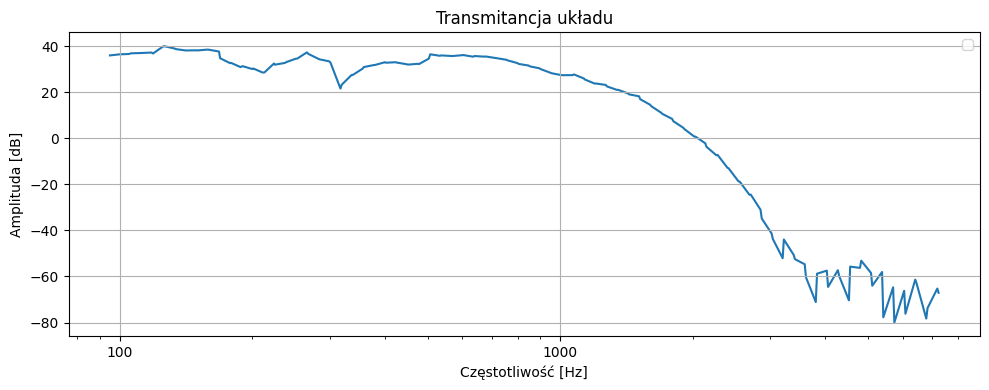

In [96]:
plot_transmitance(transmitance_json)

In [95]:
transmitance_json={k: np.abs(v) for k, v in transmitance_json.items()}

In [98]:
output_path = output_acoustic_piston_dir / "transmitance_single.json"
output_path =repo_dir / "transmitance_single.json"
save_json_file(output_path=output_path, data=transmitance_json)

## Structural+Acoustic

In [21]:
output_acoustic_dir = output_dir / "part_acoustic/dynamic"

In [153]:
def run_acoustic(input_path, remove: bool=True):
    output_path = output_acoustic_dir / f"{input_path.stem}.xdmf"
    struct_path= output_path.parent / Path(str(output_path.stem) + "r_phi_membrane_whole.npy")
    if not output_path.with_suffix(".npy").exists():
        cmd = [
            "./run_fenics.sh",
            "-c", "boomspeaver/structural/fem/the_membrane.py",
            "--time_input_path", str(input_time_10ms_path.relative_to(repo_dir)),
            "--signal_input_path", str(input_path.relative_to(repo_dir)),
            "--output_path", str(output_path.relative_to(repo_dir)),
            "--save_membrane",
        ]
        subprocess.run(cmd, check=True)

        if remove:
            for path in [
                output_path,
                output_path.with_suffix(".h5"),
                output_path.with_suffix(".msh"),
            ]:
                try:
                    if path.exists():
                        subprocess.run(["docker", "exec", "fenics", "rm", "-rf", str(path.relative_to(repo_dir))], check=False)
                except Exception as e:
                    print(f"[WARN] Could not remove {path}: {e}")
        cmd = [
            "./run_fenics.sh",
            "-c", "boomspeaver/acoustic/wave_equation_mdynamic_3d.py",
            "--time_input_path", str(input_time_20ms_path.relative_to(repo_dir)),
            "--membrane_input_path", str(struct_path.relative_to(repo_dir)),
            "--output_path", str(output_path.relative_to(repo_dir)),
            "--listen",
        ]
        subprocess.run(cmd, check=True)

        if remove:
            for path in [
                output_path,
                output_path.with_suffix(".h5"),
                struct_path,
            ]:
                try:
                    if path.exists():
                        subprocess.run(["docker", "exec", "fenics", "rm", "-rf", str(path.relative_to(repo_dir))], check=False)
                except Exception as e:
                    print(f"[WARN] Could not remove {path}: {e}")

In [154]:
membrane_short_paths=[path.with_suffix(".npy") for path in input_single_steady_paths if int(path.stem.split("_")[0][:-2]) < max_freq]
print(len(membrane_short_paths))

161


In [155]:
runner = MultiprocessingRunner(run_acoustic, membrane_short_paths, num_workers=12)

In [ ]:
runner.run()

Output()

Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode
Real mode


In [37]:
transmitance_json=None
transmitance_json=white_noise_transmitance(input_paths=input_single_steady_paths, relative_path=output_acoustic_piston_dir, freq_start=min_freq, freq_end=max_freq, sampling_rate=sampling_rate, external_json=transmitance_json)

/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/133/133Hz_cosine.npy
/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/part_acoustic/piston/133Hz_cosine.npy


/home/freetzz/repo/ls_wip/loudspeaker-solver/boomspeaver/tools/plot/multi_plotter.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


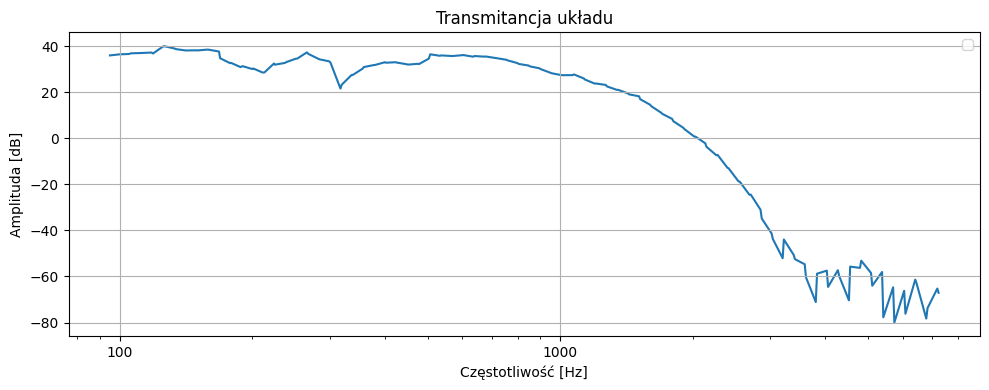

In [38]:
plot_transmitance(transmitance_json)

In [39]:
transmitance_json=None
transmitance_json=white_noise_transmitance(input_paths=input_single_steady_paths, relative_path=output_acoustic_dir, freq_start=min_freq, freq_end=max_freq, sampling_rate=sampling_rate, external_json=transmitance_json)

/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/133/133Hz_cosine.npy
/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/part_acoustic/dynamic/133Hz_cosine.npy


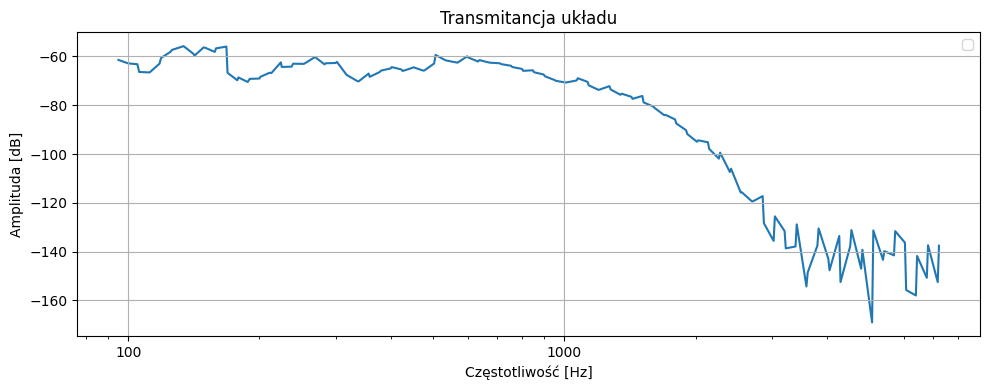

In [40]:
plot_transmitance(transmitance_json)

## ML predictions

In [167]:
import torch
from omegaconf import DictConfig, OmegaConf
from boomspeaver.structural.surrogate.model import Model
from boomspeaver.structural.surrogate.models import ModelArchitecture

In [168]:
def load_model_from_path(model_path: Path, cfg_model: DictConfig, device: str):
    """
    Load a model from a checkpoint using the ModelArchitecture + Model wrapper.
    """
    model_arch = ModelArchitecture.build_model(cfg_model)

    trainer = Model(
        model=model_arch,
        optimizer=None,
        scheduler=None,
        loss_fn=None,
        device=device,
    )

    epoch, best_val_loss = trainer.load_checkpoint(model_path)
    print(f"Loaded {model_path} | Epoch: {epoch}, Best val loss: {best_val_loss:.6f}")

    trainer.model.eval()
    return trainer

In [169]:
model_step_path=repo_dir/"output_al_mid_time_v6/al_7/best_model.pt"
config_path=model_step_path.parent/"config.yaml"

In [170]:
cfg = OmegaConf.load(config_path)
model_step = load_model_from_path(model_step_path, cfg.model, "cuda")

✓ Checkpoint loaded: /home/freetzz/repo/ls_wip/loudspeaker-solver/output_al_mid_time_v6/al_7/best_model.pt
Loaded /home/freetzz/repo/ls_wip/loudspeaker-solver/output_al_mid_time_v6/al_7/best_model.pt | Epoch: 633, Best val loss: 0.027284


In [213]:
model_past_future_path=repo_dir/"output_al_fullnet_time_10/al_1/best_model.pt"
config_path=model_past_future_path.parent.parent/"al_0/config.yaml"

In [214]:
cfg = OmegaConf.load(config_path)
model_pf = load_model_from_path(model_past_future_path, cfg.model, "cuda")

✓ Checkpoint loaded: /home/freetzz/repo/ls_wip/loudspeaker-solver/output_al_fullnet_time_10/al_1/best_model.pt
Loaded /home/freetzz/repo/ls_wip/loudspeaker-solver/output_al_fullnet_time_10/al_1/best_model.pt | Epoch: 92, Best val loss: 0.069627


In [ ]:
membrane_single_paths=list(search4paths(input_path=output_structural_dir, recursive=False,search_pattern="*cosine.npy"))
membrane_sim=[load_numpy_file(i) for i in membrane_single_paths]

In [172]:
print(membrane_sim[0].shape)

(480, 128)


In [207]:
def pred(input_data, model_obj):
    input_data=torch.tensor(input_data, dtype=torch.float32).to("cuda").unsqueeze(0).unsqueeze(0)
    dummy_time=torch.tensor([1], dtype=torch.float32).to("cuda")
    y_pred = model_obj.model(input_data, time=dummy_time).squeeze(0).squeeze(0).squeeze(0)
    return y_pred

def mse(pred_data, output_gt_data):
    output_gt_data=torch.tensor(output_gt_data, dtype=torch.float32).to("cuda")
    return torch.mean((pred_data[10:] - output_gt_data[10:]) ** 2).item()

In [174]:
loss=0
counter=0
tol = 1e-3
with torch.no_grad():
    for i, sim in enumerate(membrane_sim):
        print(i)
        for snap in range(1,sim.shape[0]):
            input_data=sim[snap-1,:]
            output_data=sim[snap,:]
            pred_data=pred(input_data=input_data, model_obj=model_step)
            loss+=mse(pred_data=pred_data, output_gt_data=output_data)
            counter+=1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160


In [175]:
avg_test_loss=loss / counter
print(avg_test_loss)

0.0014493050192690186


In [ ]:
output = []

with torch.no_grad():
    for k, sim in enumerate(membrane_sim):
        print(f"Simulation {k}")
        sim = torch.tensor(sim, dtype=torch.float32, device="cuda")

        new = []
        pred_data = sim[0, :].clone()

        for i in range(sim.shape[0]):
            current = pred_data.clone()
            current[10:] = sim[i, 10:]

            pred_data = pred(input_data=current, model_obj=model_step)

            pred_data = torch.nan_to_num(pred_data, nan=0.0, posinf=0.0, neginf=0.0)

            new.append(pred_data.clone().detach())

        output.append(new)


Simulation 0


/tmp/ipykernel_155802/2946350154.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_data=torch.tensor(input_data, dtype=torch.float32).to("cuda").unsqueeze(0).unsqueeze(0)


Simulation 1
Simulation 2
Simulation 3
Simulation 4
Simulation 5
Simulation 6
Simulation 7
Simulation 8
Simulation 9
Simulation 10
Simulation 11
Simulation 12
Simulation 13
Simulation 14
Simulation 15
Simulation 16
Simulation 17
Simulation 18
Simulation 19
Simulation 20
Simulation 21
Simulation 22
Simulation 23
Simulation 24
Simulation 25
Simulation 26
Simulation 27
Simulation 28
Simulation 29
Simulation 30
Simulation 31
Simulation 32
Simulation 33
Simulation 34
Simulation 35
Simulation 36
Simulation 37
Simulation 38
Simulation 39
Simulation 40
Simulation 41
Simulation 42
Simulation 43
Simulation 44
Simulation 45
Simulation 46
Simulation 47
Simulation 48
Simulation 49
Simulation 50
Simulation 51
Simulation 52
Simulation 53
Simulation 54
Simulation 55
Simulation 56
Simulation 57
Simulation 58
Simulation 59
Simulation 60
Simulation 61
Simulation 62
Simulation 63
Simulation 64
Simulation 65
Simulation 66
Simulation 67
Simulation 68
Simulation 69
Simulation 70
Simulation 71
Simulation 72
S

In [218]:
assert len(output) == len(membrane_sim)
loss=0
counter=0
for gt, pred_ in zip(membrane_sim,output):
    for i in range(len(pred_)):
        gt_tensor = torch.tensor(gt[i,:], dtype=torch.float32, device=pred_[i].device)
        if torch.isnan(pred_[i]).any() or torch.isinf(pred_[i]).any():
            print(f"Warning: NaN/Inf detected in pred at index {i}")
            continue
        if torch.isnan(gt_tensor).any() or torch.isinf(gt_tensor).any():
            print(f"Warning: NaN/Inf detected in gt at index {i}")
            continue
        loss+=torch.mean((gt_tensor - pred_[i]) ** 2).item()
        counter+=1
        print(loss)
    break
print(counter)
        

0.0011751858983188868
0.0025839239824563265
0.005236847558990121
0.00984055851586163
0.016859182389453053
0.026504706824198365
0.038263579132035375
0.0519585853908211
0.06790496618486941
0.08638586499728262
0.10797778354026377
0.1334468445274979
0.16431980417110026
0.20330797345377505
0.2541680878493935
0.32319189072586596
0.4199308177921921
0.5588607511017472
0.7615978440735489
1.059925319859758
1.5009197613690048
2.154460253426805
3.123736264416948
4.561507942387834
6.691321375081316
9.845438720891252
14.511842968175188
21.404910804936662
31.565350296208635
46.49706053943373
68.36428809375502
100.2715947648976
146.6540410539601
213.82393241138197
310.7480351945851
450.14477896899916
650.034869911382
935.9271123430226
1343.9247014543507
1925.1331365129445
2751.890826942632
3926.6045720598195
5594.2954900285695
7960.4073064348195
11316.093585731694
16074.138507606694
22819.986652137944
32384.284503700444
45945.975909950444
65178.874347450444
92460.11067557544
131166.57551932544
186096.

In [202]:
print(loss)

nan


In [254]:
def pred_history(input_data, model_obj):
    input_data=torch.tensor(input_data, dtype=torch.float32).to("cuda").unsqueeze(1).unsqueeze(0)
    dummy_time=torch.tensor([1], dtype=torch.float32).to("cuda")
    y_pred = model_obj.model(input_data, time=dummy_time).squeeze(0).squeeze(1)

    return y_pred

In [263]:
main_loss=[]
loss=0
couter=0
with torch.no_grad():
    output = torch.zeros((len(membrane_sim), sim.shape[0], sim.shape[1]),
                         dtype=torch.float32, device="cuda")

    for k, sim in enumerate(membrane_sim):
        print(f"Simulation {k}")
        sim = torch.tensor(sim, dtype=torch.float32, device="cuda")

        pred_data = sim[0, :].clone()

        for i in range(10):
            current = pred_data.clone()
            current[10:] = sim[i, 10:]
            pred_data = pred(input_data=current, model_obj=model_step)
            pred_data = torch.nan_to_num(pred_data, nan=0.0, posinf=0.0, neginf=0.0)
            output[k, i, :] = pred_data.clone()
            pred_data
            loss+=torch.mean((sim[i,:] - pred_data) ** 2).item()
            counter+=1

        for i in range(10,sim.shape[0]):
            pred_data=pred_history(input_data=output[k,i-10:i,:], model_obj=model_pf)
            pred_data[0,10:] = sim[i, 10:]
            pred_data=pred_data[0,:]
            pred_data = torch.nan_to_num(pred_data, nan=0.0, posinf=0.0, neginf=0.0)
            output[k, i, :] = pred_data.clone()
            loss+=torch.mean((sim[i,:] - pred_data) ** 2).item()
            counter+=1

        main_loss.append([loss,counter])

Simulation 0


/tmp/ipykernel_155802/2946350154.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_data=torch.tensor(input_data, dtype=torch.float32).to("cuda").unsqueeze(0).unsqueeze(0)


Simulation 1
Simulation 2
Simulation 3
Simulation 4
Simulation 5
Simulation 6
Simulation 7
Simulation 8
Simulation 9
Simulation 10
Simulation 11
Simulation 12
Simulation 13
Simulation 14
Simulation 15
Simulation 16
Simulation 17
Simulation 18
Simulation 19
Simulation 20
Simulation 21
Simulation 22
Simulation 23
Simulation 24
Simulation 25
Simulation 26
Simulation 27
Simulation 28
Simulation 29
Simulation 30
Simulation 31
Simulation 32
Simulation 33
Simulation 34
Simulation 35
Simulation 36
Simulation 37
Simulation 38
Simulation 39
Simulation 40
Simulation 41
Simulation 42
Simulation 43
Simulation 44
Simulation 45
Simulation 46
Simulation 47
Simulation 48
Simulation 49
Simulation 50
Simulation 51
Simulation 52
Simulation 53
Simulation 54
Simulation 55
Simulation 56
Simulation 57
Simulation 58
Simulation 59
Simulation 60
Simulation 61
Simulation 62
Simulation 63
Simulation 64
Simulation 65
Simulation 66
Simulation 67
Simulation 68
Simulation 69
Simulation 70
Simulation 71
Simulation 72
S

In [ ]:
test=[i[0]/i[1]  for i in main_loss]
print(test)

[0.02951513753169973, 0.05287591668882854, 0.07736868712788984, 0.09621872314374376, 0.11610649005400948, 0.13478392979243445, 0.15189561120802753, 0.16453863278198316, 0.17977799895227697, 0.1911787241497341, 0.20433913204094514, 0.2161776225029214, 0.225099836493406, 0.23344622770568677, 0.24059155480951222, 0.24888426452295093, 0.2570622857628602, 0.26568704115380587, 0.2740540488691949, 0.2795006585382287, 0.28521576614404626, 0.2922332970734128, 0.29719016863416425, 0.3039707094997274, 0.3103183991697837, 0.31638599893996705, 0.31982496511390973, 0.3226786953411159, 0.3263360841915036, 0.3305796974550325, 0.33358283627663576, 0.3356631096741613, 0.33921970588512235, 0.3417217296629544, 0.3446069753600995, 0.34895979224121965, 0.35098700831053187, 0.3540226997201687, 0.35792818524378756, 0.36181026085685786, 0.3641865754491712, 0.3687853828709189, 0.37083573844559503, 0.3742182888541164, 0.3764342195136171, 0.3776327313875702, 0.3801564990838343, 0.38194683533465834, 0.384579997080

In [267]:
main_loss=[]
loss=0
couter=0
with torch.no_grad():
    output = torch.zeros((len(membrane_sim), sim.shape[0], sim.shape[1]),
                         dtype=torch.float32, device="cuda")

    for k, sim in enumerate(membrane_sim):
        print(f"Simulation {k}")
        sim = torch.tensor(sim, dtype=torch.float32, device="cuda")

        output[k,10:,:] = sim[10, :].clone()

        # for i in range(10):
        #     current = pred_data.clone()
        #     current[10:] = sim[i, 10:]
        #     pred_data = pred(input_data=current, model_obj=model_step)
        #     pred_data = torch.nan_to_num(pred_data, nan=0.0, posinf=0.0, neginf=0.0)
        #     output[k, i, :] = pred_data.clone()
        #     pred_data
        #     loss+=torch.mean((sim[i,:] - pred_data) ** 2).item()
        #     counter+=1

        for i in range(10,sim.shape[0]):
            pred_data=pred_history(input_data=output[k,i-10:i,:], model_obj=model_pf)
            pred_data[0,10:] = sim[i, 10:]
            pred_data=pred_data[0,:]
            pred_data = torch.nan_to_num(pred_data, nan=0.0, posinf=0.0, neginf=0.0)
            output[k, i, :] = pred_data.clone()
            loss+=torch.mean((sim[i,:] - pred_data) ** 2).item()
            counter+=1

        main_loss.append([loss,counter])

Simulation 0


/tmp/ipykernel_155802/1615767486.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_data=torch.tensor(input_data, dtype=torch.float32).to("cuda").unsqueeze(1).unsqueeze(0)


Simulation 1
Simulation 2
Simulation 3
Simulation 4
Simulation 5
Simulation 6
Simulation 7
Simulation 8
Simulation 9
Simulation 10
Simulation 11
Simulation 12
Simulation 13
Simulation 14
Simulation 15
Simulation 16
Simulation 17
Simulation 18
Simulation 19
Simulation 20
Simulation 21
Simulation 22
Simulation 23
Simulation 24
Simulation 25
Simulation 26
Simulation 27
Simulation 28
Simulation 29
Simulation 30
Simulation 31
Simulation 32
Simulation 33
Simulation 34
Simulation 35
Simulation 36
Simulation 37
Simulation 38
Simulation 39
Simulation 40
Simulation 41
Simulation 42
Simulation 43
Simulation 44
Simulation 45
Simulation 46
Simulation 47
Simulation 48
Simulation 49
Simulation 50
Simulation 51
Simulation 52
Simulation 53
Simulation 54
Simulation 55
Simulation 56
Simulation 57
Simulation 58
Simulation 59
Simulation 60
Simulation 61
Simulation 62
Simulation 63
Simulation 64
Simulation 65
Simulation 66
Simulation 67
Simulation 68
Simulation 69
Simulation 70
Simulation 71
Simulation 72
S

In [268]:
print(loss/counter)

0.2243000504032156


In [147]:
model_future_path=repo_dir/"output_al_fullnet_time_10_from_1/al_40/best_model.pt"
config_path=model_future_path.parent/"config.yaml"

In [ ]:
cfg = OmegaConf.load(config_path)
model_step = load_model_from_path(model_future_path, cfg.model, "cuda")

✓ Checkpoint loaded: /home/freetzz/repo/ls_wip/loudspeaker-solver/output_al_fullnet_time_10_from_1/al_40/best_model.pt
Loaded /home/freetzz/repo/ls_wip/loudspeaker-solver/output_al_fullnet_time_10_from_1/al_40/best_model.pt | Epoch: 463, Best val loss: 0.820626


In [163]:
def pred(input_data, model_obj):
    input_data=torch.tensor(input_data, dtype=torch.float32).to("cuda").unsqueeze(0).unsqueeze(0).unsqueeze(0)
    dummy_time=torch.tensor([1], dtype=torch.float32).to("cuda")
    y_pred = model_obj.model(input_data, time=dummy_time).squeeze(0).squeeze(1)
    return y_pred

def mse(pred_data, output_gt_data):
    output_gt_data=torch.tensor(output_gt_data, dtype=torch.float32).to("cuda")
    return torch.mean((pred_data[:,10:] - output_gt_data[:,10:]) ** 2).item()

In [164]:
loss=0
counter=0
tol = 1e-3
with torch.no_grad():
    for i, sim in enumerate(membrane_sim):
        print(i)
        for snap in range(11,sim.shape[0]):
            start=snap-11
            input_data=sim[start,:]
            output_data=sim[start+1:snap,:]
            pred_data=pred(input_data=input_data, model_obj=model_step)
            loss+=mse(pred_data=pred_data, output_gt_data=output_data)
            counter+=1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160


In [165]:
avg_test_loss=loss / counter
print(avg_test_loss)

0.040029138831857235


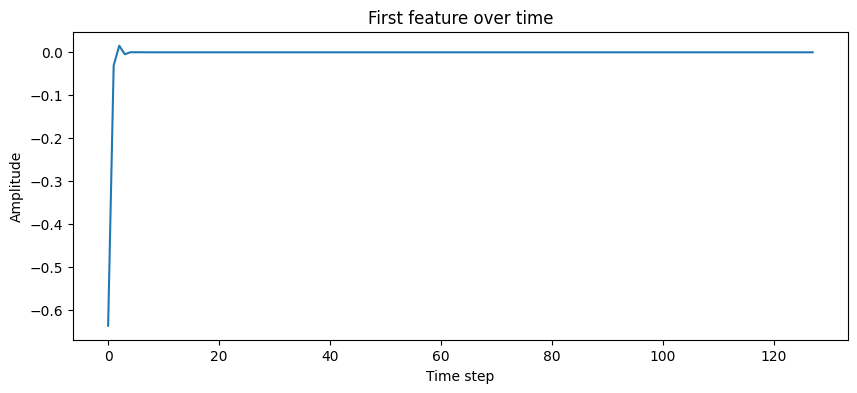

In [83]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(10, 4))
plt.plot(membrane_sim[20][0, :])
plt.xlabel("Time step")
plt.ylabel("Amplitude")
plt.title("First feature over time")
plt.show()

## Sanity Check

In [151]:
def make_spectrogram_b(signal: np.ndarray, window_size: int = 2048, hop_length: int = 512):
    window = np.hanning(window_size)
    stft = librosa.stft(signal, n_fft=window_size, hop_length=hop_length, window=window)
    spec = np.abs(stft)
    return spec

def plot_spectrum(spec: np.ndarray, sampling_rate: int) -> None:
    plt.figure(figsize=(12, 4))
    spec_db = librosa.amplitude_to_db(spec, ref=np.max)
    librosa.display.specshow(spec_db, y_axis='log', x_axis='time', sr=sampling_rate)
    plt.title('Spectrogram')
    plt.colorbar(format='%+2.0f dB')
    plt.show()

In [136]:
print(membrane_paths[0])
t=time_100ms
# file=load_numpy_file(membrane_paths[0])[:len(t)]
file=load_numpy_file(membrane_paths[0])[-len(t):]
print(len(file))
print(len(t))

/home/freetzz/repo/ls_wip/loudspeaker-solver/generate_dataset/input_test_files/95to117/95to117Hz_sweep.npy
4800
4800


In [ ]:
freqs,values=fft_analysis(file, sampling_rate=sampling_rate)

mask = (freqs >= min_freq) & (freqs <= max_freq)
mask = (freqs >= 80) & (freqs <= 150)
freqs, values = freqs[mask], values[mask]

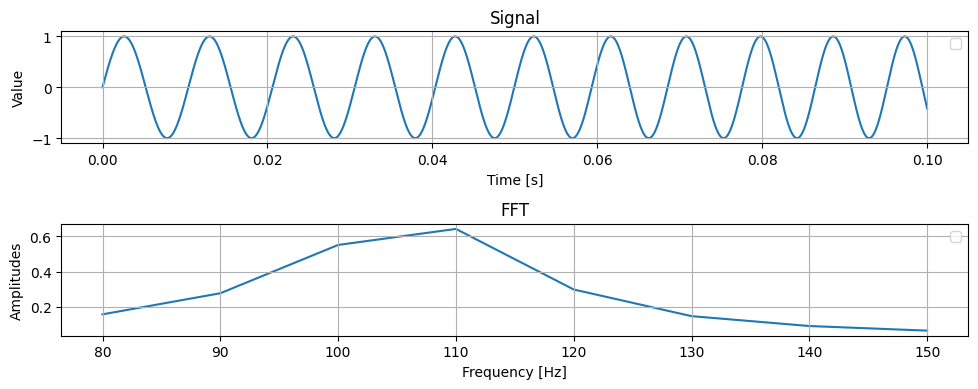

In [149]:
plotter_config = Plotter(figsize=(10, 4), grid=True, tight_layout=True, sharex=False, sharey=False)
plotter = MultiPlotter(config=plotter_config)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="Signal",
            xlabel="Time [s]",
            ylabel="Value",
            logx=False,
        ),
        chart_elements=[Line(t,file)],
    )
)
plotter.add_subplot(
    Subplot(
        axis_config=Axis(
            title="FFT",
            xlabel="Frequency [Hz]",
            ylabel="Amplitudes",
            logx=False,
        ),
        chart_elements=[Line(freqs,values)],
    )
)
plotter.plot()

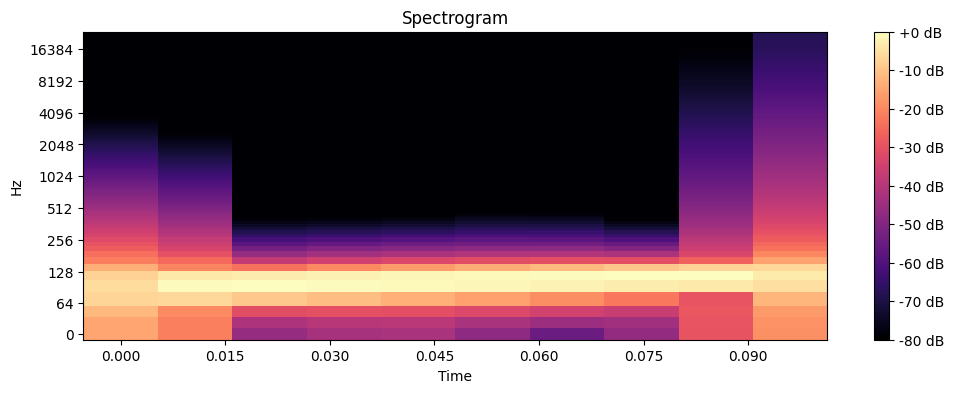

In [152]:
plot_spectrum(make_spectrogram_b(file),sampling_rate=sampling_rate)